# Assignment 3 - sxb180048

## PREPROCESSING DATA 

#### Importing Packages

In [422]:
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np
import seaborn as sns
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import confusion_matrix ,classification_report,accuracy_score,recall_score,precision_score,f1_score
import math
from sklearn.model_selection import cross_val_score,learning_curve,train_test_split
from sklearn import metrics #Import scikit-learn metrics module for accuracy calculation
import keras
from keras.models import Sequential
from keras.layers import Dense, Dropout, Activation
from keras.models import Sequential
import itertools
from sklearn.neural_network import MLPClassifier
from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score
from sklearn.metrics import confusion_matrix
from keras.models import Sequential
from keras.layers import Dense
from sklearn.model_selection import StratifiedKFold
from sklearn.neighbors import KNeighborsClassifier

### Functions

#### Importing Energy Data

In [205]:
#Read Data
datadf=pd.read_csv("energydata_complete.csv")


#### Exploratory Data Analysis


In [206]:
# Data EDA
datadf.head()
datadf.describe()

,Appliances,lights,T1,RH_1,T2,RH_2,T3,RH_3,T4,RH_4,...,T9,RH_9,T_out,Press_mm_hg,RH_out,Windspeed,Visibility,Tdewpoint,rv1,rv2
count,19735.000000,19735.000000,19735.000000,19735.000000,19735.000000,19735.000000,19735.000000,19735.000000,19735.000000,19735.000000,...,19735.000000,19735.000000,19735.000000,19735.000000,19735.000000,19735.000000,19735.000000,19735.000000,19735.000000,19735.000000
mean,97.694958,3.801875,21.686571,40.259739,20.341219,40.420420,22.267611,39.242500,20.855335,39.026904,...,19.485828,41.552401,7.411665,755.522602,79.750418,4.039752,38.330834,3.760707,24.988033,24.988033
std,102.524891,7.935988,1.606066,3.979299,2.192974,4.069813,2.006111,3.254576,2.042884,4.341321,...,2.014712,4.151497,5.317409,7.399441,14.901088,2.451221,11.794719,4.194648,14.496634,14.496634
min,10.000000,0.000000,16.790000,27.023333,16.100000,20.463333,17.200000,28.766667,15.100000,27.660000,...,14.890000,29.166667,-5.000000,729.300000,24.000000,0.000000,1.000000,-6.600000,0.005322,0.005322
25%,50.000000,0.000000,20.760000,37.333333,18.790000,37.900000,20.790000,36.900000,19.530000,35.530000,...,18.000000,38.500000,3.666667,750.933333,70.333333,2.000000,29.000000,0.900000,12.497889,12.497889
50%,60.000000,0.000000,21.600000,39.656667,20.000000,40.500000,22.100000,38.530000,20.666667,38.400000,...,19.390000,40.900000,6.916667,756.100000,83.666667,3.666667,40.000000,3.433333,24.897653,24.897653
75%,100.000000,0.000000,22.600000,43.066667,21.500000,43.260000,23.290000,41.760000,22.100000,42.156667,...,20.600000,44.338095,10.408333,760.933333,91.666667,5.500000,40.000000,6.566667,37.583769,37.583769
max,1080.000000,70.000000,26.260000,63.360000,29.856667,56.026667,29.236000,50.163333,26.200000,51.090000,...,24.500000,53.326667,26.100000,772.300000,100.000000,14.000000,66.000000,15.500000,49.996530,49.996530


#### Correlation

In [207]:
#Raw Correlation
datadf.corr()

,Appliances,lights,T1,RH_1,T2,RH_2,T3,RH_3,T4,RH_4,...,T9,RH_9,T_out,Press_mm_hg,RH_out,Windspeed,Visibility,Tdewpoint,rv1,rv2
Appliances,1.000000,0.197278,0.055447,0.086031,0.120073,-0.060465,0.085060,0.036292,0.040281,0.016965,...,0.010010,-0.051462,0.099155,-0.034885,-0.152282,0.087122,0.000230,0.015353,-0.011145,-0.011145
lights,0.197278,1.000000,-0.023528,0.106968,-0.005622,0.050985,-0.097393,0.131161,-0.008859,0.114936,...,-0.157592,-0.008766,-0.074424,-0.010576,0.068543,0.060281,0.020038,-0.036322,0.000521,0.000521
T1,0.055447,-0.023528,1.000000,0.164006,0.836834,-0.002509,0.892402,-0.028550,0.877001,0.097861,...,0.844777,0.071756,0.682846,-0.150574,-0.345481,-0.087654,-0.076210,0.571309,-0.006203,-0.006203
RH_1,0.086031,0.106968,0.164006,1.000000,0.269839,0.797535,0.253230,0.844677,0.106180,0.880359,...,0.115263,0.764001,0.340767,-0.293957,0.274126,0.204932,-0.021057,0.639106,-0.000699,-0.000699
T2,0.120073,-0.005622,0.836834,0.269839,1.000000,-0.165610,0.735245,0.121497,0.762066,0.231563,...,0.675535,0.157346,0.792255,-0.133028,-0.505291,0.052495,-0.069721,0.582602,-0.011087,-0.011087
RH_2,-0.060465,0.050985,-0.002509,0.797535,-0.165610,1.000000,0.137319,0.678326,-0.047304,0.721435,...,0.054544,0.676467,0.033674,-0.255646,0.584911,0.069190,-0.005368,0.499152,0.006275,0.006275
T3,0.085060,-0.097393,0.892402,0.253230,0.735245,0.137319,1.000000,-0.011234,0.852778,0.122737,...,0.901324,0.134602,0.699417,-0.189974,-0.281718,-0.100776,-0.102310,0.645886,-0.005194,-0.005194
RH_3,0.036292,0.131161,-0.028550,0.844677,0.121497,0.678326,-0.011234,1.000000,-0.140457,0.898978,...,-0.195270,0.833538,0.118207,-0.233274,0.356192,0.263188,0.017041,0.414387,-0.000477,-0.000477
T4,0.040281,-0.008859,0.877001,0.106180,0.762066,-0.047304,0.852778,-0.140457,1.000000,-0.048650,...,0.889439,-0.025549,0.663478,-0.075292,-0.388602,-0.185747,-0.104768,0.519471,-0.001815,-0.001815
RH_4,0.016965,0.114936,0.097861,0.880359,0.231563,0.721435,0.122737,0.898978,-0.048650,1.000000,...,-0.044518,0.856591,0.293289,-0.250748,0.336813,0.300192,0.002636,0.616509,-0.001787,-0.001787


#### Corealtion PLot

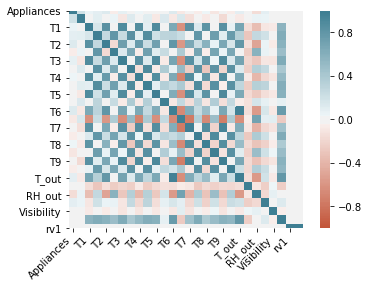

In [208]:
corr = datadf.corr()
ax = sns.heatmap(corr,vmin=-1, vmax=1, center=0,cmap=sns.diverging_palette(20, 220, n=200),square=True)
ax.set_xticklabels(ax.get_xticklabels(),rotation=45,horizontalalignment='right');

#### Correlation based on Threshold

In [209]:
# Function of Correlation
def correlation(data, threshold=0.85):
    col_corr = set()  # Set of all the names of deleted columns
    corr_matrix = data.corr()
    print('Correlation with more than',threshold)
    print('Corr Value',"\t""\t", 'Fearture1', "\t", 'Feature 2')
    for i in range(len(corr_matrix.columns)):
        for j in range(i):
            if (corr_matrix.iloc[i, j] >= threshold) and (corr_matrix.columns[j] not in col_corr):
                print(corr_matrix.iloc[i, j], "\t", corr_matrix.columns[i], "\t" "\t", corr_matrix.columns[j])

In [210]:
correlation(datadf)

Correlation with more than 0.85
Corr Value 		 Fearture1 	 Feature 2
0.8924022851105534 	 T3 		 T1
0.8770010621969784 	 T4 		 T1
0.8527777303850508 	 T4 		 T3
0.8803585351891977 	 RH_4 		 RH_1
0.8989782902830947 	 RH_4 		 RH_3
0.8852468734266851 	 T5 		 T1
0.8881689127749756 	 T5 		 T3
0.8718134776269506 	 T5 		 T4
0.8777628824299991 	 T7 		 T4
0.8706241968593113 	 T7 		 T5
0.8943012488817869 	 RH_7 		 RH_4
0.8821232262844226 	 T8 		 T7
0.8839839643177134 	 RH_8 		 RH_7
0.9013235850825261 	 T9 		 T3
0.8894391511402565 	 T9 		 T4
0.9110551178067879 	 T9 		 T5
0.9447764235687138 	 T9 		 T7
0.8693377167311398 	 T9 		 T8
0.8565910846530053 	 RH_9 		 RH_4
0.8586863724042209 	 RH_9 		 RH_7
0.8558118582065599 	 RH_9 		 RH_8
0.9747866900664592 	 T_out 		 T6
1.0 	 rv2 		 rv1


### Comments: Reasons to Drop Columns
##### 1) Since rv2 and rv1 are perfectly correlated
##### 2) Since T3 is highly correlated to T1 and T5
##### 4) RH_4 is highly correlted to RH_1 and RH_3
##### 5) T9 is highly correlated to T3,T4,T5,T7
##### 6) RH_7 is highly Correlated to RH_4,RH_8
##### 7) T_out is higly Correlated to T6
##### 8) Date Column
##### 9) RH_9 is highly correlated to RH_7,RH_8

In [211]:
#1st Instance of Dropping Columns
dropped_datadf =datadf.drop(columns =['date','T_out','RH_7','T9','RH_4','T3','rv2','RH_9'])
                    

In [212]:
correlation(dropped_datadf)

Correlation with more than 0.85
Corr Value 		 Fearture1 	 Feature 2
0.8770010621969784 	 T4 		 T1
0.8852468734266851 	 T5 		 T1
0.8718134776269506 	 T5 		 T4
0.8777628824299991 	 T7 		 T4
0.8706241968593113 	 T7 		 T5
0.8821232262844226 	 T8 		 T7


In [213]:
#Counting values of Lights
datadf['lights'].value_counts()

0     15252
10     2212
20     1624
30      559
40       77
50        9
60        1
70        1
Name: lights, dtype: int64

### Comments : Reasons to Drop Columns
##### 1) T1 is highlt correlated to T4,T5
##### 2) Lights, as there are too many null values
##### 3) Visibilty's correlation with the dependent variable is too low

In [214]:
# 2nd instance of Dropping Columns
dropped2_datadf = dropped_datadf.drop(columns =['T1','T7','lights','Visibility'])


In [215]:
correlation(dropped2_datadf)

Correlation with more than 0.85
Corr Value 		 Fearture1 	 Feature 2
0.8718134776269506 	 T5 		 T4


In [216]:
F_datadf = dropped2_datadf

#### Outliers

In [217]:
# Removing Outliers using the interquartile range
datadf_rm_out = F_datadf[F_datadf['Appliances']<=175]

#### Binning Data 

In [218]:
datadf_log = datadf_rm_out.copy()
datadf_log['Appliances_class'] = [0 if x <= 60 else 1 for x in datadf_rm_out['Appliances']]
datadf_log = datadf_log.drop(columns=['Appliances'])

#### Scaling the features

In [219]:

scaler = StandardScaler()
datadf_sc = scaler.fit_transform(datadf_rm_out)
datadf_sc = pd.DataFrame(datadf_sc, columns=datadf_rm_out.columns)

In [417]:
y = datadf_log['Appliances_class']
x = datadf_sc.iloc[:, 1:]

In [418]:
x.shape

(17597, 16)

In [419]:
y

0        0
1        0
2        0
3        0
4        0
        ..
19727    1
19728    1
19729    1
19730    1
19731    1
Name: Appliances_class, Length: 17597, dtype: int64

## Data Split for MLP

In [223]:
mlp_x_train, mlp_x_test, mlp_y_train, mlp_y_test=train_test_split(x, y, test_size=0.3, random_state=33)

# Experimenting with Combination of Neurons and Layers

In [339]:
#### Combination of Neurons and Layers
optimizer_value = keras.optimizers.Adam(learning_rate=0.01)
neurons_list = [8, 12, 16]
layers_combo = [2,3,4]
acc_list = []
acc_df = pd.DataFrame()
for layer_no in layers_combo:
    print("The Number of layers:",layer_no)
    neurons_combo = [p for p in itertools.product(neurons_list, repeat=layer_no)]
    for neurons in neurons_combo:
        print("The tuple of Neurons:",neurons)
        model = Sequential()
        for layer in range(1,layer_no+1):
            if (layer == 1):
                model.add(Dense(neurons[0], input_dim=16, activation='sigmoid'))
            else:
                model.add(Dense(neurons[layer-1],activation='sigmoid'))
        model.add(Dense(1, activation='sigmoid'))
        model.compile(optimizer=optimizer_value, loss='binary_crossentropy', metrics=['acc'])
        model.fit(mlp_x_train, mlp_y_train, epochs=250,batch_size=200)
        pred = model.predict_classes(mlp_x_test)
        acc = accuracy_score(mlp_y_test,pred)
        acc_values  =  [acc,layer_no,neurons]
        acc_values = pd.DataFrame(acc_values).T
        acc_df = pd.concat([acc_df,acc_values])

acc_df.columns = ['Accuracy','LayerNumber','Neurons']
acc_df.sort_values(by='Accuracy', ascending = False)

The Number of layers: 2
The tuple of Neurons: (8, 8)
Epoch 1/250
12317/12317 [==============================] - ETA: 20s - loss: 0.6960 - acc: 0.66 - ETA: 1s - loss: 0.7119 - acc: 0.5962 - ETA: 0s - loss: 0.6884 - acc: 0.606 - ETA: 0s - loss: 0.6756 - acc: 0.609 - ETA: 0s - loss: 0.6658 - acc: 0.608 - ETA: 0s - loss: 0.6562 - acc: 0.618 - 1s 52us/step - loss: 0.6501 - acc: 0.6259
Epoch 2/250
12317/12317 [==============================] - ETA: 0s - loss: 0.6202 - acc: 0.675 - ETA: 0s - loss: 0.5952 - acc: 0.686 - ETA: 0s - loss: 0.5912 - acc: 0.691 - ETA: 0s - loss: 0.5833 - acc: 0.698 - ETA: 0s - loss: 0.5812 - acc: 0.701 - ETA: 0s - loss: 0.5763 - acc: 0.705 - 0s 24us/step - loss: 0.5737 - acc: 0.7089
Epoch 3/250
12317/12317 [==============================] - ETA: 0s - loss: 0.5817 - acc: 0.680 - ETA: 0s - loss: 0.5479 - acc: 0.733 - ETA: 0s - loss: 0.5483 - acc: 0.735 - ETA: 0s - loss: 0.5395 - acc: 0.742 - ETA: 0s - loss: 0.5409 - acc: 0.740 - 0s 21us/step - loss: 0.5391 - acc: 0.73

Epoch 29/250
12317/12317 [==============================] - ETA: 0s - loss: 0.4277 - acc: 0.815 - ETA: 0s - loss: 0.4399 - acc: 0.805 - ETA: 0s - loss: 0.4450 - acc: 0.801 - ETA: 0s - loss: 0.4408 - acc: 0.801 - 0s 17us/step - loss: 0.4399 - acc: 0.8034
Epoch 30/250
12317/12317 [==============================] - ETA: 0s - loss: 0.4551 - acc: 0.800 - ETA: 0s - loss: 0.4400 - acc: 0.799 - ETA: 0s - loss: 0.4454 - acc: 0.799 - ETA: 0s - loss: 0.4414 - acc: 0.802 - 0s 16us/step - loss: 0.4400 - acc: 0.8044
Epoch 31/250
12317/12317 [==============================] - ETA: 0s - loss: 0.4049 - acc: 0.825 - ETA: 0s - loss: 0.4343 - acc: 0.803 - ETA: 0s - loss: 0.4364 - acc: 0.803 - ETA: 0s - loss: 0.4402 - acc: 0.802 - 0s 16us/step - loss: 0.4395 - acc: 0.8051
Epoch 32/250
12317/12317 [==============================] - ETA: 0s - loss: 0.4823 - acc: 0.760 - ETA: 0s - loss: 0.4338 - acc: 0.806 - ETA: 0s - loss: 0.4428 - acc: 0.800 - ETA: 0s - loss: 0.4413 - acc: 0.799 - ETA: 0s - loss: 0.4358 - a

12317/12317 [==============================] - ETA: 0s - loss: 0.4197 - acc: 0.800 - ETA: 0s - loss: 0.4161 - acc: 0.818 - 0s 8us/step - loss: 0.4140 - acc: 0.8212
Epoch 109/250
12317/12317 [==============================] - ETA: 0s - loss: 0.3793 - acc: 0.835 - ETA: 0s - loss: 0.4199 - acc: 0.820 - 0s 8us/step - loss: 0.4138 - acc: 0.8222
Epoch 110/250
12317/12317 [==============================] - ETA: 0s - loss: 0.3461 - acc: 0.845 - ETA: 0s - loss: 0.4107 - acc: 0.821 - 0s 8us/step - loss: 0.4127 - acc: 0.8224
Epoch 111/250
12317/12317 [==============================] - ETA: 0s - loss: 0.4600 - acc: 0.760 - ETA: 0s - loss: 0.4133 - acc: 0.819 - 0s 8us/step - loss: 0.4122 - acc: 0.8198
Epoch 112/250
12317/12317 [==============================] - ETA: 0s - loss: 0.4599 - acc: 0.780 - ETA: 0s - loss: 0.4201 - acc: 0.817 - 0s 8us/step - loss: 0.4107 - acc: 0.8220
Epoch 113/250
12317/12317 [==============================] - ETA: 0s - loss: 0.4070 - acc: 0.830 - ETA: 0s - loss: 0.4116 - 

Epoch 200/250
12317/12317 [==============================] - ETA: 0s - loss: 0.3718 - acc: 0.860 - ETA: 0s - loss: 0.3985 - acc: 0.827 - 0s 8us/step - loss: 0.4008 - acc: 0.8304
Epoch 201/250
12317/12317 [==============================] - ETA: 0s - loss: 0.3873 - acc: 0.835 - ETA: 0s - loss: 0.4057 - acc: 0.830 - 0s 8us/step - loss: 0.4014 - acc: 0.8304
Epoch 202/250
12317/12317 [==============================] - ETA: 0s - loss: 0.3230 - acc: 0.885 - ETA: 0s - loss: 0.3956 - acc: 0.837 - 0s 8us/step - loss: 0.4003 - acc: 0.8315
Epoch 203/250
12317/12317 [==============================] - ETA: 0s - loss: 0.4098 - acc: 0.830 - ETA: 0s - loss: 0.4022 - acc: 0.829 - 0s 9us/step - loss: 0.4017 - acc: 0.8284
Epoch 204/250
12317/12317 [==============================] - ETA: 0s - loss: 0.3704 - acc: 0.830 - ETA: 0s - loss: 0.3986 - acc: 0.831 - 0s 8us/step - loss: 0.4013 - acc: 0.8309
Epoch 205/250
12317/12317 [==============================] - ETA: 0s - loss: 0.4197 - acc: 0.820 - ETA: 0s - l

12317/12317 [==============================] - ETA: 0s - loss: 0.5154 - acc: 0.755 - ETA: 0s - loss: 0.4478 - acc: 0.796 - 0s 8us/step - loss: 0.4383 - acc: 0.7991
Epoch 43/250
12317/12317 [==============================] - ETA: 0s - loss: 0.3635 - acc: 0.850 - ETA: 0s - loss: 0.4349 - acc: 0.803 - 0s 8us/step - loss: 0.4362 - acc: 0.8010
Epoch 44/250
12317/12317 [==============================] - ETA: 0s - loss: 0.4242 - acc: 0.830 - ETA: 0s - loss: 0.4204 - acc: 0.811 - 0s 8us/step - loss: 0.4363 - acc: 0.8004
Epoch 45/250
12317/12317 [==============================] - ETA: 0s - loss: 0.3766 - acc: 0.860 - ETA: 0s - loss: 0.4334 - acc: 0.799 - 0s 8us/step - loss: 0.4358 - acc: 0.8009
Epoch 46/250
12317/12317 [==============================] - ETA: 0s - loss: 0.4268 - acc: 0.830 - ETA: 0s - loss: 0.4230 - acc: 0.811 - 0s 8us/step - loss: 0.4346 - acc: 0.8036
Epoch 47/250
12317/12317 [==============================] - ETA: 0s - loss: 0.4795 - acc: 0.795 - ETA: 0s - loss: 0.4382 - acc: 

12317/12317 [==============================] - ETA: 0s - loss: 0.4061 - acc: 0.800 - ETA: 0s - loss: 0.4101 - acc: 0.818 - ETA: 0s - loss: 0.4088 - acc: 0.814 - ETA: 0s - loss: 0.4058 - acc: 0.817 - ETA: 0s - loss: 0.4086 - acc: 0.816 - 0s 19us/step - loss: 0.4087 - acc: 0.8169
Epoch 120/250
12317/12317 [==============================] - ETA: 0s - loss: 0.3384 - acc: 0.840 - ETA: 0s - loss: 0.3979 - acc: 0.822 - ETA: 0s - loss: 0.4064 - acc: 0.818 - ETA: 0s - loss: 0.4092 - acc: 0.817 - ETA: 0s - loss: 0.4101 - acc: 0.817 - 0s 20us/step - loss: 0.4081 - acc: 0.8188
Epoch 121/250
12317/12317 [==============================] - ETA: 0s - loss: 0.3402 - acc: 0.880 - ETA: 0s - loss: 0.4090 - acc: 0.820 - ETA: 0s - loss: 0.3995 - acc: 0.821 - ETA: 0s - loss: 0.4062 - acc: 0.820 - ETA: 0s - loss: 0.4066 - acc: 0.818 - 0s 20us/step - loss: 0.4080 - acc: 0.8194
Epoch 122/250
12317/12317 [==============================] - ETA: 0s - loss: 0.3717 - acc: 0.865 - ETA: 0s - loss: 0.4051 - acc: 0.831 

12317/12317 [==============================] - ETA: 0s - loss: 0.3797 - acc: 0.825 - ETA: 0s - loss: 0.3947 - acc: 0.831 - ETA: 0s - loss: 0.3888 - acc: 0.828 - ETA: 0s - loss: 0.3972 - acc: 0.825 - 0s 17us/step - loss: 0.3962 - acc: 0.8271
Epoch 178/250
12317/12317 [==============================] - ETA: 0s - loss: 0.3902 - acc: 0.820 - ETA: 0s - loss: 0.3970 - acc: 0.829 - ETA: 0s - loss: 0.3985 - acc: 0.828 - ETA: 0s - loss: 0.3949 - acc: 0.828 - 0s 17us/step - loss: 0.3966 - acc: 0.8273
Epoch 179/250
12317/12317 [==============================] - ETA: 0s - loss: 0.4041 - acc: 0.835 - ETA: 0s - loss: 0.3950 - acc: 0.828 - ETA: 0s - loss: 0.3947 - acc: 0.827 - ETA: 0s - loss: 0.3939 - acc: 0.829 - 0s 17us/step - loss: 0.3955 - acc: 0.8281
Epoch 180/250
12317/12317 [==============================] - ETA: 0s - loss: 0.3631 - acc: 0.880 - ETA: 0s - loss: 0.3793 - acc: 0.840 - ETA: 0s - loss: 0.3859 - acc: 0.834 - ETA: 0s - loss: 0.3914 - acc: 0.832 - ETA: 0s - loss: 0.3951 - acc: 0.829 

Epoch 11/250
12317/12317 [==============================] - ETA: 0s - loss: 0.4837 - acc: 0.785 - ETA: 0s - loss: 0.4591 - acc: 0.786 - 0s 8us/step - loss: 0.4565 - acc: 0.7879
Epoch 12/250
12317/12317 [==============================] - ETA: 0s - loss: 0.5090 - acc: 0.745 - ETA: 0s - loss: 0.4535 - acc: 0.791 - 0s 8us/step - loss: 0.4517 - acc: 0.7947
Epoch 13/250
12317/12317 [==============================] - ETA: 0s - loss: 0.4412 - acc: 0.780 - ETA: 0s - loss: 0.4538 - acc: 0.791 - 0s 8us/step - loss: 0.4471 - acc: 0.7965
Epoch 14/250
12317/12317 [==============================] - ETA: 0s - loss: 0.4257 - acc: 0.775 - ETA: 0s - loss: 0.4392 - acc: 0.798 - 0s 8us/step - loss: 0.4456 - acc: 0.7974
Epoch 15/250
12317/12317 [==============================] - ETA: 0s - loss: 0.4933 - acc: 0.755 - ETA: 0s - loss: 0.4431 - acc: 0.802 - 0s 8us/step - loss: 0.4441 - acc: 0.7988
Epoch 16/250
12317/12317 [==============================] - ETA: 0s - loss: 0.4855 - acc: 0.790 - ETA: 0s - loss: 0

12317/12317 [==============================] - ETA: 0s - loss: 0.4371 - acc: 0.790 - ETA: 0s - loss: 0.4109 - acc: 0.818 - 0s 8us/step - loss: 0.4143 - acc: 0.8167
Epoch 104/250
12317/12317 [==============================] - ETA: 0s - loss: 0.3485 - acc: 0.860 - ETA: 0s - loss: 0.4142 - acc: 0.817 - 0s 8us/step - loss: 0.4154 - acc: 0.8155
Epoch 105/250
12317/12317 [==============================] - ETA: 0s - loss: 0.4326 - acc: 0.815 - ETA: 0s - loss: 0.4217 - acc: 0.813 - 0s 7us/step - loss: 0.4159 - acc: 0.8154
Epoch 106/250
12317/12317 [==============================] - ETA: 0s - loss: 0.3566 - acc: 0.845 - ETA: 0s - loss: 0.4197 - acc: 0.813 - ETA: 0s - loss: 0.4123 - acc: 0.815 - 0s 11us/step - loss: 0.4137 - acc: 0.8158
Epoch 107/250
12317/12317 [==============================] - ETA: 0s - loss: 0.3871 - acc: 0.825 - ETA: 0s - loss: 0.4136 - acc: 0.815 - 0s 7us/step - loss: 0.4143 - acc: 0.8159
Epoch 108/250
12317/12317 [==============================] - ETA: 0s - loss: 0.3726 -

Epoch 149/250
12317/12317 [==============================] - ETA: 0s - loss: 0.3711 - acc: 0.825 - ETA: 0s - loss: 0.4014 - acc: 0.822 - 0s 8us/step - loss: 0.4050 - acc: 0.8204
Epoch 150/250
12317/12317 [==============================] - ETA: 0s - loss: 0.4227 - acc: 0.790 - ETA: 0s - loss: 0.4012 - acc: 0.826 - 0s 8us/step - loss: 0.4050 - acc: 0.8225
Epoch 151/250
12317/12317 [==============================] - ETA: 0s - loss: 0.4009 - acc: 0.800 - ETA: 0s - loss: 0.4091 - acc: 0.821 - 0s 8us/step - loss: 0.4043 - acc: 0.8203
Epoch 152/250
12317/12317 [==============================] - ETA: 0s - loss: 0.3542 - acc: 0.845 - ETA: 0s - loss: 0.4106 - acc: 0.816 - 0s 8us/step - loss: 0.4057 - acc: 0.8191
Epoch 153/250
12317/12317 [==============================] - ETA: 0s - loss: 0.5346 - acc: 0.775 - ETA: 0s - loss: 0.3968 - acc: 0.827 - 0s 8us/step - loss: 0.4046 - acc: 0.8213
Epoch 154/250
12317/12317 [==============================] - ETA: 0s - loss: 0.4475 - acc: 0.800 - ETA: 0s - l

Epoch 195/250
12317/12317 [==============================] - ETA: 0s - loss: 0.4215 - acc: 0.800 - ETA: 0s - loss: 0.3979 - acc: 0.823 - 0s 8us/step - loss: 0.3989 - acc: 0.8234
Epoch 196/250
12317/12317 [==============================] - ETA: 0s - loss: 0.4507 - acc: 0.815 - ETA: 0s - loss: 0.3986 - acc: 0.825 - ETA: 0s - loss: 0.3982 - acc: 0.825 - 0s 10us/step - loss: 0.3997 - acc: 0.8241
Epoch 197/250
12317/12317 [==============================] - ETA: 0s - loss: 0.3303 - acc: 0.850 - ETA: 0s - loss: 0.3992 - acc: 0.822 - 0s 7us/step - loss: 0.3993 - acc: 0.8231
Epoch 198/250
12317/12317 [==============================] - ETA: 0s - loss: 0.4527 - acc: 0.810 - ETA: 0s - loss: 0.3962 - acc: 0.827 - 0s 7us/step - loss: 0.3996 - acc: 0.8247
Epoch 199/250
12317/12317 [==============================] - ETA: 0s - loss: 0.3990 - acc: 0.845 - ETA: 0s - loss: 0.4021 - acc: 0.819 - 0s 8us/step - loss: 0.3978 - acc: 0.8250
Epoch 200/250
12317/12317 [==============================] - ETA: 0s - 

12317/12317 [==============================] - ETA: 0s - loss: 0.4669 - acc: 0.780 - ETA: 0s - loss: 0.4204 - acc: 0.810 - ETA: 0s - loss: 0.4125 - acc: 0.816 - 0s 10us/step - loss: 0.4124 - acc: 0.8172
Epoch 33/250
12317/12317 [==============================] - ETA: 0s - loss: 0.3996 - acc: 0.835 - ETA: 0s - loss: 0.4123 - acc: 0.816 - 0s 9us/step - loss: 0.4125 - acc: 0.8166
Epoch 34/250
12317/12317 [==============================] - ETA: 0s - loss: 0.3726 - acc: 0.840 - ETA: 0s - loss: 0.4061 - acc: 0.820 - 0s 8us/step - loss: 0.4118 - acc: 0.8179
Epoch 35/250
12317/12317 [==============================] - ETA: 0s - loss: 0.4592 - acc: 0.790 - ETA: 0s - loss: 0.4080 - acc: 0.821 - 0s 9us/step - loss: 0.4096 - acc: 0.8182
Epoch 36/250
12317/12317 [==============================] - ETA: 0s - loss: 0.4847 - acc: 0.765 - ETA: 0s - loss: 0.4058 - acc: 0.814 - ETA: 0s - loss: 0.4092 - acc: 0.814 - 0s 10us/step - loss: 0.4094 - acc: 0.8157
Epoch 37/250
12317/12317 [========================

Epoch 64/250
12317/12317 [==============================] - ETA: 0s - loss: 0.3594 - acc: 0.850 - ETA: 0s - loss: 0.3781 - acc: 0.834 - ETA: 0s - loss: 0.3918 - acc: 0.828 - ETA: 0s - loss: 0.3952 - acc: 0.826 - ETA: 0s - loss: 0.3958 - acc: 0.825 - 0s 21us/step - loss: 0.3951 - acc: 0.8259
Epoch 65/250
12317/12317 [==============================] - ETA: 0s - loss: 0.4030 - acc: 0.815 - ETA: 0s - loss: 0.3854 - acc: 0.828 - ETA: 0s - loss: 0.3892 - acc: 0.824 - ETA: 0s - loss: 0.3966 - acc: 0.819 - ETA: 0s - loss: 0.3963 - acc: 0.820 - 0s 21us/step - loss: 0.3950 - acc: 0.8225
Epoch 66/250
12317/12317 [==============================] - ETA: 0s - loss: 0.3535 - acc: 0.870 - ETA: 0s - loss: 0.3954 - acc: 0.821 - ETA: 0s - loss: 0.3916 - acc: 0.823 - ETA: 0s - loss: 0.3942 - acc: 0.823 - ETA: 0s - loss: 0.3940 - acc: 0.824 - 0s 21us/step - loss: 0.3956 - acc: 0.8231
Epoch 67/250
12317/12317 [==============================] - ETA: 0s - loss: 0.3334 - acc: 0.860 - ETA: 0s - loss: 0.3706 - a

Epoch 119/250
12317/12317 [==============================] - ETA: 0s - loss: 0.4111 - acc: 0.835 - ETA: 0s - loss: 0.3709 - acc: 0.846 - ETA: 0s - loss: 0.3698 - acc: 0.843 - ETA: 0s - loss: 0.3705 - acc: 0.840 - ETA: 0s - loss: 0.3770 - acc: 0.839 - ETA: 0s - loss: 0.3770 - acc: 0.839 - 0s 23us/step - loss: 0.3774 - acc: 0.8395
Epoch 120/250
12317/12317 [==============================] - ETA: 0s - loss: 0.3208 - acc: 0.895 - ETA: 0s - loss: 0.3614 - acc: 0.849 - ETA: 0s - loss: 0.3663 - acc: 0.845 - ETA: 0s - loss: 0.3712 - acc: 0.840 - ETA: 0s - loss: 0.3771 - acc: 0.838 - 0s 20us/step - loss: 0.3780 - acc: 0.8378
Epoch 121/250
12317/12317 [==============================] - ETA: 0s - loss: 0.5029 - acc: 0.775 - ETA: 0s - loss: 0.4006 - acc: 0.825 - ETA: 0s - loss: 0.3937 - acc: 0.828 - ETA: 0s - loss: 0.3834 - acc: 0.832 - ETA: 0s - loss: 0.3790 - acc: 0.835 - 0s 21us/step - loss: 0.3809 - acc: 0.8360
Epoch 122/250
12317/12317 [==============================] - ETA: 0s - loss: 0.4172

12317/12317 [==============================] - ETA: 0s - loss: 0.3583 - acc: 0.855 - ETA: 0s - loss: 0.3693 - acc: 0.845 - 0s 8us/step - loss: 0.3677 - acc: 0.8456
Epoch 197/250
12317/12317 [==============================] - ETA: 0s - loss: 0.3327 - acc: 0.845 - ETA: 0s - loss: 0.3697 - acc: 0.848 - 0s 8us/step - loss: 0.3670 - acc: 0.8453
Epoch 198/250
12317/12317 [==============================] - ETA: 0s - loss: 0.3455 - acc: 0.865 - ETA: 0s - loss: 0.3692 - acc: 0.845 - 0s 8us/step - loss: 0.3653 - acc: 0.8481
Epoch 199/250
12317/12317 [==============================] - ETA: 0s - loss: 0.3459 - acc: 0.870 - ETA: 0s - loss: 0.3620 - acc: 0.847 - 0s 8us/step - loss: 0.3677 - acc: 0.8438
Epoch 200/250
12317/12317 [==============================] - ETA: 0s - loss: 0.3983 - acc: 0.830 - ETA: 0s - loss: 0.3650 - acc: 0.842 - 0s 8us/step - loss: 0.3673 - acc: 0.8435
Epoch 201/250
12317/12317 [==============================] - ETA: 0s - loss: 0.3048 - acc: 0.855 - ETA: 0s - loss: 0.3587 - 

12317/12317 [==============================] - ETA: 0s - loss: 0.4027 - acc: 0.825 - ETA: 0s - loss: 0.3961 - acc: 0.827 - 0s 8us/step - loss: 0.3975 - acc: 0.8251
Epoch 39/250
12317/12317 [==============================] - ETA: 0s - loss: 0.4523 - acc: 0.820 - ETA: 0s - loss: 0.3970 - acc: 0.831 - 0s 8us/step - loss: 0.3973 - acc: 0.8289
Epoch 40/250
12317/12317 [==============================] - ETA: 0s - loss: 0.4259 - acc: 0.820 - ETA: 0s - loss: 0.3998 - acc: 0.825 - 0s 8us/step - loss: 0.3965 - acc: 0.8279
Epoch 41/250
12317/12317 [==============================] - ETA: 0s - loss: 0.3692 - acc: 0.840 - ETA: 0s - loss: 0.3883 - acc: 0.830 - 0s 8us/step - loss: 0.3962 - acc: 0.8263
Epoch 42/250
12317/12317 [==============================] - ETA: 0s - loss: 0.4017 - acc: 0.835 - ETA: 0s - loss: 0.3925 - acc: 0.830 - 0s 8us/step - loss: 0.3955 - acc: 0.8264
Epoch 43/250
12317/12317 [==============================] - ETA: 0s - loss: 0.3799 - acc: 0.855 - ETA: 0s - loss: 0.3891 - acc: 

12317/12317 [==============================] - ETA: 0s - loss: 0.3715 - acc: 0.850 - ETA: 0s - loss: 0.3604 - acc: 0.842 - 0s 8us/step - loss: 0.3633 - acc: 0.8424
Epoch 131/250
12317/12317 [==============================] - ETA: 0s - loss: 0.4329 - acc: 0.795 - ETA: 0s - loss: 0.3659 - acc: 0.841 - 0s 7us/step - loss: 0.3628 - acc: 0.8419
Epoch 132/250
12317/12317 [==============================] - ETA: 0s - loss: 0.2857 - acc: 0.870 - ETA: 0s - loss: 0.3585 - acc: 0.844 - 0s 8us/step - loss: 0.3630 - acc: 0.8419
Epoch 133/250
12317/12317 [==============================] - ETA: 0s - loss: 0.3522 - acc: 0.820 - ETA: 0s - loss: 0.3680 - acc: 0.834 - 0s 8us/step - loss: 0.3620 - acc: 0.8428
Epoch 134/250
12317/12317 [==============================] - ETA: 0s - loss: 0.3183 - acc: 0.860 - ETA: 0s - loss: 0.3616 - acc: 0.843 - ETA: 0s - loss: 0.3617 - acc: 0.844 - 0s 9us/step - loss: 0.3624 - acc: 0.8435
Epoch 135/250
12317/12317 [==============================] - ETA: 0s - loss: 0.4269 - 

12317/12317 [==============================] - ETA: 0s - loss: 0.3559 - acc: 0.865 - ETA: 0s - loss: 0.3545 - acc: 0.846 - ETA: 0s - loss: 0.3568 - acc: 0.844 - ETA: 0s - loss: 0.3510 - acc: 0.848 - ETA: 0s - loss: 0.3511 - acc: 0.850 - 0s 21us/step - loss: 0.3522 - acc: 0.8487
Epoch 196/250
12317/12317 [==============================] - ETA: 0s - loss: 0.2826 - acc: 0.870 - ETA: 0s - loss: 0.3490 - acc: 0.849 - ETA: 0s - loss: 0.3481 - acc: 0.850 - ETA: 0s - loss: 0.3531 - acc: 0.849 - ETA: 0s - loss: 0.3523 - acc: 0.849 - 0s 18us/step - loss: 0.3524 - acc: 0.8491
Epoch 197/250
12317/12317 [==============================] - ETA: 0s - loss: 0.3443 - acc: 0.830 - ETA: 0s - loss: 0.3592 - acc: 0.846 - ETA: 0s - loss: 0.3525 - acc: 0.850 - ETA: 0s - loss: 0.3533 - acc: 0.849 - ETA: 0s - loss: 0.3522 - acc: 0.848 - 0s 19us/step - loss: 0.3521 - acc: 0.8492
Epoch 198/250
12317/12317 [==============================] - ETA: 0s - loss: 0.3213 - acc: 0.870 - ETA: 0s - loss: 0.3477 - acc: 0.850 

Epoch 6/250
12317/12317 [==============================] - ETA: 0s - loss: 0.4850 - acc: 0.765 - ETA: 0s - loss: 0.4732 - acc: 0.775 - 0s 8us/step - loss: 0.4701 - acc: 0.7784
Epoch 7/250
12317/12317 [==============================] - ETA: 0s - loss: 0.4435 - acc: 0.790 - ETA: 0s - loss: 0.4657 - acc: 0.782 - 0s 8us/step - loss: 0.4620 - acc: 0.7836
Epoch 8/250
12317/12317 [==============================] - ETA: 0s - loss: 0.4786 - acc: 0.770 - ETA: 0s - loss: 0.4605 - acc: 0.783 - 0s 8us/step - loss: 0.4552 - acc: 0.7886
Epoch 9/250
12317/12317 [==============================] - ETA: 0s - loss: 0.4402 - acc: 0.785 - ETA: 0s - loss: 0.4476 - acc: 0.793 - 0s 8us/step - loss: 0.4507 - acc: 0.7890
Epoch 10/250
12317/12317 [==============================] - ETA: 0s - loss: 0.4674 - acc: 0.790 - ETA: 0s - loss: 0.4457 - acc: 0.792 - 0s 8us/step - loss: 0.4450 - acc: 0.7933
Epoch 11/250
12317/12317 [==============================] - ETA: 0s - loss: 0.4419 - acc: 0.770 - ETA: 0s - loss: 0.449

Epoch 52/250
12317/12317 [==============================] - ETA: 0s - loss: 0.3692 - acc: 0.845 - ETA: 0s - loss: 0.3944 - acc: 0.827 - 0s 8us/step - loss: 0.3955 - acc: 0.8258
Epoch 53/250
12317/12317 [==============================] - ETA: 0s - loss: 0.3223 - acc: 0.845 - ETA: 0s - loss: 0.3888 - acc: 0.827 - 0s 8us/step - loss: 0.3936 - acc: 0.8256
Epoch 54/250
12317/12317 [==============================] - ETA: 0s - loss: 0.3759 - acc: 0.860 - ETA: 0s - loss: 0.3917 - acc: 0.827 - 0s 8us/step - loss: 0.3938 - acc: 0.8263
Epoch 55/250
12317/12317 [==============================] - ETA: 0s - loss: 0.3418 - acc: 0.835 - ETA: 0s - loss: 0.3876 - acc: 0.825 - 0s 8us/step - loss: 0.3936 - acc: 0.8241
Epoch 56/250
12317/12317 [==============================] - ETA: 0s - loss: 0.4228 - acc: 0.800 - ETA: 0s - loss: 0.3940 - acc: 0.825 - 0s 8us/step - loss: 0.3937 - acc: 0.8254
Epoch 57/250
12317/12317 [==============================] - ETA: 0s - loss: 0.3733 - acc: 0.850 - ETA: 0s - loss: 0

Epoch 98/250
12317/12317 [==============================] - ETA: 0s - loss: 0.4046 - acc: 0.800 - ETA: 0s - loss: 0.3807 - acc: 0.829 - 0s 8us/step - loss: 0.3790 - acc: 0.8323
Epoch 99/250
12317/12317 [==============================] - ETA: 0s - loss: 0.2705 - acc: 0.895 - ETA: 0s - loss: 0.3796 - acc: 0.831 - 0s 8us/step - loss: 0.3788 - acc: 0.8336
Epoch 100/250
12317/12317 [==============================] - ETA: 0s - loss: 0.3879 - acc: 0.825 - ETA: 0s - loss: 0.3781 - acc: 0.836 - 0s 8us/step - loss: 0.3795 - acc: 0.8363
Epoch 101/250
12317/12317 [==============================] - ETA: 0s - loss: 0.3703 - acc: 0.855 - ETA: 0s - loss: 0.3769 - acc: 0.835 - 0s 8us/step - loss: 0.3789 - acc: 0.8325
Epoch 102/250
12317/12317 [==============================] - ETA: 0s - loss: 0.3621 - acc: 0.840 - ETA: 0s - loss: 0.3735 - acc: 0.838 - 0s 8us/step - loss: 0.3779 - acc: 0.8366
Epoch 103/250
12317/12317 [==============================] - ETA: 0s - loss: 0.3376 - acc: 0.870 - ETA: 0s - los

12317/12317 [==============================] - ETA: 0s - loss: 0.3190 - acc: 0.875 - ETA: 0s - loss: 0.3584 - acc: 0.843 - ETA: 0s - loss: 0.3576 - acc: 0.846 - 0s 9us/step - loss: 0.3586 - acc: 0.8453
Epoch 188/250
12317/12317 [==============================] - ETA: 0s - loss: 0.3365 - acc: 0.875 - ETA: 0s - loss: 0.3509 - acc: 0.848 - 0s 8us/step - loss: 0.3577 - acc: 0.8476
Epoch 189/250
12317/12317 [==============================] - ETA: 0s - loss: 0.3618 - acc: 0.860 - ETA: 0s - loss: 0.3498 - acc: 0.847 - 0s 8us/step - loss: 0.3569 - acc: 0.8454
Epoch 190/250
12317/12317 [==============================] - ETA: 0s - loss: 0.3782 - acc: 0.875 - ETA: 0s - loss: 0.3630 - acc: 0.842 - 0s 8us/step - loss: 0.3569 - acc: 0.8467
Epoch 191/250
12317/12317 [==============================] - ETA: 0s - loss: 0.3599 - acc: 0.850 - ETA: 0s - loss: 0.3562 - acc: 0.849 - 0s 8us/step - loss: 0.3577 - acc: 0.8479
Epoch 192/250
12317/12317 [==============================] - ETA: 0s - loss: 0.3851 - 

12317/12317 [==============================] - ETA: 0s - loss: 0.4464 - acc: 0.795 - ETA: 0s - loss: 0.4100 - acc: 0.816 - 0s 9us/step - loss: 0.4045 - acc: 0.8204
Epoch 26/250
12317/12317 [==============================] - ETA: 0s - loss: 0.4046 - acc: 0.825 - ETA: 0s - loss: 0.4091 - acc: 0.815 - 0s 8us/step - loss: 0.4044 - acc: 0.8185
Epoch 27/250
12317/12317 [==============================] - ETA: 0s - loss: 0.4109 - acc: 0.810 - ETA: 0s - loss: 0.4017 - acc: 0.825 - 0s 8us/step - loss: 0.4026 - acc: 0.8237
Epoch 28/250
12317/12317 [==============================] - ETA: 0s - loss: 0.3513 - acc: 0.850 - ETA: 0s - loss: 0.3849 - acc: 0.828 - ETA: 0s - loss: 0.3954 - acc: 0.823 - 0s 10us/step - loss: 0.3998 - acc: 0.8220
Epoch 29/250
12317/12317 [==============================] - ETA: 0s - loss: 0.3984 - acc: 0.825 - ETA: 0s - loss: 0.4034 - acc: 0.820 - 0s 8us/step - loss: 0.3995 - acc: 0.8220
Epoch 30/250
12317/12317 [==============================] - ETA: 0s - loss: 0.4434 - acc:

12317/12317 [==============================] - ETA: 0s - loss: 0.4068 - acc: 0.825 - ETA: 0s - loss: 0.3496 - acc: 0.855 - 0s 9us/step - loss: 0.3502 - acc: 0.8539
Epoch 115/250
12317/12317 [==============================] - ETA: 0s - loss: 0.3705 - acc: 0.810 - ETA: 0s - loss: 0.3466 - acc: 0.854 - 0s 9us/step - loss: 0.3515 - acc: 0.8521
Epoch 116/250
12317/12317 [==============================] - ETA: 0s - loss: 0.3396 - acc: 0.845 - ETA: 0s - loss: 0.3413 - acc: 0.855 - ETA: 0s - loss: 0.3520 - acc: 0.853 - 0s 9us/step - loss: 0.3505 - acc: 0.8543
Epoch 117/250
12317/12317 [==============================] - ETA: 0s - loss: 0.3276 - acc: 0.845 - ETA: 0s - loss: 0.3485 - acc: 0.854 - ETA: 0s - loss: 0.3479 - acc: 0.853 - 0s 10us/step - loss: 0.3498 - acc: 0.8519
Epoch 118/250
12317/12317 [==============================] - ETA: 0s - loss: 0.3808 - acc: 0.820 - ETA: 0s - loss: 0.3461 - acc: 0.855 - 0s 8us/step - loss: 0.3495 - acc: 0.8519
Epoch 119/250
12317/12317 [====================

12317/12317 [==============================] - ETA: 0s - loss: 0.2918 - acc: 0.885 - ETA: 0s - loss: 0.3304 - acc: 0.862 - 0s 7us/step - loss: 0.3348 - acc: 0.8598
Epoch 204/250
12317/12317 [==============================] - ETA: 0s - loss: 0.4328 - acc: 0.795 - ETA: 0s - loss: 0.3388 - acc: 0.856 - 0s 7us/step - loss: 0.3339 - acc: 0.8606
Epoch 205/250
12317/12317 [==============================] - ETA: 0s - loss: 0.3233 - acc: 0.860 - ETA: 0s - loss: 0.3285 - acc: 0.864 - 0s 7us/step - loss: 0.3330 - acc: 0.8612
Epoch 206/250
12317/12317 [==============================] - ETA: 0s - loss: 0.3323 - acc: 0.890 - ETA: 0s - loss: 0.3334 - acc: 0.865 - 0s 7us/step - loss: 0.3333 - acc: 0.8630
Epoch 207/250
12317/12317 [==============================] - ETA: 0s - loss: 0.2559 - acc: 0.900 - ETA: 0s - loss: 0.3321 - acc: 0.860 - 0s 7us/step - loss: 0.3334 - acc: 0.8604
Epoch 208/250
12317/12317 [==============================] - ETA: 0s - loss: 0.3548 - acc: 0.835 - ETA: 0s - loss: 0.3293 - 

Epoch 249/250
12317/12317 [==============================] - ETA: 0s - loss: 0.3080 - acc: 0.855 - ETA: 0s - loss: 0.3341 - acc: 0.859 - 0s 7us/step - loss: 0.3288 - acc: 0.8626
Epoch 250/250
12317/12317 [==============================] - ETA: 0s - loss: 0.2985 - acc: 0.870 - ETA: 0s - loss: 0.3338 - acc: 0.861 - 0s 8us/step - loss: 0.3296 - acc: 0.8625
The tuple of Neurons: (16, 12)
Epoch 1/250
12317/12317 [==============================] - ETA: 6s - loss: 0.7406 - acc: 0.385 - ETA: 0s - loss: 0.6103 - acc: 0.674 - 0s 17us/step - loss: 0.5842 - acc: 0.6970
Epoch 2/250
12317/12317 [==============================] - ETA: 0s - loss: 0.6000 - acc: 0.700 - ETA: 0s - loss: 0.5266 - acc: 0.741 - 0s 8us/step - loss: 0.5199 - acc: 0.7474
Epoch 3/250
12317/12317 [==============================] - ETA: 0s - loss: 0.4882 - acc: 0.800 - ETA: 0s - loss: 0.5051 - acc: 0.754 - ETA: 0s - loss: 0.4935 - acc: 0.761 - 0s 9us/step - loss: 0.4943 - acc: 0.7613
Epoch 4/250
12317/12317 [=====================

Epoch 89/250
12317/12317 [==============================] - ETA: 0s - loss: 0.3153 - acc: 0.870 - ETA: 0s - loss: 0.3514 - acc: 0.852 - 0s 7us/step - loss: 0.3525 - acc: 0.8503
Epoch 90/250
12317/12317 [==============================] - ETA: 0s - loss: 0.3849 - acc: 0.815 - ETA: 0s - loss: 0.3588 - acc: 0.851 - 0s 7us/step - loss: 0.3521 - acc: 0.8529
Epoch 91/250
12317/12317 [==============================] - ETA: 0s - loss: 0.3643 - acc: 0.860 - ETA: 0s - loss: 0.3469 - acc: 0.851 - 0s 7us/step - loss: 0.3525 - acc: 0.8505
Epoch 92/250
12317/12317 [==============================] - ETA: 0s - loss: 0.2703 - acc: 0.895 - ETA: 0s - loss: 0.3553 - acc: 0.852 - 0s 7us/step - loss: 0.3532 - acc: 0.8509
Epoch 93/250
12317/12317 [==============================] - ETA: 0s - loss: 0.4034 - acc: 0.820 - ETA: 0s - loss: 0.3488 - acc: 0.851 - 0s 7us/step - loss: 0.3517 - acc: 0.8510
Epoch 94/250
12317/12317 [==============================] - ETA: 0s - loss: 0.2852 - acc: 0.905 - ETA: 0s - loss: 0

12317/12317 [==============================] - ETA: 0s - loss: 0.3336 - acc: 0.860 - ETA: 0s - loss: 0.3289 - acc: 0.859 - 0s 7us/step - loss: 0.3332 - acc: 0.8580
Epoch 182/250
12317/12317 [==============================] - ETA: 0s - loss: 0.3325 - acc: 0.845 - ETA: 0s - loss: 0.3322 - acc: 0.860 - 0s 7us/step - loss: 0.3319 - acc: 0.8604
Epoch 183/250
12317/12317 [==============================] - ETA: 0s - loss: 0.3720 - acc: 0.850 - ETA: 0s - loss: 0.3341 - acc: 0.860 - 0s 7us/step - loss: 0.3324 - acc: 0.8616
Epoch 184/250
12317/12317 [==============================] - ETA: 0s - loss: 0.2678 - acc: 0.895 - ETA: 0s - loss: 0.3341 - acc: 0.860 - 0s 7us/step - loss: 0.3316 - acc: 0.8618
Epoch 185/250
12317/12317 [==============================] - ETA: 0s - loss: 0.3286 - acc: 0.875 - ETA: 0s - loss: 0.3315 - acc: 0.857 - 0s 7us/step - loss: 0.3314 - acc: 0.8598
Epoch 186/250
12317/12317 [==============================] - ETA: 0s - loss: 0.3481 - acc: 0.860 - ETA: 0s - loss: 0.3333 - 

12317/12317 [==============================] - ETA: 0s - loss: 0.3717 - acc: 0.845 - ETA: 0s - loss: 0.4028 - acc: 0.823 - 0s 7us/step - loss: 0.4010 - acc: 0.8215
Epoch 23/250
12317/12317 [==============================] - ETA: 0s - loss: 0.3996 - acc: 0.800 - ETA: 0s - loss: 0.4006 - acc: 0.820 - 0s 7us/step - loss: 0.4001 - acc: 0.8197
Epoch 24/250
12317/12317 [==============================] - ETA: 0s - loss: 0.3872 - acc: 0.820 - ETA: 0s - loss: 0.3951 - acc: 0.823 - 0s 7us/step - loss: 0.3989 - acc: 0.8223
Epoch 25/250
12317/12317 [==============================] - ETA: 0s - loss: 0.3779 - acc: 0.850 - ETA: 0s - loss: 0.4035 - acc: 0.816 - 0s 8us/step - loss: 0.3972 - acc: 0.8224
Epoch 26/250
12317/12317 [==============================] - ETA: 0s - loss: 0.4754 - acc: 0.775 - ETA: 0s - loss: 0.3981 - acc: 0.821 - 0s 7us/step - loss: 0.3950 - acc: 0.8228
Epoch 27/250
12317/12317 [==============================] - ETA: 0s - loss: 0.3626 - acc: 0.865 - ETA: 0s - loss: 0.3901 - acc: 

12317/12317 [==============================] - ETA: 0s - loss: 0.3224 - acc: 0.835 - ETA: 0s - loss: 0.3327 - acc: 0.854 - 0s 7us/step - loss: 0.3372 - acc: 0.8559
Epoch 115/250
12317/12317 [==============================] - ETA: 0s - loss: 0.4070 - acc: 0.825 - ETA: 0s - loss: 0.3386 - acc: 0.857 - 0s 7us/step - loss: 0.3373 - acc: 0.8566
Epoch 116/250
12317/12317 [==============================] - ETA: 0s - loss: 0.3453 - acc: 0.845 - ETA: 0s - loss: 0.3391 - acc: 0.855 - 0s 7us/step - loss: 0.3370 - acc: 0.8559
Epoch 117/250
12317/12317 [==============================] - ETA: 0s - loss: 0.2949 - acc: 0.870 - ETA: 0s - loss: 0.3291 - acc: 0.861 - 0s 7us/step - loss: 0.3374 - acc: 0.8574
Epoch 118/250
12317/12317 [==============================] - ETA: 0s - loss: 0.3688 - acc: 0.875 - ETA: 0s - loss: 0.3362 - acc: 0.856 - 0s 7us/step - loss: 0.3353 - acc: 0.8576
Epoch 119/250
12317/12317 [==============================] - ETA: 0s - loss: 0.3903 - acc: 0.840 - ETA: 0s - loss: 0.3383 - 

12317/12317 [==============================] - ETA: 0s - loss: 0.3050 - acc: 0.885 - ETA: 0s - loss: 0.3097 - acc: 0.870 - 0s 7us/step - loss: 0.3127 - acc: 0.8685
Epoch 204/250
12317/12317 [==============================] - ETA: 0s - loss: 0.2847 - acc: 0.895 - ETA: 0s - loss: 0.3102 - acc: 0.871 - 0s 7us/step - loss: 0.3127 - acc: 0.8686
Epoch 205/250
12317/12317 [==============================] - ETA: 0s - loss: 0.4473 - acc: 0.825 - ETA: 0s - loss: 0.3176 - acc: 0.866 - 0s 8us/step - loss: 0.3122 - acc: 0.8682
Epoch 206/250
12317/12317 [==============================] - ETA: 0s - loss: 0.3170 - acc: 0.860 - ETA: 0s - loss: 0.3115 - acc: 0.867 - 0s 7us/step - loss: 0.3133 - acc: 0.8685
Epoch 207/250
12317/12317 [==============================] - ETA: 0s - loss: 0.2675 - acc: 0.900 - ETA: 0s - loss: 0.3056 - acc: 0.870 - 0s 8us/step - loss: 0.3135 - acc: 0.8676
Epoch 208/250
12317/12317 [==============================] - ETA: 0s - loss: 0.3130 - acc: 0.870 - ETA: 0s - loss: 0.3164 - 

Epoch 45/250
12317/12317 [==============================] - ETA: 0s - loss: 0.3924 - acc: 0.825 - ETA: 0s - loss: 0.4290 - acc: 0.807 - 0s 8us/step - loss: 0.4178 - acc: 0.8140
Epoch 46/250
12317/12317 [==============================] - ETA: 0s - loss: 0.4768 - acc: 0.785 - ETA: 0s - loss: 0.4171 - acc: 0.809 - 0s 8us/step - loss: 0.4185 - acc: 0.8126
Epoch 47/250
12317/12317 [==============================] - ETA: 0s - loss: 0.4378 - acc: 0.825 - ETA: 0s - loss: 0.4198 - acc: 0.815 - 0s 7us/step - loss: 0.4187 - acc: 0.8151
Epoch 48/250
12317/12317 [==============================] - ETA: 0s - loss: 0.4846 - acc: 0.795 - ETA: 0s - loss: 0.4141 - acc: 0.818 - 0s 7us/step - loss: 0.4184 - acc: 0.8156
Epoch 49/250
12317/12317 [==============================] - ETA: 0s - loss: 0.4040 - acc: 0.805 - ETA: 0s - loss: 0.4124 - acc: 0.816 - 0s 7us/step - loss: 0.4175 - acc: 0.8142
Epoch 50/250
12317/12317 [==============================] - ETA: 0s - loss: 0.4243 - acc: 0.840 - ETA: 0s - loss: 0

12317/12317 [==============================] - ETA: 0s - loss: 0.3322 - acc: 0.840 - ETA: 0s - loss: 0.4056 - acc: 0.815 - 0s 7us/step - loss: 0.4007 - acc: 0.8177
Epoch 137/250
12317/12317 [==============================] - ETA: 0s - loss: 0.3794 - acc: 0.795 - ETA: 0s - loss: 0.4016 - acc: 0.814 - 0s 8us/step - loss: 0.4020 - acc: 0.8144
Epoch 138/250
12317/12317 [==============================] - ETA: 0s - loss: 0.4459 - acc: 0.835 - ETA: 0s - loss: 0.3971 - acc: 0.817 - 0s 8us/step - loss: 0.4010 - acc: 0.8159
Epoch 139/250
12317/12317 [==============================] - ETA: 0s - loss: 0.4546 - acc: 0.815 - ETA: 0s - loss: 0.3975 - acc: 0.822 - 0s 7us/step - loss: 0.4009 - acc: 0.8194
Epoch 140/250
12317/12317 [==============================] - ETA: 0s - loss: 0.3478 - acc: 0.825 - ETA: 0s - loss: 0.3933 - acc: 0.818 - 0s 8us/step - loss: 0.4008 - acc: 0.8181
Epoch 141/250
12317/12317 [==============================] - ETA: 0s - loss: 0.4143 - acc: 0.825 - ETA: 0s - loss: 0.4074 - 

Epoch 226/250
12317/12317 [==============================] - ETA: 0s - loss: 0.3876 - acc: 0.820 - ETA: 0s - loss: 0.3928 - acc: 0.821 - 0s 8us/step - loss: 0.3939 - acc: 0.8233
Epoch 227/250
12317/12317 [==============================] - ETA: 0s - loss: 0.3497 - acc: 0.845 - ETA: 0s - loss: 0.3958 - acc: 0.820 - 0s 8us/step - loss: 0.3933 - acc: 0.8229
Epoch 228/250
12317/12317 [==============================] - ETA: 0s - loss: 0.4668 - acc: 0.815 - ETA: 0s - loss: 0.3872 - acc: 0.824 - 0s 8us/step - loss: 0.3925 - acc: 0.8228
Epoch 229/250
12317/12317 [==============================] - ETA: 0s - loss: 0.3620 - acc: 0.830 - ETA: 0s - loss: 0.3927 - acc: 0.822 - 0s 8us/step - loss: 0.3922 - acc: 0.8237
Epoch 230/250
12317/12317 [==============================] - ETA: 0s - loss: 0.3730 - acc: 0.800 - ETA: 0s - loss: 0.3957 - acc: 0.821 - 0s 8us/step - loss: 0.3919 - acc: 0.8229
Epoch 231/250
12317/12317 [==============================] - ETA: 0s - loss: 0.3578 - acc: 0.820 - ETA: 0s - l

12317/12317 [==============================] - ETA: 0s - loss: 0.4128 - acc: 0.810 - ETA: 0s - loss: 0.4366 - acc: 0.803 - 0s 8us/step - loss: 0.4250 - acc: 0.8119
Epoch 67/250
12317/12317 [==============================] - ETA: 0s - loss: 0.4468 - acc: 0.780 - ETA: 0s - loss: 0.4166 - acc: 0.814 - 0s 8us/step - loss: 0.4250 - acc: 0.8098
Epoch 68/250
12317/12317 [==============================] - ETA: 0s - loss: 0.4437 - acc: 0.805 - ETA: 0s - loss: 0.4311 - acc: 0.808 - 0s 8us/step - loss: 0.4249 - acc: 0.8105
Epoch 69/250
12317/12317 [==============================] - ETA: 0s - loss: 0.4127 - acc: 0.780 - ETA: 0s - loss: 0.4185 - acc: 0.815 - 0s 8us/step - loss: 0.4246 - acc: 0.8105
Epoch 70/250
12317/12317 [==============================] - ETA: 0s - loss: 0.4225 - acc: 0.815 - ETA: 0s - loss: 0.4235 - acc: 0.810 - 0s 8us/step - loss: 0.4256 - acc: 0.8098
Epoch 71/250
12317/12317 [==============================] - ETA: 0s - loss: 0.4300 - acc: 0.825 - ETA: 0s - loss: 0.4256 - acc: 

12317/12317 [==============================] - ETA: 0s - loss: 0.4202 - acc: 0.790 - ETA: 0s - loss: 0.4013 - acc: 0.819 - 0s 8us/step - loss: 0.4048 - acc: 0.8131
Epoch 156/250
12317/12317 [==============================] - ETA: 0s - loss: 0.3777 - acc: 0.830 - ETA: 0s - loss: 0.4098 - acc: 0.810 - ETA: 0s - loss: 0.4063 - acc: 0.814 - 0s 9us/step - loss: 0.4067 - acc: 0.8138
Epoch 157/250
12317/12317 [==============================] - ETA: 0s - loss: 0.4186 - acc: 0.805 - ETA: 0s - loss: 0.4020 - acc: 0.813 - 0s 8us/step - loss: 0.4052 - acc: 0.8108
Epoch 158/250
12317/12317 [==============================] - ETA: 0s - loss: 0.3739 - acc: 0.845 - ETA: 0s - loss: 0.4065 - acc: 0.810 - 0s 8us/step - loss: 0.4048 - acc: 0.8133
Epoch 159/250
12317/12317 [==============================] - ETA: 0s - loss: 0.4163 - acc: 0.790 - ETA: 0s - loss: 0.4057 - acc: 0.813 - 0s 8us/step - loss: 0.4058 - acc: 0.8124
Epoch 160/250
12317/12317 [==============================] - ETA: 0s - loss: 0.4275 - 

12317/12317 [==============================] - ETA: 0s - loss: 0.4096 - acc: 0.810 - ETA: 0s - loss: 0.4041 - acc: 0.816 - 0s 8us/step - loss: 0.3962 - acc: 0.8201
Epoch 246/250
12317/12317 [==============================] - ETA: 0s - loss: 0.4379 - acc: 0.805 - ETA: 0s - loss: 0.3978 - acc: 0.817 - 0s 8us/step - loss: 0.3966 - acc: 0.8182
Epoch 247/250
12317/12317 [==============================] - ETA: 0s - loss: 0.3658 - acc: 0.860 - ETA: 0s - loss: 0.3905 - acc: 0.821 - 0s 8us/step - loss: 0.3957 - acc: 0.8183
Epoch 248/250
12317/12317 [==============================] - ETA: 0s - loss: 0.3817 - acc: 0.800 - ETA: 0s - loss: 0.4011 - acc: 0.816 - 0s 8us/step - loss: 0.3966 - acc: 0.8193
Epoch 249/250
12317/12317 [==============================] - ETA: 0s - loss: 0.4024 - acc: 0.775 - ETA: 0s - loss: 0.3915 - acc: 0.818 - 0s 8us/step - loss: 0.3966 - acc: 0.8186
Epoch 250/250
12317/12317 [==============================] - ETA: 0s - loss: 0.3664 - acc: 0.810 - ETA: 0s - loss: 0.3966 - 

Epoch 38/250
12317/12317 [==============================] - ETA: 0s - loss: 0.3764 - acc: 0.830 - ETA: 0s - loss: 0.4323 - acc: 0.798 - 0s 8us/step - loss: 0.4350 - acc: 0.7978
Epoch 39/250
12317/12317 [==============================] - ETA: 0s - loss: 0.3520 - acc: 0.870 - ETA: 0s - loss: 0.4285 - acc: 0.800 - 0s 8us/step - loss: 0.4344 - acc: 0.8013
Epoch 40/250
12317/12317 [==============================] - ETA: 0s - loss: 0.3981 - acc: 0.835 - ETA: 0s - loss: 0.4299 - acc: 0.802 - 0s 8us/step - loss: 0.4340 - acc: 0.7999
Epoch 41/250
12317/12317 [==============================] - ETA: 0s - loss: 0.3916 - acc: 0.835 - ETA: 0s - loss: 0.4297 - acc: 0.804 - 0s 7us/step - loss: 0.4347 - acc: 0.8017
Epoch 42/250
12317/12317 [==============================] - ETA: 0s - loss: 0.4726 - acc: 0.800 - ETA: 0s - loss: 0.4395 - acc: 0.796 - 0s 8us/step - loss: 0.4345 - acc: 0.8007
Epoch 43/250
12317/12317 [==============================] - ETA: 0s - loss: 0.4047 - acc: 0.805 - ETA: 0s - loss: 0

Epoch 130/250
12317/12317 [==============================] - ETA: 0s - loss: 0.4363 - acc: 0.800 - ETA: 0s - loss: 0.4131 - acc: 0.812 - 0s 8us/step - loss: 0.4154 - acc: 0.8108
Epoch 131/250
12317/12317 [==============================] - ETA: 0s - loss: 0.3705 - acc: 0.830 - ETA: 0s - loss: 0.4088 - acc: 0.816 - 0s 8us/step - loss: 0.4138 - acc: 0.8123
Epoch 132/250
12317/12317 [==============================] - ETA: 0s - loss: 0.3839 - acc: 0.870 - ETA: 0s - loss: 0.4098 - acc: 0.817 - 0s 8us/step - loss: 0.4151 - acc: 0.8130
Epoch 133/250
12317/12317 [==============================] - ETA: 0s - loss: 0.4374 - acc: 0.810 - ETA: 0s - loss: 0.4170 - acc: 0.811 - ETA: 0s - loss: 0.4119 - acc: 0.813 - 0s 9us/step - loss: 0.4135 - acc: 0.8124
Epoch 134/250
12317/12317 [==============================] - ETA: 0s - loss: 0.3756 - acc: 0.835 - ETA: 0s - loss: 0.4157 - acc: 0.810 - 0s 8us/step - loss: 0.4144 - acc: 0.8112
Epoch 135/250
12317/12317 [==============================] - ETA: 0s - l

Epoch 176/250
12317/12317 [==============================] - ETA: 0s - loss: 0.4126 - acc: 0.820 - ETA: 0s - loss: 0.4063 - acc: 0.818 - 0s 8us/step - loss: 0.4063 - acc: 0.8171
Epoch 177/250
12317/12317 [==============================] - ETA: 0s - loss: 0.4089 - acc: 0.820 - ETA: 0s - loss: 0.4037 - acc: 0.824 - 0s 8us/step - loss: 0.4057 - acc: 0.8181
Epoch 178/250
12317/12317 [==============================] - ETA: 0s - loss: 0.4396 - acc: 0.800 - ETA: 0s - loss: 0.4131 - acc: 0.813 - 0s 8us/step - loss: 0.4055 - acc: 0.8163
Epoch 179/250
12317/12317 [==============================] - ETA: 0s - loss: 0.3664 - acc: 0.855 - ETA: 0s - loss: 0.4029 - acc: 0.817 - 0s 8us/step - loss: 0.4052 - acc: 0.8164
Epoch 180/250
12317/12317 [==============================] - ETA: 0s - loss: 0.3836 - acc: 0.830 - ETA: 0s - loss: 0.3998 - acc: 0.822 - 0s 8us/step - loss: 0.4054 - acc: 0.8169
Epoch 181/250
12317/12317 [==============================] - ETA: 0s - loss: 0.3267 - acc: 0.850 - ETA: 0s - l

Epoch 222/250
12317/12317 [==============================] - ETA: 0s - loss: 0.3472 - acc: 0.845 - ETA: 0s - loss: 0.3968 - acc: 0.814 - 0s 8us/step - loss: 0.4008 - acc: 0.8165
Epoch 223/250
12317/12317 [==============================] - ETA: 0s - loss: 0.4249 - acc: 0.820 - ETA: 0s - loss: 0.4034 - acc: 0.818 - 0s 8us/step - loss: 0.4000 - acc: 0.8186
Epoch 224/250
12317/12317 [==============================] - ETA: 0s - loss: 0.4365 - acc: 0.765 - ETA: 0s - loss: 0.4023 - acc: 0.817 - 0s 8us/step - loss: 0.3988 - acc: 0.8194
Epoch 225/250
12317/12317 [==============================] - ETA: 0s - loss: 0.4637 - acc: 0.805 - ETA: 0s - loss: 0.4004 - acc: 0.818 - 0s 8us/step - loss: 0.3986 - acc: 0.8196
Epoch 226/250
12317/12317 [==============================] - ETA: 0s - loss: 0.4065 - acc: 0.810 - ETA: 0s - loss: 0.3987 - acc: 0.822 - 0s 8us/step - loss: 0.3997 - acc: 0.8181
Epoch 227/250
12317/12317 [==============================] - ETA: 0s - loss: 0.3613 - acc: 0.840 - ETA: 0s - l

12317/12317 [==============================] - ETA: 0s - loss: 0.4108 - acc: 0.800 - ETA: 0s - loss: 0.4249 - acc: 0.806 - ETA: 0s - loss: 0.4299 - acc: 0.801 - ETA: 0s - loss: 0.4323 - acc: 0.801 - ETA: 0s - loss: 0.4306 - acc: 0.803 - 0s 20us/step - loss: 0.4322 - acc: 0.8014
Epoch 29/250
12317/12317 [==============================] - ETA: 0s - loss: 0.4206 - acc: 0.835 - ETA: 0s - loss: 0.4138 - acc: 0.804 - ETA: 0s - loss: 0.4222 - acc: 0.800 - ETA: 0s - loss: 0.4229 - acc: 0.804 - ETA: 0s - loss: 0.4289 - acc: 0.801 - ETA: 0s - loss: 0.4303 - acc: 0.801 - 0s 23us/step - loss: 0.4310 - acc: 0.8008
Epoch 30/250
12317/12317 [==============================] - ETA: 0s - loss: 0.4323 - acc: 0.795 - ETA: 0s - loss: 0.4394 - acc: 0.794 - ETA: 0s - loss: 0.4307 - acc: 0.802 - ETA: 0s - loss: 0.4311 - acc: 0.803 - ETA: 0s - loss: 0.4303 - acc: 0.801 - 0s 20us/step - loss: 0.4302 - acc: 0.8018
Epoch 31/250
12317/12317 [==============================] - ETA: 0s - loss: 0.3864 - acc: 0.845 - E

Epoch 98/250
12317/12317 [==============================] - ETA: 0s - loss: 0.3969 - acc: 0.810 - ETA: 0s - loss: 0.4044 - acc: 0.816 - ETA: 0s - loss: 0.4029 - acc: 0.818 - 0s 9us/step - loss: 0.4028 - acc: 0.8186
Epoch 99/250
12317/12317 [==============================] - ETA: 0s - loss: 0.3141 - acc: 0.915 - ETA: 0s - loss: 0.3999 - acc: 0.822 - ETA: 0s - loss: 0.4035 - acc: 0.819 - 0s 9us/step - loss: 0.4033 - acc: 0.8196
Epoch 100/250
12317/12317 [==============================] - ETA: 0s - loss: 0.4367 - acc: 0.795 - ETA: 0s - loss: 0.4044 - acc: 0.822 - ETA: 0s - loss: 0.4028 - acc: 0.819 - 0s 9us/step - loss: 0.4030 - acc: 0.8192
Epoch 101/250
12317/12317 [==============================] - ETA: 0s - loss: 0.3761 - acc: 0.835 - ETA: 0s - loss: 0.3991 - acc: 0.820 - ETA: 0s - loss: 0.4035 - acc: 0.817 - 0s 9us/step - loss: 0.4023 - acc: 0.8176
Epoch 102/250
12317/12317 [==============================] - ETA: 0s - loss: 0.4276 - acc: 0.800 - ETA: 0s - loss: 0.4003 - acc: 0.823 - E

12317/12317 [==============================] - ETA: 0s - loss: 0.3687 - acc: 0.825 - ETA: 0s - loss: 0.3904 - acc: 0.828 - ETA: 0s - loss: 0.3862 - acc: 0.829 - 0s 9us/step - loss: 0.3870 - acc: 0.8297
Epoch 181/250
12317/12317 [==============================] - ETA: 0s - loss: 0.3919 - acc: 0.840 - ETA: 0s - loss: 0.3864 - acc: 0.826 - 0s 9us/step - loss: 0.3878 - acc: 0.8280
Epoch 182/250
12317/12317 [==============================] - ETA: 0s - loss: 0.3267 - acc: 0.885 - ETA: 0s - loss: 0.3894 - acc: 0.831 - 0s 8us/step - loss: 0.3875 - acc: 0.8299
Epoch 183/250
12317/12317 [==============================] - ETA: 0s - loss: 0.3863 - acc: 0.840 - ETA: 0s - loss: 0.3857 - acc: 0.827 - ETA: 0s - loss: 0.3877 - acc: 0.827 - 0s 10us/step - loss: 0.3884 - acc: 0.8267
Epoch 184/250
12317/12317 [==============================] - ETA: 0s - loss: 0.3762 - acc: 0.830 - ETA: 0s - loss: 0.3882 - acc: 0.827 - 0s 9us/step - loss: 0.3864 - acc: 0.8296
Epoch 185/250
12317/12317 [====================

12317/12317 [==============================] - ETA: 0s - loss: 0.4545 - acc: 0.775 - ETA: 0s - loss: 0.4369 - acc: 0.802 - 0s 8us/step - loss: 0.4444 - acc: 0.7995
Epoch 17/250
12317/12317 [==============================] - ETA: 0s - loss: 0.4705 - acc: 0.800 - ETA: 0s - loss: 0.4399 - acc: 0.799 - 0s 8us/step - loss: 0.4428 - acc: 0.7993
Epoch 18/250
12317/12317 [==============================] - ETA: 0s - loss: 0.4446 - acc: 0.820 - ETA: 0s - loss: 0.4421 - acc: 0.798 - 0s 8us/step - loss: 0.4400 - acc: 0.8013
Epoch 19/250
12317/12317 [==============================] - ETA: 0s - loss: 0.4653 - acc: 0.805 - ETA: 0s - loss: 0.4437 - acc: 0.801 - 0s 8us/step - loss: 0.4402 - acc: 0.8029
Epoch 20/250
12317/12317 [==============================] - ETA: 0s - loss: 0.4443 - acc: 0.785 - ETA: 0s - loss: 0.4374 - acc: 0.802 - 0s 8us/step - loss: 0.4387 - acc: 0.8038
Epoch 21/250
12317/12317 [==============================] - ETA: 0s - loss: 0.3262 - acc: 0.880 - ETA: 0s - loss: 0.4280 - acc: 

12317/12317 [==============================] - ETA: 0s - loss: 0.3517 - acc: 0.840 - ETA: 0s - loss: 0.4077 - acc: 0.828 - ETA: 0s - loss: 0.4111 - acc: 0.825 - ETA: 0s - loss: 0.4071 - acc: 0.826 - ETA: 0s - loss: 0.4115 - acc: 0.823 - 0s 21us/step - loss: 0.4128 - acc: 0.8229
Epoch 78/250
12317/12317 [==============================] - ETA: 0s - loss: 0.4079 - acc: 0.830 - ETA: 0s - loss: 0.4006 - acc: 0.830 - ETA: 0s - loss: 0.4156 - acc: 0.820 - ETA: 0s - loss: 0.4099 - acc: 0.825 - ETA: 0s - loss: 0.4119 - acc: 0.823 - 0s 21us/step - loss: 0.4131 - acc: 0.8219
Epoch 79/250
12317/12317 [==============================] - ETA: 0s - loss: 0.4241 - acc: 0.835 - ETA: 0s - loss: 0.4118 - acc: 0.830 - ETA: 0s - loss: 0.4144 - acc: 0.828 - ETA: 0s - loss: 0.4142 - acc: 0.824 - ETA: 0s - loss: 0.4149 - acc: 0.822 - ETA: 0s - loss: 0.4146 - acc: 0.822 - 0s 23us/step - loss: 0.4134 - acc: 0.8233
Epoch 80/250
12317/12317 [==============================] - ETA: 0s - loss: 0.3665 - acc: 0.840 - E

Epoch 105/250
12317/12317 [==============================] - ETA: 0s - loss: 0.4183 - acc: 0.820 - ETA: 0s - loss: 0.4040 - acc: 0.825 - ETA: 0s - loss: 0.4062 - acc: 0.829 - ETA: 0s - loss: 0.4074 - acc: 0.828 - ETA: 0s - loss: 0.4056 - acc: 0.827 - 0s 19us/step - loss: 0.4072 - acc: 0.8269
Epoch 106/250
12317/12317 [==============================] - ETA: 0s - loss: 0.3748 - acc: 0.855 - ETA: 0s - loss: 0.4068 - acc: 0.825 - ETA: 0s - loss: 0.4070 - acc: 0.825 - ETA: 0s - loss: 0.4013 - acc: 0.826 - ETA: 0s - loss: 0.4082 - acc: 0.822 - 0s 21us/step - loss: 0.4071 - acc: 0.8242
Epoch 107/250
12317/12317 [==============================] - ETA: 0s - loss: 0.4006 - acc: 0.840 - ETA: 0s - loss: 0.4008 - acc: 0.828 - ETA: 0s - loss: 0.4053 - acc: 0.825 - ETA: 0s - loss: 0.4035 - acc: 0.827 - ETA: 0s - loss: 0.4047 - acc: 0.826 - 0s 23us/step - loss: 0.4067 - acc: 0.8257
Epoch 108/250
12317/12317 [==============================] - ETA: 0s - loss: 0.4767 - acc: 0.810 - ETA: 0s - loss: 0.4121

12317/12317 [==============================] - ETA: 0s - loss: 0.4944 - acc: 0.805 - ETA: 0s - loss: 0.3955 - acc: 0.834 - ETA: 0s - loss: 0.3984 - acc: 0.832 - 0s 9us/step - loss: 0.3981 - acc: 0.8332
Epoch 180/250
12317/12317 [==============================] - ETA: 0s - loss: 0.3796 - acc: 0.860 - ETA: 0s - loss: 0.3943 - acc: 0.831 - 0s 9us/step - loss: 0.3975 - acc: 0.8306
Epoch 181/250
12317/12317 [==============================] - ETA: 0s - loss: 0.4408 - acc: 0.790 - ETA: 0s - loss: 0.3937 - acc: 0.832 - 0s 8us/step - loss: 0.3974 - acc: 0.8306
Epoch 182/250
12317/12317 [==============================] - ETA: 0s - loss: 0.3641 - acc: 0.860 - ETA: 0s - loss: 0.3985 - acc: 0.828 - ETA: 0s - loss: 0.3972 - acc: 0.830 - 0s 9us/step - loss: 0.3978 - acc: 0.8294
Epoch 183/250
12317/12317 [==============================] - ETA: 0s - loss: 0.4286 - acc: 0.815 - ETA: 0s - loss: 0.3943 - acc: 0.831 - 0s 9us/step - loss: 0.3967 - acc: 0.8315
Epoch 184/250
12317/12317 [=====================

12317/12317 [==============================] - ETA: 0s - loss: 0.3879 - acc: 0.840 - ETA: 0s - loss: 0.3950 - acc: 0.835 - ETA: 0s - loss: 0.3829 - acc: 0.838 - ETA: 0s - loss: 0.3832 - acc: 0.838 - ETA: 0s - loss: 0.3873 - acc: 0.835 - 0s 20us/step - loss: 0.3899 - acc: 0.8341
Epoch 245/250
12317/12317 [==============================] - ETA: 0s - loss: 0.3956 - acc: 0.820 - ETA: 0s - loss: 0.3820 - acc: 0.838 - ETA: 0s - loss: 0.3862 - acc: 0.836 - ETA: 0s - loss: 0.3843 - acc: 0.837 - ETA: 0s - loss: 0.3878 - acc: 0.833 - 0s 20us/step - loss: 0.3877 - acc: 0.8347
Epoch 246/250
12317/12317 [==============================] - ETA: 0s - loss: 0.3371 - acc: 0.880 - ETA: 0s - loss: 0.3925 - acc: 0.835 - ETA: 0s - loss: 0.3958 - acc: 0.832 - ETA: 0s - loss: 0.3894 - acc: 0.836 - ETA: 0s - loss: 0.3881 - acc: 0.836 - 0s 20us/step - loss: 0.3886 - acc: 0.8350
Epoch 247/250
12317/12317 [==============================] - ETA: 0s - loss: 0.4348 - acc: 0.825 - ETA: 0s - loss: 0.3992 - acc: 0.828 

Epoch 21/250
12317/12317 [==============================] - ETA: 0s - loss: 0.4500 - acc: 0.805 - ETA: 0s - loss: 0.4321 - acc: 0.800 - ETA: 0s - loss: 0.4434 - acc: 0.798 - ETA: 0s - loss: 0.4391 - acc: 0.801 - ETA: 0s - loss: 0.4396 - acc: 0.799 - 0s 20us/step - loss: 0.4413 - acc: 0.7985
Epoch 22/250
12317/12317 [==============================] - ETA: 0s - loss: 0.4576 - acc: 0.805 - ETA: 0s - loss: 0.4399 - acc: 0.800 - ETA: 0s - loss: 0.4402 - acc: 0.800 - ETA: 0s - loss: 0.4399 - acc: 0.799 - ETA: 0s - loss: 0.4395 - acc: 0.800 - 0s 19us/step - loss: 0.4393 - acc: 0.8009
Epoch 23/250
12317/12317 [==============================] - ETA: 0s - loss: 0.4268 - acc: 0.825 - ETA: 0s - loss: 0.4315 - acc: 0.808 - ETA: 0s - loss: 0.4425 - acc: 0.796 - ETA: 0s - loss: 0.4414 - acc: 0.797 - ETA: 0s - loss: 0.4397 - acc: 0.800 - 0s 19us/step - loss: 0.4403 - acc: 0.7994
Epoch 24/250
12317/12317 [==============================] - ETA: 0s - loss: 0.4859 - acc: 0.760 - ETA: 0s - loss: 0.4369 - a

Epoch 94/250
12317/12317 [==============================] - ETA: 0s - loss: 0.4678 - acc: 0.795 - ETA: 0s - loss: 0.3987 - acc: 0.825 - 0s 8us/step - loss: 0.4012 - acc: 0.8212
Epoch 95/250
12317/12317 [==============================] - ETA: 0s - loss: 0.2996 - acc: 0.890 - ETA: 0s - loss: 0.3961 - acc: 0.826 - 0s 8us/step - loss: 0.3999 - acc: 0.8214
Epoch 96/250
12317/12317 [==============================] - ETA: 0s - loss: 0.3891 - acc: 0.820 - ETA: 0s - loss: 0.4060 - acc: 0.817 - ETA: 0s - loss: 0.4003 - acc: 0.820 - 0s 9us/step - loss: 0.3999 - acc: 0.8209
Epoch 97/250
12317/12317 [==============================] - ETA: 0s - loss: 0.4303 - acc: 0.820 - ETA: 0s - loss: 0.3993 - acc: 0.821 - 0s 9us/step - loss: 0.4000 - acc: 0.8212
Epoch 98/250
12317/12317 [==============================] - ETA: 0s - loss: 0.4297 - acc: 0.805 - ETA: 0s - loss: 0.3962 - acc: 0.826 - 0s 8us/step - loss: 0.4008 - acc: 0.8220
Epoch 99/250
12317/12317 [==============================] - ETA: 0s - loss: 0

12317/12317 [==============================] - ETA: 0s - loss: 0.3716 - acc: 0.815 - ETA: 0s - loss: 0.3793 - acc: 0.835 - ETA: 0s - loss: 0.3800 - acc: 0.833 - 0s 9us/step - loss: 0.3811 - acc: 0.8329
Epoch 176/250
12317/12317 [==============================] - ETA: 0s - loss: 0.2993 - acc: 0.875 - ETA: 0s - loss: 0.3707 - acc: 0.840 - ETA: 0s - loss: 0.3792 - acc: 0.834 - 0s 9us/step - loss: 0.3802 - acc: 0.8342
Epoch 177/250
12317/12317 [==============================] - ETA: 0s - loss: 0.3281 - acc: 0.865 - ETA: 0s - loss: 0.3761 - acc: 0.836 - ETA: 0s - loss: 0.3778 - acc: 0.835 - 0s 9us/step - loss: 0.3799 - acc: 0.8352
Epoch 178/250
12317/12317 [==============================] - ETA: 0s - loss: 0.3469 - acc: 0.870 - ETA: 0s - loss: 0.3806 - acc: 0.836 - ETA: 0s - loss: 0.3809 - acc: 0.837 - 0s 9us/step - loss: 0.3816 - acc: 0.8366
Epoch 179/250
12317/12317 [==============================] - ETA: 0s - loss: 0.4685 - acc: 0.800 - ETA: 0s - loss: 0.3737 - acc: 0.843 - ETA: 0s - los

Epoch 213/250
12317/12317 [==============================] - ETA: 0s - loss: 0.3390 - acc: 0.845 - ETA: 0s - loss: 0.3692 - acc: 0.843 - ETA: 0s - loss: 0.3711 - acc: 0.842 - 0s 10us/step - loss: 0.3725 - acc: 0.8416
Epoch 214/250
12317/12317 [==============================] - ETA: 0s - loss: 0.3682 - acc: 0.875 - ETA: 0s - loss: 0.3784 - acc: 0.837 - ETA: 0s - loss: 0.3737 - acc: 0.838 - 0s 9us/step - loss: 0.3728 - acc: 0.8391
Epoch 215/250
12317/12317 [==============================] - ETA: 0s - loss: 0.3726 - acc: 0.855 - ETA: 0s - loss: 0.3704 - acc: 0.846 - ETA: 0s - loss: 0.3712 - acc: 0.843 - 0s 10us/step - loss: 0.3715 - acc: 0.8427
Epoch 216/250
12317/12317 [==============================] - ETA: 0s - loss: 0.3046 - acc: 0.880 - ETA: 0s - loss: 0.3625 - acc: 0.848 - ETA: 0s - loss: 0.3702 - acc: 0.843 - 0s 11us/step - loss: 0.3715 - acc: 0.8424
Epoch 217/250
12317/12317 [==============================] - ETA: 0s - loss: 0.4106 - acc: 0.840 - ETA: 0s - loss: 0.3801 - acc: 0.83

12317/12317 [==============================] - ETA: 0s - loss: 0.3795 - acc: 0.850 - ETA: 0s - loss: 0.4161 - acc: 0.813 - 0s 8us/step - loss: 0.4183 - acc: 0.8119
Epoch 52/250
12317/12317 [==============================] - ETA: 0s - loss: 0.3754 - acc: 0.825 - ETA: 0s - loss: 0.4173 - acc: 0.810 - 0s 8us/step - loss: 0.4174 - acc: 0.8116
Epoch 53/250
12317/12317 [==============================] - ETA: 0s - loss: 0.3928 - acc: 0.830 - ETA: 0s - loss: 0.4059 - acc: 0.819 - 0s 8us/step - loss: 0.4164 - acc: 0.8107
Epoch 54/250
12317/12317 [==============================] - ETA: 0s - loss: 0.4117 - acc: 0.800 - ETA: 0s - loss: 0.4138 - acc: 0.810 - 0s 8us/step - loss: 0.4166 - acc: 0.8111
Epoch 55/250
12317/12317 [==============================] - ETA: 0s - loss: 0.4692 - acc: 0.830 - ETA: 0s - loss: 0.4193 - acc: 0.807 - 0s 8us/step - loss: 0.4159 - acc: 0.8123
Epoch 56/250
12317/12317 [==============================] - ETA: 0s - loss: 0.4272 - acc: 0.850 - ETA: 0s - loss: 0.4101 - acc: 

Epoch 95/250
12317/12317 [==============================] - ETA: 0s - loss: 0.3404 - acc: 0.870 - ETA: 0s - loss: 0.4004 - acc: 0.820 - 0s 8us/step - loss: 0.4020 - acc: 0.8202
Epoch 96/250
12317/12317 [==============================] - ETA: 0s - loss: 0.3676 - acc: 0.810 - ETA: 0s - loss: 0.3995 - acc: 0.825 - 0s 8us/step - loss: 0.4026 - acc: 0.8223
Epoch 97/250
12317/12317 [==============================] - ETA: 0s - loss: 0.4425 - acc: 0.795 - ETA: 0s - loss: 0.4010 - acc: 0.818 - 0s 8us/step - loss: 0.4050 - acc: 0.8199
Epoch 98/250
12317/12317 [==============================] - ETA: 0s - loss: 0.4110 - acc: 0.830 - ETA: 0s - loss: 0.4002 - acc: 0.817 - 0s 8us/step - loss: 0.4022 - acc: 0.8183
Epoch 99/250
12317/12317 [==============================] - ETA: 0s - loss: 0.3689 - acc: 0.845 - ETA: 0s - loss: 0.3986 - acc: 0.822 - 0s 8us/step - loss: 0.4010 - acc: 0.8203
Epoch 100/250
12317/12317 [==============================] - ETA: 0s - loss: 0.3804 - acc: 0.855 - ETA: 0s - loss: 

Epoch 136/250
12317/12317 [==============================] - ETA: 0s - loss: 0.3837 - acc: 0.845 - ETA: 0s - loss: 0.4017 - acc: 0.823 - ETA: 0s - loss: 0.3941 - acc: 0.825 - 0s 9us/step - loss: 0.3943 - acc: 0.8258
Epoch 137/250
12317/12317 [==============================] - ETA: 0s - loss: 0.4217 - acc: 0.820 - ETA: 0s - loss: 0.4016 - acc: 0.820 - ETA: 0s - loss: 0.3932 - acc: 0.824 - 0s 11us/step - loss: 0.3945 - acc: 0.8235
Epoch 138/250
12317/12317 [==============================] - ETA: 0s - loss: 0.3272 - acc: 0.860 - ETA: 0s - loss: 0.3874 - acc: 0.828 - ETA: 0s - loss: 0.3934 - acc: 0.826 - 0s 11us/step - loss: 0.3948 - acc: 0.8254
Epoch 139/250
12317/12317 [==============================] - ETA: 0s - loss: 0.4348 - acc: 0.825 - ETA: 0s - loss: 0.3895 - acc: 0.822 - ETA: 0s - loss: 0.3958 - acc: 0.822 - 0s 10us/step - loss: 0.3947 - acc: 0.8234
Epoch 140/250
12317/12317 [==============================] - ETA: 0s - loss: 0.3945 - acc: 0.855 - ETA: 0s - loss: 0.3835 - acc: 0.83

Epoch 220/250
12317/12317 [==============================] - ETA: 0s - loss: 0.3668 - acc: 0.825 - ETA: 0s - loss: 0.3827 - acc: 0.828 - 0s 8us/step - loss: 0.3802 - acc: 0.8306
Epoch 221/250
12317/12317 [==============================] - ETA: 0s - loss: 0.3613 - acc: 0.840 - ETA: 0s - loss: 0.3803 - acc: 0.833 - 0s 7us/step - loss: 0.3804 - acc: 0.8309
Epoch 222/250
12317/12317 [==============================] - ETA: 0s - loss: 0.3731 - acc: 0.815 - ETA: 0s - loss: 0.3745 - acc: 0.830 - 0s 8us/step - loss: 0.3784 - acc: 0.8315
Epoch 223/250
12317/12317 [==============================] - ETA: 0s - loss: 0.4275 - acc: 0.815 - ETA: 0s - loss: 0.3752 - acc: 0.832 - 0s 8us/step - loss: 0.3804 - acc: 0.8301
Epoch 224/250
12317/12317 [==============================] - ETA: 0s - loss: 0.4125 - acc: 0.805 - ETA: 0s - loss: 0.3762 - acc: 0.831 - ETA: 0s - loss: 0.3803 - acc: 0.830 - 0s 9us/step - loss: 0.3791 - acc: 0.8317
Epoch 225/250
12317/12317 [==============================] - ETA: 0s - l

12317/12317 [==============================] - ETA: 0s - loss: 0.4710 - acc: 0.795 - ETA: 0s - loss: 0.4163 - acc: 0.820 - 0s 8us/step - loss: 0.4128 - acc: 0.8202
Epoch 60/250
12317/12317 [==============================] - ETA: 0s - loss: 0.4264 - acc: 0.815 - ETA: 0s - loss: 0.4105 - acc: 0.820 - ETA: 0s - loss: 0.4122 - acc: 0.820 - 0s 9us/step - loss: 0.4136 - acc: 0.8200
Epoch 61/250
12317/12317 [==============================] - ETA: 0s - loss: 0.3904 - acc: 0.840 - ETA: 0s - loss: 0.4053 - acc: 0.825 - 0s 8us/step - loss: 0.4143 - acc: 0.8226
Epoch 62/250
12317/12317 [==============================] - ETA: 0s - loss: 0.3932 - acc: 0.845 - ETA: 0s - loss: 0.4029 - acc: 0.826 - 0s 8us/step - loss: 0.4139 - acc: 0.8201
Epoch 63/250
12317/12317 [==============================] - ETA: 0s - loss: 0.4375 - acc: 0.825 - ETA: 0s - loss: 0.4095 - acc: 0.822 - ETA: 0s - loss: 0.4120 - acc: 0.821 - 0s 11us/step - loss: 0.4130 - acc: 0.8207
Epoch 64/250
12317/12317 [=========================

12317/12317 [==============================] - ETA: 0s - loss: 0.3651 - acc: 0.840 - ETA: 0s - loss: 0.3825 - acc: 0.832 - 0s 8us/step - loss: 0.3940 - acc: 0.8263
Epoch 147/250
12317/12317 [==============================] - ETA: 0s - loss: 0.4309 - acc: 0.800 - ETA: 0s - loss: 0.3934 - acc: 0.825 - 0s 8us/step - loss: 0.3945 - acc: 0.8268
Epoch 148/250
12317/12317 [==============================] - ETA: 0s - loss: 0.4187 - acc: 0.810 - ETA: 0s - loss: 0.3925 - acc: 0.826 - 0s 8us/step - loss: 0.3953 - acc: 0.8256
Epoch 149/250
12317/12317 [==============================] - ETA: 0s - loss: 0.3720 - acc: 0.825 - ETA: 0s - loss: 0.3970 - acc: 0.826 - 0s 8us/step - loss: 0.3925 - acc: 0.8271
Epoch 150/250
12317/12317 [==============================] - ETA: 0s - loss: 0.3764 - acc: 0.795 - ETA: 0s - loss: 0.3945 - acc: 0.821 - 0s 7us/step - loss: 0.3933 - acc: 0.8254
Epoch 151/250
12317/12317 [==============================] - ETA: 0s - loss: 0.3634 - acc: 0.850 - ETA: 0s - loss: 0.3865 - 

Epoch 236/250
12317/12317 [==============================] - ETA: 0s - loss: 0.3290 - acc: 0.860 - ETA: 0s - loss: 0.3665 - acc: 0.835 - ETA: 0s - loss: 0.3743 - acc: 0.833 - 0s 9us/step - loss: 0.3743 - acc: 0.8333
Epoch 237/250
12317/12317 [==============================] - ETA: 0s - loss: 0.4213 - acc: 0.795 - ETA: 0s - loss: 0.3703 - acc: 0.837 - ETA: 0s - loss: 0.3737 - acc: 0.836 - 0s 9us/step - loss: 0.3743 - acc: 0.8362
Epoch 238/250
12317/12317 [==============================] - ETA: 0s - loss: 0.3765 - acc: 0.815 - ETA: 0s - loss: 0.3726 - acc: 0.837 - 0s 8us/step - loss: 0.3746 - acc: 0.8352
Epoch 239/250
12317/12317 [==============================] - ETA: 0s - loss: 0.3126 - acc: 0.870 - ETA: 0s - loss: 0.3766 - acc: 0.830 - 0s 8us/step - loss: 0.3751 - acc: 0.8336
Epoch 240/250
12317/12317 [==============================] - ETA: 0s - loss: 0.3917 - acc: 0.840 - ETA: 0s - loss: 0.3769 - acc: 0.830 - 0s 8us/step - loss: 0.3753 - acc: 0.8329
Epoch 241/250
12317/12317 [=======

12317/12317 [==============================] - ETA: 0s - loss: 0.4228 - acc: 0.820 - ETA: 0s - loss: 0.4241 - acc: 0.813 - ETA: 0s - loss: 0.4236 - acc: 0.812 - ETA: 0s - loss: 0.4268 - acc: 0.808 - ETA: 0s - loss: 0.4264 - acc: 0.807 - 0s 20us/step - loss: 0.4284 - acc: 0.8062
Epoch 44/250
12317/12317 [==============================] - ETA: 0s - loss: 0.5292 - acc: 0.765 - ETA: 0s - loss: 0.4437 - acc: 0.796 - ETA: 0s - loss: 0.4376 - acc: 0.799 - ETA: 0s - loss: 0.4348 - acc: 0.799 - ETA: 0s - loss: 0.4308 - acc: 0.803 - 0s 19us/step - loss: 0.4294 - acc: 0.8044
Epoch 45/250
12317/12317 [==============================] - ETA: 0s - loss: 0.4130 - acc: 0.835 - ETA: 0s - loss: 0.4319 - acc: 0.805 - ETA: 0s - loss: 0.4369 - acc: 0.801 - ETA: 0s - loss: 0.4334 - acc: 0.801 - ETA: 0s - loss: 0.4284 - acc: 0.805 - 0s 19us/step - loss: 0.4285 - acc: 0.8050
Epoch 46/250
12317/12317 [==============================] - ETA: 0s - loss: 0.4754 - acc: 0.780 - ETA: 0s - loss: 0.4467 - acc: 0.797 - E

Epoch 71/250
12317/12317 [==============================] - ETA: 0s - loss: 0.4588 - acc: 0.770 - ETA: 0s - loss: 0.4121 - acc: 0.822 - ETA: 0s - loss: 0.4207 - acc: 0.815 - ETA: 0s - loss: 0.4208 - acc: 0.817 - ETA: 0s - loss: 0.4189 - acc: 0.817 - 0s 19us/step - loss: 0.4165 - acc: 0.8184
Epoch 72/250
12317/12317 [==============================] - ETA: 0s - loss: 0.3904 - acc: 0.830 - ETA: 0s - loss: 0.4105 - acc: 0.819 - ETA: 0s - loss: 0.4087 - acc: 0.819 - ETA: 0s - loss: 0.4151 - acc: 0.816 - ETA: 0s - loss: 0.4159 - acc: 0.815 - 0s 19us/step - loss: 0.4162 - acc: 0.8147
Epoch 73/250
12317/12317 [==============================] - ETA: 0s - loss: 0.4501 - acc: 0.780 - ETA: 0s - loss: 0.4117 - acc: 0.815 - ETA: 0s - loss: 0.4172 - acc: 0.812 - ETA: 0s - loss: 0.4186 - acc: 0.812 - ETA: 0s - loss: 0.4183 - acc: 0.812 - 0s 19us/step - loss: 0.4168 - acc: 0.8140
Epoch 74/250
12317/12317 [==============================] - ETA: 0s - loss: 0.4000 - acc: 0.815 - ETA: 0s - loss: 0.3975 - a

12317/12317 [==============================] - ETA: 0s - loss: 0.4786 - acc: 0.760 - ETA: 0s - loss: 0.4071 - acc: 0.810 - ETA: 0s - loss: 0.4003 - acc: 0.820 - ETA: 0s - loss: 0.4056 - acc: 0.819 - ETA: 0s - loss: 0.4056 - acc: 0.820 - 0s 22us/step - loss: 0.3995 - acc: 0.8245
Epoch 130/250
12317/12317 [==============================] - ETA: 0s - loss: 0.4143 - acc: 0.795 - ETA: 0s - loss: 0.4028 - acc: 0.822 - ETA: 0s - loss: 0.4067 - acc: 0.821 - ETA: 0s - loss: 0.4048 - acc: 0.821 - ETA: 0s - loss: 0.4008 - acc: 0.823 - 0s 22us/step - loss: 0.3997 - acc: 0.8240
Epoch 131/250
12317/12317 [==============================] - ETA: 0s - loss: 0.3698 - acc: 0.825 - ETA: 0s - loss: 0.4026 - acc: 0.827 - ETA: 0s - loss: 0.3895 - acc: 0.834 - ETA: 0s - loss: 0.3966 - acc: 0.827 - ETA: 0s - loss: 0.3922 - acc: 0.830 - 0s 21us/step - loss: 0.3980 - acc: 0.8274
Epoch 132/250
12317/12317 [==============================] - ETA: 0s - loss: 0.3717 - acc: 0.855 - ETA: 0s - loss: 0.4031 - acc: 0.825 

12317/12317 [==============================] - ETA: 0s - loss: 0.4428 - acc: 0.785 - ETA: 0s - loss: 0.3850 - acc: 0.834 - ETA: 0s - loss: 0.3814 - acc: 0.839 - ETA: 0s - loss: 0.3834 - acc: 0.836 - ETA: 0s - loss: 0.3835 - acc: 0.836 - 0s 19us/step - loss: 0.3845 - acc: 0.8357
Epoch 185/250
12317/12317 [==============================] - ETA: 0s - loss: 0.4767 - acc: 0.800 - ETA: 0s - loss: 0.3907 - acc: 0.829 - ETA: 0s - loss: 0.3810 - acc: 0.834 - ETA: 0s - loss: 0.3825 - acc: 0.833 - 0s 17us/step - loss: 0.3862 - acc: 0.8319
Epoch 186/250
12317/12317 [==============================] - ETA: 0s - loss: 0.3701 - acc: 0.845 - ETA: 0s - loss: 0.3794 - acc: 0.837 - ETA: 0s - loss: 0.3857 - acc: 0.838 - ETA: 0s - loss: 0.3866 - acc: 0.836 - ETA: 0s - loss: 0.3876 - acc: 0.835 - 0s 18us/step - loss: 0.3859 - acc: 0.8362
Epoch 187/250
12317/12317 [==============================] - ETA: 0s - loss: 0.3878 - acc: 0.830 - ETA: 0s - loss: 0.3861 - acc: 0.831 - ETA: 0s - loss: 0.3857 - acc: 0.834 

12317/12317 [==============================] - ETA: 0s - loss: 0.5055 - acc: 0.775 - ETA: 0s - loss: 0.4574 - acc: 0.785 - ETA: 0s - loss: 0.4578 - acc: 0.787 - 0s 9us/step - loss: 0.4598 - acc: 0.7867
Epoch 10/250
12317/12317 [==============================] - ETA: 0s - loss: 0.4974 - acc: 0.795 - ETA: 0s - loss: 0.4653 - acc: 0.784 - ETA: 0s - loss: 0.4544 - acc: 0.790 - 0s 10us/step - loss: 0.4540 - acc: 0.7911
Epoch 11/250
12317/12317 [==============================] - ETA: 0s - loss: 0.4497 - acc: 0.800 - ETA: 0s - loss: 0.4507 - acc: 0.794 - ETA: 0s - loss: 0.4536 - acc: 0.791 - 0s 9us/step - loss: 0.4524 - acc: 0.7926
Epoch 12/250
12317/12317 [==============================] - ETA: 0s - loss: 0.4837 - acc: 0.775 - ETA: 0s - loss: 0.4454 - acc: 0.798 - ETA: 0s - loss: 0.4466 - acc: 0.795 - 0s 9us/step - loss: 0.4471 - acc: 0.7948
Epoch 13/250
12317/12317 [==============================] - ETA: 0s - loss: 0.4242 - acc: 0.830 - ETA: 0s - loss: 0.4444 - acc: 0.795 - ETA: 0s - loss: 

12317/12317 [==============================] - ETA: 0s - loss: 0.3950 - acc: 0.810 - ETA: 0s - loss: 0.3906 - acc: 0.827 - ETA: 0s - loss: 0.3826 - acc: 0.830 - 0s 9us/step - loss: 0.3825 - acc: 0.8308
Epoch 89/250
12317/12317 [==============================] - ETA: 0s - loss: 0.3996 - acc: 0.810 - ETA: 0s - loss: 0.3820 - acc: 0.830 - ETA: 0s - loss: 0.3786 - acc: 0.833 - 0s 9us/step - loss: 0.3810 - acc: 0.8329
Epoch 90/250
12317/12317 [==============================] - ETA: 0s - loss: 0.3516 - acc: 0.810 - ETA: 0s - loss: 0.3822 - acc: 0.832 - ETA: 0s - loss: 0.3783 - acc: 0.834 - 0s 9us/step - loss: 0.3799 - acc: 0.8334
Epoch 91/250
12317/12317 [==============================] - ETA: 0s - loss: 0.3685 - acc: 0.855 - ETA: 0s - loss: 0.3774 - acc: 0.832 - ETA: 0s - loss: 0.3806 - acc: 0.831 - 0s 9us/step - loss: 0.3799 - acc: 0.8320
Epoch 92/250
12317/12317 [==============================] - ETA: 0s - loss: 0.3432 - acc: 0.845 - ETA: 0s - loss: 0.3686 - acc: 0.840 - 0s 9us/step - los

12317/12317 [==============================] - ETA: 0s - loss: 0.3430 - acc: 0.865 - ETA: 0s - loss: 0.3659 - acc: 0.841 - ETA: 0s - loss: 0.3661 - acc: 0.841 - 0s 9us/step - loss: 0.3667 - acc: 0.8414
Epoch 170/250
12317/12317 [==============================] - ETA: 0s - loss: 0.2838 - acc: 0.905 - ETA: 0s - loss: 0.3555 - acc: 0.846 - 0s 8us/step - loss: 0.3664 - acc: 0.8411
Epoch 171/250
12317/12317 [==============================] - ETA: 0s - loss: 0.3423 - acc: 0.860 - ETA: 0s - loss: 0.3645 - acc: 0.843 - 0s 8us/step - loss: 0.3663 - acc: 0.8397
Epoch 172/250
12317/12317 [==============================] - ETA: 0s - loss: 0.3662 - acc: 0.835 - ETA: 0s - loss: 0.3731 - acc: 0.833 - ETA: 0s - loss: 0.3683 - acc: 0.840 - 0s 9us/step - loss: 0.3659 - acc: 0.8418
Epoch 173/250
12317/12317 [==============================] - ETA: 0s - loss: 0.4202 - acc: 0.820 - ETA: 0s - loss: 0.3700 - acc: 0.844 - ETA: 0s - loss: 0.3649 - acc: 0.845 - 0s 9us/step - loss: 0.3646 - acc: 0.8452
Epoch 174/

Epoch 220/250
12317/12317 [==============================] - ETA: 0s - loss: 0.3743 - acc: 0.815 - ETA: 0s - loss: 0.3589 - acc: 0.846 - ETA: 0s - loss: 0.3635 - acc: 0.841 - ETA: 0s - loss: 0.3624 - acc: 0.842 - ETA: 0s - loss: 0.3600 - acc: 0.844 - 0s 19us/step - loss: 0.3604 - acc: 0.8444
Epoch 221/250
12317/12317 [==============================] - ETA: 0s - loss: 0.3848 - acc: 0.850 - ETA: 0s - loss: 0.3555 - acc: 0.851 - ETA: 0s - loss: 0.3570 - acc: 0.848 - ETA: 0s - loss: 0.3604 - acc: 0.846 - ETA: 0s - loss: 0.3606 - acc: 0.845 - 0s 19us/step - loss: 0.3592 - acc: 0.8468
Epoch 222/250
12317/12317 [==============================] - ETA: 0s - loss: 0.3577 - acc: 0.850 - ETA: 0s - loss: 0.3626 - acc: 0.844 - ETA: 0s - loss: 0.3631 - acc: 0.844 - ETA: 0s - loss: 0.3597 - acc: 0.845 - ETA: 0s - loss: 0.3585 - acc: 0.846 - 0s 19us/step - loss: 0.3603 - acc: 0.8453
Epoch 223/250
12317/12317 [==============================] - ETA: 0s - loss: 0.2982 - acc: 0.870 - ETA: 0s - loss: 0.3551

12317/12317 [==============================] - ETA: 0s - loss: 0.3923 - acc: 0.840 - ETA: 0s - loss: 0.4002 - acc: 0.820 - ETA: 0s - loss: 0.3971 - acc: 0.825 - 0s 9us/step - loss: 0.3967 - acc: 0.8260
Epoch 37/250
12317/12317 [==============================] - ETA: 0s - loss: 0.4869 - acc: 0.765 - ETA: 0s - loss: 0.3962 - acc: 0.821 - ETA: 0s - loss: 0.3986 - acc: 0.822 - 0s 9us/step - loss: 0.3981 - acc: 0.8225
Epoch 38/250
12317/12317 [==============================] - ETA: 0s - loss: 0.4280 - acc: 0.800 - ETA: 0s - loss: 0.3896 - acc: 0.834 - 0s 8us/step - loss: 0.3944 - acc: 0.8296
Epoch 39/250
12317/12317 [==============================] - ETA: 0s - loss: 0.3931 - acc: 0.815 - ETA: 0s - loss: 0.3934 - acc: 0.828 - 0s 8us/step - loss: 0.3965 - acc: 0.8263
Epoch 40/250
12317/12317 [==============================] - ETA: 0s - loss: 0.4628 - acc: 0.785 - ETA: 0s - loss: 0.3945 - acc: 0.823 - ETA: 0s - loss: 0.3941 - acc: 0.826 - 0s 11us/step - loss: 0.3954 - acc: 0.8247
Epoch 41/250


Epoch 81/250
12317/12317 [==============================] - ETA: 0s - loss: 0.4041 - acc: 0.825 - ETA: 0s - loss: 0.3848 - acc: 0.834 - 0s 8us/step - loss: 0.3804 - acc: 0.8369
Epoch 82/250
12317/12317 [==============================] - ETA: 0s - loss: 0.3435 - acc: 0.855 - ETA: 0s - loss: 0.3767 - acc: 0.834 - 0s 8us/step - loss: 0.3803 - acc: 0.8341
Epoch 83/250
12317/12317 [==============================] - ETA: 0s - loss: 0.3319 - acc: 0.860 - ETA: 0s - loss: 0.3785 - acc: 0.838 - 0s 8us/step - loss: 0.3793 - acc: 0.8370
Epoch 84/250
12317/12317 [==============================] - ETA: 0s - loss: 0.4217 - acc: 0.815 - ETA: 0s - loss: 0.3785 - acc: 0.837 - 0s 8us/step - loss: 0.3809 - acc: 0.8362
Epoch 85/250
12317/12317 [==============================] - ETA: 0s - loss: 0.3546 - acc: 0.840 - ETA: 0s - loss: 0.3770 - acc: 0.837 - 0s 8us/step - loss: 0.3803 - acc: 0.8353
Epoch 86/250
12317/12317 [==============================] - ETA: 0s - loss: 0.4079 - acc: 0.820 - ETA: 0s - loss: 0

12317/12317 [==============================] - ETA: 0s - loss: 0.3483 - acc: 0.855 - ETA: 0s - loss: 0.3673 - acc: 0.841 - ETA: 0s - loss: 0.3635 - acc: 0.844 - 0s 9us/step - loss: 0.3640 - acc: 0.8431
Epoch 170/250
12317/12317 [==============================] - ETA: 0s - loss: 0.3639 - acc: 0.845 - ETA: 0s - loss: 0.3606 - acc: 0.843 - ETA: 0s - loss: 0.3647 - acc: 0.844 - 0s 9us/step - loss: 0.3638 - acc: 0.8442
Epoch 171/250
12317/12317 [==============================] - ETA: 0s - loss: 0.3242 - acc: 0.850 - ETA: 0s - loss: 0.3583 - acc: 0.848 - ETA: 0s - loss: 0.3621 - acc: 0.844 - 0s 10us/step - loss: 0.3624 - acc: 0.8442
Epoch 172/250
12317/12317 [==============================] - ETA: 0s - loss: 0.3593 - acc: 0.840 - ETA: 0s - loss: 0.3574 - acc: 0.849 - ETA: 0s - loss: 0.3646 - acc: 0.841 - 0s 10us/step - loss: 0.3631 - acc: 0.8423
Epoch 173/250
12317/12317 [==============================] - ETA: 0s - loss: 0.3508 - acc: 0.855 - ETA: 0s - loss: 0.3672 - acc: 0.843 - ETA: 0s - l

Epoch 210/250
12317/12317 [==============================] - ETA: 0s - loss: 0.3704 - acc: 0.815 - ETA: 0s - loss: 0.3654 - acc: 0.840 - 0s 8us/step - loss: 0.3583 - acc: 0.8457
Epoch 211/250
12317/12317 [==============================] - ETA: 0s - loss: 0.3588 - acc: 0.865 - ETA: 0s - loss: 0.3619 - acc: 0.847 - 0s 9us/step - loss: 0.3610 - acc: 0.8456
Epoch 212/250
12317/12317 [==============================] - ETA: 0s - loss: 0.3145 - acc: 0.875 - ETA: 0s - loss: 0.3513 - acc: 0.845 - 0s 8us/step - loss: 0.3594 - acc: 0.8448
Epoch 213/250
12317/12317 [==============================] - ETA: 0s - loss: 0.4375 - acc: 0.810 - ETA: 0s - loss: 0.3640 - acc: 0.841 - 0s 8us/step - loss: 0.3600 - acc: 0.8435
Epoch 214/250
12317/12317 [==============================] - ETA: 0s - loss: 0.3404 - acc: 0.845 - ETA: 0s - loss: 0.3525 - acc: 0.848 - 0s 8us/step - loss: 0.3577 - acc: 0.8448
Epoch 215/250
12317/12317 [==============================] - ETA: 0s - loss: 0.3035 - acc: 0.875 - ETA: 0s - l

12317/12317 [==============================] - ETA: 0s - loss: 0.3441 - acc: 0.855 - ETA: 0s - loss: 0.3897 - acc: 0.837 - ETA: 0s - loss: 0.4007 - acc: 0.827 - 0s 10us/step - loss: 0.4022 - acc: 0.8253
Epoch 40/250
12317/12317 [==============================] - ETA: 0s - loss: 0.4025 - acc: 0.825 - ETA: 0s - loss: 0.3968 - acc: 0.826 - ETA: 0s - loss: 0.3965 - acc: 0.829 - 0s 10us/step - loss: 0.3974 - acc: 0.8292
Epoch 41/250
12317/12317 [==============================] - ETA: 0s - loss: 0.3899 - acc: 0.835 - ETA: 0s - loss: 0.3964 - acc: 0.829 - ETA: 0s - loss: 0.3958 - acc: 0.829 - 0s 10us/step - loss: 0.3980 - acc: 0.8275
Epoch 42/250
12317/12317 [==============================] - ETA: 0s - loss: 0.4021 - acc: 0.825 - ETA: 0s - loss: 0.3948 - acc: 0.828 - ETA: 0s - loss: 0.3938 - acc: 0.831 - 0s 10us/step - loss: 0.3972 - acc: 0.8295
Epoch 43/250
12317/12317 [==============================] - ETA: 0s - loss: 0.4183 - acc: 0.800 - ETA: 0s - loss: 0.3912 - acc: 0.831 - ETA: 0s - los

Epoch 115/250
12317/12317 [==============================] - ETA: 0s - loss: 0.3965 - acc: 0.810 - ETA: 0s - loss: 0.3810 - acc: 0.836 - ETA: 0s - loss: 0.3702 - acc: 0.842 - 0s 10us/step - loss: 0.3688 - acc: 0.8442
Epoch 116/250
12317/12317 [==============================] - ETA: 0s - loss: 0.3415 - acc: 0.875 - ETA: 0s - loss: 0.3573 - acc: 0.845 - ETA: 0s - loss: 0.3646 - acc: 0.844 - 0s 10us/step - loss: 0.3679 - acc: 0.8436
Epoch 117/250
12317/12317 [==============================] - ETA: 0s - loss: 0.3884 - acc: 0.805 - ETA: 0s - loss: 0.3777 - acc: 0.835 - ETA: 0s - loss: 0.3732 - acc: 0.840 - 0s 11us/step - loss: 0.3699 - acc: 0.8434
Epoch 118/250
12317/12317 [==============================] - ETA: 0s - loss: 0.3674 - acc: 0.830 - ETA: 0s - loss: 0.3678 - acc: 0.845 - ETA: 0s - loss: 0.3677 - acc: 0.844 - 0s 10us/step - loss: 0.3670 - acc: 0.8453
Epoch 119/250
12317/12317 [==============================] - ETA: 0s - loss: 0.3052 - acc: 0.880 - ETA: 0s - loss: 0.3600 - acc: 0.8

Epoch 190/250
12317/12317 [==============================] - ETA: 0s - loss: 0.3097 - acc: 0.885 - ETA: 0s - loss: 0.3529 - acc: 0.857 - ETA: 0s - loss: 0.3532 - acc: 0.851 - 0s 10us/step - loss: 0.3542 - acc: 0.8511
Epoch 191/250
12317/12317 [==============================] - ETA: 0s - loss: 0.3811 - acc: 0.850 - ETA: 0s - loss: 0.3531 - acc: 0.851 - ETA: 0s - loss: 0.3557 - acc: 0.849 - 0s 10us/step - loss: 0.3551 - acc: 0.8500
Epoch 192/250
12317/12317 [==============================] - ETA: 0s - loss: 0.3427 - acc: 0.865 - ETA: 0s - loss: 0.3510 - acc: 0.856 - ETA: 0s - loss: 0.3518 - acc: 0.853 - 0s 11us/step - loss: 0.3540 - acc: 0.8526
Epoch 193/250
12317/12317 [==============================] - ETA: 0s - loss: 0.3452 - acc: 0.860 - ETA: 0s - loss: 0.3462 - acc: 0.851 - ETA: 0s - loss: 0.3554 - acc: 0.847 - 0s 10us/step - loss: 0.3545 - acc: 0.8487
Epoch 194/250
12317/12317 [==============================] - ETA: 0s - loss: 0.3745 - acc: 0.840 - ETA: 0s - loss: 0.3530 - acc: 0.8

12317/12317 [==============================] - ETA: 0s - loss: 0.3943 - acc: 0.830 - ETA: 0s - loss: 0.4225 - acc: 0.810 - ETA: 0s - loss: 0.4290 - acc: 0.806 - 0s 10us/step - loss: 0.4283 - acc: 0.8067
Epoch 15/250
12317/12317 [==============================] - ETA: 0s - loss: 0.4461 - acc: 0.760 - ETA: 0s - loss: 0.4188 - acc: 0.811 - ETA: 0s - loss: 0.4211 - acc: 0.808 - 0s 10us/step - loss: 0.4235 - acc: 0.8074
Epoch 16/250
12317/12317 [==============================] - ETA: 0s - loss: 0.3613 - acc: 0.860 - ETA: 0s - loss: 0.4160 - acc: 0.812 - ETA: 0s - loss: 0.4241 - acc: 0.808 - 0s 11us/step - loss: 0.4243 - acc: 0.8097
Epoch 17/250
12317/12317 [==============================] - ETA: 0s - loss: 0.4586 - acc: 0.815 - ETA: 0s - loss: 0.4233 - acc: 0.812 - ETA: 0s - loss: 0.4182 - acc: 0.813 - 0s 10us/step - loss: 0.4203 - acc: 0.8117
Epoch 18/250
12317/12317 [==============================] - ETA: 0s - loss: 0.4961 - acc: 0.745 - ETA: 0s - loss: 0.4273 - acc: 0.809 - ETA: 0s - los

Epoch 52/250
12317/12317 [==============================] - ETA: 0s - loss: 0.4349 - acc: 0.820 - ETA: 0s - loss: 0.3903 - acc: 0.831 - ETA: 0s - loss: 0.3876 - acc: 0.835 - 0s 10us/step - loss: 0.3837 - acc: 0.8376
Epoch 53/250
12317/12317 [==============================] - ETA: 0s - loss: 0.3879 - acc: 0.820 - ETA: 0s - loss: 0.3792 - acc: 0.835 - ETA: 0s - loss: 0.3825 - acc: 0.835 - 0s 10us/step - loss: 0.3842 - acc: 0.8347
Epoch 54/250
12317/12317 [==============================] - ETA: 0s - loss: 0.3697 - acc: 0.875 - ETA: 0s - loss: 0.3762 - acc: 0.842 - ETA: 0s - loss: 0.3828 - acc: 0.838 - 0s 10us/step - loss: 0.3821 - acc: 0.8378
Epoch 55/250
12317/12317 [==============================] - ETA: 0s - loss: 0.4125 - acc: 0.830 - ETA: 0s - loss: 0.3905 - acc: 0.830 - ETA: 0s - loss: 0.3830 - acc: 0.836 - 0s 10us/step - loss: 0.3819 - acc: 0.8367
Epoch 56/250
12317/12317 [==============================] - ETA: 0s - loss: 0.3490 - acc: 0.835 - ETA: 0s - loss: 0.3803 - acc: 0.837 - 

Epoch 90/250
12317/12317 [==============================] - ETA: 0s - loss: 0.3405 - acc: 0.860 - ETA: 0s - loss: 0.3716 - acc: 0.843 - ETA: 0s - loss: 0.3705 - acc: 0.846 - 0s 10us/step - loss: 0.3696 - acc: 0.8458
Epoch 91/250
12317/12317 [==============================] - ETA: 0s - loss: 0.3281 - acc: 0.870 - ETA: 0s - loss: 0.3794 - acc: 0.841 - ETA: 0s - loss: 0.3713 - acc: 0.845 - 0s 10us/step - loss: 0.3697 - acc: 0.8457
Epoch 92/250
12317/12317 [==============================] - ETA: 0s - loss: 0.3685 - acc: 0.850 - ETA: 0s - loss: 0.3600 - acc: 0.854 - ETA: 0s - loss: 0.3668 - acc: 0.848 - 0s 10us/step - loss: 0.3693 - acc: 0.8474
Epoch 93/250
12317/12317 [==============================] - ETA: 0s - loss: 0.3283 - acc: 0.875 - ETA: 0s - loss: 0.3656 - acc: 0.849 - ETA: 0s - loss: 0.3678 - acc: 0.847 - 0s 10us/step - loss: 0.3698 - acc: 0.8474
Epoch 94/250
12317/12317 [==============================] - ETA: 0s - loss: 0.3229 - acc: 0.840 - ETA: 0s - loss: 0.3613 - acc: 0.849 - 

Epoch 128/250
12317/12317 [==============================] - ETA: 0s - loss: 0.3710 - acc: 0.830 - ETA: 0s - loss: 0.3695 - acc: 0.844 - ETA: 0s - loss: 0.3614 - acc: 0.850 - 0s 10us/step - loss: 0.3623 - acc: 0.8506
Epoch 129/250
12317/12317 [==============================] - ETA: 0s - loss: 0.3236 - acc: 0.865 - ETA: 0s - loss: 0.3706 - acc: 0.845 - ETA: 0s - loss: 0.3639 - acc: 0.849 - 0s 11us/step - loss: 0.3603 - acc: 0.8513
Epoch 130/250
12317/12317 [==============================] - ETA: 0s - loss: 0.3116 - acc: 0.880 - ETA: 0s - loss: 0.3477 - acc: 0.860 - ETA: 0s - loss: 0.3594 - acc: 0.852 - 0s 10us/step - loss: 0.3602 - acc: 0.8516
Epoch 131/250
12317/12317 [==============================] - ETA: 0s - loss: 0.3761 - acc: 0.840 - ETA: 0s - loss: 0.3559 - acc: 0.852 - ETA: 0s - loss: 0.3568 - acc: 0.853 - 0s 10us/step - loss: 0.3605 - acc: 0.8514
Epoch 132/250
12317/12317 [==============================] - ETA: 0s - loss: 0.3724 - acc: 0.835 - ETA: 0s - loss: 0.3574 - acc: 0.8

12317/12317 [==============================] - ETA: 0s - loss: 0.2827 - acc: 0.870 - ETA: 0s - loss: 0.3469 - acc: 0.858 - ETA: 0s - loss: 0.3483 - acc: 0.858 - 0s 9us/step - loss: 0.3485 - acc: 0.8574
Epoch 203/250
12317/12317 [==============================] - ETA: 0s - loss: 0.4677 - acc: 0.800 - ETA: 0s - loss: 0.3513 - acc: 0.858 - ETA: 0s - loss: 0.3490 - acc: 0.858 - 0s 10us/step - loss: 0.3491 - acc: 0.8584
Epoch 204/250
12317/12317 [==============================] - ETA: 0s - loss: 0.3378 - acc: 0.860 - ETA: 0s - loss: 0.3612 - acc: 0.851 - ETA: 0s - loss: 0.3516 - acc: 0.854 - 0s 10us/step - loss: 0.3497 - acc: 0.8554
Epoch 205/250
12317/12317 [==============================] - ETA: 0s - loss: 0.3625 - acc: 0.860 - ETA: 0s - loss: 0.3446 - acc: 0.863 - ETA: 0s - loss: 0.3480 - acc: 0.859 - 0s 11us/step - loss: 0.3499 - acc: 0.8581
Epoch 206/250
12317/12317 [==============================] - ETA: 0s - loss: 0.3189 - acc: 0.855 - ETA: 0s - loss: 0.3551 - acc: 0.856 - ETA: 0s - 

Epoch 27/250
12317/12317 [==============================] - ETA: 0s - loss: 0.3573 - acc: 0.850 - ETA: 0s - loss: 0.4066 - acc: 0.816 - ETA: 0s - loss: 0.4035 - acc: 0.817 - 0s 11us/step - loss: 0.4044 - acc: 0.8178
Epoch 28/250
12317/12317 [==============================] - ETA: 0s - loss: 0.3975 - acc: 0.825 - ETA: 0s - loss: 0.3895 - acc: 0.829 - ETA: 0s - loss: 0.3977 - acc: 0.825 - 0s 11us/step - loss: 0.4042 - acc: 0.8212
Epoch 29/250
12317/12317 [==============================] - ETA: 0s - loss: 0.3445 - acc: 0.860 - ETA: 0s - loss: 0.3968 - acc: 0.825 - ETA: 0s - loss: 0.4035 - acc: 0.820 - 0s 10us/step - loss: 0.4017 - acc: 0.8219
Epoch 30/250
12317/12317 [==============================] - ETA: 0s - loss: 0.3880 - acc: 0.835 - ETA: 0s - loss: 0.3983 - acc: 0.824 - ETA: 0s - loss: 0.4025 - acc: 0.819 - 0s 10us/step - loss: 0.4011 - acc: 0.8207
Epoch 31/250
12317/12317 [==============================] - ETA: 0s - loss: 0.3843 - acc: 0.825 - ETA: 0s - loss: 0.4026 - acc: 0.820 - 

Epoch 65/250
12317/12317 [==============================] - ETA: 0s - loss: 0.3233 - acc: 0.865 - ETA: 0s - loss: 0.3931 - acc: 0.820 - ETA: 0s - loss: 0.3828 - acc: 0.830 - ETA: 0s - loss: 0.3803 - acc: 0.834 - 0s 15us/step - loss: 0.3822 - acc: 0.8334
Epoch 66/250
12317/12317 [==============================] - ETA: 0s - loss: 0.4369 - acc: 0.815 - ETA: 0s - loss: 0.3768 - acc: 0.833 - ETA: 0s - loss: 0.3827 - acc: 0.831 - 0s 12us/step - loss: 0.3821 - acc: 0.8302
Epoch 67/250
12317/12317 [==============================] - ETA: 0s - loss: 0.2974 - acc: 0.885 - ETA: 0s - loss: 0.3858 - acc: 0.828 - ETA: 0s - loss: 0.3826 - acc: 0.830 - 0s 11us/step - loss: 0.3814 - acc: 0.8319
Epoch 68/250
12317/12317 [==============================] - ETA: 0s - loss: 0.4344 - acc: 0.810 - ETA: 0s - loss: 0.3846 - acc: 0.829 - ETA: 0s - loss: 0.3793 - acc: 0.834 - 0s 10us/step - loss: 0.3807 - acc: 0.8327
Epoch 69/250
12317/12317 [==============================] - ETA: 0s - loss: 0.3690 - acc: 0.815 - 

Epoch 140/250
12317/12317 [==============================] - ETA: 0s - loss: 0.4232 - acc: 0.810 - ETA: 0s - loss: 0.3538 - acc: 0.848 - ETA: 0s - loss: 0.3642 - acc: 0.843 - 0s 10us/step - loss: 0.3623 - acc: 0.8442
Epoch 141/250
12317/12317 [==============================] - ETA: 0s - loss: 0.3746 - acc: 0.845 - ETA: 0s - loss: 0.3601 - acc: 0.845 - ETA: 0s - loss: 0.3597 - acc: 0.846 - 0s 11us/step - loss: 0.3620 - acc: 0.8458
Epoch 142/250
12317/12317 [==============================] - ETA: 0s - loss: 0.4136 - acc: 0.805 - ETA: 0s - loss: 0.3678 - acc: 0.844 - ETA: 0s - loss: 0.3677 - acc: 0.842 - 0s 11us/step - loss: 0.3623 - acc: 0.8445
Epoch 143/250
12317/12317 [==============================] - ETA: 0s - loss: 0.3902 - acc: 0.825 - ETA: 0s - loss: 0.3612 - acc: 0.845 - ETA: 0s - loss: 0.3635 - acc: 0.844 - 0s 10us/step - loss: 0.3615 - acc: 0.8451
Epoch 144/250
12317/12317 [==============================] - ETA: 0s - loss: 0.4364 - acc: 0.815 - ETA: 0s - loss: 0.3620 - acc: 0.8

Epoch 215/250
12317/12317 [==============================] - ETA: 0s - loss: 0.2946 - acc: 0.905 - ETA: 0s - loss: 0.3515 - acc: 0.854 - ETA: 0s - loss: 0.3457 - acc: 0.855 - 0s 11us/step - loss: 0.3478 - acc: 0.8532
Epoch 216/250
12317/12317 [==============================] - ETA: 0s - loss: 0.3716 - acc: 0.845 - ETA: 0s - loss: 0.3437 - acc: 0.859 - ETA: 0s - loss: 0.3479 - acc: 0.854 - 0s 10us/step - loss: 0.3477 - acc: 0.8538
Epoch 217/250
12317/12317 [==============================] - ETA: 0s - loss: 0.3050 - acc: 0.895 - ETA: 0s - loss: 0.3334 - acc: 0.862 - ETA: 0s - loss: 0.3451 - acc: 0.856 - 0s 11us/step - loss: 0.3483 - acc: 0.8547
Epoch 218/250
12317/12317 [==============================] - ETA: 0s - loss: 0.3508 - acc: 0.830 - ETA: 0s - loss: 0.3477 - acc: 0.856 - ETA: 0s - loss: 0.3481 - acc: 0.854 - 0s 10us/step - loss: 0.3477 - acc: 0.8543
Epoch 219/250
12317/12317 [==============================] - ETA: 0s - loss: 0.3115 - acc: 0.865 - ETA: 0s - loss: 0.3372 - acc: 0.8

Epoch 40/250
12317/12317 [==============================] - ETA: 0s - loss: 0.4108 - acc: 0.825 - ETA: 0s - loss: 0.3969 - acc: 0.831 - ETA: 0s - loss: 0.3920 - acc: 0.830 - 0s 11us/step - loss: 0.3979 - acc: 0.8257
Epoch 41/250
12317/12317 [==============================] - ETA: 0s - loss: 0.3455 - acc: 0.855 - ETA: 0s - loss: 0.4054 - acc: 0.816 - ETA: 0s - loss: 0.3957 - acc: 0.822 - 0s 11us/step - loss: 0.3965 - acc: 0.8231
Epoch 42/250
12317/12317 [==============================] - ETA: 0s - loss: 0.4103 - acc: 0.830 - ETA: 0s - loss: 0.3939 - acc: 0.826 - ETA: 0s - loss: 0.3949 - acc: 0.824 - 0s 11us/step - loss: 0.3970 - acc: 0.8244
Epoch 43/250
12317/12317 [==============================] - ETA: 0s - loss: 0.3659 - acc: 0.805 - ETA: 0s - loss: 0.3984 - acc: 0.822 - ETA: 0s - loss: 0.3972 - acc: 0.824 - 0s 10us/step - loss: 0.3961 - acc: 0.8231
Epoch 44/250
12317/12317 [==============================] - ETA: 0s - loss: 0.4184 - acc: 0.800 - ETA: 0s - loss: 0.3966 - acc: 0.821 - 

Epoch 78/250
12317/12317 [==============================] - ETA: 0s - loss: 0.3434 - acc: 0.860 - ETA: 0s - loss: 0.3671 - acc: 0.843 - ETA: 0s - loss: 0.3708 - acc: 0.841 - 0s 10us/step - loss: 0.3707 - acc: 0.8418
Epoch 79/250
12317/12317 [==============================] - ETA: 0s - loss: 0.3939 - acc: 0.820 - ETA: 0s - loss: 0.3757 - acc: 0.839 - ETA: 0s - loss: 0.3701 - acc: 0.842 - 0s 11us/step - loss: 0.3693 - acc: 0.8440
Epoch 80/250
12317/12317 [==============================] - ETA: 0s - loss: 0.4265 - acc: 0.820 - ETA: 0s - loss: 0.3651 - acc: 0.845 - ETA: 0s - loss: 0.3692 - acc: 0.844 - 0s 10us/step - loss: 0.3696 - acc: 0.8441
Epoch 81/250
12317/12317 [==============================] - ETA: 0s - loss: 0.3402 - acc: 0.850 - ETA: 0s - loss: 0.3634 - acc: 0.848 - ETA: 0s - loss: 0.3713 - acc: 0.842 - 0s 11us/step - loss: 0.3684 - acc: 0.8431
Epoch 82/250
12317/12317 [==============================] - ETA: 0s - loss: 0.3687 - acc: 0.840 - ETA: 0s - loss: 0.3679 - acc: 0.842 - 

Epoch 116/250
12317/12317 [==============================] - ETA: 0s - loss: 0.4027 - acc: 0.835 - ETA: 0s - loss: 0.3533 - acc: 0.856 - ETA: 0s - loss: 0.3516 - acc: 0.857 - 0s 11us/step - loss: 0.3504 - acc: 0.8578
Epoch 117/250
12317/12317 [==============================] - ETA: 0s - loss: 0.3001 - acc: 0.875 - ETA: 0s - loss: 0.3536 - acc: 0.854 - ETA: 0s - loss: 0.3490 - acc: 0.856 - 0s 10us/step - loss: 0.3508 - acc: 0.8561
Epoch 118/250
12317/12317 [==============================] - ETA: 0s - loss: 0.3716 - acc: 0.845 - ETA: 0s - loss: 0.3536 - acc: 0.856 - ETA: 0s - loss: 0.3482 - acc: 0.859 - 0s 11us/step - loss: 0.3505 - acc: 0.8578
Epoch 119/250
12317/12317 [==============================] - ETA: 0s - loss: 0.2964 - acc: 0.895 - ETA: 0s - loss: 0.3595 - acc: 0.855 - ETA: 0s - loss: 0.3527 - acc: 0.856 - 0s 10us/step - loss: 0.3500 - acc: 0.8580
Epoch 120/250
12317/12317 [==============================] - ETA: 0s - loss: 0.3238 - acc: 0.880 - ETA: 0s - loss: 0.3507 - acc: 0.8

Epoch 191/250
12317/12317 [==============================] - ETA: 0s - loss: 0.3392 - acc: 0.875 - ETA: 0s - loss: 0.3394 - acc: 0.863 - ETA: 0s - loss: 0.3388 - acc: 0.865 - 0s 11us/step - loss: 0.3373 - acc: 0.8647
Epoch 192/250
12317/12317 [==============================] - ETA: 0s - loss: 0.3289 - acc: 0.865 - ETA: 0s - loss: 0.3367 - acc: 0.863 - ETA: 0s - loss: 0.3376 - acc: 0.862 - 0s 10us/step - loss: 0.3355 - acc: 0.8630
Epoch 193/250
12317/12317 [==============================] - ETA: 0s - loss: 0.3128 - acc: 0.880 - ETA: 0s - loss: 0.3313 - acc: 0.866 - ETA: 0s - loss: 0.3352 - acc: 0.864 - 0s 10us/step - loss: 0.3351 - acc: 0.8646
Epoch 194/250
12317/12317 [==============================] - ETA: 0s - loss: 0.3463 - acc: 0.820 - ETA: 0s - loss: 0.3218 - acc: 0.866 - ETA: 0s - loss: 0.3344 - acc: 0.863 - 0s 10us/step - loss: 0.3363 - acc: 0.8631
Epoch 195/250
12317/12317 [==============================] - ETA: 0s - loss: 0.2815 - acc: 0.885 - ETA: 0s - loss: 0.3358 - acc: 0.8

12317/12317 [==============================] - ETA: 0s - loss: 0.4256 - acc: 0.820 - ETA: 0s - loss: 0.4338 - acc: 0.796 - ETA: 0s - loss: 0.4333 - acc: 0.801 - 0s 10us/step - loss: 0.4322 - acc: 0.8036
Epoch 16/250
12317/12317 [==============================] - ETA: 0s - loss: 0.4339 - acc: 0.805 - ETA: 0s - loss: 0.4257 - acc: 0.806 - ETA: 0s - loss: 0.4340 - acc: 0.800 - 0s 11us/step - loss: 0.4314 - acc: 0.8022
Epoch 17/250
12317/12317 [==============================] - ETA: 0s - loss: 0.4749 - acc: 0.800 - ETA: 0s - loss: 0.4257 - acc: 0.806 - ETA: 0s - loss: 0.4254 - acc: 0.804 - 0s 10us/step - loss: 0.4280 - acc: 0.8025
Epoch 18/250
12317/12317 [==============================] - ETA: 0s - loss: 0.3810 - acc: 0.830 - ETA: 0s - loss: 0.4282 - acc: 0.803 - ETA: 0s - loss: 0.4256 - acc: 0.806 - 0s 10us/step - loss: 0.4227 - acc: 0.8086
Epoch 19/250
12317/12317 [==============================] - ETA: 0s - loss: 0.4018 - acc: 0.810 - ETA: 0s - loss: 0.4163 - acc: 0.805 - ETA: 0s - los

Epoch 53/250
12317/12317 [==============================] - ETA: 0s - loss: 0.3698 - acc: 0.835 - ETA: 0s - loss: 0.3690 - acc: 0.841 - ETA: 0s - loss: 0.3753 - acc: 0.839 - 0s 10us/step - loss: 0.3768 - acc: 0.8387
Epoch 54/250
12317/12317 [==============================] - ETA: 0s - loss: 0.3695 - acc: 0.830 - ETA: 0s - loss: 0.3715 - acc: 0.837 - ETA: 0s - loss: 0.3744 - acc: 0.836 - 0s 11us/step - loss: 0.3790 - acc: 0.8353
Epoch 55/250
12317/12317 [==============================] - ETA: 0s - loss: 0.3488 - acc: 0.850 - ETA: 0s - loss: 0.3834 - acc: 0.837 - ETA: 0s - loss: 0.3787 - acc: 0.839 - 0s 10us/step - loss: 0.3761 - acc: 0.8404
Epoch 56/250
12317/12317 [==============================] - ETA: 0s - loss: 0.4293 - acc: 0.810 - ETA: 0s - loss: 0.3797 - acc: 0.836 - ETA: 0s - loss: 0.3822 - acc: 0.837 - 0s 10us/step - loss: 0.3785 - acc: 0.8383
Epoch 57/250
12317/12317 [==============================] - ETA: 0s - loss: 0.3219 - acc: 0.865 - ETA: 0s - loss: 0.3750 - acc: 0.839 - 

Epoch 91/250
12317/12317 [==============================] - ETA: 0s - loss: 0.3326 - acc: 0.880 - ETA: 0s - loss: 0.3612 - acc: 0.846 - ETA: 0s - loss: 0.3590 - acc: 0.847 - 0s 10us/step - loss: 0.3585 - acc: 0.8485
Epoch 92/250
12317/12317 [==============================] - ETA: 0s - loss: 0.3801 - acc: 0.835 - ETA: 0s - loss: 0.3459 - acc: 0.853 - ETA: 0s - loss: 0.3540 - acc: 0.850 - 0s 11us/step - loss: 0.3586 - acc: 0.8488
Epoch 93/250
12317/12317 [==============================] - ETA: 0s - loss: 0.3142 - acc: 0.870 - ETA: 0s - loss: 0.3607 - acc: 0.842 - ETA: 0s - loss: 0.3596 - acc: 0.845 - 0s 10us/step - loss: 0.3593 - acc: 0.8457
Epoch 94/250
12317/12317 [==============================] - ETA: 0s - loss: 0.3783 - acc: 0.835 - ETA: 0s - loss: 0.3618 - acc: 0.844 - ETA: 0s - loss: 0.3576 - acc: 0.848 - 0s 10us/step - loss: 0.3579 - acc: 0.8481
Epoch 95/250
12317/12317 [==============================] - ETA: 0s - loss: 0.4301 - acc: 0.805 - ETA: 0s - loss: 0.3556 - acc: 0.848 - 

Epoch 129/250
12317/12317 [==============================] - ETA: 0s - loss: 0.2820 - acc: 0.885 - ETA: 0s - loss: 0.3506 - acc: 0.852 - ETA: 0s - loss: 0.3479 - acc: 0.852 - 0s 10us/step - loss: 0.3478 - acc: 0.8518
Epoch 130/250
12317/12317 [==============================] - ETA: 0s - loss: 0.3527 - acc: 0.860 - ETA: 0s - loss: 0.3377 - acc: 0.855 - ETA: 0s - loss: 0.3483 - acc: 0.851 - 0s 11us/step - loss: 0.3471 - acc: 0.8525
Epoch 131/250
12317/12317 [==============================] - ETA: 0s - loss: 0.3219 - acc: 0.875 - ETA: 0s - loss: 0.3399 - acc: 0.860 - ETA: 0s - loss: 0.3441 - acc: 0.854 - 0s 10us/step - loss: 0.3463 - acc: 0.8537
Epoch 132/250
12317/12317 [==============================] - ETA: 0s - loss: 0.2943 - acc: 0.880 - ETA: 0s - loss: 0.3451 - acc: 0.853 - ETA: 0s - loss: 0.3443 - acc: 0.854 - 0s 10us/step - loss: 0.3471 - acc: 0.8535
Epoch 133/250
12317/12317 [==============================] - ETA: 0s - loss: 0.2907 - acc: 0.880 - ETA: 0s - loss: 0.3420 - acc: 0.8

Epoch 204/250
12317/12317 [==============================] - ETA: 0s - loss: 0.3432 - acc: 0.845 - ETA: 0s - loss: 0.3307 - acc: 0.862 - ETA: 0s - loss: 0.3329 - acc: 0.860 - 0s 12us/step - loss: 0.3316 - acc: 0.8605
Epoch 205/250
12317/12317 [==============================] - ETA: 0s - loss: 0.3225 - acc: 0.845 - ETA: 0s - loss: 0.3331 - acc: 0.854 - ETA: 0s - loss: 0.3317 - acc: 0.858 - 0s 11us/step - loss: 0.3308 - acc: 0.8587
Epoch 206/250
12317/12317 [==============================] - ETA: 0s - loss: 0.3115 - acc: 0.850 - ETA: 0s - loss: 0.3303 - acc: 0.862 - ETA: 0s - loss: 0.3301 - acc: 0.862 - 0s 10us/step - loss: 0.3296 - acc: 0.8625
Epoch 207/250
12317/12317 [==============================] - ETA: 0s - loss: 0.2690 - acc: 0.885 - ETA: 0s - loss: 0.3304 - acc: 0.860 - ETA: 0s - loss: 0.3293 - acc: 0.860 - 0s 10us/step - loss: 0.3302 - acc: 0.8591
Epoch 208/250
12317/12317 [==============================] - ETA: 0s - loss: 0.3583 - acc: 0.860 - ETA: 0s - loss: 0.3189 - acc: 0.8

12317/12317 [==============================] - ETA: 0s - loss: 0.3779 - acc: 0.830 - ETA: 0s - loss: 0.4216 - acc: 0.815 - ETA: 0s - loss: 0.4091 - acc: 0.822 - ETA: 0s - loss: 0.4102 - acc: 0.820 - ETA: 0s - loss: 0.4167 - acc: 0.815 - ETA: 0s - loss: 0.4175 - acc: 0.814 - 0s 26us/step - loss: 0.4171 - acc: 0.8139
Epoch 17/250
12317/12317 [==============================] - ETA: 0s - loss: 0.3414 - acc: 0.860 - ETA: 0s - loss: 0.4147 - acc: 0.814 - ETA: 0s - loss: 0.4091 - acc: 0.818 - ETA: 0s - loss: 0.4134 - acc: 0.814 - ETA: 0s - loss: 0.4192 - acc: 0.810 - ETA: 0s - loss: 0.4187 - acc: 0.811 - 0s 24us/step - loss: 0.4195 - acc: 0.8113
Epoch 18/250
12317/12317 [==============================] - ETA: 0s - loss: 0.3903 - acc: 0.825 - ETA: 0s - loss: 0.4106 - acc: 0.819 - ETA: 0s - loss: 0.4107 - acc: 0.824 - ETA: 0s - loss: 0.4052 - acc: 0.823 - ETA: 0s - loss: 0.4061 - acc: 0.823 - ETA: 0s - loss: 0.4121 - acc: 0.819 - 0s 24us/step - loss: 0.4153 - acc: 0.8185
Epoch 19/250
12317/1231

Epoch 40/250
12317/12317 [==============================] - ETA: 0s - loss: 0.3392 - acc: 0.880 - ETA: 0s - loss: 0.3869 - acc: 0.834 - ETA: 0s - loss: 0.3884 - acc: 0.833 - ETA: 0s - loss: 0.3929 - acc: 0.831 - ETA: 0s - loss: 0.3922 - acc: 0.830 - ETA: 0s - loss: 0.3906 - acc: 0.831 - ETA: 0s - loss: 0.3886 - acc: 0.831 - 0s 30us/step - loss: 0.3912 - acc: 0.8286
Epoch 41/250
12317/12317 [==============================] - ETA: 0s - loss: 0.3964 - acc: 0.825 - ETA: 0s - loss: 0.4038 - acc: 0.821 - ETA: 0s - loss: 0.4051 - acc: 0.821 - ETA: 0s - loss: 0.3941 - acc: 0.826 - ETA: 0s - loss: 0.3948 - acc: 0.826 - ETA: 0s - loss: 0.3968 - acc: 0.827 - ETA: 0s - loss: 0.3945 - acc: 0.827 - 0s 29us/step - loss: 0.3931 - acc: 0.8276
Epoch 42/250
12317/12317 [==============================] - ETA: 0s - loss: 0.4045 - acc: 0.815 - ETA: 0s - loss: 0.4011 - acc: 0.817 - ETA: 0s - loss: 0.3950 - acc: 0.822 - ETA: 0s - loss: 0.3972 - acc: 0.824 - ETA: 0s - loss: 0.3959 - acc: 0.823 - ETA: 0s - loss

12317/12317 [==============================] - ETA: 0s - loss: 0.3949 - acc: 0.825 - ETA: 0s - loss: 0.3560 - acc: 0.849 - 0s 8us/step - loss: 0.3567 - acc: 0.8479
Epoch 111/250
12317/12317 [==============================] - ETA: 0s - loss: 0.3767 - acc: 0.830 - ETA: 0s - loss: 0.3573 - acc: 0.845 - ETA: 0s - loss: 0.3571 - acc: 0.846 - 0s 10us/step - loss: 0.3568 - acc: 0.8466
Epoch 112/250
12317/12317 [==============================] - ETA: 0s - loss: 0.3366 - acc: 0.860 - ETA: 0s - loss: 0.3649 - acc: 0.843 - ETA: 0s - loss: 0.3571 - acc: 0.847 - 0s 9us/step - loss: 0.3568 - acc: 0.8482
Epoch 113/250
12317/12317 [==============================] - ETA: 0s - loss: 0.3303 - acc: 0.830 - ETA: 0s - loss: 0.3611 - acc: 0.845 - ETA: 0s - loss: 0.3565 - acc: 0.849 - 0s 10us/step - loss: 0.3573 - acc: 0.8490
Epoch 114/250
12317/12317 [==============================] - ETA: 0s - loss: 0.3625 - acc: 0.840 - ETA: 0s - loss: 0.3521 - acc: 0.851 - ETA: 0s - loss: 0.3559 - acc: 0.849 - 0s 9us/step

12317/12317 [==============================] - ETA: 0s - loss: 0.4248 - acc: 0.815 - ETA: 0s - loss: 0.3339 - acc: 0.864 - ETA: 0s - loss: 0.3371 - acc: 0.860 - 0s 9us/step - loss: 0.3375 - acc: 0.8608
Epoch 195/250
12317/12317 [==============================] - ETA: 0s - loss: 0.3448 - acc: 0.860 - ETA: 0s - loss: 0.3273 - acc: 0.862 - ETA: 0s - loss: 0.3351 - acc: 0.859 - 0s 10us/step - loss: 0.3365 - acc: 0.8594
Epoch 196/250
12317/12317 [==============================] - ETA: 0s - loss: 0.3554 - acc: 0.845 - ETA: 0s - loss: 0.3355 - acc: 0.857 - ETA: 0s - loss: 0.3373 - acc: 0.857 - 0s 10us/step - loss: 0.3350 - acc: 0.8589
Epoch 197/250
12317/12317 [==============================] - ETA: 0s - loss: 0.2930 - acc: 0.895 - ETA: 0s - loss: 0.3261 - acc: 0.864 - 0s 8us/step - loss: 0.3351 - acc: 0.8602
Epoch 198/250
12317/12317 [==============================] - ETA: 0s - loss: 0.3325 - acc: 0.860 - ETA: 0s - loss: 0.3344 - acc: 0.861 - 0s 8us/step - loss: 0.3343 - acc: 0.8594
Epoch 19

12317/12317 [==============================] - ETA: 0s - loss: 0.3947 - acc: 0.835 - ETA: 0s - loss: 0.3998 - acc: 0.827 - ETA: 0s - loss: 0.3957 - acc: 0.828 - ETA: 0s - loss: 0.3946 - acc: 0.830 - ETA: 0s - loss: 0.3954 - acc: 0.830 - ETA: 0s - loss: 0.3950 - acc: 0.829 - ETA: 0s - loss: 0.3944 - acc: 0.829 - ETA: 0s - loss: 0.3965 - acc: 0.828 - ETA: 0s - loss: 0.3973 - acc: 0.828 - ETA: 0s - loss: 0.3981 - acc: 0.827 - ETA: 0s - loss: 0.3982 - acc: 0.828 - ETA: 0s - loss: 0.3981 - acc: 0.828 - ETA: 0s - loss: 0.3993 - acc: 0.828 - ETA: 0s - loss: 0.3998 - acc: 0.827 - 1s 62us/step - loss: 0.4013 - acc: 0.8267
Epoch 28/250
12317/12317 [==============================] - ETA: 0s - loss: 0.3507 - acc: 0.860 - ETA: 1s - loss: 0.3629 - acc: 0.851 - ETA: 0s - loss: 0.3703 - acc: 0.842 - ETA: 1s - loss: 0.3840 - acc: 0.836 - ETA: 1s - loss: 0.3861 - acc: 0.834 - ETA: 0s - loss: 0.3834 - acc: 0.832 - ETA: 0s - loss: 0.3902 - acc: 0.829 - ETA: 0s - loss: 0.3969 - acc: 0.826 - ETA: 0s - loss:

Epoch 76/250
12317/12317 [==============================] - ETA: 0s - loss: 0.3404 - acc: 0.850 - ETA: 0s - loss: 0.3406 - acc: 0.849 - ETA: 0s - loss: 0.3597 - acc: 0.844 - ETA: 0s - loss: 0.3657 - acc: 0.841 - ETA: 0s - loss: 0.3676 - acc: 0.840 - 0s 19us/step - loss: 0.3676 - acc: 0.8409
Epoch 77/250
12317/12317 [==============================] - ETA: 0s - loss: 0.3543 - acc: 0.840 - ETA: 0s - loss: 0.3766 - acc: 0.838 - ETA: 0s - loss: 0.3627 - acc: 0.847 - ETA: 0s - loss: 0.3603 - acc: 0.850 - ETA: 0s - loss: 0.3646 - acc: 0.846 - 0s 19us/step - loss: 0.3650 - acc: 0.8461
Epoch 78/250
12317/12317 [==============================] - ETA: 0s - loss: 0.2835 - acc: 0.885 - ETA: 0s - loss: 0.3543 - acc: 0.849 - ETA: 0s - loss: 0.3641 - acc: 0.844 - ETA: 0s - loss: 0.3617 - acc: 0.844 - ETA: 0s - loss: 0.3657 - acc: 0.844 - 0s 20us/step - loss: 0.3637 - acc: 0.8443
Epoch 79/250
12317/12317 [==============================] - ETA: 0s - loss: 0.3510 - acc: 0.830 - ETA: 0s - loss: 0.3595 - a

12317/12317 [==============================] - ETA: 0s - loss: 0.4128 - acc: 0.820 - ETA: 0s - loss: 0.3626 - acc: 0.847 - ETA: 0s - loss: 0.3551 - acc: 0.848 - 0s 10us/step - loss: 0.3543 - acc: 0.8487
Epoch 145/250
12317/12317 [==============================] - ETA: 0s - loss: 0.3191 - acc: 0.875 - ETA: 0s - loss: 0.3445 - acc: 0.855 - ETA: 0s - loss: 0.3473 - acc: 0.850 - 0s 10us/step - loss: 0.3480 - acc: 0.8511
Epoch 146/250
12317/12317 [==============================] - ETA: 0s - loss: 0.2579 - acc: 0.905 - ETA: 0s - loss: 0.3529 - acc: 0.848 - ETA: 0s - loss: 0.3444 - acc: 0.854 - 0s 10us/step - loss: 0.3464 - acc: 0.8533
Epoch 147/250
12317/12317 [==============================] - ETA: 0s - loss: 0.3249 - acc: 0.905 - ETA: 0s - loss: 0.3456 - acc: 0.852 - ETA: 0s - loss: 0.3455 - acc: 0.853 - 0s 9us/step - loss: 0.3452 - acc: 0.8541
Epoch 148/250
12317/12317 [==============================] - ETA: 0s - loss: 0.3440 - acc: 0.860 - ETA: 0s - loss: 0.3445 - acc: 0.852 - ETA: 0s - 

12317/12317 [==============================] - ETA: 0s - loss: 0.3416 - acc: 0.865 - ETA: 0s - loss: 0.3324 - acc: 0.857 - ETA: 0s - loss: 0.3337 - acc: 0.858 - 0s 10us/step - loss: 0.3328 - acc: 0.8589
Epoch 223/250
12317/12317 [==============================] - ETA: 0s - loss: 0.3592 - acc: 0.850 - ETA: 0s - loss: 0.3325 - acc: 0.858 - 0s 8us/step - loss: 0.3310 - acc: 0.8577
Epoch 224/250
12317/12317 [==============================] - ETA: 0s - loss: 0.3007 - acc: 0.875 - ETA: 0s - loss: 0.3265 - acc: 0.860 - 0s 8us/step - loss: 0.3321 - acc: 0.8586
Epoch 225/250
12317/12317 [==============================] - ETA: 0s - loss: 0.3414 - acc: 0.850 - ETA: 0s - loss: 0.3305 - acc: 0.856 - ETA: 0s - loss: 0.3355 - acc: 0.856 - 0s 10us/step - loss: 0.3329 - acc: 0.8569
Epoch 226/250
12317/12317 [==============================] - ETA: 0s - loss: 0.3091 - acc: 0.865 - ETA: 0s - loss: 0.3310 - acc: 0.858 - 0s 8us/step - loss: 0.3331 - acc: 0.8565
Epoch 227/250
12317/12317 [===================

12317/12317 [==============================] - ETA: 0s - loss: 0.3115 - acc: 0.880 - ETA: 0s - loss: 0.3644 - acc: 0.849 - ETA: 0s - loss: 0.3616 - acc: 0.850 - 0s 10us/step - loss: 0.3635 - acc: 0.8500
Epoch 50/250
12317/12317 [==============================] - ETA: 0s - loss: 0.3396 - acc: 0.870 - ETA: 0s - loss: 0.3552 - acc: 0.852 - ETA: 0s - loss: 0.3617 - acc: 0.851 - 0s 9us/step - loss: 0.3618 - acc: 0.8511
Epoch 51/250
12317/12317 [==============================] - ETA: 0s - loss: 0.3533 - acc: 0.860 - ETA: 0s - loss: 0.3557 - acc: 0.855 - ETA: 0s - loss: 0.3619 - acc: 0.850 - 0s 9us/step - loss: 0.3626 - acc: 0.8502
Epoch 52/250
12317/12317 [==============================] - ETA: 0s - loss: 0.4327 - acc: 0.820 - ETA: 0s - loss: 0.3572 - acc: 0.857 - ETA: 0s - loss: 0.3622 - acc: 0.851 - 0s 9us/step - loss: 0.3621 - acc: 0.8514
Epoch 53/250
12317/12317 [==============================] - ETA: 0s - loss: 0.3348 - acc: 0.855 - ETA: 0s - loss: 0.3550 - acc: 0.856 - ETA: 0s - loss: 

12317/12317 [==============================] - ETA: 0s - loss: 0.3533 - acc: 0.850 - ETA: 0s - loss: 0.3282 - acc: 0.868 - ETA: 0s - loss: 0.3334 - acc: 0.866 - 0s 9us/step - loss: 0.3336 - acc: 0.8661
Epoch 128/250
12317/12317 [==============================] - ETA: 0s - loss: 0.3507 - acc: 0.885 - ETA: 0s - loss: 0.3347 - acc: 0.863 - ETA: 0s - loss: 0.3341 - acc: 0.865 - 0s 9us/step - loss: 0.3335 - acc: 0.8660
Epoch 129/250
12317/12317 [==============================] - ETA: 0s - loss: 0.3422 - acc: 0.850 - ETA: 0s - loss: 0.3191 - acc: 0.870 - ETA: 0s - loss: 0.3320 - acc: 0.865 - 0s 9us/step - loss: 0.3325 - acc: 0.8654
Epoch 130/250
12317/12317 [==============================] - ETA: 0s - loss: 0.3612 - acc: 0.845 - ETA: 0s - loss: 0.3393 - acc: 0.861 - 0s 9us/step - loss: 0.3338 - acc: 0.8655
Epoch 131/250
12317/12317 [==============================] - ETA: 0s - loss: 0.3382 - acc: 0.865 - ETA: 0s - loss: 0.3290 - acc: 0.865 - ETA: 0s - loss: 0.3310 - acc: 0.866 - 0s 9us/step -

Epoch 205/250
12317/12317 [==============================] - ETA: 0s - loss: 0.3003 - acc: 0.870 - ETA: 0s - loss: 0.3138 - acc: 0.874 - 0s 8us/step - loss: 0.3194 - acc: 0.8707
Epoch 206/250
12317/12317 [==============================] - ETA: 0s - loss: 0.3840 - acc: 0.825 - ETA: 0s - loss: 0.3244 - acc: 0.871 - 0s 8us/step - loss: 0.3174 - acc: 0.8733
Epoch 207/250
12317/12317 [==============================] - ETA: 0s - loss: 0.3447 - acc: 0.855 - ETA: 0s - loss: 0.3260 - acc: 0.866 - 0s 8us/step - loss: 0.3204 - acc: 0.8709
Epoch 208/250
12317/12317 [==============================] - ETA: 0s - loss: 0.2945 - acc: 0.900 - ETA: 0s - loss: 0.3144 - acc: 0.878 - 0s 8us/step - loss: 0.3183 - acc: 0.8738
Epoch 209/250
12317/12317 [==============================] - ETA: 0s - loss: 0.2961 - acc: 0.900 - ETA: 0s - loss: 0.3270 - acc: 0.869 - 0s 8us/step - loss: 0.3209 - acc: 0.8726
Epoch 210/250
12317/12317 [==============================] - ETA: 0s - loss: 0.3100 - acc: 0.880 - ETA: 0s - l

12317/12317 [==============================] - ETA: 0s - loss: 0.3431 - acc: 0.860 - ETA: 1s - loss: 0.3615 - acc: 0.850 - ETA: 2s - loss: 0.3771 - acc: 0.843 - ETA: 2s - loss: 0.3816 - acc: 0.841 - ETA: 2s - loss: 0.3804 - acc: 0.840 - ETA: 2s - loss: 0.3794 - acc: 0.840 - ETA: 1s - loss: 0.3838 - acc: 0.834 - ETA: 1s - loss: 0.3886 - acc: 0.830 - ETA: 2s - loss: 0.3813 - acc: 0.838 - ETA: 1s - loss: 0.3813 - acc: 0.838 - ETA: 1s - loss: 0.3759 - acc: 0.843 - ETA: 1s - loss: 0.3750 - acc: 0.842 - ETA: 1s - loss: 0.3780 - acc: 0.838 - ETA: 1s - loss: 0.3810 - acc: 0.836 - ETA: 1s - loss: 0.3805 - acc: 0.836 - ETA: 1s - loss: 0.3878 - acc: 0.831 - ETA: 1s - loss: 0.3888 - acc: 0.832 - ETA: 1s - loss: 0.3854 - acc: 0.833 - ETA: 1s - loss: 0.3871 - acc: 0.831 - ETA: 1s - loss: 0.3875 - acc: 0.829 - ETA: 0s - loss: 0.3866 - acc: 0.830 - ETA: 0s - loss: 0.3847 - acc: 0.831 - ETA: 0s - loss: 0.3842 - acc: 0.831 - ETA: 0s - loss: 0.3850 - acc: 0.830 - ETA: 0s - loss: 0.3846 - acc: 0.831 - ETA

12317/12317 [==============================] - ETA: 0s - loss: 0.3698 - acc: 0.830 - ETA: 0s - loss: 0.3792 - acc: 0.838 - ETA: 0s - loss: 0.3732 - acc: 0.840 - ETA: 0s - loss: 0.3675 - acc: 0.842 - ETA: 0s - loss: 0.3638 - acc: 0.844 - ETA: 0s - loss: 0.3615 - acc: 0.845 - 0s 23us/step - loss: 0.3615 - acc: 0.8450
Epoch 76/250
12317/12317 [==============================] - ETA: 0s - loss: 0.3854 - acc: 0.840 - ETA: 0s - loss: 0.3401 - acc: 0.853 - ETA: 0s - loss: 0.3609 - acc: 0.842 - ETA: 0s - loss: 0.3639 - acc: 0.840 - ETA: 0s - loss: 0.3614 - acc: 0.842 - 0s 21us/step - loss: 0.3608 - acc: 0.8428
Epoch 77/250
12317/12317 [==============================] - ETA: 0s - loss: 0.3916 - acc: 0.825 - ETA: 0s - loss: 0.3620 - acc: 0.843 - ETA: 0s - loss: 0.3674 - acc: 0.841 - ETA: 0s - loss: 0.3637 - acc: 0.841 - ETA: 0s - loss: 0.3618 - acc: 0.842 - 0s 20us/step - loss: 0.3617 - acc: 0.8444
Epoch 78/250
12317/12317 [==============================] - ETA: 0s - loss: 0.3851 - acc: 0.795 - E

Epoch 141/250
12317/12317 [==============================] - ETA: 0s - loss: 0.4038 - acc: 0.845 - ETA: 0s - loss: 0.3499 - acc: 0.849 - ETA: 0s - loss: 0.3439 - acc: 0.853 - 0s 9us/step - loss: 0.3439 - acc: 0.8538
Epoch 142/250
12317/12317 [==============================] - ETA: 0s - loss: 0.3512 - acc: 0.845 - ETA: 0s - loss: 0.3418 - acc: 0.853 - ETA: 0s - loss: 0.3427 - acc: 0.854 - 0s 10us/step - loss: 0.3431 - acc: 0.8543
Epoch 143/250
12317/12317 [==============================] - ETA: 0s - loss: 0.3309 - acc: 0.860 - ETA: 0s - loss: 0.3374 - acc: 0.860 - ETA: 0s - loss: 0.3422 - acc: 0.855 - 0s 10us/step - loss: 0.3424 - acc: 0.8556
Epoch 144/250
12317/12317 [==============================] - ETA: 0s - loss: 0.4058 - acc: 0.850 - ETA: 0s - loss: 0.3428 - acc: 0.853 - ETA: 0s - loss: 0.3438 - acc: 0.854 - 0s 10us/step - loss: 0.3428 - acc: 0.8539
Epoch 145/250
12317/12317 [==============================] - ETA: 0s - loss: 0.2829 - acc: 0.880 - ETA: 0s - loss: 0.3292 - acc: 0.86

Epoch 216/250
12317/12317 [==============================] - ETA: 0s - loss: 0.2873 - acc: 0.875 - ETA: 0s - loss: 0.3334 - acc: 0.857 - ETA: 0s - loss: 0.3346 - acc: 0.859 - 0s 10us/step - loss: 0.3333 - acc: 0.8598
Epoch 217/250
12317/12317 [==============================] - ETA: 0s - loss: 0.3589 - acc: 0.865 - ETA: 0s - loss: 0.3282 - acc: 0.864 - ETA: 0s - loss: 0.3335 - acc: 0.860 - 0s 10us/step - loss: 0.3314 - acc: 0.8611
Epoch 218/250
12317/12317 [==============================] - ETA: 0s - loss: 0.3535 - acc: 0.855 - ETA: 0s - loss: 0.3290 - acc: 0.860 - ETA: 0s - loss: 0.3323 - acc: 0.859 - 0s 10us/step - loss: 0.3330 - acc: 0.8598
Epoch 219/250
12317/12317 [==============================] - ETA: 0s - loss: 0.3088 - acc: 0.870 - ETA: 0s - loss: 0.3249 - acc: 0.860 - ETA: 0s - loss: 0.3317 - acc: 0.859 - 0s 10us/step - loss: 0.3314 - acc: 0.8596
Epoch 220/250
12317/12317 [==============================] - ETA: 0s - loss: 0.3632 - acc: 0.830 - ETA: 0s - loss: 0.3278 - acc: 0.8

Epoch 41/250
12317/12317 [==============================] - ETA: 0s - loss: 0.3772 - acc: 0.850 - ETA: 0s - loss: 0.3689 - acc: 0.842 - ETA: 0s - loss: 0.3779 - acc: 0.839 - 0s 10us/step - loss: 0.3789 - acc: 0.8393
Epoch 42/250
12317/12317 [==============================] - ETA: 0s - loss: 0.3802 - acc: 0.850 - ETA: 0s - loss: 0.3814 - acc: 0.839 - ETA: 0s - loss: 0.3787 - acc: 0.839 - 0s 10us/step - loss: 0.3781 - acc: 0.8403
Epoch 43/250
12317/12317 [==============================] - ETA: 0s - loss: 0.3657 - acc: 0.865 - ETA: 0s - loss: 0.3805 - acc: 0.838 - ETA: 0s - loss: 0.3787 - acc: 0.840 - 0s 10us/step - loss: 0.3779 - acc: 0.8408
Epoch 44/250
12317/12317 [==============================] - ETA: 0s - loss: 0.3562 - acc: 0.835 - ETA: 0s - loss: 0.3658 - acc: 0.844 - ETA: 0s - loss: 0.3785 - acc: 0.839 - 0s 10us/step - loss: 0.3761 - acc: 0.8404
Epoch 45/250
12317/12317 [==============================] - ETA: 0s - loss: 0.3843 - acc: 0.845 - ETA: 0s - loss: 0.3728 - acc: 0.844 - 

Epoch 79/250
12317/12317 [==============================] - ETA: 0s - loss: 0.3576 - acc: 0.845 - ETA: 0s - loss: 0.3397 - acc: 0.862 - ETA: 0s - loss: 0.3573 - acc: 0.853 - 0s 9us/step - loss: 0.3572 - acc: 0.8534
Epoch 80/250
12317/12317 [==============================] - ETA: 0s - loss: 0.3378 - acc: 0.870 - ETA: 0s - loss: 0.3569 - acc: 0.852 - ETA: 0s - loss: 0.3566 - acc: 0.852 - 0s 10us/step - loss: 0.3570 - acc: 0.8516
Epoch 81/250
12317/12317 [==============================] - ETA: 0s - loss: 0.3821 - acc: 0.850 - ETA: 0s - loss: 0.3677 - acc: 0.849 - ETA: 0s - loss: 0.3615 - acc: 0.851 - 0s 10us/step - loss: 0.3600 - acc: 0.8532
Epoch 82/250
12317/12317 [==============================] - ETA: 0s - loss: 0.2909 - acc: 0.880 - ETA: 0s - loss: 0.3516 - acc: 0.854 - ETA: 0s - loss: 0.3590 - acc: 0.850 - 0s 10us/step - loss: 0.3579 - acc: 0.8511
Epoch 83/250
12317/12317 [==============================] - ETA: 0s - loss: 0.3941 - acc: 0.850 - ETA: 0s - loss: 0.3501 - acc: 0.856 - E

12317/12317 [==============================] - ETA: 0s - loss: 0.3447 - acc: 0.850 - ETA: 0s - loss: 0.3408 - acc: 0.857 - 0s 8us/step - loss: 0.3469 - acc: 0.8586
Epoch 118/250
12317/12317 [==============================] - ETA: 0s - loss: 0.3797 - acc: 0.840 - ETA: 0s - loss: 0.3347 - acc: 0.867 - 0s 8us/step - loss: 0.3470 - acc: 0.8599
Epoch 119/250
12317/12317 [==============================] - ETA: 0s - loss: 0.3909 - acc: 0.845 - ETA: 0s - loss: 0.3413 - acc: 0.859 - 0s 8us/step - loss: 0.3470 - acc: 0.8582
Epoch 120/250
12317/12317 [==============================] - ETA: 0s - loss: 0.3485 - acc: 0.840 - ETA: 0s - loss: 0.3449 - acc: 0.860 - 0s 8us/step - loss: 0.3467 - acc: 0.8606
Epoch 121/250
12317/12317 [==============================] - ETA: 0s - loss: 0.3532 - acc: 0.870 - ETA: 0s - loss: 0.3487 - acc: 0.856 - ETA: 0s - loss: 0.3462 - acc: 0.859 - 0s 9us/step - loss: 0.3471 - acc: 0.8591
Epoch 122/250
12317/12317 [==============================] - ETA: 0s - loss: 0.3131 - 

12317/12317 [==============================] - ETA: 0s - loss: 0.3819 - acc: 0.835 - ETA: 0s - loss: 0.3241 - acc: 0.871 - ETA: 0s - loss: 0.3224 - acc: 0.873 - ETA: 0s - loss: 0.3233 - acc: 0.873 - ETA: 0s - loss: 0.3251 - acc: 0.873 - ETA: 0s - loss: 0.3302 - acc: 0.870 - 0s 25us/step - loss: 0.3316 - acc: 0.8694
Epoch 192/250
12317/12317 [==============================] - ETA: 0s - loss: 0.3526 - acc: 0.850 - ETA: 0s - loss: 0.3374 - acc: 0.864 - ETA: 0s - loss: 0.3356 - acc: 0.861 - ETA: 0s - loss: 0.3317 - acc: 0.863 - ETA: 0s - loss: 0.3313 - acc: 0.864 - ETA: 0s - loss: 0.3294 - acc: 0.865 - 0s 26us/step - loss: 0.3327 - acc: 0.8635
Epoch 193/250
12317/12317 [==============================] - ETA: 0s - loss: 0.3791 - acc: 0.850 - ETA: 0s - loss: 0.3240 - acc: 0.872 - ETA: 0s - loss: 0.3277 - acc: 0.870 - ETA: 0s - loss: 0.3307 - acc: 0.869 - ETA: 0s - loss: 0.3271 - acc: 0.870 - ETA: 0s - loss: 0.3319 - acc: 0.868 - 0s 26us/step - loss: 0.3323 - acc: 0.8670
Epoch 194/250
12317/1

12317/12317 [==============================] - ETA: 0s - loss: 0.2863 - acc: 0.905 - ETA: 0s - loss: 0.3149 - acc: 0.875 - ETA: 0s - loss: 0.3296 - acc: 0.867 - ETA: 0s - loss: 0.3311 - acc: 0.867 - ETA: 0s - loss: 0.3289 - acc: 0.868 - 0s 21us/step - loss: 0.3295 - acc: 0.8677
Epoch 243/250
12317/12317 [==============================] - ETA: 0s - loss: 0.3648 - acc: 0.850 - ETA: 0s - loss: 0.3361 - acc: 0.862 - ETA: 0s - loss: 0.3370 - acc: 0.862 - ETA: 0s - loss: 0.3288 - acc: 0.867 - ETA: 0s - loss: 0.3264 - acc: 0.867 - 0s 21us/step - loss: 0.3264 - acc: 0.8684
Epoch 244/250
12317/12317 [==============================] - ETA: 0s - loss: 0.3223 - acc: 0.865 - ETA: 0s - loss: 0.3284 - acc: 0.866 - ETA: 0s - loss: 0.3287 - acc: 0.866 - ETA: 0s - loss: 0.3263 - acc: 0.867 - ETA: 0s - loss: 0.3281 - acc: 0.865 - 0s 20us/step - loss: 0.3276 - acc: 0.8676
Epoch 245/250
12317/12317 [==============================] - ETA: 0s - loss: 0.3301 - acc: 0.895 - ETA: 0s - loss: 0.3175 - acc: 0.876 

Epoch 27/250
12317/12317 [==============================] - ETA: 0s - loss: 0.4639 - acc: 0.785 - ETA: 0s - loss: 0.3903 - acc: 0.834 - ETA: 0s - loss: 0.3913 - acc: 0.835 - 0s 10us/step - loss: 0.3932 - acc: 0.8352
Epoch 28/250
12317/12317 [==============================] - ETA: 0s - loss: 0.3370 - acc: 0.875 - ETA: 0s - loss: 0.3889 - acc: 0.842 - ETA: 0s - loss: 0.3903 - acc: 0.839 - 0s 10us/step - loss: 0.3910 - acc: 0.8380
Epoch 29/250
12317/12317 [==============================] - ETA: 0s - loss: 0.3571 - acc: 0.870 - ETA: 0s - loss: 0.3830 - acc: 0.839 - ETA: 0s - loss: 0.3897 - acc: 0.838 - 0s 10us/step - loss: 0.3906 - acc: 0.8375
Epoch 30/250
12317/12317 [==============================] - ETA: 0s - loss: 0.4003 - acc: 0.825 - ETA: 0s - loss: 0.3923 - acc: 0.835 - ETA: 0s - loss: 0.3881 - acc: 0.837 - 0s 10us/step - loss: 0.3884 - acc: 0.8379
Epoch 31/250
12317/12317 [==============================] - ETA: 0s - loss: 0.3514 - acc: 0.865 - ETA: 0s - loss: 0.3753 - acc: 0.842 - 

Epoch 65/250
12317/12317 [==============================] - ETA: 0s - loss: 0.3475 - acc: 0.840 - ETA: 0s - loss: 0.3572 - acc: 0.850 - ETA: 0s - loss: 0.3561 - acc: 0.851 - 0s 10us/step - loss: 0.3599 - acc: 0.8496
Epoch 66/250
12317/12317 [==============================] - ETA: 0s - loss: 0.3278 - acc: 0.890 - ETA: 0s - loss: 0.3543 - acc: 0.850 - ETA: 0s - loss: 0.3545 - acc: 0.853 - 0s 10us/step - loss: 0.3567 - acc: 0.8514
Epoch 67/250
12317/12317 [==============================] - ETA: 0s - loss: 0.3653 - acc: 0.865 - ETA: 0s - loss: 0.3628 - acc: 0.846 - ETA: 0s - loss: 0.3562 - acc: 0.851 - 0s 10us/step - loss: 0.3571 - acc: 0.8516
Epoch 68/250
12317/12317 [==============================] - ETA: 0s - loss: 0.3862 - acc: 0.830 - ETA: 0s - loss: 0.3649 - acc: 0.850 - ETA: 0s - loss: 0.3572 - acc: 0.850 - 0s 10us/step - loss: 0.3572 - acc: 0.8504
Epoch 69/250
12317/12317 [==============================] - ETA: 0s - loss: 0.3132 - acc: 0.870 - ETA: 0s - loss: 0.3543 - acc: 0.849 - 

Epoch 103/250
12317/12317 [==============================] - ETA: 0s - loss: 0.2548 - acc: 0.905 - ETA: 0s - loss: 0.3391 - acc: 0.860 - ETA: 0s - loss: 0.3417 - acc: 0.859 - 0s 10us/step - loss: 0.3419 - acc: 0.8589
Epoch 104/250
12317/12317 [==============================] - ETA: 0s - loss: 0.3392 - acc: 0.850 - ETA: 0s - loss: 0.3453 - acc: 0.856 - ETA: 0s - loss: 0.3440 - acc: 0.857 - 0s 10us/step - loss: 0.3449 - acc: 0.8572
Epoch 105/250
12317/12317 [==============================] - ETA: 0s - loss: 0.3582 - acc: 0.845 - ETA: 0s - loss: 0.3329 - acc: 0.861 - ETA: 0s - loss: 0.3418 - acc: 0.858 - 0s 9us/step - loss: 0.3410 - acc: 0.8588
Epoch 106/250
12317/12317 [==============================] - ETA: 0s - loss: 0.3038 - acc: 0.880 - ETA: 0s - loss: 0.3359 - acc: 0.858 - ETA: 0s - loss: 0.3393 - acc: 0.859 - 0s 10us/step - loss: 0.3403 - acc: 0.8588
Epoch 107/250
12317/12317 [==============================] - ETA: 0s - loss: 0.3914 - acc: 0.815 - ETA: 0s - loss: 0.3390 - acc: 0.86

12317/12317 [==============================] - ETA: 0s - loss: 0.2117 - acc: 0.920 - ETA: 0s - loss: 0.3088 - acc: 0.869 - ETA: 0s - loss: 0.3159 - acc: 0.868 - ETA: 0s - loss: 0.3203 - acc: 0.866 - 0s 14us/step - loss: 0.3199 - acc: 0.8670
Epoch 180/250
12317/12317 [==============================] - ETA: 0s - loss: 0.3146 - acc: 0.905 - ETA: 0s - loss: 0.3155 - acc: 0.870 - ETA: 0s - loss: 0.3177 - acc: 0.870 - ETA: 0s - loss: 0.3211 - acc: 0.869 - 0s 13us/step - loss: 0.3205 - acc: 0.8694
Epoch 181/250
12317/12317 [==============================] - ETA: 0s - loss: 0.2398 - acc: 0.905 - ETA: 0s - loss: 0.3222 - acc: 0.865 - ETA: 0s - loss: 0.3204 - acc: 0.867 - 0s 10us/step - loss: 0.3193 - acc: 0.8681
Epoch 182/250
12317/12317 [==============================] - ETA: 0s - loss: 0.3521 - acc: 0.835 - ETA: 0s - loss: 0.3145 - acc: 0.870 - ETA: 0s - loss: 0.3219 - acc: 0.865 - 0s 10us/step - loss: 0.3199 - acc: 0.8669
Epoch 183/250
12317/12317 [==============================] - ETA: 0s -

12317/12317 [==============================] - ETA: 0s - loss: 0.3946 - acc: 0.815 - ETA: 0s - loss: 0.4521 - acc: 0.781 - 0s 8us/step - loss: 0.4447 - acc: 0.7870
Epoch 10/250
12317/12317 [==============================] - ETA: 0s - loss: 0.4599 - acc: 0.750 - ETA: 0s - loss: 0.4358 - acc: 0.786 - ETA: 0s - loss: 0.4401 - acc: 0.788 - 0s 9us/step - loss: 0.4394 - acc: 0.7892
Epoch 11/250
12317/12317 [==============================] - ETA: 0s - loss: 0.4317 - acc: 0.765 - ETA: 0s - loss: 0.4414 - acc: 0.787 - 0s 8us/step - loss: 0.4387 - acc: 0.7918
Epoch 12/250
12317/12317 [==============================] - ETA: 0s - loss: 0.4156 - acc: 0.785 - ETA: 0s - loss: 0.4272 - acc: 0.800 - 0s 8us/step - loss: 0.4319 - acc: 0.7978
Epoch 13/250
12317/12317 [==============================] - ETA: 0s - loss: 0.4709 - acc: 0.775 - ETA: 0s - loss: 0.4305 - acc: 0.799 - 0s 8us/step - loss: 0.4288 - acc: 0.7989
Epoch 14/250
12317/12317 [==============================] - ETA: 0s - loss: 0.3931 - acc: 

Epoch 97/250
12317/12317 [==============================] - ETA: 0s - loss: 0.3226 - acc: 0.885 - ETA: 0s - loss: 0.3371 - acc: 0.858 - ETA: 0s - loss: 0.3367 - acc: 0.858 - ETA: 0s - loss: 0.3380 - acc: 0.857 - ETA: 0s - loss: 0.3372 - acc: 0.858 - ETA: 0s - loss: 0.3367 - acc: 0.858 - ETA: 0s - loss: 0.3351 - acc: 0.859 - ETA: 0s - loss: 0.3340 - acc: 0.859 - ETA: 0s - loss: 0.3342 - acc: 0.859 - ETA: 0s - loss: 0.3348 - acc: 0.859 - ETA: 0s - loss: 0.3361 - acc: 0.859 - ETA: 0s - loss: 0.3368 - acc: 0.859 - ETA: 0s - loss: 0.3377 - acc: 0.858 - ETA: 0s - loss: 0.3384 - acc: 0.858 - ETA: 0s - loss: 0.3366 - acc: 0.859 - ETA: 0s - loss: 0.3361 - acc: 0.859 - ETA: 0s - loss: 0.3358 - acc: 0.859 - ETA: 0s - loss: 0.3357 - acc: 0.860 - ETA: 0s - loss: 0.3375 - acc: 0.859 - ETA: 0s - loss: 0.3390 - acc: 0.859 - ETA: 0s - loss: 0.3385 - acc: 0.858 - ETA: 0s - loss: 0.3383 - acc: 0.859 - ETA: 0s - loss: 0.3381 - acc: 0.859 - ETA: 0s - loss: 0.3382 - acc: 0.858 - ETA: 0s - loss: 0.3391 - acc

12317/12317 [==============================] - ETA: 0s - loss: 0.2733 - acc: 0.895 - ETA: 0s - loss: 0.3139 - acc: 0.878 - ETA: 0s - loss: 0.3174 - acc: 0.874 - ETA: 0s - loss: 0.3241 - acc: 0.867 - ETA: 0s - loss: 0.3331 - acc: 0.862 - ETA: 0s - loss: 0.3300 - acc: 0.863 - 0s 23us/step - loss: 0.3298 - acc: 0.8634
Epoch 143/250
12317/12317 [==============================] - ETA: 0s - loss: 0.3540 - acc: 0.845 - ETA: 0s - loss: 0.3240 - acc: 0.870 - ETA: 0s - loss: 0.3256 - acc: 0.867 - ETA: 0s - loss: 0.3274 - acc: 0.863 - ETA: 0s - loss: 0.3286 - acc: 0.861 - 0s 21us/step - loss: 0.3285 - acc: 0.8622
Epoch 144/250
12317/12317 [==============================] - ETA: 0s - loss: 0.3467 - acc: 0.875 - ETA: 0s - loss: 0.3218 - acc: 0.862 - ETA: 0s - loss: 0.3274 - acc: 0.862 - ETA: 0s - loss: 0.3289 - acc: 0.863 - ETA: 0s - loss: 0.3322 - acc: 0.862 - 0s 21us/step - loss: 0.3309 - acc: 0.8625
Epoch 145/250
12317/12317 [==============================] - ETA: 0s - loss: 0.3421 - acc: 0.825 

Epoch 208/250
12317/12317 [==============================] - ETA: 0s - loss: 0.3060 - acc: 0.875 - ETA: 0s - loss: 0.3260 - acc: 0.862 - ETA: 0s - loss: 0.3165 - acc: 0.868 - 0s 9us/step - loss: 0.3166 - acc: 0.8677
Epoch 209/250
12317/12317 [==============================] - ETA: 0s - loss: 0.3293 - acc: 0.850 - ETA: 0s - loss: 0.3172 - acc: 0.869 - ETA: 0s - loss: 0.3193 - acc: 0.865 - 0s 10us/step - loss: 0.3185 - acc: 0.8664
Epoch 210/250
12317/12317 [==============================] - ETA: 0s - loss: 0.2768 - acc: 0.865 - ETA: 0s - loss: 0.3244 - acc: 0.864 - ETA: 0s - loss: 0.3150 - acc: 0.869 - 0s 10us/step - loss: 0.3184 - acc: 0.8677
Epoch 211/250
12317/12317 [==============================] - ETA: 0s - loss: 0.3328 - acc: 0.870 - ETA: 0s - loss: 0.3176 - acc: 0.864 - ETA: 0s - loss: 0.3196 - acc: 0.864 - 0s 10us/step - loss: 0.3179 - acc: 0.8660
Epoch 212/250
12317/12317 [==============================] - ETA: 0s - loss: 0.2847 - acc: 0.900 - ETA: 0s - loss: 0.3183 - acc: 0.86

Epoch 246/250
12317/12317 [==============================] - ETA: 0s - loss: 0.3622 - acc: 0.860 - ETA: 0s - loss: 0.3114 - acc: 0.872 - ETA: 0s - loss: 0.3110 - acc: 0.870 - 0s 9us/step - loss: 0.3109 - acc: 0.8712
Epoch 247/250
12317/12317 [==============================] - ETA: 0s - loss: 0.3432 - acc: 0.850 - ETA: 0s - loss: 0.3123 - acc: 0.872 - ETA: 0s - loss: 0.3125 - acc: 0.868 - 0s 9us/step - loss: 0.3112 - acc: 0.8687
Epoch 248/250
12317/12317 [==============================] - ETA: 0s - loss: 0.3927 - acc: 0.835 - ETA: 0s - loss: 0.3126 - acc: 0.869 - ETA: 0s - loss: 0.3113 - acc: 0.868 - 0s 9us/step - loss: 0.3114 - acc: 0.8680
Epoch 249/250
12317/12317 [==============================] - ETA: 0s - loss: 0.3669 - acc: 0.840 - ETA: 0s - loss: 0.3098 - acc: 0.870 - ETA: 0s - loss: 0.3119 - acc: 0.868 - 0s 9us/step - loss: 0.3106 - acc: 0.8690
Epoch 250/250
12317/12317 [==============================] - ETA: 0s - loss: 0.3235 - acc: 0.855 - ETA: 0s - loss: 0.2933 - acc: 0.878 -

12317/12317 [==============================] - ETA: 0s - loss: 0.3634 - acc: 0.855 - ETA: 0s - loss: 0.3543 - acc: 0.858 - ETA: 0s - loss: 0.3561 - acc: 0.855 - 0s 9us/step - loss: 0.3550 - acc: 0.8556
Epoch 73/250
12317/12317 [==============================] - ETA: 0s - loss: 0.3967 - acc: 0.810 - ETA: 0s - loss: 0.3509 - acc: 0.855 - ETA: 0s - loss: 0.3537 - acc: 0.855 - 0s 9us/step - loss: 0.3540 - acc: 0.8548
Epoch 74/250
12317/12317 [==============================] - ETA: 0s - loss: 0.3058 - acc: 0.885 - ETA: 0s - loss: 0.3442 - acc: 0.858 - ETA: 0s - loss: 0.3523 - acc: 0.858 - 0s 10us/step - loss: 0.3545 - acc: 0.8562
Epoch 75/250
12317/12317 [==============================] - ETA: 0s - loss: 0.3978 - acc: 0.835 - ETA: 0s - loss: 0.3519 - acc: 0.856 - ETA: 0s - loss: 0.3538 - acc: 0.854 - 0s 9us/step - loss: 0.3538 - acc: 0.8549
Epoch 76/250
12317/12317 [==============================] - ETA: 0s - loss: 0.3293 - acc: 0.855 - ETA: 0s - loss: 0.3580 - acc: 0.850 - ETA: 0s - loss: 

12317/12317 [==============================] - ETA: 0s - loss: 0.3260 - acc: 0.870 - ETA: 0s - loss: 0.3218 - acc: 0.871 - ETA: 0s - loss: 0.3240 - acc: 0.867 - ETA: 0s - loss: 0.3354 - acc: 0.863 - ETA: 0s - loss: 0.3354 - acc: 0.864 - ETA: 0s - loss: 0.3374 - acc: 0.862 - 0s 23us/step - loss: 0.3373 - acc: 0.8621
Epoch 126/250
12317/12317 [==============================] - ETA: 0s - loss: 0.4025 - acc: 0.855 - ETA: 0s - loss: 0.3331 - acc: 0.867 - ETA: 0s - loss: 0.3300 - acc: 0.867 - ETA: 0s - loss: 0.3285 - acc: 0.867 - ETA: 0s - loss: 0.3305 - acc: 0.865 - ETA: 0s - loss: 0.3349 - acc: 0.862 - 0s 25us/step - loss: 0.3392 - acc: 0.8602
Epoch 127/250
12317/12317 [==============================] - ETA: 0s - loss: 0.4177 - acc: 0.825 - ETA: 0s - loss: 0.3332 - acc: 0.860 - ETA: 0s - loss: 0.3399 - acc: 0.858 - ETA: 0s - loss: 0.3421 - acc: 0.858 - ETA: 0s - loss: 0.3385 - acc: 0.860 - 0s 20us/step - loss: 0.3380 - acc: 0.8612
Epoch 128/250
12317/12317 [==============================] 

12317/12317 [==============================] - ETA: 0s - loss: 0.2831 - acc: 0.880 - ETA: 0s - loss: 0.3229 - acc: 0.868 - ETA: 0s - loss: 0.3270 - acc: 0.863 - 0s 9us/step - loss: 0.3267 - acc: 0.8636
Epoch 186/250
12317/12317 [==============================] - ETA: 0s - loss: 0.2571 - acc: 0.895 - ETA: 0s - loss: 0.3239 - acc: 0.867 - ETA: 0s - loss: 0.3232 - acc: 0.866 - 0s 10us/step - loss: 0.3233 - acc: 0.8668
Epoch 187/250
12317/12317 [==============================] - ETA: 0s - loss: 0.3205 - acc: 0.890 - ETA: 0s - loss: 0.3201 - acc: 0.871 - ETA: 0s - loss: 0.3235 - acc: 0.869 - 0s 9us/step - loss: 0.3234 - acc: 0.8692
Epoch 188/250
12317/12317 [==============================] - ETA: 0s - loss: 0.3073 - acc: 0.890 - ETA: 0s - loss: 0.3246 - acc: 0.866 - ETA: 0s - loss: 0.3234 - acc: 0.864 - 0s 9us/step - loss: 0.3226 - acc: 0.8650
Epoch 189/250
12317/12317 [==============================] - ETA: 0s - loss: 0.2961 - acc: 0.875 - ETA: 0s - loss: 0.3192 - acc: 0.868 - ETA: 0s - lo

Epoch 224/250
12317/12317 [==============================] - ETA: 0s - loss: 0.3065 - acc: 0.885 - ETA: 0s - loss: 0.3117 - acc: 0.874 - ETA: 0s - loss: 0.3159 - acc: 0.869 - 0s 9us/step - loss: 0.3151 - acc: 0.8699
Epoch 225/250
12317/12317 [==============================] - ETA: 0s - loss: 0.3493 - acc: 0.850 - ETA: 0s - loss: 0.3169 - acc: 0.866 - ETA: 0s - loss: 0.3164 - acc: 0.868 - 0s 9us/step - loss: 0.3155 - acc: 0.8687
Epoch 226/250
12317/12317 [==============================] - ETA: 0s - loss: 0.3454 - acc: 0.850 - ETA: 0s - loss: 0.3181 - acc: 0.866 - ETA: 0s - loss: 0.3144 - acc: 0.869 - 0s 10us/step - loss: 0.3162 - acc: 0.8686
Epoch 227/250
12317/12317 [==============================] - ETA: 0s - loss: 0.2719 - acc: 0.890 - ETA: 0s - loss: 0.3107 - acc: 0.873 - ETA: 0s - loss: 0.3163 - acc: 0.870 - 0s 9us/step - loss: 0.3168 - acc: 0.8696
Epoch 228/250
12317/12317 [==============================] - ETA: 0s - loss: 0.3028 - acc: 0.890 - ETA: 0s - loss: 0.3174 - acc: 0.869 

Epoch 49/250
12317/12317 [==============================] - ETA: 0s - loss: 0.3311 - acc: 0.860 - ETA: 0s - loss: 0.3620 - acc: 0.847 - ETA: 0s - loss: 0.3562 - acc: 0.849 - 0s 10us/step - loss: 0.3594 - acc: 0.8483
Epoch 50/250
12317/12317 [==============================] - ETA: 0s - loss: 0.3552 - acc: 0.870 - ETA: 0s - loss: 0.3535 - acc: 0.854 - ETA: 0s - loss: 0.3590 - acc: 0.847 - 0s 9us/step - loss: 0.3593 - acc: 0.8481
Epoch 51/250
12317/12317 [==============================] - ETA: 0s - loss: 0.3472 - acc: 0.840 - ETA: 0s - loss: 0.3553 - acc: 0.849 - ETA: 0s - loss: 0.3563 - acc: 0.849 - 0s 9us/step - loss: 0.3592 - acc: 0.8469
Epoch 52/250
12317/12317 [==============================] - ETA: 0s - loss: 0.3684 - acc: 0.850 - ETA: 0s - loss: 0.3528 - acc: 0.849 - ETA: 0s - loss: 0.3566 - acc: 0.848 - 0s 10us/step - loss: 0.3583 - acc: 0.8464
Epoch 53/250
12317/12317 [==============================] - ETA: 0s - loss: 0.3376 - acc: 0.845 - ETA: 0s - loss: 0.3449 - acc: 0.852 - ET

Epoch 125/250
12317/12317 [==============================] - ETA: 0s - loss: 0.2753 - acc: 0.885 - ETA: 0s - loss: 0.3157 - acc: 0.867 - ETA: 0s - loss: 0.3230 - acc: 0.865 - 0s 10us/step - loss: 0.3247 - acc: 0.8643
Epoch 126/250
12317/12317 [==============================] - ETA: 0s - loss: 0.2960 - acc: 0.870 - ETA: 0s - loss: 0.3184 - acc: 0.868 - ETA: 0s - loss: 0.3223 - acc: 0.865 - 0s 10us/step - loss: 0.3247 - acc: 0.8654
Epoch 127/250
12317/12317 [==============================] - ETA: 0s - loss: 0.3086 - acc: 0.870 - ETA: 0s - loss: 0.3271 - acc: 0.865 - ETA: 0s - loss: 0.3274 - acc: 0.862 - 0s 10us/step - loss: 0.3252 - acc: 0.8642
Epoch 128/250
12317/12317 [==============================] - ETA: 0s - loss: 0.2993 - acc: 0.870 - ETA: 0s - loss: 0.3255 - acc: 0.864 - ETA: 0s - loss: 0.3248 - acc: 0.863 - 0s 10us/step - loss: 0.3247 - acc: 0.8651
Epoch 129/250
12317/12317 [==============================] - ETA: 0s - loss: 0.3555 - acc: 0.840 - ETA: 0s - loss: 0.3174 - acc: 0.8

Epoch 163/250
12317/12317 [==============================] - ETA: 0s - loss: 0.3014 - acc: 0.870 - ETA: 0s - loss: 0.3045 - acc: 0.873 - ETA: 0s - loss: 0.3130 - acc: 0.870 - 0s 10us/step - loss: 0.3159 - acc: 0.8694
Epoch 164/250
12317/12317 [==============================] - ETA: 0s - loss: 0.2778 - acc: 0.890 - ETA: 0s - loss: 0.3122 - acc: 0.872 - ETA: 0s - loss: 0.3160 - acc: 0.868 - 0s 10us/step - loss: 0.3154 - acc: 0.8690
Epoch 165/250
12317/12317 [==============================] - ETA: 0s - loss: 0.2545 - acc: 0.890 - ETA: 0s - loss: 0.3316 - acc: 0.859 - ETA: 0s - loss: 0.3155 - acc: 0.867 - 0s 10us/step - loss: 0.3163 - acc: 0.8677
Epoch 166/250
12317/12317 [==============================] - ETA: 0s - loss: 0.3600 - acc: 0.860 - ETA: 0s - loss: 0.3272 - acc: 0.866 - ETA: 0s - loss: 0.3192 - acc: 0.869 - 0s 9us/step - loss: 0.3182 - acc: 0.8694
Epoch 167/250
12317/12317 [==============================] - ETA: 0s - loss: 0.3265 - acc: 0.870 - ETA: 0s - loss: 0.3032 - acc: 0.87

Epoch 247/250
12317/12317 [==============================] - ETA: 0s - loss: 0.3577 - acc: 0.870 - ETA: 0s - loss: 0.2995 - acc: 0.881 - 0s 8us/step - loss: 0.2998 - acc: 0.8782
Epoch 248/250
12317/12317 [==============================] - ETA: 0s - loss: 0.3204 - acc: 0.855 - ETA: 0s - loss: 0.3030 - acc: 0.873 - 0s 8us/step - loss: 0.3024 - acc: 0.8742
Epoch 249/250
12317/12317 [==============================] - ETA: 0s - loss: 0.3009 - acc: 0.865 - ETA: 0s - loss: 0.2952 - acc: 0.877 - 0s 8us/step - loss: 0.3007 - acc: 0.8756
Epoch 250/250
12317/12317 [==============================] - ETA: 0s - loss: 0.2586 - acc: 0.910 - ETA: 0s - loss: 0.3062 - acc: 0.874 - 0s 8us/step - loss: 0.2996 - acc: 0.8784
The tuple of Neurons: (16, 16, 12)
Epoch 1/250
12317/12317 [==============================] - ETA: 8s - loss: 0.6965 - acc: 0.405 - ETA: 0s - loss: 0.6060 - acc: 0.661 - ETA: 0s - loss: 0.5768 - acc: 0.698 - 0s 22us/step - loss: 0.5718 - acc: 0.7030
Epoch 2/250
12317/12317 [=============

12317/12317 [==============================] - ETA: 0s - loss: 0.3516 - acc: 0.835 - ETA: 0s - loss: 0.3482 - acc: 0.851 - ETA: 0s - loss: 0.3612 - acc: 0.847 - ETA: 0s - loss: 0.3550 - acc: 0.847 - ETA: 0s - loss: 0.3588 - acc: 0.847 - 0s 20us/step - loss: 0.3581 - acc: 0.8467
Epoch 45/250
12317/12317 [==============================] - ETA: 0s - loss: 0.3813 - acc: 0.830 - ETA: 0s - loss: 0.3498 - acc: 0.845 - ETA: 0s - loss: 0.3559 - acc: 0.844 - ETA: 0s - loss: 0.3543 - acc: 0.845 - ETA: 0s - loss: 0.3552 - acc: 0.845 - 0s 21us/step - loss: 0.3550 - acc: 0.8451
Epoch 46/250
12317/12317 [==============================] - ETA: 0s - loss: 0.3032 - acc: 0.865 - ETA: 0s - loss: 0.3408 - acc: 0.850 - ETA: 0s - loss: 0.3477 - acc: 0.846 - ETA: 0s - loss: 0.3492 - acc: 0.848 - ETA: 0s - loss: 0.3528 - acc: 0.847 - 0s 20us/step - loss: 0.3547 - acc: 0.8467
Epoch 47/250
12317/12317 [==============================] - ETA: 0s - loss: 0.3656 - acc: 0.845 - ETA: 0s - loss: 0.3425 - acc: 0.855 - E

12317/12317 [==============================] - ETA: 0s - loss: 0.3364 - acc: 0.860 - ETA: 0s - loss: 0.3213 - acc: 0.870 - ETA: 0s - loss: 0.3244 - acc: 0.865 - 0s 9us/step - loss: 0.3258 - acc: 0.8647
Epoch 110/250
12317/12317 [==============================] - ETA: 0s - loss: 0.3101 - acc: 0.870 - ETA: 0s - loss: 0.3234 - acc: 0.867 - ETA: 0s - loss: 0.3267 - acc: 0.864 - 0s 9us/step - loss: 0.3258 - acc: 0.8648
Epoch 111/250
12317/12317 [==============================] - ETA: 0s - loss: 0.3471 - acc: 0.865 - ETA: 0s - loss: 0.3210 - acc: 0.866 - ETA: 0s - loss: 0.3244 - acc: 0.866 - 0s 9us/step - loss: 0.3238 - acc: 0.8669
Epoch 112/250
12317/12317 [==============================] - ETA: 0s - loss: 0.2852 - acc: 0.900 - ETA: 0s - loss: 0.3193 - acc: 0.869 - ETA: 0s - loss: 0.3270 - acc: 0.866 - 0s 10us/step - loss: 0.3266 - acc: 0.8669
Epoch 113/250
12317/12317 [==============================] - ETA: 0s - loss: 0.2892 - acc: 0.890 - ETA: 0s - loss: 0.3244 - acc: 0.863 - ETA: 0s - lo

Epoch 147/250
12317/12317 [==============================] - ETA: 0s - loss: 0.3000 - acc: 0.865 - ETA: 0s - loss: 0.3136 - acc: 0.870 - ETA: 0s - loss: 0.3148 - acc: 0.870 - 0s 10us/step - loss: 0.3154 - acc: 0.8700
Epoch 148/250
12317/12317 [==============================] - ETA: 0s - loss: 0.3068 - acc: 0.875 - ETA: 0s - loss: 0.3170 - acc: 0.869 - ETA: 0s - loss: 0.3160 - acc: 0.870 - 0s 9us/step - loss: 0.3162 - acc: 0.8699
Epoch 149/250
12317/12317 [==============================] - ETA: 0s - loss: 0.3045 - acc: 0.880 - ETA: 0s - loss: 0.3074 - acc: 0.874 - ETA: 0s - loss: 0.3156 - acc: 0.869 - 0s 9us/step - loss: 0.3153 - acc: 0.8699
Epoch 150/250
12317/12317 [==============================] - ETA: 0s - loss: 0.3714 - acc: 0.850 - ETA: 0s - loss: 0.3041 - acc: 0.872 - ETA: 0s - loss: 0.3145 - acc: 0.868 - 0s 9us/step - loss: 0.3142 - acc: 0.8690
Epoch 151/250
12317/12317 [==============================] - ETA: 0s - loss: 0.3022 - acc: 0.875 - ETA: 0s - loss: 0.3114 - acc: 0.871 

12317/12317 [==============================] - ETA: 0s - loss: 0.3139 - acc: 0.890 - ETA: 0s - loss: 0.3031 - acc: 0.875 - ETA: 0s - loss: 0.3009 - acc: 0.875 - 0s 9us/step - loss: 0.3010 - acc: 0.8751
Epoch 224/250
12317/12317 [==============================] - ETA: 0s - loss: 0.2657 - acc: 0.890 - ETA: 0s - loss: 0.3008 - acc: 0.874 - ETA: 0s - loss: 0.2997 - acc: 0.875 - 0s 10us/step - loss: 0.3009 - acc: 0.8742
Epoch 225/250
12317/12317 [==============================] - ETA: 0s - loss: 0.2704 - acc: 0.915 - ETA: 0s - loss: 0.2966 - acc: 0.881 - ETA: 0s - loss: 0.3014 - acc: 0.877 - 0s 10us/step - loss: 0.3006 - acc: 0.8769
Epoch 226/250
12317/12317 [==============================] - ETA: 0s - loss: 0.3021 - acc: 0.890 - ETA: 0s - loss: 0.3011 - acc: 0.874 - ETA: 0s - loss: 0.2997 - acc: 0.877 - 0s 10us/step - loss: 0.3011 - acc: 0.8757
Epoch 227/250
12317/12317 [==============================] - ETA: 0s - loss: 0.2669 - acc: 0.890 - ETA: 0s - loss: 0.2995 - acc: 0.874 - ETA: 0s - 

Epoch 11/250
12317/12317 [==============================] - ETA: 0s - loss: 0.3457 - acc: 0.890 - ETA: 0s - loss: 0.4334 - acc: 0.800 - ETA: 0s - loss: 0.4274 - acc: 0.805 - 0s 11us/step - loss: 0.4273 - acc: 0.8053
Epoch 12/250
12317/12317 [==============================] - ETA: 0s - loss: 0.4310 - acc: 0.810 - ETA: 0s - loss: 0.4271 - acc: 0.804 - ETA: 0s - loss: 0.4231 - acc: 0.810 - 0s 9us/step - loss: 0.4206 - acc: 0.8124
Epoch 13/250
12317/12317 [==============================] - ETA: 0s - loss: 0.4374 - acc: 0.820 - ETA: 0s - loss: 0.4173 - acc: 0.813 - ETA: 0s - loss: 0.4191 - acc: 0.812 - 0s 9us/step - loss: 0.4185 - acc: 0.8127
Epoch 14/250
12317/12317 [==============================] - ETA: 0s - loss: 0.3883 - acc: 0.820 - ETA: 0s - loss: 0.4083 - acc: 0.817 - ETA: 0s - loss: 0.4149 - acc: 0.815 - 0s 9us/step - loss: 0.4148 - acc: 0.8153
Epoch 15/250
12317/12317 [==============================] - ETA: 0s - loss: 0.3875 - acc: 0.810 - ETA: 0s - loss: 0.4143 - acc: 0.817 - 0s 

12317/12317 [==============================] - ETA: 0s - loss: 0.3488 - acc: 0.870 - ETA: 0s - loss: 0.3590 - acc: 0.852 - ETA: 0s - loss: 0.3543 - acc: 0.850 - ETA: 0s - loss: 0.3536 - acc: 0.850 - ETA: 0s - loss: 0.3520 - acc: 0.852 - ETA: 0s - loss: 0.3502 - acc: 0.853 - 0s 24us/step - loss: 0.3498 - acc: 0.8538
Epoch 78/250
12317/12317 [==============================] - ETA: 0s - loss: 0.4191 - acc: 0.815 - ETA: 0s - loss: 0.3415 - acc: 0.855 - ETA: 0s - loss: 0.3480 - acc: 0.851 - ETA: 0s - loss: 0.3481 - acc: 0.852 - ETA: 0s - loss: 0.3438 - acc: 0.856 - ETA: 0s - loss: 0.3440 - acc: 0.855 - 0s 24us/step - loss: 0.3458 - acc: 0.8554
Epoch 79/250
12317/12317 [==============================] - ETA: 0s - loss: 0.3733 - acc: 0.845 - ETA: 0s - loss: 0.3426 - acc: 0.857 - ETA: 0s - loss: 0.3471 - acc: 0.855 - ETA: 0s - loss: 0.3485 - acc: 0.852 - ETA: 0s - loss: 0.3519 - acc: 0.850 - ETA: 0s - loss: 0.3497 - acc: 0.853 - 0s 23us/step - loss: 0.3488 - acc: 0.8539
Epoch 80/250
12317/1231

12317/12317 [==============================] - ETA: 0s - loss: 0.3422 - acc: 0.855 - ETA: 0s - loss: 0.3232 - acc: 0.859 - ETA: 0s - loss: 0.3343 - acc: 0.856 - ETA: 0s - loss: 0.3324 - acc: 0.858 - ETA: 0s - loss: 0.3273 - acc: 0.863 - 0s 21us/step - loss: 0.3286 - acc: 0.8624
Epoch 130/250
12317/12317 [==============================] - ETA: 0s - loss: 0.2070 - acc: 0.925 - ETA: 0s - loss: 0.2968 - acc: 0.880 - ETA: 0s - loss: 0.3104 - acc: 0.872 - ETA: 0s - loss: 0.3241 - acc: 0.865 - ETA: 0s - loss: 0.3266 - acc: 0.863 - 0s 20us/step - loss: 0.3291 - acc: 0.8644
Epoch 131/250
12317/12317 [==============================] - ETA: 0s - loss: 0.3202 - acc: 0.860 - ETA: 0s - loss: 0.3256 - acc: 0.865 - ETA: 0s - loss: 0.3274 - acc: 0.864 - ETA: 0s - loss: 0.3256 - acc: 0.864 - ETA: 0s - loss: 0.3283 - acc: 0.863 - 0s 21us/step - loss: 0.3274 - acc: 0.8647
Epoch 132/250
12317/12317 [==============================] - ETA: 0s - loss: 0.2682 - acc: 0.910 - ETA: 0s - loss: 0.3218 - acc: 0.869 

Epoch 200/250
12317/12317 [==============================] - ETA: 0s - loss: 0.2487 - acc: 0.895 - ETA: 0s - loss: 0.3106 - acc: 0.870 - ETA: 0s - loss: 0.3081 - acc: 0.871 - 0s 10us/step - loss: 0.3114 - acc: 0.8703
Epoch 201/250
12317/12317 [==============================] - ETA: 0s - loss: 0.3043 - acc: 0.870 - ETA: 0s - loss: 0.3066 - acc: 0.874 - ETA: 0s - loss: 0.3101 - acc: 0.870 - 0s 9us/step - loss: 0.3109 - acc: 0.8707
Epoch 202/250
12317/12317 [==============================] - ETA: 0s - loss: 0.2468 - acc: 0.905 - ETA: 0s - loss: 0.3083 - acc: 0.875 - ETA: 0s - loss: 0.3135 - acc: 0.870 - 0s 9us/step - loss: 0.3119 - acc: 0.8708
Epoch 203/250
12317/12317 [==============================] - ETA: 0s - loss: 0.3401 - acc: 0.850 - ETA: 0s - loss: 0.3069 - acc: 0.873 - ETA: 0s - loss: 0.3107 - acc: 0.872 - 0s 9us/step - loss: 0.3104 - acc: 0.8729
Epoch 204/250
12317/12317 [==============================] - ETA: 0s - loss: 0.3240 - acc: 0.860 - ETA: 0s - loss: 0.3061 - acc: 0.875 

12317/12317 [==============================] - ETA: 0s - loss: 0.4591 - acc: 0.780 - ETA: 0s - loss: 0.4337 - acc: 0.804 - ETA: 0s - loss: 0.4350 - acc: 0.803 - 0s 11us/step - loss: 0.4404 - acc: 0.8006
Epoch 23/250
12317/12317 [==============================] - ETA: 0s - loss: 0.4835 - acc: 0.745 - ETA: 0s - loss: 0.4285 - acc: 0.804 - ETA: 0s - loss: 0.4417 - acc: 0.796 - 0s 11us/step - loss: 0.4418 - acc: 0.7982
Epoch 24/250
12317/12317 [==============================] - ETA: 0s - loss: 0.4582 - acc: 0.770 - ETA: 0s - loss: 0.4324 - acc: 0.801 - ETA: 0s - loss: 0.4395 - acc: 0.800 - 0s 11us/step - loss: 0.4395 - acc: 0.8008
Epoch 25/250
12317/12317 [==============================] - ETA: 0s - loss: 0.4298 - acc: 0.805 - ETA: 0s - loss: 0.4385 - acc: 0.803 - ETA: 0s - loss: 0.4401 - acc: 0.800 - 0s 11us/step - loss: 0.4407 - acc: 0.8008
Epoch 26/250
12317/12317 [==============================] - ETA: 0s - loss: 0.4386 - acc: 0.780 - ETA: 0s - loss: 0.4464 - acc: 0.796 - ETA: 0s - los

12317/12317 [==============================] - ETA: 0s - loss: 0.4652 - acc: 0.765 - ETA: 0s - loss: 0.4143 - acc: 0.809 - ETA: 0s - loss: 0.4211 - acc: 0.806 - 0s 11us/step - loss: 0.4190 - acc: 0.8082
Epoch 97/250
12317/12317 [==============================] - ETA: 0s - loss: 0.4461 - acc: 0.820 - ETA: 0s - loss: 0.4173 - acc: 0.806 - ETA: 0s - loss: 0.4166 - acc: 0.812 - 0s 12us/step - loss: 0.4172 - acc: 0.8116
Epoch 98/250
12317/12317 [==============================] - ETA: 0s - loss: 0.3873 - acc: 0.790 - ETA: 0s - loss: 0.4140 - acc: 0.815 - ETA: 0s - loss: 0.4143 - acc: 0.812 - 0s 11us/step - loss: 0.4167 - acc: 0.8132
Epoch 99/250
12317/12317 [==============================] - ETA: 0s - loss: 0.4255 - acc: 0.805 - ETA: 0s - loss: 0.4245 - acc: 0.804 - ETA: 0s - loss: 0.4159 - acc: 0.808 - 0s 12us/step - loss: 0.4170 - acc: 0.8099
Epoch 100/250
12317/12317 [==============================] - ETA: 0s - loss: 0.4700 - acc: 0.775 - ETA: 0s - loss: 0.4228 - acc: 0.804 - ETA: 0s - lo

Epoch 144/250
12317/12317 [==============================] - ETA: 0s - loss: 0.3852 - acc: 0.825 - ETA: 0s - loss: 0.3956 - acc: 0.825 - ETA: 0s - loss: 0.4008 - acc: 0.820 - ETA: 0s - loss: 0.4036 - acc: 0.819 - ETA: 0s - loss: 0.4074 - acc: 0.816 - ETA: 0s - loss: 0.4099 - acc: 0.815 - 0s 23us/step - loss: 0.4100 - acc: 0.8157
Epoch 145/250
12317/12317 [==============================] - ETA: 0s - loss: 0.4265 - acc: 0.795 - ETA: 0s - loss: 0.4148 - acc: 0.813 - ETA: 0s - loss: 0.4097 - acc: 0.815 - ETA: 0s - loss: 0.4105 - acc: 0.815 - ETA: 0s - loss: 0.4128 - acc: 0.816 - ETA: 0s - loss: 0.4099 - acc: 0.816 - 0s 23us/step - loss: 0.4100 - acc: 0.8165
Epoch 146/250
12317/12317 [==============================] - ETA: 0s - loss: 0.3717 - acc: 0.855 - ETA: 0s - loss: 0.4001 - acc: 0.824 - ETA: 0s - loss: 0.4080 - acc: 0.820 - ETA: 0s - loss: 0.4115 - acc: 0.817 - ETA: 0s - loss: 0.4113 - acc: 0.816 - ETA: 0s - loss: 0.4097 - acc: 0.815 - 0s 23us/step - loss: 0.4105 - acc: 0.8155
Epoch 1

12317/12317 [==============================] - ETA: 0s - loss: 0.3345 - acc: 0.850 - ETA: 0s - loss: 0.3920 - acc: 0.834 - ETA: 0s - loss: 0.3981 - acc: 0.828 - 0s 10us/step - loss: 0.4027 - acc: 0.8246
Epoch 206/250
12317/12317 [==============================] - ETA: 0s - loss: 0.4326 - acc: 0.820 - ETA: 0s - loss: 0.4080 - acc: 0.821 - ETA: 0s - loss: 0.4042 - acc: 0.824 - 0s 10us/step - loss: 0.4036 - acc: 0.8240
Epoch 207/250
12317/12317 [==============================] - ETA: 0s - loss: 0.4452 - acc: 0.805 - ETA: 0s - loss: 0.3979 - acc: 0.829 - ETA: 0s - loss: 0.4011 - acc: 0.826 - 0s 10us/step - loss: 0.4028 - acc: 0.8242
Epoch 208/250
12317/12317 [==============================] - ETA: 0s - loss: 0.3992 - acc: 0.790 - ETA: 0s - loss: 0.4017 - acc: 0.823 - ETA: 0s - loss: 0.4017 - acc: 0.822 - 0s 10us/step - loss: 0.4027 - acc: 0.8234
Epoch 209/250
12317/12317 [==============================] - ETA: 0s - loss: 0.3786 - acc: 0.835 - ETA: 0s - loss: 0.4016 - acc: 0.820 - ETA: 0s -

Epoch 243/250
12317/12317 [==============================] - ETA: 0s - loss: 0.4557 - acc: 0.795 - ETA: 0s - loss: 0.4145 - acc: 0.817 - ETA: 0s - loss: 0.3995 - acc: 0.824 - 0s 10us/step - loss: 0.3980 - acc: 0.8246
Epoch 244/250
12317/12317 [==============================] - ETA: 0s - loss: 0.3954 - acc: 0.835 - ETA: 0s - loss: 0.3924 - acc: 0.831 - ETA: 0s - loss: 0.3999 - acc: 0.826 - 0s 10us/step - loss: 0.3988 - acc: 0.8260
Epoch 245/250
12317/12317 [==============================] - ETA: 0s - loss: 0.3790 - acc: 0.835 - ETA: 0s - loss: 0.4083 - acc: 0.820 - ETA: 0s - loss: 0.3978 - acc: 0.826 - 0s 10us/step - loss: 0.3981 - acc: 0.8259
Epoch 246/250
12317/12317 [==============================] - ETA: 0s - loss: 0.4362 - acc: 0.805 - ETA: 0s - loss: 0.3991 - acc: 0.823 - ETA: 0s - loss: 0.4008 - acc: 0.824 - 0s 10us/step - loss: 0.3978 - acc: 0.8249
Epoch 247/250
12317/12317 [==============================] - ETA: 0s - loss: 0.3713 - acc: 0.825 - ETA: 0s - loss: 0.3981 - acc: 0.8

Epoch 68/250
12317/12317 [==============================] - ETA: 0s - loss: 0.4341 - acc: 0.785 - ETA: 0s - loss: 0.4096 - acc: 0.813 - 0s 9us/step - loss: 0.4157 - acc: 0.8110
Epoch 69/250
12317/12317 [==============================] - ETA: 0s - loss: 0.4110 - acc: 0.805 - ETA: 0s - loss: 0.4149 - acc: 0.815 - ETA: 0s - loss: 0.4131 - acc: 0.812 - 0s 9us/step - loss: 0.4160 - acc: 0.8112
Epoch 70/250
12317/12317 [==============================] - ETA: 0s - loss: 0.4304 - acc: 0.820 - ETA: 0s - loss: 0.4139 - acc: 0.812 - ETA: 0s - loss: 0.4141 - acc: 0.812 - 0s 9us/step - loss: 0.4145 - acc: 0.8125
Epoch 71/250
12317/12317 [==============================] - ETA: 0s - loss: 0.4456 - acc: 0.805 - ETA: 0s - loss: 0.4081 - acc: 0.817 - ETA: 0s - loss: 0.4152 - acc: 0.812 - 0s 9us/step - loss: 0.4155 - acc: 0.8119
Epoch 72/250
12317/12317 [==============================] - ETA: 0s - loss: 0.4320 - acc: 0.800 - ETA: 0s - loss: 0.4168 - acc: 0.812 - ETA: 0s - loss: 0.4129 - acc: 0.813 - 0s 9

Epoch 144/250
12317/12317 [==============================] - ETA: 0s - loss: 0.4099 - acc: 0.810 - ETA: 0s - loss: 0.3995 - acc: 0.813 - ETA: 0s - loss: 0.4004 - acc: 0.819 - 0s 10us/step - loss: 0.4003 - acc: 0.8195
Epoch 145/250
12317/12317 [==============================] - ETA: 0s - loss: 0.4009 - acc: 0.805 - ETA: 0s - loss: 0.3924 - acc: 0.825 - ETA: 0s - loss: 0.3979 - acc: 0.822 - 0s 10us/step - loss: 0.4001 - acc: 0.8212
Epoch 146/250
12317/12317 [==============================] - ETA: 0s - loss: 0.3509 - acc: 0.845 - ETA: 0s - loss: 0.3964 - acc: 0.824 - ETA: 0s - loss: 0.3984 - acc: 0.822 - 0s 10us/step - loss: 0.4002 - acc: 0.8215
Epoch 147/250
12317/12317 [==============================] - ETA: 0s - loss: 0.4019 - acc: 0.805 - ETA: 0s - loss: 0.4005 - acc: 0.821 - ETA: 0s - loss: 0.4038 - acc: 0.819 - 0s 10us/step - loss: 0.4007 - acc: 0.8206
Epoch 148/250
12317/12317 [==============================] - ETA: 0s - loss: 0.3566 - acc: 0.820 - ETA: 0s - loss: 0.3980 - acc: 0.8

Epoch 219/250
12317/12317 [==============================] - ETA: 0s - loss: 0.4007 - acc: 0.820 - ETA: 0s - loss: 0.4010 - acc: 0.819 - ETA: 0s - loss: 0.3944 - acc: 0.823 - 0s 10us/step - loss: 0.3927 - acc: 0.8249
Epoch 220/250
12317/12317 [==============================] - ETA: 0s - loss: 0.4245 - acc: 0.800 - ETA: 0s - loss: 0.3824 - acc: 0.828 - ETA: 0s - loss: 0.3905 - acc: 0.823 - 0s 10us/step - loss: 0.3908 - acc: 0.8246
Epoch 221/250
12317/12317 [==============================] - ETA: 0s - loss: 0.3473 - acc: 0.840 - ETA: 0s - loss: 0.3944 - acc: 0.821 - ETA: 0s - loss: 0.3889 - acc: 0.824 - 0s 10us/step - loss: 0.3914 - acc: 0.8236
Epoch 222/250
12317/12317 [==============================] - ETA: 0s - loss: 0.3228 - acc: 0.875 - ETA: 0s - loss: 0.3914 - acc: 0.820 - ETA: 0s - loss: 0.3907 - acc: 0.824 - 0s 10us/step - loss: 0.3920 - acc: 0.8238
Epoch 223/250
12317/12317 [==============================] - ETA: 0s - loss: 0.3482 - acc: 0.850 - ETA: 0s - loss: 0.3804 - acc: 0.8

12317/12317 [==============================] - ETA: 0s - loss: 0.4467 - acc: 0.790 - ETA: 0s - loss: 0.4781 - acc: 0.778 - ETA: 0s - loss: 0.4583 - acc: 0.796 - ETA: 0s - loss: 0.4564 - acc: 0.797 - ETA: 0s - loss: 0.4531 - acc: 0.797 - ETA: 0s - loss: 0.4538 - acc: 0.795 - 0s 23us/step - loss: 0.4542 - acc: 0.7952
Epoch 15/250
12317/12317 [==============================] - ETA: 0s - loss: 0.4746 - acc: 0.790 - ETA: 0s - loss: 0.4528 - acc: 0.797 - ETA: 0s - loss: 0.4496 - acc: 0.799 - ETA: 0s - loss: 0.4554 - acc: 0.797 - ETA: 0s - loss: 0.4566 - acc: 0.796 - ETA: 0s - loss: 0.4562 - acc: 0.796 - 0s 22us/step - loss: 0.4565 - acc: 0.7962
Epoch 16/250
12317/12317 [==============================] - ETA: 0s - loss: 0.4481 - acc: 0.805 - ETA: 0s - loss: 0.4369 - acc: 0.803 - ETA: 0s - loss: 0.4336 - acc: 0.805 - ETA: 0s - loss: 0.4417 - acc: 0.801 - ETA: 0s - loss: 0.4511 - acc: 0.796 - ETA: 0s - loss: 0.4507 - acc: 0.798 - 0s 23us/step - loss: 0.4518 - acc: 0.7987
Epoch 17/250
12317/1231

Epoch 82/250
12317/12317 [==============================] - ETA: 0s - loss: 0.4370 - acc: 0.825 - ETA: 0s - loss: 0.4052 - acc: 0.831 - ETA: 0s - loss: 0.4107 - acc: 0.824 - 0s 10us/step - loss: 0.4092 - acc: 0.8243
Epoch 83/250
12317/12317 [==============================] - ETA: 0s - loss: 0.3542 - acc: 0.845 - ETA: 0s - loss: 0.4147 - acc: 0.823 - ETA: 0s - loss: 0.4126 - acc: 0.823 - 0s 10us/step - loss: 0.4107 - acc: 0.8235
Epoch 84/250
12317/12317 [==============================] - ETA: 0s - loss: 0.3861 - acc: 0.835 - ETA: 0s - loss: 0.3968 - acc: 0.835 - ETA: 0s - loss: 0.4104 - acc: 0.825 - 0s 10us/step - loss: 0.4096 - acc: 0.8248
Epoch 85/250
12317/12317 [==============================] - ETA: 0s - loss: 0.4825 - acc: 0.770 - ETA: 0s - loss: 0.4056 - acc: 0.827 - ETA: 0s - loss: 0.4090 - acc: 0.825 - 0s 10us/step - loss: 0.4095 - acc: 0.8253
Epoch 86/250
12317/12317 [==============================] - ETA: 0s - loss: 0.4974 - acc: 0.760 - ETA: 0s - loss: 0.4099 - acc: 0.829 - 

12317/12317 [==============================] - ETA: 0s - loss: 0.4127 - acc: 0.830 - ETA: 0s - loss: 0.4043 - acc: 0.825 - ETA: 0s - loss: 0.3990 - acc: 0.830 - 0s 10us/step - loss: 0.3993 - acc: 0.8297
Epoch 157/250
12317/12317 [==============================] - ETA: 0s - loss: 0.3820 - acc: 0.820 - ETA: 0s - loss: 0.4001 - acc: 0.834 - ETA: 0s - loss: 0.3995 - acc: 0.830 - 0s 10us/step - loss: 0.3986 - acc: 0.8299
Epoch 158/250
12317/12317 [==============================] - ETA: 0s - loss: 0.4386 - acc: 0.820 - ETA: 0s - loss: 0.3963 - acc: 0.829 - ETA: 0s - loss: 0.3952 - acc: 0.830 - 0s 10us/step - loss: 0.3967 - acc: 0.8305
Epoch 159/250
12317/12317 [==============================] - ETA: 0s - loss: 0.4890 - acc: 0.785 - ETA: 0s - loss: 0.3959 - acc: 0.837 - ETA: 0s - loss: 0.3969 - acc: 0.831 - 0s 10us/step - loss: 0.3966 - acc: 0.8321
Epoch 160/250
12317/12317 [==============================] - ETA: 0s - loss: 0.4026 - acc: 0.840 - ETA: 0s - loss: 0.3876 - acc: 0.831 - ETA: 0s -

Epoch 194/250
12317/12317 [==============================] - ETA: 0s - loss: 0.4251 - acc: 0.815 - ETA: 0s - loss: 0.3907 - acc: 0.839 - ETA: 0s - loss: 0.3924 - acc: 0.834 - 0s 10us/step - loss: 0.3915 - acc: 0.8351
Epoch 195/250
12317/12317 [==============================] - ETA: 0s - loss: 0.4648 - acc: 0.790 - ETA: 0s - loss: 0.3910 - acc: 0.832 - ETA: 0s - loss: 0.3943 - acc: 0.832 - 0s 10us/step - loss: 0.3923 - acc: 0.8332
Epoch 196/250
12317/12317 [==============================] - ETA: 0s - loss: 0.4791 - acc: 0.810 - ETA: 0s - loss: 0.3891 - acc: 0.838 - ETA: 0s - loss: 0.3933 - acc: 0.834 - 0s 10us/step - loss: 0.3938 - acc: 0.8338
Epoch 197/250
12317/12317 [==============================] - ETA: 0s - loss: 0.4151 - acc: 0.835 - ETA: 0s - loss: 0.3956 - acc: 0.832 - ETA: 0s - loss: 0.3931 - acc: 0.834 - 0s 10us/step - loss: 0.3921 - acc: 0.8352
Epoch 198/250
12317/12317 [==============================] - ETA: 0s - loss: 0.3961 - acc: 0.835 - ETA: 0s - loss: 0.3865 - acc: 0.8

Epoch 19/250
12317/12317 [==============================] - ETA: 0s - loss: 0.3882 - acc: 0.825 - ETA: 0s - loss: 0.4467 - acc: 0.797 - ETA: 0s - loss: 0.4497 - acc: 0.796 - 0s 10us/step - loss: 0.4506 - acc: 0.7957
Epoch 20/250
12317/12317 [==============================] - ETA: 0s - loss: 0.4311 - acc: 0.815 - ETA: 0s - loss: 0.4485 - acc: 0.797 - ETA: 0s - loss: 0.4498 - acc: 0.795 - 0s 10us/step - loss: 0.4478 - acc: 0.7965
Epoch 21/250
12317/12317 [==============================] - ETA: 0s - loss: 0.5106 - acc: 0.760 - ETA: 0s - loss: 0.4447 - acc: 0.796 - ETA: 0s - loss: 0.4456 - acc: 0.798 - 0s 10us/step - loss: 0.4465 - acc: 0.7983
Epoch 22/250
12317/12317 [==============================] - ETA: 0s - loss: 0.4432 - acc: 0.810 - ETA: 0s - loss: 0.4416 - acc: 0.797 - ETA: 0s - loss: 0.4482 - acc: 0.794 - 0s 10us/step - loss: 0.4465 - acc: 0.7961
Epoch 23/250
12317/12317 [==============================] - ETA: 0s - loss: 0.3892 - acc: 0.815 - ETA: 0s - loss: 0.4380 - acc: 0.802 - 

12317/12317 [==============================] - ETA: 0s - loss: 0.3827 - acc: 0.845 - ETA: 0s - loss: 0.4195 - acc: 0.801 - ETA: 0s - loss: 0.4185 - acc: 0.805 - ETA: 0s - loss: 0.4207 - acc: 0.805 - ETA: 0s - loss: 0.4214 - acc: 0.805 - ETA: 0s - loss: 0.4176 - acc: 0.807 - 0s 24us/step - loss: 0.4164 - acc: 0.8081
Epoch 78/250
12317/12317 [==============================] - ETA: 0s - loss: 0.4016 - acc: 0.810 - ETA: 0s - loss: 0.4302 - acc: 0.797 - ETA: 0s - loss: 0.4230 - acc: 0.805 - ETA: 0s - loss: 0.4152 - acc: 0.811 - ETA: 0s - loss: 0.4179 - acc: 0.808 - ETA: 0s - loss: 0.4141 - acc: 0.812 - ETA: 0s - loss: 0.4160 - acc: 0.810 - 0s 29us/step - loss: 0.4167 - acc: 0.8095
Epoch 79/250
12317/12317 [==============================] - ETA: 0s - loss: 0.3928 - acc: 0.785 - ETA: 0s - loss: 0.4260 - acc: 0.805 - ETA: 0s - loss: 0.4248 - acc: 0.804 - ETA: 0s - loss: 0.4168 - acc: 0.807 - ETA: 0s - loss: 0.4149 - acc: 0.808 - ETA: 0s - loss: 0.4141 - acc: 0.810 - 0s 24us/step - loss: 0.4155

Epoch 131/250
12317/12317 [==============================] - ETA: 0s - loss: 0.4016 - acc: 0.810 - ETA: 0s - loss: 0.4002 - acc: 0.818 - ETA: 0s - loss: 0.4025 - acc: 0.818 - 0s 11us/step - loss: 0.4038 - acc: 0.8175
Epoch 132/250
12317/12317 [==============================] - ETA: 0s - loss: 0.4355 - acc: 0.795 - ETA: 0s - loss: 0.3918 - acc: 0.821 - ETA: 0s - loss: 0.4011 - acc: 0.816 - 0s 10us/step - loss: 0.4039 - acc: 0.8146
Epoch 133/250
12317/12317 [==============================] - ETA: 0s - loss: 0.3864 - acc: 0.810 - ETA: 0s - loss: 0.3936 - acc: 0.822 - ETA: 0s - loss: 0.3983 - acc: 0.821 - 0s 11us/step - loss: 0.4038 - acc: 0.8186
Epoch 134/250
12317/12317 [==============================] - ETA: 0s - loss: 0.3389 - acc: 0.870 - ETA: 0s - loss: 0.4044 - acc: 0.812 - ETA: 0s - loss: 0.4046 - acc: 0.815 - 0s 10us/step - loss: 0.4035 - acc: 0.8168
Epoch 135/250
12317/12317 [==============================] - ETA: 0s - loss: 0.3710 - acc: 0.850 - ETA: 0s - loss: 0.4026 - acc: 0.8

Epoch 169/250
12317/12317 [==============================] - ETA: 0s - loss: 0.4708 - acc: 0.745 - ETA: 0s - loss: 0.3965 - acc: 0.821 - ETA: 0s - loss: 0.3984 - acc: 0.821 - 0s 10us/step - loss: 0.3999 - acc: 0.8206
Epoch 170/250
12317/12317 [==============================] - ETA: 0s - loss: 0.3966 - acc: 0.830 - ETA: 0s - loss: 0.3973 - acc: 0.819 - ETA: 0s - loss: 0.3964 - acc: 0.821 - 0s 10us/step - loss: 0.4006 - acc: 0.8185
Epoch 171/250
12317/12317 [==============================] - ETA: 0s - loss: 0.4127 - acc: 0.810 - ETA: 0s - loss: 0.3990 - acc: 0.821 - ETA: 0s - loss: 0.3985 - acc: 0.821 - 0s 10us/step - loss: 0.3995 - acc: 0.8202
Epoch 172/250
12317/12317 [==============================] - ETA: 0s - loss: 0.4609 - acc: 0.785 - ETA: 0s - loss: 0.4022 - acc: 0.821 - ETA: 0s - loss: 0.4007 - acc: 0.821 - 0s 10us/step - loss: 0.4005 - acc: 0.8212
Epoch 173/250
12317/12317 [==============================] - ETA: 0s - loss: 0.3849 - acc: 0.810 - ETA: 0s - loss: 0.3952 - acc: 0.8

Epoch 207/250
12317/12317 [==============================] - ETA: 0s - loss: 0.3884 - acc: 0.815 - ETA: 0s - loss: 0.3896 - acc: 0.825 - ETA: 0s - loss: 0.3941 - acc: 0.820 - 0s 10us/step - loss: 0.3956 - acc: 0.8198
Epoch 208/250
12317/12317 [==============================] - ETA: 0s - loss: 0.4268 - acc: 0.840 - ETA: 0s - loss: 0.3975 - acc: 0.821 - ETA: 0s - loss: 0.3943 - acc: 0.822 - 0s 10us/step - loss: 0.3945 - acc: 0.8226
Epoch 209/250
12317/12317 [==============================] - ETA: 0s - loss: 0.3572 - acc: 0.825 - ETA: 0s - loss: 0.3829 - acc: 0.829 - ETA: 0s - loss: 0.3970 - acc: 0.821 - 0s 10us/step - loss: 0.3963 - acc: 0.8217
Epoch 210/250
12317/12317 [==============================] - ETA: 0s - loss: 0.3622 - acc: 0.855 - ETA: 0s - loss: 0.4039 - acc: 0.819 - ETA: 0s - loss: 0.3963 - acc: 0.822 - 0s 10us/step - loss: 0.3953 - acc: 0.8224
Epoch 211/250
12317/12317 [==============================] - ETA: 0s - loss: 0.4151 - acc: 0.815 - ETA: 0s - loss: 0.3888 - acc: 0.8

12317/12317 [==============================] - ETA: 0s - loss: 0.4555 - acc: 0.770 - ETA: 0s - loss: 0.4351 - acc: 0.805 - ETA: 0s - loss: 0.4354 - acc: 0.806 - 0s 10us/step - loss: 0.4393 - acc: 0.8040
Epoch 33/250
12317/12317 [==============================] - ETA: 0s - loss: 0.4376 - acc: 0.810 - ETA: 0s - loss: 0.4334 - acc: 0.806 - ETA: 0s - loss: 0.4363 - acc: 0.805 - 0s 10us/step - loss: 0.4390 - acc: 0.8037
Epoch 34/250
12317/12317 [==============================] - ETA: 0s - loss: 0.4234 - acc: 0.790 - ETA: 0s - loss: 0.4417 - acc: 0.806 - ETA: 0s - loss: 0.4385 - acc: 0.805 - 0s 10us/step - loss: 0.4383 - acc: 0.8056
Epoch 35/250
12317/12317 [==============================] - ETA: 0s - loss: 0.4965 - acc: 0.765 - ETA: 0s - loss: 0.4325 - acc: 0.804 - ETA: 0s - loss: 0.4375 - acc: 0.804 - 0s 9us/step - loss: 0.4392 - acc: 0.8026
Epoch 36/250
12317/12317 [==============================] - ETA: 0s - loss: 0.4563 - acc: 0.800 - ETA: 0s - loss: 0.4299 - acc: 0.810 - ETA: 0s - loss

Epoch 70/250
12317/12317 [==============================] - ETA: 0s - loss: 0.3695 - acc: 0.845 - ETA: 0s - loss: 0.4208 - acc: 0.819 - ETA: 0s - loss: 0.4185 - acc: 0.819 - 0s 10us/step - loss: 0.4200 - acc: 0.8189
Epoch 71/250
12317/12317 [==============================] - ETA: 0s - loss: 0.4743 - acc: 0.755 - ETA: 0s - loss: 0.4202 - acc: 0.813 - ETA: 0s - loss: 0.4202 - acc: 0.816 - 0s 9us/step - loss: 0.4203 - acc: 0.8168
Epoch 72/250
12317/12317 [==============================] - ETA: 0s - loss: 0.5527 - acc: 0.730 - ETA: 0s - loss: 0.4179 - acc: 0.819 - ETA: 0s - loss: 0.4198 - acc: 0.818 - 0s 10us/step - loss: 0.4201 - acc: 0.8189
Epoch 73/250
12317/12317 [==============================] - ETA: 0s - loss: 0.3523 - acc: 0.860 - ETA: 0s - loss: 0.4121 - acc: 0.820 - ETA: 0s - loss: 0.4212 - acc: 0.817 - 0s 10us/step - loss: 0.4204 - acc: 0.8187
Epoch 74/250
12317/12317 [==============================] - ETA: 0s - loss: 0.3693 - acc: 0.845 - ETA: 0s - loss: 0.4113 - acc: 0.825 - E

Epoch 108/250
12317/12317 [==============================] - ETA: 0s - loss: 0.4193 - acc: 0.820 - ETA: 0s - loss: 0.4105 - acc: 0.823 - ETA: 0s - loss: 0.4082 - acc: 0.823 - 0s 10us/step - loss: 0.4092 - acc: 0.8234
Epoch 109/250
12317/12317 [==============================] - ETA: 0s - loss: 0.3482 - acc: 0.870 - ETA: 0s - loss: 0.4209 - acc: 0.817 - ETA: 0s - loss: 0.4108 - acc: 0.820 - 0s 9us/step - loss: 0.4102 - acc: 0.8205
Epoch 110/250
12317/12317 [==============================] - ETA: 0s - loss: 0.4016 - acc: 0.825 - ETA: 0s - loss: 0.4089 - acc: 0.825 - ETA: 0s - loss: 0.4089 - acc: 0.823 - 0s 9us/step - loss: 0.4095 - acc: 0.8233
Epoch 111/250
12317/12317 [==============================] - ETA: 0s - loss: 0.3937 - acc: 0.840 - ETA: 0s - loss: 0.4012 - acc: 0.831 - ETA: 0s - loss: 0.4078 - acc: 0.824 - 0s 9us/step - loss: 0.4080 - acc: 0.8241
Epoch 112/250
12317/12317 [==============================] - ETA: 0s - loss: 0.4004 - acc: 0.830 - ETA: 0s - loss: 0.4052 - acc: 0.824 

12317/12317 [==============================] - ETA: 0s - loss: 0.3447 - acc: 0.850 - ETA: 0s - loss: 0.3815 - acc: 0.832 - ETA: 0s - loss: 0.3939 - acc: 0.824 - ETA: 0s - loss: 0.4031 - acc: 0.820 - ETA: 0s - loss: 0.4037 - acc: 0.822 - ETA: 0s - loss: 0.3968 - acc: 0.826 - 0s 24us/step - loss: 0.3963 - acc: 0.8274
Epoch 166/250
12317/12317 [==============================] - ETA: 0s - loss: 0.4336 - acc: 0.785 - ETA: 0s - loss: 0.4020 - acc: 0.825 - ETA: 0s - loss: 0.3990 - acc: 0.827 - ETA: 0s - loss: 0.4023 - acc: 0.825 - ETA: 0s - loss: 0.3988 - acc: 0.828 - ETA: 0s - loss: 0.4005 - acc: 0.826 - 0s 24us/step - loss: 0.3998 - acc: 0.8259
Epoch 167/250
12317/12317 [==============================] - ETA: 0s - loss: 0.4102 - acc: 0.825 - ETA: 0s - loss: 0.3902 - acc: 0.825 - ETA: 0s - loss: 0.3935 - acc: 0.826 - ETA: 0s - loss: 0.3965 - acc: 0.826 - ETA: 0s - loss: 0.3966 - acc: 0.825 - ETA: 0s - loss: 0.3956 - acc: 0.827 - 0s 25us/step - loss: 0.3962 - acc: 0.8267
Epoch 168/250
12317/1

12317/12317 [==============================] - ETA: 0s - loss: 0.4436 - acc: 0.785 - ETA: 0s - loss: 0.3843 - acc: 0.835 - ETA: 0s - loss: 0.3877 - acc: 0.833 - 0s 9us/step - loss: 0.3884 - acc: 0.8321
Epoch 219/250
12317/12317 [==============================] - ETA: 0s - loss: 0.3821 - acc: 0.825 - ETA: 0s - loss: 0.3966 - acc: 0.828 - ETA: 0s - loss: 0.3917 - acc: 0.830 - 0s 10us/step - loss: 0.3881 - acc: 0.8327
Epoch 220/250
12317/12317 [==============================] - ETA: 0s - loss: 0.4076 - acc: 0.820 - ETA: 0s - loss: 0.3986 - acc: 0.823 - ETA: 0s - loss: 0.3877 - acc: 0.831 - 0s 9us/step - loss: 0.3879 - acc: 0.8311
Epoch 221/250
12317/12317 [==============================] - ETA: 0s - loss: 0.3070 - acc: 0.880 - ETA: 0s - loss: 0.3849 - acc: 0.835 - ETA: 0s - loss: 0.3866 - acc: 0.834 - 0s 9us/step - loss: 0.3875 - acc: 0.8336
Epoch 222/250
12317/12317 [==============================] - ETA: 0s - loss: 0.3827 - acc: 0.840 - ETA: 0s - loss: 0.3894 - acc: 0.832 - ETA: 0s - lo

Epoch 43/250
12317/12317 [==============================] - ETA: 0s - loss: 0.4350 - acc: 0.765 - ETA: 0s - loss: 0.4399 - acc: 0.792 - ETA: 0s - loss: 0.4336 - acc: 0.798 - 0s 10us/step - loss: 0.4325 - acc: 0.7998
Epoch 44/250
12317/12317 [==============================] - ETA: 0s - loss: 0.3861 - acc: 0.830 - ETA: 0s - loss: 0.4368 - acc: 0.794 - ETA: 0s - loss: 0.4328 - acc: 0.799 - 0s 10us/step - loss: 0.4325 - acc: 0.7995
Epoch 45/250
12317/12317 [==============================] - ETA: 0s - loss: 0.5338 - acc: 0.775 - ETA: 0s - loss: 0.4298 - acc: 0.803 - ETA: 0s - loss: 0.4299 - acc: 0.803 - 0s 10us/step - loss: 0.4297 - acc: 0.8033
Epoch 46/250
12317/12317 [==============================] - ETA: 0s - loss: 0.4558 - acc: 0.810 - ETA: 0s - loss: 0.4251 - acc: 0.800 - ETA: 0s - loss: 0.4289 - acc: 0.799 - 0s 10us/step - loss: 0.4315 - acc: 0.8000
Epoch 47/250
12317/12317 [==============================] - ETA: 0s - loss: 0.3775 - acc: 0.820 - ETA: 0s - loss: 0.4209 - acc: 0.803 - 

Epoch 81/250
12317/12317 [==============================] - ETA: 0s - loss: 0.4204 - acc: 0.820 - ETA: 0s - loss: 0.4074 - acc: 0.817 - ETA: 0s - loss: 0.4118 - acc: 0.814 - 0s 10us/step - loss: 0.4122 - acc: 0.8138
Epoch 82/250
12317/12317 [==============================] - ETA: 0s - loss: 0.4464 - acc: 0.805 - ETA: 0s - loss: 0.4082 - acc: 0.819 - ETA: 0s - loss: 0.4139 - acc: 0.814 - 0s 10us/step - loss: 0.4123 - acc: 0.8160
Epoch 83/250
12317/12317 [==============================] - ETA: 0s - loss: 0.4206 - acc: 0.810 - ETA: 0s - loss: 0.4077 - acc: 0.816 - ETA: 0s - loss: 0.4119 - acc: 0.815 - 0s 10us/step - loss: 0.4114 - acc: 0.8160
Epoch 84/250
12317/12317 [==============================] - ETA: 0s - loss: 0.4094 - acc: 0.795 - ETA: 0s - loss: 0.4120 - acc: 0.816 - ETA: 0s - loss: 0.4097 - acc: 0.818 - 0s 10us/step - loss: 0.4112 - acc: 0.8175
Epoch 85/250
12317/12317 [==============================] - ETA: 0s - loss: 0.3638 - acc: 0.840 - ETA: 0s - loss: 0.4122 - acc: 0.813 - 

Epoch 119/250
12317/12317 [==============================] - ETA: 0s - loss: 0.3529 - acc: 0.860 - ETA: 0s - loss: 0.4137 - acc: 0.812 - ETA: 0s - loss: 0.4038 - acc: 0.819 - 0s 10us/step - loss: 0.4032 - acc: 0.8196
Epoch 120/250
12317/12317 [==============================] - ETA: 0s - loss: 0.4027 - acc: 0.805 - ETA: 0s - loss: 0.4060 - acc: 0.816 - ETA: 0s - loss: 0.4051 - acc: 0.819 - 0s 10us/step - loss: 0.4053 - acc: 0.8186
Epoch 121/250
12317/12317 [==============================] - ETA: 0s - loss: 0.3913 - acc: 0.815 - ETA: 0s - loss: 0.4043 - acc: 0.821 - ETA: 0s - loss: 0.4026 - acc: 0.819 - 0s 10us/step - loss: 0.4042 - acc: 0.8197
Epoch 122/250
12317/12317 [==============================] - ETA: 0s - loss: 0.4966 - acc: 0.780 - ETA: 0s - loss: 0.4114 - acc: 0.813 - ETA: 0s - loss: 0.4060 - acc: 0.819 - 0s 10us/step - loss: 0.4037 - acc: 0.8206
Epoch 123/250
12317/12317 [==============================] - ETA: 0s - loss: 0.3051 - acc: 0.865 - ETA: 0s - loss: 0.4005 - acc: 0.8

Epoch 157/250
12317/12317 [==============================] - ETA: 0s - loss: 0.4285 - acc: 0.800 - ETA: 0s - loss: 0.3925 - acc: 0.824 - ETA: 0s - loss: 0.3969 - acc: 0.821 - 0s 10us/step - loss: 0.3986 - acc: 0.8211
Epoch 158/250
12317/12317 [==============================] - ETA: 0s - loss: 0.3340 - acc: 0.870 - ETA: 0s - loss: 0.3989 - acc: 0.818 - ETA: 0s - loss: 0.4027 - acc: 0.818 - 0s 10us/step - loss: 0.4017 - acc: 0.8201
Epoch 159/250
12317/12317 [==============================] - ETA: 0s - loss: 0.4163 - acc: 0.805 - ETA: 0s - loss: 0.4039 - acc: 0.818 - ETA: 0s - loss: 0.3993 - acc: 0.818 - 0s 9us/step - loss: 0.3999 - acc: 0.8188
Epoch 160/250
12317/12317 [==============================] - ETA: 0s - loss: 0.4103 - acc: 0.800 - ETA: 0s - loss: 0.3822 - acc: 0.826 - ETA: 0s - loss: 0.3983 - acc: 0.818 - 0s 10us/step - loss: 0.3988 - acc: 0.8179
Epoch 161/250
12317/12317 [==============================] - ETA: 0s - loss: 0.4010 - acc: 0.795 - ETA: 0s - loss: 0.4068 - acc: 0.81

Epoch 232/250
12317/12317 [==============================] - ETA: 0s - loss: 0.3920 - acc: 0.810 - ETA: 0s - loss: 0.3888 - acc: 0.822 - ETA: 0s - loss: 0.3906 - acc: 0.823 - 0s 10us/step - loss: 0.3900 - acc: 0.8224
Epoch 233/250
12317/12317 [==============================] - ETA: 0s - loss: 0.3960 - acc: 0.830 - ETA: 0s - loss: 0.3931 - acc: 0.828 - ETA: 0s - loss: 0.3920 - acc: 0.825 - 0s 10us/step - loss: 0.3894 - acc: 0.8284
Epoch 234/250
12317/12317 [==============================] - ETA: 0s - loss: 0.3771 - acc: 0.810 - ETA: 0s - loss: 0.3841 - acc: 0.827 - ETA: 0s - loss: 0.3920 - acc: 0.822 - 0s 10us/step - loss: 0.3910 - acc: 0.8235
Epoch 235/250
12317/12317 [==============================] - ETA: 0s - loss: 0.3388 - acc: 0.860 - ETA: 0s - loss: 0.3886 - acc: 0.829 - ETA: 0s - loss: 0.3913 - acc: 0.823 - 0s 11us/step - loss: 0.3899 - acc: 0.8253
Epoch 236/250
12317/12317 [==============================] - ETA: 0s - loss: 0.4248 - acc: 0.785 - ETA: 0s - loss: 0.3873 - acc: 0.8

12317/12317 [==============================] - ETA: 0s - loss: 0.4528 - acc: 0.775 - ETA: 0s - loss: 0.4340 - acc: 0.805 - ETA: 0s - loss: 0.4288 - acc: 0.804 - ETA: 0s - loss: 0.4272 - acc: 0.804 - ETA: 0s - loss: 0.4356 - acc: 0.798 - ETA: 0s - loss: 0.4357 - acc: 0.797 - 0s 23us/step - loss: 0.4361 - acc: 0.7976
Epoch 34/250
12317/12317 [==============================] - ETA: 0s - loss: 0.4507 - acc: 0.795 - ETA: 0s - loss: 0.4270 - acc: 0.814 - ETA: 0s - loss: 0.4354 - acc: 0.799 - ETA: 0s - loss: 0.4307 - acc: 0.801 - ETA: 0s - loss: 0.4371 - acc: 0.795 - ETA: 0s - loss: 0.4368 - acc: 0.794 - 0s 25us/step - loss: 0.4357 - acc: 0.7959
Epoch 35/250
12317/12317 [==============================] - ETA: 0s - loss: 0.3665 - acc: 0.845 - ETA: 0s - loss: 0.4127 - acc: 0.808 - ETA: 0s - loss: 0.4269 - acc: 0.802 - ETA: 0s - loss: 0.4311 - acc: 0.800 - ETA: 0s - loss: 0.4346 - acc: 0.797 - ETA: 0s - loss: 0.4348 - acc: 0.798 - 0s 24us/step - loss: 0.4333 - acc: 0.7983
Epoch 36/250
12317/1231

12317/12317 [==============================] - ETA: 0s - loss: 0.4233 - acc: 0.810 - ETA: 0s - loss: 0.4022 - acc: 0.819 - ETA: 0s - loss: 0.4021 - acc: 0.814 - 0s 10us/step - loss: 0.4038 - acc: 0.8136
Epoch 93/250
12317/12317 [==============================] - ETA: 0s - loss: 0.4568 - acc: 0.810 - ETA: 0s - loss: 0.3998 - acc: 0.821 - ETA: 0s - loss: 0.4025 - acc: 0.818 - 0s 10us/step - loss: 0.4044 - acc: 0.8171
Epoch 94/250
12317/12317 [==============================] - ETA: 0s - loss: 0.3659 - acc: 0.810 - ETA: 0s - loss: 0.4029 - acc: 0.816 - ETA: 0s - loss: 0.4019 - acc: 0.815 - 0s 10us/step - loss: 0.4024 - acc: 0.8141
Epoch 95/250
12317/12317 [==============================] - ETA: 0s - loss: 0.3226 - acc: 0.865 - ETA: 0s - loss: 0.3997 - acc: 0.815 - ETA: 0s - loss: 0.4031 - acc: 0.817 - 0s 10us/step - loss: 0.4033 - acc: 0.8154
Epoch 96/250
12317/12317 [==============================] - ETA: 0s - loss: 0.3713 - acc: 0.850 - ETA: 0s - loss: 0.4083 - acc: 0.814 - ETA: 0s - los

12317/12317 [==============================] - ETA: 0s - loss: 0.3629 - acc: 0.845 - ETA: 0s - loss: 0.3917 - acc: 0.824 - ETA: 0s - loss: 0.3969 - acc: 0.820 - 0s 9us/step - loss: 0.3979 - acc: 0.8198
Epoch 131/250
12317/12317 [==============================] - ETA: 0s - loss: 0.4097 - acc: 0.790 - ETA: 0s - loss: 0.3970 - acc: 0.821 - 0s 9us/step - loss: 0.3967 - acc: 0.8198
Epoch 132/250
12317/12317 [==============================] - ETA: 0s - loss: 0.4165 - acc: 0.825 - ETA: 0s - loss: 0.3970 - acc: 0.820 - ETA: 0s - loss: 0.3964 - acc: 0.820 - 0s 9us/step - loss: 0.3969 - acc: 0.8207
Epoch 133/250
12317/12317 [==============================] - ETA: 0s - loss: 0.3213 - acc: 0.860 - ETA: 0s - loss: 0.4056 - acc: 0.814 - ETA: 0s - loss: 0.3992 - acc: 0.818 - 0s 9us/step - loss: 0.3977 - acc: 0.8196
Epoch 134/250
12317/12317 [==============================] - ETA: 0s - loss: 0.3606 - acc: 0.820 - ETA: 0s - loss: 0.3972 - acc: 0.820 - 0s 9us/step - loss: 0.3954 - acc: 0.8220
Epoch 135/

Epoch 206/250
12317/12317 [==============================] - ETA: 0s - loss: 0.3659 - acc: 0.840 - ETA: 0s - loss: 0.3781 - acc: 0.837 - ETA: 0s - loss: 0.3906 - acc: 0.829 - 0s 12us/step - loss: 0.3887 - acc: 0.8271
Epoch 207/250
12317/12317 [==============================] - ETA: 0s - loss: 0.3890 - acc: 0.795 - ETA: 0s - loss: 0.3656 - acc: 0.836 - ETA: 0s - loss: 0.3868 - acc: 0.828 - 0s 12us/step - loss: 0.3866 - acc: 0.8284
Epoch 208/250
12317/12317 [==============================] - ETA: 0s - loss: 0.3981 - acc: 0.835 - ETA: 0s - loss: 0.3801 - acc: 0.831 - ETA: 0s - loss: 0.3818 - acc: 0.829 - 0s 11us/step - loss: 0.3846 - acc: 0.8293
Epoch 209/250
12317/12317 [==============================] - ETA: 0s - loss: 0.4524 - acc: 0.805 - ETA: 0s - loss: 0.3884 - acc: 0.825 - ETA: 0s - loss: 0.3818 - acc: 0.830 - 0s 10us/step - loss: 0.3833 - acc: 0.8292
Epoch 210/250
12317/12317 [==============================] - ETA: 0s - loss: 0.4305 - acc: 0.825 - ETA: 0s - loss: 0.3833 - acc: 0.8

Epoch 31/250
12317/12317 [==============================] - ETA: 0s - loss: 0.4831 - acc: 0.770 - ETA: 0s - loss: 0.4457 - acc: 0.797 - ETA: 0s - loss: 0.4391 - acc: 0.800 - 0s 10us/step - loss: 0.4374 - acc: 0.7999
Epoch 32/250
12317/12317 [==============================] - ETA: 0s - loss: 0.4446 - acc: 0.815 - ETA: 0s - loss: 0.4270 - acc: 0.806 - ETA: 0s - loss: 0.4313 - acc: 0.799 - 0s 11us/step - loss: 0.4353 - acc: 0.7979
Epoch 33/250
12317/12317 [==============================] - ETA: 0s - loss: 0.4504 - acc: 0.790 - ETA: 0s - loss: 0.4412 - acc: 0.798 - ETA: 0s - loss: 0.4391 - acc: 0.800 - 0s 11us/step - loss: 0.4369 - acc: 0.8024
Epoch 34/250
12317/12317 [==============================] - ETA: 0s - loss: 0.4103 - acc: 0.815 - ETA: 0s - loss: 0.4432 - acc: 0.798 - ETA: 0s - loss: 0.4403 - acc: 0.796 - 0s 11us/step - loss: 0.4360 - acc: 0.7996
Epoch 35/250
12317/12317 [==============================] - ETA: 0s - loss: 0.4791 - acc: 0.755 - ETA: 0s - loss: 0.4443 - acc: 0.798 - 

Epoch 69/250
12317/12317 [==============================] - ETA: 0s - loss: 0.3279 - acc: 0.860 - ETA: 0s - loss: 0.4019 - acc: 0.820 - ETA: 0s - loss: 0.4036 - acc: 0.820 - ETA: 0s - loss: 0.4042 - acc: 0.818 - ETA: 0s - loss: 0.4036 - acc: 0.818 - ETA: 0s - loss: 0.4046 - acc: 0.818 - ETA: 0s - loss: 0.4076 - acc: 0.816 - ETA: 0s - loss: 0.4101 - acc: 0.815 - ETA: 0s - loss: 0.4118 - acc: 0.815 - ETA: 0s - loss: 0.4139 - acc: 0.814 - ETA: 0s - loss: 0.4137 - acc: 0.813 - ETA: 0s - loss: 0.4155 - acc: 0.812 - ETA: 0s - loss: 0.4159 - acc: 0.812 - ETA: 0s - loss: 0.4150 - acc: 0.812 - ETA: 0s - loss: 0.4146 - acc: 0.811 - ETA: 0s - loss: 0.4136 - acc: 0.812 - ETA: 0s - loss: 0.4146 - acc: 0.810 - ETA: 0s - loss: 0.4153 - acc: 0.810 - ETA: 0s - loss: 0.4193 - acc: 0.809 - ETA: 0s - loss: 0.4185 - acc: 0.809 - ETA: 0s - loss: 0.4181 - acc: 0.810 - 1s 96us/step - loss: 0.4179 - acc: 0.8100
Epoch 70/250
12317/12317 [==============================] - ETA: 1s - loss: 0.4207 - acc: 0.820 - ET

12317/12317 [==============================] - ETA: 0s - loss: 0.3789 - acc: 0.815 - ETA: 0s - loss: 0.4126 - acc: 0.819 - ETA: 0s - loss: 0.4102 - acc: 0.822 - ETA: 0s - loss: 0.4069 - acc: 0.820 - ETA: 0s - loss: 0.4078 - acc: 0.819 - ETA: 0s - loss: 0.4032 - acc: 0.821 - 0s 23us/step - loss: 0.4053 - acc: 0.8198
Epoch 114/250
12317/12317 [==============================] - ETA: 0s - loss: 0.4048 - acc: 0.845 - ETA: 0s - loss: 0.4071 - acc: 0.813 - ETA: 0s - loss: 0.4075 - acc: 0.815 - ETA: 0s - loss: 0.4050 - acc: 0.819 - ETA: 0s - loss: 0.4050 - acc: 0.818 - 0s 21us/step - loss: 0.4057 - acc: 0.8186
Epoch 115/250
12317/12317 [==============================] - ETA: 0s - loss: 0.3583 - acc: 0.860 - ETA: 0s - loss: 0.4116 - acc: 0.817 - ETA: 0s - loss: 0.4116 - acc: 0.815 - ETA: 0s - loss: 0.4118 - acc: 0.815 - ETA: 0s - loss: 0.4102 - acc: 0.815 - 0s 21us/step - loss: 0.4074 - acc: 0.8168
Epoch 116/250
12317/12317 [==============================] - ETA: 0s - loss: 0.4131 - acc: 0.820 

Epoch 180/250
12317/12317 [==============================] - ETA: 0s - loss: 0.3833 - acc: 0.830 - ETA: 0s - loss: 0.3875 - acc: 0.830 - ETA: 0s - loss: 0.3987 - acc: 0.825 - 0s 10us/step - loss: 0.3981 - acc: 0.8254
Epoch 181/250
12317/12317 [==============================] - ETA: 0s - loss: 0.4300 - acc: 0.770 - ETA: 0s - loss: 0.3957 - acc: 0.821 - ETA: 0s - loss: 0.3985 - acc: 0.821 - 0s 10us/step - loss: 0.3982 - acc: 0.8214
Epoch 182/250
12317/12317 [==============================] - ETA: 0s - loss: 0.3147 - acc: 0.880 - ETA: 0s - loss: 0.3987 - acc: 0.821 - ETA: 0s - loss: 0.3967 - acc: 0.824 - 0s 10us/step - loss: 0.3972 - acc: 0.8241
Epoch 183/250
12317/12317 [==============================] - ETA: 0s - loss: 0.3216 - acc: 0.850 - ETA: 0s - loss: 0.3829 - acc: 0.831 - ETA: 0s - loss: 0.3947 - acc: 0.825 - 0s 10us/step - loss: 0.3978 - acc: 0.8233
Epoch 184/250
12317/12317 [==============================] - ETA: 0s - loss: 0.4228 - acc: 0.795 - ETA: 0s - loss: 0.3923 - acc: 0.8

12317/12317 [==============================] - ETA: 0s - loss: 0.4798 - acc: 0.795 - ETA: 0s - loss: 0.5104 - acc: 0.766 - ETA: 0s - loss: 0.5137 - acc: 0.761 - ETA: 0s - loss: 0.5197 - acc: 0.756 - 0s 13us/step - loss: 0.5199 - acc: 0.7560
Epoch 5/250
12317/12317 [==============================] - ETA: 0s - loss: 0.5009 - acc: 0.780 - ETA: 0s - loss: 0.5237 - acc: 0.749 - ETA: 0s - loss: 0.5140 - acc: 0.754 - 0s 11us/step - loss: 0.5132 - acc: 0.7559
Epoch 6/250
12317/12317 [==============================] - ETA: 0s - loss: 0.4891 - acc: 0.775 - ETA: 0s - loss: 0.5139 - acc: 0.758 - ETA: 0s - loss: 0.5103 - acc: 0.759 - 0s 10us/step - loss: 0.5076 - acc: 0.7610
Epoch 7/250
12317/12317 [==============================] - ETA: 0s - loss: 0.5455 - acc: 0.730 - ETA: 0s - loss: 0.5071 - acc: 0.765 - ETA: 0s - loss: 0.5033 - acc: 0.765 - 0s 10us/step - loss: 0.5022 - acc: 0.7667
Epoch 8/250
12317/12317 [==============================] - ETA: 0s - loss: 0.4726 - acc: 0.790 - ETA: 0s - loss: 0

Epoch 79/250
12317/12317 [==============================] - ETA: 0s - loss: 0.4028 - acc: 0.805 - ETA: 0s - loss: 0.4052 - acc: 0.825 - ETA: 0s - loss: 0.4093 - acc: 0.822 - 0s 12us/step - loss: 0.4073 - acc: 0.8223
Epoch 80/250
12317/12317 [==============================] - ETA: 0s - loss: 0.4161 - acc: 0.820 - ETA: 0s - loss: 0.4071 - acc: 0.820 - ETA: 0s - loss: 0.4061 - acc: 0.822 - 0s 15us/step - loss: 0.4062 - acc: 0.8230
Epoch 81/250
12317/12317 [==============================] - ETA: 0s - loss: 0.4189 - acc: 0.785 - ETA: 0s - loss: 0.4032 - acc: 0.824 - ETA: 0s - loss: 0.4037 - acc: 0.823 - 0s 10us/step - loss: 0.4059 - acc: 0.8228
Epoch 82/250
12317/12317 [==============================] - ETA: 0s - loss: 0.4555 - acc: 0.815 - ETA: 0s - loss: 0.4070 - acc: 0.825 - ETA: 0s - loss: 0.4059 - acc: 0.823 - 0s 13us/step - loss: 0.4060 - acc: 0.8232
Epoch 83/250
12317/12317 [==============================] - ETA: 0s - loss: 0.4002 - acc: 0.815 - ETA: 0s - loss: 0.4000 - acc: 0.823 - 

Epoch 116/250
12317/12317 [==============================] - ETA: 0s - loss: 0.4291 - acc: 0.800 - ETA: 0s - loss: 0.3995 - acc: 0.828 - ETA: 0s - loss: 0.3970 - acc: 0.830 - 0s 10us/step - loss: 0.3964 - acc: 0.8297
Epoch 117/250
12317/12317 [==============================] - ETA: 0s - loss: 0.4282 - acc: 0.820 - ETA: 0s - loss: 0.3992 - acc: 0.831 - ETA: 0s - loss: 0.3954 - acc: 0.828 - 0s 11us/step - loss: 0.3964 - acc: 0.8280
Epoch 118/250
12317/12317 [==============================] - ETA: 0s - loss: 0.3686 - acc: 0.865 - ETA: 0s - loss: 0.4039 - acc: 0.827 - ETA: 0s - loss: 0.4019 - acc: 0.827 - ETA: 0s - loss: 0.3951 - acc: 0.832 - 0s 16us/step - loss: 0.3951 - acc: 0.8310
Epoch 119/250
12317/12317 [==============================] - ETA: 0s - loss: 0.3764 - acc: 0.840 - ETA: 0s - loss: 0.4028 - acc: 0.824 - ETA: 0s - loss: 0.3995 - acc: 0.828 - 0s 12us/step - loss: 0.3957 - acc: 0.8297
Epoch 120/250
12317/12317 [==============================] - ETA: 0s - loss: 0.4731 - acc: 0.7

Epoch 175/250
12317/12317 [==============================] - ETA: 0s - loss: 0.3605 - acc: 0.830 - ETA: 0s - loss: 0.3789 - acc: 0.837 - ETA: 0s - loss: 0.3844 - acc: 0.837 - ETA: 0s - loss: 0.3841 - acc: 0.834 - ETA: 0s - loss: 0.3837 - acc: 0.836 - ETA: 0s - loss: 0.3836 - acc: 0.836 - ETA: 0s - loss: 0.3862 - acc: 0.833 - 0s 27us/step - loss: 0.3861 - acc: 0.8333
Epoch 176/250
12317/12317 [==============================] - ETA: 0s - loss: 0.2847 - acc: 0.890 - ETA: 0s - loss: 0.3704 - acc: 0.842 - ETA: 0s - loss: 0.3818 - acc: 0.833 - ETA: 0s - loss: 0.3817 - acc: 0.837 - ETA: 0s - loss: 0.3852 - acc: 0.836 - ETA: 0s - loss: 0.3849 - acc: 0.836 - 0s 24us/step - loss: 0.3844 - acc: 0.8366
Epoch 177/250
12317/12317 [==============================] - ETA: 0s - loss: 0.3329 - acc: 0.840 - ETA: 0s - loss: 0.3802 - acc: 0.839 - ETA: 0s - loss: 0.3764 - acc: 0.839 - ETA: 0s - loss: 0.3771 - acc: 0.838 - ETA: 0s - loss: 0.3802 - acc: 0.837 - ETA: 0s - loss: 0.3842 - acc: 0.836 - 0s 24us/ste

12317/12317 [==============================] - ETA: 0s - loss: 0.3896 - acc: 0.850 - ETA: 0s - loss: 0.3658 - acc: 0.836 - ETA: 0s - loss: 0.3715 - acc: 0.837 - ETA: 0s - loss: 0.3759 - acc: 0.838 - ETA: 0s - loss: 0.3797 - acc: 0.839 - 0s 20us/step - loss: 0.3806 - acc: 0.8382
Epoch 227/250
12317/12317 [==============================] - ETA: 0s - loss: 0.3529 - acc: 0.810 - ETA: 0s - loss: 0.3838 - acc: 0.836 - ETA: 0s - loss: 0.3722 - acc: 0.843 - ETA: 0s - loss: 0.3734 - acc: 0.843 - ETA: 0s - loss: 0.3804 - acc: 0.839 - 0s 20us/step - loss: 0.3811 - acc: 0.8388
Epoch 228/250
12317/12317 [==============================] - ETA: 0s - loss: 0.4333 - acc: 0.815 - ETA: 0s - loss: 0.3836 - acc: 0.840 - ETA: 0s - loss: 0.3789 - acc: 0.838 - ETA: 0s - loss: 0.3792 - acc: 0.837 - 0s 16us/step - loss: 0.3802 - acc: 0.8385
Epoch 229/250
12317/12317 [==============================] - ETA: 0s - loss: 0.4283 - acc: 0.810 - ETA: 0s - loss: 0.3831 - acc: 0.836 - ETA: 0s - loss: 0.3785 - acc: 0.839 

Epoch 50/250
12317/12317 [==============================] - ETA: 0s - loss: 0.4139 - acc: 0.800 - ETA: 0s - loss: 0.4268 - acc: 0.808 - ETA: 0s - loss: 0.4197 - acc: 0.812 - 0s 10us/step - loss: 0.4212 - acc: 0.8107
Epoch 51/250
12317/12317 [==============================] - ETA: 0s - loss: 0.3679 - acc: 0.870 - ETA: 0s - loss: 0.4251 - acc: 0.805 - ETA: 0s - loss: 0.4202 - acc: 0.807 - 0s 10us/step - loss: 0.4219 - acc: 0.8072
Epoch 52/250
12317/12317 [==============================] - ETA: 0s - loss: 0.4230 - acc: 0.820 - ETA: 0s - loss: 0.4344 - acc: 0.801 - ETA: 0s - loss: 0.4252 - acc: 0.807 - 0s 10us/step - loss: 0.4238 - acc: 0.8095
Epoch 53/250
12317/12317 [==============================] - ETA: 0s - loss: 0.3368 - acc: 0.865 - ETA: 0s - loss: 0.4139 - acc: 0.817 - ETA: 0s - loss: 0.4199 - acc: 0.814 - 0s 11us/step - loss: 0.4204 - acc: 0.8129
Epoch 54/250
12317/12317 [==============================] - ETA: 0s - loss: 0.4109 - acc: 0.815 - ETA: 0s - loss: 0.4140 - acc: 0.813 - 

12317/12317 [==============================] - ETA: 0s - loss: 0.4180 - acc: 0.830 - ETA: 0s - loss: 0.4000 - acc: 0.822 - ETA: 0s - loss: 0.4027 - acc: 0.821 - 0s 10us/step - loss: 0.4023 - acc: 0.8212
Epoch 125/250
12317/12317 [==============================] - ETA: 0s - loss: 0.3462 - acc: 0.845 - ETA: 0s - loss: 0.4033 - acc: 0.822 - ETA: 0s - loss: 0.4031 - acc: 0.822 - 0s 10us/step - loss: 0.4006 - acc: 0.8244
Epoch 126/250
12317/12317 [==============================] - ETA: 0s - loss: 0.3657 - acc: 0.835 - ETA: 0s - loss: 0.4045 - acc: 0.818 - ETA: 0s - loss: 0.4029 - acc: 0.819 - 0s 10us/step - loss: 0.4003 - acc: 0.8213
Epoch 127/250
12317/12317 [==============================] - ETA: 0s - loss: 0.3173 - acc: 0.875 - ETA: 0s - loss: 0.3980 - acc: 0.824 - ETA: 0s - loss: 0.3997 - acc: 0.821 - 0s 10us/step - loss: 0.4007 - acc: 0.8219
Epoch 128/250
12317/12317 [==============================] - ETA: 0s - loss: 0.4146 - acc: 0.830 - ETA: 0s - loss: 0.3974 - acc: 0.827 - ETA: 0s -

12317/12317 [==============================] - ETA: 0s - loss: 0.2934 - acc: 0.895 - ETA: 0s - loss: 0.3820 - acc: 0.834 - ETA: 0s - loss: 0.3904 - acc: 0.831 - 0s 11us/step - loss: 0.3890 - acc: 0.8319
Epoch 197/250
12317/12317 [==============================] - ETA: 0s - loss: 0.3698 - acc: 0.835 - ETA: 0s - loss: 0.4024 - acc: 0.820 - ETA: 0s - loss: 0.3866 - acc: 0.831 - 0s 11us/step - loss: 0.3881 - acc: 0.8310
Epoch 198/250
12317/12317 [==============================] - ETA: 0s - loss: 0.3471 - acc: 0.850 - ETA: 0s - loss: 0.3791 - acc: 0.834 - ETA: 0s - loss: 0.3855 - acc: 0.833 - ETA: 0s - loss: 0.3831 - acc: 0.834 - 0s 16us/step - loss: 0.3865 - acc: 0.8314
Epoch 199/250
12317/12317 [==============================] - ETA: 0s - loss: 0.3943 - acc: 0.845 - ETA: 0s - loss: 0.3701 - acc: 0.841 - ETA: 0s - loss: 0.3883 - acc: 0.831 - 0s 11us/step - loss: 0.3868 - acc: 0.8333
Epoch 200/250
12317/12317 [==============================] - ETA: 0s - loss: 0.3480 - acc: 0.840 - ETA: 0s -

12317/12317 [==============================] - ETA: 0s - loss: 0.4370 - acc: 0.795 - ETA: 0s - loss: 0.4316 - acc: 0.807 - 0s 8us/step - loss: 0.4351 - acc: 0.8050
Epoch 23/250
12317/12317 [==============================] - ETA: 0s - loss: 0.3944 - acc: 0.845 - ETA: 0s - loss: 0.4410 - acc: 0.801 - ETA: 0s - loss: 0.4332 - acc: 0.805 - 0s 9us/step - loss: 0.4329 - acc: 0.8061
Epoch 24/250
12317/12317 [==============================] - ETA: 0s - loss: 0.4342 - acc: 0.825 - ETA: 0s - loss: 0.4385 - acc: 0.803 - ETA: 0s - loss: 0.4324 - acc: 0.806 - 0s 9us/step - loss: 0.4321 - acc: 0.8065
Epoch 25/250
12317/12317 [==============================] - ETA: 0s - loss: 0.4009 - acc: 0.810 - ETA: 0s - loss: 0.4246 - acc: 0.810 - ETA: 0s - loss: 0.4302 - acc: 0.808 - 0s 9us/step - loss: 0.4308 - acc: 0.8079
Epoch 26/250
12317/12317 [==============================] - ETA: 0s - loss: 0.4203 - acc: 0.845 - ETA: 0s - loss: 0.4323 - acc: 0.807 - 0s 9us/step - loss: 0.4307 - acc: 0.8064
Epoch 27/250
1

12317/12317 [==============================] - ETA: 0s - loss: 0.3732 - acc: 0.855 - ETA: 0s - loss: 0.3975 - acc: 0.824 - ETA: 0s - loss: 0.4044 - acc: 0.822 - 0s 9us/step - loss: 0.4044 - acc: 0.8227
Epoch 103/250
12317/12317 [==============================] - ETA: 0s - loss: 0.4202 - acc: 0.820 - ETA: 0s - loss: 0.4153 - acc: 0.816 - ETA: 0s - loss: 0.4037 - acc: 0.823 - 0s 9us/step - loss: 0.4037 - acc: 0.8239
Epoch 104/250
12317/12317 [==============================] - ETA: 0s - loss: 0.4636 - acc: 0.790 - ETA: 0s - loss: 0.4047 - acc: 0.829 - ETA: 0s - loss: 0.4025 - acc: 0.826 - 0s 9us/step - loss: 0.4032 - acc: 0.8265
Epoch 105/250
12317/12317 [==============================] - ETA: 0s - loss: 0.4441 - acc: 0.805 - ETA: 0s - loss: 0.4100 - acc: 0.818 - 0s 8us/step - loss: 0.4032 - acc: 0.8236
Epoch 106/250
12317/12317 [==============================] - ETA: 0s - loss: 0.3688 - acc: 0.835 - ETA: 0s - loss: 0.3917 - acc: 0.832 - 0s 8us/step - loss: 0.4030 - acc: 0.8247
Epoch 107/

12317/12317 [==============================] - ETA: 0s - loss: 0.3915 - acc: 0.830 - ETA: 0s - loss: 0.3728 - acc: 0.838 - ETA: 0s - loss: 0.3774 - acc: 0.836 - 0s 9us/step - loss: 0.3786 - acc: 0.8356
Epoch 185/250
12317/12317 [==============================] - ETA: 0s - loss: 0.3902 - acc: 0.785 - ETA: 0s - loss: 0.3853 - acc: 0.828 - ETA: 0s - loss: 0.3792 - acc: 0.833 - 0s 9us/step - loss: 0.3798 - acc: 0.8323
Epoch 186/250
12317/12317 [==============================] - ETA: 0s - loss: 0.3584 - acc: 0.830 - ETA: 0s - loss: 0.3765 - acc: 0.838 - ETA: 0s - loss: 0.3799 - acc: 0.834 - 0s 9us/step - loss: 0.3809 - acc: 0.8339
Epoch 187/250
12317/12317 [==============================] - ETA: 0s - loss: 0.3489 - acc: 0.870 - ETA: 0s - loss: 0.3805 - acc: 0.832 - 0s 8us/step - loss: 0.3790 - acc: 0.8354
Epoch 188/250
12317/12317 [==============================] - ETA: 0s - loss: 0.3755 - acc: 0.835 - ETA: 0s - loss: 0.3754 - acc: 0.839 - 0s 9us/step - loss: 0.3803 - acc: 0.8327
Epoch 189/

Epoch 9/250
12317/12317 [==============================] - ETA: 0s - loss: 0.5045 - acc: 0.760 - ETA: 0s - loss: 0.4768 - acc: 0.767 - ETA: 0s - loss: 0.4836 - acc: 0.763 - ETA: 0s - loss: 0.4811 - acc: 0.764 - ETA: 0s - loss: 0.4791 - acc: 0.767 - ETA: 0s - loss: 0.4770 - acc: 0.769 - 0s 24us/step - loss: 0.4765 - acc: 0.7692
Epoch 10/250
12317/12317 [==============================] - ETA: 0s - loss: 0.4928 - acc: 0.770 - ETA: 0s - loss: 0.4780 - acc: 0.768 - ETA: 0s - loss: 0.4759 - acc: 0.769 - ETA: 0s - loss: 0.4751 - acc: 0.771 - ETA: 0s - loss: 0.4732 - acc: 0.772 - ETA: 0s - loss: 0.4745 - acc: 0.770 - 0s 25us/step - loss: 0.4752 - acc: 0.7700
Epoch 11/250
12317/12317 [==============================] - ETA: 0s - loss: 0.5364 - acc: 0.730 - ETA: 0s - loss: 0.4848 - acc: 0.759 - ETA: 0s - loss: 0.4777 - acc: 0.765 - ETA: 0s - loss: 0.4743 - acc: 0.766 - ETA: 0s - loss: 0.4708 - acc: 0.768 - ETA: 0s - loss: 0.4656 - acc: 0.772 - ETA: 0s - loss: 0.4695 - acc: 0.769 - 0s 27us/step - 

Epoch 34/250
12317/12317 [==============================] - ETA: 0s - loss: 0.4588 - acc: 0.775 - ETA: 0s - loss: 0.4364 - acc: 0.796 - ETA: 0s - loss: 0.4319 - acc: 0.801 - ETA: 0s - loss: 0.4303 - acc: 0.801 - ETA: 0s - loss: 0.4330 - acc: 0.799 - ETA: 0s - loss: 0.4329 - acc: 0.800 - 0s 23us/step - loss: 0.4326 - acc: 0.8007
Epoch 35/250
12317/12317 [==============================] - ETA: 0s - loss: 0.4891 - acc: 0.770 - ETA: 0s - loss: 0.4510 - acc: 0.787 - ETA: 0s - loss: 0.4414 - acc: 0.794 - ETA: 0s - loss: 0.4340 - acc: 0.801 - ETA: 0s - loss: 0.4363 - acc: 0.798 - ETA: 0s - loss: 0.4304 - acc: 0.801 - 0s 25us/step - loss: 0.4302 - acc: 0.8021
Epoch 36/250
12317/12317 [==============================] - ETA: 0s - loss: 0.4101 - acc: 0.805 - ETA: 0s - loss: 0.4215 - acc: 0.808 - ETA: 0s - loss: 0.4320 - acc: 0.801 - ETA: 0s - loss: 0.4355 - acc: 0.798 - ETA: 0s - loss: 0.4317 - acc: 0.799 - ETA: 0s - loss: 0.4316 - acc: 0.798 - 0s 23us/step - loss: 0.4323 - acc: 0.7980
Epoch 37/2

Epoch 99/250
12317/12317 [==============================] - ETA: 0s - loss: 0.4389 - acc: 0.755 - ETA: 0s - loss: 0.4094 - acc: 0.811 - ETA: 0s - loss: 0.4114 - acc: 0.812 - 0s 10us/step - loss: 0.4107 - acc: 0.8124
Epoch 100/250
12317/12317 [==============================] - ETA: 0s - loss: 0.3794 - acc: 0.855 - ETA: 0s - loss: 0.4066 - acc: 0.812 - ETA: 0s - loss: 0.4079 - acc: 0.814 - 0s 10us/step - loss: 0.4102 - acc: 0.8122
Epoch 101/250
12317/12317 [==============================] - ETA: 0s - loss: 0.4009 - acc: 0.810 - ETA: 0s - loss: 0.4089 - acc: 0.810 - ETA: 0s - loss: 0.4109 - acc: 0.810 - 0s 10us/step - loss: 0.4086 - acc: 0.8118
Epoch 102/250
12317/12317 [==============================] - ETA: 0s - loss: 0.3701 - acc: 0.805 - ETA: 0s - loss: 0.4051 - acc: 0.814 - ETA: 0s - loss: 0.4091 - acc: 0.810 - 0s 10us/step - loss: 0.4090 - acc: 0.8107
Epoch 103/250
12317/12317 [==============================] - ETA: 0s - loss: 0.4033 - acc: 0.805 - ETA: 0s - loss: 0.4097 - acc: 0.81

12317/12317 [==============================] - ETA: 0s - loss: 0.4012 - acc: 0.805 - ETA: 0s - loss: 0.4102 - acc: 0.803 - ETA: 0s - loss: 0.4012 - acc: 0.811 - ETA: 0s - loss: 0.4008 - acc: 0.815 - ETA: 0s - loss: 0.4031 - acc: 0.815 - ETA: 0s - loss: 0.3960 - acc: 0.820 - 0s 25us/step - loss: 0.3996 - acc: 0.8179
Epoch 150/250
12317/12317 [==============================] - ETA: 0s - loss: 0.3254 - acc: 0.870 - ETA: 0s - loss: 0.3788 - acc: 0.834 - ETA: 0s - loss: 0.3878 - acc: 0.828 - ETA: 0s - loss: 0.3919 - acc: 0.825 - ETA: 0s - loss: 0.3951 - acc: 0.821 - ETA: 0s - loss: 0.3997 - acc: 0.818 - 0s 24us/step - loss: 0.3996 - acc: 0.8174
Epoch 151/250
12317/12317 [==============================] - ETA: 0s - loss: 0.4042 - acc: 0.775 - ETA: 0s - loss: 0.3809 - acc: 0.833 - ETA: 0s - loss: 0.3965 - acc: 0.822 - ETA: 0s - loss: 0.3958 - acc: 0.821 - ETA: 0s - loss: 0.3966 - acc: 0.820 - ETA: 0s - loss: 0.4000 - acc: 0.820 - 0s 23us/step - loss: 0.3988 - acc: 0.8206
Epoch 152/250
12317/1

12317/12317 [==============================] - ETA: 0s - loss: 0.3914 - acc: 0.820 - ETA: 0s - loss: 0.3746 - acc: 0.832 - ETA: 0s - loss: 0.3845 - acc: 0.828 - 0s 12us/step - loss: 0.3884 - acc: 0.8259
Epoch 210/250
12317/12317 [==============================] - ETA: 0s - loss: 0.3649 - acc: 0.835 - ETA: 0s - loss: 0.3825 - acc: 0.825 - ETA: 0s - loss: 0.3896 - acc: 0.822 - ETA: 0s - loss: 0.3891 - acc: 0.824 - 0s 14us/step - loss: 0.3892 - acc: 0.8246
Epoch 211/250
12317/12317 [==============================] - ETA: 0s - loss: 0.4147 - acc: 0.785 - ETA: 0s - loss: 0.3833 - acc: 0.826 - ETA: 0s - loss: 0.3819 - acc: 0.828 - 0s 10us/step - loss: 0.3894 - acc: 0.8235
Epoch 212/250
12317/12317 [==============================] - ETA: 0s - loss: 0.3293 - acc: 0.890 - ETA: 0s - loss: 0.3866 - acc: 0.824 - ETA: 0s - loss: 0.3914 - acc: 0.824 - 0s 9us/step - loss: 0.3892 - acc: 0.8253
Epoch 213/250
12317/12317 [==============================] - ETA: 0s - loss: 0.3109 - acc: 0.855 - ETA: 0s - 

12317/12317 [==============================] - ETA: 0s - loss: 0.3582 - acc: 0.875 - ETA: 0s - loss: 0.4180 - acc: 0.818 - ETA: 0s - loss: 0.4272 - acc: 0.814 - 0s 12us/step - loss: 0.4308 - acc: 0.8119
Epoch 35/250
12317/12317 [==============================] - ETA: 0s - loss: 0.3977 - acc: 0.800 - ETA: 0s - loss: 0.4323 - acc: 0.806 - ETA: 0s - loss: 0.4280 - acc: 0.811 - 0s 10us/step - loss: 0.4280 - acc: 0.8110
Epoch 36/250
12317/12317 [==============================] - ETA: 0s - loss: 0.4548 - acc: 0.820 - ETA: 0s - loss: 0.4306 - acc: 0.811 - ETA: 0s - loss: 0.4296 - acc: 0.814 - 0s 10us/step - loss: 0.4290 - acc: 0.8140
Epoch 37/250
12317/12317 [==============================] - ETA: 0s - loss: 0.5474 - acc: 0.730 - ETA: 0s - loss: 0.4435 - acc: 0.804 - ETA: 0s - loss: 0.4295 - acc: 0.812 - 0s 10us/step - loss: 0.4279 - acc: 0.8137
Epoch 38/250
12317/12317 [==============================] - ETA: 0s - loss: 0.4437 - acc: 0.785 - ETA: 0s - loss: 0.4283 - acc: 0.813 - ETA: 0s - los

12317/12317 [==============================] - ETA: 0s - loss: 0.3733 - acc: 0.840 - ETA: 0s - loss: 0.3905 - acc: 0.828 - ETA: 0s - loss: 0.3934 - acc: 0.825 - ETA: 0s - loss: 0.3945 - acc: 0.826 - ETA: 0s - loss: 0.3940 - acc: 0.827 - 0s 22us/step - loss: 0.3956 - acc: 0.8264
Epoch 102/250
12317/12317 [==============================] - ETA: 0s - loss: 0.3568 - acc: 0.845 - ETA: 0s - loss: 0.3951 - acc: 0.828 - ETA: 0s - loss: 0.3975 - acc: 0.826 - ETA: 0s - loss: 0.3956 - acc: 0.827 - ETA: 0s - loss: 0.3913 - acc: 0.831 - ETA: 0s - loss: 0.3946 - acc: 0.829 - 0s 23us/step - loss: 0.3955 - acc: 0.8288
Epoch 103/250
12317/12317 [==============================] - ETA: 0s - loss: 0.4161 - acc: 0.800 - ETA: 0s - loss: 0.3810 - acc: 0.831 - ETA: 0s - loss: 0.3942 - acc: 0.827 - ETA: 0s - loss: 0.3934 - acc: 0.825 - ETA: 0s - loss: 0.3951 - acc: 0.825 - 0s 21us/step - loss: 0.3968 - acc: 0.8254
Epoch 104/250
12317/12317 [==============================] - ETA: 0s - loss: 0.4167 - acc: 0.810 

12317/12317 [==============================] - ETA: 0s - loss: 0.3092 - acc: 0.875 - ETA: 0s - loss: 0.3842 - acc: 0.833 - ETA: 0s - loss: 0.3873 - acc: 0.827 - ETA: 0s - loss: 0.3902 - acc: 0.825 - ETA: 0s - loss: 0.3845 - acc: 0.827 - 0s 19us/step - loss: 0.3821 - acc: 0.8294
Epoch 154/250
12317/12317 [==============================] - ETA: 0s - loss: 0.3579 - acc: 0.840 - ETA: 0s - loss: 0.3805 - acc: 0.826 - ETA: 0s - loss: 0.3843 - acc: 0.827 - ETA: 0s - loss: 0.3836 - acc: 0.829 - ETA: 0s - loss: 0.3852 - acc: 0.828 - 0s 20us/step - loss: 0.3816 - acc: 0.8301
Epoch 155/250
12317/12317 [==============================] - ETA: 0s - loss: 0.4281 - acc: 0.780 - ETA: 0s - loss: 0.3886 - acc: 0.823 - ETA: 0s - loss: 0.3843 - acc: 0.828 - ETA: 0s - loss: 0.3825 - acc: 0.829 - ETA: 0s - loss: 0.3811 - acc: 0.830 - 0s 20us/step - loss: 0.3828 - acc: 0.8286
Epoch 156/250
12317/12317 [==============================] - ETA: 0s - loss: 0.3795 - acc: 0.855 - ETA: 0s - loss: 0.3838 - acc: 0.830 

Epoch 223/250
12317/12317 [==============================] - ETA: 0s - loss: 0.3501 - acc: 0.825 - ETA: 0s - loss: 0.3544 - acc: 0.843 - ETA: 0s - loss: 0.3641 - acc: 0.838 - 0s 12us/step - loss: 0.3678 - acc: 0.8375
Epoch 224/250
12317/12317 [==============================] - ETA: 0s - loss: 0.4274 - acc: 0.790 - ETA: 0s - loss: 0.3726 - acc: 0.834 - ETA: 0s - loss: 0.3691 - acc: 0.838 - 0s 9us/step - loss: 0.3687 - acc: 0.8381
Epoch 225/250
12317/12317 [==============================] - ETA: 0s - loss: 0.3454 - acc: 0.850 - ETA: 0s - loss: 0.3629 - acc: 0.844 - ETA: 0s - loss: 0.3698 - acc: 0.836 - 0s 9us/step - loss: 0.3694 - acc: 0.8379
Epoch 226/250
12317/12317 [==============================] - ETA: 0s - loss: 0.3798 - acc: 0.835 - ETA: 0s - loss: 0.3681 - acc: 0.838 - ETA: 0s - loss: 0.3729 - acc: 0.835 - 0s 10us/step - loss: 0.3694 - acc: 0.8373
Epoch 227/250
12317/12317 [==============================] - ETA: 0s - loss: 0.3411 - acc: 0.830 - ETA: 0s - loss: 0.3697 - acc: 0.836

Epoch 48/250
12317/12317 [==============================] - ETA: 0s - loss: 0.4634 - acc: 0.810 - ETA: 0s - loss: 0.4106 - acc: 0.824 - ETA: 0s - loss: 0.4105 - acc: 0.821 - 0s 12us/step - loss: 0.4158 - acc: 0.8198
Epoch 49/250
12317/12317 [==============================] - ETA: 0s - loss: 0.4258 - acc: 0.780 - ETA: 0s - loss: 0.4171 - acc: 0.817 - ETA: 0s - loss: 0.4142 - acc: 0.819 - 0s 10us/step - loss: 0.4143 - acc: 0.8199
Epoch 50/250
12317/12317 [==============================] - ETA: 0s - loss: 0.5241 - acc: 0.765 - ETA: 0s - loss: 0.4253 - acc: 0.812 - ETA: 0s - loss: 0.4138 - acc: 0.820 - 0s 10us/step - loss: 0.4150 - acc: 0.8202
Epoch 51/250
12317/12317 [==============================] - ETA: 0s - loss: 0.3849 - acc: 0.865 - ETA: 0s - loss: 0.4173 - acc: 0.818 - ETA: 0s - loss: 0.4138 - acc: 0.821 - 0s 10us/step - loss: 0.4128 - acc: 0.8215
Epoch 52/250
12317/12317 [==============================] - ETA: 0s - loss: 0.3973 - acc: 0.825 - ETA: 0s - loss: 0.4193 - acc: 0.819 - 

Epoch 86/250
12317/12317 [==============================] - ETA: 0s - loss: 0.3942 - acc: 0.845 - ETA: 0s - loss: 0.4025 - acc: 0.827 - ETA: 0s - loss: 0.4039 - acc: 0.827 - 0s 10us/step - loss: 0.4048 - acc: 0.8268
Epoch 87/250
12317/12317 [==============================] - ETA: 0s - loss: 0.3625 - acc: 0.840 - ETA: 0s - loss: 0.4098 - acc: 0.825 - ETA: 0s - loss: 0.4025 - acc: 0.829 - 0s 10us/step - loss: 0.4033 - acc: 0.8277
Epoch 88/250
12317/12317 [==============================] - ETA: 0s - loss: 0.3778 - acc: 0.830 - ETA: 0s - loss: 0.4036 - acc: 0.827 - ETA: 0s - loss: 0.4049 - acc: 0.828 - 0s 10us/step - loss: 0.4043 - acc: 0.8278
Epoch 89/250
12317/12317 [==============================] - ETA: 0s - loss: 0.3522 - acc: 0.855 - ETA: 0s - loss: 0.4028 - acc: 0.829 - ETA: 0s - loss: 0.4072 - acc: 0.826 - 0s 10us/step - loss: 0.4029 - acc: 0.8283
Epoch 90/250
12317/12317 [==============================] - ETA: 0s - loss: 0.4038 - acc: 0.845 - ETA: 0s - loss: 0.4067 - acc: 0.825 - 

Epoch 124/250
12317/12317 [==============================] - ETA: 0s - loss: 0.4115 - acc: 0.805 - ETA: 0s - loss: 0.3986 - acc: 0.831 - ETA: 0s - loss: 0.3968 - acc: 0.832 - 0s 10us/step - loss: 0.3958 - acc: 0.8325
Epoch 125/250
12317/12317 [==============================] - ETA: 0s - loss: 0.4017 - acc: 0.850 - ETA: 0s - loss: 0.3947 - acc: 0.833 - ETA: 0s - loss: 0.3953 - acc: 0.832 - 0s 10us/step - loss: 0.3953 - acc: 0.8320
Epoch 126/250
12317/12317 [==============================] - ETA: 0s - loss: 0.4456 - acc: 0.810 - ETA: 0s - loss: 0.3906 - acc: 0.834 - ETA: 0s - loss: 0.3927 - acc: 0.831 - 0s 10us/step - loss: 0.3941 - acc: 0.8319
Epoch 127/250
12317/12317 [==============================] - ETA: 0s - loss: 0.4321 - acc: 0.810 - ETA: 0s - loss: 0.3928 - acc: 0.831 - ETA: 0s - loss: 0.3911 - acc: 0.835 - 0s 10us/step - loss: 0.3934 - acc: 0.8333
Epoch 128/250
12317/12317 [==============================] - ETA: 0s - loss: 0.3079 - acc: 0.880 - ETA: 0s - loss: 0.3918 - acc: 0.8

12317/12317 [==============================] - ETA: 0s - loss: 0.4077 - acc: 0.835 - ETA: 0s - loss: 0.3759 - acc: 0.837 - 0s 8us/step - loss: 0.3781 - acc: 0.8359
Epoch 202/250
12317/12317 [==============================] - ETA: 0s - loss: 0.4119 - acc: 0.830 - ETA: 0s - loss: 0.3779 - acc: 0.836 - ETA: 0s - loss: 0.3767 - acc: 0.837 - 0s 9us/step - loss: 0.3780 - acc: 0.8366
Epoch 203/250
12317/12317 [==============================] - ETA: 0s - loss: 0.4088 - acc: 0.825 - ETA: 0s - loss: 0.3833 - acc: 0.832 - 0s 9us/step - loss: 0.3776 - acc: 0.8359
Epoch 204/250
12317/12317 [==============================] - ETA: 0s - loss: 0.3355 - acc: 0.860 - ETA: 0s - loss: 0.3683 - acc: 0.843 - ETA: 0s - loss: 0.3765 - acc: 0.837 - 0s 9us/step - loss: 0.3777 - acc: 0.8366
Epoch 205/250
12317/12317 [==============================] - ETA: 0s - loss: 0.3573 - acc: 0.840 - ETA: 0s - loss: 0.3833 - acc: 0.832 - ETA: 0s - loss: 0.3784 - acc: 0.836 - 0s 9us/step - loss: 0.3777 - acc: 0.8366
Epoch 206/

12317/12317 [==============================] - ETA: 0s - loss: 0.3953 - acc: 0.820 - ETA: 0s - loss: 0.4344 - acc: 0.805 - ETA: 0s - loss: 0.4310 - acc: 0.809 - 0s 9us/step - loss: 0.4324 - acc: 0.8089
Epoch 32/250
12317/12317 [==============================] - ETA: 0s - loss: 0.4059 - acc: 0.810 - ETA: 0s - loss: 0.4253 - acc: 0.809 - ETA: 0s - loss: 0.4305 - acc: 0.808 - 0s 10us/step - loss: 0.4302 - acc: 0.8083
Epoch 33/250
12317/12317 [==============================] - ETA: 0s - loss: 0.4347 - acc: 0.800 - ETA: 0s - loss: 0.4220 - acc: 0.817 - ETA: 0s - loss: 0.4244 - acc: 0.812 - 0s 11us/step - loss: 0.4286 - acc: 0.8106
Epoch 34/250
12317/12317 [==============================] - ETA: 0s - loss: 0.3818 - acc: 0.830 - ETA: 0s - loss: 0.4095 - acc: 0.821 - ETA: 0s - loss: 0.4196 - acc: 0.817 - ETA: 0s - loss: 0.4229 - acc: 0.814 - 0s 16us/step - loss: 0.4286 - acc: 0.8108
Epoch 35/250
12317/12317 [==============================] - ETA: 0s - loss: 0.4138 - acc: 0.830 - ETA: 0s - loss

12317/12317 [==============================] - ETA: 0s - loss: 0.4191 - acc: 0.805 - ETA: 0s - loss: 0.4037 - acc: 0.828 - ETA: 0s - loss: 0.4001 - acc: 0.830 - ETA: 0s - loss: 0.3988 - acc: 0.830 - 0s 15us/step - loss: 0.4019 - acc: 0.8293
Epoch 108/250
12317/12317 [==============================] - ETA: 0s - loss: 0.4182 - acc: 0.840 - ETA: 0s - loss: 0.3906 - acc: 0.834 - ETA: 0s - loss: 0.4024 - acc: 0.827 - ETA: 0s - loss: 0.4029 - acc: 0.827 - 0s 15us/step - loss: 0.4011 - acc: 0.8290
Epoch 109/250
12317/12317 [==============================] - ETA: 0s - loss: 0.3265 - acc: 0.870 - ETA: 0s - loss: 0.4081 - acc: 0.824 - ETA: 0s - loss: 0.4030 - acc: 0.825 - 0s 10us/step - loss: 0.4041 - acc: 0.8260
Epoch 110/250
12317/12317 [==============================] - ETA: 0s - loss: 0.4104 - acc: 0.850 - ETA: 0s - loss: 0.4022 - acc: 0.831 - ETA: 0s - loss: 0.4029 - acc: 0.831 - ETA: 0s - loss: 0.4031 - acc: 0.828 - 0s 13us/step - loss: 0.4026 - acc: 0.8283
Epoch 111/250
12317/12317 [=====

12317/12317 [==============================] - ETA: 0s - loss: 0.3774 - acc: 0.860 - ETA: 0s - loss: 0.3900 - acc: 0.835 - 0s 8us/step - loss: 0.3862 - acc: 0.8363
Epoch 189/250
12317/12317 [==============================] - ETA: 0s - loss: 0.3541 - acc: 0.810 - ETA: 0s - loss: 0.3887 - acc: 0.836 - 0s 8us/step - loss: 0.3872 - acc: 0.8368
Epoch 190/250
12317/12317 [==============================] - ETA: 0s - loss: 0.3723 - acc: 0.855 - ETA: 0s - loss: 0.3888 - acc: 0.836 - ETA: 0s - loss: 0.3896 - acc: 0.835 - 0s 11us/step - loss: 0.3864 - acc: 0.8352
Epoch 191/250
12317/12317 [==============================] - ETA: 0s - loss: 0.3783 - acc: 0.840 - ETA: 0s - loss: 0.3918 - acc: 0.836 - ETA: 0s - loss: 0.3908 - acc: 0.835 - 0s 12us/step - loss: 0.3854 - acc: 0.8380
Epoch 192/250
12317/12317 [==============================] - ETA: 0s - loss: 0.3742 - acc: 0.820 - ETA: 0s - loss: 0.3777 - acc: 0.840 - ETA: 0s - loss: 0.3841 - acc: 0.838 - 0s 12us/step - loss: 0.3867 - acc: 0.8362
Epoch 1

Epoch 229/250
12317/12317 [==============================] - ETA: 0s - loss: 0.3981 - acc: 0.820 - ETA: 0s - loss: 0.3835 - acc: 0.843 - ETA: 0s - loss: 0.3802 - acc: 0.844 - 0s 12us/step - loss: 0.3803 - acc: 0.8413
Epoch 230/250
12317/12317 [==============================] - ETA: 0s - loss: 0.3327 - acc: 0.865 - ETA: 0s - loss: 0.3829 - acc: 0.842 - ETA: 0s - loss: 0.3807 - acc: 0.841 - 0s 12us/step - loss: 0.3808 - acc: 0.8400
Epoch 231/250
12317/12317 [==============================] - ETA: 0s - loss: 0.4041 - acc: 0.830 - ETA: 0s - loss: 0.3923 - acc: 0.832 - ETA: 0s - loss: 0.3859 - acc: 0.838 - 0s 11us/step - loss: 0.3808 - acc: 0.8407
Epoch 232/250
12317/12317 [==============================] - ETA: 0s - loss: 0.4470 - acc: 0.820 - ETA: 0s - loss: 0.3837 - acc: 0.836 - ETA: 0s - loss: 0.3786 - acc: 0.841 - 0s 12us/step - loss: 0.3799 - acc: 0.8401
Epoch 233/250
12317/12317 [==============================] - ETA: 0s - loss: 0.3664 - acc: 0.855 - ETA: 0s - loss: 0.3852 - acc: 0.8

Epoch 53/250
12317/12317 [==============================] - ETA: 0s - loss: 0.4435 - acc: 0.790 - ETA: 0s - loss: 0.4260 - acc: 0.804 - ETA: 0s - loss: 0.4141 - acc: 0.813 - 0s 9us/step - loss: 0.4138 - acc: 0.8139
Epoch 54/250
12317/12317 [==============================] - ETA: 0s - loss: 0.4242 - acc: 0.820 - ETA: 0s - loss: 0.4202 - acc: 0.814 - ETA: 0s - loss: 0.4178 - acc: 0.812 - 0s 10us/step - loss: 0.4144 - acc: 0.8145
Epoch 55/250
12317/12317 [==============================] - ETA: 0s - loss: 0.3994 - acc: 0.810 - ETA: 0s - loss: 0.4170 - acc: 0.812 - ETA: 0s - loss: 0.4148 - acc: 0.815 - 0s 10us/step - loss: 0.4124 - acc: 0.8168
Epoch 56/250
12317/12317 [==============================] - ETA: 0s - loss: 0.4273 - acc: 0.820 - ETA: 0s - loss: 0.4085 - acc: 0.818 - ETA: 0s - loss: 0.4131 - acc: 0.817 - 0s 13us/step - loss: 0.4124 - acc: 0.8185
Epoch 57/250
12317/12317 [==============================] - ETA: 0s - loss: 0.3760 - acc: 0.850 - ETA: 0s - loss: 0.4103 - acc: 0.817 - E

12317/12317 [==============================] - ETA: 0s - loss: 0.3890 - acc: 0.825 - ETA: 0s - loss: 0.3912 - acc: 0.833 - ETA: 0s - loss: 0.3867 - acc: 0.832 - 0s 11us/step - loss: 0.3901 - acc: 0.8302
Epoch 130/250
12317/12317 [==============================] - ETA: 0s - loss: 0.4100 - acc: 0.790 - ETA: 0s - loss: 0.3929 - acc: 0.827 - ETA: 0s - loss: 0.3887 - acc: 0.830 - 0s 11us/step - loss: 0.3923 - acc: 0.8279
Epoch 131/250
12317/12317 [==============================] - ETA: 0s - loss: 0.3192 - acc: 0.860 - ETA: 0s - loss: 0.3955 - acc: 0.822 - ETA: 0s - loss: 0.3909 - acc: 0.825 - 0s 9us/step - loss: 0.3914 - acc: 0.8263
Epoch 132/250
12317/12317 [==============================] - ETA: 0s - loss: 0.4382 - acc: 0.810 - ETA: 0s - loss: 0.3861 - acc: 0.833 - ETA: 0s - loss: 0.3904 - acc: 0.830 - 0s 10us/step - loss: 0.3898 - acc: 0.8310
Epoch 133/250
12317/12317 [==============================] - ETA: 0s - loss: 0.4231 - acc: 0.835 - ETA: 0s - loss: 0.3855 - acc: 0.831 - ETA: 0s - 

Epoch 167/250
12317/12317 [==============================] - ETA: 0s - loss: 0.3507 - acc: 0.860 - ETA: 0s - loss: 0.3788 - acc: 0.835 - ETA: 0s - loss: 0.3825 - acc: 0.834 - 0s 9us/step - loss: 0.3824 - acc: 0.8354
Epoch 168/250
12317/12317 [==============================] - ETA: 0s - loss: 0.4628 - acc: 0.790 - ETA: 0s - loss: 0.3748 - acc: 0.841 - ETA: 0s - loss: 0.3824 - acc: 0.834 - 0s 10us/step - loss: 0.3827 - acc: 0.8338
Epoch 169/250
12317/12317 [==============================] - ETA: 0s - loss: 0.3913 - acc: 0.835 - ETA: 0s - loss: 0.3816 - acc: 0.834 - ETA: 0s - loss: 0.3803 - acc: 0.833 - 0s 10us/step - loss: 0.3815 - acc: 0.8336
Epoch 170/250
12317/12317 [==============================] - ETA: 0s - loss: 0.3467 - acc: 0.855 - ETA: 0s - loss: 0.3807 - acc: 0.836 - ETA: 0s - loss: 0.3851 - acc: 0.831 - 0s 13us/step - loss: 0.3810 - acc: 0.8347
Epoch 171/250
12317/12317 [==============================] - ETA: 0s - loss: 0.4049 - acc: 0.850 - ETA: 0s - loss: 0.3802 - acc: 0.83

Epoch 210/250
12317/12317 [==============================] - ETA: 0s - loss: 0.3228 - acc: 0.855 - ETA: 0s - loss: 0.3768 - acc: 0.836 - 0s 8us/step - loss: 0.3762 - acc: 0.8384
Epoch 211/250
12317/12317 [==============================] - ETA: 0s - loss: 0.4256 - acc: 0.810 - ETA: 0s - loss: 0.3789 - acc: 0.834 - 0s 8us/step - loss: 0.3769 - acc: 0.8371
Epoch 212/250
12317/12317 [==============================] - ETA: 0s - loss: 0.3979 - acc: 0.800 - ETA: 0s - loss: 0.3711 - acc: 0.839 - ETA: 0s - loss: 0.3788 - acc: 0.832 - 0s 12us/step - loss: 0.3753 - acc: 0.8353
Epoch 213/250
12317/12317 [==============================] - ETA: 0s - loss: 0.3918 - acc: 0.830 - ETA: 0s - loss: 0.3698 - acc: 0.839 - ETA: 0s - loss: 0.3687 - acc: 0.841 - 0s 12us/step - loss: 0.3734 - acc: 0.8395
Epoch 214/250
12317/12317 [==============================] - ETA: 0s - loss: 0.4273 - acc: 0.840 - ETA: 0s - loss: 0.3741 - acc: 0.838 - ETA: 0s - loss: 0.3721 - acc: 0.839 - 0s 9us/step - loss: 0.3736 - acc: 0

12317/12317 [==============================] - ETA: 0s - loss: 0.4507 - acc: 0.790 - ETA: 0s - loss: 0.4285 - acc: 0.807 - ETA: 0s - loss: 0.4290 - acc: 0.811 - ETA: 0s - loss: 0.4277 - acc: 0.812 - ETA: 0s - loss: 0.4264 - acc: 0.812 - ETA: 0s - loss: 0.4304 - acc: 0.808 - 0s 24us/step - loss: 0.4314 - acc: 0.8069
Epoch 23/250
12317/12317 [==============================] - ETA: 0s - loss: 0.4476 - acc: 0.825 - ETA: 0s - loss: 0.4260 - acc: 0.812 - ETA: 0s - loss: 0.4317 - acc: 0.810 - ETA: 0s - loss: 0.4308 - acc: 0.808 - ETA: 0s - loss: 0.4325 - acc: 0.805 - ETA: 0s - loss: 0.4320 - acc: 0.805 - 0s 26us/step - loss: 0.4325 - acc: 0.8050
Epoch 24/250
12317/12317 [==============================] - ETA: 0s - loss: 0.5291 - acc: 0.770 - ETA: 0s - loss: 0.4300 - acc: 0.809 - ETA: 0s - loss: 0.4264 - acc: 0.813 - ETA: 0s - loss: 0.4248 - acc: 0.812 - ETA: 0s - loss: 0.4243 - acc: 0.811 - ETA: 0s - loss: 0.4330 - acc: 0.806 - ETA: 0s - loss: 0.4320 - acc: 0.806 - ETA: 0s - loss: 0.4314 - ac

Epoch 44/250
12317/12317 [==============================] - ETA: 0s - loss: 0.4097 - acc: 0.805 - ETA: 0s - loss: 0.4257 - acc: 0.807 - ETA: 0s - loss: 0.4246 - acc: 0.807 - ETA: 0s - loss: 0.4212 - acc: 0.810 - ETA: 0s - loss: 0.4195 - acc: 0.812 - ETA: 0s - loss: 0.4203 - acc: 0.812 - 0s 26us/step - loss: 0.4179 - acc: 0.8129
Epoch 45/250
12317/12317 [==============================] - ETA: 0s - loss: 0.4249 - acc: 0.820 - ETA: 0s - loss: 0.3998 - acc: 0.827 - ETA: 0s - loss: 0.4139 - acc: 0.819 - ETA: 0s - loss: 0.4166 - acc: 0.816 - ETA: 0s - loss: 0.4186 - acc: 0.814 - ETA: 0s - loss: 0.4189 - acc: 0.812 - 0s 25us/step - loss: 0.4205 - acc: 0.8125
Epoch 46/250
12317/12317 [==============================] - ETA: 0s - loss: 0.4299 - acc: 0.820 - ETA: 0s - loss: 0.4112 - acc: 0.813 - ETA: 0s - loss: 0.4126 - acc: 0.818 - ETA: 0s - loss: 0.4146 - acc: 0.815 - ETA: 0s - loss: 0.4154 - acc: 0.815 - ETA: 0s - loss: 0.4189 - acc: 0.813 - 0s 24us/step - loss: 0.4180 - acc: 0.8142
Epoch 47/2

Epoch 107/250
12317/12317 [==============================] - ETA: 0s - loss: 0.3773 - acc: 0.835 - ETA: 0s - loss: 0.3939 - acc: 0.830 - ETA: 0s - loss: 0.3953 - acc: 0.828 - 0s 11us/step - loss: 0.3998 - acc: 0.8264
Epoch 108/250
12317/12317 [==============================] - ETA: 0s - loss: 0.3909 - acc: 0.825 - ETA: 0s - loss: 0.3957 - acc: 0.827 - ETA: 0s - loss: 0.4033 - acc: 0.823 - 0s 11us/step - loss: 0.4000 - acc: 0.8246
Epoch 109/250
12317/12317 [==============================] - ETA: 0s - loss: 0.4256 - acc: 0.805 - ETA: 0s - loss: 0.3917 - acc: 0.828 - ETA: 0s - loss: 0.3987 - acc: 0.826 - 0s 11us/step - loss: 0.3995 - acc: 0.8263
Epoch 110/250
12317/12317 [==============================] - ETA: 0s - loss: 0.4625 - acc: 0.785 - ETA: 0s - loss: 0.3963 - acc: 0.829 - ETA: 0s - loss: 0.3984 - acc: 0.828 - 0s 12us/step - loss: 0.3970 - acc: 0.8277
Epoch 111/250
12317/12317 [==============================] - ETA: 0s - loss: 0.3940 - acc: 0.820 - ETA: 0s - loss: 0.3882 - acc: 0.8

12317/12317 [==============================] - ETA: 0s - loss: 0.4291 - acc: 0.820 - ETA: 0s - loss: 0.3839 - acc: 0.834 - ETA: 0s - loss: 0.3800 - acc: 0.833 - 0s 11us/step - loss: 0.3839 - acc: 0.8336
Epoch 182/250
12317/12317 [==============================] - ETA: 0s - loss: 0.3654 - acc: 0.815 - ETA: 0s - loss: 0.3889 - acc: 0.826 - ETA: 0s - loss: 0.3858 - acc: 0.828 - 0s 11us/step - loss: 0.3843 - acc: 0.8313
Epoch 183/250
12317/12317 [==============================] - ETA: 0s - loss: 0.3493 - acc: 0.850 - ETA: 0s - loss: 0.3827 - acc: 0.835 - ETA: 0s - loss: 0.3830 - acc: 0.831 - 0s 11us/step - loss: 0.3847 - acc: 0.8309
Epoch 184/250
12317/12317 [==============================] - ETA: 0s - loss: 0.3983 - acc: 0.825 - ETA: 0s - loss: 0.3851 - acc: 0.831 - ETA: 0s - loss: 0.3866 - acc: 0.830 - 0s 10us/step - loss: 0.3841 - acc: 0.8328
Epoch 185/250
12317/12317 [==============================] - ETA: 0s - loss: 0.4107 - acc: 0.820 - ETA: 0s - loss: 0.3795 - acc: 0.834 - ETA: 0s -

12317/12317 [==============================] - ETA: 0s - loss: 0.5165 - acc: 0.760 - ETA: 0s - loss: 0.4935 - acc: 0.765 - 0s 8us/step - loss: 0.4919 - acc: 0.7646
Epoch 6/250
12317/12317 [==============================] - ETA: 0s - loss: 0.4640 - acc: 0.770 - ETA: 0s - loss: 0.4835 - acc: 0.769 - ETA: 0s - loss: 0.4793 - acc: 0.769 - 0s 10us/step - loss: 0.4793 - acc: 0.7702
Epoch 7/250
12317/12317 [==============================] - ETA: 0s - loss: 0.4558 - acc: 0.740 - ETA: 0s - loss: 0.4749 - acc: 0.767 - ETA: 0s - loss: 0.4710 - acc: 0.775 - 0s 9us/step - loss: 0.4727 - acc: 0.7754
Epoch 8/250
12317/12317 [==============================] - ETA: 0s - loss: 0.4561 - acc: 0.775 - ETA: 0s - loss: 0.4559 - acc: 0.788 - ETA: 0s - loss: 0.4659 - acc: 0.781 - 0s 10us/step - loss: 0.4652 - acc: 0.7811
Epoch 9/250
12317/12317 [==============================] - ETA: 0s - loss: 0.4743 - acc: 0.785 - ETA: 0s - loss: 0.4575 - acc: 0.786 - ETA: 0s - loss: 0.4586 - acc: 0.784 - 0s 9us/step - loss:

12317/12317 [==============================] - ETA: 0s - loss: 0.4387 - acc: 0.840 - ETA: 0s - loss: 0.3946 - acc: 0.828 - ETA: 0s - loss: 0.3968 - acc: 0.827 - 0s 9us/step - loss: 0.3961 - acc: 0.8279
Epoch 82/250
12317/12317 [==============================] - ETA: 0s - loss: 0.3172 - acc: 0.870 - ETA: 0s - loss: 0.3943 - acc: 0.827 - ETA: 0s - loss: 0.3966 - acc: 0.826 - 0s 9us/step - loss: 0.3966 - acc: 0.8263
Epoch 83/250
12317/12317 [==============================] - ETA: 0s - loss: 0.3950 - acc: 0.815 - ETA: 0s - loss: 0.3963 - acc: 0.828 - 0s 9us/step - loss: 0.3948 - acc: 0.8280
Epoch 84/250
12317/12317 [==============================] - ETA: 0s - loss: 0.4461 - acc: 0.785 - ETA: 0s - loss: 0.3925 - acc: 0.827 - ETA: 0s - loss: 0.3970 - acc: 0.826 - 0s 9us/step - loss: 0.3970 - acc: 0.8267
Epoch 85/250
12317/12317 [==============================] - ETA: 0s - loss: 0.4057 - acc: 0.815 - ETA: 0s - loss: 0.3892 - acc: 0.826 - ETA: 0s - loss: 0.3936 - acc: 0.826 - 0s 9us/step - los

12317/12317 [==============================] - ETA: 0s - loss: 0.3489 - acc: 0.840 - ETA: 0s - loss: 0.3796 - acc: 0.833 - ETA: 0s - loss: 0.3786 - acc: 0.832 - 0s 9us/step - loss: 0.3818 - acc: 0.8300
Epoch 158/250
12317/12317 [==============================] - ETA: 0s - loss: 0.4113 - acc: 0.820 - ETA: 0s - loss: 0.3836 - acc: 0.830 - ETA: 0s - loss: 0.3819 - acc: 0.831 - 0s 9us/step - loss: 0.3819 - acc: 0.8317
Epoch 159/250
12317/12317 [==============================] - ETA: 0s - loss: 0.3790 - acc: 0.850 - ETA: 0s - loss: 0.3912 - acc: 0.827 - ETA: 0s - loss: 0.3834 - acc: 0.829 - 0s 9us/step - loss: 0.3829 - acc: 0.8304
Epoch 160/250
12317/12317 [==============================] - ETA: 0s - loss: 0.3655 - acc: 0.830 - ETA: 0s - loss: 0.3904 - acc: 0.825 - ETA: 0s - loss: 0.3819 - acc: 0.832 - 0s 9us/step - loss: 0.3809 - acc: 0.8328
Epoch 161/250
12317/12317 [==============================] - ETA: 0s - loss: 0.3751 - acc: 0.810 - ETA: 0s - loss: 0.3850 - acc: 0.828 - ETA: 0s - los

Epoch 195/250
12317/12317 [==============================] - ETA: 0s - loss: 0.3367 - acc: 0.855 - ETA: 0s - loss: 0.3826 - acc: 0.830 - ETA: 0s - loss: 0.3721 - acc: 0.834 - 0s 9us/step - loss: 0.3736 - acc: 0.8341
Epoch 196/250
12317/12317 [==============================] - ETA: 0s - loss: 0.3332 - acc: 0.855 - ETA: 0s - loss: 0.3781 - acc: 0.832 - ETA: 0s - loss: 0.3750 - acc: 0.832 - 0s 9us/step - loss: 0.3742 - acc: 0.8334
Epoch 197/250
12317/12317 [==============================] - ETA: 0s - loss: 0.3511 - acc: 0.830 - ETA: 0s - loss: 0.3737 - acc: 0.832 - ETA: 0s - loss: 0.3733 - acc: 0.834 - 0s 10us/step - loss: 0.3736 - acc: 0.8338
Epoch 198/250
12317/12317 [==============================] - ETA: 0s - loss: 0.3894 - acc: 0.835 - ETA: 0s - loss: 0.3718 - acc: 0.835 - ETA: 0s - loss: 0.3724 - acc: 0.835 - 0s 9us/step - loss: 0.3747 - acc: 0.8341
Epoch 199/250
12317/12317 [==============================] - ETA: 0s - loss: 0.4090 - acc: 0.815 - ETA: 0s - loss: 0.3662 - acc: 0.839 

12317/12317 [==============================] - ETA: 0s - loss: 0.3527 - acc: 0.820 - ETA: 0s - loss: 0.3741 - acc: 0.832 - ETA: 0s - loss: 0.3635 - acc: 0.837 - ETA: 0s - loss: 0.3611 - acc: 0.840 - ETA: 0s - loss: 0.3608 - acc: 0.839 - ETA: 0s - loss: 0.3637 - acc: 0.839 - 0s 26us/step - loss: 0.3663 - acc: 0.8395
The tuple of Neurons: (8, 16, 8, 8)
Epoch 1/250
12317/12317 [==============================] - ETA: 21s - loss: 0.7197 - acc: 0.38 - ETA: 2s - loss: 0.6927 - acc: 0.5817 - ETA: 1s - loss: 0.6809 - acc: 0.598 - ETA: 0s - loss: 0.6729 - acc: 0.600 - ETA: 0s - loss: 0.6555 - acc: 0.629 - ETA: 0s - loss: 0.6393 - acc: 0.642 - ETA: 0s - loss: 0.6303 - acc: 0.652 - 1s 56us/step - loss: 0.6286 - acc: 0.6544
Epoch 2/250
12317/12317 [==============================] - ETA: 0s - loss: 0.5525 - acc: 0.730 - ETA: 0s - loss: 0.5604 - acc: 0.722 - ETA: 0s - loss: 0.5594 - acc: 0.724 - ETA: 0s - loss: 0.5459 - acc: 0.732 - ETA: 0s - loss: 0.5405 - acc: 0.738 - ETA: 0s - loss: 0.5403 - acc: 

Epoch 58/250
12317/12317 [==============================] - ETA: 0s - loss: 0.3986 - acc: 0.825 - ETA: 0s - loss: 0.4252 - acc: 0.805 - ETA: 0s - loss: 0.4216 - acc: 0.807 - 0s 10us/step - loss: 0.4231 - acc: 0.8066
Epoch 59/250
12317/12317 [==============================] - ETA: 0s - loss: 0.4106 - acc: 0.805 - ETA: 0s - loss: 0.4098 - acc: 0.817 - ETA: 0s - loss: 0.4211 - acc: 0.809 - 0s 11us/step - loss: 0.4237 - acc: 0.8072
Epoch 60/250
12317/12317 [==============================] - ETA: 0s - loss: 0.4667 - acc: 0.775 - ETA: 0s - loss: 0.4183 - acc: 0.810 - ETA: 0s - loss: 0.4189 - acc: 0.809 - 0s 10us/step - loss: 0.4215 - acc: 0.8075
Epoch 61/250
12317/12317 [==============================] - ETA: 0s - loss: 0.4823 - acc: 0.765 - ETA: 0s - loss: 0.4256 - acc: 0.806 - ETA: 0s - loss: 0.4235 - acc: 0.807 - 0s 11us/step - loss: 0.4231 - acc: 0.8069
Epoch 62/250
12317/12317 [==============================] - ETA: 0s - loss: 0.4533 - acc: 0.780 - ETA: 0s - loss: 0.4295 - acc: 0.803 - 

Epoch 96/250
12317/12317 [==============================] - ETA: 0s - loss: 0.3575 - acc: 0.845 - ETA: 0s - loss: 0.4089 - acc: 0.813 - ETA: 0s - loss: 0.4127 - acc: 0.811 - 0s 11us/step - loss: 0.4113 - acc: 0.8140
Epoch 97/250
12317/12317 [==============================] - ETA: 0s - loss: 0.4484 - acc: 0.790 - ETA: 0s - loss: 0.3998 - acc: 0.816 - ETA: 0s - loss: 0.4086 - acc: 0.814 - 0s 11us/step - loss: 0.4101 - acc: 0.8141
Epoch 98/250
12317/12317 [==============================] - ETA: 0s - loss: 0.3697 - acc: 0.835 - ETA: 0s - loss: 0.4100 - acc: 0.812 - ETA: 0s - loss: 0.4125 - acc: 0.810 - 0s 11us/step - loss: 0.4116 - acc: 0.8116
Epoch 99/250
12317/12317 [==============================] - ETA: 0s - loss: 0.3663 - acc: 0.835 - ETA: 0s - loss: 0.4152 - acc: 0.810 - ETA: 0s - loss: 0.4101 - acc: 0.812 - 0s 11us/step - loss: 0.4091 - acc: 0.8130
Epoch 100/250
12317/12317 [==============================] - ETA: 0s - loss: 0.5099 - acc: 0.780 - ETA: 0s - loss: 0.4021 - acc: 0.811 -

12317/12317 [==============================] - ETA: 0s - loss: 0.3197 - acc: 0.865 - ETA: 0s - loss: 0.3990 - acc: 0.814 - ETA: 0s - loss: 0.3908 - acc: 0.820 - ETA: 0s - loss: 0.3903 - acc: 0.822 - ETA: 0s - loss: 0.3894 - acc: 0.824 - ETA: 0s - loss: 0.3898 - acc: 0.823 - 0s 25us/step - loss: 0.3920 - acc: 0.8231
Epoch 144/250
12317/12317 [==============================] - ETA: 0s - loss: 0.4056 - acc: 0.805 - ETA: 0s - loss: 0.3913 - acc: 0.823 - ETA: 0s - loss: 0.3950 - acc: 0.823 - ETA: 0s - loss: 0.3987 - acc: 0.821 - ETA: 0s - loss: 0.3987 - acc: 0.818 - ETA: 0s - loss: 0.3946 - acc: 0.821 - ETA: 0s - loss: 0.3926 - acc: 0.822 - 0s 28us/step - loss: 0.3918 - acc: 0.8234
Epoch 145/250
12317/12317 [==============================] - ETA: 0s - loss: 0.3522 - acc: 0.845 - ETA: 0s - loss: 0.3849 - acc: 0.818 - ETA: 0s - loss: 0.3836 - acc: 0.825 - ETA: 0s - loss: 0.3817 - acc: 0.827 - ETA: 0s - loss: 0.3927 - acc: 0.822 - ETA: 0s - loss: 0.3924 - acc: 0.824 - ETA: 0s - loss: 0.3929 - 

Epoch 195/250
12317/12317 [==============================] - ETA: 0s - loss: 0.3332 - acc: 0.860 - ETA: 0s - loss: 0.3824 - acc: 0.830 - ETA: 0s - loss: 0.3762 - acc: 0.833 - 0s 10us/step - loss: 0.3755 - acc: 0.8351
Epoch 196/250
12317/12317 [==============================] - ETA: 0s - loss: 0.4229 - acc: 0.810 - ETA: 0s - loss: 0.3785 - acc: 0.835 - ETA: 0s - loss: 0.3776 - acc: 0.835 - 0s 10us/step - loss: 0.3784 - acc: 0.8358
Epoch 197/250
12317/12317 [==============================] - ETA: 0s - loss: 0.3394 - acc: 0.885 - ETA: 0s - loss: 0.3699 - acc: 0.832 - ETA: 0s - loss: 0.3783 - acc: 0.830 - 0s 11us/step - loss: 0.3774 - acc: 0.8308
Epoch 198/250
12317/12317 [==============================] - ETA: 0s - loss: 0.3560 - acc: 0.830 - ETA: 0s - loss: 0.3754 - acc: 0.837 - ETA: 0s - loss: 0.3790 - acc: 0.833 - 0s 10us/step - loss: 0.3764 - acc: 0.8349
Epoch 199/250
12317/12317 [==============================] - ETA: 0s - loss: 0.4065 - acc: 0.820 - ETA: 0s - loss: 0.3756 - acc: 0.8

12317/12317 [==============================] - ETA: 0s - loss: 0.3624 - acc: 0.840 - ETA: 0s - loss: 0.4422 - acc: 0.795 - ETA: 0s - loss: 0.4375 - acc: 0.794 - 0s 11us/step - loss: 0.4413 - acc: 0.7919
Epoch 20/250
12317/12317 [==============================] - ETA: 0s - loss: 0.3519 - acc: 0.845 - ETA: 0s - loss: 0.4337 - acc: 0.796 - ETA: 0s - loss: 0.4352 - acc: 0.794 - 0s 11us/step - loss: 0.4385 - acc: 0.7938
Epoch 21/250
12317/12317 [==============================] - ETA: 0s - loss: 0.4711 - acc: 0.755 - ETA: 0s - loss: 0.4328 - acc: 0.796 - ETA: 0s - loss: 0.4398 - acc: 0.793 - 0s 11us/step - loss: 0.4382 - acc: 0.7966
Epoch 22/250
12317/12317 [==============================] - ETA: 0s - loss: 0.4749 - acc: 0.765 - ETA: 0s - loss: 0.4289 - acc: 0.798 - ETA: 0s - loss: 0.4295 - acc: 0.798 - ETA: 0s - loss: 0.4345 - acc: 0.796 - 0s 15us/step - loss: 0.4363 - acc: 0.7948
Epoch 23/250
12317/12317 [==============================] - ETA: 0s - loss: 0.3638 - acc: 0.855 - ETA: 0s - los

Epoch 94/250
12317/12317 [==============================] - ETA: 0s - loss: 0.4229 - acc: 0.805 - ETA: 0s - loss: 0.3988 - acc: 0.826 - ETA: 0s - loss: 0.4020 - acc: 0.827 - 0s 11us/step - loss: 0.4008 - acc: 0.8286
Epoch 95/250
12317/12317 [==============================] - ETA: 0s - loss: 0.3955 - acc: 0.855 - ETA: 0s - loss: 0.3976 - acc: 0.826 - ETA: 0s - loss: 0.3977 - acc: 0.827 - 0s 11us/step - loss: 0.3992 - acc: 0.8269
Epoch 96/250
12317/12317 [==============================] - ETA: 0s - loss: 0.3940 - acc: 0.830 - ETA: 0s - loss: 0.3930 - acc: 0.835 - ETA: 0s - loss: 0.3930 - acc: 0.834 - ETA: 0s - loss: 0.3997 - acc: 0.829 - 0s 14us/step - loss: 0.3982 - acc: 0.8297
Epoch 97/250
12317/12317 [==============================] - ETA: 0s - loss: 0.3905 - acc: 0.835 - ETA: 0s - loss: 0.3986 - acc: 0.830 - ETA: 0s - loss: 0.3965 - acc: 0.828 - 0s 10us/step - loss: 0.3983 - acc: 0.8267
Epoch 98/250
12317/12317 [==============================] - ETA: 0s - loss: 0.3719 - acc: 0.840 - 

Epoch 169/250
12317/12317 [==============================] - ETA: 0s - loss: 0.4461 - acc: 0.805 - ETA: 0s - loss: 0.3844 - acc: 0.831 - ETA: 0s - loss: 0.3844 - acc: 0.834 - 0s 9us/step - loss: 0.3842 - acc: 0.8353
Epoch 170/250
12317/12317 [==============================] - ETA: 0s - loss: 0.4271 - acc: 0.810 - ETA: 0s - loss: 0.3822 - acc: 0.837 - ETA: 0s - loss: 0.3827 - acc: 0.835 - 0s 10us/step - loss: 0.3822 - acc: 0.8362
Epoch 171/250
12317/12317 [==============================] - ETA: 0s - loss: 0.3991 - acc: 0.815 - ETA: 0s - loss: 0.3871 - acc: 0.832 - ETA: 0s - loss: 0.3833 - acc: 0.835 - 0s 9us/step - loss: 0.3831 - acc: 0.8365
Epoch 172/250
12317/12317 [==============================] - ETA: 0s - loss: 0.4009 - acc: 0.825 - ETA: 0s - loss: 0.3770 - acc: 0.839 - ETA: 0s - loss: 0.3851 - acc: 0.835 - 0s 10us/step - loss: 0.3842 - acc: 0.8361
Epoch 173/250
12317/12317 [==============================] - ETA: 0s - loss: 0.3831 - acc: 0.845 - ETA: 0s - loss: 0.3835 - acc: 0.837

Epoch 207/250
12317/12317 [==============================] - ETA: 0s - loss: 0.3728 - acc: 0.820 - ETA: 0s - loss: 0.3855 - acc: 0.836 - ETA: 0s - loss: 0.3763 - acc: 0.840 - 0s 10us/step - loss: 0.3803 - acc: 0.8394
Epoch 208/250
12317/12317 [==============================] - ETA: 0s - loss: 0.4399 - acc: 0.830 - ETA: 0s - loss: 0.3782 - acc: 0.839 - ETA: 0s - loss: 0.3797 - acc: 0.838 - 0s 9us/step - loss: 0.3785 - acc: 0.8393
Epoch 209/250
12317/12317 [==============================] - ETA: 0s - loss: 0.3595 - acc: 0.825 - ETA: 0s - loss: 0.3840 - acc: 0.833 - ETA: 0s - loss: 0.3777 - acc: 0.838 - 0s 10us/step - loss: 0.3783 - acc: 0.8384
Epoch 210/250
12317/12317 [==============================] - ETA: 0s - loss: 0.3656 - acc: 0.830 - ETA: 0s - loss: 0.3686 - acc: 0.843 - ETA: 0s - loss: 0.3778 - acc: 0.837 - 0s 9us/step - loss: 0.3785 - acc: 0.8369
Epoch 211/250
12317/12317 [==============================] - ETA: 0s - loss: 0.3783 - acc: 0.805 - ETA: 0s - loss: 0.3799 - acc: 0.836

Epoch 245/250
12317/12317 [==============================] - ETA: 0s - loss: 0.3535 - acc: 0.870 - ETA: 0s - loss: 0.3772 - acc: 0.836 - ETA: 0s - loss: 0.3742 - acc: 0.838 - 0s 9us/step - loss: 0.3728 - acc: 0.8392
Epoch 246/250
12317/12317 [==============================] - ETA: 0s - loss: 0.3457 - acc: 0.880 - ETA: 0s - loss: 0.3707 - acc: 0.844 - ETA: 0s - loss: 0.3762 - acc: 0.839 - 0s 10us/step - loss: 0.3749 - acc: 0.8404
Epoch 247/250
12317/12317 [==============================] - ETA: 0s - loss: 0.3275 - acc: 0.875 - ETA: 0s - loss: 0.3639 - acc: 0.847 - ETA: 0s - loss: 0.3724 - acc: 0.842 - 0s 10us/step - loss: 0.3727 - acc: 0.8420
Epoch 248/250
12317/12317 [==============================] - ETA: 0s - loss: 0.4734 - acc: 0.775 - ETA: 0s - loss: 0.3814 - acc: 0.833 - ETA: 0s - loss: 0.3758 - acc: 0.838 - 0s 10us/step - loss: 0.3738 - acc: 0.8401
Epoch 249/250
12317/12317 [==============================] - ETA: 0s - loss: 0.3744 - acc: 0.835 - ETA: 0s - loss: 0.3697 - acc: 0.84

Epoch 33/250
12317/12317 [==============================] - ETA: 0s - loss: 0.5132 - acc: 0.720 - ETA: 0s - loss: 0.4440 - acc: 0.797 - ETA: 0s - loss: 0.4359 - acc: 0.799 - 0s 10us/step - loss: 0.4362 - acc: 0.7997
Epoch 34/250
12317/12317 [==============================] - ETA: 0s - loss: 0.4381 - acc: 0.805 - ETA: 0s - loss: 0.4264 - acc: 0.801 - ETA: 0s - loss: 0.4334 - acc: 0.799 - 0s 9us/step - loss: 0.4347 - acc: 0.7995
Epoch 35/250
12317/12317 [==============================] - ETA: 0s - loss: 0.3858 - acc: 0.825 - ETA: 0s - loss: 0.4301 - acc: 0.803 - ETA: 0s - loss: 0.4355 - acc: 0.802 - 0s 9us/step - loss: 0.4370 - acc: 0.8011
Epoch 36/250
12317/12317 [==============================] - ETA: 0s - loss: 0.4259 - acc: 0.790 - ETA: 0s - loss: 0.4369 - acc: 0.801 - ETA: 0s - loss: 0.4341 - acc: 0.803 - 0s 9us/step - loss: 0.4354 - acc: 0.8029
Epoch 37/250
12317/12317 [==============================] - ETA: 0s - loss: 0.4437 - acc: 0.830 - ETA: 0s - loss: 0.4363 - acc: 0.798 - ETA

12317/12317 [==============================] - ETA: 0s - loss: 0.4107 - acc: 0.810 - ETA: 0s - loss: 0.3922 - acc: 0.831 - ETA: 0s - loss: 0.3954 - acc: 0.828 - 0s 9us/step - loss: 0.3961 - acc: 0.8279
Epoch 110/250
12317/12317 [==============================] - ETA: 0s - loss: 0.3615 - acc: 0.850 - ETA: 0s - loss: 0.3939 - acc: 0.833 - ETA: 0s - loss: 0.3927 - acc: 0.832 - ETA: 0s - loss: 0.3923 - acc: 0.833 - ETA: 0s - loss: 0.3958 - acc: 0.831 - ETA: 0s - loss: 0.3936 - acc: 0.832 - ETA: 0s - loss: 0.3935 - acc: 0.832 - ETA: 0s - loss: 0.3950 - acc: 0.832 - ETA: 0s - loss: 0.3946 - acc: 0.832 - ETA: 0s - loss: 0.3950 - acc: 0.832 - ETA: 0s - loss: 0.3947 - acc: 0.832 - ETA: 0s - loss: 0.3936 - acc: 0.833 - ETA: 0s - loss: 0.3929 - acc: 0.833 - ETA: 0s - loss: 0.3929 - acc: 0.832 - ETA: 0s - loss: 0.3928 - acc: 0.833 - ETA: 0s - loss: 0.3912 - acc: 0.833 - ETA: 0s - loss: 0.3934 - acc: 0.831 - ETA: 0s - loss: 0.3948 - acc: 0.830 - ETA: 0s - loss: 0.3949 - acc: 0.830 - ETA: 0s - loss:

Epoch 153/250
12317/12317 [==============================] - ETA: 0s - loss: 0.3531 - acc: 0.850 - ETA: 0s - loss: 0.3848 - acc: 0.840 - ETA: 0s - loss: 0.3772 - acc: 0.841 - ETA: 0s - loss: 0.3765 - acc: 0.842 - ETA: 0s - loss: 0.3798 - acc: 0.840 - 0s 21us/step - loss: 0.3833 - acc: 0.8379
Epoch 154/250
12317/12317 [==============================] - ETA: 0s - loss: 0.3861 - acc: 0.830 - ETA: 0s - loss: 0.3831 - acc: 0.835 - ETA: 0s - loss: 0.3873 - acc: 0.834 - ETA: 0s - loss: 0.3823 - acc: 0.837 - ETA: 0s - loss: 0.3825 - acc: 0.837 - ETA: 0s - loss: 0.3855 - acc: 0.833 - 0s 24us/step - loss: 0.3843 - acc: 0.8349
Epoch 155/250
12317/12317 [==============================] - ETA: 0s - loss: 0.3558 - acc: 0.840 - ETA: 0s - loss: 0.3699 - acc: 0.840 - ETA: 0s - loss: 0.3848 - acc: 0.830 - ETA: 0s - loss: 0.3832 - acc: 0.834 - ETA: 0s - loss: 0.3878 - acc: 0.831 - ETA: 0s - loss: 0.3876 - acc: 0.832 - 0s 24us/step - loss: 0.3842 - acc: 0.8342
Epoch 156/250
12317/12317 [==================

Epoch 219/250
12317/12317 [==============================] - ETA: 0s - loss: 0.3751 - acc: 0.835 - ETA: 0s - loss: 0.3753 - acc: 0.839 - ETA: 0s - loss: 0.3705 - acc: 0.842 - 0s 11us/step - loss: 0.3725 - acc: 0.8424
Epoch 220/250
12317/12317 [==============================] - ETA: 0s - loss: 0.3936 - acc: 0.825 - ETA: 0s - loss: 0.3644 - acc: 0.850 - ETA: 0s - loss: 0.3654 - acc: 0.849 - 0s 11us/step - loss: 0.3684 - acc: 0.8458
Epoch 221/250
12317/12317 [==============================] - ETA: 0s - loss: 0.3620 - acc: 0.840 - ETA: 0s - loss: 0.3690 - acc: 0.845 - ETA: 0s - loss: 0.3655 - acc: 0.847 - 0s 11us/step - loss: 0.3691 - acc: 0.8446
Epoch 222/250
12317/12317 [==============================] - ETA: 0s - loss: 0.3673 - acc: 0.835 - ETA: 0s - loss: 0.3594 - acc: 0.849 - ETA: 0s - loss: 0.3635 - acc: 0.846 - 0s 11us/step - loss: 0.3689 - acc: 0.8431
Epoch 223/250
12317/12317 [==============================] - ETA: 0s - loss: 0.3284 - acc: 0.850 - ETA: 0s - loss: 0.3716 - acc: 0.8

Epoch 34/250
12317/12317 [==============================] - ETA: 0s - loss: 0.4883 - acc: 0.800 - ETA: 0s - loss: 0.4132 - acc: 0.822 - ETA: 0s - loss: 0.4154 - acc: 0.822 - ETA: 0s - loss: 0.4177 - acc: 0.817 - ETA: 0s - loss: 0.4184 - acc: 0.817 - ETA: 0s - loss: 0.4218 - acc: 0.814 - 0s 25us/step - loss: 0.4232 - acc: 0.8136
Epoch 35/250
12317/12317 [==============================] - ETA: 0s - loss: 0.3828 - acc: 0.810 - ETA: 0s - loss: 0.4222 - acc: 0.810 - ETA: 0s - loss: 0.4166 - acc: 0.816 - ETA: 0s - loss: 0.4168 - acc: 0.816 - ETA: 0s - loss: 0.4156 - acc: 0.816 - ETA: 0s - loss: 0.4179 - acc: 0.815 - 0s 26us/step - loss: 0.4226 - acc: 0.8131
Epoch 36/250
12317/12317 [==============================] - ETA: 0s - loss: 0.4030 - acc: 0.805 - ETA: 0s - loss: 0.4092 - acc: 0.815 - ETA: 0s - loss: 0.4097 - acc: 0.818 - ETA: 0s - loss: 0.4125 - acc: 0.819 - ETA: 0s - loss: 0.4174 - acc: 0.818 - ETA: 0s - loss: 0.4190 - acc: 0.816 - 0s 24us/step - loss: 0.4207 - acc: 0.8162
Epoch 37/2

12317/12317 [==============================] - ETA: 0s - loss: 0.4307 - acc: 0.820 - ETA: 0s - loss: 0.4041 - acc: 0.825 - ETA: 0s - loss: 0.4006 - acc: 0.826 - ETA: 0s - loss: 0.3977 - acc: 0.824 - ETA: 0s - loss: 0.4015 - acc: 0.823 - 0s 21us/step - loss: 0.4022 - acc: 0.8233
Epoch 85/250
12317/12317 [==============================] - ETA: 0s - loss: 0.4469 - acc: 0.800 - ETA: 0s - loss: 0.4040 - acc: 0.822 - ETA: 0s - loss: 0.4189 - acc: 0.813 - ETA: 0s - loss: 0.4112 - acc: 0.817 - ETA: 0s - loss: 0.4055 - acc: 0.820 - 0s 19us/step - loss: 0.4043 - acc: 0.8226
Epoch 86/250
12317/12317 [==============================] - ETA: 0s - loss: 0.3812 - acc: 0.855 - ETA: 0s - loss: 0.3845 - acc: 0.834 - ETA: 0s - loss: 0.3931 - acc: 0.830 - ETA: 0s - loss: 0.3953 - acc: 0.829 - ETA: 0s - loss: 0.4019 - acc: 0.825 - 0s 21us/step - loss: 0.4036 - acc: 0.8245
Epoch 87/250
12317/12317 [==============================] - ETA: 0s - loss: 0.4745 - acc: 0.775 - ETA: 0s - loss: 0.4143 - acc: 0.818 - E

Epoch 155/250
12317/12317 [==============================] - ETA: 0s - loss: 0.3855 - acc: 0.850 - ETA: 0s - loss: 0.3781 - acc: 0.837 - ETA: 0s - loss: 0.3788 - acc: 0.835 - 0s 10us/step - loss: 0.3806 - acc: 0.8342
Epoch 156/250
12317/12317 [==============================] - ETA: 0s - loss: 0.3710 - acc: 0.825 - ETA: 0s - loss: 0.3767 - acc: 0.835 - ETA: 0s - loss: 0.3803 - acc: 0.834 - 0s 10us/step - loss: 0.3813 - acc: 0.8328
Epoch 157/250
12317/12317 [==============================] - ETA: 0s - loss: 0.4105 - acc: 0.820 - ETA: 0s - loss: 0.3784 - acc: 0.836 - ETA: 0s - loss: 0.3790 - acc: 0.834 - 0s 11us/step - loss: 0.3796 - acc: 0.8336
Epoch 158/250
12317/12317 [==============================] - ETA: 0s - loss: 0.4583 - acc: 0.835 - ETA: 0s - loss: 0.3811 - acc: 0.836 - ETA: 0s - loss: 0.3800 - acc: 0.834 - 0s 10us/step - loss: 0.3793 - acc: 0.8358
Epoch 159/250
12317/12317 [==============================] - ETA: 0s - loss: 0.3396 - acc: 0.850 - ETA: 0s - loss: 0.3685 - acc: 0.8

Epoch 230/250
12317/12317 [==============================] - ETA: 0s - loss: 0.2703 - acc: 0.905 - ETA: 0s - loss: 0.3595 - acc: 0.844 - ETA: 0s - loss: 0.3585 - acc: 0.845 - 0s 10us/step - loss: 0.3589 - acc: 0.8462
Epoch 231/250
12317/12317 [==============================] - ETA: 0s - loss: 0.4140 - acc: 0.810 - ETA: 0s - loss: 0.3460 - acc: 0.854 - ETA: 0s - loss: 0.3522 - acc: 0.850 - 0s 11us/step - loss: 0.3572 - acc: 0.8476
Epoch 232/250
12317/12317 [==============================] - ETA: 0s - loss: 0.3484 - acc: 0.835 - ETA: 0s - loss: 0.3579 - acc: 0.845 - ETA: 0s - loss: 0.3582 - acc: 0.845 - 0s 10us/step - loss: 0.3575 - acc: 0.8456
Epoch 233/250
12317/12317 [==============================] - ETA: 0s - loss: 0.2821 - acc: 0.890 - ETA: 0s - loss: 0.3445 - acc: 0.856 - ETA: 0s - loss: 0.3610 - acc: 0.846 - 0s 11us/step - loss: 0.3579 - acc: 0.8475
Epoch 234/250
12317/12317 [==============================] - ETA: 0s - loss: 0.4082 - acc: 0.815 - ETA: 0s - loss: 0.3609 - acc: 0.8

Epoch 55/250
12317/12317 [==============================] - ETA: 0s - loss: 0.4372 - acc: 0.810 - ETA: 0s - loss: 0.4093 - acc: 0.821 - ETA: 0s - loss: 0.4112 - acc: 0.821 - ETA: 0s - loss: 0.4102 - acc: 0.821 - 0s 14us/step - loss: 0.4111 - acc: 0.8211
Epoch 56/250
12317/12317 [==============================] - ETA: 0s - loss: 0.4771 - acc: 0.780 - ETA: 0s - loss: 0.4099 - acc: 0.826 - ETA: 0s - loss: 0.4088 - acc: 0.824 - 0s 10us/step - loss: 0.4095 - acc: 0.8236
Epoch 57/250
12317/12317 [==============================] - ETA: 0s - loss: 0.3723 - acc: 0.850 - ETA: 0s - loss: 0.4094 - acc: 0.826 - ETA: 0s - loss: 0.4073 - acc: 0.825 - 0s 10us/step - loss: 0.4099 - acc: 0.8233
Epoch 58/250
12317/12317 [==============================] - ETA: 0s - loss: 0.4125 - acc: 0.800 - ETA: 0s - loss: 0.4134 - acc: 0.818 - ETA: 0s - loss: 0.4099 - acc: 0.821 - 0s 10us/step - loss: 0.4107 - acc: 0.8207
Epoch 59/250
12317/12317 [==============================] - ETA: 0s - loss: 0.4242 - acc: 0.810 - 

12317/12317 [==============================] - ETA: 0s - loss: 0.4380 - acc: 0.805 - ETA: 0s - loss: 0.3795 - acc: 0.840 - ETA: 0s - loss: 0.3836 - acc: 0.834 - ETA: 0s - loss: 0.3877 - acc: 0.833 - ETA: 0s - loss: 0.3944 - acc: 0.828 - ETA: 0s - loss: 0.3926 - acc: 0.830 - 0s 25us/step - loss: 0.3922 - acc: 0.8323
Epoch 121/250
12317/12317 [==============================] - ETA: 0s - loss: 0.4197 - acc: 0.815 - ETA: 0s - loss: 0.3745 - acc: 0.842 - ETA: 0s - loss: 0.3798 - acc: 0.839 - ETA: 0s - loss: 0.3802 - acc: 0.835 - ETA: 0s - loss: 0.3878 - acc: 0.833 - ETA: 0s - loss: 0.3903 - acc: 0.832 - ETA: 0s - loss: 0.3914 - acc: 0.832 - 0s 28us/step - loss: 0.3927 - acc: 0.8311
Epoch 122/250
12317/12317 [==============================] - ETA: 0s - loss: 0.3914 - acc: 0.830 - ETA: 0s - loss: 0.3836 - acc: 0.837 - ETA: 0s - loss: 0.3883 - acc: 0.835 - ETA: 0s - loss: 0.3977 - acc: 0.826 - ETA: 0s - loss: 0.3971 - acc: 0.828 - ETA: 0s - loss: 0.3970 - acc: 0.827 - ETA: 0s - loss: 0.3912 - 

12317/12317 [==============================] - ETA: 0s - loss: 0.3865 - acc: 0.840 - ETA: 0s - loss: 0.4036 - acc: 0.829 - ETA: 0s - loss: 0.3821 - acc: 0.837 - ETA: 0s - loss: 0.3766 - acc: 0.839 - ETA: 0s - loss: 0.3808 - acc: 0.837 - ETA: 0s - loss: 0.3832 - acc: 0.837 - 0s 24us/step - loss: 0.3829 - acc: 0.8371
Epoch 168/250
12317/12317 [==============================] - ETA: 0s - loss: 0.4204 - acc: 0.820 - ETA: 0s - loss: 0.3770 - acc: 0.837 - ETA: 0s - loss: 0.3873 - acc: 0.833 - ETA: 0s - loss: 0.3853 - acc: 0.835 - ETA: 0s - loss: 0.3852 - acc: 0.834 - ETA: 0s - loss: 0.3858 - acc: 0.834 - 0s 23us/step - loss: 0.3850 - acc: 0.8346
Epoch 169/250
12317/12317 [==============================] - ETA: 0s - loss: 0.3173 - acc: 0.880 - ETA: 0s - loss: 0.3657 - acc: 0.851 - ETA: 0s - loss: 0.3775 - acc: 0.841 - ETA: 0s - loss: 0.3785 - acc: 0.842 - ETA: 0s - loss: 0.3809 - acc: 0.838 - ETA: 0s - loss: 0.3800 - acc: 0.837 - 0s 24us/step - loss: 0.3807 - acc: 0.8384
Epoch 170/250
12317/1

Epoch 237/250
12317/12317 [==============================] - ETA: 0s - loss: 0.3934 - acc: 0.845 - ETA: 0s - loss: 0.3665 - acc: 0.840 - ETA: 0s - loss: 0.3694 - acc: 0.843 - 0s 12us/step - loss: 0.3689 - acc: 0.8428
Epoch 238/250
12317/12317 [==============================] - ETA: 0s - loss: 0.3911 - acc: 0.825 - ETA: 0s - loss: 0.3690 - acc: 0.846 - ETA: 0s - loss: 0.3689 - acc: 0.844 - 0s 13us/step - loss: 0.3686 - acc: 0.8450
Epoch 239/250
12317/12317 [==============================] - ETA: 0s - loss: 0.3477 - acc: 0.830 - ETA: 0s - loss: 0.3681 - acc: 0.847 - ETA: 0s - loss: 0.3701 - acc: 0.843 - 0s 10us/step - loss: 0.3704 - acc: 0.8429
Epoch 240/250
12317/12317 [==============================] - ETA: 0s - loss: 0.4442 - acc: 0.825 - ETA: 0s - loss: 0.3653 - acc: 0.845 - ETA: 0s - loss: 0.3697 - acc: 0.843 - 0s 10us/step - loss: 0.3691 - acc: 0.8435
Epoch 241/250
12317/12317 [==============================] - ETA: 0s - loss: 0.4086 - acc: 0.825 - ETA: 0s - loss: 0.3686 - acc: 0.8

12317/12317 [==============================] - ETA: 0s - loss: 0.4317 - acc: 0.815 - ETA: 0s - loss: 0.4078 - acc: 0.824 - ETA: 0s - loss: 0.4130 - acc: 0.819 - 0s 10us/step - loss: 0.4117 - acc: 0.8191
Epoch 62/250
12317/12317 [==============================] - ETA: 0s - loss: 0.4452 - acc: 0.795 - ETA: 0s - loss: 0.4120 - acc: 0.816 - ETA: 0s - loss: 0.4151 - acc: 0.816 - 0s 11us/step - loss: 0.4124 - acc: 0.8179
Epoch 63/250
12317/12317 [==============================] - ETA: 0s - loss: 0.3606 - acc: 0.865 - ETA: 0s - loss: 0.4114 - acc: 0.818 - ETA: 0s - loss: 0.4134 - acc: 0.816 - 0s 10us/step - loss: 0.4119 - acc: 0.8183
Epoch 64/250
12317/12317 [==============================] - ETA: 0s - loss: 0.3559 - acc: 0.845 - ETA: 0s - loss: 0.4108 - acc: 0.818 - ETA: 0s - loss: 0.4142 - acc: 0.816 - 0s 11us/step - loss: 0.4129 - acc: 0.8164
Epoch 65/250
12317/12317 [==============================] - ETA: 0s - loss: 0.3895 - acc: 0.855 - ETA: 0s - loss: 0.4107 - acc: 0.819 - ETA: 0s - los

Epoch 99/250
12317/12317 [==============================] - ETA: 0s - loss: 0.4014 - acc: 0.850 - ETA: 0s - loss: 0.4015 - acc: 0.825 - ETA: 0s - loss: 0.4005 - acc: 0.825 - 0s 10us/step - loss: 0.4009 - acc: 0.8240
Epoch 100/250
12317/12317 [==============================] - ETA: 0s - loss: 0.3989 - acc: 0.820 - ETA: 0s - loss: 0.3981 - acc: 0.824 - ETA: 0s - loss: 0.4039 - acc: 0.820 - 0s 10us/step - loss: 0.4029 - acc: 0.8220
Epoch 101/250
12317/12317 [==============================] - ETA: 0s - loss: 0.4153 - acc: 0.795 - ETA: 0s - loss: 0.4035 - acc: 0.819 - ETA: 0s - loss: 0.3993 - acc: 0.823 - 0s 10us/step - loss: 0.4003 - acc: 0.8230
Epoch 102/250
12317/12317 [==============================] - ETA: 0s - loss: 0.3962 - acc: 0.825 - ETA: 0s - loss: 0.3876 - acc: 0.832 - ETA: 0s - loss: 0.4014 - acc: 0.825 - 0s 10us/step - loss: 0.3998 - acc: 0.8257
Epoch 103/250
12317/12317 [==============================] - ETA: 0s - loss: 0.4641 - acc: 0.780 - ETA: 0s - loss: 0.3988 - acc: 0.82

Epoch 174/250
12317/12317 [==============================] - ETA: 0s - loss: 0.4240 - acc: 0.800 - ETA: 0s - loss: 0.3803 - acc: 0.833 - ETA: 0s - loss: 0.3825 - acc: 0.832 - 0s 9us/step - loss: 0.3824 - acc: 0.8325
Epoch 175/250
12317/12317 [==============================] - ETA: 0s - loss: 0.3375 - acc: 0.860 - ETA: 0s - loss: 0.3796 - acc: 0.833 - ETA: 0s - loss: 0.3827 - acc: 0.831 - 0s 9us/step - loss: 0.3829 - acc: 0.8323
Epoch 176/250
12317/12317 [==============================] - ETA: 0s - loss: 0.3192 - acc: 0.855 - ETA: 0s - loss: 0.3782 - acc: 0.836 - ETA: 0s - loss: 0.3828 - acc: 0.833 - 0s 9us/step - loss: 0.3825 - acc: 0.8336
Epoch 177/250
12317/12317 [==============================] - ETA: 0s - loss: 0.3493 - acc: 0.835 - ETA: 0s - loss: 0.3842 - acc: 0.832 - ETA: 0s - loss: 0.3804 - acc: 0.834 - 0s 10us/step - loss: 0.3815 - acc: 0.8334
Epoch 178/250
12317/12317 [==============================] - ETA: 0s - loss: 0.4062 - acc: 0.810 - ETA: 0s - loss: 0.3792 - acc: 0.832 

Epoch 212/250
12317/12317 [==============================] - ETA: 0s - loss: 0.3249 - acc: 0.850 - ETA: 0s - loss: 0.3923 - acc: 0.829 - ETA: 0s - loss: 0.3783 - acc: 0.836 - 0s 11us/step - loss: 0.3761 - acc: 0.8375
Epoch 213/250
12317/12317 [==============================] - ETA: 0s - loss: 0.3912 - acc: 0.850 - ETA: 0s - loss: 0.3654 - acc: 0.841 - ETA: 0s - loss: 0.3758 - acc: 0.835 - 0s 9us/step - loss: 0.3757 - acc: 0.8354
Epoch 214/250
12317/12317 [==============================] - ETA: 0s - loss: 0.3226 - acc: 0.870 - ETA: 0s - loss: 0.3586 - acc: 0.848 - ETA: 0s - loss: 0.3679 - acc: 0.842 - 0s 10us/step - loss: 0.3733 - acc: 0.8395
Epoch 215/250
12317/12317 [==============================] - ETA: 0s - loss: 0.3665 - acc: 0.850 - ETA: 0s - loss: 0.3764 - acc: 0.835 - ETA: 0s - loss: 0.3779 - acc: 0.834 - ETA: 0s - loss: 0.3762 - acc: 0.834 - ETA: 0s - loss: 0.3752 - acc: 0.835 - ETA: 0s - loss: 0.3758 - acc: 0.834 - ETA: 0s - loss: 0.3761 - acc: 0.834 - ETA: 0s - loss: 0.3758 

12317/12317 [==============================] - ETA: 0s - loss: 0.4755 - acc: 0.760 - ETA: 0s - loss: 0.4783 - acc: 0.765 - ETA: 0s - loss: 0.4817 - acc: 0.770 - ETA: 0s - loss: 0.4791 - acc: 0.768 - ETA: 0s - loss: 0.4839 - acc: 0.765 - ETA: 0s - loss: 0.4855 - acc: 0.765 - 0s 23us/step - loss: 0.4847 - acc: 0.7660
Epoch 7/250
12317/12317 [==============================] - ETA: 0s - loss: 0.4945 - acc: 0.700 - ETA: 0s - loss: 0.4764 - acc: 0.767 - ETA: 0s - loss: 0.4891 - acc: 0.763 - ETA: 0s - loss: 0.4852 - acc: 0.769 - ETA: 0s - loss: 0.4836 - acc: 0.770 - 0s 21us/step - loss: 0.4827 - acc: 0.7690
Epoch 8/250
12317/12317 [==============================] - ETA: 0s - loss: 0.4955 - acc: 0.770 - ETA: 0s - loss: 0.4553 - acc: 0.779 - ETA: 0s - loss: 0.4574 - acc: 0.779 - ETA: 0s - loss: 0.4642 - acc: 0.775 - ETA: 0s - loss: 0.4717 - acc: 0.772 - 0s 21us/step - loss: 0.4733 - acc: 0.7699
Epoch 9/250
12317/12317 [==============================] - ETA: 0s - loss: 0.4939 - acc: 0.775 - ETA:

Epoch 76/250
12317/12317 [==============================] - ETA: 0s - loss: 0.4080 - acc: 0.840 - ETA: 0s - loss: 0.4142 - acc: 0.816 - ETA: 0s - loss: 0.4162 - acc: 0.815 - 0s 10us/step - loss: 0.4140 - acc: 0.8164
Epoch 77/250
12317/12317 [==============================] - ETA: 0s - loss: 0.4089 - acc: 0.825 - ETA: 0s - loss: 0.4067 - acc: 0.818 - ETA: 0s - loss: 0.4125 - acc: 0.815 - 0s 10us/step - loss: 0.4121 - acc: 0.8159
Epoch 78/250
12317/12317 [==============================] - ETA: 0s - loss: 0.3678 - acc: 0.845 - ETA: 0s - loss: 0.4124 - acc: 0.818 - ETA: 0s - loss: 0.4131 - acc: 0.815 - 0s 10us/step - loss: 0.4130 - acc: 0.8161
Epoch 79/250
12317/12317 [==============================] - ETA: 0s - loss: 0.4220 - acc: 0.785 - ETA: 0s - loss: 0.4123 - acc: 0.814 - ETA: 0s - loss: 0.4154 - acc: 0.812 - 0s 11us/step - loss: 0.4148 - acc: 0.8135
Epoch 80/250
12317/12317 [==============================] - ETA: 0s - loss: 0.4001 - acc: 0.835 - ETA: 0s - loss: 0.4114 - acc: 0.820 - 

12317/12317 [==============================] - ETA: 0s - loss: 0.3415 - acc: 0.845 - ETA: 0s - loss: 0.3937 - acc: 0.825 - ETA: 0s - loss: 0.3861 - acc: 0.832 - 0s 10us/step - loss: 0.3890 - acc: 0.8302
Epoch 151/250
12317/12317 [==============================] - ETA: 0s - loss: 0.4233 - acc: 0.805 - ETA: 0s - loss: 0.3949 - acc: 0.821 - ETA: 0s - loss: 0.3887 - acc: 0.827 - 0s 11us/step - loss: 0.3888 - acc: 0.8276
Epoch 152/250
12317/12317 [==============================] - ETA: 0s - loss: 0.3477 - acc: 0.850 - ETA: 0s - loss: 0.3822 - acc: 0.832 - ETA: 0s - loss: 0.3867 - acc: 0.827 - 0s 11us/step - loss: 0.3888 - acc: 0.8276
Epoch 153/250
12317/12317 [==============================] - ETA: 0s - loss: 0.4417 - acc: 0.780 - ETA: 0s - loss: 0.3890 - acc: 0.826 - ETA: 0s - loss: 0.3897 - acc: 0.828 - 0s 11us/step - loss: 0.3901 - acc: 0.8281
Epoch 154/250
12317/12317 [==============================] - ETA: 0s - loss: 0.3664 - acc: 0.845 - ETA: 0s - loss: 0.3894 - acc: 0.827 - ETA: 0s -

12317/12317 [==============================] - ETA: 0s - loss: 0.4088 - acc: 0.815 - ETA: 0s - loss: 0.3692 - acc: 0.839 - ETA: 0s - loss: 0.3716 - acc: 0.838 - 0s 11us/step - loss: 0.3724 - acc: 0.8375
Epoch 225/250
12317/12317 [==============================] - ETA: 0s - loss: 0.3361 - acc: 0.865 - ETA: 0s - loss: 0.3702 - acc: 0.837 - ETA: 0s - loss: 0.3682 - acc: 0.840 - 0s 11us/step - loss: 0.3708 - acc: 0.8398
Epoch 226/250
12317/12317 [==============================] - ETA: 0s - loss: 0.3771 - acc: 0.865 - ETA: 0s - loss: 0.3750 - acc: 0.837 - ETA: 0s - loss: 0.3704 - acc: 0.840 - 0s 11us/step - loss: 0.3708 - acc: 0.8394
Epoch 227/250
12317/12317 [==============================] - ETA: 0s - loss: 0.3462 - acc: 0.820 - ETA: 0s - loss: 0.3674 - acc: 0.837 - ETA: 0s - loss: 0.3732 - acc: 0.836 - 0s 11us/step - loss: 0.3702 - acc: 0.8389
Epoch 228/250
12317/12317 [==============================] - ETA: 0s - loss: 0.3913 - acc: 0.825 - ETA: 0s - loss: 0.3709 - acc: 0.836 - ETA: 0s -

Epoch 12/250
12317/12317 [==============================] - ETA: 0s - loss: 0.4333 - acc: 0.795 - ETA: 0s - loss: 0.4453 - acc: 0.790 - ETA: 0s - loss: 0.4530 - acc: 0.785 - 0s 9us/step - loss: 0.4526 - acc: 0.7860
Epoch 13/250
12317/12317 [==============================] - ETA: 0s - loss: 0.3918 - acc: 0.790 - ETA: 0s - loss: 0.4414 - acc: 0.789 - ETA: 0s - loss: 0.4505 - acc: 0.787 - 0s 9us/step - loss: 0.4503 - acc: 0.7879
Epoch 14/250
12317/12317 [==============================] - ETA: 0s - loss: 0.4432 - acc: 0.790 - ETA: 0s - loss: 0.4555 - acc: 0.785 - ETA: 0s - loss: 0.4501 - acc: 0.787 - 0s 9us/step - loss: 0.4493 - acc: 0.7874
Epoch 15/250
12317/12317 [==============================] - ETA: 0s - loss: 0.4725 - acc: 0.785 - ETA: 0s - loss: 0.4487 - acc: 0.787 - ETA: 0s - loss: 0.4505 - acc: 0.788 - 0s 10us/step - loss: 0.4494 - acc: 0.7879
Epoch 16/250
12317/12317 [==============================] - ETA: 0s - loss: 0.5255 - acc: 0.750 - ETA: 0s - loss: 0.4551 - acc: 0.784 - ETA

Epoch 50/250
12317/12317 [==============================] - ETA: 0s - loss: 0.4095 - acc: 0.810 - ETA: 0s - loss: 0.4322 - acc: 0.801 - ETA: 0s - loss: 0.4250 - acc: 0.803 - 0s 10us/step - loss: 0.4206 - acc: 0.8060
Epoch 51/250
12317/12317 [==============================] - ETA: 0s - loss: 0.4376 - acc: 0.800 - ETA: 0s - loss: 0.4222 - acc: 0.804 - ETA: 0s - loss: 0.4214 - acc: 0.802 - 0s 10us/step - loss: 0.4199 - acc: 0.8034
Epoch 52/250
12317/12317 [==============================] - ETA: 0s - loss: 0.3725 - acc: 0.825 - ETA: 0s - loss: 0.4208 - acc: 0.800 - ETA: 0s - loss: 0.4209 - acc: 0.804 - 0s 10us/step - loss: 0.4203 - acc: 0.8043
Epoch 53/250
12317/12317 [==============================] - ETA: 0s - loss: 0.3822 - acc: 0.795 - ETA: 0s - loss: 0.4193 - acc: 0.803 - ETA: 0s - loss: 0.4200 - acc: 0.805 - 0s 9us/step - loss: 0.4196 - acc: 0.8060
Epoch 54/250
12317/12317 [==============================] - ETA: 0s - loss: 0.4021 - acc: 0.785 - ETA: 0s - loss: 0.4196 - acc: 0.803 - E

12317/12317 [==============================] - ETA: 0s - loss: 0.4277 - acc: 0.775 - ETA: 0s - loss: 0.4216 - acc: 0.802 - ETA: 0s - loss: 0.4148 - acc: 0.809 - ETA: 0s - loss: 0.4060 - acc: 0.815 - ETA: 0s - loss: 0.4038 - acc: 0.815 - ETA: 0s - loss: 0.4014 - acc: 0.818 - 0s 25us/step - loss: 0.4065 - acc: 0.8150
Epoch 105/250
12317/12317 [==============================] - ETA: 0s - loss: 0.3687 - acc: 0.865 - ETA: 0s - loss: 0.4055 - acc: 0.822 - ETA: 0s - loss: 0.4034 - acc: 0.819 - ETA: 0s - loss: 0.3981 - acc: 0.821 - ETA: 0s - loss: 0.3990 - acc: 0.819 - ETA: 0s - loss: 0.4018 - acc: 0.817 - 0s 26us/step - loss: 0.4044 - acc: 0.8159
Epoch 106/250
12317/12317 [==============================] - ETA: 0s - loss: 0.3951 - acc: 0.820 - ETA: 0s - loss: 0.3991 - acc: 0.811 - ETA: 0s - loss: 0.3998 - acc: 0.811 - ETA: 0s - loss: 0.4001 - acc: 0.814 - ETA: 0s - loss: 0.4049 - acc: 0.811 - ETA: 0s - loss: 0.4039 - acc: 0.813 - 0s 26us/step - loss: 0.4047 - acc: 0.8139
Epoch 107/250
12317/1

12317/12317 [==============================] - ETA: 0s - loss: 0.4077 - acc: 0.825 - ETA: 0s - loss: 0.3750 - acc: 0.836 - ETA: 0s - loss: 0.3833 - acc: 0.828 - 0s 11us/step - loss: 0.3896 - acc: 0.8249
Epoch 157/250
12317/12317 [==============================] - ETA: 0s - loss: 0.4794 - acc: 0.775 - ETA: 0s - loss: 0.3896 - acc: 0.825 - ETA: 0s - loss: 0.3893 - acc: 0.827 - 0s 11us/step - loss: 0.3910 - acc: 0.8241
Epoch 158/250
12317/12317 [==============================] - ETA: 0s - loss: 0.4091 - acc: 0.805 - ETA: 0s - loss: 0.3946 - acc: 0.824 - ETA: 0s - loss: 0.3871 - acc: 0.825 - 0s 10us/step - loss: 0.3894 - acc: 0.8237
Epoch 159/250
12317/12317 [==============================] - ETA: 0s - loss: 0.3834 - acc: 0.795 - ETA: 0s - loss: 0.3912 - acc: 0.823 - ETA: 0s - loss: 0.3901 - acc: 0.825 - 0s 10us/step - loss: 0.3890 - acc: 0.8260
Epoch 160/250
12317/12317 [==============================] - ETA: 0s - loss: 0.4301 - acc: 0.790 - ETA: 0s - loss: 0.3792 - acc: 0.826 - ETA: 0s -

12317/12317 [==============================] - ETA: 0s - loss: 0.3472 - acc: 0.840 - ETA: 0s - loss: 0.3582 - acc: 0.835 - ETA: 0s - loss: 0.3642 - acc: 0.837 - 0s 12us/step - loss: 0.3700 - acc: 0.8330
Epoch 231/250
12317/12317 [==============================] - ETA: 0s - loss: 0.3885 - acc: 0.830 - ETA: 0s - loss: 0.3784 - acc: 0.828 - ETA: 0s - loss: 0.3690 - acc: 0.832 - 0s 11us/step - loss: 0.3693 - acc: 0.8325
Epoch 232/250
12317/12317 [==============================] - ETA: 0s - loss: 0.3531 - acc: 0.815 - ETA: 0s - loss: 0.3707 - acc: 0.835 - ETA: 0s - loss: 0.3715 - acc: 0.833 - 0s 11us/step - loss: 0.3725 - acc: 0.8328
Epoch 233/250
12317/12317 [==============================] - ETA: 0s - loss: 0.3289 - acc: 0.850 - ETA: 0s - loss: 0.3609 - acc: 0.838 - ETA: 0s - loss: 0.3729 - acc: 0.833 - 0s 10us/step - loss: 0.3709 - acc: 0.8352
Epoch 234/250
12317/12317 [==============================] - ETA: 0s - loss: 0.3850 - acc: 0.835 - ETA: 0s - loss: 0.3648 - acc: 0.837 - ETA: 0s -

Epoch 55/250
12317/12317 [==============================] - ETA: 0s - loss: 0.4155 - acc: 0.800 - ETA: 0s - loss: 0.4219 - acc: 0.807 - ETA: 0s - loss: 0.4099 - acc: 0.810 - 0s 10us/step - loss: 0.4090 - acc: 0.8108
Epoch 56/250
12317/12317 [==============================] - ETA: 0s - loss: 0.3465 - acc: 0.830 - ETA: 0s - loss: 0.4035 - acc: 0.815 - ETA: 0s - loss: 0.4116 - acc: 0.812 - 0s 11us/step - loss: 0.4116 - acc: 0.8121
Epoch 57/250
12317/12317 [==============================] - ETA: 0s - loss: 0.3219 - acc: 0.860 - ETA: 0s - loss: 0.4078 - acc: 0.811 - ETA: 0s - loss: 0.4064 - acc: 0.813 - 0s 10us/step - loss: 0.4083 - acc: 0.8128
Epoch 58/250
12317/12317 [==============================] - ETA: 0s - loss: 0.4621 - acc: 0.750 - ETA: 0s - loss: 0.4095 - acc: 0.812 - ETA: 0s - loss: 0.4077 - acc: 0.810 - 0s 11us/step - loss: 0.4068 - acc: 0.8119
Epoch 59/250
12317/12317 [==============================] - ETA: 0s - loss: 0.3440 - acc: 0.855 - ETA: 0s - loss: 0.4100 - acc: 0.811 - 

Epoch 93/250
12317/12317 [==============================] - ETA: 0s - loss: 0.4099 - acc: 0.825 - ETA: 0s - loss: 0.4063 - acc: 0.809 - ETA: 0s - loss: 0.3985 - acc: 0.814 - ETA: 0s - loss: 0.3984 - acc: 0.814 - ETA: 0s - loss: 0.3985 - acc: 0.813 - ETA: 0s - loss: 0.3977 - acc: 0.814 - ETA: 0s - loss: 0.3960 - acc: 0.815 - ETA: 0s - loss: 0.3945 - acc: 0.815 - ETA: 0s - loss: 0.3968 - acc: 0.814 - ETA: 0s - loss: 0.3959 - acc: 0.815 - ETA: 0s - loss: 0.3957 - acc: 0.815 - ETA: 0s - loss: 0.3960 - acc: 0.815 - ETA: 0s - loss: 0.3964 - acc: 0.815 - ETA: 0s - loss: 0.3960 - acc: 0.816 - ETA: 0s - loss: 0.3966 - acc: 0.816 - ETA: 0s - loss: 0.3954 - acc: 0.816 - ETA: 0s - loss: 0.3959 - acc: 0.816 - ETA: 0s - loss: 0.3963 - acc: 0.816 - ETA: 0s - loss: 0.3967 - acc: 0.816 - ETA: 0s - loss: 0.3975 - acc: 0.816 - ETA: 0s - loss: 0.3971 - acc: 0.816 - ETA: 0s - loss: 0.3964 - acc: 0.816 - ETA: 0s - loss: 0.3963 - acc: 0.816 - ETA: 0s - loss: 0.3965 - acc: 0.817 - 1s 119us/step - loss: 0.3968

12317/12317 [==============================] - ETA: 0s - loss: 0.3486 - acc: 0.845 - ETA: 0s - loss: 0.3988 - acc: 0.813 - ETA: 0s - loss: 0.3945 - acc: 0.818 - ETA: 0s - loss: 0.3926 - acc: 0.824 - ETA: 0s - loss: 0.3888 - acc: 0.826 - 0s 21us/step - loss: 0.3892 - acc: 0.8263
Epoch 138/250
12317/12317 [==============================] - ETA: 0s - loss: 0.3802 - acc: 0.820 - ETA: 0s - loss: 0.3927 - acc: 0.822 - ETA: 0s - loss: 0.3831 - acc: 0.831 - ETA: 0s - loss: 0.3823 - acc: 0.830 - ETA: 0s - loss: 0.3845 - acc: 0.829 - ETA: 0s - loss: 0.3870 - acc: 0.827 - 0s 23us/step - loss: 0.3876 - acc: 0.8267
Epoch 139/250
12317/12317 [==============================] - ETA: 0s - loss: 0.3463 - acc: 0.840 - ETA: 0s - loss: 0.3891 - acc: 0.822 - ETA: 0s - loss: 0.3831 - acc: 0.824 - ETA: 0s - loss: 0.3827 - acc: 0.827 - ETA: 0s - loss: 0.3845 - acc: 0.828 - 0s 21us/step - loss: 0.3874 - acc: 0.8267
Epoch 140/250
12317/12317 [==============================] - ETA: 0s - loss: 0.3879 - acc: 0.805 

12317/12317 [==============================] - ETA: 0s - loss: 0.3899 - acc: 0.845 - ETA: 0s - loss: 0.3852 - acc: 0.829 - ETA: 0s - loss: 0.3825 - acc: 0.829 - 0s 10us/step - loss: 0.3811 - acc: 0.8289
Epoch 167/250
12317/12317 [==============================] - ETA: 0s - loss: 0.4065 - acc: 0.835 - ETA: 0s - loss: 0.3826 - acc: 0.829 - ETA: 0s - loss: 0.3819 - acc: 0.829 - 0s 10us/step - loss: 0.3830 - acc: 0.8290
Epoch 168/250
12317/12317 [==============================] - ETA: 0s - loss: 0.4044 - acc: 0.795 - ETA: 0s - loss: 0.3688 - acc: 0.837 - ETA: 0s - loss: 0.3788 - acc: 0.831 - 0s 10us/step - loss: 0.3804 - acc: 0.8315
Epoch 169/250
12317/12317 [==============================] - ETA: 0s - loss: 0.3984 - acc: 0.835 - ETA: 0s - loss: 0.3852 - acc: 0.827 - ETA: 0s - loss: 0.3808 - acc: 0.832 - 0s 11us/step - loss: 0.3824 - acc: 0.8297
Epoch 170/250
12317/12317 [==============================] - ETA: 0s - loss: 0.3143 - acc: 0.840 - ETA: 0s - loss: 0.3824 - acc: 0.826 - ETA: 0s -

Epoch 204/250
12317/12317 [==============================] - ETA: 0s - loss: 0.3620 - acc: 0.830 - ETA: 0s - loss: 0.3701 - acc: 0.835 - ETA: 0s - loss: 0.3750 - acc: 0.832 - 0s 11us/step - loss: 0.3762 - acc: 0.8339
Epoch 205/250
12317/12317 [==============================] - ETA: 0s - loss: 0.3737 - acc: 0.850 - ETA: 0s - loss: 0.3680 - acc: 0.833 - ETA: 0s - loss: 0.3736 - acc: 0.832 - 0s 11us/step - loss: 0.3735 - acc: 0.8320
Epoch 206/250
12317/12317 [==============================] - ETA: 0s - loss: 0.3578 - acc: 0.845 - ETA: 0s - loss: 0.3682 - acc: 0.833 - ETA: 0s - loss: 0.3712 - acc: 0.835 - 0s 11us/step - loss: 0.3732 - acc: 0.8349
Epoch 207/250
12317/12317 [==============================] - ETA: 0s - loss: 0.4212 - acc: 0.845 - ETA: 0s - loss: 0.3866 - acc: 0.829 - ETA: 0s - loss: 0.3790 - acc: 0.833 - 0s 11us/step - loss: 0.3747 - acc: 0.8348
Epoch 208/250
12317/12317 [==============================] - ETA: 0s - loss: 0.4093 - acc: 0.805 - ETA: 0s - loss: 0.3704 - acc: 0.8

Epoch 28/250
12317/12317 [==============================] - ETA: 0s - loss: 0.3926 - acc: 0.850 - ETA: 0s - loss: 0.4016 - acc: 0.829 - ETA: 0s - loss: 0.4075 - acc: 0.828 - ETA: 0s - loss: 0.4017 - acc: 0.830 - ETA: 0s - loss: 0.4029 - acc: 0.830 - 0s 18us/step - loss: 0.4034 - acc: 0.8298
Epoch 29/250
12317/12317 [==============================] - ETA: 0s - loss: 0.4424 - acc: 0.835 - ETA: 0s - loss: 0.3911 - acc: 0.841 - ETA: 0s - loss: 0.4001 - acc: 0.835 - ETA: 0s - loss: 0.4061 - acc: 0.828 - 0s 15us/step - loss: 0.4048 - acc: 0.8279
Epoch 30/250
12317/12317 [==============================] - ETA: 0s - loss: 0.3777 - acc: 0.870 - ETA: 0s - loss: 0.3989 - acc: 0.830 - ETA: 0s - loss: 0.3999 - acc: 0.826 - ETA: 0s - loss: 0.4031 - acc: 0.828 - 0s 14us/step - loss: 0.4023 - acc: 0.8285
Epoch 31/250
12317/12317 [==============================] - ETA: 0s - loss: 0.3946 - acc: 0.830 - ETA: 0s - loss: 0.3970 - acc: 0.834 - ETA: 0s - loss: 0.4046 - acc: 0.829 - 0s 11us/step - loss: 0.402

Epoch 104/250
12317/12317 [==============================] - ETA: 0s - loss: 0.4344 - acc: 0.825 - ETA: 0s - loss: 0.3610 - acc: 0.860 - 0s 8us/step - loss: 0.3727 - acc: 0.8511
Epoch 105/250
12317/12317 [==============================] - ETA: 0s - loss: 0.3747 - acc: 0.850 - ETA: 0s - loss: 0.3719 - acc: 0.850 - 0s 8us/step - loss: 0.3704 - acc: 0.8521
Epoch 106/250
12317/12317 [==============================] - ETA: 0s - loss: 0.3592 - acc: 0.875 - ETA: 0s - loss: 0.3653 - acc: 0.856 - 0s 8us/step - loss: 0.3717 - acc: 0.8530
Epoch 107/250
12317/12317 [==============================] - ETA: 0s - loss: 0.4499 - acc: 0.800 - ETA: 0s - loss: 0.3715 - acc: 0.852 - ETA: 0s - loss: 0.3698 - acc: 0.854 - 0s 10us/step - loss: 0.3700 - acc: 0.8535
Epoch 108/250
12317/12317 [==============================] - ETA: 0s - loss: 0.3456 - acc: 0.850 - ETA: 0s - loss: 0.3695 - acc: 0.855 - ETA: 0s - loss: 0.3704 - acc: 0.853 - 0s 9us/step - loss: 0.3708 - acc: 0.8542
Epoch 109/250
12317/12317 [======

12317/12317 [==============================] - ETA: 0s - loss: 0.4029 - acc: 0.820 - ETA: 0s - loss: 0.3582 - acc: 0.856 - 0s 8us/step - loss: 0.3596 - acc: 0.8571
Epoch 184/250
12317/12317 [==============================] - ETA: 0s - loss: 0.3356 - acc: 0.855 - ETA: 0s - loss: 0.3596 - acc: 0.858 - 0s 8us/step - loss: 0.3608 - acc: 0.8599
Epoch 185/250
12317/12317 [==============================] - ETA: 0s - loss: 0.3331 - acc: 0.860 - ETA: 0s - loss: 0.3579 - acc: 0.862 - ETA: 0s - loss: 0.3602 - acc: 0.859 - 0s 9us/step - loss: 0.3601 - acc: 0.8589
Epoch 186/250
12317/12317 [==============================] - ETA: 0s - loss: 0.3174 - acc: 0.870 - ETA: 0s - loss: 0.3615 - acc: 0.858 - 0s 8us/step - loss: 0.3614 - acc: 0.8592
Epoch 187/250
12317/12317 [==============================] - ETA: 0s - loss: 0.3390 - acc: 0.885 - ETA: 0s - loss: 0.3584 - acc: 0.858 - 0s 8us/step - loss: 0.3609 - acc: 0.8567
Epoch 188/250
12317/12317 [==============================] - ETA: 0s - loss: 0.3648 - 

12317/12317 [==============================] - ETA: 0s - loss: 0.4026 - acc: 0.795 - ETA: 0s - loss: 0.4386 - acc: 0.791 - ETA: 0s - loss: 0.4480 - acc: 0.788 - 0s 10us/step - loss: 0.4458 - acc: 0.7904
Epoch 13/250
12317/12317 [==============================] - ETA: 0s - loss: 0.4304 - acc: 0.810 - ETA: 0s - loss: 0.4412 - acc: 0.793 - ETA: 0s - loss: 0.4439 - acc: 0.792 - 0s 9us/step - loss: 0.4434 - acc: 0.7933
Epoch 14/250
12317/12317 [==============================] - ETA: 0s - loss: 0.4187 - acc: 0.805 - ETA: 0s - loss: 0.4393 - acc: 0.799 - ETA: 0s - loss: 0.4403 - acc: 0.795 - 0s 10us/step - loss: 0.4383 - acc: 0.7974
Epoch 15/250
12317/12317 [==============================] - ETA: 0s - loss: 0.4331 - acc: 0.815 - ETA: 0s - loss: 0.4300 - acc: 0.806 - ETA: 0s - loss: 0.4334 - acc: 0.802 - 0s 11us/step - loss: 0.4342 - acc: 0.8014
Epoch 16/250
12317/12317 [==============================] - ETA: 0s - loss: 0.4653 - acc: 0.765 - ETA: 0s - loss: 0.4338 - acc: 0.805 - ETA: 0s - loss

12317/12317 [==============================] - ETA: 0s - loss: 0.3428 - acc: 0.835 - ETA: 0s - loss: 0.3784 - acc: 0.839 - ETA: 0s - loss: 0.3806 - acc: 0.838 - 0s 9us/step - loss: 0.3804 - acc: 0.8374
Epoch 92/250
12317/12317 [==============================] - ETA: 0s - loss: 0.2878 - acc: 0.920 - ETA: 0s - loss: 0.3764 - acc: 0.842 - ETA: 0s - loss: 0.3796 - acc: 0.837 - 0s 9us/step - loss: 0.3782 - acc: 0.8386
Epoch 93/250
12317/12317 [==============================] - ETA: 0s - loss: 0.3693 - acc: 0.830 - ETA: 0s - loss: 0.3738 - acc: 0.836 - ETA: 0s - loss: 0.3787 - acc: 0.838 - 0s 9us/step - loss: 0.3783 - acc: 0.8384
Epoch 94/250
12317/12317 [==============================] - ETA: 0s - loss: 0.4056 - acc: 0.845 - ETA: 0s - loss: 0.3685 - acc: 0.845 - ETA: 0s - loss: 0.3767 - acc: 0.840 - 0s 9us/step - loss: 0.3780 - acc: 0.8396
Epoch 95/250
12317/12317 [==============================] - ETA: 0s - loss: 0.3724 - acc: 0.860 - ETA: 0s - loss: 0.3798 - acc: 0.838 - ETA: 0s - loss: 0

Epoch 171/250
12317/12317 [==============================] - ETA: 0s - loss: 0.3168 - acc: 0.870 - ETA: 0s - loss: 0.3536 - acc: 0.851 - ETA: 0s - loss: 0.3576 - acc: 0.850 - 0s 9us/step - loss: 0.3574 - acc: 0.8508
Epoch 172/250
12317/12317 [==============================] - ETA: 0s - loss: 0.3816 - acc: 0.840 - ETA: 0s - loss: 0.3598 - acc: 0.851 - ETA: 0s - loss: 0.3604 - acc: 0.849 - 0s 9us/step - loss: 0.3602 - acc: 0.8498
Epoch 173/250
12317/12317 [==============================] - ETA: 0s - loss: 0.3444 - acc: 0.830 - ETA: 0s - loss: 0.3508 - acc: 0.856 - ETA: 0s - loss: 0.3602 - acc: 0.849 - 0s 9us/step - loss: 0.3600 - acc: 0.8496
Epoch 174/250
12317/12317 [==============================] - ETA: 0s - loss: 0.3104 - acc: 0.875 - ETA: 0s - loss: 0.3593 - acc: 0.848 - ETA: 0s - loss: 0.3578 - acc: 0.850 - 0s 9us/step - loss: 0.3594 - acc: 0.8496
Epoch 175/250
12317/12317 [==============================] - ETA: 0s - loss: 0.3494 - acc: 0.860 - ETA: 0s - loss: 0.3422 - acc: 0.858 -

Epoch 210/250
12317/12317 [==============================] - ETA: 0s - loss: 0.3704 - acc: 0.855 - ETA: 0s - loss: 0.3563 - acc: 0.849 - ETA: 0s - loss: 0.3550 - acc: 0.851 - 0s 9us/step - loss: 0.3538 - acc: 0.8522
Epoch 211/250
12317/12317 [==============================] - ETA: 0s - loss: 0.3346 - acc: 0.850 - ETA: 0s - loss: 0.3530 - acc: 0.851 - ETA: 0s - loss: 0.3529 - acc: 0.851 - 0s 9us/step - loss: 0.3533 - acc: 0.8509
Epoch 212/250
12317/12317 [==============================] - ETA: 0s - loss: 0.3356 - acc: 0.865 - ETA: 0s - loss: 0.3370 - acc: 0.857 - ETA: 0s - loss: 0.3535 - acc: 0.852 - 0s 10us/step - loss: 0.3527 - acc: 0.8524
Epoch 213/250
12317/12317 [==============================] - ETA: 0s - loss: 0.3214 - acc: 0.870 - ETA: 0s - loss: 0.3574 - acc: 0.850 - ETA: 0s - loss: 0.3536 - acc: 0.852 - 0s 9us/step - loss: 0.3537 - acc: 0.8525
Epoch 214/250
12317/12317 [==============================] - ETA: 0s - loss: 0.3684 - acc: 0.820 - ETA: 0s - loss: 0.3497 - acc: 0.853 

12317/12317 [==============================] - ETA: 0s - loss: 0.4745 - acc: 0.775 - ETA: 0s - loss: 0.4011 - acc: 0.826 - ETA: 0s - loss: 0.3999 - acc: 0.826 - ETA: 0s - loss: 0.3996 - acc: 0.827 - ETA: 0s - loss: 0.3995 - acc: 0.827 - ETA: 0s - loss: 0.4003 - acc: 0.828 - ETA: 0s - loss: 0.4005 - acc: 0.828 - ETA: 0s - loss: 0.4010 - acc: 0.827 - ETA: 0s - loss: 0.4015 - acc: 0.827 - ETA: 0s - loss: 0.4023 - acc: 0.827 - ETA: 0s - loss: 0.4022 - acc: 0.827 - ETA: 0s - loss: 0.4016 - acc: 0.827 - ETA: 0s - loss: 0.4032 - acc: 0.827 - ETA: 0s - loss: 0.4029 - acc: 0.827 - ETA: 0s - loss: 0.4031 - acc: 0.827 - ETA: 0s - loss: 0.4028 - acc: 0.827 - ETA: 0s - loss: 0.4022 - acc: 0.827 - ETA: 0s - loss: 0.4033 - acc: 0.826 - ETA: 0s - loss: 0.4050 - acc: 0.825 - ETA: 0s - loss: 0.4033 - acc: 0.825 - ETA: 0s - loss: 0.4046 - acc: 0.825 - ETA: 0s - loss: 0.4035 - acc: 0.826 - ETA: 0s - loss: 0.4036 - acc: 0.826 - ETA: 0s - loss: 0.4037 - acc: 0.826 - ETA: 0s - loss: 0.4031 - acc: 0.826 - 2s 

12317/12317 [==============================] - ETA: 0s - loss: 0.3223 - acc: 0.870 - ETA: 0s - loss: 0.3723 - acc: 0.842 - ETA: 0s - loss: 0.3810 - acc: 0.835 - ETA: 0s - loss: 0.3844 - acc: 0.834 - ETA: 0s - loss: 0.3790 - acc: 0.838 - ETA: 0s - loss: 0.3781 - acc: 0.837 - 0s 23us/step - loss: 0.3795 - acc: 0.8384
Epoch 82/250
12317/12317 [==============================] - ETA: 0s - loss: 0.3649 - acc: 0.835 - ETA: 0s - loss: 0.3809 - acc: 0.837 - ETA: 0s - loss: 0.3711 - acc: 0.842 - ETA: 0s - loss: 0.3705 - acc: 0.845 - ETA: 0s - loss: 0.3728 - acc: 0.843 - ETA: 0s - loss: 0.3728 - acc: 0.845 - 0s 24us/step - loss: 0.3754 - acc: 0.8431
Epoch 83/250
12317/12317 [==============================] - ETA: 0s - loss: 0.3627 - acc: 0.840 - ETA: 0s - loss: 0.3865 - acc: 0.835 - ETA: 0s - loss: 0.3784 - acc: 0.840 - ETA: 0s - loss: 0.3819 - acc: 0.837 - ETA: 0s - loss: 0.3807 - acc: 0.837 - ETA: 0s - loss: 0.3794 - acc: 0.839 - 0s 25us/step - loss: 0.3780 - acc: 0.8397
Epoch 84/250
12317/1231

Epoch 110/250
12317/12317 [==============================] - ETA: 0s - loss: 0.3349 - acc: 0.880 - ETA: 0s - loss: 0.3677 - acc: 0.846 - ETA: 0s - loss: 0.3707 - acc: 0.843 - 0s 11us/step - loss: 0.3709 - acc: 0.8431
Epoch 111/250
12317/12317 [==============================] - ETA: 0s - loss: 0.3730 - acc: 0.840 - ETA: 0s - loss: 0.3539 - acc: 0.852 - ETA: 0s - loss: 0.3700 - acc: 0.845 - 0s 10us/step - loss: 0.3689 - acc: 0.8443
Epoch 112/250
12317/12317 [==============================] - ETA: 0s - loss: 0.4023 - acc: 0.815 - ETA: 0s - loss: 0.3799 - acc: 0.840 - ETA: 0s - loss: 0.3704 - acc: 0.845 - 0s 10us/step - loss: 0.3685 - acc: 0.8453
Epoch 113/250
12317/12317 [==============================] - ETA: 0s - loss: 0.3274 - acc: 0.850 - ETA: 0s - loss: 0.3641 - acc: 0.849 - ETA: 0s - loss: 0.3686 - acc: 0.845 - 0s 10us/step - loss: 0.3700 - acc: 0.8452
Epoch 114/250
12317/12317 [==============================] - ETA: 0s - loss: 0.3736 - acc: 0.810 - ETA: 0s - loss: 0.3785 - acc: 0.8

Epoch 148/250
12317/12317 [==============================] - ETA: 0s - loss: 0.2968 - acc: 0.880 - ETA: 0s - loss: 0.3615 - acc: 0.847 - ETA: 0s - loss: 0.3580 - acc: 0.848 - 0s 11us/step - loss: 0.3633 - acc: 0.8471
Epoch 149/250
12317/12317 [==============================] - ETA: 0s - loss: 0.3774 - acc: 0.855 - ETA: 0s - loss: 0.3705 - acc: 0.842 - ETA: 0s - loss: 0.3612 - acc: 0.849 - 0s 10us/step - loss: 0.3626 - acc: 0.8482
Epoch 150/250
12317/12317 [==============================] - ETA: 0s - loss: 0.3934 - acc: 0.835 - ETA: 0s - loss: 0.3632 - acc: 0.848 - ETA: 0s - loss: 0.3668 - acc: 0.846 - 0s 11us/step - loss: 0.3629 - acc: 0.8482
Epoch 151/250
12317/12317 [==============================] - ETA: 0s - loss: 0.3735 - acc: 0.870 - ETA: 0s - loss: 0.3624 - acc: 0.849 - ETA: 0s - loss: 0.3595 - acc: 0.851 - 0s 10us/step - loss: 0.3623 - acc: 0.8494
Epoch 152/250
12317/12317 [==============================] - ETA: 0s - loss: 0.3300 - acc: 0.875 - ETA: 0s - loss: 0.3502 - acc: 0.8

Epoch 223/250
12317/12317 [==============================] - ETA: 0s - loss: 0.2508 - acc: 0.885 - ETA: 0s - loss: 0.3484 - acc: 0.856 - ETA: 0s - loss: 0.3505 - acc: 0.855 - 0s 10us/step - loss: 0.3539 - acc: 0.8523
Epoch 224/250
12317/12317 [==============================] - ETA: 0s - loss: 0.3517 - acc: 0.865 - ETA: 0s - loss: 0.3462 - acc: 0.860 - ETA: 0s - loss: 0.3510 - acc: 0.852 - 0s 10us/step - loss: 0.3558 - acc: 0.8508
Epoch 225/250
12317/12317 [==============================] - ETA: 0s - loss: 0.3991 - acc: 0.845 - ETA: 0s - loss: 0.3538 - acc: 0.854 - ETA: 0s - loss: 0.3552 - acc: 0.852 - 0s 10us/step - loss: 0.3555 - acc: 0.8527
Epoch 226/250
12317/12317 [==============================] - ETA: 0s - loss: 0.2644 - acc: 0.920 - ETA: 0s - loss: 0.3532 - acc: 0.852 - ETA: 0s - loss: 0.3545 - acc: 0.852 - 0s 9us/step - loss: 0.3553 - acc: 0.8514
Epoch 227/250
12317/12317 [==============================] - ETA: 0s - loss: 0.3525 - acc: 0.840 - ETA: 0s - loss: 0.3493 - acc: 0.85

12317/12317 [==============================] - ETA: 0s - loss: 0.3944 - acc: 0.800 - ETA: 0s - loss: 0.3833 - acc: 0.831 - ETA: 0s - loss: 0.3813 - acc: 0.832 - 0s 9us/step - loss: 0.3843 - acc: 0.8312
Epoch 49/250
12317/12317 [==============================] - ETA: 0s - loss: 0.4258 - acc: 0.825 - ETA: 0s - loss: 0.3861 - acc: 0.830 - ETA: 0s - loss: 0.3837 - acc: 0.832 - 0s 11us/step - loss: 0.3834 - acc: 0.8316
Epoch 50/250
12317/12317 [==============================] - ETA: 0s - loss: 0.3587 - acc: 0.865 - ETA: 0s - loss: 0.3863 - acc: 0.831 - ETA: 0s - loss: 0.3873 - acc: 0.829 - 0s 10us/step - loss: 0.3837 - acc: 0.8323
Epoch 51/250
12317/12317 [==============================] - ETA: 0s - loss: 0.3758 - acc: 0.815 - ETA: 0s - loss: 0.3871 - acc: 0.825 - ETA: 0s - loss: 0.3824 - acc: 0.830 - 0s 9us/step - loss: 0.3813 - acc: 0.8310
Epoch 52/250
12317/12317 [==============================] - ETA: 0s - loss: 0.3441 - acc: 0.830 - ETA: 0s - loss: 0.3757 - acc: 0.828 - 0s 8us/step - l

12317/12317 [==============================] - ETA: 0s - loss: 0.3351 - acc: 0.885 - ETA: 0s - loss: 0.3555 - acc: 0.848 - ETA: 0s - loss: 0.3631 - acc: 0.840 - 0s 10us/step - loss: 0.3624 - acc: 0.8411
Epoch 126/250
12317/12317 [==============================] - ETA: 0s - loss: 0.3590 - acc: 0.835 - ETA: 0s - loss: 0.3714 - acc: 0.838 - ETA: 0s - loss: 0.3622 - acc: 0.844 - 0s 9us/step - loss: 0.3631 - acc: 0.8445
Epoch 127/250
12317/12317 [==============================] - ETA: 0s - loss: 0.3775 - acc: 0.850 - ETA: 0s - loss: 0.3537 - acc: 0.851 - ETA: 0s - loss: 0.3630 - acc: 0.842 - 0s 9us/step - loss: 0.3627 - acc: 0.8424
Epoch 128/250
12317/12317 [==============================] - ETA: 0s - loss: 0.3718 - acc: 0.845 - ETA: 0s - loss: 0.3668 - acc: 0.841 - ETA: 0s - loss: 0.3631 - acc: 0.843 - 0s 9us/step - loss: 0.3629 - acc: 0.8438
Epoch 129/250
12317/12317 [==============================] - ETA: 0s - loss: 0.4012 - acc: 0.830 - ETA: 0s - loss: 0.3680 - acc: 0.842 - ETA: 0s - lo

Epoch 164/250
12317/12317 [==============================] - ETA: 0s - loss: 0.3656 - acc: 0.860 - ETA: 0s - loss: 0.3568 - acc: 0.844 - ETA: 0s - loss: 0.3567 - acc: 0.844 - 0s 9us/step - loss: 0.3589 - acc: 0.8438
Epoch 165/250
12317/12317 [==============================] - ETA: 0s - loss: 0.2858 - acc: 0.885 - ETA: 0s - loss: 0.3538 - acc: 0.845 - ETA: 0s - loss: 0.3574 - acc: 0.844 - 0s 10us/step - loss: 0.3588 - acc: 0.8435
Epoch 166/250
12317/12317 [==============================] - ETA: 0s - loss: 0.3565 - acc: 0.870 - ETA: 0s - loss: 0.3589 - acc: 0.841 - ETA: 0s - loss: 0.3610 - acc: 0.842 - 0s 9us/step - loss: 0.3592 - acc: 0.8433
Epoch 167/250
12317/12317 [==============================] - ETA: 0s - loss: 0.3569 - acc: 0.840 - ETA: 0s - loss: 0.3576 - acc: 0.845 - 0s 8us/step - loss: 0.3594 - acc: 0.8425
Epoch 168/250
12317/12317 [==============================] - ETA: 0s - loss: 0.3818 - acc: 0.855 - ETA: 0s - loss: 0.3492 - acc: 0.850 - ETA: 0s - loss: 0.3565 - acc: 0.846 

12317/12317 [==============================] - ETA: 0s - loss: 0.3651 - acc: 0.840 - ETA: 0s - loss: 0.3538 - acc: 0.842 - ETA: 0s - loss: 0.3542 - acc: 0.846 - 0s 9us/step - loss: 0.3555 - acc: 0.8451
Epoch 241/250
12317/12317 [==============================] - ETA: 0s - loss: 0.3234 - acc: 0.850 - ETA: 0s - loss: 0.3517 - acc: 0.840 - ETA: 0s - loss: 0.3544 - acc: 0.843 - 0s 9us/step - loss: 0.3542 - acc: 0.8435
Epoch 242/250
12317/12317 [==============================] - ETA: 0s - loss: 0.4043 - acc: 0.825 - ETA: 0s - loss: 0.3562 - acc: 0.847 - ETA: 0s - loss: 0.3548 - acc: 0.845 - 0s 9us/step - loss: 0.3541 - acc: 0.8460
Epoch 243/250
12317/12317 [==============================] - ETA: 0s - loss: 0.3263 - acc: 0.855 - ETA: 0s - loss: 0.3463 - acc: 0.855 - ETA: 0s - loss: 0.3515 - acc: 0.847 - 0s 9us/step - loss: 0.3513 - acc: 0.8471
Epoch 244/250
12317/12317 [==============================] - ETA: 0s - loss: 0.3382 - acc: 0.845 - ETA: 0s - loss: 0.3519 - acc: 0.848 - 0s 9us/step -

12317/12317 [==============================] - ETA: 0s - loss: 0.3572 - acc: 0.855 - ETA: 0s - loss: 0.3953 - acc: 0.827 - ETA: 0s - loss: 0.3946 - acc: 0.831 - ETA: 0s - loss: 0.3996 - acc: 0.829 - ETA: 0s - loss: 0.4017 - acc: 0.827 - ETA: 0s - loss: 0.3989 - acc: 0.829 - 0s 23us/step - loss: 0.3985 - acc: 0.8297
Epoch 36/250
12317/12317 [==============================] - ETA: 0s - loss: 0.3307 - acc: 0.870 - ETA: 0s - loss: 0.3884 - acc: 0.835 - ETA: 0s - loss: 0.3920 - acc: 0.833 - ETA: 0s - loss: 0.3933 - acc: 0.831 - ETA: 0s - loss: 0.3954 - acc: 0.831 - ETA: 0s - loss: 0.4008 - acc: 0.828 - 0s 23us/step - loss: 0.3997 - acc: 0.8292
Epoch 37/250
12317/12317 [==============================] - ETA: 0s - loss: 0.4061 - acc: 0.845 - ETA: 0s - loss: 0.3809 - acc: 0.838 - ETA: 0s - loss: 0.3872 - acc: 0.837 - ETA: 0s - loss: 0.3941 - acc: 0.832 - ETA: 0s - loss: 0.3963 - acc: 0.831 - 0s 20us/step - loss: 0.3970 - acc: 0.8319
Epoch 38/250
12317/12317 [==============================] - E

Epoch 106/250
12317/12317 [==============================] - ETA: 0s - loss: 0.3782 - acc: 0.865 - ETA: 0s - loss: 0.3755 - acc: 0.846 - ETA: 0s - loss: 0.3743 - acc: 0.845 - 0s 10us/step - loss: 0.3750 - acc: 0.8455
Epoch 107/250
12317/12317 [==============================] - ETA: 0s - loss: 0.4057 - acc: 0.815 - ETA: 0s - loss: 0.3666 - acc: 0.850 - ETA: 0s - loss: 0.3730 - acc: 0.848 - 0s 9us/step - loss: 0.3733 - acc: 0.8474
Epoch 108/250
12317/12317 [==============================] - ETA: 0s - loss: 0.3591 - acc: 0.860 - ETA: 0s - loss: 0.3665 - acc: 0.856 - ETA: 0s - loss: 0.3773 - acc: 0.848 - 0s 10us/step - loss: 0.3740 - acc: 0.8500
Epoch 109/250
12317/12317 [==============================] - ETA: 0s - loss: 0.4068 - acc: 0.815 - ETA: 0s - loss: 0.3725 - acc: 0.850 - ETA: 0s - loss: 0.3704 - acc: 0.851 - 0s 10us/step - loss: 0.3727 - acc: 0.8493
Epoch 110/250
12317/12317 [==============================] - ETA: 0s - loss: 0.3995 - acc: 0.860 - ETA: 0s - loss: 0.3656 - acc: 0.85

Epoch 181/250
12317/12317 [==============================] - ETA: 0s - loss: 0.3739 - acc: 0.850 - ETA: 0s - loss: 0.3593 - acc: 0.854 - ETA: 0s - loss: 0.3562 - acc: 0.856 - 0s 10us/step - loss: 0.3585 - acc: 0.8550
Epoch 182/250
12317/12317 [==============================] - ETA: 0s - loss: 0.3281 - acc: 0.880 - ETA: 0s - loss: 0.3558 - acc: 0.855 - ETA: 0s - loss: 0.3584 - acc: 0.853 - 0s 10us/step - loss: 0.3591 - acc: 0.8528
Epoch 183/250
12317/12317 [==============================] - ETA: 0s - loss: 0.4728 - acc: 0.825 - ETA: 0s - loss: 0.3621 - acc: 0.851 - ETA: 0s - loss: 0.3624 - acc: 0.851 - 0s 10us/step - loss: 0.3608 - acc: 0.8522
Epoch 184/250
12317/12317 [==============================] - ETA: 0s - loss: 0.3326 - acc: 0.865 - ETA: 0s - loss: 0.3521 - acc: 0.858 - ETA: 0s - loss: 0.3586 - acc: 0.855 - 0s 10us/step - loss: 0.3588 - acc: 0.8553
Epoch 185/250
12317/12317 [==============================] - ETA: 0s - loss: 0.3232 - acc: 0.890 - ETA: 0s - loss: 0.3584 - acc: 0.8

12317/12317 [==============================] - ETA: 0s - loss: 0.5091 - acc: 0.770 - ETA: 0s - loss: 0.4703 - acc: 0.775 - ETA: 0s - loss: 0.4718 - acc: 0.775 - 0s 10us/step - loss: 0.4731 - acc: 0.7751
Epoch 6/250
12317/12317 [==============================] - ETA: 0s - loss: 0.4417 - acc: 0.815 - ETA: 0s - loss: 0.4692 - acc: 0.775 - ETA: 0s - loss: 0.4653 - acc: 0.781 - 0s 10us/step - loss: 0.4645 - acc: 0.7820
Epoch 7/250
12317/12317 [==============================] - ETA: 0s - loss: 0.5120 - acc: 0.755 - ETA: 0s - loss: 0.4594 - acc: 0.786 - ETA: 0s - loss: 0.4551 - acc: 0.787 - 0s 10us/step - loss: 0.4562 - acc: 0.7873
Epoch 8/250
12317/12317 [==============================] - ETA: 0s - loss: 0.4809 - acc: 0.785 - ETA: 0s - loss: 0.4586 - acc: 0.781 - ETA: 0s - loss: 0.4553 - acc: 0.787 - 0s 10us/step - loss: 0.4535 - acc: 0.7892
Epoch 9/250
12317/12317 [==============================] - ETA: 0s - loss: 0.3947 - acc: 0.825 - ETA: 0s - loss: 0.4400 - acc: 0.795 - ETA: 0s - loss: 0

Epoch 45/250
12317/12317 [==============================] - ETA: 0s - loss: 0.3711 - acc: 0.865 - ETA: 0s - loss: 0.3861 - acc: 0.839 - ETA: 0s - loss: 0.3857 - acc: 0.837 - 0s 9us/step - loss: 0.3867 - acc: 0.8376
Epoch 46/250
12317/12317 [==============================] - ETA: 0s - loss: 0.3801 - acc: 0.810 - ETA: 0s - loss: 0.3869 - acc: 0.835 - 0s 8us/step - loss: 0.3853 - acc: 0.8352
Epoch 47/250
12317/12317 [==============================] - ETA: 0s - loss: 0.3046 - acc: 0.905 - ETA: 0s - loss: 0.3821 - acc: 0.839 - 0s 8us/step - loss: 0.3853 - acc: 0.8375
Epoch 48/250
12317/12317 [==============================] - ETA: 0s - loss: 0.3382 - acc: 0.855 - ETA: 0s - loss: 0.3801 - acc: 0.836 - 0s 8us/step - loss: 0.3840 - acc: 0.8377
Epoch 49/250
12317/12317 [==============================] - ETA: 0s - loss: 0.4008 - acc: 0.790 - ETA: 0s - loss: 0.3808 - acc: 0.839 - 0s 8us/step - loss: 0.3832 - acc: 0.8385
Epoch 50/250
12317/12317 [==============================] - ETA: 0s - loss: 0

Epoch 87/250
12317/12317 [==============================] - ETA: 0s - loss: 0.3399 - acc: 0.880 - ETA: 0s - loss: 0.3746 - acc: 0.846 - ETA: 0s - loss: 0.3710 - acc: 0.846 - 0s 9us/step - loss: 0.3730 - acc: 0.8458
Epoch 88/250
12317/12317 [==============================] - ETA: 0s - loss: 0.3674 - acc: 0.850 - ETA: 0s - loss: 0.3714 - acc: 0.843 - 0s 8us/step - loss: 0.3723 - acc: 0.8441
Epoch 89/250
12317/12317 [==============================] - ETA: 0s - loss: 0.3887 - acc: 0.835 - ETA: 0s - loss: 0.3733 - acc: 0.846 - 0s 8us/step - loss: 0.3716 - acc: 0.8450
Epoch 90/250
12317/12317 [==============================] - ETA: 0s - loss: 0.3635 - acc: 0.870 - ETA: 0s - loss: 0.3739 - acc: 0.845 - ETA: 0s - loss: 0.3718 - acc: 0.845 - 0s 9us/step - loss: 0.3718 - acc: 0.8461
Epoch 91/250
12317/12317 [==============================] - ETA: 0s - loss: 0.3695 - acc: 0.840 - ETA: 0s - loss: 0.3731 - acc: 0.845 - 0s 8us/step - loss: 0.3714 - acc: 0.8440
Epoch 92/250
12317/12317 [=============

Epoch 130/250
12317/12317 [==============================] - ETA: 0s - loss: 0.3413 - acc: 0.850 - ETA: 0s - loss: 0.3742 - acc: 0.845 - 0s 8us/step - loss: 0.3661 - acc: 0.8474
Epoch 131/250
12317/12317 [==============================] - ETA: 0s - loss: 0.3486 - acc: 0.850 - ETA: 0s - loss: 0.3609 - acc: 0.849 - 0s 8us/step - loss: 0.3634 - acc: 0.8505
Epoch 132/250
12317/12317 [==============================] - ETA: 0s - loss: 0.4594 - acc: 0.805 - ETA: 0s - loss: 0.3606 - acc: 0.848 - 0s 8us/step - loss: 0.3641 - acc: 0.8483
Epoch 133/250
12317/12317 [==============================] - ETA: 0s - loss: 0.3123 - acc: 0.875 - ETA: 0s - loss: 0.3747 - acc: 0.844 - 0s 8us/step - loss: 0.3635 - acc: 0.8494
Epoch 134/250
12317/12317 [==============================] - ETA: 0s - loss: 0.3968 - acc: 0.830 - ETA: 0s - loss: 0.3628 - acc: 0.847 - 0s 8us/step - loss: 0.3643 - acc: 0.8481
Epoch 135/250
12317/12317 [==============================] - ETA: 0s - loss: 0.4004 - acc: 0.815 - ETA: 0s - l

Epoch 173/250
12317/12317 [==============================] - ETA: 0s - loss: 0.2978 - acc: 0.895 - ETA: 0s - loss: 0.3595 - acc: 0.853 - 0s 8us/step - loss: 0.3557 - acc: 0.8537
Epoch 174/250
12317/12317 [==============================] - ETA: 0s - loss: 0.3623 - acc: 0.865 - ETA: 0s - loss: 0.3553 - acc: 0.854 - 0s 8us/step - loss: 0.3589 - acc: 0.8517
Epoch 175/250
12317/12317 [==============================] - ETA: 0s - loss: 0.4884 - acc: 0.780 - ETA: 0s - loss: 0.3616 - acc: 0.851 - ETA: 0s - loss: 0.3588 - acc: 0.850 - 0s 9us/step - loss: 0.3587 - acc: 0.8509
Epoch 176/250
12317/12317 [==============================] - ETA: 0s - loss: 0.3402 - acc: 0.845 - ETA: 0s - loss: 0.3556 - acc: 0.851 - 0s 8us/step - loss: 0.3571 - acc: 0.8518
Epoch 177/250
12317/12317 [==============================] - ETA: 0s - loss: 0.3278 - acc: 0.880 - ETA: 0s - loss: 0.3548 - acc: 0.854 - 0s 8us/step - loss: 0.3621 - acc: 0.8502
Epoch 178/250
12317/12317 [==============================] - ETA: 0s - l

12317/12317 [==============================] - ETA: 0s - loss: 0.3232 - acc: 0.850 - ETA: 0s - loss: 0.3214 - acc: 0.867 - ETA: 0s - loss: 0.3462 - acc: 0.858 - ETA: 0s - loss: 0.3415 - acc: 0.860 - ETA: 0s - loss: 0.3477 - acc: 0.857 - ETA: 0s - loss: 0.3459 - acc: 0.858 - 0s 23us/step - loss: 0.3489 - acc: 0.8566
Epoch 247/250
12317/12317 [==============================] - ETA: 0s - loss: 0.4499 - acc: 0.830 - ETA: 0s - loss: 0.3447 - acc: 0.856 - ETA: 0s - loss: 0.3466 - acc: 0.855 - ETA: 0s - loss: 0.3520 - acc: 0.852 - ETA: 0s - loss: 0.3525 - acc: 0.852 - ETA: 0s - loss: 0.3510 - acc: 0.853 - 0s 24us/step - loss: 0.3489 - acc: 0.8554
Epoch 248/250
12317/12317 [==============================] - ETA: 0s - loss: 0.3237 - acc: 0.865 - ETA: 0s - loss: 0.3653 - acc: 0.847 - ETA: 0s - loss: 0.3568 - acc: 0.853 - ETA: 0s - loss: 0.3524 - acc: 0.853 - ETA: 0s - loss: 0.3480 - acc: 0.856 - ETA: 0s - loss: 0.3485 - acc: 0.856 - 0s 24us/step - loss: 0.3491 - acc: 0.8561
Epoch 249/250
12317/1

12317/12317 [==============================] - ETA: 0s - loss: 0.4220 - acc: 0.805 - ETA: 0s - loss: 0.3953 - acc: 0.823 - ETA: 0s - loss: 0.4019 - acc: 0.817 - 0s 10us/step - loss: 0.3994 - acc: 0.8190
Epoch 49/250
12317/12317 [==============================] - ETA: 0s - loss: 0.5130 - acc: 0.750 - ETA: 0s - loss: 0.3964 - acc: 0.825 - ETA: 0s - loss: 0.3996 - acc: 0.819 - 0s 10us/step - loss: 0.3996 - acc: 0.8194
Epoch 50/250
12317/12317 [==============================] - ETA: 0s - loss: 0.3517 - acc: 0.845 - ETA: 0s - loss: 0.4015 - acc: 0.819 - ETA: 0s - loss: 0.3972 - acc: 0.821 - 0s 9us/step - loss: 0.3979 - acc: 0.8211
Epoch 51/250
12317/12317 [==============================] - ETA: 0s - loss: 0.4012 - acc: 0.830 - ETA: 0s - loss: 0.3987 - acc: 0.819 - ETA: 0s - loss: 0.3983 - acc: 0.822 - 0s 10us/step - loss: 0.3971 - acc: 0.8235
Epoch 52/250
12317/12317 [==============================] - ETA: 0s - loss: 0.3895 - acc: 0.830 - ETA: 0s - loss: 0.3958 - acc: 0.822 - ETA: 0s - loss

12317/12317 [==============================] - ETA: 0s - loss: 0.3831 - acc: 0.830 - ETA: 0s - loss: 0.3654 - acc: 0.845 - ETA: 0s - loss: 0.3724 - acc: 0.840 - 0s 10us/step - loss: 0.3706 - acc: 0.8399
Epoch 125/250
12317/12317 [==============================] - ETA: 0s - loss: 0.3954 - acc: 0.775 - ETA: 0s - loss: 0.3616 - acc: 0.838 - ETA: 0s - loss: 0.3676 - acc: 0.839 - 0s 10us/step - loss: 0.3717 - acc: 0.8376
Epoch 126/250
12317/12317 [==============================] - ETA: 0s - loss: 0.4197 - acc: 0.795 - ETA: 0s - loss: 0.3643 - acc: 0.842 - ETA: 0s - loss: 0.3730 - acc: 0.836 - 0s 10us/step - loss: 0.3716 - acc: 0.8384
Epoch 127/250
12317/12317 [==============================] - ETA: 0s - loss: 0.3940 - acc: 0.840 - ETA: 0s - loss: 0.3630 - acc: 0.839 - ETA: 0s - loss: 0.3687 - acc: 0.838 - 0s 11us/step - loss: 0.3694 - acc: 0.8388
Epoch 128/250
12317/12317 [==============================] - ETA: 0s - loss: 0.4392 - acc: 0.810 - ETA: 0s - loss: 0.3635 - acc: 0.840 - ETA: 0s -

Epoch 162/250
12317/12317 [==============================] - ETA: 0s - loss: 0.3339 - acc: 0.855 - ETA: 0s - loss: 0.3610 - acc: 0.841 - ETA: 0s - loss: 0.3620 - acc: 0.843 - 0s 10us/step - loss: 0.3619 - acc: 0.8452
Epoch 163/250
12317/12317 [==============================] - ETA: 0s - loss: 0.3395 - acc: 0.870 - ETA: 0s - loss: 0.3646 - acc: 0.845 - ETA: 0s - loss: 0.3600 - acc: 0.845 - 0s 10us/step - loss: 0.3605 - acc: 0.8453
Epoch 164/250
12317/12317 [==============================] - ETA: 0s - loss: 0.5326 - acc: 0.765 - ETA: 0s - loss: 0.3679 - acc: 0.843 - ETA: 0s - loss: 0.3623 - acc: 0.845 - 0s 10us/step - loss: 0.3614 - acc: 0.8466
Epoch 165/250
12317/12317 [==============================] - ETA: 0s - loss: 0.3486 - acc: 0.865 - ETA: 0s - loss: 0.3683 - acc: 0.843 - ETA: 0s - loss: 0.3619 - acc: 0.845 - 0s 10us/step - loss: 0.3605 - acc: 0.8469
Epoch 166/250
12317/12317 [==============================] - ETA: 0s - loss: 0.4737 - acc: 0.825 - ETA: 0s - loss: 0.3717 - acc: 0.8

Epoch 200/250
12317/12317 [==============================] - ETA: 0s - loss: 0.2865 - acc: 0.920 - ETA: 0s - loss: 0.3515 - acc: 0.852 - ETA: 0s - loss: 0.3566 - acc: 0.851 - 0s 10us/step - loss: 0.3555 - acc: 0.8516
Epoch 201/250
12317/12317 [==============================] - ETA: 0s - loss: 0.3444 - acc: 0.830 - ETA: 0s - loss: 0.3605 - acc: 0.845 - ETA: 0s - loss: 0.3549 - acc: 0.851 - 0s 10us/step - loss: 0.3543 - acc: 0.8519
Epoch 202/250
12317/12317 [==============================] - ETA: 0s - loss: 0.3703 - acc: 0.860 - ETA: 0s - loss: 0.3468 - acc: 0.852 - ETA: 0s - loss: 0.3488 - acc: 0.851 - ETA: 0s - loss: 0.3514 - acc: 0.850 - ETA: 0s - loss: 0.3532 - acc: 0.850 - ETA: 0s - loss: 0.3529 - acc: 0.850 - ETA: 0s - loss: 0.3524 - acc: 0.850 - ETA: 0s - loss: 0.3520 - acc: 0.851 - ETA: 0s - loss: 0.3515 - acc: 0.851 - ETA: 0s - loss: 0.3501 - acc: 0.852 - ETA: 0s - loss: 0.3507 - acc: 0.852 - ETA: 0s - loss: 0.3525 - acc: 0.851 - ETA: 0s - loss: 0.3527 - acc: 0.851 - 1s 63us/ste

Epoch 245/250
12317/12317 [==============================] - ETA: 0s - loss: 0.4001 - acc: 0.845 - ETA: 0s - loss: 0.3396 - acc: 0.863 - ETA: 0s - loss: 0.3405 - acc: 0.860 - ETA: 0s - loss: 0.3437 - acc: 0.857 - ETA: 0s - loss: 0.3461 - acc: 0.854 - 0s 22us/step - loss: 0.3495 - acc: 0.8524
Epoch 246/250
12317/12317 [==============================] - ETA: 0s - loss: 0.3500 - acc: 0.865 - ETA: 0s - loss: 0.3576 - acc: 0.850 - ETA: 0s - loss: 0.3501 - acc: 0.856 - ETA: 0s - loss: 0.3481 - acc: 0.857 - ETA: 0s - loss: 0.3461 - acc: 0.856 - 0s 21us/step - loss: 0.3480 - acc: 0.8550
Epoch 247/250
12317/12317 [==============================] - ETA: 0s - loss: 0.2890 - acc: 0.900 - ETA: 0s - loss: 0.3515 - acc: 0.855 - ETA: 0s - loss: 0.3504 - acc: 0.857 - ETA: 0s - loss: 0.3499 - acc: 0.854 - ETA: 0s - loss: 0.3487 - acc: 0.854 - 0s 20us/step - loss: 0.3485 - acc: 0.8544
Epoch 248/250
12317/12317 [==============================] - ETA: 0s - loss: 0.3575 - acc: 0.835 - ETA: 0s - loss: 0.3420

Epoch 65/250
12317/12317 [==============================] - ETA: 0s - loss: 0.3883 - acc: 0.835 - ETA: 0s - loss: 0.3813 - acc: 0.841 - ETA: 0s - loss: 0.3767 - acc: 0.841 - 0s 10us/step - loss: 0.3772 - acc: 0.8410
Epoch 66/250
12317/12317 [==============================] - ETA: 0s - loss: 0.4215 - acc: 0.845 - ETA: 0s - loss: 0.3738 - acc: 0.841 - ETA: 0s - loss: 0.3741 - acc: 0.842 - 0s 10us/step - loss: 0.3750 - acc: 0.8434
Epoch 67/250
12317/12317 [==============================] - ETA: 0s - loss: 0.3887 - acc: 0.830 - ETA: 0s - loss: 0.3794 - acc: 0.840 - ETA: 0s - loss: 0.3743 - acc: 0.842 - 0s 10us/step - loss: 0.3750 - acc: 0.8415
Epoch 68/250
12317/12317 [==============================] - ETA: 0s - loss: 0.2930 - acc: 0.895 - ETA: 0s - loss: 0.3696 - acc: 0.845 - ETA: 0s - loss: 0.3728 - acc: 0.842 - 0s 10us/step - loss: 0.3755 - acc: 0.8406
Epoch 69/250
12317/12317 [==============================] - ETA: 0s - loss: 0.3957 - acc: 0.825 - ETA: 0s - loss: 0.3838 - acc: 0.837 - 

Epoch 103/250
12317/12317 [==============================] - ETA: 0s - loss: 0.3834 - acc: 0.835 - ETA: 0s - loss: 0.3571 - acc: 0.850 - ETA: 0s - loss: 0.3626 - acc: 0.848 - 0s 9us/step - loss: 0.3654 - acc: 0.8465
Epoch 104/250
12317/12317 [==============================] - ETA: 0s - loss: 0.3093 - acc: 0.875 - ETA: 0s - loss: 0.3641 - acc: 0.849 - ETA: 0s - loss: 0.3663 - acc: 0.846 - 0s 10us/step - loss: 0.3646 - acc: 0.8483
Epoch 105/250
12317/12317 [==============================] - ETA: 0s - loss: 0.3572 - acc: 0.855 - ETA: 0s - loss: 0.3789 - acc: 0.840 - ETA: 0s - loss: 0.3648 - acc: 0.846 - 0s 10us/step - loss: 0.3642 - acc: 0.8483
Epoch 106/250
12317/12317 [==============================] - ETA: 0s - loss: 0.3993 - acc: 0.830 - ETA: 0s - loss: 0.3555 - acc: 0.849 - ETA: 0s - loss: 0.3629 - acc: 0.847 - 0s 10us/step - loss: 0.3638 - acc: 0.8483
Epoch 107/250
12317/12317 [==============================] - ETA: 0s - loss: 0.3512 - acc: 0.855 - ETA: 0s - loss: 0.3653 - acc: 0.84

12317/12317 [==============================] - ETA: 0s - loss: 0.2693 - acc: 0.915 - ETA: 0s - loss: 0.3405 - acc: 0.867 - ETA: 0s - loss: 0.3490 - acc: 0.860 - ETA: 0s - loss: 0.3494 - acc: 0.857 - 0s 15us/step - loss: 0.3507 - acc: 0.8565
Epoch 177/250
12317/12317 [==============================] - ETA: 0s - loss: 0.3231 - acc: 0.865 - ETA: 0s - loss: 0.3517 - acc: 0.859 - ETA: 0s - loss: 0.3494 - acc: 0.859 - ETA: 0s - loss: 0.3487 - acc: 0.859 - 0s 14us/step - loss: 0.3490 - acc: 0.8591
Epoch 178/250
12317/12317 [==============================] - ETA: 0s - loss: 0.4125 - acc: 0.830 - ETA: 0s - loss: 0.3649 - acc: 0.844 - ETA: 0s - loss: 0.3609 - acc: 0.850 - 0s 12us/step - loss: 0.3498 - acc: 0.8569
Epoch 179/250
12317/12317 [==============================] - ETA: 0s - loss: 0.3700 - acc: 0.850 - ETA: 0s - loss: 0.3431 - acc: 0.856 - ETA: 0s - loss: 0.3529 - acc: 0.852 - 0s 10us/step - loss: 0.3520 - acc: 0.8533
Epoch 180/250
12317/12317 [==============================] - ETA: 0s -

Epoch 213/250
12317/12317 [==============================] - ETA: 0s - loss: 0.3795 - acc: 0.845 - ETA: 0s - loss: 0.3509 - acc: 0.858 - 0s 8us/step - loss: 0.3447 - acc: 0.8591
Epoch 214/250
12317/12317 [==============================] - ETA: 0s - loss: 0.3482 - acc: 0.840 - ETA: 0s - loss: 0.3452 - acc: 0.857 - 0s 8us/step - loss: 0.3449 - acc: 0.8594
Epoch 215/250
12317/12317 [==============================] - ETA: 0s - loss: 0.3136 - acc: 0.820 - ETA: 0s - loss: 0.3492 - acc: 0.856 - ETA: 0s - loss: 0.3462 - acc: 0.858 - 0s 10us/step - loss: 0.3457 - acc: 0.8587
Epoch 216/250
12317/12317 [==============================] - ETA: 0s - loss: 0.2961 - acc: 0.890 - ETA: 0s - loss: 0.3419 - acc: 0.862 - ETA: 0s - loss: 0.3435 - acc: 0.861 - ETA: 0s - loss: 0.3420 - acc: 0.862 - 0s 14us/step - loss: 0.3430 - acc: 0.8617
Epoch 217/250
12317/12317 [==============================] - ETA: 0s - loss: 0.4492 - acc: 0.815 - ETA: 0s - loss: 0.3501 - acc: 0.854 - ETA: 0s - loss: 0.3463 - acc: 0.856

12317/12317 [==============================] - ETA: 0s - loss: 0.3469 - acc: 0.860 - ETA: 0s - loss: 0.3967 - acc: 0.819 - ETA: 0s - loss: 0.3983 - acc: 0.820 - 0s 9us/step - loss: 0.3990 - acc: 0.8200
Epoch 41/250
12317/12317 [==============================] - ETA: 0s - loss: 0.4252 - acc: 0.785 - ETA: 0s - loss: 0.4052 - acc: 0.822 - ETA: 0s - loss: 0.3975 - acc: 0.823 - 0s 9us/step - loss: 0.3970 - acc: 0.8236
Epoch 42/250
12317/12317 [==============================] - ETA: 0s - loss: 0.2997 - acc: 0.880 - ETA: 0s - loss: 0.3930 - acc: 0.825 - ETA: 0s - loss: 0.3972 - acc: 0.823 - 0s 9us/step - loss: 0.3967 - acc: 0.8232
Epoch 43/250
12317/12317 [==============================] - ETA: 0s - loss: 0.4380 - acc: 0.810 - ETA: 0s - loss: 0.4025 - acc: 0.822 - ETA: 0s - loss: 0.4002 - acc: 0.822 - 0s 10us/step - loss: 0.3996 - acc: 0.8221
Epoch 44/250
12317/12317 [==============================] - ETA: 0s - loss: 0.3647 - acc: 0.865 - ETA: 0s - loss: 0.4008 - acc: 0.822 - ETA: 0s - loss: 

Epoch 79/250
12317/12317 [==============================] - ETA: 0s - loss: 0.3741 - acc: 0.830 - ETA: 0s - loss: 0.3796 - acc: 0.834 - ETA: 0s - loss: 0.3822 - acc: 0.835 - 0s 9us/step - loss: 0.3813 - acc: 0.8366
Epoch 80/250
12317/12317 [==============================] - ETA: 0s - loss: 0.3696 - acc: 0.845 - ETA: 0s - loss: 0.3792 - acc: 0.836 - ETA: 0s - loss: 0.3780 - acc: 0.837 - 0s 9us/step - loss: 0.3784 - acc: 0.8368
Epoch 81/250
12317/12317 [==============================] - ETA: 0s - loss: 0.3808 - acc: 0.850 - ETA: 0s - loss: 0.3818 - acc: 0.835 - 0s 9us/step - loss: 0.3774 - acc: 0.8388
Epoch 82/250
12317/12317 [==============================] - ETA: 0s - loss: 0.3607 - acc: 0.850 - ETA: 0s - loss: 0.3786 - acc: 0.834 - ETA: 0s - loss: 0.3825 - acc: 0.836 - 0s 9us/step - loss: 0.3823 - acc: 0.8366
Epoch 83/250
12317/12317 [==============================] - ETA: 0s - loss: 0.3455 - acc: 0.860 - ETA: 0s - loss: 0.3745 - acc: 0.838 - ETA: 0s - loss: 0.3749 - acc: 0.840 - 0s 9

Epoch 118/250
12317/12317 [==============================] - ETA: 0s - loss: 0.3624 - acc: 0.835 - ETA: 0s - loss: 0.3559 - acc: 0.850 - 0s 8us/step - loss: 0.3663 - acc: 0.8461
Epoch 119/250
12317/12317 [==============================] - ETA: 0s - loss: 0.3274 - acc: 0.865 - ETA: 0s - loss: 0.3616 - acc: 0.851 - ETA: 0s - loss: 0.3653 - acc: 0.846 - 0s 9us/step - loss: 0.3653 - acc: 0.8464
Epoch 120/250
12317/12317 [==============================] - ETA: 0s - loss: 0.3334 - acc: 0.880 - ETA: 0s - loss: 0.3609 - acc: 0.844 - 0s 9us/step - loss: 0.3659 - acc: 0.8432
Epoch 121/250
12317/12317 [==============================] - ETA: 0s - loss: 0.3669 - acc: 0.840 - ETA: 0s - loss: 0.3612 - acc: 0.846 - ETA: 0s - loss: 0.3670 - acc: 0.844 - 0s 10us/step - loss: 0.3652 - acc: 0.8457
Epoch 122/250
12317/12317 [==============================] - ETA: 0s - loss: 0.2842 - acc: 0.890 - ETA: 0s - loss: 0.3568 - acc: 0.849 - ETA: 0s - loss: 0.3638 - acc: 0.844 - 0s 9us/step - loss: 0.3642 - acc: 0.

Epoch 195/250
12317/12317 [==============================] - ETA: 0s - loss: 0.3144 - acc: 0.875 - ETA: 0s - loss: 0.3427 - acc: 0.861 - ETA: 0s - loss: 0.3495 - acc: 0.856 - 0s 9us/step - loss: 0.3497 - acc: 0.8559
Epoch 196/250
12317/12317 [==============================] - ETA: 0s - loss: 0.3157 - acc: 0.875 - ETA: 0s - loss: 0.3491 - acc: 0.859 - ETA: 0s - loss: 0.3500 - acc: 0.856 - 0s 9us/step - loss: 0.3489 - acc: 0.8572
Epoch 197/250
12317/12317 [==============================] - ETA: 0s - loss: 0.3339 - acc: 0.855 - ETA: 0s - loss: 0.3389 - acc: 0.861 - ETA: 0s - loss: 0.3476 - acc: 0.856 - 0s 9us/step - loss: 0.3487 - acc: 0.8571
Epoch 198/250
12317/12317 [==============================] - ETA: 0s - loss: 0.3512 - acc: 0.820 - ETA: 0s - loss: 0.3458 - acc: 0.859 - 0s 9us/step - loss: 0.3476 - acc: 0.8578
Epoch 199/250
12317/12317 [==============================] - ETA: 0s - loss: 0.3119 - acc: 0.855 - ETA: 0s - loss: 0.3395 - acc: 0.859 - ETA: 0s - loss: 0.3491 - acc: 0.854 -

12317/12317 [==============================] - ETA: 0s - loss: 0.4059 - acc: 0.805 - ETA: 0s - loss: 0.4679 - acc: 0.769 - ETA: 0s - loss: 0.4782 - acc: 0.767 - ETA: 0s - loss: 0.4750 - acc: 0.770 - ETA: 0s - loss: 0.4759 - acc: 0.772 - ETA: 0s - loss: 0.4738 - acc: 0.772 - 0s 23us/step - loss: 0.4740 - acc: 0.7726
Epoch 7/250
12317/12317 [==============================] - ETA: 0s - loss: 0.4338 - acc: 0.810 - ETA: 0s - loss: 0.4689 - acc: 0.784 - ETA: 0s - loss: 0.4667 - acc: 0.781 - ETA: 0s - loss: 0.4668 - acc: 0.781 - ETA: 0s - loss: 0.4668 - acc: 0.778 - 0s 21us/step - loss: 0.4659 - acc: 0.7794
Epoch 8/250
12317/12317 [==============================] - ETA: 0s - loss: 0.4839 - acc: 0.745 - ETA: 0s - loss: 0.4647 - acc: 0.775 - ETA: 0s - loss: 0.4627 - acc: 0.777 - ETA: 0s - loss: 0.4601 - acc: 0.781 - ETA: 0s - loss: 0.4577 - acc: 0.781 - 0s 21us/step - loss: 0.4618 - acc: 0.7797
Epoch 9/250
12317/12317 [==============================] - ETA: 0s - loss: 0.3585 - acc: 0.840 - ETA:

Epoch 33/250
12317/12317 [==============================] - ETA: 0s - loss: 0.3157 - acc: 0.880 - ETA: 0s - loss: 0.3992 - acc: 0.823 - ETA: 0s - loss: 0.4011 - acc: 0.823 - ETA: 0s - loss: 0.4017 - acc: 0.823 - ETA: 0s - loss: 0.3981 - acc: 0.826 - 0s 21us/step - loss: 0.3980 - acc: 0.8259
Epoch 34/250
12317/12317 [==============================] - ETA: 0s - loss: 0.3970 - acc: 0.840 - ETA: 0s - loss: 0.3950 - acc: 0.832 - ETA: 0s - loss: 0.3983 - acc: 0.827 - ETA: 0s - loss: 0.4005 - acc: 0.824 - ETA: 0s - loss: 0.3995 - acc: 0.823 - 0s 20us/step - loss: 0.3995 - acc: 0.8241
Epoch 35/250
12317/12317 [==============================] - ETA: 0s - loss: 0.4204 - acc: 0.815 - ETA: 0s - loss: 0.3930 - acc: 0.828 - ETA: 0s - loss: 0.3970 - acc: 0.823 - ETA: 0s - loss: 0.4037 - acc: 0.821 - ETA: 0s - loss: 0.3976 - acc: 0.824 - 0s 19us/step - loss: 0.3981 - acc: 0.8252
Epoch 36/250
12317/12317 [==============================] - ETA: 0s - loss: 0.3900 - acc: 0.820 - ETA: 0s - loss: 0.4103 - a

12317/12317 [==============================] - ETA: 0s - loss: 0.3345 - acc: 0.870 - ETA: 0s - loss: 0.3686 - acc: 0.839 - ETA: 0s - loss: 0.3636 - acc: 0.844 - 0s 10us/step - loss: 0.3679 - acc: 0.8426
Epoch 104/250
12317/12317 [==============================] - ETA: 0s - loss: 0.4996 - acc: 0.780 - ETA: 0s - loss: 0.3705 - acc: 0.842 - ETA: 0s - loss: 0.3676 - acc: 0.843 - 0s 9us/step - loss: 0.3664 - acc: 0.8444
Epoch 105/250
12317/12317 [==============================] - ETA: 0s - loss: 0.4014 - acc: 0.830 - ETA: 0s - loss: 0.3642 - acc: 0.849 - ETA: 0s - loss: 0.3699 - acc: 0.844 - 0s 10us/step - loss: 0.3679 - acc: 0.8446
Epoch 106/250
12317/12317 [==============================] - ETA: 0s - loss: 0.3529 - acc: 0.840 - ETA: 0s - loss: 0.3615 - acc: 0.842 - ETA: 0s - loss: 0.3677 - acc: 0.840 - 0s 9us/step - loss: 0.3663 - acc: 0.8412
Epoch 107/250
12317/12317 [==============================] - ETA: 0s - loss: 0.3339 - acc: 0.860 - ETA: 0s - loss: 0.3543 - acc: 0.852 - ETA: 0s - l

Epoch 141/250
12317/12317 [==============================] - ETA: 0s - loss: 0.4339 - acc: 0.830 - ETA: 0s - loss: 0.3562 - acc: 0.845 - ETA: 0s - loss: 0.3565 - acc: 0.846 - 0s 10us/step - loss: 0.3556 - acc: 0.8475
Epoch 142/250
12317/12317 [==============================] - ETA: 0s - loss: 0.4106 - acc: 0.830 - ETA: 0s - loss: 0.3560 - acc: 0.848 - ETA: 0s - loss: 0.3532 - acc: 0.849 - 0s 9us/step - loss: 0.3557 - acc: 0.8483
Epoch 143/250
12317/12317 [==============================] - ETA: 0s - loss: 0.3505 - acc: 0.835 - ETA: 0s - loss: 0.3518 - acc: 0.852 - ETA: 0s - loss: 0.3558 - acc: 0.848 - 0s 9us/step - loss: 0.3557 - acc: 0.8490
Epoch 144/250
12317/12317 [==============================] - ETA: 0s - loss: 0.3292 - acc: 0.855 - ETA: 0s - loss: 0.3457 - acc: 0.851 - ETA: 0s - loss: 0.3552 - acc: 0.849 - 0s 9us/step - loss: 0.3547 - acc: 0.8503
Epoch 145/250
12317/12317 [==============================] - ETA: 0s - loss: 0.3231 - acc: 0.875 - ETA: 0s - loss: 0.3553 - acc: 0.851 

Epoch 191/250
12317/12317 [==============================] - ETA: 0s - loss: 0.3140 - acc: 0.855 - ETA: 0s - loss: 0.3567 - acc: 0.850 - ETA: 0s - loss: 0.3480 - acc: 0.850 - ETA: 0s - loss: 0.3474 - acc: 0.849 - ETA: 0s - loss: 0.3439 - acc: 0.852 - ETA: 0s - loss: 0.3468 - acc: 0.851 - 0s 24us/step - loss: 0.3496 - acc: 0.8501
Epoch 192/250
12317/12317 [==============================] - ETA: 0s - loss: 0.3516 - acc: 0.875 - ETA: 0s - loss: 0.3417 - acc: 0.855 - ETA: 0s - loss: 0.3433 - acc: 0.855 - ETA: 0s - loss: 0.3459 - acc: 0.853 - ETA: 0s - loss: 0.3514 - acc: 0.849 - ETA: 0s - loss: 0.3494 - acc: 0.850 - 0s 23us/step - loss: 0.3492 - acc: 0.8507
Epoch 193/250
12317/12317 [==============================] - ETA: 0s - loss: 0.2943 - acc: 0.895 - ETA: 0s - loss: 0.3419 - acc: 0.850 - ETA: 0s - loss: 0.3479 - acc: 0.852 - ETA: 0s - loss: 0.3468 - acc: 0.853 - ETA: 0s - loss: 0.3468 - acc: 0.853 - ETA: 0s - loss: 0.3485 - acc: 0.852 - 0s 24us/step - loss: 0.3493 - acc: 0.8519
Epoch 1

12317/12317 [==============================] - ETA: 0s - loss: 0.5523 - acc: 0.750 - ETA: 0s - loss: 0.5370 - acc: 0.741 - ETA: 0s - loss: 0.5330 - acc: 0.741 - 0s 10us/step - loss: 0.5310 - acc: 0.7421
Epoch 3/250
12317/12317 [==============================] - ETA: 0s - loss: 0.5044 - acc: 0.730 - ETA: 0s - loss: 0.5195 - acc: 0.747 - ETA: 0s - loss: 0.5120 - acc: 0.754 - 0s 9us/step - loss: 0.5096 - acc: 0.7564
Epoch 4/250
12317/12317 [==============================] - ETA: 0s - loss: 0.5617 - acc: 0.720 - ETA: 0s - loss: 0.5013 - acc: 0.757 - ETA: 0s - loss: 0.4966 - acc: 0.757 - 0s 10us/step - loss: 0.4924 - acc: 0.7621
Epoch 5/250
12317/12317 [==============================] - ETA: 0s - loss: 0.4580 - acc: 0.780 - ETA: 0s - loss: 0.4793 - acc: 0.763 - ETA: 0s - loss: 0.4831 - acc: 0.764 - 0s 9us/step - loss: 0.4833 - acc: 0.7636
Epoch 6/250
12317/12317 [==============================] - ETA: 0s - loss: 0.4461 - acc: 0.815 - ETA: 0s - loss: 0.4701 - acc: 0.771 - ETA: 0s - loss: 0.4

Epoch 78/250
12317/12317 [==============================] - ETA: 0s - loss: 0.3656 - acc: 0.840 - ETA: 0s - loss: 0.3834 - acc: 0.833 - ETA: 0s - loss: 0.3787 - acc: 0.835 - 0s 10us/step - loss: 0.3791 - acc: 0.8351
Epoch 79/250
12317/12317 [==============================] - ETA: 0s - loss: 0.3358 - acc: 0.870 - ETA: 0s - loss: 0.3781 - acc: 0.831 - ETA: 0s - loss: 0.3773 - acc: 0.835 - 0s 10us/step - loss: 0.3770 - acc: 0.8350
Epoch 80/250
12317/12317 [==============================] - ETA: 0s - loss: 0.4310 - acc: 0.805 - ETA: 0s - loss: 0.3821 - acc: 0.833 - ETA: 0s - loss: 0.3816 - acc: 0.831 - 0s 10us/step - loss: 0.3783 - acc: 0.8343
Epoch 81/250
12317/12317 [==============================] - ETA: 0s - loss: 0.4880 - acc: 0.765 - ETA: 0s - loss: 0.3800 - acc: 0.836 - ETA: 0s - loss: 0.3773 - acc: 0.837 - 0s 10us/step - loss: 0.3766 - acc: 0.8373
Epoch 82/250
12317/12317 [==============================] - ETA: 0s - loss: 0.3779 - acc: 0.810 - ETA: 0s - loss: 0.3619 - acc: 0.835 - 

12317/12317 [==============================] - ETA: 0s - loss: 0.3893 - acc: 0.820 - ETA: 0s - loss: 0.3557 - acc: 0.847 - ETA: 0s - loss: 0.3510 - acc: 0.850 - 0s 9us/step - loss: 0.3512 - acc: 0.8496
Epoch 152/250
12317/12317 [==============================] - ETA: 0s - loss: 0.3702 - acc: 0.845 - ETA: 0s - loss: 0.3524 - acc: 0.849 - 0s 8us/step - loss: 0.3499 - acc: 0.8508
Epoch 153/250
12317/12317 [==============================] - ETA: 0s - loss: 0.2874 - acc: 0.880 - ETA: 0s - loss: 0.3515 - acc: 0.845 - ETA: 0s - loss: 0.3517 - acc: 0.848 - 0s 9us/step - loss: 0.3520 - acc: 0.8485
Epoch 154/250
12317/12317 [==============================] - ETA: 0s - loss: 0.3080 - acc: 0.845 - ETA: 0s - loss: 0.3434 - acc: 0.855 - 0s 8us/step - loss: 0.3487 - acc: 0.8513
Epoch 155/250
12317/12317 [==============================] - ETA: 0s - loss: 0.3993 - acc: 0.830 - ETA: 0s - loss: 0.3491 - acc: 0.854 - ETA: 0s - loss: 0.3527 - acc: 0.849 - 0s 9us/step - loss: 0.3526 - acc: 0.8500
Epoch 156/

12317/12317 [==============================] - ETA: 0s - loss: 0.3394 - acc: 0.860 - ETA: 0s - loss: 0.3375 - acc: 0.852 - ETA: 0s - loss: 0.3345 - acc: 0.854 - 0s 9us/step - loss: 0.3345 - acc: 0.8548
Epoch 232/250
12317/12317 [==============================] - ETA: 0s - loss: 0.4110 - acc: 0.815 - ETA: 0s - loss: 0.3277 - acc: 0.857 - ETA: 0s - loss: 0.3338 - acc: 0.855 - 0s 9us/step - loss: 0.3349 - acc: 0.8552
Epoch 233/250
12317/12317 [==============================] - ETA: 0s - loss: 0.3661 - acc: 0.835 - ETA: 0s - loss: 0.3278 - acc: 0.857 - ETA: 0s - loss: 0.3347 - acc: 0.853 - 0s 9us/step - loss: 0.3354 - acc: 0.8535
Epoch 234/250
12317/12317 [==============================] - ETA: 0s - loss: 0.3745 - acc: 0.840 - ETA: 0s - loss: 0.3314 - acc: 0.862 - ETA: 0s - loss: 0.3339 - acc: 0.858 - 0s 9us/step - loss: 0.3338 - acc: 0.8586
Epoch 235/250
12317/12317 [==============================] - ETA: 0s - loss: 0.2659 - acc: 0.905 - ETA: 0s - loss: 0.3275 - acc: 0.859 - 0s 8us/step -

12317/12317 [==============================] - ETA: 0s - loss: 0.4785 - acc: 0.775 - ETA: 0s - loss: 0.4008 - acc: 0.815 - ETA: 0s - loss: 0.4064 - acc: 0.816 - ETA: 0s - loss: 0.4038 - acc: 0.815 - ETA: 0s - loss: 0.3985 - acc: 0.820 - ETA: 0s - loss: 0.3995 - acc: 0.821 - 0s 23us/step - loss: 0.3998 - acc: 0.8207
Epoch 35/250
12317/12317 [==============================] - ETA: 0s - loss: 0.4649 - acc: 0.825 - ETA: 0s - loss: 0.3901 - acc: 0.825 - ETA: 0s - loss: 0.4023 - acc: 0.817 - ETA: 0s - loss: 0.4008 - acc: 0.819 - ETA: 0s - loss: 0.3985 - acc: 0.820 - ETA: 0s - loss: 0.3957 - acc: 0.822 - 0s 24us/step - loss: 0.3962 - acc: 0.8215
Epoch 36/250
12317/12317 [==============================] - ETA: 0s - loss: 0.3496 - acc: 0.830 - ETA: 0s - loss: 0.4041 - acc: 0.818 - ETA: 0s - loss: 0.3934 - acc: 0.820 - ETA: 0s - loss: 0.3873 - acc: 0.823 - ETA: 0s - loss: 0.3908 - acc: 0.822 - 0s 21us/step - loss: 0.3948 - acc: 0.8197
Epoch 37/250
12317/12317 [==============================] - E

12317/12317 [==============================] - ETA: 0s - loss: 0.4011 - acc: 0.830 - ETA: 0s - loss: 0.3624 - acc: 0.841 - ETA: 0s - loss: 0.3664 - acc: 0.839 - 0s 10us/step - loss: 0.3672 - acc: 0.8400
Epoch 94/250
12317/12317 [==============================] - ETA: 0s - loss: 0.3265 - acc: 0.855 - ETA: 0s - loss: 0.3570 - acc: 0.845 - ETA: 0s - loss: 0.3631 - acc: 0.842 - 0s 10us/step - loss: 0.3646 - acc: 0.8415
Epoch 95/250
12317/12317 [==============================] - ETA: 0s - loss: 0.3786 - acc: 0.830 - ETA: 0s - loss: 0.3515 - acc: 0.849 - ETA: 0s - loss: 0.3659 - acc: 0.842 - 0s 10us/step - loss: 0.3650 - acc: 0.8423
Epoch 96/250
12317/12317 [==============================] - ETA: 0s - loss: 0.3434 - acc: 0.850 - ETA: 0s - loss: 0.3578 - acc: 0.848 - ETA: 0s - loss: 0.3614 - acc: 0.845 - 0s 10us/step - loss: 0.3645 - acc: 0.8439
Epoch 97/250
12317/12317 [==============================] - ETA: 0s - loss: 0.3257 - acc: 0.855 - ETA: 0s - loss: 0.3675 - acc: 0.841 - ETA: 0s - los

Epoch 168/250
12317/12317 [==============================] - ETA: 0s - loss: 0.3213 - acc: 0.835 - ETA: 0s - loss: 0.3424 - acc: 0.855 - ETA: 0s - loss: 0.3495 - acc: 0.848 - 0s 10us/step - loss: 0.3485 - acc: 0.8505
Epoch 169/250
12317/12317 [==============================] - ETA: 0s - loss: 0.3508 - acc: 0.840 - ETA: 0s - loss: 0.3415 - acc: 0.856 - ETA: 0s - loss: 0.3484 - acc: 0.851 - 0s 10us/step - loss: 0.3474 - acc: 0.8526
Epoch 170/250
12317/12317 [==============================] - ETA: 0s - loss: 0.3269 - acc: 0.845 - ETA: 0s - loss: 0.3509 - acc: 0.854 - ETA: 0s - loss: 0.3462 - acc: 0.854 - 0s 10us/step - loss: 0.3476 - acc: 0.8526
Epoch 171/250
12317/12317 [==============================] - ETA: 0s - loss: 0.3732 - acc: 0.835 - ETA: 0s - loss: 0.3531 - acc: 0.849 - ETA: 0s - loss: 0.3499 - acc: 0.850 - 0s 10us/step - loss: 0.3460 - acc: 0.8522
Epoch 172/250
12317/12317 [==============================] - ETA: 0s - loss: 0.2974 - acc: 0.890 - ETA: 0s - loss: 0.3424 - acc: 0.8

Epoch 243/250
12317/12317 [==============================] - ETA: 0s - loss: 0.3067 - acc: 0.875 - ETA: 0s - loss: 0.3373 - acc: 0.858 - ETA: 0s - loss: 0.3388 - acc: 0.855 - 0s 9us/step - loss: 0.3392 - acc: 0.8556
Epoch 244/250
12317/12317 [==============================] - ETA: 0s - loss: 0.3214 - acc: 0.860 - ETA: 0s - loss: 0.3290 - acc: 0.861 - ETA: 0s - loss: 0.3406 - acc: 0.855 - 0s 9us/step - loss: 0.3395 - acc: 0.8559
Epoch 245/250
12317/12317 [==============================] - ETA: 0s - loss: 0.2817 - acc: 0.880 - ETA: 0s - loss: 0.3439 - acc: 0.852 - ETA: 0s - loss: 0.3373 - acc: 0.856 - 0s 10us/step - loss: 0.3378 - acc: 0.8561
Epoch 246/250
12317/12317 [==============================] - ETA: 0s - loss: 0.2950 - acc: 0.900 - ETA: 0s - loss: 0.3396 - acc: 0.854 - ETA: 0s - loss: 0.3373 - acc: 0.857 - 0s 10us/step - loss: 0.3387 - acc: 0.8563
Epoch 247/250
12317/12317 [==============================] - ETA: 0s - loss: 0.3634 - acc: 0.845 - ETA: 0s - loss: 0.3370 - acc: 0.854

Epoch 69/250
12317/12317 [==============================] - ETA: 0s - loss: 0.3400 - acc: 0.850 - ETA: 0s - loss: 0.3661 - acc: 0.846 - ETA: 0s - loss: 0.3718 - acc: 0.843 - 0s 10us/step - loss: 0.3754 - acc: 0.8418
Epoch 70/250
12317/12317 [==============================] - ETA: 0s - loss: 0.3574 - acc: 0.835 - ETA: 0s - loss: 0.3735 - acc: 0.843 - ETA: 0s - loss: 0.3766 - acc: 0.842 - 0s 9us/step - loss: 0.3755 - acc: 0.8430
Epoch 71/250
12317/12317 [==============================] - ETA: 0s - loss: 0.3871 - acc: 0.825 - ETA: 0s - loss: 0.3718 - acc: 0.843 - ETA: 0s - loss: 0.3729 - acc: 0.846 - 0s 9us/step - loss: 0.3726 - acc: 0.8463
Epoch 72/250
12317/12317 [==============================] - ETA: 0s - loss: 0.3411 - acc: 0.855 - ETA: 0s - loss: 0.3630 - acc: 0.846 - 0s 8us/step - loss: 0.3753 - acc: 0.8424
Epoch 73/250
12317/12317 [==============================] - ETA: 0s - loss: 0.3282 - acc: 0.865 - ETA: 0s - loss: 0.3675 - acc: 0.847 - ETA: 0s - loss: 0.3755 - acc: 0.842 - 0s 

12317/12317 [==============================] - ETA: 0s - loss: 0.3058 - acc: 0.885 - ETA: 0s - loss: 0.3392 - acc: 0.859 - ETA: 0s - loss: 0.3496 - acc: 0.853 - 0s 9us/step - loss: 0.3495 - acc: 0.8530
Epoch 148/250
12317/12317 [==============================] - ETA: 0s - loss: 0.2988 - acc: 0.895 - ETA: 0s - loss: 0.3466 - acc: 0.855 - ETA: 0s - loss: 0.3507 - acc: 0.852 - 0s 9us/step - loss: 0.3504 - acc: 0.8526
Epoch 149/250
12317/12317 [==============================] - ETA: 0s - loss: 0.3801 - acc: 0.825 - ETA: 0s - loss: 0.3474 - acc: 0.854 - ETA: 0s - loss: 0.3491 - acc: 0.854 - 0s 9us/step - loss: 0.3483 - acc: 0.8553
Epoch 150/250
12317/12317 [==============================] - ETA: 0s - loss: 0.3372 - acc: 0.855 - ETA: 0s - loss: 0.3566 - acc: 0.851 - ETA: 0s - loss: 0.3479 - acc: 0.855 - 0s 9us/step - loss: 0.3479 - acc: 0.8553
Epoch 151/250
12317/12317 [==============================] - ETA: 0s - loss: 0.4018 - acc: 0.820 - ETA: 0s - loss: 0.3396 - acc: 0.858 - ETA: 0s - los

Epoch 226/250
12317/12317 [==============================] - ETA: 0s - loss: 0.3760 - acc: 0.840 - ETA: 0s - loss: 0.3317 - acc: 0.864 - 0s 8us/step - loss: 0.3351 - acc: 0.8630
Epoch 227/250
12317/12317 [==============================] - ETA: 0s - loss: 0.3845 - acc: 0.840 - ETA: 0s - loss: 0.3287 - acc: 0.864 - ETA: 0s - loss: 0.3346 - acc: 0.860 - 0s 9us/step - loss: 0.3341 - acc: 0.8603
Epoch 228/250
12317/12317 [==============================] - ETA: 0s - loss: 0.2531 - acc: 0.895 - ETA: 0s - loss: 0.3282 - acc: 0.862 - ETA: 0s - loss: 0.3328 - acc: 0.863 - 0s 9us/step - loss: 0.3336 - acc: 0.8626
Epoch 229/250
12317/12317 [==============================] - ETA: 0s - loss: 0.3299 - acc: 0.885 - ETA: 0s - loss: 0.3398 - acc: 0.858 - 0s 8us/step - loss: 0.3328 - acc: 0.8617
Epoch 230/250
12317/12317 [==============================] - ETA: 0s - loss: 0.3887 - acc: 0.835 - ETA: 0s - loss: 0.3298 - acc: 0.866 - 0s 8us/step - loss: 0.3334 - acc: 0.8630
Epoch 231/250
12317/12317 [=======

Epoch 23/250
12317/12317 [==============================] - ETA: 0s - loss: 0.4148 - acc: 0.830 - ETA: 0s - loss: 0.4122 - acc: 0.813 - ETA: 0s - loss: 0.4144 - acc: 0.816 - ETA: 0s - loss: 0.4096 - acc: 0.819 - ETA: 0s - loss: 0.4119 - acc: 0.816 - 0s 21us/step - loss: 0.4140 - acc: 0.8159
Epoch 24/250
12317/12317 [==============================] - ETA: 0s - loss: 0.3870 - acc: 0.840 - ETA: 0s - loss: 0.4223 - acc: 0.811 - ETA: 0s - loss: 0.4181 - acc: 0.817 - ETA: 0s - loss: 0.4144 - acc: 0.818 - ETA: 0s - loss: 0.4156 - acc: 0.817 - 0s 21us/step - loss: 0.4128 - acc: 0.8194
Epoch 25/250
12317/12317 [==============================] - ETA: 0s - loss: 0.3804 - acc: 0.835 - ETA: 0s - loss: 0.3993 - acc: 0.825 - ETA: 0s - loss: 0.4066 - acc: 0.822 - ETA: 0s - loss: 0.4107 - acc: 0.819 - ETA: 0s - loss: 0.4121 - acc: 0.817 - ETA: 0s - loss: 0.4128 - acc: 0.818 - 0s 23us/step - loss: 0.4111 - acc: 0.8191
Epoch 26/250
12317/12317 [==============================] - ETA: 0s - loss: 0.3988 - a

12317/12317 [==============================] - ETA: 0s - loss: 0.3605 - acc: 0.865 - ETA: 0s - loss: 0.3773 - acc: 0.848 - ETA: 0s - loss: 0.3794 - acc: 0.846 - 0s 10us/step - loss: 0.3748 - acc: 0.8484
Epoch 93/250
12317/12317 [==============================] - ETA: 0s - loss: 0.3301 - acc: 0.880 - ETA: 0s - loss: 0.3858 - acc: 0.844 - ETA: 0s - loss: 0.3752 - acc: 0.848 - 0s 10us/step - loss: 0.3757 - acc: 0.8486
Epoch 94/250
12317/12317 [==============================] - ETA: 0s - loss: 0.3957 - acc: 0.855 - ETA: 0s - loss: 0.3816 - acc: 0.840 - ETA: 0s - loss: 0.3750 - acc: 0.846 - 0s 10us/step - loss: 0.3730 - acc: 0.8471
Epoch 95/250
12317/12317 [==============================] - ETA: 0s - loss: 0.3251 - acc: 0.875 - ETA: 0s - loss: 0.3675 - acc: 0.851 - ETA: 0s - loss: 0.3745 - acc: 0.847 - 0s 10us/step - loss: 0.3754 - acc: 0.8477
Epoch 96/250
12317/12317 [==============================] - ETA: 0s - loss: 0.3699 - acc: 0.855 - ETA: 0s - loss: 0.3766 - acc: 0.846 - ETA: 0s - los

Epoch 130/250
12317/12317 [==============================] - ETA: 0s - loss: 0.3495 - acc: 0.860 - ETA: 0s - loss: 0.3518 - acc: 0.859 - ETA: 0s - loss: 0.3594 - acc: 0.855 - 0s 10us/step - loss: 0.3637 - acc: 0.8543
Epoch 131/250
12317/12317 [==============================] - ETA: 0s - loss: 0.3398 - acc: 0.880 - ETA: 0s - loss: 0.3651 - acc: 0.852 - ETA: 0s - loss: 0.3633 - acc: 0.854 - 0s 10us/step - loss: 0.3641 - acc: 0.8532
Epoch 132/250
12317/12317 [==============================] - ETA: 0s - loss: 0.3922 - acc: 0.830 - ETA: 0s - loss: 0.3795 - acc: 0.841 - ETA: 0s - loss: 0.3665 - acc: 0.849 - 0s 10us/step - loss: 0.3657 - acc: 0.8506
Epoch 133/250
12317/12317 [==============================] - ETA: 0s - loss: 0.4215 - acc: 0.810 - ETA: 0s - loss: 0.3585 - acc: 0.856 - ETA: 0s - loss: 0.3633 - acc: 0.853 - 0s 10us/step - loss: 0.3644 - acc: 0.8530
Epoch 134/250
12317/12317 [==============================] - ETA: 0s - loss: 0.3206 - acc: 0.870 - ETA: 0s - loss: 0.3539 - acc: 0.8

Epoch 192/250
12317/12317 [==============================] - ETA: 0s - loss: 0.3947 - acc: 0.820 - ETA: 0s - loss: 0.3582 - acc: 0.855 - ETA: 0s - loss: 0.3612 - acc: 0.855 - ETA: 0s - loss: 0.3598 - acc: 0.856 - ETA: 0s - loss: 0.3542 - acc: 0.858 - ETA: 0s - loss: 0.3545 - acc: 0.856 - 0s 24us/step - loss: 0.3527 - acc: 0.8576
Epoch 193/250
12317/12317 [==============================] - ETA: 0s - loss: 0.3292 - acc: 0.865 - ETA: 0s - loss: 0.3649 - acc: 0.846 - ETA: 0s - loss: 0.3687 - acc: 0.848 - ETA: 0s - loss: 0.3615 - acc: 0.851 - ETA: 0s - loss: 0.3535 - acc: 0.854 - ETA: 0s - loss: 0.3536 - acc: 0.855 - 0s 23us/step - loss: 0.3520 - acc: 0.8564
Epoch 194/250
12317/12317 [==============================] - ETA: 0s - loss: 0.3251 - acc: 0.860 - ETA: 0s - loss: 0.3870 - acc: 0.843 - ETA: 0s - loss: 0.3741 - acc: 0.849 - ETA: 0s - loss: 0.3640 - acc: 0.852 - ETA: 0s - loss: 0.3558 - acc: 0.856 - ETA: 0s - loss: 0.3505 - acc: 0.859 - 0s 25us/step - loss: 0.3515 - acc: 0.8586
Epoch 1

12317/12317 [==============================] - ETA: 0s - loss: 0.2931 - acc: 0.875 - ETA: 0s - loss: 0.3303 - acc: 0.862 - ETA: 0s - loss: 0.3382 - acc: 0.860 - ETA: 0s - loss: 0.3392 - acc: 0.860 - ETA: 0s - loss: 0.3411 - acc: 0.860 - ETA: 0s - loss: 0.3417 - acc: 0.861 - 0s 23us/step - loss: 0.3423 - acc: 0.8616
Epoch 243/250
12317/12317 [==============================] - ETA: 0s - loss: 0.3635 - acc: 0.850 - ETA: 0s - loss: 0.3350 - acc: 0.865 - ETA: 0s - loss: 0.3394 - acc: 0.864 - ETA: 0s - loss: 0.3386 - acc: 0.865 - ETA: 0s - loss: 0.3427 - acc: 0.862 - 0s 20us/step - loss: 0.3417 - acc: 0.8627
Epoch 244/250
12317/12317 [==============================] - ETA: 0s - loss: 0.3579 - acc: 0.855 - ETA: 0s - loss: 0.3454 - acc: 0.854 - ETA: 0s - loss: 0.3434 - acc: 0.862 - ETA: 0s - loss: 0.3445 - acc: 0.860 - ETA: 0s - loss: 0.3423 - acc: 0.861 - 0s 20us/step - loss: 0.3429 - acc: 0.8611
Epoch 245/250
12317/12317 [==============================] - ETA: 0s - loss: 0.3559 - acc: 0.860 

Epoch 27/250
12317/12317 [==============================] - ETA: 0s - loss: 0.4259 - acc: 0.805 - ETA: 0s - loss: 0.3978 - acc: 0.822 - ETA: 0s - loss: 0.4045 - acc: 0.818 - 0s 9us/step - loss: 0.4039 - acc: 0.8189
Epoch 28/250
12317/12317 [==============================] - ETA: 0s - loss: 0.4134 - acc: 0.815 - ETA: 0s - loss: 0.3982 - acc: 0.825 - ETA: 0s - loss: 0.4045 - acc: 0.819 - 0s 10us/step - loss: 0.4041 - acc: 0.8198
Epoch 29/250
12317/12317 [==============================] - ETA: 0s - loss: 0.4462 - acc: 0.805 - ETA: 0s - loss: 0.3910 - acc: 0.823 - ETA: 0s - loss: 0.4050 - acc: 0.816 - 0s 10us/step - loss: 0.4025 - acc: 0.8180
Epoch 30/250
12317/12317 [==============================] - ETA: 0s - loss: 0.3144 - acc: 0.875 - ETA: 0s - loss: 0.3962 - acc: 0.826 - ETA: 0s - loss: 0.4015 - acc: 0.821 - 0s 10us/step - loss: 0.4008 - acc: 0.8216
Epoch 31/250
12317/12317 [==============================] - ETA: 0s - loss: 0.3962 - acc: 0.820 - ETA: 0s - loss: 0.3959 - acc: 0.825 - E

Epoch 65/250
12317/12317 [==============================] - ETA: 0s - loss: 0.4393 - acc: 0.825 - ETA: 0s - loss: 0.3834 - acc: 0.832 - ETA: 0s - loss: 0.3787 - acc: 0.834 - 0s 10us/step - loss: 0.3781 - acc: 0.8345
Epoch 66/250
12317/12317 [==============================] - ETA: 0s - loss: 0.4349 - acc: 0.830 - ETA: 0s - loss: 0.3868 - acc: 0.830 - ETA: 0s - loss: 0.3733 - acc: 0.836 - 0s 11us/step - loss: 0.3763 - acc: 0.8356
Epoch 67/250
12317/12317 [==============================] - ETA: 0s - loss: 0.3181 - acc: 0.875 - ETA: 0s - loss: 0.3800 - acc: 0.833 - ETA: 0s - loss: 0.3789 - acc: 0.835 - 0s 10us/step - loss: 0.3764 - acc: 0.8358
Epoch 68/250
12317/12317 [==============================] - ETA: 0s - loss: 0.2921 - acc: 0.900 - ETA: 0s - loss: 0.3680 - acc: 0.837 - ETA: 0s - loss: 0.3743 - acc: 0.835 - 0s 10us/step - loss: 0.3748 - acc: 0.8354
Epoch 69/250
12317/12317 [==============================] - ETA: 0s - loss: 0.3327 - acc: 0.875 - ETA: 0s - loss: 0.3739 - acc: 0.838 - 

Epoch 103/250
12317/12317 [==============================] - ETA: 0s - loss: 0.3311 - acc: 0.845 - ETA: 0s - loss: 0.3568 - acc: 0.849 - ETA: 0s - loss: 0.3613 - acc: 0.844 - 0s 10us/step - loss: 0.3617 - acc: 0.8436
Epoch 104/250
12317/12317 [==============================] - ETA: 0s - loss: 0.3183 - acc: 0.860 - ETA: 0s - loss: 0.3558 - acc: 0.845 - ETA: 0s - loss: 0.3601 - acc: 0.843 - 0s 10us/step - loss: 0.3617 - acc: 0.8426
Epoch 105/250
12317/12317 [==============================] - ETA: 0s - loss: 0.4628 - acc: 0.780 - ETA: 0s - loss: 0.3671 - acc: 0.837 - ETA: 0s - loss: 0.3630 - acc: 0.840 - 0s 10us/step - loss: 0.3619 - acc: 0.8421
Epoch 106/250
12317/12317 [==============================] - ETA: 0s - loss: 0.2848 - acc: 0.905 - ETA: 0s - loss: 0.3662 - acc: 0.843 - ETA: 0s - loss: 0.3613 - acc: 0.844 - 0s 9us/step - loss: 0.3608 - acc: 0.8447
Epoch 107/250
12317/12317 [==============================] - ETA: 0s - loss: 0.3348 - acc: 0.845 - ETA: 0s - loss: 0.3637 - acc: 0.84

Epoch 141/250
12317/12317 [==============================] - ETA: 0s - loss: 0.3641 - acc: 0.830 - ETA: 0s - loss: 0.3480 - acc: 0.846 - ETA: 0s - loss: 0.3515 - acc: 0.845 - 0s 10us/step - loss: 0.3535 - acc: 0.8449
Epoch 142/250
12317/12317 [==============================] - ETA: 0s - loss: 0.3405 - acc: 0.835 - ETA: 0s - loss: 0.3491 - acc: 0.849 - ETA: 0s - loss: 0.3500 - acc: 0.850 - 0s 10us/step - loss: 0.3527 - acc: 0.8484
Epoch 143/250
12317/12317 [==============================] - ETA: 0s - loss: 0.3425 - acc: 0.845 - ETA: 0s - loss: 0.3500 - acc: 0.850 - ETA: 0s - loss: 0.3498 - acc: 0.849 - 0s 10us/step - loss: 0.3537 - acc: 0.8478
Epoch 144/250
12317/12317 [==============================] - ETA: 0s - loss: 0.3923 - acc: 0.850 - ETA: 0s - loss: 0.3496 - acc: 0.846 - ETA: 0s - loss: 0.3512 - acc: 0.847 - 0s 10us/step - loss: 0.3532 - acc: 0.8472
Epoch 145/250
12317/12317 [==============================] - ETA: 0s - loss: 0.3299 - acc: 0.840 - ETA: 0s - loss: 0.3621 - acc: 0.8

12317/12317 [==============================] - ETA: 0s - loss: 0.3529 - acc: 0.800 - ETA: 0s - loss: 0.3530 - acc: 0.847 - 0s 9us/step - loss: 0.3421 - acc: 0.8526
Epoch 217/250
12317/12317 [==============================] - ETA: 0s - loss: 0.3372 - acc: 0.860 - ETA: 0s - loss: 0.3336 - acc: 0.856 - ETA: 0s - loss: 0.3402 - acc: 0.852 - 0s 10us/step - loss: 0.3422 - acc: 0.8518
Epoch 218/250
12317/12317 [==============================] - ETA: 0s - loss: 0.3188 - acc: 0.855 - ETA: 0s - loss: 0.3410 - acc: 0.849 - ETA: 0s - loss: 0.3424 - acc: 0.849 - 0s 10us/step - loss: 0.3435 - acc: 0.8489
Epoch 219/250
12317/12317 [==============================] - ETA: 0s - loss: 0.3550 - acc: 0.850 - ETA: 0s - loss: 0.3469 - acc: 0.847 - ETA: 0s - loss: 0.3439 - acc: 0.849 - 0s 9us/step - loss: 0.3425 - acc: 0.8509
Epoch 220/250
12317/12317 [==============================] - ETA: 0s - loss: 0.3301 - acc: 0.860 - ETA: 0s - loss: 0.3411 - acc: 0.850 - ETA: 0s - loss: 0.3407 - acc: 0.850 - 0s 9us/step

Epoch 46/250
12317/12317 [==============================] - ETA: 0s - loss: 0.3900 - acc: 0.835 - ETA: 0s - loss: 0.3960 - acc: 0.825 - ETA: 0s - loss: 0.3912 - acc: 0.826 - 0s 9us/step - loss: 0.3903 - acc: 0.8269
Epoch 47/250
12317/12317 [==============================] - ETA: 0s - loss: 0.3811 - acc: 0.830 - ETA: 0s - loss: 0.3900 - acc: 0.829 - ETA: 0s - loss: 0.3883 - acc: 0.829 - 0s 9us/step - loss: 0.3896 - acc: 0.8292
Epoch 48/250
12317/12317 [==============================] - ETA: 0s - loss: 0.3555 - acc: 0.850 - ETA: 0s - loss: 0.3867 - acc: 0.835 - ETA: 0s - loss: 0.3885 - acc: 0.832 - 0s 9us/step - loss: 0.3892 - acc: 0.8322
Epoch 49/250
12317/12317 [==============================] - ETA: 0s - loss: 0.3614 - acc: 0.830 - ETA: 0s - loss: 0.3852 - acc: 0.830 - ETA: 0s - loss: 0.3886 - acc: 0.828 - 0s 9us/step - loss: 0.3901 - acc: 0.8277
Epoch 50/250
12317/12317 [==============================] - ETA: 0s - loss: 0.4093 - acc: 0.815 - ETA: 0s - loss: 0.3810 - acc: 0.837 - ETA:

Epoch 127/250
12317/12317 [==============================] - ETA: 0s - loss: 0.3326 - acc: 0.860 - ETA: 0s - loss: 0.3553 - acc: 0.854 - 0s 8us/step - loss: 0.3629 - acc: 0.8496
Epoch 128/250
12317/12317 [==============================] - ETA: 0s - loss: 0.3323 - acc: 0.870 - ETA: 0s - loss: 0.3659 - acc: 0.846 - ETA: 0s - loss: 0.3685 - acc: 0.845 - 0s 9us/step - loss: 0.3681 - acc: 0.8452
Epoch 129/250
12317/12317 [==============================] - ETA: 0s - loss: 0.3697 - acc: 0.835 - ETA: 0s - loss: 0.3636 - acc: 0.851 - 0s 8us/step - loss: 0.3663 - acc: 0.8467
Epoch 130/250
12317/12317 [==============================] - ETA: 0s - loss: 0.3946 - acc: 0.840 - ETA: 0s - loss: 0.3568 - acc: 0.851 - ETA: 0s - loss: 0.3620 - acc: 0.849 - 0s 9us/step - loss: 0.3639 - acc: 0.8487
Epoch 131/250
12317/12317 [==============================] - ETA: 0s - loss: 0.3723 - acc: 0.860 - ETA: 0s - loss: 0.3686 - acc: 0.845 - ETA: 0s - loss: 0.3626 - acc: 0.850 - 0s 9us/step - loss: 0.3630 - acc: 0.8

12317/12317 [==============================] - ETA: 0s - loss: 0.3809 - acc: 0.840 - ETA: 0s - loss: 0.3473 - acc: 0.858 - 0s 8us/step - loss: 0.3509 - acc: 0.8556
Epoch 209/250
12317/12317 [==============================] - ETA: 0s - loss: 0.3669 - acc: 0.865 - ETA: 0s - loss: 0.3501 - acc: 0.857 - ETA: 0s - loss: 0.3500 - acc: 0.857 - 0s 9us/step - loss: 0.3500 - acc: 0.8566
Epoch 210/250
12317/12317 [==============================] - ETA: 0s - loss: 0.3457 - acc: 0.865 - ETA: 0s - loss: 0.3454 - acc: 0.856 - 0s 8us/step - loss: 0.3505 - acc: 0.8550
Epoch 211/250
12317/12317 [==============================] - ETA: 0s - loss: 0.3267 - acc: 0.865 - ETA: 0s - loss: 0.3473 - acc: 0.856 - ETA: 0s - loss: 0.3508 - acc: 0.855 - 0s 9us/step - loss: 0.3517 - acc: 0.8554
Epoch 212/250
12317/12317 [==============================] - ETA: 0s - loss: 0.3663 - acc: 0.850 - ETA: 0s - loss: 0.3497 - acc: 0.855 - 0s 8us/step - loss: 0.3508 - acc: 0.8535
Epoch 213/250
12317/12317 [=====================

12317/12317 [==============================] - ETA: 0s - loss: 0.3640 - acc: 0.845 - ETA: 0s - loss: 0.3808 - acc: 0.830 - ETA: 0s - loss: 0.3862 - acc: 0.827 - 0s 9us/step - loss: 0.3847 - acc: 0.8284
Epoch 45/250
12317/12317 [==============================] - ETA: 0s - loss: 0.2992 - acc: 0.870 - ETA: 0s - loss: 0.3839 - acc: 0.831 - 0s 8us/step - loss: 0.3833 - acc: 0.8306
Epoch 46/250
12317/12317 [==============================] - ETA: 0s - loss: 0.4769 - acc: 0.785 - ETA: 0s - loss: 0.3746 - acc: 0.839 - 0s 8us/step - loss: 0.3826 - acc: 0.8336
Epoch 47/250
12317/12317 [==============================] - ETA: 0s - loss: 0.3757 - acc: 0.825 - ETA: 0s - loss: 0.3811 - acc: 0.831 - 0s 8us/step - loss: 0.3842 - acc: 0.8296
Epoch 48/250
12317/12317 [==============================] - ETA: 0s - loss: 0.3819 - acc: 0.845 - ETA: 0s - loss: 0.3774 - acc: 0.834 - 0s 8us/step - loss: 0.3824 - acc: 0.8322
Epoch 49/250
12317/12317 [==============================] - ETA: 0s - loss: 0.3498 - acc: 

12317/12317 [==============================] - ETA: 0s - loss: 0.4214 - acc: 0.820 - ETA: 0s - loss: 0.3524 - acc: 0.850 - ETA: 0s - loss: 0.3553 - acc: 0.847 - 0s 10us/step - loss: 0.3545 - acc: 0.8487
Epoch 134/250
12317/12317 [==============================] - ETA: 0s - loss: 0.3387 - acc: 0.850 - ETA: 0s - loss: 0.3694 - acc: 0.842 - 0s 8us/step - loss: 0.3545 - acc: 0.8490
Epoch 135/250
12317/12317 [==============================] - ETA: 0s - loss: 0.3516 - acc: 0.830 - ETA: 0s - loss: 0.3611 - acc: 0.842 - 0s 8us/step - loss: 0.3575 - acc: 0.8455
Epoch 136/250
12317/12317 [==============================] - ETA: 0s - loss: 0.4158 - acc: 0.805 - ETA: 0s - loss: 0.3550 - acc: 0.845 - 0s 8us/step - loss: 0.3542 - acc: 0.8466
Epoch 137/250
12317/12317 [==============================] - ETA: 0s - loss: 0.3192 - acc: 0.855 - ETA: 0s - loss: 0.3599 - acc: 0.840 - 0s 8us/step - loss: 0.3544 - acc: 0.8471
Epoch 138/250
12317/12317 [==============================] - ETA: 0s - loss: 0.3876 -

12317/12317 [==============================] - ETA: 0s - loss: 0.3159 - acc: 0.870 - ETA: 0s - loss: 0.3336 - acc: 0.862 - ETA: 0s - loss: 0.3375 - acc: 0.859 - 0s 9us/step - loss: 0.3369 - acc: 0.8593
Epoch 217/250
12317/12317 [==============================] - ETA: 0s - loss: 0.3485 - acc: 0.850 - ETA: 0s - loss: 0.3379 - acc: 0.855 - 0s 8us/step - loss: 0.3374 - acc: 0.8592
Epoch 218/250
12317/12317 [==============================] - ETA: 0s - loss: 0.3542 - acc: 0.840 - ETA: 0s - loss: 0.3447 - acc: 0.854 - ETA: 0s - loss: 0.3402 - acc: 0.854 - 0s 9us/step - loss: 0.3391 - acc: 0.8552
Epoch 219/250
12317/12317 [==============================] - ETA: 0s - loss: 0.3269 - acc: 0.865 - ETA: 0s - loss: 0.3258 - acc: 0.863 - 0s 8us/step - loss: 0.3373 - acc: 0.8575
Epoch 220/250
12317/12317 [==============================] - ETA: 0s - loss: 0.3565 - acc: 0.865 - ETA: 0s - loss: 0.3383 - acc: 0.856 - 0s 8us/step - loss: 0.3365 - acc: 0.8569
Epoch 221/250
12317/12317 [=====================

Epoch 52/250
12317/12317 [==============================] - ETA: 0s - loss: 0.3718 - acc: 0.850 - ETA: 0s - loss: 0.3893 - acc: 0.830 - ETA: 0s - loss: 0.3806 - acc: 0.834 - 0s 9us/step - loss: 0.3808 - acc: 0.8344
Epoch 53/250
12317/12317 [==============================] - ETA: 0s - loss: 0.3979 - acc: 0.845 - ETA: 0s - loss: 0.3814 - acc: 0.834 - 0s 8us/step - loss: 0.3805 - acc: 0.8335
Epoch 54/250
12317/12317 [==============================] - ETA: 0s - loss: 0.3762 - acc: 0.830 - ETA: 0s - loss: 0.3787 - acc: 0.835 - 0s 8us/step - loss: 0.3790 - acc: 0.8338
Epoch 55/250
12317/12317 [==============================] - ETA: 0s - loss: 0.2908 - acc: 0.875 - ETA: 0s - loss: 0.3771 - acc: 0.838 - 0s 9us/step - loss: 0.3791 - acc: 0.8361
Epoch 56/250
12317/12317 [==============================] - ETA: 0s - loss: 0.4035 - acc: 0.855 - ETA: 0s - loss: 0.3797 - acc: 0.833 - 0s 8us/step - loss: 0.3796 - acc: 0.8359
Epoch 57/250
12317/12317 [==============================] - ETA: 0s - loss: 0

Epoch 133/250
12317/12317 [==============================] - ETA: 0s - loss: 0.3472 - acc: 0.860 - ETA: 0s - loss: 0.3461 - acc: 0.854 - ETA: 0s - loss: 0.3471 - acc: 0.853 - ETA: 0s - loss: 0.3452 - acc: 0.854 - ETA: 0s - loss: 0.3440 - acc: 0.855 - ETA: 0s - loss: 0.3434 - acc: 0.855 - ETA: 0s - loss: 0.3436 - acc: 0.855 - ETA: 0s - loss: 0.3453 - acc: 0.853 - ETA: 0s - loss: 0.3447 - acc: 0.853 - ETA: 0s - loss: 0.3466 - acc: 0.853 - ETA: 0s - loss: 0.3482 - acc: 0.852 - ETA: 0s - loss: 0.3489 - acc: 0.852 - ETA: 0s - loss: 0.3487 - acc: 0.852 - ETA: 0s - loss: 0.3486 - acc: 0.852 - ETA: 0s - loss: 0.3497 - acc: 0.851 - ETA: 0s - loss: 0.3500 - acc: 0.851 - ETA: 0s - loss: 0.3493 - acc: 0.851 - ETA: 0s - loss: 0.3504 - acc: 0.851 - ETA: 0s - loss: 0.3495 - acc: 0.852 - ETA: 0s - loss: 0.3492 - acc: 0.851 - ETA: 0s - loss: 0.3492 - acc: 0.851 - ETA: 0s - loss: 0.3488 - acc: 0.851 - ETA: 0s - loss: 0.3488 - acc: 0.851 - ETA: 0s - loss: 0.3497 - acc: 0.851 - ETA: 0s - loss: 0.3499 - ac

12317/12317 [==============================] - ETA: 0s - loss: 0.3875 - acc: 0.835 - ETA: 0s - loss: 0.3335 - acc: 0.862 - ETA: 0s - loss: 0.3377 - acc: 0.860 - ETA: 0s - loss: 0.3388 - acc: 0.858 - ETA: 0s - loss: 0.3438 - acc: 0.855 - 0s 20us/step - loss: 0.3417 - acc: 0.8556
Epoch 174/250
12317/12317 [==============================] - ETA: 0s - loss: 0.3440 - acc: 0.850 - ETA: 0s - loss: 0.3426 - acc: 0.854 - ETA: 0s - loss: 0.3439 - acc: 0.852 - ETA: 0s - loss: 0.3446 - acc: 0.852 - ETA: 0s - loss: 0.3425 - acc: 0.854 - 0s 22us/step - loss: 0.3438 - acc: 0.8552
Epoch 175/250
12317/12317 [==============================] - ETA: 0s - loss: 0.3143 - acc: 0.875 - ETA: 0s - loss: 0.3433 - acc: 0.850 - ETA: 0s - loss: 0.3359 - acc: 0.856 - ETA: 0s - loss: 0.3411 - acc: 0.853 - ETA: 0s - loss: 0.3411 - acc: 0.852 - ETA: 0s - loss: 0.3442 - acc: 0.853 - 0s 23us/step - loss: 0.3437 - acc: 0.8537
Epoch 176/250
12317/12317 [==============================] - ETA: 0s - loss: 0.3394 - acc: 0.865 

Epoch 203/250
12317/12317 [==============================] - ETA: 0s - loss: 0.2482 - acc: 0.910 - ETA: 0s - loss: 0.3356 - acc: 0.855 - ETA: 0s - loss: 0.3411 - acc: 0.852 - 0s 10us/step - loss: 0.3403 - acc: 0.8533
Epoch 204/250
12317/12317 [==============================] - ETA: 0s - loss: 0.3362 - acc: 0.870 - ETA: 0s - loss: 0.3407 - acc: 0.854 - ETA: 0s - loss: 0.3392 - acc: 0.856 - 0s 10us/step - loss: 0.3393 - acc: 0.8558
Epoch 205/250
12317/12317 [==============================] - ETA: 0s - loss: 0.3153 - acc: 0.865 - ETA: 0s - loss: 0.3390 - acc: 0.854 - ETA: 0s - loss: 0.3395 - acc: 0.856 - 0s 10us/step - loss: 0.3385 - acc: 0.8572
Epoch 206/250
12317/12317 [==============================] - ETA: 0s - loss: 0.3583 - acc: 0.855 - ETA: 0s - loss: 0.3502 - acc: 0.853 - ETA: 0s - loss: 0.3398 - acc: 0.857 - 0s 10us/step - loss: 0.3390 - acc: 0.8578
Epoch 207/250
12317/12317 [==============================] - ETA: 0s - loss: 0.3846 - acc: 0.825 - ETA: 0s - loss: 0.3369 - acc: 0.8

Epoch 28/250
12317/12317 [==============================] - ETA: 0s - loss: 0.3552 - acc: 0.845 - ETA: 0s - loss: 0.4009 - acc: 0.828 - ETA: 0s - loss: 0.4022 - acc: 0.826 - 0s 10us/step - loss: 0.4024 - acc: 0.8261
Epoch 29/250
12317/12317 [==============================] - ETA: 0s - loss: 0.5230 - acc: 0.755 - ETA: 0s - loss: 0.3931 - acc: 0.830 - ETA: 0s - loss: 0.3998 - acc: 0.826 - 0s 10us/step - loss: 0.4027 - acc: 0.8249
Epoch 30/250
12317/12317 [==============================] - ETA: 0s - loss: 0.3496 - acc: 0.865 - ETA: 0s - loss: 0.3952 - acc: 0.829 - ETA: 0s - loss: 0.3994 - acc: 0.826 - 0s 11us/step - loss: 0.3998 - acc: 0.8269
Epoch 31/250
12317/12317 [==============================] - ETA: 0s - loss: 0.4610 - acc: 0.805 - ETA: 0s - loss: 0.3905 - acc: 0.830 - ETA: 0s - loss: 0.3990 - acc: 0.825 - 0s 9us/step - loss: 0.3997 - acc: 0.8256
Epoch 32/250
12317/12317 [==============================] - ETA: 0s - loss: 0.3407 - acc: 0.865 - ETA: 0s - loss: 0.3943 - acc: 0.833 - E

Epoch 66/250
12317/12317 [==============================] - ETA: 0s - loss: 0.3199 - acc: 0.845 - ETA: 0s - loss: 0.3684 - acc: 0.842 - ETA: 0s - loss: 0.3632 - acc: 0.844 - 0s 10us/step - loss: 0.3659 - acc: 0.8443
Epoch 67/250
12317/12317 [==============================] - ETA: 0s - loss: 0.3061 - acc: 0.870 - ETA: 0s - loss: 0.3757 - acc: 0.840 - ETA: 0s - loss: 0.3708 - acc: 0.842 - 0s 9us/step - loss: 0.3692 - acc: 0.8435
Epoch 68/250
12317/12317 [==============================] - ETA: 0s - loss: 0.3184 - acc: 0.860 - ETA: 0s - loss: 0.3658 - acc: 0.842 - ETA: 0s - loss: 0.3676 - acc: 0.842 - 0s 9us/step - loss: 0.3689 - acc: 0.8418
Epoch 69/250
12317/12317 [==============================] - ETA: 0s - loss: 0.3514 - acc: 0.845 - ETA: 0s - loss: 0.3721 - acc: 0.841 - ETA: 0s - loss: 0.3661 - acc: 0.846 - 0s 10us/step - loss: 0.3666 - acc: 0.8466
Epoch 70/250
12317/12317 [==============================] - ETA: 0s - loss: 0.3313 - acc: 0.875 - ETA: 0s - loss: 0.3553 - acc: 0.850 - ET

Epoch 104/250
12317/12317 [==============================] - ETA: 0s - loss: 0.3101 - acc: 0.860 - ETA: 0s - loss: 0.3613 - acc: 0.849 - ETA: 0s - loss: 0.3518 - acc: 0.855 - 0s 11us/step - loss: 0.3527 - acc: 0.8546
Epoch 105/250
12317/12317 [==============================] - ETA: 0s - loss: 0.4585 - acc: 0.815 - ETA: 0s - loss: 0.3458 - acc: 0.858 - ETA: 0s - loss: 0.3489 - acc: 0.854 - 0s 10us/step - loss: 0.3506 - acc: 0.8544
Epoch 106/250
12317/12317 [==============================] - ETA: 0s - loss: 0.2756 - acc: 0.905 - ETA: 0s - loss: 0.3538 - acc: 0.856 - ETA: 0s - loss: 0.3521 - acc: 0.855 - 0s 10us/step - loss: 0.3534 - acc: 0.8537
Epoch 107/250
12317/12317 [==============================] - ETA: 0s - loss: 0.3434 - acc: 0.845 - ETA: 0s - loss: 0.3529 - acc: 0.857 - ETA: 0s - loss: 0.3519 - acc: 0.856 - 0s 10us/step - loss: 0.3513 - acc: 0.8553
Epoch 108/250
12317/12317 [==============================] - ETA: 0s - loss: 0.3530 - acc: 0.850 - ETA: 0s - loss: 0.3388 - acc: 0.8

Epoch 154/250
12317/12317 [==============================] - ETA: 0s - loss: 0.3114 - acc: 0.850 - ETA: 0s - loss: 0.3194 - acc: 0.865 - ETA: 0s - loss: 0.3270 - acc: 0.866 - ETA: 0s - loss: 0.3302 - acc: 0.863 - ETA: 0s - loss: 0.3365 - acc: 0.862 - ETA: 0s - loss: 0.3402 - acc: 0.860 - 0s 25us/step - loss: 0.3376 - acc: 0.8625
Epoch 155/250
12317/12317 [==============================] - ETA: 0s - loss: 0.3754 - acc: 0.850 - ETA: 0s - loss: 0.3327 - acc: 0.857 - ETA: 0s - loss: 0.3308 - acc: 0.862 - ETA: 0s - loss: 0.3360 - acc: 0.860 - ETA: 0s - loss: 0.3345 - acc: 0.861 - ETA: 0s - loss: 0.3357 - acc: 0.861 - 0s 24us/step - loss: 0.3362 - acc: 0.8603
Epoch 156/250
12317/12317 [==============================] - ETA: 0s - loss: 0.2980 - acc: 0.885 - ETA: 0s - loss: 0.3314 - acc: 0.865 - ETA: 0s - loss: 0.3278 - acc: 0.866 - ETA: 0s - loss: 0.3325 - acc: 0.866 - ETA: 0s - loss: 0.3301 - acc: 0.866 - ETA: 0s - loss: 0.3350 - acc: 0.862 - 0s 24us/step - loss: 0.3347 - acc: 0.8630
Epoch 1

Epoch 213/250
12317/12317 [==============================] - ETA: 0s - loss: 0.3795 - acc: 0.855 - ETA: 0s - loss: 0.3271 - acc: 0.867 - ETA: 0s - loss: 0.3249 - acc: 0.867 - 0s 11us/step - loss: 0.3229 - acc: 0.8683
Epoch 214/250
12317/12317 [==============================] - ETA: 0s - loss: 0.3970 - acc: 0.840 - ETA: 0s - loss: 0.3198 - acc: 0.867 - ETA: 0s - loss: 0.3261 - acc: 0.863 - 0s 10us/step - loss: 0.3230 - acc: 0.8656
Epoch 215/250
12317/12317 [==============================] - ETA: 0s - loss: 0.3192 - acc: 0.845 - ETA: 0s - loss: 0.3195 - acc: 0.866 - ETA: 0s - loss: 0.3254 - acc: 0.866 - 0s 10us/step - loss: 0.3243 - acc: 0.8659
Epoch 216/250
12317/12317 [==============================] - ETA: 0s - loss: 0.3958 - acc: 0.825 - ETA: 0s - loss: 0.3164 - acc: 0.870 - ETA: 0s - loss: 0.3219 - acc: 0.867 - 0s 10us/step - loss: 0.3233 - acc: 0.8665
Epoch 217/250
12317/12317 [==============================] - ETA: 0s - loss: 0.3466 - acc: 0.845 - ETA: 0s - loss: 0.3275 - acc: 0.8

12317/12317 [==============================] - ETA: 0s - loss: 0.4115 - acc: 0.830 - ETA: 0s - loss: 0.3808 - acc: 0.839 - ETA: 0s - loss: 0.3825 - acc: 0.838 - 0s 10us/step - loss: 0.3822 - acc: 0.8381
Epoch 39/250
12317/12317 [==============================] - ETA: 0s - loss: 0.3264 - acc: 0.875 - ETA: 0s - loss: 0.3808 - acc: 0.842 - ETA: 0s - loss: 0.3808 - acc: 0.840 - 0s 10us/step - loss: 0.3803 - acc: 0.8403
Epoch 40/250
12317/12317 [==============================] - ETA: 0s - loss: 0.3811 - acc: 0.830 - ETA: 0s - loss: 0.3770 - acc: 0.847 - ETA: 0s - loss: 0.3760 - acc: 0.844 - 0s 10us/step - loss: 0.3783 - acc: 0.8430
Epoch 41/250
12317/12317 [==============================] - ETA: 0s - loss: 0.3686 - acc: 0.815 - ETA: 0s - loss: 0.3787 - acc: 0.841 - ETA: 0s - loss: 0.3810 - acc: 0.838 - 0s 10us/step - loss: 0.3796 - acc: 0.8398
Epoch 42/250
12317/12317 [==============================] - ETA: 0s - loss: 0.4277 - acc: 0.810 - ETA: 0s - loss: 0.3844 - acc: 0.837 - ETA: 0s - los

Epoch 114/250
12317/12317 [==============================] - ETA: 0s - loss: 0.3541 - acc: 0.835 - ETA: 0s - loss: 0.3535 - acc: 0.851 - ETA: 0s - loss: 0.3488 - acc: 0.855 - 0s 11us/step - loss: 0.3494 - acc: 0.8552
Epoch 115/250
12317/12317 [==============================] - ETA: 0s - loss: 0.3464 - acc: 0.885 - ETA: 0s - loss: 0.3498 - acc: 0.859 - ETA: 0s - loss: 0.3458 - acc: 0.857 - 0s 13us/step - loss: 0.3476 - acc: 0.8570
Epoch 116/250
12317/12317 [==============================] - ETA: 0s - loss: 0.4320 - acc: 0.795 - ETA: 0s - loss: 0.3505 - acc: 0.854 - ETA: 0s - loss: 0.3527 - acc: 0.853 - 0s 10us/step - loss: 0.3494 - acc: 0.8556
Epoch 117/250
12317/12317 [==============================] - ETA: 0s - loss: 0.3902 - acc: 0.835 - ETA: 0s - loss: 0.3485 - acc: 0.855 - ETA: 0s - loss: 0.3512 - acc: 0.856 - 0s 10us/step - loss: 0.3474 - acc: 0.8565
Epoch 118/250
12317/12317 [==============================] - ETA: 0s - loss: 0.4167 - acc: 0.820 - ETA: 0s - loss: 0.3399 - acc: 0.8

Epoch 189/250
12317/12317 [==============================] - ETA: 0s - loss: 0.3871 - acc: 0.840 - ETA: 0s - loss: 0.3354 - acc: 0.863 - ETA: 0s - loss: 0.3345 - acc: 0.862 - 0s 10us/step - loss: 0.3320 - acc: 0.8636
Epoch 190/250
12317/12317 [==============================] - ETA: 0s - loss: 0.2926 - acc: 0.855 - ETA: 0s - loss: 0.3198 - acc: 0.871 - ETA: 0s - loss: 0.3298 - acc: 0.862 - 0s 10us/step - loss: 0.3300 - acc: 0.8616
Epoch 191/250
12317/12317 [==============================] - ETA: 0s - loss: 0.3147 - acc: 0.890 - ETA: 0s - loss: 0.3232 - acc: 0.869 - ETA: 0s - loss: 0.3328 - acc: 0.861 - 0s 10us/step - loss: 0.3303 - acc: 0.8643
Epoch 192/250
12317/12317 [==============================] - ETA: 0s - loss: 0.3785 - acc: 0.820 - ETA: 0s - loss: 0.3199 - acc: 0.868 - ETA: 0s - loss: 0.3306 - acc: 0.862 - 0s 10us/step - loss: 0.3319 - acc: 0.8621
Epoch 193/250
12317/12317 [==============================] - ETA: 0s - loss: 0.2930 - acc: 0.890 - ETA: 0s - loss: 0.3217 - acc: 0.8

12317/12317 [==============================] - ETA: 0s - loss: 0.3405 - acc: 0.840 - ETA: 0s - loss: 0.3160 - acc: 0.868 - ETA: 0s - loss: 0.3192 - acc: 0.867 - ETA: 0s - loss: 0.3192 - acc: 0.870 - ETA: 0s - loss: 0.3220 - acc: 0.869 - ETA: 0s - loss: 0.3197 - acc: 0.869 - 0s 24us/step - loss: 0.3201 - acc: 0.8690
Epoch 241/250
12317/12317 [==============================] - ETA: 0s - loss: 0.2726 - acc: 0.895 - ETA: 0s - loss: 0.3003 - acc: 0.878 - ETA: 0s - loss: 0.3118 - acc: 0.870 - ETA: 0s - loss: 0.3156 - acc: 0.869 - ETA: 0s - loss: 0.3180 - acc: 0.870 - ETA: 0s - loss: 0.3183 - acc: 0.869 - 0s 24us/step - loss: 0.3206 - acc: 0.8673
Epoch 242/250
12317/12317 [==============================] - ETA: 0s - loss: 0.3066 - acc: 0.880 - ETA: 0s - loss: 0.3088 - acc: 0.870 - ETA: 0s - loss: 0.3155 - acc: 0.868 - ETA: 0s - loss: 0.3177 - acc: 0.868 - ETA: 0s - loss: 0.3157 - acc: 0.870 - ETA: 0s - loss: 0.3196 - acc: 0.866 - 0s 25us/step - loss: 0.3215 - acc: 0.8664
Epoch 243/250
12317/1

12317/12317 [==============================] - ETA: 0s - loss: 0.3911 - acc: 0.830 - ETA: 0s - loss: 0.3840 - acc: 0.836 - ETA: 0s - loss: 0.3883 - acc: 0.835 - 0s 10us/step - loss: 0.3882 - acc: 0.8366
Epoch 54/250
12317/12317 [==============================] - ETA: 0s - loss: 0.3394 - acc: 0.860 - ETA: 0s - loss: 0.3880 - acc: 0.834 - ETA: 0s - loss: 0.3850 - acc: 0.837 - 0s 10us/step - loss: 0.3847 - acc: 0.8374
Epoch 55/250
12317/12317 [==============================] - ETA: 0s - loss: 0.3913 - acc: 0.865 - ETA: 0s - loss: 0.3880 - acc: 0.833 - ETA: 0s - loss: 0.3853 - acc: 0.837 - 0s 10us/step - loss: 0.3850 - acc: 0.8367
Epoch 56/250
12317/12317 [==============================] - ETA: 0s - loss: 0.4076 - acc: 0.835 - ETA: 0s - loss: 0.3767 - acc: 0.842 - ETA: 0s - loss: 0.3865 - acc: 0.835 - 0s 10us/step - loss: 0.3875 - acc: 0.8350
Epoch 57/250
12317/12317 [==============================] - ETA: 0s - loss: 0.4796 - acc: 0.800 - ETA: 0s - loss: 0.3881 - acc: 0.834 - ETA: 0s - los

Epoch 129/250
12317/12317 [==============================] - ETA: 0s - loss: 0.3519 - acc: 0.840 - ETA: 0s - loss: 0.3545 - acc: 0.850 - ETA: 0s - loss: 0.3490 - acc: 0.850 - 0s 10us/step - loss: 0.3505 - acc: 0.8509
Epoch 130/250
12317/12317 [==============================] - ETA: 0s - loss: 0.3199 - acc: 0.855 - ETA: 0s - loss: 0.3404 - acc: 0.859 - ETA: 0s - loss: 0.3482 - acc: 0.853 - 0s 10us/step - loss: 0.3492 - acc: 0.8534
Epoch 131/250
12317/12317 [==============================] - ETA: 0s - loss: 0.2940 - acc: 0.880 - ETA: 0s - loss: 0.3460 - acc: 0.857 - ETA: 0s - loss: 0.3456 - acc: 0.855 - 0s 10us/step - loss: 0.3478 - acc: 0.8542
Epoch 132/250
12317/12317 [==============================] - ETA: 0s - loss: 0.3217 - acc: 0.875 - ETA: 0s - loss: 0.3405 - acc: 0.856 - ETA: 0s - loss: 0.3481 - acc: 0.853 - 0s 10us/step - loss: 0.3473 - acc: 0.8547
Epoch 133/250
12317/12317 [==============================] - ETA: 0s - loss: 0.3242 - acc: 0.860 - ETA: 0s - loss: 0.3571 - acc: 0.8

12317/12317 [==============================] - ETA: 0s - loss: 0.3123 - acc: 0.880 - ETA: 0s - loss: 0.3260 - acc: 0.867 - ETA: 0s - loss: 0.3306 - acc: 0.861 - 0s 10us/step - loss: 0.3308 - acc: 0.8612
Epoch 206/250
12317/12317 [==============================] - ETA: 0s - loss: 0.3336 - acc: 0.845 - ETA: 0s - loss: 0.3338 - acc: 0.859 - ETA: 0s - loss: 0.3312 - acc: 0.861 - 0s 10us/step - loss: 0.3312 - acc: 0.8613
Epoch 207/250
12317/12317 [==============================] - ETA: 0s - loss: 0.2996 - acc: 0.890 - ETA: 0s - loss: 0.3424 - acc: 0.858 - ETA: 0s - loss: 0.3300 - acc: 0.862 - 0s 10us/step - loss: 0.3319 - acc: 0.8612
Epoch 208/250
12317/12317 [==============================] - ETA: 0s - loss: 0.3001 - acc: 0.895 - ETA: 0s - loss: 0.3277 - acc: 0.859 - ETA: 0s - loss: 0.3305 - acc: 0.858 - 0s 10us/step - loss: 0.3314 - acc: 0.8592
Epoch 209/250
12317/12317 [==============================] - ETA: 0s - loss: 0.3287 - acc: 0.865 - ETA: 0s - loss: 0.3227 - acc: 0.864 - ETA: 0s -

Epoch 243/250
12317/12317 [==============================] - ETA: 0s - loss: 0.3514 - acc: 0.865 - ETA: 0s - loss: 0.3287 - acc: 0.861 - ETA: 0s - loss: 0.3230 - acc: 0.862 - 0s 9us/step - loss: 0.3246 - acc: 0.8616
Epoch 244/250
12317/12317 [==============================] - ETA: 0s - loss: 0.3561 - acc: 0.860 - ETA: 0s - loss: 0.3229 - acc: 0.865 - ETA: 0s - loss: 0.3251 - acc: 0.863 - 0s 10us/step - loss: 0.3246 - acc: 0.8630
Epoch 245/250
12317/12317 [==============================] - ETA: 0s - loss: 0.3211 - acc: 0.845 - ETA: 0s - loss: 0.3215 - acc: 0.861 - ETA: 0s - loss: 0.3227 - acc: 0.863 - 0s 9us/step - loss: 0.3228 - acc: 0.8636
Epoch 246/250
12317/12317 [==============================] - ETA: 0s - loss: 0.3211 - acc: 0.835 - ETA: 0s - loss: 0.3170 - acc: 0.864 - ETA: 0s - loss: 0.3227 - acc: 0.862 - 0s 10us/step - loss: 0.3217 - acc: 0.8625
Epoch 247/250
12317/12317 [==============================] - ETA: 0s - loss: 0.3119 - acc: 0.875 - ETA: 0s - loss: 0.3224 - acc: 0.861

Epoch 68/250
12317/12317 [==============================] - ETA: 0s - loss: 0.3693 - acc: 0.840 - ETA: 0s - loss: 0.3678 - acc: 0.841 - ETA: 0s - loss: 0.3710 - acc: 0.836 - 0s 11us/step - loss: 0.3712 - acc: 0.8362
Epoch 69/250
12317/12317 [==============================] - ETA: 0s - loss: 0.3824 - acc: 0.805 - ETA: 0s - loss: 0.3665 - acc: 0.839 - ETA: 0s - loss: 0.3718 - acc: 0.839 - 0s 11us/step - loss: 0.3721 - acc: 0.8377
Epoch 70/250
12317/12317 [==============================] - ETA: 0s - loss: 0.4693 - acc: 0.775 - ETA: 0s - loss: 0.3755 - acc: 0.836 - ETA: 0s - loss: 0.3707 - acc: 0.838 - 0s 11us/step - loss: 0.3693 - acc: 0.8390
Epoch 71/250
12317/12317 [==============================] - ETA: 0s - loss: 0.3418 - acc: 0.840 - ETA: 0s - loss: 0.3710 - acc: 0.843 - ETA: 0s - loss: 0.3672 - acc: 0.840 - 0s 11us/step - loss: 0.3711 - acc: 0.8377
Epoch 72/250
12317/12317 [==============================] - ETA: 0s - loss: 0.3975 - acc: 0.820 - ETA: 0s - loss: 0.3718 - acc: 0.839 - 

Epoch 92/250
12317/12317 [==============================] - ETA: 0s - loss: 0.2914 - acc: 0.880 - ETA: 0s - loss: 0.3314 - acc: 0.861 - ETA: 0s - loss: 0.3494 - acc: 0.854 - ETA: 0s - loss: 0.3507 - acc: 0.851 - ETA: 0s - loss: 0.3549 - acc: 0.849 - ETA: 0s - loss: 0.3598 - acc: 0.846 - ETA: 0s - loss: 0.3577 - acc: 0.847 - 0s 27us/step - loss: 0.3588 - acc: 0.8466
Epoch 93/250
12317/12317 [==============================] - ETA: 0s - loss: 0.2718 - acc: 0.890 - ETA: 0s - loss: 0.3415 - acc: 0.847 - ETA: 0s - loss: 0.3443 - acc: 0.848 - ETA: 0s - loss: 0.3520 - acc: 0.848 - ETA: 0s - loss: 0.3590 - acc: 0.843 - ETA: 0s - loss: 0.3616 - acc: 0.843 - ETA: 0s - loss: 0.3578 - acc: 0.845 - 0s 28us/step - loss: 0.3581 - acc: 0.8449
Epoch 94/250
12317/12317 [==============================] - ETA: 0s - loss: 0.3634 - acc: 0.865 - ETA: 0s - loss: 0.3574 - acc: 0.848 - ETA: 0s - loss: 0.3547 - acc: 0.851 - ETA: 0s - loss: 0.3543 - acc: 0.851 - ETA: 0s - loss: 0.3593 - acc: 0.847 - ETA: 0s - loss

Epoch 115/250
12317/12317 [==============================] - ETA: 0s - loss: 0.3061 - acc: 0.880 - ETA: 0s - loss: 0.3527 - acc: 0.842 - ETA: 0s - loss: 0.3498 - acc: 0.849 - ETA: 0s - loss: 0.3467 - acc: 0.850 - ETA: 0s - loss: 0.3489 - acc: 0.849 - ETA: 0s - loss: 0.3502 - acc: 0.848 - 0s 24us/step - loss: 0.3489 - acc: 0.8492
Epoch 116/250
12317/12317 [==============================] - ETA: 0s - loss: 0.3937 - acc: 0.835 - ETA: 0s - loss: 0.3574 - acc: 0.841 - ETA: 0s - loss: 0.3515 - acc: 0.844 - ETA: 0s - loss: 0.3495 - acc: 0.844 - ETA: 0s - loss: 0.3503 - acc: 0.845 - ETA: 0s - loss: 0.3496 - acc: 0.846 - 0s 24us/step - loss: 0.3510 - acc: 0.8469
Epoch 117/250
12317/12317 [==============================] - ETA: 0s - loss: 0.2785 - acc: 0.885 - ETA: 0s - loss: 0.3317 - acc: 0.852 - ETA: 0s - loss: 0.3449 - acc: 0.850 - ETA: 0s - loss: 0.3457 - acc: 0.849 - ETA: 0s - loss: 0.3445 - acc: 0.850 - ETA: 0s - loss: 0.3466 - acc: 0.850 - 0s 26us/step - loss: 0.3497 - acc: 0.8483
Epoch 1

12317/12317 [==============================] - ETA: 0s - loss: 0.3274 - acc: 0.865 - ETA: 0s - loss: 0.3278 - acc: 0.858 - ETA: 0s - loss: 0.3279 - acc: 0.858 - 0s 11us/step - loss: 0.3311 - acc: 0.8584
Epoch 177/250
12317/12317 [==============================] - ETA: 0s - loss: 0.3373 - acc: 0.855 - ETA: 0s - loss: 0.3247 - acc: 0.863 - ETA: 0s - loss: 0.3326 - acc: 0.857 - 0s 11us/step - loss: 0.3311 - acc: 0.8584
Epoch 178/250
12317/12317 [==============================] - ETA: 0s - loss: 0.3053 - acc: 0.880 - ETA: 0s - loss: 0.3194 - acc: 0.864 - ETA: 0s - loss: 0.3228 - acc: 0.860 - 0s 11us/step - loss: 0.3325 - acc: 0.8560
Epoch 179/250
12317/12317 [==============================] - ETA: 0s - loss: 0.4075 - acc: 0.830 - ETA: 0s - loss: 0.3302 - acc: 0.860 - ETA: 0s - loss: 0.3354 - acc: 0.856 - 0s 11us/step - loss: 0.3296 - acc: 0.8587
Epoch 180/250
12317/12317 [==============================] - ETA: 0s - loss: 0.3166 - acc: 0.845 - ETA: 0s - loss: 0.3261 - acc: 0.863 - ETA: 0s -

12317/12317 [==============================] - ETA: 0s - loss: 0.2680 - acc: 0.890 - ETA: 0s - loss: 0.3085 - acc: 0.872 - ETA: 0s - loss: 0.3157 - acc: 0.867 - 0s 12us/step - loss: 0.3161 - acc: 0.8674
Epoch 250/250
12317/12317 [==============================] - ETA: 0s - loss: 0.3204 - acc: 0.865 - ETA: 0s - loss: 0.3124 - acc: 0.872 - ETA: 0s - loss: 0.3166 - acc: 0.866 - ETA: 0s - loss: 0.3151 - acc: 0.867 - 0s 13us/step - loss: 0.3144 - acc: 0.8675
The tuple of Neurons: (12, 16, 12, 12)
Epoch 1/250
12317/12317 [==============================] - ETA: 9s - loss: 0.6480 - acc: 0.650 - ETA: 0s - loss: 0.6362 - acc: 0.643 - ETA: 0s - loss: 0.6040 - acc: 0.671 - 0s 24us/step - loss: 0.5941 - acc: 0.6817
Epoch 2/250
12317/12317 [==============================] - ETA: 0s - loss: 0.5500 - acc: 0.735 - ETA: 0s - loss: 0.5361 - acc: 0.739 - ETA: 0s - loss: 0.5360 - acc: 0.737 - 0s 11us/step - loss: 0.5363 - acc: 0.7355
Epoch 3/250
12317/12317 [==============================] - ETA: 0s - loss

Epoch 74/250
12317/12317 [==============================] - ETA: 0s - loss: 0.3688 - acc: 0.825 - ETA: 0s - loss: 0.3627 - acc: 0.843 - ETA: 0s - loss: 0.3616 - acc: 0.844 - 0s 10us/step - loss: 0.3642 - acc: 0.8422
Epoch 75/250
12317/12317 [==============================] - ETA: 0s - loss: 0.3430 - acc: 0.860 - ETA: 0s - loss: 0.3632 - acc: 0.841 - ETA: 0s - loss: 0.3652 - acc: 0.841 - 0s 11us/step - loss: 0.3648 - acc: 0.8419
Epoch 76/250
12317/12317 [==============================] - ETA: 0s - loss: 0.3044 - acc: 0.890 - ETA: 0s - loss: 0.3585 - acc: 0.850 - ETA: 0s - loss: 0.3632 - acc: 0.846 - 0s 10us/step - loss: 0.3645 - acc: 0.8452
Epoch 77/250
12317/12317 [==============================] - ETA: 0s - loss: 0.3694 - acc: 0.845 - ETA: 0s - loss: 0.3656 - acc: 0.842 - ETA: 0s - loss: 0.3616 - acc: 0.842 - 0s 10us/step - loss: 0.3628 - acc: 0.8443
Epoch 78/250
12317/12317 [==============================] - ETA: 0s - loss: 0.3110 - acc: 0.865 - ETA: 0s - loss: 0.3578 - acc: 0.847 - 

Epoch 111/250
12317/12317 [==============================] - ETA: 1s - loss: 0.4073 - acc: 0.815 - ETA: 1s - loss: 0.3480 - acc: 0.846 - ETA: 1s - loss: 0.3419 - acc: 0.854 - ETA: 1s - loss: 0.3498 - acc: 0.849 - ETA: 1s - loss: 0.3452 - acc: 0.852 - ETA: 1s - loss: 0.3376 - acc: 0.854 - ETA: 1s - loss: 0.3410 - acc: 0.851 - ETA: 1s - loss: 0.3457 - acc: 0.846 - ETA: 1s - loss: 0.3510 - acc: 0.845 - ETA: 1s - loss: 0.3480 - acc: 0.848 - ETA: 1s - loss: 0.3467 - acc: 0.848 - ETA: 1s - loss: 0.3448 - acc: 0.850 - ETA: 1s - loss: 0.3424 - acc: 0.851 - ETA: 1s - loss: 0.3455 - acc: 0.851 - ETA: 1s - loss: 0.3472 - acc: 0.850 - ETA: 1s - loss: 0.3449 - acc: 0.852 - ETA: 1s - loss: 0.3459 - acc: 0.851 - ETA: 1s - loss: 0.3470 - acc: 0.849 - ETA: 1s - loss: 0.3473 - acc: 0.850 - ETA: 1s - loss: 0.3487 - acc: 0.849 - ETA: 1s - loss: 0.3518 - acc: 0.848 - ETA: 1s - loss: 0.3506 - acc: 0.848 - ETA: 1s - loss: 0.3508 - acc: 0.848 - ETA: 1s - loss: 0.3512 - acc: 0.849 - ETA: 0s - loss: 0.3517 - ac

12317/12317 [==============================] - ETA: 0s - loss: 0.3546 - acc: 0.850 - ETA: 0s - loss: 0.3338 - acc: 0.856 - ETA: 0s - loss: 0.3412 - acc: 0.856 - ETA: 0s - loss: 0.3443 - acc: 0.853 - ETA: 0s - loss: 0.3408 - acc: 0.856 - ETA: 0s - loss: 0.3399 - acc: 0.855 - 0s 23us/step - loss: 0.3403 - acc: 0.8557
Epoch 154/250
12317/12317 [==============================] - ETA: 0s - loss: 0.3858 - acc: 0.860 - ETA: 0s - loss: 0.3522 - acc: 0.860 - ETA: 0s - loss: 0.3474 - acc: 0.859 - ETA: 0s - loss: 0.3416 - acc: 0.863 - ETA: 0s - loss: 0.3426 - acc: 0.857 - ETA: 0s - loss: 0.3399 - acc: 0.857 - 0s 24us/step - loss: 0.3391 - acc: 0.8582
Epoch 155/250
12317/12317 [==============================] - ETA: 0s - loss: 0.3587 - acc: 0.870 - ETA: 0s - loss: 0.3368 - acc: 0.865 - ETA: 0s - loss: 0.3458 - acc: 0.860 - ETA: 0s - loss: 0.3423 - acc: 0.858 - ETA: 0s - loss: 0.3411 - acc: 0.857 - ETA: 0s - loss: 0.3407 - acc: 0.858 - ETA: 0s - loss: 0.3384 - acc: 0.859 - 0s 27us/step - loss: 0.33

12317/12317 [==============================] - ETA: 0s - loss: 0.2872 - acc: 0.880 - ETA: 0s - loss: 0.3208 - acc: 0.864 - ETA: 0s - loss: 0.3223 - acc: 0.866 - 0s 11us/step - loss: 0.3244 - acc: 0.8668
Epoch 219/250
12317/12317 [==============================] - ETA: 0s - loss: 0.3316 - acc: 0.860 - ETA: 0s - loss: 0.3188 - acc: 0.870 - ETA: 0s - loss: 0.3210 - acc: 0.869 - 0s 11us/step - loss: 0.3233 - acc: 0.8675
Epoch 220/250
12317/12317 [==============================] - ETA: 0s - loss: 0.3464 - acc: 0.855 - ETA: 0s - loss: 0.3266 - acc: 0.865 - ETA: 0s - loss: 0.3256 - acc: 0.865 - 0s 11us/step - loss: 0.3241 - acc: 0.8666
Epoch 221/250
12317/12317 [==============================] - ETA: 0s - loss: 0.2979 - acc: 0.880 - ETA: 0s - loss: 0.3261 - acc: 0.869 - ETA: 0s - loss: 0.3152 - acc: 0.872 - 0s 11us/step - loss: 0.3226 - acc: 0.8686
Epoch 222/250
12317/12317 [==============================] - ETA: 0s - loss: 0.3096 - acc: 0.865 - ETA: 0s - loss: 0.3209 - acc: 0.870 - ETA: 0s -

Epoch 43/250
12317/12317 [==============================] - ETA: 0s - loss: 0.4577 - acc: 0.790 - ETA: 0s - loss: 0.3985 - acc: 0.830 - ETA: 0s - loss: 0.3918 - acc: 0.831 - 0s 11us/step - loss: 0.3926 - acc: 0.8301
Epoch 44/250
12317/12317 [==============================] - ETA: 0s - loss: 0.4106 - acc: 0.825 - ETA: 0s - loss: 0.3926 - acc: 0.830 - ETA: 0s - loss: 0.3902 - acc: 0.831 - 0s 11us/step - loss: 0.3904 - acc: 0.8319
Epoch 45/250
12317/12317 [==============================] - ETA: 0s - loss: 0.3903 - acc: 0.845 - ETA: 0s - loss: 0.3852 - acc: 0.835 - ETA: 0s - loss: 0.3884 - acc: 0.833 - 0s 11us/step - loss: 0.3903 - acc: 0.8321
Epoch 46/250
12317/12317 [==============================] - ETA: 0s - loss: 0.3694 - acc: 0.850 - ETA: 0s - loss: 0.3795 - acc: 0.840 - ETA: 0s - loss: 0.3884 - acc: 0.833 - 0s 11us/step - loss: 0.3867 - acc: 0.8345
Epoch 47/250
12317/12317 [==============================] - ETA: 0s - loss: 0.4128 - acc: 0.845 - ETA: 0s - loss: 0.3808 - acc: 0.838 - 

Epoch 118/250
12317/12317 [==============================] - ETA: 0s - loss: 0.3818 - acc: 0.825 - ETA: 0s - loss: 0.3561 - acc: 0.852 - ETA: 0s - loss: 0.3602 - acc: 0.849 - 0s 11us/step - loss: 0.3573 - acc: 0.8511
Epoch 119/250
12317/12317 [==============================] - ETA: 0s - loss: 0.3525 - acc: 0.845 - ETA: 0s - loss: 0.3466 - acc: 0.859 - ETA: 0s - loss: 0.3557 - acc: 0.853 - 0s 11us/step - loss: 0.3559 - acc: 0.8530
Epoch 120/250
12317/12317 [==============================] - ETA: 0s - loss: 0.3811 - acc: 0.855 - ETA: 0s - loss: 0.3602 - acc: 0.849 - ETA: 0s - loss: 0.3574 - acc: 0.853 - 0s 11us/step - loss: 0.3555 - acc: 0.8531
Epoch 121/250
12317/12317 [==============================] - ETA: 0s - loss: 0.2714 - acc: 0.925 - ETA: 0s - loss: 0.3587 - acc: 0.850 - ETA: 0s - loss: 0.3527 - acc: 0.854 - 0s 11us/step - loss: 0.3558 - acc: 0.8526
Epoch 122/250
12317/12317 [==============================] - ETA: 0s - loss: 0.3522 - acc: 0.855 - ETA: 0s - loss: 0.3473 - acc: 0.8

12317/12317 [==============================] - ETA: 0s - loss: 0.2500 - acc: 0.890 - ETA: 0s - loss: 0.3191 - acc: 0.872 - ETA: 0s - loss: 0.3298 - acc: 0.864 - ETA: 0s - loss: 0.3298 - acc: 0.864 - ETA: 0s - loss: 0.3310 - acc: 0.865 - ETA: 0s - loss: 0.3300 - acc: 0.864 - ETA: 0s - loss: 0.3315 - acc: 0.863 - ETA: 0s - loss: 0.3337 - acc: 0.863 - 0s 34us/step - loss: 0.3368 - acc: 0.8618
Epoch 174/250
12317/12317 [==============================] - ETA: 0s - loss: 0.3150 - acc: 0.865 - ETA: 0s - loss: 0.3208 - acc: 0.870 - ETA: 0s - loss: 0.3293 - acc: 0.864 - ETA: 0s - loss: 0.3303 - acc: 0.864 - ETA: 0s - loss: 0.3320 - acc: 0.861 - ETA: 0s - loss: 0.3329 - acc: 0.860 - ETA: 0s - loss: 0.3346 - acc: 0.858 - 0s 29us/step - loss: 0.3365 - acc: 0.8586
Epoch 175/250
12317/12317 [==============================] - ETA: 0s - loss: 0.3037 - acc: 0.885 - ETA: 0s - loss: 0.3101 - acc: 0.878 - ETA: 0s - loss: 0.3138 - acc: 0.873 - ETA: 0s - loss: 0.3196 - acc: 0.870 - ETA: 0s - loss: 0.3226 - 

Epoch 197/250
12317/12317 [==============================] - ETA: 0s - loss: 0.3082 - acc: 0.840 - ETA: 0s - loss: 0.3487 - acc: 0.855 - ETA: 0s - loss: 0.3314 - acc: 0.864 - ETA: 0s - loss: 0.3333 - acc: 0.862 - ETA: 0s - loss: 0.3349 - acc: 0.863 - ETA: 0s - loss: 0.3312 - acc: 0.864 - 0s 24us/step - loss: 0.3304 - acc: 0.8647
Epoch 198/250
12317/12317 [==============================] - ETA: 0s - loss: 0.2932 - acc: 0.880 - ETA: 0s - loss: 0.3348 - acc: 0.859 - ETA: 0s - loss: 0.3353 - acc: 0.859 - ETA: 0s - loss: 0.3381 - acc: 0.858 - ETA: 0s - loss: 0.3317 - acc: 0.861 - ETA: 0s - loss: 0.3305 - acc: 0.862 - 0s 24us/step - loss: 0.3293 - acc: 0.8631
Epoch 199/250
12317/12317 [==============================] - ETA: 0s - loss: 0.2488 - acc: 0.915 - ETA: 0s - loss: 0.3119 - acc: 0.872 - ETA: 0s - loss: 0.3235 - acc: 0.865 - ETA: 0s - loss: 0.3287 - acc: 0.864 - ETA: 0s - loss: 0.3299 - acc: 0.862 - ETA: 0s - loss: 0.3308 - acc: 0.861 - 0s 23us/step - loss: 0.3309 - acc: 0.8613
Epoch 2

Epoch 226/250
12317/12317 [==============================] - ETA: 0s - loss: 0.3442 - acc: 0.820 - ETA: 0s - loss: 0.3193 - acc: 0.863 - ETA: 0s - loss: 0.3244 - acc: 0.862 - 0s 11us/step - loss: 0.3230 - acc: 0.8639
Epoch 227/250
12317/12317 [==============================] - ETA: 0s - loss: 0.3118 - acc: 0.915 - ETA: 0s - loss: 0.3191 - acc: 0.870 - ETA: 0s - loss: 0.3232 - acc: 0.863 - 0s 11us/step - loss: 0.3231 - acc: 0.8646
Epoch 228/250
12317/12317 [==============================] - ETA: 0s - loss: 0.3117 - acc: 0.880 - ETA: 0s - loss: 0.3127 - acc: 0.869 - ETA: 0s - loss: 0.3196 - acc: 0.866 - 0s 11us/step - loss: 0.3214 - acc: 0.8653
Epoch 229/250
12317/12317 [==============================] - ETA: 0s - loss: 0.2970 - acc: 0.875 - ETA: 0s - loss: 0.3133 - acc: 0.869 - ETA: 0s - loss: 0.3244 - acc: 0.864 - 0s 10us/step - loss: 0.3219 - acc: 0.8666
Epoch 230/250
12317/12317 [==============================] - ETA: 0s - loss: 0.3168 - acc: 0.885 - ETA: 0s - loss: 0.3260 - acc: 0.8

Epoch 51/250
12317/12317 [==============================] - ETA: 0s - loss: 0.3346 - acc: 0.860 - ETA: 0s - loss: 0.3768 - acc: 0.839 - ETA: 0s - loss: 0.3799 - acc: 0.837 - 0s 10us/step - loss: 0.3834 - acc: 0.8347
Epoch 52/250
12317/12317 [==============================] - ETA: 0s - loss: 0.3133 - acc: 0.895 - ETA: 0s - loss: 0.3813 - acc: 0.838 - ETA: 0s - loss: 0.3838 - acc: 0.834 - 0s 11us/step - loss: 0.3822 - acc: 0.8365
Epoch 53/250
12317/12317 [==============================] - ETA: 0s - loss: 0.3472 - acc: 0.855 - ETA: 0s - loss: 0.3714 - acc: 0.837 - ETA: 0s - loss: 0.3825 - acc: 0.833 - 0s 11us/step - loss: 0.3797 - acc: 0.8347
Epoch 54/250
12317/12317 [==============================] - ETA: 0s - loss: 0.4211 - acc: 0.815 - ETA: 0s - loss: 0.3669 - acc: 0.844 - ETA: 0s - loss: 0.3808 - acc: 0.834 - 0s 10us/step - loss: 0.3789 - acc: 0.8353
Epoch 55/250
12317/12317 [==============================] - ETA: 0s - loss: 0.3040 - acc: 0.875 - ETA: 0s - loss: 0.3792 - acc: 0.840 - 

Epoch 126/250
12317/12317 [==============================] - ETA: 0s - loss: 0.3385 - acc: 0.855 - ETA: 0s - loss: 0.3366 - acc: 0.860 - ETA: 0s - loss: 0.3379 - acc: 0.860 - 0s 11us/step - loss: 0.3385 - acc: 0.8609
Epoch 127/250
12317/12317 [==============================] - ETA: 0s - loss: 0.3592 - acc: 0.890 - ETA: 0s - loss: 0.3358 - acc: 0.863 - ETA: 0s - loss: 0.3408 - acc: 0.860 - 0s 11us/step - loss: 0.3395 - acc: 0.8612
Epoch 128/250
12317/12317 [==============================] - ETA: 0s - loss: 0.3508 - acc: 0.865 - ETA: 0s - loss: 0.3435 - acc: 0.860 - ETA: 0s - loss: 0.3403 - acc: 0.860 - 0s 11us/step - loss: 0.3402 - acc: 0.8607
Epoch 129/250
12317/12317 [==============================] - ETA: 0s - loss: 0.4295 - acc: 0.820 - ETA: 0s - loss: 0.3398 - acc: 0.864 - ETA: 0s - loss: 0.3371 - acc: 0.864 - 0s 11us/step - loss: 0.3383 - acc: 0.8616
Epoch 130/250
12317/12317 [==============================] - ETA: 0s - loss: 0.3587 - acc: 0.825 - ETA: 0s - loss: 0.3366 - acc: 0.8

12317/12317 [==============================] - ETA: 0s - loss: 0.2661 - acc: 0.895 - ETA: 0s - loss: 0.3192 - acc: 0.868 - ETA: 0s - loss: 0.3151 - acc: 0.869 - 0s 11us/step - loss: 0.3176 - acc: 0.8674
Epoch 201/250
12317/12317 [==============================] - ETA: 0s - loss: 0.3276 - acc: 0.875 - ETA: 0s - loss: 0.3075 - acc: 0.874 - ETA: 0s - loss: 0.3132 - acc: 0.871 - 0s 11us/step - loss: 0.3153 - acc: 0.8719
Epoch 202/250
12317/12317 [==============================] - ETA: 0s - loss: 0.2617 - acc: 0.880 - ETA: 0s - loss: 0.3185 - acc: 0.871 - ETA: 0s - loss: 0.3168 - acc: 0.870 - 0s 11us/step - loss: 0.3162 - acc: 0.8717
Epoch 203/250
12317/12317 [==============================] - ETA: 0s - loss: 0.3599 - acc: 0.840 - ETA: 0s - loss: 0.3282 - acc: 0.864 - ETA: 0s - loss: 0.3163 - acc: 0.869 - 0s 11us/step - loss: 0.3149 - acc: 0.8712
Epoch 204/250
12317/12317 [==============================] - ETA: 0s - loss: 0.3650 - acc: 0.825 - ETA: 0s - loss: 0.3228 - acc: 0.866 - ETA: 0s -

12317/12317 [==============================] - ETA: 0s - loss: 0.3282 - acc: 0.870 - ETA: 0s - loss: 0.3069 - acc: 0.872 - ETA: 0s - loss: 0.3021 - acc: 0.875 - ETA: 0s - loss: 0.2986 - acc: 0.877 - ETA: 0s - loss: 0.2999 - acc: 0.877 - ETA: 0s - loss: 0.3033 - acc: 0.876 - 0s 26us/step - loss: 0.3063 - acc: 0.8750
Epoch 248/250
12317/12317 [==============================] - ETA: 0s - loss: 0.3101 - acc: 0.865 - ETA: 0s - loss: 0.3255 - acc: 0.867 - ETA: 0s - loss: 0.3182 - acc: 0.870 - ETA: 0s - loss: 0.3116 - acc: 0.872 - ETA: 0s - loss: 0.3072 - acc: 0.874 - ETA: 0s - loss: 0.3069 - acc: 0.874 - 0s 24us/step - loss: 0.3046 - acc: 0.8766
Epoch 249/250
12317/12317 [==============================] - ETA: 0s - loss: 0.3074 - acc: 0.870 - ETA: 0s - loss: 0.3010 - acc: 0.873 - ETA: 0s - loss: 0.3019 - acc: 0.874 - ETA: 0s - loss: 0.2953 - acc: 0.879 - ETA: 0s - loss: 0.2955 - acc: 0.880 - ETA: 0s - loss: 0.3012 - acc: 0.877 - 0s 25us/step - loss: 0.3035 - acc: 0.8759
Epoch 250/250
12317/1

Epoch 61/250
12317/12317 [==============================] - ETA: 0s - loss: 0.3938 - acc: 0.820 - ETA: 0s - loss: 0.3691 - acc: 0.835 - ETA: 0s - loss: 0.3712 - acc: 0.835 - 0s 11us/step - loss: 0.3727 - acc: 0.8353
Epoch 62/250
12317/12317 [==============================] - ETA: 0s - loss: 0.3079 - acc: 0.890 - ETA: 0s - loss: 0.3658 - acc: 0.844 - ETA: 0s - loss: 0.3687 - acc: 0.841 - 0s 11us/step - loss: 0.3722 - acc: 0.8360
Epoch 63/250
12317/12317 [==============================] - ETA: 0s - loss: 0.2954 - acc: 0.900 - ETA: 0s - loss: 0.3744 - acc: 0.837 - ETA: 0s - loss: 0.3681 - acc: 0.837 - 0s 11us/step - loss: 0.3722 - acc: 0.8366
Epoch 64/250
12317/12317 [==============================] - ETA: 0s - loss: 0.3531 - acc: 0.865 - ETA: 0s - loss: 0.3568 - acc: 0.849 - ETA: 0s - loss: 0.3718 - acc: 0.839 - 0s 11us/step - loss: 0.3710 - acc: 0.8395
Epoch 65/250
12317/12317 [==============================] - ETA: 0s - loss: 0.4364 - acc: 0.800 - ETA: 0s - loss: 0.3666 - acc: 0.841 - 

Epoch 99/250
12317/12317 [==============================] - ETA: 0s - loss: 0.4232 - acc: 0.810 - ETA: 0s - loss: 0.3623 - acc: 0.844 - ETA: 0s - loss: 0.3577 - acc: 0.846 - 0s 12us/step - loss: 0.3531 - acc: 0.8476
Epoch 100/250
12317/12317 [==============================] - ETA: 0s - loss: 0.3349 - acc: 0.885 - ETA: 0s - loss: 0.3403 - acc: 0.853 - ETA: 0s - loss: 0.3526 - acc: 0.848 - 0s 11us/step - loss: 0.3508 - acc: 0.8486
Epoch 101/250
12317/12317 [==============================] - ETA: 0s - loss: 0.3929 - acc: 0.835 - ETA: 0s - loss: 0.3445 - acc: 0.855 - ETA: 0s - loss: 0.3527 - acc: 0.849 - 0s 10us/step - loss: 0.3532 - acc: 0.8479
Epoch 102/250
12317/12317 [==============================] - ETA: 0s - loss: 0.2812 - acc: 0.875 - ETA: 0s - loss: 0.3466 - acc: 0.846 - ETA: 0s - loss: 0.3539 - acc: 0.847 - 0s 11us/step - loss: 0.3517 - acc: 0.8472
Epoch 103/250
12317/12317 [==============================] - ETA: 0s - loss: 0.3491 - acc: 0.850 - ETA: 0s - loss: 0.3585 - acc: 0.84

12317/12317 [==============================] - ETA: 0s - loss: 0.2705 - acc: 0.870 - ETA: 0s - loss: 0.3322 - acc: 0.864 - ETA: 0s - loss: 0.3301 - acc: 0.861 - 0s 10us/step - loss: 0.3304 - acc: 0.8612
Epoch 174/250
12317/12317 [==============================] - ETA: 0s - loss: 0.2923 - acc: 0.870 - ETA: 0s - loss: 0.3221 - acc: 0.866 - ETA: 0s - loss: 0.3268 - acc: 0.863 - 0s 10us/step - loss: 0.3311 - acc: 0.8608
Epoch 175/250
12317/12317 [==============================] - ETA: 0s - loss: 0.3585 - acc: 0.800 - ETA: 0s - loss: 0.3367 - acc: 0.857 - ETA: 0s - loss: 0.3288 - acc: 0.863 - 0s 10us/step - loss: 0.3315 - acc: 0.8617
Epoch 176/250
12317/12317 [==============================] - ETA: 0s - loss: 0.3873 - acc: 0.825 - ETA: 0s - loss: 0.3301 - acc: 0.858 - ETA: 0s - loss: 0.3288 - acc: 0.860 - 0s 10us/step - loss: 0.3300 - acc: 0.8606
Epoch 177/250
12317/12317 [==============================] - ETA: 0s - loss: 0.3516 - acc: 0.835 - ETA: 0s - loss: 0.3253 - acc: 0.867 - ETA: 0s -

Epoch 248/250
12317/12317 [==============================] - ETA: 0s - loss: 0.3542 - acc: 0.845 - ETA: 0s - loss: 0.3193 - acc: 0.866 - ETA: 0s - loss: 0.3178 - acc: 0.866 - 0s 10us/step - loss: 0.3163 - acc: 0.8680
Epoch 249/250
12317/12317 [==============================] - ETA: 0s - loss: 0.3479 - acc: 0.850 - ETA: 0s - loss: 0.3146 - acc: 0.873 - ETA: 0s - loss: 0.3132 - acc: 0.869 - 0s 11us/step - loss: 0.3134 - acc: 0.8706
Epoch 250/250
12317/12317 [==============================] - ETA: 0s - loss: 0.2501 - acc: 0.900 - ETA: 0s - loss: 0.3101 - acc: 0.870 - ETA: 0s - loss: 0.3112 - acc: 0.871 - 0s 10us/step - loss: 0.3134 - acc: 0.8706
The tuple of Neurons: (12, 16, 16, 16)
Epoch 1/250
12317/12317 [==============================] - ETA: 9s - loss: 0.6615 - acc: 0.630 - ETA: 0s - loss: 0.6531 - acc: 0.627 - ETA: 0s - loss: 0.6181 - acc: 0.660 - 0s 24us/step - loss: 0.6007 - acc: 0.6790
Epoch 2/250
12317/12317 [==============================] - ETA: 0s - loss: 0.5684 - acc: 0.745 

Epoch 50/250
12317/12317 [==============================] - ETA: 0s - loss: 0.3778 - acc: 0.840 - ETA: 0s - loss: 0.3865 - acc: 0.831 - ETA: 0s - loss: 0.3895 - acc: 0.826 - ETA: 0s - loss: 0.3848 - acc: 0.831 - ETA: 0s - loss: 0.3787 - acc: 0.836 - ETA: 0s - loss: 0.3801 - acc: 0.835 - ETA: 0s - loss: 0.3848 - acc: 0.832 - 0s 30us/step - loss: 0.3841 - acc: 0.8332
Epoch 51/250
12317/12317 [==============================] - ETA: 0s - loss: 0.4735 - acc: 0.795 - ETA: 0s - loss: 0.3945 - acc: 0.827 - ETA: 0s - loss: 0.3860 - acc: 0.837 - ETA: 0s - loss: 0.3863 - acc: 0.833 - ETA: 0s - loss: 0.3872 - acc: 0.832 - ETA: 0s - loss: 0.3865 - acc: 0.833 - 0s 25us/step - loss: 0.3851 - acc: 0.8332
Epoch 52/250
12317/12317 [==============================] - ETA: 0s - loss: 0.3392 - acc: 0.870 - ETA: 0s - loss: 0.3695 - acc: 0.847 - ETA: 0s - loss: 0.3687 - acc: 0.844 - ETA: 0s - loss: 0.3750 - acc: 0.837 - ETA: 0s - loss: 0.3758 - acc: 0.837 - ETA: 0s - loss: 0.3833 - acc: 0.833 - 0s 26us/step -

Epoch 75/250
12317/12317 [==============================] - ETA: 0s - loss: 0.2796 - acc: 0.890 - ETA: 0s - loss: 0.3757 - acc: 0.839 - ETA: 0s - loss: 0.3727 - acc: 0.839 - ETA: 0s - loss: 0.3803 - acc: 0.836 - ETA: 0s - loss: 0.3769 - acc: 0.839 - ETA: 0s - loss: 0.3731 - acc: 0.842 - 0s 24us/step - loss: 0.3740 - acc: 0.8423
Epoch 76/250
12317/12317 [==============================] - ETA: 0s - loss: 0.3441 - acc: 0.845 - ETA: 0s - loss: 0.3744 - acc: 0.840 - ETA: 0s - loss: 0.3695 - acc: 0.844 - ETA: 0s - loss: 0.3690 - acc: 0.844 - ETA: 0s - loss: 0.3644 - acc: 0.848 - 0s 22us/step - loss: 0.3695 - acc: 0.8451
Epoch 77/250
12317/12317 [==============================] - ETA: 0s - loss: 0.3283 - acc: 0.860 - ETA: 0s - loss: 0.3606 - acc: 0.847 - ETA: 0s - loss: 0.3550 - acc: 0.846 - ETA: 0s - loss: 0.3586 - acc: 0.846 - ETA: 0s - loss: 0.3639 - acc: 0.842 - ETA: 0s - loss: 0.3678 - acc: 0.842 - 0s 23us/step - loss: 0.3689 - acc: 0.8422
Epoch 78/250
12317/12317 [======================

Epoch 142/250
12317/12317 [==============================] - ETA: 0s - loss: 0.3164 - acc: 0.865 - ETA: 0s - loss: 0.3384 - acc: 0.861 - ETA: 0s - loss: 0.3424 - acc: 0.861 - 0s 12us/step - loss: 0.3436 - acc: 0.8593
Epoch 143/250
12317/12317 [==============================] - ETA: 0s - loss: 0.2872 - acc: 0.880 - ETA: 0s - loss: 0.3305 - acc: 0.865 - ETA: 0s - loss: 0.3379 - acc: 0.859 - 0s 10us/step - loss: 0.3415 - acc: 0.8582
Epoch 144/250
12317/12317 [==============================] - ETA: 0s - loss: 0.3042 - acc: 0.875 - ETA: 0s - loss: 0.3297 - acc: 0.862 - ETA: 0s - loss: 0.3370 - acc: 0.860 - 0s 10us/step - loss: 0.3402 - acc: 0.8587
Epoch 145/250
12317/12317 [==============================] - ETA: 0s - loss: 0.4304 - acc: 0.840 - ETA: 0s - loss: 0.3428 - acc: 0.858 - ETA: 0s - loss: 0.3398 - acc: 0.859 - 0s 10us/step - loss: 0.3410 - acc: 0.8587
Epoch 146/250
12317/12317 [==============================] - ETA: 0s - loss: 0.4036 - acc: 0.810 - ETA: 0s - loss: 0.3338 - acc: 0.8

Epoch 217/250
12317/12317 [==============================] - ETA: 0s - loss: 0.3337 - acc: 0.870 - ETA: 0s - loss: 0.3130 - acc: 0.869 - ETA: 0s - loss: 0.3205 - acc: 0.866 - 0s 11us/step - loss: 0.3237 - acc: 0.8643
Epoch 218/250
12317/12317 [==============================] - ETA: 0s - loss: 0.3570 - acc: 0.830 - ETA: 0s - loss: 0.3246 - acc: 0.863 - ETA: 0s - loss: 0.3269 - acc: 0.860 - 0s 11us/step - loss: 0.3244 - acc: 0.8620
Epoch 219/250
12317/12317 [==============================] - ETA: 0s - loss: 0.3456 - acc: 0.850 - ETA: 0s - loss: 0.3156 - acc: 0.866 - ETA: 0s - loss: 0.3231 - acc: 0.862 - 0s 11us/step - loss: 0.3240 - acc: 0.8626
Epoch 220/250
12317/12317 [==============================] - ETA: 0s - loss: 0.3126 - acc: 0.875 - ETA: 0s - loss: 0.3211 - acc: 0.866 - ETA: 0s - loss: 0.3219 - acc: 0.864 - 0s 11us/step - loss: 0.3244 - acc: 0.8628
Epoch 221/250
12317/12317 [==============================] - ETA: 0s - loss: 0.3064 - acc: 0.875 - ETA: 0s - loss: 0.3186 - acc: 0.8

Epoch 42/250
12317/12317 [==============================] - ETA: 0s - loss: 0.3149 - acc: 0.875 - ETA: 0s - loss: 0.3662 - acc: 0.853 - ETA: 0s - loss: 0.3646 - acc: 0.851 - 0s 10us/step - loss: 0.3658 - acc: 0.8509
Epoch 43/250
12317/12317 [==============================] - ETA: 0s - loss: 0.3346 - acc: 0.860 - ETA: 0s - loss: 0.3578 - acc: 0.854 - ETA: 0s - loss: 0.3625 - acc: 0.850 - 0s 10us/step - loss: 0.3670 - acc: 0.8487
Epoch 44/250
12317/12317 [==============================] - ETA: 0s - loss: 0.3582 - acc: 0.865 - ETA: 0s - loss: 0.3541 - acc: 0.856 - ETA: 0s - loss: 0.3613 - acc: 0.851 - 0s 11us/step - loss: 0.3659 - acc: 0.8486
Epoch 45/250
12317/12317 [==============================] - ETA: 0s - loss: 0.3179 - acc: 0.870 - ETA: 0s - loss: 0.3527 - acc: 0.858 - ETA: 0s - loss: 0.3614 - acc: 0.852 - 0s 10us/step - loss: 0.3645 - acc: 0.8513
Epoch 46/250
12317/12317 [==============================] - ETA: 0s - loss: 0.3622 - acc: 0.850 - ETA: 0s - loss: 0.3696 - acc: 0.843 - 

12317/12317 [==============================] - ETA: 0s - loss: 0.3701 - acc: 0.855 - ETA: 0s - loss: 0.3496 - acc: 0.865 - ETA: 0s - loss: 0.3427 - acc: 0.865 - ETA: 0s - loss: 0.3414 - acc: 0.863 - ETA: 0s - loss: 0.3405 - acc: 0.862 - ETA: 0s - loss: 0.3404 - acc: 0.863 - 0s 25us/step - loss: 0.3410 - acc: 0.8632
Epoch 98/250
12317/12317 [==============================] - ETA: 0s - loss: 0.3677 - acc: 0.840 - ETA: 0s - loss: 0.3216 - acc: 0.872 - ETA: 0s - loss: 0.3301 - acc: 0.871 - ETA: 0s - loss: 0.3320 - acc: 0.869 - ETA: 0s - loss: 0.3433 - acc: 0.862 - ETA: 0s - loss: 0.3411 - acc: 0.863 - 0s 24us/step - loss: 0.3417 - acc: 0.8626
Epoch 99/250
12317/12317 [==============================] - ETA: 0s - loss: 0.2837 - acc: 0.890 - ETA: 0s - loss: 0.3204 - acc: 0.874 - ETA: 0s - loss: 0.3404 - acc: 0.866 - ETA: 0s - loss: 0.3408 - acc: 0.865 - ETA: 0s - loss: 0.3420 - acc: 0.864 - ETA: 0s - loss: 0.3420 - acc: 0.863 - 0s 26us/step - loss: 0.3400 - acc: 0.8643
Epoch 100/250
12317/123

12317/12317 [==============================] - ETA: 0s - loss: 0.3372 - acc: 0.870 - ETA: 0s - loss: 0.3389 - acc: 0.864 - ETA: 0s - loss: 0.3299 - acc: 0.867 - 0s 9us/step - loss: 0.3318 - acc: 0.8666
Epoch 150/250
12317/12317 [==============================] - ETA: 0s - loss: 0.3224 - acc: 0.890 - ETA: 0s - loss: 0.3236 - acc: 0.872 - ETA: 0s - loss: 0.3316 - acc: 0.867 - 0s 10us/step - loss: 0.3317 - acc: 0.8676
Epoch 151/250
12317/12317 [==============================] - ETA: 0s - loss: 0.2978 - acc: 0.880 - ETA: 0s - loss: 0.3344 - acc: 0.867 - ETA: 0s - loss: 0.3304 - acc: 0.868 - 0s 10us/step - loss: 0.3306 - acc: 0.8681
Epoch 152/250
12317/12317 [==============================] - ETA: 0s - loss: 0.3087 - acc: 0.880 - ETA: 0s - loss: 0.3361 - acc: 0.870 - ETA: 0s - loss: 0.3294 - acc: 0.872 - 0s 11us/step - loss: 0.3312 - acc: 0.8696
Epoch 153/250
12317/12317 [==============================] - ETA: 0s - loss: 0.2385 - acc: 0.900 - ETA: 0s - loss: 0.3333 - acc: 0.866 - ETA: 0s - 

Epoch 187/250
12317/12317 [==============================] - ETA: 0s - loss: 0.3212 - acc: 0.865 - ETA: 0s - loss: 0.3300 - acc: 0.870 - ETA: 0s - loss: 0.3262 - acc: 0.870 - 0s 11us/step - loss: 0.3271 - acc: 0.8705
Epoch 188/250
12317/12317 [==============================] - ETA: 0s - loss: 0.3734 - acc: 0.860 - ETA: 0s - loss: 0.3215 - acc: 0.872 - ETA: 0s - loss: 0.3292 - acc: 0.869 - 0s 11us/step - loss: 0.3278 - acc: 0.8693
Epoch 189/250
12317/12317 [==============================] - ETA: 0s - loss: 0.3524 - acc: 0.830 - ETA: 0s - loss: 0.3347 - acc: 0.862 - ETA: 0s - loss: 0.3326 - acc: 0.864 - 0s 11us/step - loss: 0.3307 - acc: 0.8673
Epoch 190/250
12317/12317 [==============================] - ETA: 0s - loss: 0.3361 - acc: 0.880 - ETA: 0s - loss: 0.3282 - acc: 0.872 - ETA: 0s - loss: 0.3273 - acc: 0.871 - 0s 11us/step - loss: 0.3278 - acc: 0.8706
Epoch 191/250
12317/12317 [==============================] - ETA: 0s - loss: 0.2810 - acc: 0.890 - ETA: 0s - loss: 0.3198 - acc: 0.8

12317/12317 [==============================] - ETA: 0s - loss: 0.4029 - acc: 0.820 - ETA: 0s - loss: 0.4338 - acc: 0.799 - ETA: 0s - loss: 0.4387 - acc: 0.796 - 0s 10us/step - loss: 0.4391 - acc: 0.7964
Epoch 12/250
12317/12317 [==============================] - ETA: 0s - loss: 0.3792 - acc: 0.835 - ETA: 0s - loss: 0.4361 - acc: 0.796 - ETA: 0s - loss: 0.4317 - acc: 0.802 - 0s 10us/step - loss: 0.4320 - acc: 0.8028
Epoch 13/250
12317/12317 [==============================] - ETA: 0s - loss: 0.4037 - acc: 0.835 - ETA: 0s - loss: 0.4227 - acc: 0.807 - ETA: 0s - loss: 0.4280 - acc: 0.805 - 0s 11us/step - loss: 0.4266 - acc: 0.8066
Epoch 14/250
12317/12317 [==============================] - ETA: 0s - loss: 0.3938 - acc: 0.825 - ETA: 0s - loss: 0.4240 - acc: 0.804 - ETA: 0s - loss: 0.4278 - acc: 0.805 - 0s 11us/step - loss: 0.4252 - acc: 0.8064
Epoch 15/250
12317/12317 [==============================] - ETA: 0s - loss: 0.3877 - acc: 0.815 - ETA: 0s - loss: 0.4106 - acc: 0.819 - ETA: 0s - los

Epoch 87/250
12317/12317 [==============================] - ETA: 0s - loss: 0.3203 - acc: 0.875 - ETA: 0s - loss: 0.3447 - acc: 0.856 - ETA: 0s - loss: 0.3527 - acc: 0.851 - 0s 10us/step - loss: 0.3523 - acc: 0.8530
Epoch 88/250
12317/12317 [==============================] - ETA: 0s - loss: 0.3340 - acc: 0.870 - ETA: 0s - loss: 0.3369 - acc: 0.860 - ETA: 0s - loss: 0.3491 - acc: 0.853 - 0s 10us/step - loss: 0.3501 - acc: 0.8531
Epoch 89/250
12317/12317 [==============================] - ETA: 0s - loss: 0.3386 - acc: 0.830 - ETA: 0s - loss: 0.3434 - acc: 0.859 - ETA: 0s - loss: 0.3513 - acc: 0.855 - 0s 10us/step - loss: 0.3515 - acc: 0.8561
Epoch 90/250
12317/12317 [==============================] - ETA: 0s - loss: 0.2983 - acc: 0.895 - ETA: 0s - loss: 0.3498 - acc: 0.854 - ETA: 0s - loss: 0.3501 - acc: 0.853 - 0s 10us/step - loss: 0.3491 - acc: 0.8532
Epoch 91/250
12317/12317 [==============================] - ETA: 0s - loss: 0.3550 - acc: 0.845 - ETA: 0s - loss: 0.3496 - acc: 0.853 - 

Epoch 125/250
12317/12317 [==============================] - ETA: 0s - loss: 0.3226 - acc: 0.880 - ETA: 0s - loss: 0.3495 - acc: 0.856 - ETA: 0s - loss: 0.3408 - acc: 0.860 - 0s 10us/step - loss: 0.3425 - acc: 0.8590
Epoch 126/250
12317/12317 [==============================] - ETA: 0s - loss: 0.3538 - acc: 0.850 - ETA: 0s - loss: 0.3345 - acc: 0.861 - ETA: 0s - loss: 0.3445 - acc: 0.857 - 0s 10us/step - loss: 0.3428 - acc: 0.8579
Epoch 127/250
12317/12317 [==============================] - ETA: 0s - loss: 0.3534 - acc: 0.865 - ETA: 0s - loss: 0.3555 - acc: 0.854 - ETA: 0s - loss: 0.3416 - acc: 0.859 - 0s 10us/step - loss: 0.3432 - acc: 0.8587
Epoch 128/250
12317/12317 [==============================] - ETA: 0s - loss: 0.3027 - acc: 0.880 - ETA: 0s - loss: 0.3468 - acc: 0.860 - ETA: 0s - loss: 0.3397 - acc: 0.865 - 0s 11us/step - loss: 0.3423 - acc: 0.8633
Epoch 129/250
12317/12317 [==============================] - ETA: 0s - loss: 0.3690 - acc: 0.870 - ETA: 0s - loss: 0.3392 - acc: 0.8

12317/12317 [==============================] - ETA: 0s - loss: 0.3213 - acc: 0.865 - ETA: 0s - loss: 0.3372 - acc: 0.857 - ETA: 0s - loss: 0.3325 - acc: 0.861 - 0s 10us/step - loss: 0.3290 - acc: 0.8638
Epoch 205/250
12317/12317 [==============================] - ETA: 0s - loss: 0.3633 - acc: 0.825 - ETA: 0s - loss: 0.3297 - acc: 0.866 - 0s 8us/step - loss: 0.3275 - acc: 0.8658
Epoch 206/250
12317/12317 [==============================] - ETA: 0s - loss: 0.2541 - acc: 0.915 - ETA: 0s - loss: 0.3269 - acc: 0.866 - ETA: 0s - loss: 0.3302 - acc: 0.865 - 0s 9us/step - loss: 0.3298 - acc: 0.8650
Epoch 207/250
12317/12317 [==============================] - ETA: 0s - loss: 0.3139 - acc: 0.865 - ETA: 0s - loss: 0.3315 - acc: 0.862 - ETA: 0s - loss: 0.3287 - acc: 0.866 - 0s 10us/step - loss: 0.3290 - acc: 0.8665
Epoch 208/250
12317/12317 [==============================] - ETA: 0s - loss: 0.3286 - acc: 0.865 - ETA: 0s - loss: 0.3201 - acc: 0.872 - 0s 8us/step - loss: 0.3268 - acc: 0.8666
Epoch 20

12317/12317 [==============================] - ETA: 0s - loss: 0.4183 - acc: 0.820 - ETA: 0s - loss: 0.3863 - acc: 0.834 - ETA: 0s - loss: 0.3830 - acc: 0.837 - 0s 12us/step - loss: 0.3868 - acc: 0.8344
Epoch 36/250
12317/12317 [==============================] - ETA: 0s - loss: 0.3614 - acc: 0.830 - ETA: 0s - loss: 0.3814 - acc: 0.838 - ETA: 0s - loss: 0.3835 - acc: 0.836 - 0s 11us/step - loss: 0.3865 - acc: 0.8349
Epoch 37/250
12317/12317 [==============================] - ETA: 0s - loss: 0.4130 - acc: 0.800 - ETA: 0s - loss: 0.3865 - acc: 0.835 - ETA: 0s - loss: 0.3822 - acc: 0.838 - 0s 11us/step - loss: 0.3833 - acc: 0.8381
Epoch 38/250
12317/12317 [==============================] - ETA: 0s - loss: 0.3125 - acc: 0.885 - ETA: 0s - loss: 0.3864 - acc: 0.835 - 0s 8us/step - loss: 0.3823 - acc: 0.8385
Epoch 39/250
12317/12317 [==============================] - ETA: 0s - loss: 0.3460 - acc: 0.855 - ETA: 0s - loss: 0.3814 - acc: 0.835 - 0s 8us/step - loss: 0.3800 - acc: 0.8393
Epoch 40/25

Epoch 116/250
12317/12317 [==============================] - ETA: 0s - loss: 0.3742 - acc: 0.830 - ETA: 0s - loss: 0.3430 - acc: 0.860 - ETA: 0s - loss: 0.3493 - acc: 0.858 - 0s 9us/step - loss: 0.3522 - acc: 0.8571
Epoch 117/250
12317/12317 [==============================] - ETA: 0s - loss: 0.3392 - acc: 0.880 - ETA: 0s - loss: 0.3450 - acc: 0.863 - ETA: 0s - loss: 0.3517 - acc: 0.859 - 0s 10us/step - loss: 0.3519 - acc: 0.8588
Epoch 118/250
12317/12317 [==============================] - ETA: 0s - loss: 0.2993 - acc: 0.885 - ETA: 0s - loss: 0.3452 - acc: 0.859 - 0s 9us/step - loss: 0.3540 - acc: 0.8557
Epoch 119/250
12317/12317 [==============================] - ETA: 0s - loss: 0.3434 - acc: 0.870 - ETA: 0s - loss: 0.3548 - acc: 0.859 - 0s 8us/step - loss: 0.3510 - acc: 0.8597
Epoch 120/250
12317/12317 [==============================] - ETA: 0s - loss: 0.3379 - acc: 0.845 - ETA: 0s - loss: 0.3433 - acc: 0.860 - 0s 8us/step - loss: 0.3516 - acc: 0.8576
Epoch 121/250
12317/12317 [======

12317/12317 [==============================] - ETA: 0s - loss: 0.3324 - acc: 0.850 - ETA: 0s - loss: 0.3297 - acc: 0.869 - ETA: 0s - loss: 0.3349 - acc: 0.866 - 0s 9us/step - loss: 0.3365 - acc: 0.8661
Epoch 195/250
12317/12317 [==============================] - ETA: 0s - loss: 0.3616 - acc: 0.870 - ETA: 0s - loss: 0.3332 - acc: 0.864 - ETA: 0s - loss: 0.3363 - acc: 0.864 - 0s 9us/step - loss: 0.3369 - acc: 0.8644
Epoch 196/250
12317/12317 [==============================] - ETA: 0s - loss: 0.2896 - acc: 0.890 - ETA: 0s - loss: 0.3391 - acc: 0.863 - ETA: 0s - loss: 0.3383 - acc: 0.864 - 0s 9us/step - loss: 0.3382 - acc: 0.8643
Epoch 197/250
12317/12317 [==============================] - ETA: 0s - loss: 0.3277 - acc: 0.870 - ETA: 0s - loss: 0.3416 - acc: 0.861 - ETA: 0s - loss: 0.3356 - acc: 0.862 - 0s 9us/step - loss: 0.3367 - acc: 0.8622
Epoch 198/250
12317/12317 [==============================] - ETA: 0s - loss: 0.3072 - acc: 0.865 - ETA: 0s - loss: 0.3306 - acc: 0.868 - ETA: 0s - los

The tuple of Neurons: (16, 8, 12, 8)
Epoch 1/250
12317/12317 [==============================] - ETA: 15s - loss: 0.6791 - acc: 0.65 - ETA: 1s - loss: 0.6761 - acc: 0.6062 - ETA: 0s - loss: 0.6489 - acc: 0.624 - ETA: 0s - loss: 0.6244 - acc: 0.654 - ETA: 0s - loss: 0.6068 - acc: 0.669 - 1s 42us/step - loss: 0.5973 - acc: 0.6792
Epoch 2/250
12317/12317 [==============================] - ETA: 0s - loss: 0.5609 - acc: 0.710 - ETA: 0s - loss: 0.5453 - acc: 0.731 - ETA: 0s - loss: 0.5451 - acc: 0.732 - ETA: 0s - loss: 0.5448 - acc: 0.734 - ETA: 0s - loss: 0.5419 - acc: 0.734 - 0s 21us/step - loss: 0.5393 - acc: 0.7363
Epoch 3/250
12317/12317 [==============================] - ETA: 0s - loss: 0.5003 - acc: 0.780 - ETA: 0s - loss: 0.5177 - acc: 0.751 - ETA: 0s - loss: 0.5210 - acc: 0.747 - ETA: 0s - loss: 0.5213 - acc: 0.745 - ETA: 0s - loss: 0.5184 - acc: 0.747 - ETA: 0s - loss: 0.5217 - acc: 0.743 - 0s 23us/step - loss: 0.5216 - acc: 0.7437
Epoch 4/250
12317/12317 [==========================

12317/12317 [==============================] - ETA: 0s - loss: 0.3118 - acc: 0.860 - ETA: 0s - loss: 0.3569 - acc: 0.848 - ETA: 0s - loss: 0.3634 - acc: 0.844 - 0s 10us/step - loss: 0.3637 - acc: 0.8446
Epoch 60/250
12317/12317 [==============================] - ETA: 0s - loss: 0.3953 - acc: 0.835 - ETA: 0s - loss: 0.3634 - acc: 0.845 - ETA: 0s - loss: 0.3666 - acc: 0.841 - 0s 9us/step - loss: 0.3660 - acc: 0.8415
Epoch 61/250
12317/12317 [==============================] - ETA: 0s - loss: 0.3833 - acc: 0.825 - ETA: 0s - loss: 0.3666 - acc: 0.844 - ETA: 0s - loss: 0.3647 - acc: 0.844 - 0s 10us/step - loss: 0.3609 - acc: 0.8467
Epoch 62/250
12317/12317 [==============================] - ETA: 0s - loss: 0.3478 - acc: 0.835 - ETA: 0s - loss: 0.3637 - acc: 0.847 - ETA: 0s - loss: 0.3631 - acc: 0.845 - 0s 10us/step - loss: 0.3640 - acc: 0.8448
Epoch 63/250
12317/12317 [==============================] - ETA: 0s - loss: 0.3444 - acc: 0.875 - ETA: 0s - loss: 0.3543 - acc: 0.854 - ETA: 0s - loss

12317/12317 [==============================] - ETA: 0s - loss: 0.3413 - acc: 0.870 - ETA: 0s - loss: 0.3424 - acc: 0.860 - ETA: 0s - loss: 0.3376 - acc: 0.861 - 0s 10us/step - loss: 0.3394 - acc: 0.8597
Epoch 136/250
12317/12317 [==============================] - ETA: 0s - loss: 0.3885 - acc: 0.855 - ETA: 0s - loss: 0.3354 - acc: 0.861 - ETA: 0s - loss: 0.3434 - acc: 0.858 - 0s 10us/step - loss: 0.3410 - acc: 0.8603
Epoch 137/250
12317/12317 [==============================] - ETA: 0s - loss: 0.3144 - acc: 0.885 - ETA: 0s - loss: 0.3424 - acc: 0.856 - ETA: 0s - loss: 0.3420 - acc: 0.855 - 0s 9us/step - loss: 0.3407 - acc: 0.8565
Epoch 138/250
12317/12317 [==============================] - ETA: 0s - loss: 0.3113 - acc: 0.870 - ETA: 0s - loss: 0.3398 - acc: 0.856 - ETA: 0s - loss: 0.3399 - acc: 0.857 - 0s 10us/step - loss: 0.3408 - acc: 0.8562
Epoch 139/250
12317/12317 [==============================] - ETA: 0s - loss: 0.3704 - acc: 0.860 - ETA: 0s - loss: 0.3411 - acc: 0.860 - ETA: 0s - 

Epoch 173/250
12317/12317 [==============================] - ETA: 0s - loss: 0.3396 - acc: 0.850 - ETA: 0s - loss: 0.3290 - acc: 0.862 - ETA: 0s - loss: 0.3313 - acc: 0.864 - 0s 10us/step - loss: 0.3321 - acc: 0.8635
Epoch 174/250
12317/12317 [==============================] - ETA: 0s - loss: 0.3162 - acc: 0.850 - ETA: 0s - loss: 0.3330 - acc: 0.865 - ETA: 0s - loss: 0.3333 - acc: 0.863 - 0s 9us/step - loss: 0.3332 - acc: 0.8636
Epoch 175/250
12317/12317 [==============================] - ETA: 0s - loss: 0.2735 - acc: 0.890 - ETA: 0s - loss: 0.3357 - acc: 0.861 - ETA: 0s - loss: 0.3371 - acc: 0.860 - 0s 9us/step - loss: 0.3356 - acc: 0.8617
Epoch 176/250
12317/12317 [==============================] - ETA: 0s - loss: 0.3257 - acc: 0.865 - ETA: 0s - loss: 0.3284 - acc: 0.865 - ETA: 0s - loss: 0.3319 - acc: 0.863 - 0s 9us/step - loss: 0.3322 - acc: 0.8631
Epoch 177/250
12317/12317 [==============================] - ETA: 0s - loss: 0.2970 - acc: 0.895 - ETA: 0s - loss: 0.3289 - acc: 0.864 

Epoch 211/250
12317/12317 [==============================] - ETA: 0s - loss: 0.3015 - acc: 0.890 - ETA: 0s - loss: 0.3166 - acc: 0.871 - ETA: 0s - loss: 0.3293 - acc: 0.865 - 0s 10us/step - loss: 0.3290 - acc: 0.8652
Epoch 212/250
12317/12317 [==============================] - ETA: 0s - loss: 0.3460 - acc: 0.860 - ETA: 0s - loss: 0.3166 - acc: 0.867 - ETA: 0s - loss: 0.3280 - acc: 0.865 - 0s 10us/step - loss: 0.3292 - acc: 0.8650
Epoch 213/250
12317/12317 [==============================] - ETA: 0s - loss: 0.2959 - acc: 0.885 - ETA: 0s - loss: 0.3158 - acc: 0.872 - ETA: 0s - loss: 0.3302 - acc: 0.864 - 0s 10us/step - loss: 0.3293 - acc: 0.8656
Epoch 214/250
12317/12317 [==============================] - ETA: 0s - loss: 0.2527 - acc: 0.900 - ETA: 0s - loss: 0.3331 - acc: 0.864 - ETA: 0s - loss: 0.3265 - acc: 0.866 - 0s 10us/step - loss: 0.3290 - acc: 0.8649
Epoch 215/250
12317/12317 [==============================] - ETA: 0s - loss: 0.3405 - acc: 0.885 - ETA: 0s - loss: 0.3283 - acc: 0.8

Epoch 249/250
12317/12317 [==============================] - ETA: 0s - loss: 0.3396 - acc: 0.840 - ETA: 0s - loss: 0.3166 - acc: 0.871 - ETA: 0s - loss: 0.3277 - acc: 0.864 - 0s 11us/step - loss: 0.3272 - acc: 0.8648
Epoch 250/250
12317/12317 [==============================] - ETA: 0s - loss: 0.2810 - acc: 0.895 - ETA: 0s - loss: 0.3203 - acc: 0.868 - ETA: 0s - loss: 0.3241 - acc: 0.867 - 0s 10us/step - loss: 0.3261 - acc: 0.8666
The tuple of Neurons: (16, 8, 12, 12)
Epoch 1/250
12317/12317 [==============================] - ETA: 9s - loss: 0.7934 - acc: 0.365 - ETA: 0s - loss: 0.6852 - acc: 0.592 - ETA: 0s - loss: 0.6505 - acc: 0.634 - 0s 22us/step - loss: 0.6473 - acc: 0.6387
Epoch 2/250
12317/12317 [==============================] - ETA: 0s - loss: 0.5809 - acc: 0.725 - ETA: 0s - loss: 0.5535 - acc: 0.737 - ETA: 0s - loss: 0.5469 - acc: 0.739 - 0s 11us/step - loss: 0.5449 - acc: 0.7378
Epoch 3/250
12317/12317 [==============================] - ETA: 0s - loss: 0.6225 - acc: 0.635 - E

12317/12317 [==============================] - ETA: 0s - loss: 0.3865 - acc: 0.850 - ETA: 0s - loss: 0.3591 - acc: 0.851 - ETA: 0s - loss: 0.3663 - acc: 0.845 - 0s 10us/step - loss: 0.3682 - acc: 0.8443
Epoch 76/250
12317/12317 [==============================] - ETA: 0s - loss: 0.4229 - acc: 0.815 - ETA: 0s - loss: 0.3642 - acc: 0.847 - ETA: 0s - loss: 0.3674 - acc: 0.847 - 0s 10us/step - loss: 0.3674 - acc: 0.8467
Epoch 77/250
12317/12317 [==============================] - ETA: 0s - loss: 0.2979 - acc: 0.885 - ETA: 0s - loss: 0.3585 - acc: 0.853 - ETA: 0s - loss: 0.3654 - acc: 0.846 - 0s 11us/step - loss: 0.3662 - acc: 0.8470
Epoch 78/250
12317/12317 [==============================] - ETA: 0s - loss: 0.3673 - acc: 0.840 - ETA: 0s - loss: 0.3489 - acc: 0.862 - ETA: 0s - loss: 0.3660 - acc: 0.851 - 0s 12us/step - loss: 0.3651 - acc: 0.8487
Epoch 79/250
12317/12317 [==============================] - ETA: 0s - loss: 0.3850 - acc: 0.835 - ETA: 0s - loss: 0.3607 - acc: 0.850 - ETA: 0s - los

12317/12317 [==============================] - ETA: 0s - loss: 0.3363 - acc: 0.880 - ETA: 0s - loss: 0.3408 - acc: 0.863 - 0s 9us/step - loss: 0.3492 - acc: 0.8578
Epoch 157/250
12317/12317 [==============================] - ETA: 0s - loss: 0.3398 - acc: 0.860 - ETA: 0s - loss: 0.3399 - acc: 0.864 - 0s 9us/step - loss: 0.3484 - acc: 0.8603
Epoch 158/250
12317/12317 [==============================] - ETA: 0s - loss: 0.2988 - acc: 0.890 - ETA: 0s - loss: 0.3565 - acc: 0.858 - 0s 8us/step - loss: 0.3495 - acc: 0.8599
Epoch 159/250
12317/12317 [==============================] - ETA: 0s - loss: 0.3055 - acc: 0.865 - ETA: 0s - loss: 0.3473 - acc: 0.858 - 0s 8us/step - loss: 0.3478 - acc: 0.8591
Epoch 160/250
12317/12317 [==============================] - ETA: 0s - loss: 0.2595 - acc: 0.890 - ETA: 0s - loss: 0.3485 - acc: 0.862 - 0s 8us/step - loss: 0.3472 - acc: 0.8608
Epoch 161/250
12317/12317 [==============================] - ETA: 0s - loss: 0.2800 - acc: 0.880 - ETA: 0s - loss: 0.3417 - 

Epoch 243/250
12317/12317 [==============================] - ETA: 0s - loss: 0.3341 - acc: 0.855 - ETA: 0s - loss: 0.3295 - acc: 0.874 - 0s 8us/step - loss: 0.3376 - acc: 0.8678
Epoch 244/250
12317/12317 [==============================] - ETA: 0s - loss: 0.3822 - acc: 0.830 - ETA: 0s - loss: 0.3344 - acc: 0.868 - 0s 8us/step - loss: 0.3390 - acc: 0.8658
Epoch 245/250
12317/12317 [==============================] - ETA: 0s - loss: 0.4424 - acc: 0.825 - ETA: 0s - loss: 0.3456 - acc: 0.862 - 0s 8us/step - loss: 0.3394 - acc: 0.8662
Epoch 246/250
12317/12317 [==============================] - ETA: 0s - loss: 0.3109 - acc: 0.885 - ETA: 0s - loss: 0.3296 - acc: 0.875 - 0s 9us/step - loss: 0.3381 - acc: 0.8685
Epoch 247/250
12317/12317 [==============================] - ETA: 0s - loss: 0.3387 - acc: 0.850 - ETA: 0s - loss: 0.3362 - acc: 0.869 - 0s 9us/step - loss: 0.3376 - acc: 0.8675
Epoch 248/250
12317/12317 [==============================] - ETA: 0s - loss: 0.3222 - acc: 0.880 - ETA: 0s - l

12317/12317 [==============================] - ETA: 0s - loss: 0.4705 - acc: 0.795 - ETA: 0s - loss: 0.3466 - acc: 0.854 - ETA: 0s - loss: 0.3476 - acc: 0.854 - 0s 9us/step - loss: 0.3485 - acc: 0.8540
Epoch 77/250
12317/12317 [==============================] - ETA: 0s - loss: 0.3522 - acc: 0.855 - ETA: 0s - loss: 0.3431 - acc: 0.856 - ETA: 0s - loss: 0.3503 - acc: 0.852 - 0s 10us/step - loss: 0.3497 - acc: 0.8526
Epoch 78/250
12317/12317 [==============================] - ETA: 0s - loss: 0.3063 - acc: 0.880 - ETA: 0s - loss: 0.3528 - acc: 0.854 - 0s 9us/step - loss: 0.3483 - acc: 0.8551
Epoch 79/250
12317/12317 [==============================] - ETA: 0s - loss: 0.3364 - acc: 0.860 - ETA: 0s - loss: 0.3471 - acc: 0.854 - ETA: 0s - loss: 0.3478 - acc: 0.855 - 0s 9us/step - loss: 0.3466 - acc: 0.8561
Epoch 80/250
12317/12317 [==============================] - ETA: 0s - loss: 0.3215 - acc: 0.885 - ETA: 0s - loss: 0.3468 - acc: 0.858 - ETA: 0s - loss: 0.3446 - acc: 0.858 - 0s 12us/step - l

12317/12317 [==============================] - ETA: 0s - loss: 0.2726 - acc: 0.880 - ETA: 0s - loss: 0.3219 - acc: 0.872 - ETA: 0s - loss: 0.3271 - acc: 0.871 - 0s 9us/step - loss: 0.3279 - acc: 0.8704
Epoch 158/250
12317/12317 [==============================] - ETA: 0s - loss: 0.3172 - acc: 0.880 - ETA: 0s - loss: 0.3374 - acc: 0.863 - 0s 8us/step - loss: 0.3289 - acc: 0.8686
Epoch 159/250
12317/12317 [==============================] - ETA: 0s - loss: 0.3423 - acc: 0.880 - ETA: 0s - loss: 0.3270 - acc: 0.871 - ETA: 0s - loss: 0.3305 - acc: 0.867 - 0s 9us/step - loss: 0.3300 - acc: 0.8678
Epoch 160/250
12317/12317 [==============================] - ETA: 0s - loss: 0.4117 - acc: 0.830 - ETA: 0s - loss: 0.3264 - acc: 0.870 - ETA: 0s - loss: 0.3287 - acc: 0.867 - 0s 10us/step - loss: 0.3295 - acc: 0.8663
Epoch 161/250
12317/12317 [==============================] - ETA: 0s - loss: 0.3149 - acc: 0.870 - ETA: 0s - loss: 0.3268 - acc: 0.867 - ETA: 0s - loss: 0.3266 - acc: 0.869 - 0s 9us/step 

Epoch 236/250
12317/12317 [==============================] - ETA: 0s - loss: 0.3376 - acc: 0.870 - ETA: 0s - loss: 0.3186 - acc: 0.874 - 0s 8us/step - loss: 0.3153 - acc: 0.8763
Epoch 237/250
12317/12317 [==============================] - ETA: 0s - loss: 0.3143 - acc: 0.850 - ETA: 0s - loss: 0.3164 - acc: 0.870 - 0s 8us/step - loss: 0.3189 - acc: 0.8713
Epoch 238/250
12317/12317 [==============================] - ETA: 0s - loss: 0.3446 - acc: 0.845 - ETA: 0s - loss: 0.3070 - acc: 0.879 - 0s 9us/step - loss: 0.3166 - acc: 0.8742
Epoch 239/250
12317/12317 [==============================] - ETA: 0s - loss: 0.3252 - acc: 0.860 - ETA: 0s - loss: 0.3158 - acc: 0.875 - ETA: 0s - loss: 0.3174 - acc: 0.873 - 0s 10us/step - loss: 0.3174 - acc: 0.8740
Epoch 240/250
12317/12317 [==============================] - ETA: 0s - loss: 0.2914 - acc: 0.875 - ETA: 0s - loss: 0.3172 - acc: 0.870 - ETA: 0s - loss: 0.3162 - acc: 0.873 - 0s 10us/step - loss: 0.3167 - acc: 0.8733
Epoch 241/250
12317/12317 [=====

12317/12317 [==============================] - ETA: 0s - loss: 0.3767 - acc: 0.860 - ETA: 0s - loss: 0.3562 - acc: 0.853 - 0s 8us/step - loss: 0.3578 - acc: 0.8504
Epoch 66/250
12317/12317 [==============================] - ETA: 0s - loss: 0.3516 - acc: 0.840 - ETA: 0s - loss: 0.3509 - acc: 0.853 - 0s 8us/step - loss: 0.3582 - acc: 0.8509
Epoch 67/250
12317/12317 [==============================] - ETA: 0s - loss: 0.3717 - acc: 0.845 - ETA: 0s - loss: 0.3514 - acc: 0.855 - 0s 8us/step - loss: 0.3581 - acc: 0.8513
Epoch 68/250
12317/12317 [==============================] - ETA: 0s - loss: 0.4280 - acc: 0.820 - ETA: 0s - loss: 0.3614 - acc: 0.847 - 0s 8us/step - loss: 0.3591 - acc: 0.8496
Epoch 69/250
12317/12317 [==============================] - ETA: 0s - loss: 0.4058 - acc: 0.830 - ETA: 0s - loss: 0.3581 - acc: 0.850 - ETA: 0s - loss: 0.3572 - acc: 0.852 - 0s 9us/step - loss: 0.3569 - acc: 0.8526
Epoch 70/250
12317/12317 [==============================] - ETA: 0s - loss: 0.3594 - acc: 

12317/12317 [==============================] - ETA: 0s - loss: 0.3010 - acc: 0.850 - ETA: 0s - loss: 0.3355 - acc: 0.862 - 0s 8us/step - loss: 0.3345 - acc: 0.8613
Epoch 152/250
12317/12317 [==============================] - ETA: 0s - loss: 0.3527 - acc: 0.855 - ETA: 0s - loss: 0.3290 - acc: 0.862 - 0s 8us/step - loss: 0.3344 - acc: 0.8617
Epoch 153/250
12317/12317 [==============================] - ETA: 0s - loss: 0.3039 - acc: 0.850 - ETA: 0s - loss: 0.3280 - acc: 0.865 - 0s 8us/step - loss: 0.3364 - acc: 0.8588
Epoch 154/250
12317/12317 [==============================] - ETA: 0s - loss: 0.2982 - acc: 0.870 - ETA: 0s - loss: 0.3353 - acc: 0.860 - 0s 8us/step - loss: 0.3339 - acc: 0.8617
Epoch 155/250
12317/12317 [==============================] - ETA: 0s - loss: 0.3129 - acc: 0.895 - ETA: 0s - loss: 0.3275 - acc: 0.868 - 0s 8us/step - loss: 0.3345 - acc: 0.8617
Epoch 156/250
12317/12317 [==============================] - ETA: 0s - loss: 0.3380 - acc: 0.870 - ETA: 0s - loss: 0.3315 - 

12317/12317 [==============================] - ETA: 0s - loss: 0.3575 - acc: 0.850 - ETA: 0s - loss: 0.3165 - acc: 0.869 - 0s 8us/step - loss: 0.3218 - acc: 0.8676
Epoch 234/250
12317/12317 [==============================] - ETA: 0s - loss: 0.2993 - acc: 0.885 - ETA: 0s - loss: 0.3178 - acc: 0.871 - 0s 8us/step - loss: 0.3193 - acc: 0.8666
Epoch 235/250
12317/12317 [==============================] - ETA: 0s - loss: 0.4440 - acc: 0.785 - ETA: 0s - loss: 0.3259 - acc: 0.865 - ETA: 0s - loss: 0.3229 - acc: 0.863 - 0s 9us/step - loss: 0.3229 - acc: 0.8638
Epoch 236/250
12317/12317 [==============================] - ETA: 0s - loss: 0.3374 - acc: 0.870 - ETA: 0s - loss: 0.3134 - acc: 0.871 - 0s 8us/step - loss: 0.3211 - acc: 0.8652
Epoch 237/250
12317/12317 [==============================] - ETA: 0s - loss: 0.3446 - acc: 0.860 - ETA: 0s - loss: 0.3230 - acc: 0.867 - 0s 8us/step - loss: 0.3209 - acc: 0.8678
Epoch 238/250
12317/12317 [==============================] - ETA: 0s - loss: 0.3138 - 

Epoch 24/250
12317/12317 [==============================] - ETA: 0s - loss: 0.3246 - acc: 0.865 - ETA: 0s - loss: 0.3933 - acc: 0.828 - 0s 9us/step - loss: 0.3957 - acc: 0.8265
Epoch 25/250
12317/12317 [==============================] - ETA: 0s - loss: 0.3615 - acc: 0.825 - ETA: 0s - loss: 0.4015 - acc: 0.828 - ETA: 0s - loss: 0.3919 - acc: 0.831 - 0s 9us/step - loss: 0.3926 - acc: 0.8313
Epoch 26/250
12317/12317 [==============================] - ETA: 0s - loss: 0.3710 - acc: 0.835 - ETA: 0s - loss: 0.3846 - acc: 0.833 - ETA: 0s - loss: 0.3875 - acc: 0.830 - 0s 10us/step - loss: 0.3900 - acc: 0.8290
Epoch 27/250
12317/12317 [==============================] - ETA: 0s - loss: 0.4092 - acc: 0.815 - ETA: 0s - loss: 0.3891 - acc: 0.833 - ETA: 0s - loss: 0.3892 - acc: 0.831 - 0s 9us/step - loss: 0.3904 - acc: 0.8309
Epoch 28/250
12317/12317 [==============================] - ETA: 0s - loss: 0.3922 - acc: 0.840 - ETA: 0s - loss: 0.3876 - acc: 0.829 - ETA: 0s - loss: 0.3878 - acc: 0.830 - 0s 

Epoch 106/250
12317/12317 [==============================] - ETA: 0s - loss: 0.2920 - acc: 0.880 - ETA: 0s - loss: 0.3478 - acc: 0.856 - 0s 8us/step - loss: 0.3537 - acc: 0.8512
Epoch 107/250
12317/12317 [==============================] - ETA: 0s - loss: 0.3496 - acc: 0.875 - ETA: 0s - loss: 0.3535 - acc: 0.849 - 0s 9us/step - loss: 0.3529 - acc: 0.8506
Epoch 108/250
12317/12317 [==============================] - ETA: 0s - loss: 0.3703 - acc: 0.845 - ETA: 0s - loss: 0.3468 - acc: 0.856 - 0s 8us/step - loss: 0.3560 - acc: 0.8486
Epoch 109/250
12317/12317 [==============================] - ETA: 0s - loss: 0.3291 - acc: 0.875 - ETA: 0s - loss: 0.3622 - acc: 0.844 - 0s 8us/step - loss: 0.3538 - acc: 0.8492
Epoch 110/250
12317/12317 [==============================] - ETA: 0s - loss: 0.4073 - acc: 0.815 - ETA: 0s - loss: 0.3471 - acc: 0.853 - 0s 8us/step - loss: 0.3535 - acc: 0.8519
Epoch 111/250
12317/12317 [==============================] - ETA: 0s - loss: 0.3359 - acc: 0.855 - ETA: 0s - l

12317/12317 [==============================] - ETA: 0s - loss: 0.3254 - acc: 0.875 - ETA: 0s - loss: 0.3328 - acc: 0.863 - 0s 8us/step - loss: 0.3350 - acc: 0.8622
Epoch 195/250
12317/12317 [==============================] - ETA: 0s - loss: 0.2847 - acc: 0.880 - ETA: 0s - loss: 0.3284 - acc: 0.863 - 0s 8us/step - loss: 0.3358 - acc: 0.8609
Epoch 196/250
12317/12317 [==============================] - ETA: 0s - loss: 0.3587 - acc: 0.850 - ETA: 0s - loss: 0.3280 - acc: 0.868 - 0s 8us/step - loss: 0.3351 - acc: 0.8637
Epoch 197/250
12317/12317 [==============================] - ETA: 0s - loss: 0.2723 - acc: 0.895 - ETA: 0s - loss: 0.3373 - acc: 0.866 - 0s 8us/step - loss: 0.3344 - acc: 0.8646
Epoch 198/250
12317/12317 [==============================] - ETA: 0s - loss: 0.3993 - acc: 0.850 - ETA: 0s - loss: 0.3362 - acc: 0.862 - 0s 8us/step - loss: 0.3373 - acc: 0.8603
Epoch 199/250
12317/12317 [==============================] - ETA: 0s - loss: 0.2527 - acc: 0.900 - ETA: 0s - loss: 0.3264 - 

12317/12317 [==============================] - ETA: 0s - loss: 0.3842 - acc: 0.855 - ETA: 0s - loss: 0.3990 - acc: 0.833 - ETA: 0s - loss: 0.3951 - acc: 0.833 - 0s 9us/step - loss: 0.3953 - acc: 0.8327
Epoch 30/250
12317/12317 [==============================] - ETA: 0s - loss: 0.3767 - acc: 0.840 - ETA: 0s - loss: 0.3801 - acc: 0.835 - 0s 9us/step - loss: 0.3952 - acc: 0.8293
Epoch 31/250
12317/12317 [==============================] - ETA: 0s - loss: 0.3811 - acc: 0.850 - ETA: 0s - loss: 0.3916 - acc: 0.834 - 0s 9us/step - loss: 0.3969 - acc: 0.8309
Epoch 32/250
12317/12317 [==============================] - ETA: 0s - loss: 0.4457 - acc: 0.790 - ETA: 0s - loss: 0.3942 - acc: 0.826 - 0s 8us/step - loss: 0.3951 - acc: 0.8295
Epoch 33/250
12317/12317 [==============================] - ETA: 0s - loss: 0.3821 - acc: 0.840 - ETA: 0s - loss: 0.3973 - acc: 0.830 - 0s 8us/step - loss: 0.3936 - acc: 0.8321
Epoch 34/250
12317/12317 [==============================] - ETA: 0s - loss: 0.4397 - acc: 

Epoch 115/250
12317/12317 [==============================] - ETA: 0s - loss: 0.2666 - acc: 0.910 - ETA: 0s - loss: 0.3370 - acc: 0.863 - 0s 8us/step - loss: 0.3447 - acc: 0.8599
Epoch 116/250
12317/12317 [==============================] - ETA: 0s - loss: 0.2948 - acc: 0.880 - ETA: 0s - loss: 0.3545 - acc: 0.849 - 0s 8us/step - loss: 0.3482 - acc: 0.8554
Epoch 117/250
12317/12317 [==============================] - ETA: 0s - loss: 0.2939 - acc: 0.885 - ETA: 0s - loss: 0.3335 - acc: 0.867 - 0s 8us/step - loss: 0.3447 - acc: 0.8599
Epoch 118/250
12317/12317 [==============================] - ETA: 0s - loss: 0.3788 - acc: 0.845 - ETA: 0s - loss: 0.3421 - acc: 0.858 - 0s 9us/step - loss: 0.3448 - acc: 0.8612
Epoch 119/250
12317/12317 [==============================] - ETA: 0s - loss: 0.3867 - acc: 0.835 - ETA: 0s - loss: 0.3461 - acc: 0.856 - 0s 8us/step - loss: 0.3460 - acc: 0.8573
Epoch 120/250
12317/12317 [==============================] - ETA: 0s - loss: 0.3265 - acc: 0.885 - ETA: 0s - l

12317/12317 [==============================] - ETA: 0s - loss: 0.3028 - acc: 0.910 - ETA: 0s - loss: 0.3269 - acc: 0.865 - 0s 8us/step - loss: 0.3283 - acc: 0.8674
Epoch 201/250
12317/12317 [==============================] - ETA: 0s - loss: 0.3122 - acc: 0.880 - ETA: 0s - loss: 0.3228 - acc: 0.869 - 0s 8us/step - loss: 0.3294 - acc: 0.8661
Epoch 202/250
12317/12317 [==============================] - ETA: 0s - loss: 0.2858 - acc: 0.895 - ETA: 0s - loss: 0.3353 - acc: 0.863 - 0s 8us/step - loss: 0.3318 - acc: 0.8636
Epoch 203/250
12317/12317 [==============================] - ETA: 0s - loss: 0.2953 - acc: 0.900 - ETA: 0s - loss: 0.3417 - acc: 0.858 - 0s 8us/step - loss: 0.3298 - acc: 0.8644
Epoch 204/250
12317/12317 [==============================] - ETA: 0s - loss: 0.3367 - acc: 0.860 - ETA: 0s - loss: 0.3176 - acc: 0.867 - 0s 8us/step - loss: 0.3293 - acc: 0.8648
Epoch 205/250
12317/12317 [==============================] - ETA: 0s - loss: 0.2877 - acc: 0.855 - ETA: 0s - loss: 0.3215 - 

12317/12317 [==============================] - ETA: 0s - loss: 0.4260 - acc: 0.800 - ETA: 0s - loss: 0.3822 - acc: 0.833 - 0s 9us/step - loss: 0.3901 - acc: 0.8279
Epoch 34/250
12317/12317 [==============================] - ETA: 0s - loss: 0.4475 - acc: 0.800 - ETA: 0s - loss: 0.3918 - acc: 0.822 - 0s 8us/step - loss: 0.3913 - acc: 0.8263
Epoch 35/250
12317/12317 [==============================] - ETA: 0s - loss: 0.3829 - acc: 0.830 - ETA: 0s - loss: 0.3864 - acc: 0.829 - 0s 8us/step - loss: 0.3891 - acc: 0.8270
Epoch 36/250
12317/12317 [==============================] - ETA: 0s - loss: 0.3780 - acc: 0.810 - ETA: 0s - loss: 0.3834 - acc: 0.828 - 0s 9us/step - loss: 0.3879 - acc: 0.8283
Epoch 37/250
12317/12317 [==============================] - ETA: 0s - loss: 0.4096 - acc: 0.820 - ETA: 0s - loss: 0.3914 - acc: 0.824 - 0s 8us/step - loss: 0.3855 - acc: 0.8292
Epoch 38/250
12317/12317 [==============================] - ETA: 0s - loss: 0.4615 - acc: 0.795 - ETA: 0s - loss: 0.3803 - acc: 

12317/12317 [==============================] - ETA: 0s - loss: 0.2576 - acc: 0.910 - ETA: 0s - loss: 0.3324 - acc: 0.865 - 0s 8us/step - loss: 0.3375 - acc: 0.8639
Epoch 122/250
12317/12317 [==============================] - ETA: 0s - loss: 0.3745 - acc: 0.850 - ETA: 0s - loss: 0.3337 - acc: 0.870 - 0s 8us/step - loss: 0.3366 - acc: 0.8662
Epoch 123/250
12317/12317 [==============================] - ETA: 0s - loss: 0.2941 - acc: 0.895 - ETA: 0s - loss: 0.3310 - acc: 0.868 - 0s 8us/step - loss: 0.3371 - acc: 0.8639
Epoch 124/250
12317/12317 [==============================] - ETA: 0s - loss: 0.3341 - acc: 0.865 - ETA: 0s - loss: 0.3453 - acc: 0.859 - 0s 8us/step - loss: 0.3397 - acc: 0.8614
Epoch 125/250
12317/12317 [==============================] - ETA: 0s - loss: 0.3645 - acc: 0.860 - ETA: 0s - loss: 0.3291 - acc: 0.867 - 0s 9us/step - loss: 0.3347 - acc: 0.8645
Epoch 126/250
12317/12317 [==============================] - ETA: 0s - loss: 0.3414 - acc: 0.850 - ETA: 0s - loss: 0.3338 - 

Epoch 178/250
12317/12317 [==============================] - ETA: 0s - loss: 0.2348 - acc: 0.920 - ETA: 0s - loss: 0.3044 - acc: 0.878 - ETA: 0s - loss: 0.3176 - acc: 0.872 - ETA: 0s - loss: 0.3202 - acc: 0.871 - ETA: 0s - loss: 0.3257 - acc: 0.869 - 0s 20us/step - loss: 0.3228 - acc: 0.8716
Epoch 179/250
12317/12317 [==============================] - ETA: 0s - loss: 0.3615 - acc: 0.870 - ETA: 0s - loss: 0.3317 - acc: 0.864 - ETA: 0s - loss: 0.3283 - acc: 0.868 - ETA: 0s - loss: 0.3265 - acc: 0.867 - ETA: 0s - loss: 0.3252 - acc: 0.869 - 0s 20us/step - loss: 0.3235 - acc: 0.8710
Epoch 180/250
12317/12317 [==============================] - ETA: 0s - loss: 0.2894 - acc: 0.895 - ETA: 0s - loss: 0.3314 - acc: 0.872 - ETA: 0s - loss: 0.3230 - acc: 0.872 - ETA: 0s - loss: 0.3219 - acc: 0.873 - ETA: 0s - loss: 0.3232 - acc: 0.871 - 0s 21us/step - loss: 0.3250 - acc: 0.8706
Epoch 181/250
12317/12317 [==============================] - ETA: 0s - loss: 0.3827 - acc: 0.845 - ETA: 0s - loss: 0.3346

12317/12317 [==============================] - ETA: 0s - loss: 0.2422 - acc: 0.915 - ETA: 0s - loss: 0.3103 - acc: 0.882 - ETA: 0s - loss: 0.3189 - acc: 0.873 - 0s 9us/step - loss: 0.3175 - acc: 0.8741
Epoch 238/250
12317/12317 [==============================] - ETA: 0s - loss: 0.2760 - acc: 0.905 - ETA: 0s - loss: 0.3152 - acc: 0.879 - ETA: 0s - loss: 0.3150 - acc: 0.876 - 0s 11us/step - loss: 0.3167 - acc: 0.8759
Epoch 239/250
12317/12317 [==============================] - ETA: 0s - loss: 0.3600 - acc: 0.840 - ETA: 0s - loss: 0.3174 - acc: 0.871 - ETA: 0s - loss: 0.3193 - acc: 0.873 - 0s 9us/step - loss: 0.3182 - acc: 0.8742
Epoch 240/250
12317/12317 [==============================] - ETA: 0s - loss: 0.3765 - acc: 0.845 - ETA: 0s - loss: 0.3185 - acc: 0.872 - ETA: 0s - loss: 0.3179 - acc: 0.875 - 0s 10us/step - loss: 0.3183 - acc: 0.8751
Epoch 241/250
12317/12317 [==============================] - ETA: 0s - loss: 0.2740 - acc: 0.890 - ETA: 0s - loss: 0.3049 - acc: 0.877 - ETA: 0s - l

Epoch 25/250
12317/12317 [==============================] - ETA: 0s - loss: 0.4323 - acc: 0.810 - ETA: 0s - loss: 0.3934 - acc: 0.831 - ETA: 0s - loss: 0.3944 - acc: 0.830 - 0s 9us/step - loss: 0.3931 - acc: 0.8301
Epoch 26/250
12317/12317 [==============================] - ETA: 0s - loss: 0.4087 - acc: 0.810 - ETA: 0s - loss: 0.3876 - acc: 0.827 - 0s 9us/step - loss: 0.3921 - acc: 0.8280
Epoch 27/250
12317/12317 [==============================] - ETA: 0s - loss: 0.3712 - acc: 0.835 - ETA: 0s - loss: 0.3953 - acc: 0.829 - ETA: 0s - loss: 0.3881 - acc: 0.831 - 0s 9us/step - loss: 0.3890 - acc: 0.8310
Epoch 28/250
12317/12317 [==============================] - ETA: 0s - loss: 0.3710 - acc: 0.845 - ETA: 0s - loss: 0.3802 - acc: 0.836 - ETA: 0s - loss: 0.3885 - acc: 0.831 - 0s 9us/step - loss: 0.3877 - acc: 0.8324
Epoch 29/250
12317/12317 [==============================] - ETA: 0s - loss: 0.3750 - acc: 0.845 - ETA: 0s - loss: 0.3892 - acc: 0.833 - ETA: 0s - loss: 0.3886 - acc: 0.831 - 0s 1

12317/12317 [==============================] - ETA: 0s - loss: 0.2900 - acc: 0.885 - ETA: 0s - loss: 0.3442 - acc: 0.857 - ETA: 0s - loss: 0.3435 - acc: 0.857 - 0s 10us/step - loss: 0.3407 - acc: 0.8593
Epoch 103/250
12317/12317 [==============================] - ETA: 0s - loss: 0.2912 - acc: 0.900 - ETA: 0s - loss: 0.3396 - acc: 0.861 - ETA: 0s - loss: 0.3445 - acc: 0.859 - ETA: 0s - loss: 0.3408 - acc: 0.860 - 0s 13us/step - loss: 0.3419 - acc: 0.8601
Epoch 104/250
12317/12317 [==============================] - ETA: 0s - loss: 0.3880 - acc: 0.850 - ETA: 0s - loss: 0.3393 - acc: 0.862 - ETA: 0s - loss: 0.3377 - acc: 0.861 - 0s 9us/step - loss: 0.3389 - acc: 0.8608
Epoch 105/250
12317/12317 [==============================] - ETA: 0s - loss: 0.3024 - acc: 0.900 - ETA: 0s - loss: 0.3359 - acc: 0.863 - ETA: 0s - loss: 0.3367 - acc: 0.863 - 0s 10us/step - loss: 0.3379 - acc: 0.8634
Epoch 106/250
12317/12317 [==============================] - ETA: 0s - loss: 0.3464 - acc: 0.855 - ETA: 0s - 

Epoch 177/250
12317/12317 [==============================] - ETA: 0s - loss: 0.3203 - acc: 0.880 - ETA: 0s - loss: 0.3213 - acc: 0.873 - ETA: 0s - loss: 0.3231 - acc: 0.873 - 0s 9us/step - loss: 0.3226 - acc: 0.8731
Epoch 178/250
12317/12317 [==============================] - ETA: 0s - loss: 0.4039 - acc: 0.830 - ETA: 0s - loss: 0.3152 - acc: 0.876 - ETA: 0s - loss: 0.3240 - acc: 0.871 - 0s 10us/step - loss: 0.3243 - acc: 0.8720
Epoch 179/250
12317/12317 [==============================] - ETA: 0s - loss: 0.2928 - acc: 0.910 - ETA: 0s - loss: 0.3197 - acc: 0.878 - ETA: 0s - loss: 0.3220 - acc: 0.874 - 0s 10us/step - loss: 0.3212 - acc: 0.8753
Epoch 180/250
12317/12317 [==============================] - ETA: 0s - loss: 0.3727 - acc: 0.855 - ETA: 0s - loss: 0.3143 - acc: 0.877 - ETA: 0s - loss: 0.3255 - acc: 0.870 - 0s 10us/step - loss: 0.3247 - acc: 0.8706
Epoch 181/250
12317/12317 [==============================] - ETA: 0s - loss: 0.3155 - acc: 0.880 - ETA: 0s - loss: 0.3159 - acc: 0.87

12317/12317 [==============================] - ETA: 0s - loss: 0.3603 - acc: 0.845 - ETA: 0s - loss: 0.3308 - acc: 0.858 - ETA: 0s - loss: 0.3214 - acc: 0.870 - ETA: 0s - loss: 0.3242 - acc: 0.868 - ETA: 0s - loss: 0.3188 - acc: 0.871 - ETA: 0s - loss: 0.3178 - acc: 0.872 - 0s 24us/step - loss: 0.3165 - acc: 0.8738
Epoch 235/250
12317/12317 [==============================] - ETA: 0s - loss: 0.3113 - acc: 0.880 - ETA: 0s - loss: 0.3234 - acc: 0.875 - ETA: 0s - loss: 0.3136 - acc: 0.878 - ETA: 0s - loss: 0.3188 - acc: 0.875 - ETA: 0s - loss: 0.3176 - acc: 0.873 - 0s 21us/step - loss: 0.3140 - acc: 0.8755
Epoch 236/250
12317/12317 [==============================] - ETA: 0s - loss: 0.2962 - acc: 0.900 - ETA: 0s - loss: 0.3180 - acc: 0.873 - ETA: 0s - loss: 0.3068 - acc: 0.878 - ETA: 0s - loss: 0.3095 - acc: 0.879 - ETA: 0s - loss: 0.3165 - acc: 0.875 - 0s 21us/step - loss: 0.3165 - acc: 0.8745
Epoch 237/250
12317/12317 [==============================] - ETA: 0s - loss: 0.2968 - acc: 0.885 

12317/12317 [==============================] - ETA: 0s - loss: 0.4188 - acc: 0.815 - ETA: 0s - loss: 0.3717 - acc: 0.842 - ETA: 0s - loss: 0.3674 - acc: 0.843 - 0s 10us/step - loss: 0.3665 - acc: 0.8435
Epoch 44/250
12317/12317 [==============================] - ETA: 0s - loss: 0.3924 - acc: 0.830 - ETA: 0s - loss: 0.3586 - acc: 0.843 - ETA: 0s - loss: 0.3662 - acc: 0.842 - 0s 10us/step - loss: 0.3648 - acc: 0.8440
Epoch 45/250
12317/12317 [==============================] - ETA: 0s - loss: 0.4008 - acc: 0.805 - ETA: 0s - loss: 0.3598 - acc: 0.850 - ETA: 0s - loss: 0.3644 - acc: 0.847 - 0s 10us/step - loss: 0.3625 - acc: 0.8478
Epoch 46/250
12317/12317 [==============================] - ETA: 0s - loss: 0.3500 - acc: 0.850 - ETA: 0s - loss: 0.3643 - acc: 0.845 - ETA: 0s - loss: 0.3595 - acc: 0.848 - 0s 10us/step - loss: 0.3621 - acc: 0.8473
Epoch 47/250
12317/12317 [==============================] - ETA: 0s - loss: 0.3516 - acc: 0.855 - ETA: 0s - loss: 0.3629 - acc: 0.848 - ETA: 0s - los

Epoch 119/250
12317/12317 [==============================] - ETA: 0s - loss: 0.3063 - acc: 0.885 - ETA: 0s - loss: 0.3190 - acc: 0.868 - ETA: 0s - loss: 0.3252 - acc: 0.866 - 0s 10us/step - loss: 0.3264 - acc: 0.8656
Epoch 120/250
12317/12317 [==============================] - ETA: 0s - loss: 0.3632 - acc: 0.820 - ETA: 0s - loss: 0.3136 - acc: 0.868 - 0s 9us/step - loss: 0.3239 - acc: 0.8647
Epoch 121/250
12317/12317 [==============================] - ETA: 0s - loss: 0.3144 - acc: 0.865 - ETA: 0s - loss: 0.3235 - acc: 0.867 - 0s 8us/step - loss: 0.3236 - acc: 0.8659
Epoch 122/250
12317/12317 [==============================] - ETA: 0s - loss: 0.3339 - acc: 0.875 - ETA: 0s - loss: 0.3113 - acc: 0.873 - 0s 9us/step - loss: 0.3240 - acc: 0.8673
Epoch 123/250
12317/12317 [==============================] - ETA: 0s - loss: 0.3323 - acc: 0.865 - ETA: 0s - loss: 0.3215 - acc: 0.866 - ETA: 0s - loss: 0.3240 - acc: 0.865 - 0s 9us/step - loss: 0.3235 - acc: 0.8660
Epoch 124/250
12317/12317 [======

Epoch 158/250
12317/12317 [==============================] - ETA: 0s - loss: 0.4333 - acc: 0.815 - ETA: 0s - loss: 0.3163 - acc: 0.874 - ETA: 0s - loss: 0.3128 - acc: 0.873 - 0s 10us/step - loss: 0.3144 - acc: 0.8712
Epoch 159/250
12317/12317 [==============================] - ETA: 0s - loss: 0.3221 - acc: 0.880 - ETA: 0s - loss: 0.3155 - acc: 0.869 - ETA: 0s - loss: 0.3169 - acc: 0.867 - 0s 10us/step - loss: 0.3169 - acc: 0.8679
Epoch 160/250
12317/12317 [==============================] - ETA: 0s - loss: 0.2894 - acc: 0.900 - ETA: 0s - loss: 0.3171 - acc: 0.869 - ETA: 0s - loss: 0.3180 - acc: 0.870 - 0s 10us/step - loss: 0.3205 - acc: 0.8695
Epoch 161/250
12317/12317 [==============================] - ETA: 0s - loss: 0.3684 - acc: 0.840 - ETA: 0s - loss: 0.3171 - acc: 0.868 - ETA: 0s - loss: 0.3173 - acc: 0.868 - 0s 10us/step - loss: 0.3156 - acc: 0.8693
Epoch 162/250
12317/12317 [==============================] - ETA: 0s - loss: 0.3181 - acc: 0.860 - ETA: 0s - loss: 0.3140 - acc: 0.8

Epoch 196/250
12317/12317 [==============================] - ETA: 0s - loss: 0.3318 - acc: 0.840 - ETA: 0s - loss: 0.3019 - acc: 0.873 - ETA: 0s - loss: 0.3080 - acc: 0.873 - 0s 10us/step - loss: 0.3083 - acc: 0.8734
Epoch 197/250
12317/12317 [==============================] - ETA: 0s - loss: 0.3345 - acc: 0.870 - ETA: 0s - loss: 0.3089 - acc: 0.874 - ETA: 0s - loss: 0.3097 - acc: 0.873 - 0s 10us/step - loss: 0.3102 - acc: 0.8735
Epoch 198/250
12317/12317 [==============================] - ETA: 0s - loss: 0.3635 - acc: 0.825 - ETA: 0s - loss: 0.3083 - acc: 0.871 - ETA: 0s - loss: 0.3083 - acc: 0.872 - 0s 9us/step - loss: 0.3073 - acc: 0.8725
Epoch 199/250
12317/12317 [==============================] - ETA: 0s - loss: 0.3326 - acc: 0.860 - ETA: 0s - loss: 0.3133 - acc: 0.871 - ETA: 0s - loss: 0.3030 - acc: 0.877 - 0s 11us/step - loss: 0.3051 - acc: 0.8756
Epoch 200/250
12317/12317 [==============================] - ETA: 0s - loss: 0.2759 - acc: 0.890 - ETA: 0s - loss: 0.3092 - acc: 0.87

12317/12317 [==============================] - ETA: 0s - loss: 0.3388 - acc: 0.870 - ETA: 0s - loss: 0.3905 - acc: 0.816 - 0s 8us/step - loss: 0.3975 - acc: 0.8163
Epoch 22/250
12317/12317 [==============================] - ETA: 0s - loss: 0.3362 - acc: 0.835 - ETA: 0s - loss: 0.4009 - acc: 0.813 - ETA: 0s - loss: 0.3940 - acc: 0.817 - 0s 9us/step - loss: 0.3958 - acc: 0.8169
Epoch 23/250
12317/12317 [==============================] - ETA: 0s - loss: 0.3612 - acc: 0.810 - ETA: 0s - loss: 0.3831 - acc: 0.823 - ETA: 0s - loss: 0.3929 - acc: 0.820 - 0s 10us/step - loss: 0.3930 - acc: 0.8205
Epoch 24/250
12317/12317 [==============================] - ETA: 0s - loss: 0.4423 - acc: 0.795 - ETA: 0s - loss: 0.3996 - acc: 0.816 - ETA: 0s - loss: 0.3943 - acc: 0.820 - 0s 10us/step - loss: 0.3941 - acc: 0.8207
Epoch 25/250
12317/12317 [==============================] - ETA: 0s - loss: 0.3708 - acc: 0.840 - ETA: 0s - loss: 0.3941 - acc: 0.819 - ETA: 0s - loss: 0.3875 - acc: 0.824 - 0s 11us/step - 

12317/12317 [==============================] - ETA: 0s - loss: 0.3447 - acc: 0.845 - ETA: 0s - loss: 0.3376 - acc: 0.856 - 0s 8us/step - loss: 0.3369 - acc: 0.8551
Epoch 109/250
12317/12317 [==============================] - ETA: 0s - loss: 0.3076 - acc: 0.870 - ETA: 0s - loss: 0.3276 - acc: 0.855 - ETA: 0s - loss: 0.3357 - acc: 0.854 - 0s 9us/step - loss: 0.3368 - acc: 0.8552
Epoch 110/250
12317/12317 [==============================] - ETA: 0s - loss: 0.3460 - acc: 0.865 - ETA: 0s - loss: 0.3377 - acc: 0.855 - 0s 8us/step - loss: 0.3349 - acc: 0.8565
Epoch 111/250
12317/12317 [==============================] - ETA: 0s - loss: 0.3252 - acc: 0.860 - ETA: 0s - loss: 0.3406 - acc: 0.856 - 0s 8us/step - loss: 0.3371 - acc: 0.8578
Epoch 112/250
12317/12317 [==============================] - ETA: 0s - loss: 0.3198 - acc: 0.870 - ETA: 0s - loss: 0.3358 - acc: 0.854 - 0s 8us/step - loss: 0.3362 - acc: 0.8565
Epoch 113/250
12317/12317 [==============================] - ETA: 0s - loss: 0.4106 - 

Epoch 152/250
12317/12317 [==============================] - ETA: 0s - loss: 0.2641 - acc: 0.885 - ETA: 0s - loss: 0.3283 - acc: 0.857 - 0s 8us/step - loss: 0.3259 - acc: 0.8597
Epoch 153/250
12317/12317 [==============================] - ETA: 0s - loss: 0.3000 - acc: 0.865 - ETA: 0s - loss: 0.3192 - acc: 0.858 - 0s 9us/step - loss: 0.3281 - acc: 0.8566
Epoch 154/250
12317/12317 [==============================] - ETA: 0s - loss: 0.3387 - acc: 0.845 - ETA: 0s - loss: 0.3231 - acc: 0.861 - 0s 8us/step - loss: 0.3272 - acc: 0.8593
Epoch 155/250
12317/12317 [==============================] - ETA: 0s - loss: 0.4472 - acc: 0.805 - ETA: 0s - loss: 0.3173 - acc: 0.863 - 0s 8us/step - loss: 0.3265 - acc: 0.8593
Epoch 156/250
12317/12317 [==============================] - ETA: 0s - loss: 0.2828 - acc: 0.855 - ETA: 0s - loss: 0.3270 - acc: 0.859 - 0s 8us/step - loss: 0.3259 - acc: 0.8609
Epoch 157/250
12317/12317 [==============================] - ETA: 0s - loss: 0.3546 - acc: 0.835 - ETA: 0s - l

12317/12317 [==============================] - ETA: 0s - loss: 0.2856 - acc: 0.890 - ETA: 0s - loss: 0.3112 - acc: 0.872 - 0s 8us/step - loss: 0.3141 - acc: 0.8673
Epoch 242/250
12317/12317 [==============================] - ETA: 0s - loss: 0.4086 - acc: 0.810 - ETA: 0s - loss: 0.3021 - acc: 0.870 - 0s 8us/step - loss: 0.3121 - acc: 0.8669
Epoch 243/250
12317/12317 [==============================] - ETA: 0s - loss: 0.3099 - acc: 0.850 - ETA: 0s - loss: 0.3032 - acc: 0.871 - 0s 8us/step - loss: 0.3142 - acc: 0.8660
Epoch 244/250
12317/12317 [==============================] - ETA: 0s - loss: 0.3107 - acc: 0.875 - ETA: 0s - loss: 0.3218 - acc: 0.862 - 0s 8us/step - loss: 0.3129 - acc: 0.8661
Epoch 245/250
12317/12317 [==============================] - ETA: 0s - loss: 0.3051 - acc: 0.885 - ETA: 0s - loss: 0.3156 - acc: 0.867 - ETA: 0s - loss: 0.3149 - acc: 0.863 - 0s 9us/step - loss: 0.3142 - acc: 0.8644
Epoch 246/250
12317/12317 [==============================] - ETA: 0s - loss: 0.3438 - 

Epoch 69/250
12317/12317 [==============================] - ETA: 0s - loss: 0.3747 - acc: 0.855 - ETA: 0s - loss: 0.3563 - acc: 0.851 - 0s 8us/step - loss: 0.3544 - acc: 0.8541
Epoch 70/250
12317/12317 [==============================] - ETA: 0s - loss: 0.3813 - acc: 0.835 - ETA: 0s - loss: 0.3478 - acc: 0.858 - 0s 9us/step - loss: 0.3530 - acc: 0.8540
Epoch 71/250
12317/12317 [==============================] - ETA: 0s - loss: 0.3655 - acc: 0.855 - ETA: 0s - loss: 0.3496 - acc: 0.856 - 0s 8us/step - loss: 0.3540 - acc: 0.8525
Epoch 72/250
12317/12317 [==============================] - ETA: 0s - loss: 0.3165 - acc: 0.890 - ETA: 0s - loss: 0.3531 - acc: 0.851 - 0s 8us/step - loss: 0.3545 - acc: 0.8517
Epoch 73/250
12317/12317 [==============================] - ETA: 0s - loss: 0.3127 - acc: 0.865 - ETA: 0s - loss: 0.3486 - acc: 0.856 - 0s 8us/step - loss: 0.3542 - acc: 0.8525
Epoch 74/250
12317/12317 [==============================] - ETA: 0s - loss: 0.2843 - acc: 0.890 - ETA: 0s - loss: 0

12317/12317 [==============================] - ETA: 0s - loss: 0.3847 - acc: 0.850 - ETA: 0s - loss: 0.3297 - acc: 0.859 - ETA: 0s - loss: 0.3270 - acc: 0.864 - ETA: 0s - loss: 0.3272 - acc: 0.865 - ETA: 0s - loss: 0.3279 - acc: 0.865 - 0s 21us/step - loss: 0.3302 - acc: 0.8643
Epoch 145/250
12317/12317 [==============================] - ETA: 0s - loss: 0.3186 - acc: 0.885 - ETA: 0s - loss: 0.3191 - acc: 0.871 - ETA: 0s - loss: 0.3157 - acc: 0.875 - ETA: 0s - loss: 0.3177 - acc: 0.875 - ETA: 0s - loss: 0.3228 - acc: 0.871 - 0s 21us/step - loss: 0.3285 - acc: 0.8691
Epoch 146/250
12317/12317 [==============================] - ETA: 0s - loss: 0.2986 - acc: 0.890 - ETA: 0s - loss: 0.3253 - acc: 0.867 - ETA: 0s - loss: 0.3231 - acc: 0.870 - ETA: 0s - loss: 0.3214 - acc: 0.871 - ETA: 0s - loss: 0.3259 - acc: 0.868 - 0s 20us/step - loss: 0.3278 - acc: 0.8676
Epoch 147/250
12317/12317 [==============================] - ETA: 0s - loss: 0.2468 - acc: 0.915 - ETA: 0s - loss: 0.3267 - acc: 0.863 

12317/12317 [==============================] - ETA: 0s - loss: 0.2939 - acc: 0.890 - ETA: 0s - loss: 0.3254 - acc: 0.868 - ETA: 0s - loss: 0.3189 - acc: 0.874 - ETA: 0s - loss: 0.3142 - acc: 0.873 - ETA: 0s - loss: 0.3187 - acc: 0.871 - ETA: 0s - loss: 0.3163 - acc: 0.872 - 0s 24us/step - loss: 0.3152 - acc: 0.8734
Epoch 195/250
12317/12317 [==============================] - ETA: 0s - loss: 0.2306 - acc: 0.900 - ETA: 0s - loss: 0.2919 - acc: 0.883 - ETA: 0s - loss: 0.2942 - acc: 0.883 - ETA: 0s - loss: 0.3056 - acc: 0.879 - ETA: 0s - loss: 0.3062 - acc: 0.878 - ETA: 0s - loss: 0.3086 - acc: 0.876 - 0s 25us/step - loss: 0.3135 - acc: 0.8736
Epoch 196/250
12317/12317 [==============================] - ETA: 0s - loss: 0.2797 - acc: 0.890 - ETA: 0s - loss: 0.3097 - acc: 0.877 - ETA: 0s - loss: 0.3109 - acc: 0.878 - ETA: 0s - loss: 0.3100 - acc: 0.878 - ETA: 0s - loss: 0.3103 - acc: 0.876 - ETA: 0s - loss: 0.3139 - acc: 0.874 - 0s 24us/step - loss: 0.3150 - acc: 0.8738
Epoch 197/250
12317/1

12317/12317 [==============================] - ETA: 0s - loss: 0.4130 - acc: 0.835 - ETA: 0s - loss: 0.4389 - acc: 0.799 - ETA: 0s - loss: 0.4492 - acc: 0.792 - ETA: 0s - loss: 0.4551 - acc: 0.789 - ETA: 0s - loss: 0.4504 - acc: 0.790 - ETA: 0s - loss: 0.4502 - acc: 0.789 - ETA: 0s - loss: 0.4464 - acc: 0.792 - ETA: 0s - loss: 0.4479 - acc: 0.792 - ETA: 0s - loss: 0.4484 - acc: 0.792 - ETA: 0s - loss: 0.4486 - acc: 0.791 - ETA: 1s - loss: 0.4484 - acc: 0.792 - ETA: 0s - loss: 0.4494 - acc: 0.792 - ETA: 0s - loss: 0.4473 - acc: 0.792 - ETA: 0s - loss: 0.4475 - acc: 0.792 - ETA: 0s - loss: 0.4478 - acc: 0.792 - ETA: 0s - loss: 0.4472 - acc: 0.792 - ETA: 0s - loss: 0.4472 - acc: 0.792 - ETA: 0s - loss: 0.4457 - acc: 0.793 - ETA: 0s - loss: 0.4479 - acc: 0.792 - ETA: 0s - loss: 0.4465 - acc: 0.792 - ETA: 0s - loss: 0.4472 - acc: 0.792 - ETA: 0s - loss: 0.4462 - acc: 0.793 - ETA: 0s - loss: 0.4471 - acc: 0.792 - ETA: 0s - loss: 0.4477 - acc: 0.791 - ETA: 0s - loss: 0.4461 - acc: 0.793 - ETA

12317/12317 [==============================] - ETA: 0s - loss: 0.3322 - acc: 0.850 - ETA: 0s - loss: 0.3654 - acc: 0.837 - ETA: 0s - loss: 0.3685 - acc: 0.838 - ETA: 0s - loss: 0.3677 - acc: 0.840 - ETA: 0s - loss: 0.3690 - acc: 0.841 - ETA: 0s - loss: 0.3698 - acc: 0.841 - 0s 23us/step - loss: 0.3702 - acc: 0.8414
Epoch 54/250
12317/12317 [==============================] - ETA: 0s - loss: 0.3892 - acc: 0.855 - ETA: 0s - loss: 0.3677 - acc: 0.845 - ETA: 0s - loss: 0.3619 - acc: 0.848 - ETA: 0s - loss: 0.3597 - acc: 0.849 - ETA: 0s - loss: 0.3650 - acc: 0.846 - 0s 21us/step - loss: 0.3686 - acc: 0.8457
Epoch 55/250
12317/12317 [==============================] - ETA: 0s - loss: 0.3483 - acc: 0.840 - ETA: 0s - loss: 0.3596 - acc: 0.841 - ETA: 0s - loss: 0.3683 - acc: 0.841 - ETA: 0s - loss: 0.3745 - acc: 0.838 - ETA: 0s - loss: 0.3667 - acc: 0.844 - 0s 22us/step - loss: 0.3689 - acc: 0.8439
Epoch 56/250
12317/12317 [==============================] - ETA: 0s - loss: 0.3727 - acc: 0.865 - E

12317/12317 [==============================] - ETA: 0s - loss: 0.2573 - acc: 0.905 - ETA: 0s - loss: 0.3419 - acc: 0.856 - ETA: 0s - loss: 0.3392 - acc: 0.861 - 0s 10us/step - loss: 0.3411 - acc: 0.8608
Epoch 121/250
12317/12317 [==============================] - ETA: 0s - loss: 0.3285 - acc: 0.850 - ETA: 0s - loss: 0.3287 - acc: 0.868 - ETA: 0s - loss: 0.3350 - acc: 0.864 - 0s 9us/step - loss: 0.3360 - acc: 0.8638
Epoch 122/250
12317/12317 [==============================] - ETA: 0s - loss: 0.3257 - acc: 0.860 - ETA: 0s - loss: 0.3352 - acc: 0.860 - ETA: 0s - loss: 0.3320 - acc: 0.865 - 0s 10us/step - loss: 0.3340 - acc: 0.8651
Epoch 123/250
12317/12317 [==============================] - ETA: 0s - loss: 0.3870 - acc: 0.845 - ETA: 0s - loss: 0.3285 - acc: 0.867 - ETA: 0s - loss: 0.3331 - acc: 0.864 - 0s 9us/step - loss: 0.3348 - acc: 0.8638
Epoch 124/250
12317/12317 [==============================] - ETA: 0s - loss: 0.3138 - acc: 0.895 - ETA: 0s - loss: 0.3262 - acc: 0.870 - ETA: 0s - l

Epoch 158/250
12317/12317 [==============================] - ETA: 0s - loss: 0.3360 - acc: 0.840 - ETA: 0s - loss: 0.3298 - acc: 0.869 - ETA: 0s - loss: 0.3312 - acc: 0.867 - 0s 10us/step - loss: 0.3333 - acc: 0.8657
Epoch 159/250
12317/12317 [==============================] - ETA: 0s - loss: 0.2975 - acc: 0.870 - ETA: 0s - loss: 0.3240 - acc: 0.872 - ETA: 0s - loss: 0.3214 - acc: 0.873 - 0s 10us/step - loss: 0.3237 - acc: 0.8716
Epoch 160/250
12317/12317 [==============================] - ETA: 0s - loss: 0.2414 - acc: 0.905 - ETA: 0s - loss: 0.3302 - acc: 0.867 - ETA: 0s - loss: 0.3222 - acc: 0.872 - 0s 9us/step - loss: 0.3243 - acc: 0.8711
Epoch 161/250
12317/12317 [==============================] - ETA: 0s - loss: 0.2905 - acc: 0.905 - ETA: 0s - loss: 0.3242 - acc: 0.872 - ETA: 0s - loss: 0.3257 - acc: 0.870 - 0s 10us/step - loss: 0.3248 - acc: 0.8708
Epoch 162/250
12317/12317 [==============================] - ETA: 0s - loss: 0.2896 - acc: 0.900 - ETA: 0s - loss: 0.3279 - acc: 0.87

12317/12317 [==============================] - ETA: 0s - loss: 0.2468 - acc: 0.895 - ETA: 0s - loss: 0.3071 - acc: 0.873 - ETA: 0s - loss: 0.3073 - acc: 0.873 - 0s 9us/step - loss: 0.3080 - acc: 0.8741
Epoch 233/250
12317/12317 [==============================] - ETA: 0s - loss: 0.3398 - acc: 0.870 - ETA: 0s - loss: 0.3100 - acc: 0.872 - ETA: 0s - loss: 0.3081 - acc: 0.874 - 0s 10us/step - loss: 0.3073 - acc: 0.8751
Epoch 234/250
12317/12317 [==============================] - ETA: 0s - loss: 0.2838 - acc: 0.885 - ETA: 0s - loss: 0.3025 - acc: 0.879 - ETA: 0s - loss: 0.3065 - acc: 0.874 - 0s 9us/step - loss: 0.3066 - acc: 0.8742
Epoch 235/250
12317/12317 [==============================] - ETA: 0s - loss: 0.3207 - acc: 0.885 - ETA: 0s - loss: 0.2984 - acc: 0.880 - ETA: 0s - loss: 0.3063 - acc: 0.878 - 0s 9us/step - loss: 0.3069 - acc: 0.8777
Epoch 236/250
12317/12317 [==============================] - ETA: 0s - loss: 0.3614 - acc: 0.865 - ETA: 0s - loss: 0.2936 - acc: 0.879 - ETA: 0s - lo

Epoch 20/250
12317/12317 [==============================] - ETA: 0s - loss: 0.4155 - acc: 0.825 - ETA: 0s - loss: 0.4018 - acc: 0.823 - ETA: 0s - loss: 0.4035 - acc: 0.823 - 0s 11us/step - loss: 0.4042 - acc: 0.8231
Epoch 21/250
12317/12317 [==============================] - ETA: 0s - loss: 0.3706 - acc: 0.845 - ETA: 0s - loss: 0.3993 - acc: 0.822 - ETA: 0s - loss: 0.3999 - acc: 0.826 - 0s 11us/step - loss: 0.3998 - acc: 0.8268
Epoch 22/250
12317/12317 [==============================] - ETA: 0s - loss: 0.3820 - acc: 0.840 - ETA: 0s - loss: 0.4077 - acc: 0.822 - ETA: 0s - loss: 0.3993 - acc: 0.827 - 0s 9us/step - loss: 0.3998 - acc: 0.8264
Epoch 23/250
12317/12317 [==============================] - ETA: 0s - loss: 0.4148 - acc: 0.845 - ETA: 0s - loss: 0.4021 - acc: 0.826 - ETA: 0s - loss: 0.3983 - acc: 0.829 - 0s 11us/step - loss: 0.3982 - acc: 0.8305
Epoch 24/250
12317/12317 [==============================] - ETA: 0s - loss: 0.3681 - acc: 0.815 - ETA: 0s - loss: 0.3741 - acc: 0.838 - E

Epoch 58/250
12317/12317 [==============================] - ETA: 0s - loss: 0.3332 - acc: 0.860 - ETA: 0s - loss: 0.3480 - acc: 0.856 - ETA: 0s - loss: 0.3600 - acc: 0.851 - 0s 10us/step - loss: 0.3614 - acc: 0.8505
Epoch 59/250
12317/12317 [==============================] - ETA: 0s - loss: 0.2861 - acc: 0.895 - ETA: 0s - loss: 0.3537 - acc: 0.858 - ETA: 0s - loss: 0.3609 - acc: 0.853 - 0s 10us/step - loss: 0.3619 - acc: 0.8522
Epoch 60/250
12317/12317 [==============================] - ETA: 0s - loss: 0.3650 - acc: 0.850 - ETA: 0s - loss: 0.3591 - acc: 0.857 - ETA: 0s - loss: 0.3611 - acc: 0.853 - 0s 10us/step - loss: 0.3609 - acc: 0.8526
Epoch 61/250
12317/12317 [==============================] - ETA: 0s - loss: 0.3852 - acc: 0.840 - ETA: 0s - loss: 0.3706 - acc: 0.843 - ETA: 0s - loss: 0.3654 - acc: 0.849 - 0s 11us/step - loss: 0.3625 - acc: 0.8501
Epoch 62/250
12317/12317 [==============================] - ETA: 0s - loss: 0.3488 - acc: 0.840 - ETA: 0s - loss: 0.3518 - acc: 0.855 - 

Epoch 79/250
12317/12317 [==============================] - ETA: 0s - loss: 0.4246 - acc: 0.810 - ETA: 0s - loss: 0.3417 - acc: 0.863 - ETA: 0s - loss: 0.3463 - acc: 0.862 - ETA: 0s - loss: 0.3467 - acc: 0.860 - ETA: 0s - loss: 0.3522 - acc: 0.856 - ETA: 0s - loss: 0.3529 - acc: 0.857 - 0s 25us/step - loss: 0.3530 - acc: 0.8575
Epoch 80/250
12317/12317 [==============================] - ETA: 0s - loss: 0.3271 - acc: 0.870 - ETA: 0s - loss: 0.3602 - acc: 0.858 - ETA: 0s - loss: 0.3554 - acc: 0.859 - ETA: 0s - loss: 0.3579 - acc: 0.855 - ETA: 0s - loss: 0.3562 - acc: 0.856 - ETA: 0s - loss: 0.3552 - acc: 0.855 - 0s 25us/step - loss: 0.3529 - acc: 0.8574
Epoch 81/250
12317/12317 [==============================] - ETA: 0s - loss: 0.2424 - acc: 0.930 - ETA: 0s - loss: 0.3315 - acc: 0.868 - ETA: 0s - loss: 0.3466 - acc: 0.862 - ETA: 0s - loss: 0.3459 - acc: 0.861 - ETA: 0s - loss: 0.3443 - acc: 0.861 - ETA: 0s - loss: 0.3495 - acc: 0.857 - ETA: 0s - loss: 0.3521 - acc: 0.855 - ETA: 0s - loss

12317/12317 [==============================] - ETA: 0s - loss: 0.2940 - acc: 0.880 - ETA: 0s - loss: 0.3405 - acc: 0.863 - ETA: 0s - loss: 0.3365 - acc: 0.865 - 0s 10us/step - loss: 0.3352 - acc: 0.8664
Epoch 132/250
12317/12317 [==============================] - ETA: 0s - loss: 0.3406 - acc: 0.855 - ETA: 0s - loss: 0.3354 - acc: 0.867 - 0s 8us/step - loss: 0.3346 - acc: 0.8666
Epoch 133/250
12317/12317 [==============================] - ETA: 0s - loss: 0.3195 - acc: 0.870 - ETA: 0s - loss: 0.3206 - acc: 0.875 - ETA: 0s - loss: 0.3345 - acc: 0.867 - 0s 9us/step - loss: 0.3348 - acc: 0.8676
Epoch 134/250
12317/12317 [==============================] - ETA: 0s - loss: 0.3244 - acc: 0.895 - ETA: 0s - loss: 0.3285 - acc: 0.869 - ETA: 0s - loss: 0.3337 - acc: 0.866 - 0s 10us/step - loss: 0.3354 - acc: 0.8662
Epoch 135/250
12317/12317 [==============================] - ETA: 0s - loss: 0.2924 - acc: 0.895 - ETA: 0s - loss: 0.3426 - acc: 0.863 - ETA: 0s - loss: 0.3365 - acc: 0.865 - 0s 9us/step

12317/12317 [==============================] - ETA: 0s - loss: 0.3127 - acc: 0.875 - ETA: 0s - loss: 0.3065 - acc: 0.880 - ETA: 0s - loss: 0.3210 - acc: 0.872 - 0s 10us/step - loss: 0.3211 - acc: 0.8720
Epoch 207/250
12317/12317 [==============================] - ETA: 0s - loss: 0.3445 - acc: 0.870 - ETA: 0s - loss: 0.3177 - acc: 0.874 - ETA: 0s - loss: 0.3091 - acc: 0.878 - 0s 10us/step - loss: 0.3163 - acc: 0.8746
Epoch 208/250
12317/12317 [==============================] - ETA: 0s - loss: 0.3463 - acc: 0.870 - ETA: 0s - loss: 0.3192 - acc: 0.874 - ETA: 0s - loss: 0.3183 - acc: 0.873 - 0s 10us/step - loss: 0.3186 - acc: 0.8738
Epoch 209/250
12317/12317 [==============================] - ETA: 0s - loss: 0.3016 - acc: 0.860 - ETA: 0s - loss: 0.3162 - acc: 0.867 - ETA: 0s - loss: 0.3183 - acc: 0.871 - 0s 9us/step - loss: 0.3177 - acc: 0.8712
Epoch 210/250
12317/12317 [==============================] - ETA: 0s - loss: 0.3191 - acc: 0.855 - ETA: 0s - loss: 0.3215 - acc: 0.872 - ETA: 0s - 

Epoch 244/250
12317/12317 [==============================] - ETA: 0s - loss: 0.2295 - acc: 0.910 - ETA: 0s - loss: 0.3148 - acc: 0.872 - ETA: 0s - loss: 0.3125 - acc: 0.875 - 0s 10us/step - loss: 0.3111 - acc: 0.8755
Epoch 245/250
12317/12317 [==============================] - ETA: 0s - loss: 0.3084 - acc: 0.890 - ETA: 0s - loss: 0.3039 - acc: 0.878 - ETA: 0s - loss: 0.3116 - acc: 0.876 - 0s 10us/step - loss: 0.3116 - acc: 0.8758
Epoch 246/250
12317/12317 [==============================] - ETA: 0s - loss: 0.2674 - acc: 0.890 - ETA: 0s - loss: 0.3063 - acc: 0.881 - ETA: 0s - loss: 0.3098 - acc: 0.877 - 0s 10us/step - loss: 0.3101 - acc: 0.8781
Epoch 247/250
12317/12317 [==============================] - ETA: 0s - loss: 0.3382 - acc: 0.860 - ETA: 0s - loss: 0.3176 - acc: 0.873 - ETA: 0s - loss: 0.3117 - acc: 0.875 - 0s 10us/step - loss: 0.3122 - acc: 0.8757
Epoch 248/250
12317/12317 [==============================] - ETA: 0s - loss: 0.2586 - acc: 0.890 - ETA: 0s - loss: 0.3241 - acc: 0.8

Epoch 69/250
12317/12317 [==============================] - ETA: 0s - loss: 0.3784 - acc: 0.845 - ETA: 0s - loss: 0.3565 - acc: 0.848 - ETA: 0s - loss: 0.3569 - acc: 0.847 - 0s 10us/step - loss: 0.3575 - acc: 0.8484
Epoch 70/250
12317/12317 [==============================] - ETA: 0s - loss: 0.4269 - acc: 0.825 - ETA: 0s - loss: 0.3594 - acc: 0.850 - ETA: 0s - loss: 0.3551 - acc: 0.849 - 0s 10us/step - loss: 0.3565 - acc: 0.8494
Epoch 71/250
12317/12317 [==============================] - ETA: 0s - loss: 0.2498 - acc: 0.890 - ETA: 0s - loss: 0.3630 - acc: 0.846 - ETA: 0s - loss: 0.3594 - acc: 0.846 - 0s 10us/step - loss: 0.3581 - acc: 0.8469
Epoch 72/250
12317/12317 [==============================] - ETA: 0s - loss: 0.4031 - acc: 0.845 - ETA: 0s - loss: 0.3474 - acc: 0.853 - ETA: 0s - loss: 0.3574 - acc: 0.848 - 0s 10us/step - loss: 0.3581 - acc: 0.8474
Epoch 73/250
12317/12317 [==============================] - ETA: 0s - loss: 0.4567 - acc: 0.795 - ETA: 0s - loss: 0.3696 - acc: 0.840 - 

12317/12317 [==============================] - ETA: 0s - loss: 0.2543 - acc: 0.915 - ETA: 0s - loss: 0.3132 - acc: 0.875 - ETA: 0s - loss: 0.3194 - acc: 0.868 - 0s 10us/step - loss: 0.3222 - acc: 0.8672
Epoch 145/250
12317/12317 [==============================] - ETA: 0s - loss: 0.2896 - acc: 0.880 - ETA: 0s - loss: 0.3211 - acc: 0.867 - ETA: 0s - loss: 0.3214 - acc: 0.867 - 0s 10us/step - loss: 0.3231 - acc: 0.8661
Epoch 146/250
12317/12317 [==============================] - ETA: 0s - loss: 0.3028 - acc: 0.860 - ETA: 0s - loss: 0.3224 - acc: 0.866 - ETA: 0s - loss: 0.3202 - acc: 0.866 - 0s 10us/step - loss: 0.3226 - acc: 0.8660
Epoch 147/250
12317/12317 [==============================] - ETA: 0s - loss: 0.2580 - acc: 0.890 - ETA: 0s - loss: 0.3150 - acc: 0.868 - ETA: 0s - loss: 0.3214 - acc: 0.866 - 0s 10us/step - loss: 0.3222 - acc: 0.8655
Epoch 148/250
12317/12317 [==============================] - ETA: 0s - loss: 0.3107 - acc: 0.855 - ETA: 0s - loss: 0.3084 - acc: 0.873 - ETA: 0s -

12317/12317 [==============================] - ETA: 0s - loss: 0.2090 - acc: 0.925 - ETA: 0s - loss: 0.3052 - acc: 0.874 - ETA: 0s - loss: 0.3073 - acc: 0.871 - ETA: 0s - loss: 0.3037 - acc: 0.874 - 0s 15us/step - loss: 0.3060 - acc: 0.8733
Epoch 219/250
12317/12317 [==============================] - ETA: 0s - loss: 0.2961 - acc: 0.870 - ETA: 0s - loss: 0.3117 - acc: 0.869 - ETA: 0s - loss: 0.3101 - acc: 0.871 - 0s 13us/step - loss: 0.3068 - acc: 0.8725
Epoch 220/250
12317/12317 [==============================] - ETA: 0s - loss: 0.2970 - acc: 0.875 - ETA: 0s - loss: 0.2973 - acc: 0.877 - ETA: 0s - loss: 0.3048 - acc: 0.873 - 0s 9us/step - loss: 0.3056 - acc: 0.8730
Epoch 221/250
12317/12317 [==============================] - ETA: 0s - loss: 0.3276 - acc: 0.885 - ETA: 0s - loss: 0.2965 - acc: 0.882 - ETA: 0s - loss: 0.3040 - acc: 0.874 - 0s 10us/step - loss: 0.3065 - acc: 0.8729
Epoch 222/250
12317/12317 [==============================] - ETA: 0s - loss: 0.2993 - acc: 0.870 - ETA: 0s - 

12317/12317 [==============================] - ETA: 0s - loss: 0.3693 - acc: 0.865 - ETA: 0s - loss: 0.3731 - acc: 0.844 - ETA: 0s - loss: 0.3671 - acc: 0.848 - 0s 10us/step - loss: 0.3671 - acc: 0.8487
Epoch 44/250
12317/12317 [==============================] - ETA: 0s - loss: 0.3385 - acc: 0.890 - ETA: 0s - loss: 0.3708 - acc: 0.850 - ETA: 0s - loss: 0.3645 - acc: 0.851 - 0s 9us/step - loss: 0.3674 - acc: 0.8510
Epoch 45/250
12317/12317 [==============================] - ETA: 0s - loss: 0.3825 - acc: 0.860 - ETA: 0s - loss: 0.3633 - acc: 0.852 - ETA: 0s - loss: 0.3663 - acc: 0.852 - 0s 10us/step - loss: 0.3659 - acc: 0.8519
Epoch 46/250
12317/12317 [==============================] - ETA: 0s - loss: 0.3290 - acc: 0.880 - ETA: 0s - loss: 0.3569 - acc: 0.856 - ETA: 0s - loss: 0.3643 - acc: 0.850 - 0s 9us/step - loss: 0.3645 - acc: 0.8499
Epoch 47/250
12317/12317 [==============================] - ETA: 0s - loss: 0.2410 - acc: 0.935 - ETA: 0s - loss: 0.3564 - acc: 0.857 - ETA: 0s - loss:

Epoch 123/250
12317/12317 [==============================] - ETA: 0s - loss: 0.2944 - acc: 0.885 - ETA: 0s - loss: 0.3364 - acc: 0.869 - ETA: 0s - loss: 0.3323 - acc: 0.871 - 0s 9us/step - loss: 0.3335 - acc: 0.8712
Epoch 124/250
12317/12317 [==============================] - ETA: 0s - loss: 0.3634 - acc: 0.845 - ETA: 0s - loss: 0.3424 - acc: 0.865 - ETA: 0s - loss: 0.3283 - acc: 0.873 - 0s 11us/step - loss: 0.3325 - acc: 0.8720
Epoch 125/250
12317/12317 [==============================] - ETA: 0s - loss: 0.3566 - acc: 0.875 - ETA: 0s - loss: 0.3361 - acc: 0.872 - 0s 8us/step - loss: 0.3314 - acc: 0.8728
Epoch 126/250
12317/12317 [==============================] - ETA: 0s - loss: 0.3490 - acc: 0.845 - ETA: 0s - loss: 0.3359 - acc: 0.866 - ETA: 0s - loss: 0.3339 - acc: 0.869 - 0s 9us/step - loss: 0.3344 - acc: 0.8699
Epoch 127/250
12317/12317 [==============================] - ETA: 0s - loss: 0.3915 - acc: 0.830 - ETA: 0s - loss: 0.3302 - acc: 0.875 - 0s 9us/step - loss: 0.3307 - acc: 0.

12317/12317 [==============================] - ETA: 0s - loss: 0.2315 - acc: 0.920 - ETA: 0s - loss: 0.3021 - acc: 0.886 - ETA: 0s - loss: 0.3118 - acc: 0.879 - 0s 9us/step - loss: 0.3114 - acc: 0.8798
Epoch 204/250
12317/12317 [==============================] - ETA: 0s - loss: 0.2744 - acc: 0.890 - ETA: 0s - loss: 0.3110 - acc: 0.876 - 0s 8us/step - loss: 0.3095 - acc: 0.8802
Epoch 205/250
12317/12317 [==============================] - ETA: 0s - loss: 0.2270 - acc: 0.910 - ETA: 0s - loss: 0.2996 - acc: 0.882 - ETA: 0s - loss: 0.3089 - acc: 0.879 - 0s 9us/step - loss: 0.3080 - acc: 0.8806
Epoch 206/250
12317/12317 [==============================] - ETA: 0s - loss: 0.3340 - acc: 0.870 - ETA: 0s - loss: 0.3152 - acc: 0.879 - ETA: 0s - loss: 0.3092 - acc: 0.881 - 0s 9us/step - loss: 0.3088 - acc: 0.8815
Epoch 207/250
12317/12317 [==============================] - ETA: 0s - loss: 0.2727 - acc: 0.890 - ETA: 0s - loss: 0.3086 - acc: 0.884 - 0s 9us/step - loss: 0.3130 - acc: 0.8803
Epoch 208/

12317/12317 [==============================] - ETA: 0s - loss: 0.3454 - acc: 0.850 - ETA: 0s - loss: 0.3804 - acc: 0.838 - ETA: 0s - loss: 0.3795 - acc: 0.839 - 0s 10us/step - loss: 0.3793 - acc: 0.8398
Epoch 30/250
12317/12317 [==============================] - ETA: 0s - loss: 0.3543 - acc: 0.860 - ETA: 0s - loss: 0.3741 - acc: 0.843 - ETA: 0s - loss: 0.3778 - acc: 0.841 - 0s 9us/step - loss: 0.3794 - acc: 0.8408
Epoch 31/250
12317/12317 [==============================] - ETA: 0s - loss: 0.3126 - acc: 0.860 - ETA: 0s - loss: 0.3724 - acc: 0.841 - ETA: 0s - loss: 0.3751 - acc: 0.841 - 0s 9us/step - loss: 0.3753 - acc: 0.8402
Epoch 32/250
12317/12317 [==============================] - ETA: 0s - loss: 0.2500 - acc: 0.920 - ETA: 0s - loss: 0.3695 - acc: 0.848 - ETA: 0s - loss: 0.3736 - acc: 0.842 - 0s 9us/step - loss: 0.3735 - acc: 0.8422
Epoch 33/250
12317/12317 [==============================] - ETA: 0s - loss: 0.4129 - acc: 0.850 - ETA: 0s - loss: 0.3738 - acc: 0.842 - ETA: 0s - loss: 

12317/12317 [==============================] - ETA: 0s - loss: 0.3239 - acc: 0.860 - ETA: 0s - loss: 0.3214 - acc: 0.866 - ETA: 0s - loss: 0.3277 - acc: 0.862 - 0s 9us/step - loss: 0.3286 - acc: 0.8607
Epoch 108/250
12317/12317 [==============================] - ETA: 0s - loss: 0.2848 - acc: 0.895 - ETA: 0s - loss: 0.3217 - acc: 0.863 - ETA: 0s - loss: 0.3253 - acc: 0.861 - 0s 9us/step - loss: 0.3254 - acc: 0.8607
Epoch 109/250
12317/12317 [==============================] - ETA: 0s - loss: 0.2506 - acc: 0.895 - ETA: 0s - loss: 0.3242 - acc: 0.864 - ETA: 0s - loss: 0.3274 - acc: 0.860 - 0s 9us/step - loss: 0.3269 - acc: 0.8615
Epoch 110/250
12317/12317 [==============================] - ETA: 0s - loss: 0.3849 - acc: 0.855 - ETA: 0s - loss: 0.3197 - acc: 0.862 - ETA: 0s - loss: 0.3256 - acc: 0.862 - 0s 9us/step - loss: 0.3255 - acc: 0.8623
Epoch 111/250
12317/12317 [==============================] - ETA: 0s - loss: 0.3883 - acc: 0.860 - ETA: 0s - loss: 0.3337 - acc: 0.860 - ETA: 0s - los

Epoch 183/250
12317/12317 [==============================] - ETA: 0s - loss: 0.3259 - acc: 0.860 - ETA: 0s - loss: 0.3186 - acc: 0.869 - ETA: 0s - loss: 0.3118 - acc: 0.870 - 0s 11us/step - loss: 0.3085 - acc: 0.8710
Epoch 184/250
12317/12317 [==============================] - ETA: 0s - loss: 0.3893 - acc: 0.820 - ETA: 0s - loss: 0.3019 - acc: 0.873 - ETA: 0s - loss: 0.3092 - acc: 0.869 - 0s 12us/step - loss: 0.3112 - acc: 0.8680
Epoch 185/250
12317/12317 [==============================] - ETA: 0s - loss: 0.3315 - acc: 0.855 - ETA: 0s - loss: 0.3103 - acc: 0.869 - ETA: 0s - loss: 0.3101 - acc: 0.868 - 0s 10us/step - loss: 0.3104 - acc: 0.8697
Epoch 186/250
12317/12317 [==============================] - ETA: 0s - loss: 0.3094 - acc: 0.890 - ETA: 0s - loss: 0.3073 - acc: 0.872 - ETA: 0s - loss: 0.3048 - acc: 0.873 - 0s 11us/step - loss: 0.3087 - acc: 0.8720
Epoch 187/250
12317/12317 [==============================] - ETA: 0s - loss: 0.2564 - acc: 0.890 - ETA: 0s - loss: 0.3080 - acc: 0.8

12317/12317 [==============================] - ETA: 0s - loss: 0.4555 - acc: 0.795 - ETA: 0s - loss: 0.4557 - acc: 0.786 - ETA: 0s - loss: 0.4499 - acc: 0.789 - 0s 10us/step - loss: 0.4485 - acc: 0.7914
Epoch 10/250
12317/12317 [==============================] - ETA: 0s - loss: 0.5047 - acc: 0.780 - ETA: 0s - loss: 0.4615 - acc: 0.782 - ETA: 0s - loss: 0.4434 - acc: 0.795 - 0s 11us/step - loss: 0.4426 - acc: 0.7980
Epoch 11/250
12317/12317 [==============================] - ETA: 0s - loss: 0.4300 - acc: 0.825 - ETA: 0s - loss: 0.4371 - acc: 0.802 - ETA: 0s - loss: 0.4371 - acc: 0.804 - 0s 10us/step - loss: 0.4361 - acc: 0.8047
Epoch 12/250
12317/12317 [==============================] - ETA: 0s - loss: 0.4133 - acc: 0.800 - ETA: 0s - loss: 0.4358 - acc: 0.800 - ETA: 0s - loss: 0.4328 - acc: 0.808 - 0s 9us/step - loss: 0.4319 - acc: 0.8092
Epoch 13/250
12317/12317 [==============================] - ETA: 0s - loss: 0.3817 - acc: 0.810 - ETA: 0s - loss: 0.4197 - acc: 0.811 - ETA: 0s - loss

12317/12317 [==============================] - ETA: 0s - loss: 0.3158 - acc: 0.880 - ETA: 0s - loss: 0.3438 - acc: 0.859 - ETA: 0s - loss: 0.3345 - acc: 0.865 - 0s 11us/step - loss: 0.3319 - acc: 0.8672
Epoch 96/250
12317/12317 [==============================] - ETA: 0s - loss: 0.3578 - acc: 0.835 - ETA: 0s - loss: 0.3293 - acc: 0.867 - ETA: 0s - loss: 0.3350 - acc: 0.863 - 0s 10us/step - loss: 0.3352 - acc: 0.8645
Epoch 97/250
12317/12317 [==============================] - ETA: 0s - loss: 0.3760 - acc: 0.835 - ETA: 0s - loss: 0.3298 - acc: 0.866 - ETA: 0s - loss: 0.3355 - acc: 0.863 - 0s 9us/step - loss: 0.3348 - acc: 0.8639
Epoch 98/250
12317/12317 [==============================] - ETA: 0s - loss: 0.3415 - acc: 0.870 - ETA: 0s - loss: 0.3315 - acc: 0.864 - ETA: 0s - loss: 0.3321 - acc: 0.865 - 0s 9us/step - loss: 0.3326 - acc: 0.8657
Epoch 99/250
12317/12317 [==============================] - ETA: 0s - loss: 0.3010 - acc: 0.880 - ETA: 0s - loss: 0.3311 - acc: 0.867 - ETA: 0s - loss:

Epoch 183/250
12317/12317 [==============================] - ETA: 0s - loss: 0.3089 - acc: 0.865 - ETA: 0s - loss: 0.3106 - acc: 0.875 - 0s 8us/step - loss: 0.3113 - acc: 0.8739
Epoch 184/250
12317/12317 [==============================] - ETA: 0s - loss: 0.2652 - acc: 0.895 - ETA: 0s - loss: 0.3080 - acc: 0.878 - 0s 8us/step - loss: 0.3121 - acc: 0.8754
Epoch 185/250
12317/12317 [==============================] - ETA: 0s - loss: 0.2892 - acc: 0.870 - ETA: 0s - loss: 0.3146 - acc: 0.875 - ETA: 0s - loss: 0.3108 - acc: 0.876 - 0s 9us/step - loss: 0.3110 - acc: 0.8762
Epoch 186/250
12317/12317 [==============================] - ETA: 0s - loss: 0.2949 - acc: 0.865 - ETA: 0s - loss: 0.3142 - acc: 0.872 - ETA: 0s - loss: 0.3110 - acc: 0.874 - 0s 9us/step - loss: 0.3104 - acc: 0.8746
Epoch 187/250
12317/12317 [==============================] - ETA: 0s - loss: 0.2961 - acc: 0.880 - ETA: 0s - loss: 0.3029 - acc: 0.875 - 0s 8us/step - loss: 0.3104 - acc: 0.8733
Epoch 188/250
12317/12317 [=======

12317/12317 [==============================] - ETA: 0s - loss: 0.3679 - acc: 0.855 - ETA: 0s - loss: 0.3891 - acc: 0.832 - ETA: 0s - loss: 0.3974 - acc: 0.826 - 0s 9us/step - loss: 0.3969 - acc: 0.8260
Epoch 18/250
12317/12317 [==============================] - ETA: 0s - loss: 0.3734 - acc: 0.840 - ETA: 0s - loss: 0.3872 - acc: 0.832 - ETA: 0s - loss: 0.3922 - acc: 0.829 - 0s 9us/step - loss: 0.3914 - acc: 0.8296
Epoch 19/250
12317/12317 [==============================] - ETA: 0s - loss: 0.3448 - acc: 0.860 - ETA: 0s - loss: 0.3932 - acc: 0.833 - ETA: 0s - loss: 0.3904 - acc: 0.832 - 0s 10us/step - loss: 0.3895 - acc: 0.8319
Epoch 20/250
12317/12317 [==============================] - ETA: 0s - loss: 0.3783 - acc: 0.825 - ETA: 0s - loss: 0.3823 - acc: 0.832 - 0s 8us/step - loss: 0.3905 - acc: 0.8302
Epoch 21/250
12317/12317 [==============================] - ETA: 0s - loss: 0.3932 - acc: 0.825 - ETA: 0s - loss: 0.3896 - acc: 0.832 - ETA: 0s - loss: 0.3878 - acc: 0.833 - 0s 9us/step - lo

12317/12317 [==============================] - ETA: 0s - loss: 0.3952 - acc: 0.840 - ETA: 0s - loss: 0.3211 - acc: 0.869 - ETA: 0s - loss: 0.3297 - acc: 0.863 - 0s 10us/step - loss: 0.3331 - acc: 0.8614
Epoch 101/250
12317/12317 [==============================] - ETA: 0s - loss: 0.3086 - acc: 0.885 - ETA: 0s - loss: 0.3214 - acc: 0.868 - 0s 8us/step - loss: 0.3326 - acc: 0.8629
Epoch 102/250
12317/12317 [==============================] - ETA: 0s - loss: 0.2574 - acc: 0.915 - ETA: 0s - loss: 0.3260 - acc: 0.864 - ETA: 0s - loss: 0.3310 - acc: 0.864 - 0s 9us/step - loss: 0.3307 - acc: 0.8644
Epoch 103/250
12317/12317 [==============================] - ETA: 0s - loss: 0.3651 - acc: 0.825 - ETA: 0s - loss: 0.3370 - acc: 0.862 - ETA: 0s - loss: 0.3280 - acc: 0.865 - 0s 11us/step - loss: 0.3290 - acc: 0.8642
Epoch 104/250
12317/12317 [==============================] - ETA: 0s - loss: 0.2796 - acc: 0.895 - ETA: 0s - loss: 0.3258 - acc: 0.867 - ETA: 0s - loss: 0.3292 - acc: 0.866 - 0s 11us/ste

12317/12317 [==============================] - ETA: 0s - loss: 0.2411 - acc: 0.885 - ETA: 0s - loss: 0.3084 - acc: 0.872 - 0s 8us/step - loss: 0.3088 - acc: 0.8733
Epoch 183/250
12317/12317 [==============================] - ETA: 0s - loss: 0.2879 - acc: 0.885 - ETA: 0s - loss: 0.3041 - acc: 0.875 - 0s 8us/step - loss: 0.3095 - acc: 0.8743
Epoch 184/250
12317/12317 [==============================] - ETA: 0s - loss: 0.2863 - acc: 0.880 - ETA: 0s - loss: 0.3032 - acc: 0.878 - ETA: 0s - loss: 0.3063 - acc: 0.874 - 0s 9us/step - loss: 0.3062 - acc: 0.8748
Epoch 185/250
12317/12317 [==============================] - ETA: 0s - loss: 0.3729 - acc: 0.855 - ETA: 0s - loss: 0.2973 - acc: 0.882 - ETA: 0s - loss: 0.3048 - acc: 0.876 - 0s 10us/step - loss: 0.3069 - acc: 0.8761
Epoch 186/250
12317/12317 [==============================] - ETA: 0s - loss: 0.3218 - acc: 0.880 - ETA: 0s - loss: 0.3061 - acc: 0.874 - 0s 8us/step - loss: 0.3093 - acc: 0.8736
Epoch 187/250
12317/12317 [====================

12317/12317 [==============================] - ETA: 0s - loss: 0.3514 - acc: 0.860 - ETA: 0s - loss: 0.4168 - acc: 0.823 - ETA: 0s - loss: 0.4265 - acc: 0.816 - 0s 10us/step - loss: 0.4251 - acc: 0.8167
Epoch 12/250
12317/12317 [==============================] - ETA: 0s - loss: 0.4068 - acc: 0.835 - ETA: 0s - loss: 0.4278 - acc: 0.811 - 0s 8us/step - loss: 0.4205 - acc: 0.8172
Epoch 13/250
12317/12317 [==============================] - ETA: 0s - loss: 0.3722 - acc: 0.855 - ETA: 0s - loss: 0.4230 - acc: 0.816 - 0s 8us/step - loss: 0.4196 - acc: 0.8179
Epoch 14/250
12317/12317 [==============================] - ETA: 0s - loss: 0.4190 - acc: 0.815 - ETA: 0s - loss: 0.4191 - acc: 0.819 - 0s 8us/step - loss: 0.4117 - acc: 0.8224
Epoch 15/250
12317/12317 [==============================] - ETA: 0s - loss: 0.4211 - acc: 0.800 - ETA: 0s - loss: 0.4082 - acc: 0.827 - 0s 8us/step - loss: 0.4092 - acc: 0.8253
Epoch 16/250
12317/12317 [==============================] - ETA: 0s - loss: 0.4081 - acc:

Epoch 96/250
12317/12317 [==============================] - ETA: 0s - loss: 0.3091 - acc: 0.865 - ETA: 0s - loss: 0.3319 - acc: 0.862 - ETA: 0s - loss: 0.3308 - acc: 0.866 - 0s 9us/step - loss: 0.3309 - acc: 0.8660
Epoch 97/250
12317/12317 [==============================] - ETA: 0s - loss: 0.3350 - acc: 0.870 - ETA: 0s - loss: 0.3357 - acc: 0.861 - 0s 8us/step - loss: 0.3365 - acc: 0.8612
Epoch 98/250
12317/12317 [==============================] - ETA: 0s - loss: 0.3372 - acc: 0.875 - ETA: 0s - loss: 0.3381 - acc: 0.864 - ETA: 0s - loss: 0.3309 - acc: 0.866 - 0s 9us/step - loss: 0.3318 - acc: 0.8658
Epoch 99/250
12317/12317 [==============================] - ETA: 0s - loss: 0.3709 - acc: 0.855 - ETA: 0s - loss: 0.3247 - acc: 0.867 - 0s 8us/step - loss: 0.3310 - acc: 0.8657
Epoch 100/250
12317/12317 [==============================] - ETA: 0s - loss: 0.3062 - acc: 0.860 - ETA: 0s - loss: 0.3274 - acc: 0.866 - ETA: 0s - loss: 0.3284 - acc: 0.867 - 0s 9us/step - loss: 0.3286 - acc: 0.8675


Epoch 138/250
12317/12317 [==============================] - ETA: 0s - loss: 0.3544 - acc: 0.845 - ETA: 0s - loss: 0.3319 - acc: 0.863 - ETA: 0s - loss: 0.3221 - acc: 0.868 - 0s 9us/step - loss: 0.3214 - acc: 0.8686
Epoch 139/250
12317/12317 [==============================] - ETA: 0s - loss: 0.3474 - acc: 0.865 - ETA: 0s - loss: 0.3080 - acc: 0.875 - ETA: 0s - loss: 0.3155 - acc: 0.870 - 0s 10us/step - loss: 0.3165 - acc: 0.8713
Epoch 140/250
12317/12317 [==============================] - ETA: 0s - loss: 0.3158 - acc: 0.885 - ETA: 0s - loss: 0.3123 - acc: 0.877 - ETA: 0s - loss: 0.3180 - acc: 0.870 - 0s 10us/step - loss: 0.3196 - acc: 0.8701
Epoch 141/250
12317/12317 [==============================] - ETA: 0s - loss: 0.3432 - acc: 0.870 - ETA: 0s - loss: 0.3099 - acc: 0.873 - ETA: 0s - loss: 0.3163 - acc: 0.871 - 0s 10us/step - loss: 0.3197 - acc: 0.8708
Epoch 142/250
12317/12317 [==============================] - ETA: 0s - loss: 0.3268 - acc: 0.865 - ETA: 0s - loss: 0.3175 - acc: 0.87

12317/12317 [==============================] - ETA: 0s - loss: 0.3230 - acc: 0.880 - ETA: 0s - loss: 0.2972 - acc: 0.883 - 0s 8us/step - loss: 0.3005 - acc: 0.8793
Epoch 223/250
12317/12317 [==============================] - ETA: 0s - loss: 0.2563 - acc: 0.905 - ETA: 0s - loss: 0.3028 - acc: 0.878 - 0s 8us/step - loss: 0.3011 - acc: 0.8776
Epoch 224/250
12317/12317 [==============================] - ETA: 0s - loss: 0.3309 - acc: 0.865 - ETA: 0s - loss: 0.2968 - acc: 0.884 - 0s 8us/step - loss: 0.2996 - acc: 0.8797
Epoch 225/250
12317/12317 [==============================] - ETA: 0s - loss: 0.2680 - acc: 0.900 - ETA: 0s - loss: 0.2927 - acc: 0.882 - 0s 8us/step - loss: 0.3011 - acc: 0.8779
Epoch 226/250
12317/12317 [==============================] - ETA: 0s - loss: 0.2527 - acc: 0.905 - ETA: 0s - loss: 0.3024 - acc: 0.874 - 0s 8us/step - loss: 0.3001 - acc: 0.8760
Epoch 227/250
12317/12317 [==============================] - ETA: 0s - loss: 0.2961 - acc: 0.895 - ETA: 0s - loss: 0.2982 - 

12317/12317 [==============================] - ETA: 0s - loss: 0.3275 - acc: 0.870 - ETA: 0s - loss: 0.3529 - acc: 0.848 - ETA: 0s - loss: 0.3568 - acc: 0.845 - 0s 9us/step - loss: 0.3565 - acc: 0.8454
Epoch 53/250
12317/12317 [==============================] - ETA: 0s - loss: 0.3675 - acc: 0.835 - ETA: 0s - loss: 0.3648 - acc: 0.838 - 0s 8us/step - loss: 0.3555 - acc: 0.8435
Epoch 54/250
12317/12317 [==============================] - ETA: 0s - loss: 0.3520 - acc: 0.840 - ETA: 0s - loss: 0.3591 - acc: 0.845 - ETA: 0s - loss: 0.3536 - acc: 0.846 - 0s 9us/step - loss: 0.3545 - acc: 0.8463
Epoch 55/250
12317/12317 [==============================] - ETA: 0s - loss: 0.3220 - acc: 0.860 - ETA: 0s - loss: 0.3542 - acc: 0.842 - ETA: 0s - loss: 0.3514 - acc: 0.846 - 0s 9us/step - loss: 0.3517 - acc: 0.8464
Epoch 56/250
12317/12317 [==============================] - ETA: 0s - loss: 0.3792 - acc: 0.840 - ETA: 0s - loss: 0.3553 - acc: 0.845 - 0s 8us/step - loss: 0.3558 - acc: 0.8443
Epoch 57/250
1

12317/12317 [==============================] - ETA: 0s - loss: 0.3867 - acc: 0.840 - ETA: 0s - loss: 0.3110 - acc: 0.869 - ETA: 0s - loss: 0.3138 - acc: 0.868 - 0s 10us/step - loss: 0.3151 - acc: 0.8675
Epoch 133/250
12317/12317 [==============================] - ETA: 0s - loss: 0.2961 - acc: 0.865 - ETA: 0s - loss: 0.3149 - acc: 0.867 - ETA: 0s - loss: 0.3118 - acc: 0.867 - 0s 12us/step - loss: 0.3157 - acc: 0.8660
Epoch 134/250
12317/12317 [==============================] - ETA: 0s - loss: 0.2623 - acc: 0.895 - ETA: 0s - loss: 0.3185 - acc: 0.863 - ETA: 0s - loss: 0.3177 - acc: 0.866 - 0s 11us/step - loss: 0.3194 - acc: 0.8646
Epoch 135/250
12317/12317 [==============================] - ETA: 0s - loss: 0.3526 - acc: 0.845 - ETA: 0s - loss: 0.3207 - acc: 0.863 - ETA: 0s - loss: 0.3152 - acc: 0.869 - 0s 10us/step - loss: 0.3180 - acc: 0.8665
Epoch 136/250
12317/12317 [==============================] - ETA: 0s - loss: 0.3225 - acc: 0.875 - ETA: 0s - loss: 0.3121 - acc: 0.866 - ETA: 0s -

Epoch 170/250
12317/12317 [==============================] - ETA: 0s - loss: 0.2457 - acc: 0.900 - ETA: 0s - loss: 0.3063 - acc: 0.870 - ETA: 0s - loss: 0.3056 - acc: 0.872 - 0s 11us/step - loss: 0.3078 - acc: 0.8694
Epoch 171/250
12317/12317 [==============================] - ETA: 0s - loss: 0.2922 - acc: 0.885 - ETA: 0s - loss: 0.3090 - acc: 0.869 - ETA: 0s - loss: 0.3053 - acc: 0.870 - 0s 11us/step - loss: 0.3031 - acc: 0.8729
Epoch 172/250
12317/12317 [==============================] - ETA: 0s - loss: 0.3127 - acc: 0.880 - ETA: 0s - loss: 0.3074 - acc: 0.871 - ETA: 0s - loss: 0.3049 - acc: 0.872 - 0s 11us/step - loss: 0.3053 - acc: 0.8718
Epoch 173/250
12317/12317 [==============================] - ETA: 0s - loss: 0.3012 - acc: 0.875 - ETA: 0s - loss: 0.3078 - acc: 0.870 - ETA: 0s - loss: 0.3040 - acc: 0.871 - 0s 11us/step - loss: 0.3058 - acc: 0.8718
Epoch 174/250
12317/12317 [==============================] - ETA: 0s - loss: 0.2592 - acc: 0.895 - ETA: 0s - loss: 0.2948 - acc: 0.8

12317/12317 [==============================] - ETA: 0s - loss: 0.2528 - acc: 0.900 - ETA: 0s - loss: 0.2804 - acc: 0.885 - 0s 9us/step - loss: 0.2835 - acc: 0.8820
Epoch 250/250
12317/12317 [==============================] - ETA: 0s - loss: 0.2271 - acc: 0.910 - ETA: 0s - loss: 0.2849 - acc: 0.879 - 0s 8us/step - loss: 0.2860 - acc: 0.8802
The tuple of Neurons: (16, 16, 12, 16)
Epoch 1/250
12317/12317 [==============================] - ETA: 8s - loss: 0.6838 - acc: 0.610 - ETA: 0s - loss: 0.6201 - acc: 0.658 - ETA: 0s - loss: 0.5925 - acc: 0.687 - 0s 22us/step - loss: 0.5855 - acc: 0.6936
Epoch 2/250
12317/12317 [==============================] - ETA: 0s - loss: 0.4956 - acc: 0.770 - ETA: 0s - loss: 0.5423 - acc: 0.740 - ETA: 0s - loss: 0.5316 - acc: 0.742 - 0s 11us/step - loss: 0.5320 - acc: 0.7411
Epoch 3/250
12317/12317 [==============================] - ETA: 0s - loss: 0.4780 - acc: 0.770 - ETA: 0s - loss: 0.4979 - acc: 0.754 - ETA: 0s - loss: 0.4972 - acc: 0.756 - 0s 11us/step - l

12317/12317 [==============================] - ETA: 0s - loss: 0.3864 - acc: 0.825 - ETA: 0s - loss: 0.3327 - acc: 0.862 - ETA: 0s - loss: 0.3395 - acc: 0.859 - 0s 9us/step - loss: 0.3398 - acc: 0.8598
Epoch 78/250
12317/12317 [==============================] - ETA: 0s - loss: 0.3563 - acc: 0.850 - ETA: 0s - loss: 0.3509 - acc: 0.852 - ETA: 0s - loss: 0.3386 - acc: 0.857 - 0s 9us/step - loss: 0.3372 - acc: 0.8583
Epoch 79/250
12317/12317 [==============================] - ETA: 0s - loss: 0.4026 - acc: 0.840 - ETA: 0s - loss: 0.3376 - acc: 0.860 - ETA: 0s - loss: 0.3373 - acc: 0.860 - 0s 9us/step - loss: 0.3384 - acc: 0.8600
Epoch 80/250
12317/12317 [==============================] - ETA: 0s - loss: 0.2936 - acc: 0.890 - ETA: 0s - loss: 0.3357 - acc: 0.863 - ETA: 0s - loss: 0.3350 - acc: 0.861 - 0s 9us/step - loss: 0.3375 - acc: 0.8605
Epoch 81/250
12317/12317 [==============================] - ETA: 0s - loss: 0.3249 - acc: 0.850 - ETA: 0s - loss: 0.3307 - acc: 0.862 - ETA: 0s - loss: 0

Epoch 154/250
12317/12317 [==============================] - ETA: 0s - loss: 0.3318 - acc: 0.865 - ETA: 0s - loss: 0.3220 - acc: 0.867 - ETA: 0s - loss: 0.3171 - acc: 0.868 - 0s 9us/step - loss: 0.3165 - acc: 0.8685
Epoch 155/250
12317/12317 [==============================] - ETA: 0s - loss: 0.2762 - acc: 0.900 - ETA: 0s - loss: 0.3143 - acc: 0.871 - ETA: 0s - loss: 0.3152 - acc: 0.870 - 0s 9us/step - loss: 0.3156 - acc: 0.8699
Epoch 156/250
12317/12317 [==============================] - ETA: 0s - loss: 0.3579 - acc: 0.835 - ETA: 0s - loss: 0.3116 - acc: 0.874 - ETA: 0s - loss: 0.3166 - acc: 0.872 - 0s 9us/step - loss: 0.3164 - acc: 0.8731
Epoch 157/250
12317/12317 [==============================] - ETA: 1s - loss: 0.2684 - acc: 0.895 - ETA: 0s - loss: 0.3178 - acc: 0.871 - ETA: 0s - loss: 0.3179 - acc: 0.870 - 0s 11us/step - loss: 0.3166 - acc: 0.8708
Epoch 158/250
12317/12317 [==============================] - ETA: 0s - loss: 0.2868 - acc: 0.885 - ETA: 0s - loss: 0.3067 - acc: 0.874 

Epoch 194/250
12317/12317 [==============================] - ETA: 0s - loss: 0.2910 - acc: 0.885 - ETA: 0s - loss: 0.3051 - acc: 0.873 - ETA: 0s - loss: 0.3067 - acc: 0.876 - 0s 9us/step - loss: 0.3073 - acc: 0.8761
Epoch 195/250
12317/12317 [==============================] - ETA: 0s - loss: 0.2661 - acc: 0.900 - ETA: 0s - loss: 0.3151 - acc: 0.874 - ETA: 0s - loss: 0.3096 - acc: 0.873 - 0s 9us/step - loss: 0.3092 - acc: 0.8733
Epoch 196/250
12317/12317 [==============================] - ETA: 0s - loss: 0.3156 - acc: 0.870 - ETA: 0s - loss: 0.3006 - acc: 0.879 - 0s 9us/step - loss: 0.3081 - acc: 0.8756
Epoch 197/250
12317/12317 [==============================] - ETA: 0s - loss: 0.3233 - acc: 0.855 - ETA: 0s - loss: 0.3059 - acc: 0.878 - ETA: 0s - loss: 0.3104 - acc: 0.874 - 0s 9us/step - loss: 0.3079 - acc: 0.8755
Epoch 198/250
12317/12317 [==============================] - ETA: 0s - loss: 0.3114 - acc: 0.850 - ETA: 0s - loss: 0.3071 - acc: 0.878 - ETA: 0s - loss: 0.3063 - acc: 0.878 -

Epoch 22/250
12317/12317 [==============================] - ETA: 0s - loss: 0.3364 - acc: 0.860 - ETA: 0s - loss: 0.3869 - acc: 0.826 - ETA: 0s - loss: 0.3861 - acc: 0.831 - 0s 9us/step - loss: 0.3857 - acc: 0.8312
Epoch 23/250
12317/12317 [==============================] - ETA: 0s - loss: 0.3459 - acc: 0.875 - ETA: 0s - loss: 0.3821 - acc: 0.832 - 0s 8us/step - loss: 0.3860 - acc: 0.8297
Epoch 24/250
12317/12317 [==============================] - ETA: 0s - loss: 0.3286 - acc: 0.850 - ETA: 0s - loss: 0.3860 - acc: 0.831 - ETA: 0s - loss: 0.3855 - acc: 0.831 - 0s 9us/step - loss: 0.3841 - acc: 0.8322
Epoch 25/250
12317/12317 [==============================] - ETA: 0s - loss: 0.3850 - acc: 0.805 - ETA: 0s - loss: 0.3770 - acc: 0.834 - 0s 8us/step - loss: 0.3828 - acc: 0.8318
Epoch 26/250
12317/12317 [==============================] - ETA: 0s - loss: 0.3574 - acc: 0.835 - ETA: 0s - loss: 0.3714 - acc: 0.842 - ETA: 0s - loss: 0.3802 - acc: 0.835 - 0s 9us/step - loss: 0.3804 - acc: 0.8359
E

Epoch 102/250
12317/12317 [==============================] - ETA: 0s - loss: 0.3029 - acc: 0.900 - ETA: 0s - loss: 0.3322 - acc: 0.864 - ETA: 0s - loss: 0.3282 - acc: 0.866 - 0s 9us/step - loss: 0.3276 - acc: 0.8670
Epoch 103/250
12317/12317 [==============================] - ETA: 0s - loss: 0.3414 - acc: 0.860 - ETA: 0s - loss: 0.3177 - acc: 0.867 - ETA: 0s - loss: 0.3301 - acc: 0.863 - 0s 11us/step - loss: 0.3289 - acc: 0.8651
Epoch 104/250
12317/12317 [==============================] - ETA: 0s - loss: 0.3202 - acc: 0.875 - ETA: 0s - loss: 0.3140 - acc: 0.872 - ETA: 0s - loss: 0.3263 - acc: 0.867 - 0s 10us/step - loss: 0.3284 - acc: 0.8662
Epoch 105/250
12317/12317 [==============================] - ETA: 0s - loss: 0.3194 - acc: 0.870 - ETA: 0s - loss: 0.3257 - acc: 0.867 - ETA: 0s - loss: 0.3278 - acc: 0.866 - 0s 9us/step - loss: 0.3275 - acc: 0.8662
Epoch 106/250
12317/12317 [==============================] - ETA: 0s - loss: 0.3213 - acc: 0.860 - ETA: 0s - loss: 0.3335 - acc: 0.863

12317/12317 [==============================] - ETA: 0s - loss: 0.3542 - acc: 0.860 - ETA: 0s - loss: 0.3049 - acc: 0.882 - ETA: 0s - loss: 0.3085 - acc: 0.878 - 0s 9us/step - loss: 0.3102 - acc: 0.8784
Epoch 183/250
12317/12317 [==============================] - ETA: 0s - loss: 0.4018 - acc: 0.830 - ETA: 0s - loss: 0.3061 - acc: 0.879 - 0s 8us/step - loss: 0.3100 - acc: 0.8778
Epoch 184/250
12317/12317 [==============================] - ETA: 0s - loss: 0.3556 - acc: 0.855 - ETA: 0s - loss: 0.2980 - acc: 0.884 - ETA: 0s - loss: 0.3066 - acc: 0.879 - 0s 11us/step - loss: 0.3096 - acc: 0.8785
Epoch 185/250
12317/12317 [==============================] - ETA: 0s - loss: 0.3638 - acc: 0.855 - ETA: 0s - loss: 0.3003 - acc: 0.885 - ETA: 0s - loss: 0.3067 - acc: 0.880 - 0s 10us/step - loss: 0.3086 - acc: 0.8798
Epoch 186/250
12317/12317 [==============================] - ETA: 0s - loss: 0.3194 - acc: 0.870 - ETA: 0s - loss: 0.2991 - acc: 0.881 - ETA: 0s - loss: 0.3065 - acc: 0.880 - 0s 9us/step

12317/12317 [==============================] - ETA: 0s - loss: 0.4746 - acc: 0.790 - ETA: 0s - loss: 0.4278 - acc: 0.806 - 0s 8us/step - loss: 0.4260 - acc: 0.8071
Epoch 13/250
12317/12317 [==============================] - ETA: 0s - loss: 0.4268 - acc: 0.810 - ETA: 0s - loss: 0.4254 - acc: 0.808 - 0s 8us/step - loss: 0.4213 - acc: 0.8110
Epoch 14/250
12317/12317 [==============================] - ETA: 0s - loss: 0.4789 - acc: 0.775 - ETA: 0s - loss: 0.4175 - acc: 0.815 - 0s 8us/step - loss: 0.4162 - acc: 0.8143
Epoch 15/250
12317/12317 [==============================] - ETA: 0s - loss: 0.4593 - acc: 0.820 - ETA: 0s - loss: 0.4167 - acc: 0.817 - ETA: 0s - loss: 0.4132 - acc: 0.818 - 0s 9us/step - loss: 0.4118 - acc: 0.8198
Epoch 16/250
12317/12317 [==============================] - ETA: 0s - loss: 0.4719 - acc: 0.790 - ETA: 0s - loss: 0.4128 - acc: 0.821 - ETA: 0s - loss: 0.4116 - acc: 0.819 - 0s 9us/step - loss: 0.4104 - acc: 0.8203
Epoch 17/250
12317/12317 [==========================

12317/12317 [==============================] - ETA: 0s - loss: 0.3555 - acc: 0.865 - ETA: 0s - loss: 0.3248 - acc: 0.870 - ETA: 0s - loss: 0.3299 - acc: 0.865 - 0s 9us/step - loss: 0.3292 - acc: 0.8654
Epoch 99/250
12317/12317 [==============================] - ETA: 0s - loss: 0.3646 - acc: 0.845 - ETA: 0s - loss: 0.3233 - acc: 0.866 - ETA: 0s - loss: 0.3301 - acc: 0.862 - 0s 9us/step - loss: 0.3305 - acc: 0.8621
Epoch 100/250
12317/12317 [==============================] - ETA: 0s - loss: 0.3307 - acc: 0.850 - ETA: 0s - loss: 0.3246 - acc: 0.866 - 0s 8us/step - loss: 0.3281 - acc: 0.8664
Epoch 101/250
12317/12317 [==============================] - ETA: 0s - loss: 0.3108 - acc: 0.885 - ETA: 0s - loss: 0.3229 - acc: 0.865 - ETA: 0s - loss: 0.3285 - acc: 0.863 - 0s 9us/step - loss: 0.3294 - acc: 0.8635
Epoch 102/250
12317/12317 [==============================] - ETA: 0s - loss: 0.3297 - acc: 0.880 - ETA: 0s - loss: 0.3297 - acc: 0.866 - ETA: 0s - loss: 0.3282 - acc: 0.865 - 0s 9us/step - 

Epoch 178/250
12317/12317 [==============================] - ETA: 0s - loss: 0.3244 - acc: 0.885 - ETA: 0s - loss: 0.3150 - acc: 0.868 - ETA: 0s - loss: 0.3078 - acc: 0.872 - 0s 10us/step - loss: 0.3083 - acc: 0.8720
Epoch 179/250
12317/12317 [==============================] - ETA: 0s - loss: 0.3540 - acc: 0.865 - ETA: 0s - loss: 0.3000 - acc: 0.878 - ETA: 0s - loss: 0.3050 - acc: 0.875 - 0s 11us/step - loss: 0.3092 - acc: 0.8734
Epoch 180/250
12317/12317 [==============================] - ETA: 0s - loss: 0.2900 - acc: 0.865 - ETA: 0s - loss: 0.2952 - acc: 0.875 - 0s 8us/step - loss: 0.3078 - acc: 0.8742
Epoch 181/250
12317/12317 [==============================] - ETA: 0s - loss: 0.2405 - acc: 0.915 - ETA: 0s - loss: 0.3015 - acc: 0.879 - ETA: 0s - loss: 0.3036 - acc: 0.877 - 0s 9us/step - loss: 0.3052 - acc: 0.8768
Epoch 182/250
12317/12317 [==============================] - ETA: 0s - loss: 0.2454 - acc: 0.900 - ETA: 0s - loss: 0.3071 - acc: 0.876 - 0s 8us/step - loss: 0.3054 - acc: 0

Epoch 9/250
12317/12317 [==============================] - ETA: 0s - loss: 0.4159 - acc: 0.810 - ETA: 0s - loss: 0.4353 - acc: 0.797 - ETA: 0s - loss: 0.4412 - acc: 0.795 - 0s 13us/step - loss: 0.4340 - acc: 0.7993
Epoch 10/250
12317/12317 [==============================] - ETA: 0s - loss: 0.4145 - acc: 0.805 - ETA: 0s - loss: 0.4289 - acc: 0.796 - ETA: 0s - loss: 0.4297 - acc: 0.798 - 0s 11us/step - loss: 0.4323 - acc: 0.7989
Epoch 11/250
12317/12317 [==============================] - ETA: 0s - loss: 0.3837 - acc: 0.850 - ETA: 0s - loss: 0.4261 - acc: 0.803 - ETA: 0s - loss: 0.4266 - acc: 0.804 - 0s 11us/step - loss: 0.4265 - acc: 0.8049
Epoch 12/250
12317/12317 [==============================] - ETA: 0s - loss: 0.4244 - acc: 0.760 - ETA: 0s - loss: 0.4217 - acc: 0.801 - ETA: 0s - loss: 0.4186 - acc: 0.804 - 0s 12us/step - loss: 0.4215 - acc: 0.8065
Epoch 13/250
12317/12317 [==============================] - ETA: 0s - loss: 0.4351 - acc: 0.800 - ETA: 0s - loss: 0.4192 - acc: 0.813 - E

12317/12317 [==============================] - ETA: 0s - loss: 0.3453 - acc: 0.860 - ETA: 0s - loss: 0.3400 - acc: 0.860 - 0s 8us/step - loss: 0.3343 - acc: 0.8630
Epoch 92/250
12317/12317 [==============================] - ETA: 0s - loss: 0.3834 - acc: 0.845 - ETA: 0s - loss: 0.3412 - acc: 0.862 - 0s 9us/step - loss: 0.3358 - acc: 0.8643
Epoch 93/250
12317/12317 [==============================] - ETA: 0s - loss: 0.3705 - acc: 0.870 - ETA: 0s - loss: 0.3276 - acc: 0.868 - 0s 8us/step - loss: 0.3328 - acc: 0.8661
Epoch 94/250
12317/12317 [==============================] - ETA: 0s - loss: 0.3045 - acc: 0.885 - ETA: 0s - loss: 0.3440 - acc: 0.858 - ETA: 0s - loss: 0.3397 - acc: 0.860 - 0s 9us/step - loss: 0.3397 - acc: 0.8609
Epoch 95/250
12317/12317 [==============================] - ETA: 0s - loss: 0.3062 - acc: 0.910 - ETA: 0s - loss: 0.3336 - acc: 0.864 - ETA: 0s - loss: 0.3401 - acc: 0.861 - 0s 10us/step - loss: 0.3357 - acc: 0.8639
Epoch 96/250
12317/12317 [=========================

Epoch 134/250
12317/12317 [==============================] - ETA: 0s - loss: 0.3198 - acc: 0.865 - ETA: 0s - loss: 0.3207 - acc: 0.869 - 0s 8us/step - loss: 0.3209 - acc: 0.8690
Epoch 135/250
12317/12317 [==============================] - ETA: 0s - loss: 0.2838 - acc: 0.895 - ETA: 0s - loss: 0.3219 - acc: 0.870 - 0s 8us/step - loss: 0.3193 - acc: 0.8734
Epoch 136/250
12317/12317 [==============================] - ETA: 0s - loss: 0.3283 - acc: 0.875 - ETA: 0s - loss: 0.3180 - acc: 0.874 - ETA: 0s - loss: 0.3199 - acc: 0.871 - 0s 9us/step - loss: 0.3193 - acc: 0.8721
Epoch 137/250
12317/12317 [==============================] - ETA: 0s - loss: 0.3783 - acc: 0.855 - ETA: 0s - loss: 0.3109 - acc: 0.877 - ETA: 0s - loss: 0.3180 - acc: 0.873 - 0s 9us/step - loss: 0.3183 - acc: 0.8734
Epoch 138/250
12317/12317 [==============================] - ETA: 0s - loss: 0.3407 - acc: 0.865 - ETA: 0s - loss: 0.3218 - acc: 0.869 - 0s 9us/step - loss: 0.3186 - acc: 0.8728
Epoch 139/250
12317/12317 [=======

12317/12317 [==============================] - ETA: 0s - loss: 0.2890 - acc: 0.885 - ETA: 0s - loss: 0.2985 - acc: 0.880 - ETA: 0s - loss: 0.3019 - acc: 0.880 - 0s 9us/step - loss: 0.3013 - acc: 0.8805
Epoch 218/250
12317/12317 [==============================] - ETA: 0s - loss: 0.2896 - acc: 0.875 - ETA: 0s - loss: 0.3017 - acc: 0.879 - ETA: 0s - loss: 0.2996 - acc: 0.880 - 0s 11us/step - loss: 0.3010 - acc: 0.8807
Epoch 219/250
12317/12317 [==============================] - ETA: 0s - loss: 0.3185 - acc: 0.905 - ETA: 0s - loss: 0.2956 - acc: 0.884 - 0s 8us/step - loss: 0.3000 - acc: 0.8818
Epoch 220/250
12317/12317 [==============================] - ETA: 0s - loss: 0.2675 - acc: 0.900 - ETA: 0s - loss: 0.2895 - acc: 0.887 - ETA: 0s - loss: 0.2992 - acc: 0.883 - 0s 9us/step - loss: 0.2987 - acc: 0.8841
Epoch 221/250
12317/12317 [==============================] - ETA: 0s - loss: 0.2849 - acc: 0.890 - ETA: 0s - loss: 0.2942 - acc: 0.883 - 0s 8us/step - loss: 0.2993 - acc: 0.8816
Epoch 222

,Accuracy,LayerNumber,Neurons
0,0.8625,3,"(16, 16, 12)"
0,0.85947,4,"(16, 16, 16, 8)"
0,0.858333,4,"(16, 16, 12, 16)"
0,0.857765,4,"(16, 16, 12, 8)"
0,0.857386,4,"(16, 12, 16, 16)"
...,...,...,...
0,0.813826,2,"(8, 16)"
0,0.812121,4,"(8, 12, 8, 16)"
0,0.808144,3,"(8, 8, 16)"
0,0.807765,3,"(8, 8, 12)"


In [340]:
acc_df= acc_df.sort_values(by='Accuracy', ascending = False)
acc_df_head = acc_df.head(10)
acc_df_head

,Accuracy,LayerNumber,Neurons
0,0.8625,3,"(16, 16, 12)"
0,0.85947,4,"(16, 16, 16, 8)"
0,0.858333,4,"(16, 16, 12, 16)"
0,0.857765,4,"(16, 16, 12, 8)"
0,0.857386,4,"(16, 12, 16, 16)"
0,0.856439,4,"(16, 8, 12, 16)"
0,0.85625,4,"(12, 16, 8, 8)"
0,0.855871,4,"(16, 16, 12, 12)"
0,0.855492,3,"(16, 16, 16)"
0,0.855114,4,"(16, 12, 8, 16)"


Text(0.5, 1.0, 'Accuracy vs Layers vs Accuracy ')

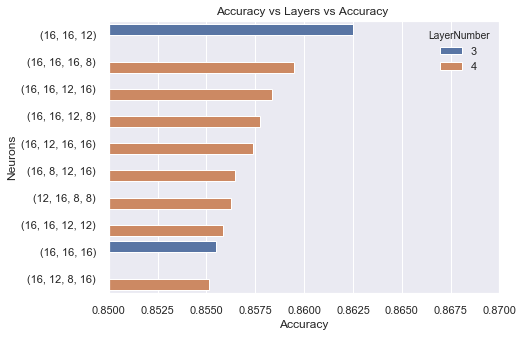

In [498]:
flatui = ["#9b59b6", "#3498db", "#95a5a6", "#e74c3c"]
svm_ax_lin=sns.barplot(data=acc_df_head ,x='Accuracy', y='Neurons',orient ="h", hue = 'LayerNumber')
svm_ax_lin.set(xlim=(0.85, 0.87))
sns.set_style("whitegrid")
# plt.svm_ax_lin(figsize=(20, 20))
# plt.show()
plt.title("Accuracy vs Layers vs Accuracy ")

# Experimenting with Epoch

In [299]:
#### Epoch iterations_ Final
optimizer_value = keras.optimizers.Adam(learning_rate=0.01)
kfold = StratifiedKFold(n_splits=5, shuffle=True, random_state=33)
mlp_x_train = pd.DataFrame(mlp_x_train)
mlp_y_train = pd.DataFrame(mlp_y_train)
mlp_df_epoch = []
mlp_df_epoch = pd.DataFrame()
for it in [1, 10, 50, 100, 250, 300, 350, 400, 450, 500]: 
    mlp_score_train = []
    mlp_score_val = []
    for train, test in kfold.split(mlp_x_train, mlp_y_train):
        train = train.tolist()
        test = test.tolist()
        mlp_x_train_1 = mlp_x_train.iloc[train,:]
        mlp_y_train_1 = mlp_y_train.iloc[train,:]
        mlp_x_test_1 = mlp_x_train.iloc[test,:]
        mlp_y_test_1 = mlp_y_train.iloc[test,:]
#         print(train)
      # create model
        model = Sequential()
        model.add(Dense(16, input_dim=16, activation='sigmoid'))
        model.add(Dense(16, activation='sigmoid'))
        model.add(Dense(8, activation='sigmoid'))
        model.add(Dense(1,activation = 'sigmoid'))
        # Compile model
        model.compile(loss='binary_crossentropy', optimizer=optimizer_value, metrics=['accuracy'])
        # Fit the model
        model.fit(mlp_x_train_1, mlp_y_train_1, epochs=it,batch_size =200)
        # evaluate the model
        scores_train = model.evaluate(mlp_x_train_1, mlp_y_train_1, verbose=0)
        scores_val = model.evaluate(mlp_x_test_1, mlp_y_test_1, verbose=0)
        mlp_score_train.append(scores_train[1])
        mlp_score_val.append(scores_val[1])
    mean_score_train = np.mean(mlp_score_train)
    mean_score_val = np.mean(mlp_score_val)
    values_mlp  =  [it, mean_score_train, mean_score_val]
    values_mlp = pd.DataFrame(values_mlp).T
    mlp_df_epoch = pd.concat([mlp_df_epoch,values_mlp])        
    print(score_mlp)
mlp_df_epoch.columns = ['Iterations','TrainAccuracy','ValidationAccuracy']    

Epoch 1/1
9852/9852 [==============================] - ETA: 19s - loss: 0.7869 - accuracy: 0.375 - ETA: 1s - loss: 0.6959 - accuracy: 0.540 - ETA: 0s - loss: 0.6816 - accuracy: 0.57 - ETA: 0s - loss: 0.6708 - accuracy: 0.58 - ETA: 0s - loss: 0.6618 - accuracy: 0.59 - 1s 65us/step - loss: 0.6595 - accuracy: 0.6031
Epoch 1/1
9854/9854 [==============================] - ETA: 15s - loss: 1.0554 - accuracy: 0.355 - ETA: 0s - loss: 0.7651 - accuracy: 0.491 - ETA: 0s - loss: 0.7158 - accuracy: 0.55 - ETA: 0s - loss: 0.6946 - accuracy: 0.57 - 1s 52us/step - loss: 0.6887 - accuracy: 0.5811
Epoch 1/1
9854/9854 [==============================] - ETA: 15s - loss: 0.6859 - accuracy: 0.610 - ETA: 0s - loss: 0.6595 - accuracy: 0.615 - ETA: 0s - loss: 0.6357 - accuracy: 0.64 - ETA: 0s - loss: 0.6165 - accuracy: 0.66 - 0s 50us/step - loss: 0.6138 - accuracy: 0.6651
Epoch 1/1
9854/9854 [==============================] - ETA: 15s - loss: 0.7230 - accuracy: 0.595 - ETA: 0s - loss: 0.6663 - accuracy: 0.623

9852/9852 [==============================] - ETA: 0s - loss: 0.5037 - accuracy: 0.72 - ETA: 0s - loss: 0.5252 - accuracy: 0.74 - ETA: 0s - loss: 0.5307 - accuracy: 0.74 - ETA: 0s - loss: 0.5317 - accuracy: 0.74 - 0s 19us/step - loss: 0.5309 - accuracy: 0.7438
Epoch 4/50
9852/9852 [==============================] - ETA: 0s - loss: 0.5126 - accuracy: 0.76 - ETA: 0s - loss: 0.5168 - accuracy: 0.75 - ETA: 0s - loss: 0.5213 - accuracy: 0.74 - ETA: 0s - loss: 0.5199 - accuracy: 0.74 - 0s 19us/step - loss: 0.5235 - accuracy: 0.7478
Epoch 5/50
9852/9852 [==============================] - ETA: 0s - loss: 0.5383 - accuracy: 0.76 - ETA: 0s - loss: 0.5253 - accuracy: 0.75 - ETA: 0s - loss: 0.5257 - accuracy: 0.74 - ETA: 0s - loss: 0.5147 - accuracy: 0.75 - 0s 19us/step - loss: 0.5170 - accuracy: 0.7536
Epoch 6/50
9852/9852 [==============================] - ETA: 0s - loss: 0.4540 - accuracy: 0.79 - ETA: 0s - loss: 0.5057 - accuracy: 0.75 - ETA: 0s - loss: 0.5066 - accuracy: 0.76 - ETA: 0s - loss: 

9854/9854 [==============================] - ETA: 0s - loss: 0.4204 - accuracy: 0.80 - ETA: 0s - loss: 0.4200 - accuracy: 0.81 - ETA: 0s - loss: 0.4188 - accuracy: 0.81 - ETA: 0s - loss: 0.4197 - accuracy: 0.81 - ETA: 0s - loss: 0.4181 - accuracy: 0.81 - 0s 25us/step - loss: 0.4218 - accuracy: 0.8128
Epoch 13/50
9854/9854 [==============================] - ETA: 0s - loss: 0.3804 - accuracy: 0.83 - ETA: 0s - loss: 0.4248 - accuracy: 0.80 - ETA: 0s - loss: 0.4218 - accuracy: 0.81 - ETA: 0s - loss: 0.4196 - accuracy: 0.81 - ETA: 0s - loss: 0.4206 - accuracy: 0.81 - 0s 25us/step - loss: 0.4196 - accuracy: 0.8128
Epoch 14/50
9854/9854 [==============================] - ETA: 0s - loss: 0.4015 - accuracy: 0.85 - ETA: 0s - loss: 0.4106 - accuracy: 0.81 - ETA: 0s - loss: 0.4200 - accuracy: 0.81 - ETA: 0s - loss: 0.4135 - accuracy: 0.81 - ETA: 0s - loss: 0.4144 - accuracy: 0.81 - 0s 24us/step - loss: 0.4150 - accuracy: 0.8159
Epoch 15/50
9854/9854 [==============================] - ETA: 0s - los

Epoch 21/50
9854/9854 [==============================] - ETA: 0s - loss: 0.4190 - accuracy: 0.85 - ETA: 0s - loss: 0.4231 - accuracy: 0.81 - ETA: 0s - loss: 0.4176 - accuracy: 0.81 - ETA: 0s - loss: 0.4162 - accuracy: 0.81 - 0s 20us/step - loss: 0.4172 - accuracy: 0.8117
Epoch 22/50
9854/9854 [==============================] - ETA: 0s - loss: 0.3555 - accuracy: 0.84 - ETA: 0s - loss: 0.4142 - accuracy: 0.81 - ETA: 0s - loss: 0.4141 - accuracy: 0.81 - ETA: 0s - loss: 0.4134 - accuracy: 0.81 - 0s 20us/step - loss: 0.4134 - accuracy: 0.8124
Epoch 23/50
9854/9854 [==============================] - ETA: 0s - loss: 0.4147 - accuracy: 0.79 - ETA: 0s - loss: 0.4114 - accuracy: 0.80 - ETA: 0s - loss: 0.4144 - accuracy: 0.80 - ETA: 0s - loss: 0.4088 - accuracy: 0.81 - 0s 20us/step - loss: 0.4094 - accuracy: 0.8144
Epoch 24/50
9854/9854 [==============================] - ETA: 0s - loss: 0.4460 - accuracy: 0.80 - ETA: 0s - loss: 0.4132 - accuracy: 0.80 - ETA: 0s - loss: 0.4175 - accuracy: 0.80 - E

9854/9854 [==============================] - ETA: 0s - loss: 0.4538 - accuracy: 0.80 - ETA: 0s - loss: 0.3637 - accuracy: 0.84 - ETA: 0s - loss: 0.3772 - accuracy: 0.83 - ETA: 0s - loss: 0.3805 - accuracy: 0.83 - 0s 20us/step - loss: 0.3850 - accuracy: 0.8339
Epoch 32/50
9854/9854 [==============================] - ETA: 0s - loss: 0.3235 - accuracy: 0.84 - ETA: 0s - loss: 0.3809 - accuracy: 0.82 - ETA: 0s - loss: 0.3853 - accuracy: 0.82 - ETA: 0s - loss: 0.3821 - accuracy: 0.83 - 0s 19us/step - loss: 0.3832 - accuracy: 0.8326
Epoch 33/50
9854/9854 [==============================] - ETA: 0s - loss: 0.3903 - accuracy: 0.85 - ETA: 0s - loss: 0.3826 - accuracy: 0.83 - ETA: 0s - loss: 0.3766 - accuracy: 0.84 - ETA: 0s - loss: 0.3814 - accuracy: 0.83 - 0s 18us/step - loss: 0.3804 - accuracy: 0.8372
Epoch 34/50
9854/9854 [==============================] - ETA: 0s - loss: 0.3708 - accuracy: 0.83 - ETA: 0s - loss: 0.3697 - accuracy: 0.83 - ETA: 0s - loss: 0.3798 - accuracy: 0.83 - ETA: 0s - los

9854/9854 [==============================] - ETA: 0s - loss: 0.4266 - accuracy: 0.80 - ETA: 0s - loss: 0.3613 - accuracy: 0.85 - ETA: 0s - loss: 0.3642 - accuracy: 0.84 - ETA: 0s - loss: 0.3643 - accuracy: 0.84 - 0s 18us/step - loss: 0.3658 - accuracy: 0.8478
Epoch 42/50
9854/9854 [==============================] - ETA: 0s - loss: 0.2703 - accuracy: 0.90 - ETA: 0s - loss: 0.3410 - accuracy: 0.85 - ETA: 0s - loss: 0.3532 - accuracy: 0.85 - ETA: 0s - loss: 0.3621 - accuracy: 0.84 - 0s 19us/step - loss: 0.3643 - accuracy: 0.8458
Epoch 43/50
9854/9854 [==============================] - ETA: 0s - loss: 0.2972 - accuracy: 0.88 - ETA: 0s - loss: 0.3446 - accuracy: 0.85 - ETA: 0s - loss: 0.3561 - accuracy: 0.84 - ETA: 0s - loss: 0.3602 - accuracy: 0.84 - 0s 19us/step - loss: 0.3635 - accuracy: 0.8470
Epoch 44/50
9854/9854 [==============================] - ETA: 0s - loss: 0.3742 - accuracy: 0.84 - ETA: 0s - loss: 0.3507 - accuracy: 0.85 - ETA: 0s - loss: 0.3513 - accuracy: 0.85 - ETA: 0s - los

9852/9852 [==============================] - ETA: 0s - loss: 0.3930 - accuracy: 0.83 - ETA: 0s - loss: 0.3645 - accuracy: 0.84 - ETA: 0s - loss: 0.3624 - accuracy: 0.84 - ETA: 0s - loss: 0.3582 - accuracy: 0.84 - 0s 19us/step - loss: 0.3618 - accuracy: 0.8485
Epoch 51/100
9852/9852 [==============================] - ETA: 0s - loss: 0.3435 - accuracy: 0.87 - ETA: 0s - loss: 0.3531 - accuracy: 0.85 - ETA: 0s - loss: 0.3565 - accuracy: 0.85 - ETA: 0s - loss: 0.3586 - accuracy: 0.85 - 0s 18us/step - loss: 0.3601 - accuracy: 0.8518
Epoch 52/100
9852/9852 [==============================] - ETA: 0s - loss: 0.3871 - accuracy: 0.80 - ETA: 0s - loss: 0.3584 - accuracy: 0.84 - ETA: 0s - loss: 0.3504 - accuracy: 0.85 - ETA: 0s - loss: 0.3580 - accuracy: 0.84 - 0s 20us/step - loss: 0.3606 - accuracy: 0.8500
Epoch 53/100
9852/9852 [==============================] - ETA: 0s - loss: 0.3685 - accuracy: 0.85 - ETA: 0s - loss: 0.3620 - accuracy: 0.85 - ETA: 0s - loss: 0.3628 - accuracy: 0.85 - ETA: 0s - 

9854/9854 [==============================] - ETA: 0s - loss: 0.4664 - accuracy: 0.76 - ETA: 0s - loss: 0.4610 - accuracy: 0.78 - ETA: 0s - loss: 0.4587 - accuracy: 0.78 - ETA: 0s - loss: 0.4480 - accuracy: 0.79 - 0s 19us/step - loss: 0.4481 - accuracy: 0.7928
Epoch 10/100
9854/9854 [==============================] - ETA: 0s - loss: 0.4138 - accuracy: 0.81 - ETA: 0s - loss: 0.4476 - accuracy: 0.79 - ETA: 0s - loss: 0.4591 - accuracy: 0.78 - ETA: 0s - loss: 0.4503 - accuracy: 0.79 - 0s 21us/step - loss: 0.4430 - accuracy: 0.7962
Epoch 11/100
9854/9854 [==============================] - ETA: 0s - loss: 0.4385 - accuracy: 0.80 - ETA: 0s - loss: 0.4469 - accuracy: 0.78 - ETA: 0s - loss: 0.4435 - accuracy: 0.79 - ETA: 0s - loss: 0.4375 - accuracy: 0.79 - 0s 20us/step - loss: 0.4355 - accuracy: 0.7996
Epoch 12/100
9854/9854 [==============================] - ETA: 0s - loss: 0.4317 - accuracy: 0.81 - ETA: 0s - loss: 0.4387 - accuracy: 0.80 - ETA: 0s - loss: 0.4485 - accuracy: 0.79 - ETA: 0s - 

9854/9854 [==============================] - ETA: 0s - loss: 0.3741 - accuracy: 0.83 - ETA: 0s - loss: 0.3575 - accuracy: 0.84 - ETA: 0s - loss: 0.3642 - accuracy: 0.83 - ETA: 0s - loss: 0.3580 - accuracy: 0.84 - 0s 18us/step - loss: 0.3599 - accuracy: 0.8418
Epoch 69/100
9854/9854 [==============================] - ETA: 0s - loss: 0.3782 - accuracy: 0.85 - ETA: 0s - loss: 0.3520 - accuracy: 0.84 - ETA: 0s - loss: 0.3547 - accuracy: 0.84 - ETA: 0s - loss: 0.3588 - accuracy: 0.84 - 0s 20us/step - loss: 0.3575 - accuracy: 0.8465
Epoch 70/100
9854/9854 [==============================] - ETA: 0s - loss: 0.3646 - accuracy: 0.83 - ETA: 0s - loss: 0.3437 - accuracy: 0.84 - ETA: 0s - loss: 0.3535 - accuracy: 0.84 - ETA: 0s - loss: 0.3555 - accuracy: 0.84 - 0s 18us/step - loss: 0.3564 - accuracy: 0.8467
Epoch 71/100
9854/9854 [==============================] - ETA: 0s - loss: 0.3666 - accuracy: 0.86 - ETA: 0s - loss: 0.3576 - accuracy: 0.85 - ETA: 0s - loss: 0.3494 - accuracy: 0.85 - ETA: 0s - 

9854/9854 [==============================] - ETA: 0s - loss: 0.3132 - accuracy: 0.88 - ETA: 0s - loss: 0.3867 - accuracy: 0.83 - ETA: 0s - loss: 0.3893 - accuracy: 0.83 - ETA: 0s - loss: 0.3872 - accuracy: 0.83 - 0s 18us/step - loss: 0.3858 - accuracy: 0.8328
Epoch 29/100
9854/9854 [==============================] - ETA: 0s - loss: 0.4310 - accuracy: 0.81 - ETA: 0s - loss: 0.3929 - accuracy: 0.83 - ETA: 0s - loss: 0.3817 - accuracy: 0.83 - ETA: 0s - loss: 0.3850 - accuracy: 0.83 - 0s 17us/step - loss: 0.3851 - accuracy: 0.8352
Epoch 30/100
9854/9854 [==============================] - ETA: 0s - loss: 0.3910 - accuracy: 0.86 - ETA: 0s - loss: 0.3844 - accuracy: 0.83 - ETA: 0s - loss: 0.3871 - accuracy: 0.83 - ETA: 0s - loss: 0.3826 - accuracy: 0.83 - 0s 18us/step - loss: 0.3836 - accuracy: 0.8350
Epoch 31/100
9854/9854 [==============================] - ETA: 0s - loss: 0.4230 - accuracy: 0.82 - ETA: 0s - loss: 0.3664 - accuracy: 0.84 - ETA: 0s - loss: 0.3779 - accuracy: 0.83 - ETA: 0s - 

9854/9854 [==============================] - ETA: 0s - loss: 0.3610 - accuracy: 0.86 - ETA: 0s - loss: 0.3507 - accuracy: 0.85 - ETA: 0s - loss: 0.3488 - accuracy: 0.85 - ETA: 0s - loss: 0.3451 - accuracy: 0.85 - 0s 19us/step - loss: 0.3455 - accuracy: 0.8572
Epoch 89/100
9854/9854 [==============================] - ETA: 0s - loss: 0.3416 - accuracy: 0.85 - ETA: 0s - loss: 0.3343 - accuracy: 0.86 - ETA: 0s - loss: 0.3455 - accuracy: 0.85 - ETA: 0s - loss: 0.3449 - accuracy: 0.85 - 0s 18us/step - loss: 0.3458 - accuracy: 0.8568
Epoch 90/100
9854/9854 [==============================] - ETA: 0s - loss: 0.2798 - accuracy: 0.91 - ETA: 0s - loss: 0.3502 - accuracy: 0.85 - ETA: 0s - loss: 0.3445 - accuracy: 0.85 - ETA: 0s - loss: 0.3448 - accuracy: 0.85 - 0s 17us/step - loss: 0.3441 - accuracy: 0.8571
Epoch 91/100
9854/9854 [==============================] - ETA: 0s - loss: 0.3771 - accuracy: 0.85 - ETA: 0s - loss: 0.3480 - accuracy: 0.85 - ETA: 0s - loss: 0.3522 - accuracy: 0.85 - ETA: 0s - 

9854/9854 [==============================] - ETA: 0s - loss: 0.3562 - accuracy: 0.83 - ETA: 0s - loss: 0.3642 - accuracy: 0.84 - ETA: 0s - loss: 0.3787 - accuracy: 0.83 - ETA: 0s - loss: 0.3860 - accuracy: 0.83 - 0s 21us/step - loss: 0.3837 - accuracy: 0.8361
Epoch 49/100
9854/9854 [==============================] - ETA: 0s - loss: 0.3573 - accuracy: 0.88 - ETA: 0s - loss: 0.3717 - accuracy: 0.84 - ETA: 0s - loss: 0.3806 - accuracy: 0.84 - ETA: 0s - loss: 0.3805 - accuracy: 0.84 - 0s 19us/step - loss: 0.3822 - accuracy: 0.8375
Epoch 50/100
9854/9854 [==============================] - ETA: 0s - loss: 0.3344 - accuracy: 0.87 - ETA: 0s - loss: 0.3723 - accuracy: 0.84 - ETA: 0s - loss: 0.3797 - accuracy: 0.83 - ETA: 0s - loss: 0.3796 - accuracy: 0.83 - 0s 18us/step - loss: 0.3809 - accuracy: 0.8366
Epoch 51/100
9854/9854 [==============================] - ETA: 0s - loss: 0.3555 - accuracy: 0.82 - ETA: 0s - loss: 0.3592 - accuracy: 0.84 - ETA: 0s - loss: 0.3759 - accuracy: 0.83 - ETA: 0s - 

9854/9854 [==============================] - ETA: 0s - loss: 0.4252 - accuracy: 0.81 - ETA: 0s - loss: 0.4444 - accuracy: 0.80 - ETA: 0s - loss: 0.4412 - accuracy: 0.80 - ETA: 0s - loss: 0.4446 - accuracy: 0.79 - 0s 22us/step - loss: 0.4478 - accuracy: 0.7958
Epoch 9/100
9854/9854 [==============================] - ETA: 0s - loss: 0.4715 - accuracy: 0.76 - ETA: 0s - loss: 0.4452 - accuracy: 0.79 - ETA: 0s - loss: 0.4386 - accuracy: 0.79 - ETA: 0s - loss: 0.4372 - accuracy: 0.80 - ETA: 0s - loss: 0.4417 - accuracy: 0.79 - 0s 23us/step - loss: 0.4422 - accuracy: 0.7964
Epoch 10/100
9854/9854 [==============================] - ETA: 0s - loss: 0.4694 - accuracy: 0.77 - ETA: 0s - loss: 0.4424 - accuracy: 0.80 - ETA: 0s - loss: 0.4342 - accuracy: 0.80 - ETA: 0s - loss: 0.4340 - accuracy: 0.80 - 0s 21us/step - loss: 0.4371 - accuracy: 0.8032
Epoch 11/100
9854/9854 [==============================] - ETA: 0s - loss: 0.4928 - accuracy: 0.78 - ETA: 0s - loss: 0.4354 - accuracy: 0.80 - ETA: 0s - l

9854/9854 [==============================] - ETA: 0s - loss: 0.3925 - accuracy: 0.84 - ETA: 0s - loss: 0.3613 - accuracy: 0.84 - ETA: 0s - loss: 0.3542 - accuracy: 0.84 - ETA: 0s - loss: 0.3536 - accuracy: 0.84 - ETA: 0s - loss: 0.3514 - accuracy: 0.84 - 0s 24us/step - loss: 0.3511 - accuracy: 0.8490
Epoch 66/100
9854/9854 [==============================] - ETA: 0s - loss: 0.4249 - accuracy: 0.79 - ETA: 0s - loss: 0.3606 - accuracy: 0.84 - ETA: 0s - loss: 0.3447 - accuracy: 0.85 - ETA: 0s - loss: 0.3443 - accuracy: 0.85 - ETA: 0s - loss: 0.3469 - accuracy: 0.85 - 0s 25us/step - loss: 0.3511 - accuracy: 0.8524
Epoch 67/100
9854/9854 [==============================] - ETA: 0s - loss: 0.3094 - accuracy: 0.86 - ETA: 0s - loss: 0.3499 - accuracy: 0.84 - ETA: 0s - loss: 0.3571 - accuracy: 0.84 - ETA: 0s - loss: 0.3521 - accuracy: 0.84 - ETA: 0s - loss: 0.3536 - accuracy: 0.84 - 0s 24us/step - loss: 0.3542 - accuracy: 0.8478
Epoch 68/100
9854/9854 [==============================] - ETA: 0s - 

Epoch 23/250
9852/9852 [==============================] - ETA: 0s - loss: 0.4044 - accuracy: 0.84 - ETA: 0s - loss: 0.4060 - accuracy: 0.82 - ETA: 0s - loss: 0.3973 - accuracy: 0.82 - ETA: 0s - loss: 0.4034 - accuracy: 0.82 - 0s 21us/step - loss: 0.4071 - accuracy: 0.8210
Epoch 24/250
9852/9852 [==============================] - ETA: 0s - loss: 0.4451 - accuracy: 0.77 - ETA: 0s - loss: 0.3962 - accuracy: 0.82 - ETA: 0s - loss: 0.4079 - accuracy: 0.81 - ETA: 0s - loss: 0.4105 - accuracy: 0.81 - 0s 22us/step - loss: 0.4107 - accuracy: 0.8194
Epoch 25/250
9852/9852 [==============================] - ETA: 0s - loss: 0.4047 - accuracy: 0.82 - ETA: 0s - loss: 0.4032 - accuracy: 0.81 - ETA: 0s - loss: 0.4104 - accuracy: 0.81 - ETA: 0s - loss: 0.4096 - accuracy: 0.81 - 0s 21us/step - loss: 0.4085 - accuracy: 0.8182
Epoch 26/250
9852/9852 [==============================] - ETA: 0s - loss: 0.3853 - accuracy: 0.82 - ETA: 0s - loss: 0.3891 - accuracy: 0.83 - ETA: 0s - loss: 0.3977 - accuracy: 0.82

9852/9852 [==============================] - ETA: 0s - loss: 0.3302 - accuracy: 0.84 - ETA: 0s - loss: 0.3496 - accuracy: 0.85 - ETA: 0s - loss: 0.3544 - accuracy: 0.85 - ETA: 0s - loss: 0.3515 - accuracy: 0.85 - 0s 20us/step - loss: 0.3540 - accuracy: 0.8490
Epoch 83/250
9852/9852 [==============================] - ETA: 0s - loss: 0.3582 - accuracy: 0.82 - ETA: 0s - loss: 0.3407 - accuracy: 0.85 - ETA: 0s - loss: 0.3550 - accuracy: 0.84 - ETA: 0s - loss: 0.3518 - accuracy: 0.85 - 0s 21us/step - loss: 0.3529 - accuracy: 0.8512
Epoch 84/250
9852/9852 [==============================] - ETA: 0s - loss: 0.4078 - accuracy: 0.83 - ETA: 0s - loss: 0.3510 - accuracy: 0.84 - ETA: 0s - loss: 0.3505 - accuracy: 0.85 - ETA: 0s - loss: 0.3491 - accuracy: 0.85 - 0s 20us/step - loss: 0.3505 - accuracy: 0.8512
Epoch 85/250
9852/9852 [==============================] - ETA: 0s - loss: 0.3287 - accuracy: 0.88 - ETA: 0s - loss: 0.3628 - accuracy: 0.84 - ETA: 0s - loss: 0.3556 - accuracy: 0.84 - ETA: 0s - 

Epoch 112/250
9852/9852 [==============================] - ETA: 0s - loss: 0.3064 - accuracy: 0.89 - ETA: 0s - loss: 0.3311 - accuracy: 0.85 - ETA: 0s - loss: 0.3333 - accuracy: 0.85 - ETA: 0s - loss: 0.3381 - accuracy: 0.85 - 0s 19us/step - loss: 0.3375 - accuracy: 0.8582
Epoch 113/250
9852/9852 [==============================] - ETA: 0s - loss: 0.3853 - accuracy: 0.83 - ETA: 0s - loss: 0.3437 - accuracy: 0.85 - ETA: 0s - loss: 0.3438 - accuracy: 0.85 - ETA: 0s - loss: 0.3432 - accuracy: 0.85 - 0s 20us/step - loss: 0.3419 - accuracy: 0.8566
Epoch 114/250
9852/9852 [==============================] - ETA: 0s - loss: 0.3357 - accuracy: 0.85 - ETA: 0s - loss: 0.3305 - accuracy: 0.86 - ETA: 0s - loss: 0.3386 - accuracy: 0.85 - ETA: 0s - loss: 0.3427 - accuracy: 0.85 - 0s 21us/step - loss: 0.3384 - accuracy: 0.8580
Epoch 115/250
9852/9852 [==============================] - ETA: 0s - loss: 0.3179 - accuracy: 0.87 - ETA: 0s - loss: 0.3282 - accuracy: 0.86 - ETA: 0s - loss: 0.3377 - accuracy: 

Epoch 142/250
9852/9852 [==============================] - ETA: 0s - loss: 0.3209 - accuracy: 0.87 - ETA: 0s - loss: 0.3279 - accuracy: 0.86 - ETA: 0s - loss: 0.3240 - accuracy: 0.86 - ETA: 0s - loss: 0.3233 - accuracy: 0.86 - 0s 21us/step - loss: 0.3272 - accuracy: 0.8639
Epoch 143/250
9852/9852 [==============================] - ETA: 0s - loss: 0.3382 - accuracy: 0.86 - ETA: 0s - loss: 0.3206 - accuracy: 0.87 - ETA: 0s - loss: 0.3295 - accuracy: 0.86 - ETA: 0s - loss: 0.3282 - accuracy: 0.86 - 0s 21us/step - loss: 0.3273 - accuracy: 0.8656
Epoch 144/250
9852/9852 [==============================] - ETA: 0s - loss: 0.3166 - accuracy: 0.89 - ETA: 0s - loss: 0.3373 - accuracy: 0.85 - ETA: 0s - loss: 0.3312 - accuracy: 0.86 - ETA: 0s - loss: 0.3223 - accuracy: 0.86 - 0s 20us/step - loss: 0.3299 - accuracy: 0.8634
Epoch 145/250
9852/9852 [==============================] - ETA: 0s - loss: 0.2923 - accuracy: 0.90 - ETA: 0s - loss: 0.3230 - accuracy: 0.86 - ETA: 0s - loss: 0.3219 - accuracy: 

9852/9852 [==============================] - ETA: 0s - loss: 0.3474 - accuracy: 0.84 - ETA: 0s - loss: 0.2976 - accuracy: 0.88 - ETA: 0s - loss: 0.3039 - accuracy: 0.87 - ETA: 0s - loss: 0.3087 - accuracy: 0.87 - 0s 20us/step - loss: 0.3122 - accuracy: 0.8728
Epoch 201/250
9852/9852 [==============================] - ETA: 0s - loss: 0.2583 - accuracy: 0.89 - ETA: 0s - loss: 0.3141 - accuracy: 0.86 - ETA: 0s - loss: 0.3147 - accuracy: 0.87 - ETA: 0s - loss: 0.3129 - accuracy: 0.87 - 0s 21us/step - loss: 0.3162 - accuracy: 0.8696
Epoch 202/250
9852/9852 [==============================] - ETA: 0s - loss: 0.3756 - accuracy: 0.81 - ETA: 0s - loss: 0.3424 - accuracy: 0.85 - ETA: 0s - loss: 0.3262 - accuracy: 0.86 - ETA: 0s - loss: 0.3191 - accuracy: 0.86 - ETA: 0s - loss: 0.3160 - accuracy: 0.86 - 0s 23us/step - loss: 0.3158 - accuracy: 0.8697
Epoch 203/250
9852/9852 [==============================] - ETA: 0s - loss: 0.3175 - accuracy: 0.87 - ETA: 0s - loss: 0.3196 - accuracy: 0.86 - ETA: 0s

9854/9854 [==============================] - ETA: 0s - loss: 0.4775 - accuracy: 0.78 - ETA: 0s - loss: 0.4754 - accuracy: 0.77 - ETA: 0s - loss: 0.4745 - accuracy: 0.77 - ETA: 0s - loss: 0.4752 - accuracy: 0.77 - 0s 21us/step - loss: 0.4782 - accuracy: 0.7700
Epoch 9/250
9854/9854 [==============================] - ETA: 0s - loss: 0.4876 - accuracy: 0.76 - ETA: 0s - loss: 0.4682 - accuracy: 0.77 - ETA: 0s - loss: 0.4725 - accuracy: 0.77 - ETA: 0s - loss: 0.4723 - accuracy: 0.77 - 0s 20us/step - loss: 0.4714 - accuracy: 0.7747
Epoch 10/250
9854/9854 [==============================] - ETA: 0s - loss: 0.4400 - accuracy: 0.79 - ETA: 0s - loss: 0.4472 - accuracy: 0.78 - ETA: 0s - loss: 0.4591 - accuracy: 0.78 - ETA: 0s - loss: 0.4635 - accuracy: 0.77 - 0s 21us/step - loss: 0.4652 - accuracy: 0.7792
Epoch 11/250
9854/9854 [==============================] - ETA: 0s - loss: 0.4352 - accuracy: 0.80 - ETA: 0s - loss: 0.4560 - accuracy: 0.77 - ETA: 0s - loss: 0.4594 - accuracy: 0.77 - ETA: 0s - l

9854/9854 [==============================] - ETA: 0s - loss: 0.3851 - accuracy: 0.86 - ETA: 0s - loss: 0.3602 - accuracy: 0.84 - ETA: 0s - loss: 0.3634 - accuracy: 0.84 - ETA: 0s - loss: 0.3648 - accuracy: 0.84 - 0s 20us/step - loss: 0.3605 - accuracy: 0.8464
Epoch 69/250
9854/9854 [==============================] - ETA: 0s - loss: 0.3893 - accuracy: 0.81 - ETA: 0s - loss: 0.3627 - accuracy: 0.83 - ETA: 0s - loss: 0.3610 - accuracy: 0.84 - ETA: 0s - loss: 0.3614 - accuracy: 0.84 - 0s 20us/step - loss: 0.3605 - accuracy: 0.8431
Epoch 70/250
9854/9854 [==============================] - ETA: 0s - loss: 0.3831 - accuracy: 0.84 - ETA: 0s - loss: 0.3558 - accuracy: 0.84 - ETA: 0s - loss: 0.3642 - accuracy: 0.84 - ETA: 0s - loss: 0.3658 - accuracy: 0.84 - 0s 21us/step - loss: 0.3630 - accuracy: 0.8419
Epoch 71/250
9854/9854 [==============================] - ETA: 0s - loss: 0.3775 - accuracy: 0.83 - ETA: 0s - loss: 0.3685 - accuracy: 0.84 - ETA: 0s - loss: 0.3580 - accuracy: 0.84 - ETA: 0s - 

9854/9854 [==============================] - ETA: 0s - loss: 0.2699 - accuracy: 0.89 - ETA: 0s - loss: 0.3249 - accuracy: 0.86 - ETA: 0s - loss: 0.3265 - accuracy: 0.85 - ETA: 0s - loss: 0.3380 - accuracy: 0.85 - 0s 19us/step - loss: 0.3390 - accuracy: 0.8544
Epoch 128/250
9854/9854 [==============================] - ETA: 0s - loss: 0.3241 - accuracy: 0.85 - ETA: 0s - loss: 0.3318 - accuracy: 0.85 - ETA: 0s - loss: 0.3324 - accuracy: 0.85 - ETA: 0s - loss: 0.3294 - accuracy: 0.85 - 0s 21us/step - loss: 0.3382 - accuracy: 0.8555
Epoch 129/250
9854/9854 [==============================] - ETA: 0s - loss: 0.2932 - accuracy: 0.87 - ETA: 0s - loss: 0.3341 - accuracy: 0.84 - ETA: 0s - loss: 0.3303 - accuracy: 0.85 - ETA: 0s - loss: 0.3365 - accuracy: 0.85 - 0s 21us/step - loss: 0.3367 - accuracy: 0.8557
Epoch 130/250
9854/9854 [==============================] - ETA: 0s - loss: 0.3013 - accuracy: 0.87 - ETA: 0s - loss: 0.3282 - accuracy: 0.86 - ETA: 0s - loss: 0.3255 - accuracy: 0.86 - ETA: 0s

Epoch 157/250
9854/9854 [==============================] - ETA: 0s - loss: 0.2985 - accuracy: 0.86 - ETA: 0s - loss: 0.3154 - accuracy: 0.87 - ETA: 0s - loss: 0.3168 - accuracy: 0.86 - ETA: 0s - loss: 0.3273 - accuracy: 0.86 - 0s 21us/step - loss: 0.3297 - accuracy: 0.8619
Epoch 158/250
9854/9854 [==============================] - ETA: 0s - loss: 0.2917 - accuracy: 0.89 - ETA: 0s - loss: 0.3151 - accuracy: 0.86 - ETA: 0s - loss: 0.3259 - accuracy: 0.86 - ETA: 0s - loss: 0.3282 - accuracy: 0.85 - 0s 20us/step - loss: 0.3301 - accuracy: 0.8589
Epoch 159/250
9854/9854 [==============================] - ETA: 0s - loss: 0.2278 - accuracy: 0.91 - ETA: 0s - loss: 0.3225 - accuracy: 0.86 - ETA: 0s - loss: 0.3223 - accuracy: 0.86 - ETA: 0s - loss: 0.3255 - accuracy: 0.86 - 0s 21us/step - loss: 0.3279 - accuracy: 0.8609
Epoch 160/250
9854/9854 [==============================] - ETA: 0s - loss: 0.2862 - accuracy: 0.89 - ETA: 0s - loss: 0.3291 - accuracy: 0.85 - ETA: 0s - loss: 0.3225 - accuracy: 

Epoch 187/250
9854/9854 [==============================] - ETA: 0s - loss: 0.3055 - accuracy: 0.89 - ETA: 0s - loss: 0.3240 - accuracy: 0.86 - ETA: 0s - loss: 0.3306 - accuracy: 0.86 - ETA: 0s - loss: 0.3219 - accuracy: 0.86 - 0s 21us/step - loss: 0.3220 - accuracy: 0.8639
Epoch 188/250
9854/9854 [==============================] - ETA: 0s - loss: 0.2914 - accuracy: 0.85 - ETA: 0s - loss: 0.3240 - accuracy: 0.86 - ETA: 0s - loss: 0.3197 - accuracy: 0.86 - ETA: 0s - loss: 0.3239 - accuracy: 0.86 - 0s 21us/step - loss: 0.3209 - accuracy: 0.8642
Epoch 189/250
9854/9854 [==============================] - ETA: 0s - loss: 0.3320 - accuracy: 0.85 - ETA: 0s - loss: 0.3096 - accuracy: 0.87 - ETA: 0s - loss: 0.3215 - accuracy: 0.86 - ETA: 0s - loss: 0.3252 - accuracy: 0.85 - 0s 20us/step - loss: 0.3219 - accuracy: 0.8622
Epoch 190/250
9854/9854 [==============================] - ETA: 0s - loss: 0.2863 - accuracy: 0.86 - ETA: 0s - loss: 0.3200 - accuracy: 0.86 - ETA: 0s - loss: 0.3160 - accuracy: 

9854/9854 [==============================] - ETA: 0s - loss: 0.3082 - accuracy: 0.89 - ETA: 0s - loss: 0.3074 - accuracy: 0.87 - ETA: 0s - loss: 0.3074 - accuracy: 0.87 - ETA: 0s - loss: 0.3104 - accuracy: 0.86 - 0s 20us/step - loss: 0.3102 - accuracy: 0.8693
Epoch 246/250
9854/9854 [==============================] - ETA: 0s - loss: 0.2846 - accuracy: 0.88 - ETA: 0s - loss: 0.3063 - accuracy: 0.86 - ETA: 0s - loss: 0.3096 - accuracy: 0.86 - ETA: 0s - loss: 0.3081 - accuracy: 0.86 - 0s 20us/step - loss: 0.3081 - accuracy: 0.8683
Epoch 247/250
9854/9854 [==============================] - ETA: 0s - loss: 0.2833 - accuracy: 0.89 - ETA: 0s - loss: 0.3051 - accuracy: 0.87 - ETA: 0s - loss: 0.3096 - accuracy: 0.86 - ETA: 0s - loss: 0.3105 - accuracy: 0.86 - 0s 20us/step - loss: 0.3104 - accuracy: 0.8678
Epoch 248/250
9854/9854 [==============================] - ETA: 0s - loss: 0.3155 - accuracy: 0.87 - ETA: 0s - loss: 0.3152 - accuracy: 0.86 - ETA: 0s - loss: 0.3088 - accuracy: 0.86 - ETA: 0s

Epoch 25/250
9854/9854 [==============================] - ETA: 0s - loss: 0.3690 - accuracy: 0.83 - ETA: 0s - loss: 0.3746 - accuracy: 0.83 - ETA: 0s - loss: 0.3849 - accuracy: 0.83 - ETA: 0s - loss: 0.3865 - accuracy: 0.82 - 0s 19us/step - loss: 0.3872 - accuracy: 0.8268
Epoch 26/250
9854/9854 [==============================] - ETA: 0s - loss: 0.3825 - accuracy: 0.84 - ETA: 0s - loss: 0.3882 - accuracy: 0.82 - ETA: 0s - loss: 0.3922 - accuracy: 0.82 - ETA: 0s - loss: 0.3867 - accuracy: 0.82 - 0s 19us/step - loss: 0.3874 - accuracy: 0.8262
Epoch 27/250
9854/9854 [==============================] - ETA: 0s - loss: 0.3991 - accuracy: 0.81 - ETA: 0s - loss: 0.3767 - accuracy: 0.83 - ETA: 0s - loss: 0.3819 - accuracy: 0.82 - ETA: 0s - loss: 0.3832 - accuracy: 0.82 - 0s 20us/step - loss: 0.3854 - accuracy: 0.8277
Epoch 28/250
9854/9854 [==============================] - ETA: 0s - loss: 0.3303 - accuracy: 0.84 - ETA: 0s - loss: 0.3831 - accuracy: 0.83 - ETA: 0s - loss: 0.3908 - accuracy: 0.82

Epoch 85/250
9854/9854 [==============================] - ETA: 0s - loss: 0.3570 - accuracy: 0.85 - ETA: 0s - loss: 0.3423 - accuracy: 0.85 - ETA: 0s - loss: 0.3349 - accuracy: 0.86 - ETA: 0s - loss: 0.3398 - accuracy: 0.85 - 0s 20us/step - loss: 0.3428 - accuracy: 0.8534
Epoch 86/250
9854/9854 [==============================] - ETA: 0s - loss: 0.2869 - accuracy: 0.89 - ETA: 0s - loss: 0.3329 - accuracy: 0.86 - ETA: 0s - loss: 0.3411 - accuracy: 0.85 - ETA: 0s - loss: 0.3429 - accuracy: 0.85 - 0s 19us/step - loss: 0.3451 - accuracy: 0.8550
Epoch 87/250
9854/9854 [==============================] - ETA: 0s - loss: 0.3603 - accuracy: 0.84 - ETA: 0s - loss: 0.3406 - accuracy: 0.85 - ETA: 0s - loss: 0.3393 - accuracy: 0.85 - ETA: 0s - loss: 0.3431 - accuracy: 0.85 - 0s 20us/step - loss: 0.3438 - accuracy: 0.8524
Epoch 88/250
9854/9854 [==============================] - ETA: 0s - loss: 0.3956 - accuracy: 0.80 - ETA: 0s - loss: 0.3409 - accuracy: 0.85 - ETA: 0s - loss: 0.3425 - accuracy: 0.85

Epoch 115/250
9854/9854 [==============================] - ETA: 0s - loss: 0.3637 - accuracy: 0.83 - ETA: 0s - loss: 0.3271 - accuracy: 0.86 - ETA: 0s - loss: 0.3333 - accuracy: 0.86 - ETA: 0s - loss: 0.3299 - accuracy: 0.86 - 0s 20us/step - loss: 0.3323 - accuracy: 0.8608
Epoch 116/250
9854/9854 [==============================] - ETA: 0s - loss: 0.3544 - accuracy: 0.87 - ETA: 0s - loss: 0.3326 - accuracy: 0.86 - ETA: 0s - loss: 0.3352 - accuracy: 0.86 - ETA: 0s - loss: 0.3333 - accuracy: 0.86 - 0s 18us/step - loss: 0.3320 - accuracy: 0.8631
Epoch 117/250
9854/9854 [==============================] - ETA: 0s - loss: 0.3522 - accuracy: 0.85 - ETA: 0s - loss: 0.3267 - accuracy: 0.86 - ETA: 0s - loss: 0.3226 - accuracy: 0.86 - ETA: 0s - loss: 0.3326 - accuracy: 0.86 - 0s 19us/step - loss: 0.3319 - accuracy: 0.8594
Epoch 118/250
9854/9854 [==============================] - ETA: 0s - loss: 0.2911 - accuracy: 0.87 - ETA: 0s - loss: 0.3249 - accuracy: 0.86 - ETA: 0s - loss: 0.3282 - accuracy: 

Epoch 145/250
9854/9854 [==============================] - ETA: 0s - loss: 0.2487 - accuracy: 0.89 - ETA: 0s - loss: 0.3202 - accuracy: 0.86 - ETA: 0s - loss: 0.3268 - accuracy: 0.86 - ETA: 0s - loss: 0.3228 - accuracy: 0.86 - 0s 20us/step - loss: 0.3204 - accuracy: 0.8652
Epoch 146/250
9854/9854 [==============================] - ETA: 0s - loss: 0.3243 - accuracy: 0.87 - ETA: 0s - loss: 0.3242 - accuracy: 0.85 - ETA: 0s - loss: 0.3172 - accuracy: 0.86 - ETA: 0s - loss: 0.3200 - accuracy: 0.86 - 0s 20us/step - loss: 0.3237 - accuracy: 0.8622
Epoch 147/250
9854/9854 [==============================] - ETA: 0s - loss: 0.3005 - accuracy: 0.90 - ETA: 0s - loss: 0.3180 - accuracy: 0.86 - ETA: 0s - loss: 0.3184 - accuracy: 0.86 - ETA: 0s - loss: 0.3180 - accuracy: 0.86 - 0s 19us/step - loss: 0.3204 - accuracy: 0.8654
Epoch 148/250
9854/9854 [==============================] - ETA: 0s - loss: 0.3312 - accuracy: 0.85 - ETA: 0s - loss: 0.3221 - accuracy: 0.86 - ETA: 0s - loss: 0.3305 - accuracy: 

Epoch 175/250
9854/9854 [==============================] - ETA: 0s - loss: 0.2849 - accuracy: 0.89 - ETA: 0s - loss: 0.3065 - accuracy: 0.86 - ETA: 0s - loss: 0.3106 - accuracy: 0.86 - ETA: 0s - loss: 0.3094 - accuracy: 0.86 - 0s 19us/step - loss: 0.3124 - accuracy: 0.8671
Epoch 176/250
9854/9854 [==============================] - ETA: 0s - loss: 0.3028 - accuracy: 0.89 - ETA: 0s - loss: 0.3078 - accuracy: 0.87 - ETA: 0s - loss: 0.3125 - accuracy: 0.87 - ETA: 0s - loss: 0.3126 - accuracy: 0.86 - 0s 20us/step - loss: 0.3128 - accuracy: 0.8693
Epoch 177/250
9854/9854 [==============================] - ETA: 0s - loss: 0.2977 - accuracy: 0.87 - ETA: 0s - loss: 0.3082 - accuracy: 0.87 - ETA: 0s - loss: 0.3101 - accuracy: 0.86 - ETA: 0s - loss: 0.3120 - accuracy: 0.87 - 0s 20us/step - loss: 0.3112 - accuracy: 0.8700
Epoch 178/250
9854/9854 [==============================] - ETA: 0s - loss: 0.3244 - accuracy: 0.87 - ETA: 0s - loss: 0.3000 - accuracy: 0.87 - ETA: 0s - loss: 0.3119 - accuracy: 

Epoch 205/250
9854/9854 [==============================] - ETA: 0s - loss: 0.3251 - accuracy: 0.85 - ETA: 0s - loss: 0.2919 - accuracy: 0.88 - ETA: 0s - loss: 0.3028 - accuracy: 0.87 - ETA: 0s - loss: 0.3049 - accuracy: 0.86 - 0s 20us/step - loss: 0.3031 - accuracy: 0.8716
Epoch 206/250
9854/9854 [==============================] - ETA: 0s - loss: 0.2778 - accuracy: 0.89 - ETA: 0s - loss: 0.3022 - accuracy: 0.87 - ETA: 0s - loss: 0.2939 - accuracy: 0.87 - ETA: 0s - loss: 0.3030 - accuracy: 0.87 - 0s 18us/step - loss: 0.3036 - accuracy: 0.8709
Epoch 207/250
9854/9854 [==============================] - ETA: 0s - loss: 0.2295 - accuracy: 0.91 - ETA: 0s - loss: 0.2929 - accuracy: 0.87 - ETA: 0s - loss: 0.2996 - accuracy: 0.87 - ETA: 0s - loss: 0.3069 - accuracy: 0.87 - 0s 20us/step - loss: 0.3024 - accuracy: 0.8738
Epoch 208/250
9854/9854 [==============================] - ETA: 0s - loss: 0.2645 - accuracy: 0.88 - ETA: 0s - loss: 0.3029 - accuracy: 0.87 - ETA: 0s - loss: 0.3066 - accuracy: 

Epoch 235/250
9854/9854 [==============================] - ETA: 0s - loss: 0.3302 - accuracy: 0.85 - ETA: 0s - loss: 0.2952 - accuracy: 0.87 - ETA: 0s - loss: 0.3044 - accuracy: 0.87 - ETA: 0s - loss: 0.3009 - accuracy: 0.87 - 0s 19us/step - loss: 0.2980 - accuracy: 0.8751
Epoch 236/250
9854/9854 [==============================] - ETA: 0s - loss: 0.3931 - accuracy: 0.85 - ETA: 0s - loss: 0.3055 - accuracy: 0.87 - ETA: 0s - loss: 0.2957 - accuracy: 0.87 - ETA: 0s - loss: 0.2950 - accuracy: 0.87 - 0s 19us/step - loss: 0.2973 - accuracy: 0.8763
Epoch 237/250
9854/9854 [==============================] - ETA: 0s - loss: 0.2845 - accuracy: 0.89 - ETA: 0s - loss: 0.2906 - accuracy: 0.87 - ETA: 0s - loss: 0.2904 - accuracy: 0.87 - ETA: 0s - loss: 0.2927 - accuracy: 0.87 - 0s 19us/step - loss: 0.2941 - accuracy: 0.8757
Epoch 238/250
9854/9854 [==============================] - ETA: 0s - loss: 0.2711 - accuracy: 0.89 - ETA: 0s - loss: 0.2902 - accuracy: 0.87 - ETA: 0s - loss: 0.2946 - accuracy: 

Epoch 15/250
9854/9854 [==============================] - ETA: 0s - loss: 0.3506 - accuracy: 0.84 - ETA: 0s - loss: 0.4007 - accuracy: 0.82 - ETA: 0s - loss: 0.4064 - accuracy: 0.82 - ETA: 0s - loss: 0.4121 - accuracy: 0.81 - 0s 20us/step - loss: 0.4153 - accuracy: 0.8167
Epoch 16/250
9854/9854 [==============================] - ETA: 0s - loss: 0.4648 - accuracy: 0.79 - ETA: 0s - loss: 0.3987 - accuracy: 0.82 - ETA: 0s - loss: 0.4052 - accuracy: 0.82 - ETA: 0s - loss: 0.4088 - accuracy: 0.82 - 0s 20us/step - loss: 0.4119 - accuracy: 0.8238
Epoch 17/250
9854/9854 [==============================] - ETA: 0s - loss: 0.4781 - accuracy: 0.78 - ETA: 0s - loss: 0.4292 - accuracy: 0.81 - ETA: 0s - loss: 0.4128 - accuracy: 0.81 - ETA: 0s - loss: 0.4141 - accuracy: 0.81 - 0s 21us/step - loss: 0.4124 - accuracy: 0.8198
Epoch 18/250
9854/9854 [==============================] - ETA: 0s - loss: 0.4181 - accuracy: 0.81 - ETA: 0s - loss: 0.4156 - accuracy: 0.81 - ETA: 0s - loss: 0.4060 - accuracy: 0.82

Epoch 45/250
9854/9854 [==============================] - ETA: 0s - loss: 0.3123 - accuracy: 0.85 - ETA: 0s - loss: 0.3745 - accuracy: 0.83 - ETA: 0s - loss: 0.3607 - accuracy: 0.84 - ETA: 0s - loss: 0.3631 - accuracy: 0.84 - 0s 21us/step - loss: 0.3676 - accuracy: 0.8449
Epoch 46/250
9854/9854 [==============================] - ETA: 0s - loss: 0.3731 - accuracy: 0.83 - ETA: 0s - loss: 0.3562 - accuracy: 0.85 - ETA: 0s - loss: 0.3696 - accuracy: 0.84 - ETA: 0s - loss: 0.3683 - accuracy: 0.84 - 0s 21us/step - loss: 0.3661 - accuracy: 0.8453
Epoch 47/250
9854/9854 [==============================] - ETA: 0s - loss: 0.3891 - accuracy: 0.86 - ETA: 0s - loss: 0.3831 - accuracy: 0.83 - ETA: 0s - loss: 0.3786 - accuracy: 0.83 - ETA: 0s - loss: 0.3724 - accuracy: 0.84 - 0s 21us/step - loss: 0.3663 - accuracy: 0.8454
Epoch 48/250
9854/9854 [==============================] - ETA: 0s - loss: 0.3594 - accuracy: 0.85 - ETA: 0s - loss: 0.3589 - accuracy: 0.85 - ETA: 0s - loss: 0.3641 - accuracy: 0.84

Epoch 105/250
9854/9854 [==============================] - ETA: 0s - loss: 0.3234 - accuracy: 0.85 - ETA: 0s - loss: 0.3360 - accuracy: 0.85 - ETA: 0s - loss: 0.3368 - accuracy: 0.85 - ETA: 0s - loss: 0.3373 - accuracy: 0.86 - 0s 20us/step - loss: 0.3379 - accuracy: 0.8591
Epoch 106/250
9854/9854 [==============================] - ETA: 0s - loss: 0.3569 - accuracy: 0.85 - ETA: 0s - loss: 0.3393 - accuracy: 0.85 - ETA: 0s - loss: 0.3386 - accuracy: 0.85 - ETA: 0s - loss: 0.3378 - accuracy: 0.85 - 0s 22us/step - loss: 0.3386 - accuracy: 0.8573
Epoch 107/250
9854/9854 [==============================] - ETA: 0s - loss: 0.3960 - accuracy: 0.83 - ETA: 0s - loss: 0.3323 - accuracy: 0.86 - ETA: 0s - loss: 0.3342 - accuracy: 0.86 - ETA: 0s - loss: 0.3414 - accuracy: 0.85 - 0s 20us/step - loss: 0.3400 - accuracy: 0.8563
Epoch 108/250
9854/9854 [==============================] - ETA: 0s - loss: 0.2399 - accuracy: 0.92 - ETA: 0s - loss: 0.3201 - accuracy: 0.87 - ETA: 0s - loss: 0.3331 - accuracy: 

Epoch 135/250
9854/9854 [==============================] - ETA: 0s - loss: 0.3632 - accuracy: 0.83 - ETA: 0s - loss: 0.3399 - accuracy: 0.85 - ETA: 0s - loss: 0.3328 - accuracy: 0.85 - ETA: 0s - loss: 0.3325 - accuracy: 0.85 - 0s 19us/step - loss: 0.3296 - accuracy: 0.8615
Epoch 136/250
9854/9854 [==============================] - ETA: 0s - loss: 0.3315 - accuracy: 0.88 - ETA: 0s - loss: 0.3284 - accuracy: 0.85 - ETA: 0s - loss: 0.3280 - accuracy: 0.86 - ETA: 0s - loss: 0.3296 - accuracy: 0.86 - 0s 20us/step - loss: 0.3324 - accuracy: 0.8607
Epoch 137/250
9854/9854 [==============================] - ETA: 0s - loss: 0.3471 - accuracy: 0.84 - ETA: 0s - loss: 0.3250 - accuracy: 0.86 - ETA: 0s - loss: 0.3246 - accuracy: 0.86 - ETA: 0s - loss: 0.3316 - accuracy: 0.86 - 0s 19us/step - loss: 0.3297 - accuracy: 0.8607
Epoch 138/250
9854/9854 [==============================] - ETA: 0s - loss: 0.3717 - accuracy: 0.84 - ETA: 0s - loss: 0.3241 - accuracy: 0.86 - ETA: 0s - loss: 0.3211 - accuracy: 

9854/9854 [==============================] - ETA: 0s - loss: 0.2682 - accuracy: 0.88 - ETA: 0s - loss: 0.2946 - accuracy: 0.87 - ETA: 0s - loss: 0.3081 - accuracy: 0.87 - ETA: 0s - loss: 0.3152 - accuracy: 0.87 - 0s 19us/step - loss: 0.3135 - accuracy: 0.8703
Epoch 194/250
9854/9854 [==============================] - ETA: 0s - loss: 0.3075 - accuracy: 0.85 - ETA: 0s - loss: 0.3187 - accuracy: 0.86 - ETA: 0s - loss: 0.3088 - accuracy: 0.87 - ETA: 0s - loss: 0.3085 - accuracy: 0.87 - 0s 20us/step - loss: 0.3133 - accuracy: 0.8726
Epoch 195/250
9854/9854 [==============================] - ETA: 0s - loss: 0.3781 - accuracy: 0.83 - ETA: 0s - loss: 0.2998 - accuracy: 0.87 - ETA: 0s - loss: 0.3103 - accuracy: 0.86 - ETA: 0s - loss: 0.3122 - accuracy: 0.86 - 0s 20us/step - loss: 0.3145 - accuracy: 0.8676
Epoch 196/250
9854/9854 [==============================] - ETA: 0s - loss: 0.2919 - accuracy: 0.88 - ETA: 0s - loss: 0.3104 - accuracy: 0.87 - ETA: 0s - loss: 0.3140 - accuracy: 0.87 - ETA: 0s

Epoch 2/250
9854/9854 [==============================] - ETA: 0s - loss: 0.5528 - accuracy: 0.73 - ETA: 0s - loss: 0.5310 - accuracy: 0.74 - ETA: 0s - loss: 0.5319 - accuracy: 0.74 - ETA: 0s - loss: 0.5304 - accuracy: 0.74 - 0s 18us/step - loss: 0.5300 - accuracy: 0.7439
Epoch 3/250
9854/9854 [==============================] - ETA: 0s - loss: 0.5132 - accuracy: 0.75 - ETA: 0s - loss: 0.5129 - accuracy: 0.75 - ETA: 0s - loss: 0.5180 - accuracy: 0.74 - ETA: 0s - loss: 0.5156 - accuracy: 0.75 - 0s 19us/step - loss: 0.5154 - accuracy: 0.7516
Epoch 4/250
9854/9854 [==============================] - ETA: 0s - loss: 0.4479 - accuracy: 0.78 - ETA: 0s - loss: 0.5013 - accuracy: 0.75 - ETA: 0s - loss: 0.5024 - accuracy: 0.75 - ETA: 0s - loss: 0.5043 - accuracy: 0.75 - 0s 19us/step - loss: 0.5005 - accuracy: 0.7537
Epoch 5/250
9854/9854 [==============================] - ETA: 0s - loss: 0.5152 - accuracy: 0.72 - ETA: 0s - loss: 0.4872 - accuracy: 0.76 - ETA: 0s - loss: 0.4919 - accuracy: 0.75 - E

Epoch 62/250
9854/9854 [==============================] - ETA: 0s - loss: 0.3030 - accuracy: 0.87 - ETA: 0s - loss: 0.3490 - accuracy: 0.84 - ETA: 0s - loss: 0.3429 - accuracy: 0.85 - ETA: 0s - loss: 0.3445 - accuracy: 0.85 - 0s 19us/step - loss: 0.3448 - accuracy: 0.8560
Epoch 63/250
9854/9854 [==============================] - ETA: 0s - loss: 0.3527 - accuracy: 0.85 - ETA: 0s - loss: 0.3590 - accuracy: 0.85 - ETA: 0s - loss: 0.3465 - accuracy: 0.85 - ETA: 0s - loss: 0.3432 - accuracy: 0.85 - 0s 19us/step - loss: 0.3440 - accuracy: 0.8564
Epoch 64/250
9854/9854 [==============================] - ETA: 0s - loss: 0.2992 - accuracy: 0.88 - ETA: 0s - loss: 0.3479 - accuracy: 0.85 - ETA: 0s - loss: 0.3450 - accuracy: 0.85 - ETA: 0s - loss: 0.3402 - accuracy: 0.85 - 0s 21us/step - loss: 0.3399 - accuracy: 0.8576
Epoch 65/250
9854/9854 [==============================] - ETA: 0s - loss: 0.4150 - accuracy: 0.81 - ETA: 0s - loss: 0.3522 - accuracy: 0.84 - ETA: 0s - loss: 0.3441 - accuracy: 0.85

Epoch 122/250
9854/9854 [==============================] - ETA: 0s - loss: 0.2887 - accuracy: 0.86 - ETA: 0s - loss: 0.3032 - accuracy: 0.87 - ETA: 0s - loss: 0.3083 - accuracy: 0.87 - ETA: 0s - loss: 0.3085 - accuracy: 0.87 - 0s 20us/step - loss: 0.3090 - accuracy: 0.8754
Epoch 123/250
9854/9854 [==============================] - ETA: 0s - loss: 0.2984 - accuracy: 0.89 - ETA: 0s - loss: 0.3075 - accuracy: 0.88 - ETA: 0s - loss: 0.3129 - accuracy: 0.87 - ETA: 0s - loss: 0.3121 - accuracy: 0.87 - 0s 19us/step - loss: 0.3120 - accuracy: 0.8737
Epoch 124/250
9854/9854 [==============================] - ETA: 0s - loss: 0.3491 - accuracy: 0.87 - ETA: 0s - loss: 0.3110 - accuracy: 0.86 - ETA: 0s - loss: 0.3168 - accuracy: 0.86 - ETA: 0s - loss: 0.3136 - accuracy: 0.87 - 0s 20us/step - loss: 0.3108 - accuracy: 0.8729
Epoch 125/250
9854/9854 [==============================] - ETA: 0s - loss: 0.3121 - accuracy: 0.88 - ETA: 0s - loss: 0.3182 - accuracy: 0.86 - ETA: 0s - loss: 0.3135 - accuracy: 

Epoch 151/250
9854/9854 [==============================] - ETA: 0s - loss: 0.3029 - accuracy: 0.84 - ETA: 0s - loss: 0.2843 - accuracy: 0.88 - ETA: 0s - loss: 0.3019 - accuracy: 0.87 - ETA: 0s - loss: 0.3014 - accuracy: 0.87 - 0s 20us/step - loss: 0.3027 - accuracy: 0.8768
Epoch 152/250
9854/9854 [==============================] - ETA: 0s - loss: 0.2968 - accuracy: 0.88 - ETA: 0s - loss: 0.2824 - accuracy: 0.89 - ETA: 0s - loss: 0.2939 - accuracy: 0.88 - ETA: 0s - loss: 0.3028 - accuracy: 0.87 - 0s 20us/step - loss: 0.3034 - accuracy: 0.8763
Epoch 153/250
9854/9854 [==============================] - ETA: 0s - loss: 0.2615 - accuracy: 0.89 - ETA: 0s - loss: 0.3031 - accuracy: 0.88 - ETA: 0s - loss: 0.2978 - accuracy: 0.88 - ETA: 0s - loss: 0.2997 - accuracy: 0.87 - 0s 20us/step - loss: 0.3002 - accuracy: 0.8789
Epoch 154/250
9854/9854 [==============================] - ETA: 0s - loss: 0.2959 - accuracy: 0.88 - ETA: 0s - loss: 0.3111 - accuracy: 0.86 - ETA: 0s - loss: 0.3090 - accuracy: 

Epoch 181/250
9854/9854 [==============================] - ETA: 0s - loss: 0.3219 - accuracy: 0.86 - ETA: 0s - loss: 0.2940 - accuracy: 0.88 - ETA: 0s - loss: 0.2956 - accuracy: 0.87 - ETA: 0s - loss: 0.2944 - accuracy: 0.88 - 0s 20us/step - loss: 0.2948 - accuracy: 0.8798
Epoch 182/250
9854/9854 [==============================] - ETA: 0s - loss: 0.2836 - accuracy: 0.88 - ETA: 0s - loss: 0.2977 - accuracy: 0.87 - ETA: 0s - loss: 0.3034 - accuracy: 0.87 - ETA: 0s - loss: 0.3028 - accuracy: 0.87 - 0s 21us/step - loss: 0.2951 - accuracy: 0.8785
Epoch 183/250
9854/9854 [==============================] - ETA: 0s - loss: 0.2424 - accuracy: 0.90 - ETA: 0s - loss: 0.2969 - accuracy: 0.88 - ETA: 0s - loss: 0.2962 - accuracy: 0.87 - ETA: 0s - loss: 0.2953 - accuracy: 0.87 - 0s 19us/step - loss: 0.2958 - accuracy: 0.8790
Epoch 184/250
9854/9854 [==============================] - ETA: 0s - loss: 0.3651 - accuracy: 0.88 - ETA: 0s - loss: 0.2791 - accuracy: 0.89 - ETA: 0s - loss: 0.2860 - accuracy: 

Epoch 211/250
9854/9854 [==============================] - ETA: 0s - loss: 0.2986 - accuracy: 0.87 - ETA: 0s - loss: 0.2954 - accuracy: 0.87 - ETA: 0s - loss: 0.2877 - accuracy: 0.88 - ETA: 0s - loss: 0.2886 - accuracy: 0.88 - 0s 20us/step - loss: 0.2902 - accuracy: 0.8821
Epoch 212/250
9854/9854 [==============================] - ETA: 0s - loss: 0.3026 - accuracy: 0.87 - ETA: 0s - loss: 0.2973 - accuracy: 0.87 - ETA: 0s - loss: 0.2879 - accuracy: 0.88 - ETA: 0s - loss: 0.2913 - accuracy: 0.88 - 0s 20us/step - loss: 0.2898 - accuracy: 0.8842
Epoch 213/250
9854/9854 [==============================] - ETA: 0s - loss: 0.2425 - accuracy: 0.88 - ETA: 0s - loss: 0.2826 - accuracy: 0.88 - ETA: 0s - loss: 0.2835 - accuracy: 0.88 - ETA: 0s - loss: 0.2860 - accuracy: 0.88 - 0s 19us/step - loss: 0.2902 - accuracy: 0.8826
Epoch 214/250
9854/9854 [==============================] - ETA: 0s - loss: 0.2862 - accuracy: 0.88 - ETA: 0s - loss: 0.2800 - accuracy: 0.88 - ETA: 0s - loss: 0.2857 - accuracy: 

Epoch 241/250
9854/9854 [==============================] - ETA: 0s - loss: 0.3393 - accuracy: 0.83 - ETA: 0s - loss: 0.2876 - accuracy: 0.87 - ETA: 0s - loss: 0.2858 - accuracy: 0.87 - ETA: 0s - loss: 0.2871 - accuracy: 0.87 - 0s 19us/step - loss: 0.2863 - accuracy: 0.8805
Epoch 242/250
9854/9854 [==============================] - ETA: 0s - loss: 0.2374 - accuracy: 0.91 - ETA: 0s - loss: 0.2741 - accuracy: 0.88 - ETA: 0s - loss: 0.2853 - accuracy: 0.88 - ETA: 0s - loss: 0.2826 - accuracy: 0.88 - 0s 20us/step - loss: 0.2837 - accuracy: 0.8843
Epoch 243/250
9854/9854 [==============================] - ETA: 0s - loss: 0.2516 - accuracy: 0.88 - ETA: 0s - loss: 0.2820 - accuracy: 0.89 - ETA: 0s - loss: 0.2849 - accuracy: 0.89 - ETA: 0s - loss: 0.2866 - accuracy: 0.88 - 0s 20us/step - loss: 0.2854 - accuracy: 0.8846
Epoch 244/250
9854/9854 [==============================] - ETA: 0s - loss: 0.2597 - accuracy: 0.90 - ETA: 0s - loss: 0.2941 - accuracy: 0.87 - ETA: 0s - loss: 0.2824 - accuracy: 

9852/9852 [==============================] - ETA: 0s - loss: 0.3693 - accuracy: 0.85 - ETA: 0s - loss: 0.3755 - accuracy: 0.83 - ETA: 0s - loss: 0.3687 - accuracy: 0.84 - ETA: 0s - loss: 0.3667 - accuracy: 0.84 - 0s 20us/step - loss: 0.3665 - accuracy: 0.8419
Epoch 51/300
9852/9852 [==============================] - ETA: 0s - loss: 0.3439 - accuracy: 0.83 - ETA: 0s - loss: 0.3656 - accuracy: 0.84 - ETA: 0s - loss: 0.3695 - accuracy: 0.84 - ETA: 0s - loss: 0.3654 - accuracy: 0.84 - 0s 21us/step - loss: 0.3653 - accuracy: 0.8426
Epoch 52/300
9852/9852 [==============================] - ETA: 0s - loss: 0.3085 - accuracy: 0.89 - ETA: 0s - loss: 0.3592 - accuracy: 0.84 - ETA: 0s - loss: 0.3624 - accuracy: 0.84 - ETA: 0s - loss: 0.3649 - accuracy: 0.84 - 0s 21us/step - loss: 0.3641 - accuracy: 0.8429
Epoch 53/300
9852/9852 [==============================] - ETA: 0s - loss: 0.4224 - accuracy: 0.80 - ETA: 0s - loss: 0.3565 - accuracy: 0.84 - ETA: 0s - loss: 0.3577 - accuracy: 0.84 - ETA: 0s - 

Epoch 80/300
9852/9852 [==============================] - ETA: 0s - loss: 0.3369 - accuracy: 0.84 - ETA: 0s - loss: 0.3312 - accuracy: 0.85 - ETA: 0s - loss: 0.3409 - accuracy: 0.85 - ETA: 0s - loss: 0.3438 - accuracy: 0.85 - ETA: 0s - loss: 0.3455 - accuracy: 0.85 - 0s 23us/step - loss: 0.3454 - accuracy: 0.8527
Epoch 81/300
9852/9852 [==============================] - ETA: 0s - loss: 0.4394 - accuracy: 0.80 - ETA: 0s - loss: 0.3347 - accuracy: 0.86 - ETA: 0s - loss: 0.3362 - accuracy: 0.86 - ETA: 0s - loss: 0.3361 - accuracy: 0.85 - 0s 22us/step - loss: 0.3435 - accuracy: 0.8554
Epoch 82/300
9852/9852 [==============================] - ETA: 0s - loss: 0.3720 - accuracy: 0.84 - ETA: 0s - loss: 0.3464 - accuracy: 0.85 - ETA: 0s - loss: 0.3512 - accuracy: 0.85 - ETA: 0s - loss: 0.3453 - accuracy: 0.85 - 0s 18us/step - loss: 0.3447 - accuracy: 0.8532
Epoch 83/300
9852/9852 [==============================] - ETA: 0s - loss: 0.3509 - accuracy: 0.83 - ETA: 0s - loss: 0.3535 - accuracy: 0.85

Epoch 139/300
9852/9852 [==============================] - ETA: 0s - loss: 0.3292 - accuracy: 0.85 - ETA: 0s - loss: 0.3435 - accuracy: 0.85 - ETA: 0s - loss: 0.3220 - accuracy: 0.86 - ETA: 0s - loss: 0.3239 - accuracy: 0.86 - ETA: 0s - loss: 0.3232 - accuracy: 0.86 - 0s 22us/step - loss: 0.3231 - accuracy: 0.8652
Epoch 140/300
9852/9852 [==============================] - ETA: 0s - loss: 0.2717 - accuracy: 0.90 - ETA: 0s - loss: 0.3035 - accuracy: 0.87 - ETA: 0s - loss: 0.3145 - accuracy: 0.86 - ETA: 0s - loss: 0.3207 - accuracy: 0.86 - 0s 20us/step - loss: 0.3208 - accuracy: 0.8628
Epoch 141/300
9852/9852 [==============================] - ETA: 0s - loss: 0.2635 - accuracy: 0.87 - ETA: 0s - loss: 0.3118 - accuracy: 0.86 - ETA: 0s - loss: 0.3165 - accuracy: 0.86 - ETA: 0s - loss: 0.3188 - accuracy: 0.86 - 0s 21us/step - loss: 0.3221 - accuracy: 0.8655
Epoch 142/300
9852/9852 [==============================] - ETA: 0s - loss: 0.2776 - accuracy: 0.87 - ETA: 0s - loss: 0.3197 - accuracy: 

Epoch 198/300
9852/9852 [==============================] - ETA: 0s - loss: 0.3404 - accuracy: 0.88 - ETA: 0s - loss: 0.3182 - accuracy: 0.86 - ETA: 0s - loss: 0.3102 - accuracy: 0.87 - ETA: 0s - loss: 0.3082 - accuracy: 0.87 - 0s 19us/step - loss: 0.3098 - accuracy: 0.8731
Epoch 199/300
9852/9852 [==============================] - ETA: 0s - loss: 0.2736 - accuracy: 0.87 - ETA: 0s - loss: 0.3201 - accuracy: 0.86 - ETA: 0s - loss: 0.3162 - accuracy: 0.86 - ETA: 0s - loss: 0.3182 - accuracy: 0.86 - 0s 21us/step - loss: 0.3109 - accuracy: 0.8716
Epoch 200/300
9852/9852 [==============================] - ETA: 0s - loss: 0.3251 - accuracy: 0.87 - ETA: 0s - loss: 0.2917 - accuracy: 0.88 - ETA: 0s - loss: 0.3088 - accuracy: 0.87 - ETA: 0s - loss: 0.3091 - accuracy: 0.87 - 0s 21us/step - loss: 0.3065 - accuracy: 0.8746
Epoch 201/300
9852/9852 [==============================] - ETA: 0s - loss: 0.2566 - accuracy: 0.90 - ETA: 0s - loss: 0.3103 - accuracy: 0.87 - ETA: 0s - loss: 0.3148 - accuracy: 

Epoch 228/300
9852/9852 [==============================] - ETA: 0s - loss: 0.2334 - accuracy: 0.92 - ETA: 0s - loss: 0.3089 - accuracy: 0.87 - ETA: 0s - loss: 0.3086 - accuracy: 0.87 - ETA: 0s - loss: 0.3048 - accuracy: 0.87 - 0s 21us/step - loss: 0.3028 - accuracy: 0.8748
Epoch 229/300
9852/9852 [==============================] - ETA: 0s - loss: 0.3755 - accuracy: 0.83 - ETA: 0s - loss: 0.3053 - accuracy: 0.87 - ETA: 0s - loss: 0.3023 - accuracy: 0.87 - ETA: 0s - loss: 0.2992 - accuracy: 0.87 - 0s 21us/step - loss: 0.3004 - accuracy: 0.8756
Epoch 230/300
9852/9852 [==============================] - ETA: 0s - loss: 0.3452 - accuracy: 0.85 - ETA: 0s - loss: 0.2837 - accuracy: 0.88 - ETA: 0s - loss: 0.2883 - accuracy: 0.88 - ETA: 0s - loss: 0.2970 - accuracy: 0.87 - 0s 21us/step - loss: 0.3007 - accuracy: 0.8746
Epoch 231/300
9852/9852 [==============================] - ETA: 0s - loss: 0.2878 - accuracy: 0.88 - ETA: 0s - loss: 0.2973 - accuracy: 0.87 - ETA: 0s - loss: 0.2879 - accuracy: 

Epoch 258/300
9852/9852 [==============================] - ETA: 0s - loss: 0.3577 - accuracy: 0.87 - ETA: 0s - loss: 0.2916 - accuracy: 0.88 - ETA: 0s - loss: 0.2972 - accuracy: 0.87 - ETA: 0s - loss: 0.2942 - accuracy: 0.87 - 0s 21us/step - loss: 0.2968 - accuracy: 0.8766
Epoch 259/300
9852/9852 [==============================] - ETA: 0s - loss: 0.2503 - accuracy: 0.91 - ETA: 0s - loss: 0.2964 - accuracy: 0.87 - ETA: 0s - loss: 0.2935 - accuracy: 0.88 - ETA: 0s - loss: 0.2943 - accuracy: 0.87 - 0s 20us/step - loss: 0.2952 - accuracy: 0.8784
Epoch 260/300
9852/9852 [==============================] - ETA: 0s - loss: 0.2882 - accuracy: 0.89 - ETA: 0s - loss: 0.2924 - accuracy: 0.87 - ETA: 0s - loss: 0.2916 - accuracy: 0.87 - ETA: 0s - loss: 0.2981 - accuracy: 0.87 - 0s 19us/step - loss: 0.2993 - accuracy: 0.8745
Epoch 261/300
9852/9852 [==============================] - ETA: 0s - loss: 0.4197 - accuracy: 0.84 - ETA: 0s - loss: 0.2984 - accuracy: 0.88 - ETA: 0s - loss: 0.2986 - accuracy: 

Epoch 288/300
9852/9852 [==============================] - ETA: 0s - loss: 0.2498 - accuracy: 0.91 - ETA: 0s - loss: 0.2773 - accuracy: 0.89 - ETA: 0s - loss: 0.2819 - accuracy: 0.88 - ETA: 0s - loss: 0.2931 - accuracy: 0.88 - 0s 20us/step - loss: 0.2932 - accuracy: 0.8795
Epoch 289/300
9852/9852 [==============================] - ETA: 0s - loss: 0.3376 - accuracy: 0.87 - ETA: 0s - loss: 0.2925 - accuracy: 0.88 - ETA: 0s - loss: 0.2915 - accuracy: 0.87 - ETA: 0s - loss: 0.2923 - accuracy: 0.87 - 0s 19us/step - loss: 0.2928 - accuracy: 0.8772
Epoch 290/300
9852/9852 [==============================] - ETA: 0s - loss: 0.4185 - accuracy: 0.83 - ETA: 0s - loss: 0.3092 - accuracy: 0.87 - ETA: 0s - loss: 0.3059 - accuracy: 0.87 - ETA: 0s - loss: 0.3000 - accuracy: 0.87 - 0s 20us/step - loss: 0.2944 - accuracy: 0.8786
Epoch 291/300
9852/9852 [==============================] - ETA: 0s - loss: 0.2741 - accuracy: 0.90 - ETA: 0s - loss: 0.2813 - accuracy: 0.88 - ETA: 0s - loss: 0.2813 - accuracy: 

Epoch 18/300
9854/9854 [==============================] - ETA: 0s - loss: 0.4748 - accuracy: 0.76 - ETA: 0s - loss: 0.4148 - accuracy: 0.81 - ETA: 0s - loss: 0.4107 - accuracy: 0.81 - ETA: 0s - loss: 0.4113 - accuracy: 0.81 - 0s 20us/step - loss: 0.4117 - accuracy: 0.8120
Epoch 19/300
9854/9854 [==============================] - ETA: 0s - loss: 0.4027 - accuracy: 0.81 - ETA: 0s - loss: 0.4033 - accuracy: 0.80 - ETA: 0s - loss: 0.4128 - accuracy: 0.80 - ETA: 0s - loss: 0.4088 - accuracy: 0.81 - 0s 21us/step - loss: 0.4077 - accuracy: 0.8142
Epoch 20/300
9854/9854 [==============================] - ETA: 0s - loss: 0.3667 - accuracy: 0.83 - ETA: 0s - loss: 0.4079 - accuracy: 0.81 - ETA: 0s - loss: 0.4014 - accuracy: 0.82 - ETA: 0s - loss: 0.4048 - accuracy: 0.81 - 0s 20us/step - loss: 0.4039 - accuracy: 0.8176
Epoch 21/300
9854/9854 [==============================] - ETA: 0s - loss: 0.3599 - accuracy: 0.81 - ETA: 0s - loss: 0.3750 - accuracy: 0.83 - ETA: 0s - loss: 0.3863 - accuracy: 0.83

Epoch 48/300
9854/9854 [==============================] - ETA: 0s - loss: 0.3550 - accuracy: 0.86 - ETA: 0s - loss: 0.3584 - accuracy: 0.84 - ETA: 0s - loss: 0.3617 - accuracy: 0.84 - ETA: 0s - loss: 0.3637 - accuracy: 0.84 - 0s 20us/step - loss: 0.3672 - accuracy: 0.8402
Epoch 49/300
9854/9854 [==============================] - ETA: 0s - loss: 0.3631 - accuracy: 0.84 - ETA: 0s - loss: 0.3669 - accuracy: 0.84 - ETA: 0s - loss: 0.3680 - accuracy: 0.84 - ETA: 0s - loss: 0.3643 - accuracy: 0.84 - 0s 20us/step - loss: 0.3691 - accuracy: 0.8413
Epoch 50/300
9854/9854 [==============================] - ETA: 0s - loss: 0.4115 - accuracy: 0.81 - ETA: 0s - loss: 0.3615 - accuracy: 0.84 - ETA: 0s - loss: 0.3759 - accuracy: 0.83 - ETA: 0s - loss: 0.3721 - accuracy: 0.83 - 0s 19us/step - loss: 0.3683 - accuracy: 0.8414
Epoch 51/300
9854/9854 [==============================] - ETA: 0s - loss: 0.4749 - accuracy: 0.82 - ETA: 0s - loss: 0.3697 - accuracy: 0.83 - ETA: 0s - loss: 0.3718 - accuracy: 0.83

Epoch 108/300
9854/9854 [==============================] - ETA: 0s - loss: 0.3361 - accuracy: 0.87 - ETA: 0s - loss: 0.3512 - accuracy: 0.85 - ETA: 0s - loss: 0.3440 - accuracy: 0.85 - ETA: 0s - loss: 0.3391 - accuracy: 0.85 - 0s 20us/step - loss: 0.3386 - accuracy: 0.8564
Epoch 109/300
9854/9854 [==============================] - ETA: 0s - loss: 0.3832 - accuracy: 0.81 - ETA: 0s - loss: 0.3184 - accuracy: 0.86 - ETA: 0s - loss: 0.3294 - accuracy: 0.86 - ETA: 0s - loss: 0.3316 - accuracy: 0.86 - 0s 20us/step - loss: 0.3345 - accuracy: 0.8616
Epoch 110/300
9854/9854 [==============================] - ETA: 0s - loss: 0.2826 - accuracy: 0.88 - ETA: 0s - loss: 0.3522 - accuracy: 0.85 - ETA: 0s - loss: 0.3364 - accuracy: 0.86 - ETA: 0s - loss: 0.3333 - accuracy: 0.86 - 0s 21us/step - loss: 0.3334 - accuracy: 0.8584
Epoch 111/300
9854/9854 [==============================] - ETA: 0s - loss: 0.2934 - accuracy: 0.89 - ETA: 0s - loss: 0.3255 - accuracy: 0.86 - ETA: 0s - loss: 0.3369 - accuracy: 

Epoch 138/300
9854/9854 [==============================] - ETA: 0s - loss: 0.3311 - accuracy: 0.85 - ETA: 0s - loss: 0.3290 - accuracy: 0.86 - ETA: 0s - loss: 0.3257 - accuracy: 0.86 - ETA: 0s - loss: 0.3266 - accuracy: 0.86 - 0s 19us/step - loss: 0.3247 - accuracy: 0.8630
Epoch 139/300
9854/9854 [==============================] - ETA: 0s - loss: 0.4305 - accuracy: 0.82 - ETA: 0s - loss: 0.3247 - accuracy: 0.86 - ETA: 0s - loss: 0.3235 - accuracy: 0.86 - ETA: 0s - loss: 0.3224 - accuracy: 0.86 - 0s 20us/step - loss: 0.3240 - accuracy: 0.8615
Epoch 140/300
9854/9854 [==============================] - ETA: 0s - loss: 0.3638 - accuracy: 0.87 - ETA: 0s - loss: 0.3233 - accuracy: 0.86 - ETA: 0s - loss: 0.3240 - accuracy: 0.86 - ETA: 0s - loss: 0.3271 - accuracy: 0.86 - 0s 19us/step - loss: 0.3264 - accuracy: 0.8633
Epoch 141/300
9854/9854 [==============================] - ETA: 0s - loss: 0.2764 - accuracy: 0.89 - ETA: 0s - loss: 0.3297 - accuracy: 0.86 - ETA: 0s - loss: 0.3279 - accuracy: 

Epoch 168/300
9854/9854 [==============================] - ETA: 0s - loss: 0.2704 - accuracy: 0.88 - ETA: 0s - loss: 0.3163 - accuracy: 0.86 - ETA: 0s - loss: 0.3174 - accuracy: 0.86 - ETA: 0s - loss: 0.3149 - accuracy: 0.86 - 0s 20us/step - loss: 0.3186 - accuracy: 0.8672
Epoch 169/300
9854/9854 [==============================] - ETA: 0s - loss: 0.3118 - accuracy: 0.87 - ETA: 0s - loss: 0.3081 - accuracy: 0.87 - ETA: 0s - loss: 0.3099 - accuracy: 0.87 - ETA: 0s - loss: 0.3138 - accuracy: 0.87 - 0s 20us/step - loss: 0.3178 - accuracy: 0.8683
Epoch 170/300
9854/9854 [==============================] - ETA: 0s - loss: 0.3036 - accuracy: 0.88 - ETA: 0s - loss: 0.3087 - accuracy: 0.87 - ETA: 0s - loss: 0.3072 - accuracy: 0.87 - ETA: 0s - loss: 0.3150 - accuracy: 0.86 - 0s 20us/step - loss: 0.3171 - accuracy: 0.8673
Epoch 171/300
9854/9854 [==============================] - ETA: 0s - loss: 0.3285 - accuracy: 0.85 - ETA: 0s - loss: 0.3109 - accuracy: 0.87 - ETA: 0s - loss: 0.3065 - accuracy: 

Epoch 198/300
9854/9854 [==============================] - ETA: 0s - loss: 0.2674 - accuracy: 0.90 - ETA: 0s - loss: 0.2903 - accuracy: 0.88 - ETA: 0s - loss: 0.3035 - accuracy: 0.87 - ETA: 0s - loss: 0.3049 - accuracy: 0.87 - 0s 20us/step - loss: 0.3093 - accuracy: 0.8715
Epoch 199/300
9854/9854 [==============================] - ETA: 0s - loss: 0.3033 - accuracy: 0.88 - ETA: 0s - loss: 0.3158 - accuracy: 0.86 - ETA: 0s - loss: 0.3023 - accuracy: 0.87 - ETA: 0s - loss: 0.3037 - accuracy: 0.87 - 0s 19us/step - loss: 0.3078 - accuracy: 0.8714
Epoch 200/300
9854/9854 [==============================] - ETA: 0s - loss: 0.3310 - accuracy: 0.89 - ETA: 0s - loss: 0.3030 - accuracy: 0.87 - ETA: 0s - loss: 0.3014 - accuracy: 0.87 - ETA: 0s - loss: 0.3050 - accuracy: 0.87 - 0s 20us/step - loss: 0.3067 - accuracy: 0.8751
Epoch 201/300
9854/9854 [==============================] - ETA: 0s - loss: 0.3264 - accuracy: 0.85 - ETA: 0s - loss: 0.3083 - accuracy: 0.87 - ETA: 0s - loss: 0.3075 - accuracy: 

Epoch 228/300
9854/9854 [==============================] - ETA: 0s - loss: 0.3109 - accuracy: 0.88 - ETA: 0s - loss: 0.3044 - accuracy: 0.87 - ETA: 0s - loss: 0.2962 - accuracy: 0.87 - ETA: 0s - loss: 0.3030 - accuracy: 0.87 - 0s 19us/step - loss: 0.3004 - accuracy: 0.8766
Epoch 229/300
9854/9854 [==============================] - ETA: 0s - loss: 0.2998 - accuracy: 0.90 - ETA: 0s - loss: 0.2911 - accuracy: 0.88 - ETA: 0s - loss: 0.3014 - accuracy: 0.87 - ETA: 0s - loss: 0.2994 - accuracy: 0.87 - 0s 20us/step - loss: 0.2978 - accuracy: 0.8798
Epoch 230/300
9854/9854 [==============================] - ETA: 0s - loss: 0.2219 - accuracy: 0.89 - ETA: 0s - loss: 0.3039 - accuracy: 0.87 - ETA: 0s - loss: 0.2991 - accuracy: 0.87 - ETA: 0s - loss: 0.2992 - accuracy: 0.87 - 0s 20us/step - loss: 0.3005 - accuracy: 0.8783
Epoch 231/300
9854/9854 [==============================] - ETA: 0s - loss: 0.3261 - accuracy: 0.86 - ETA: 0s - loss: 0.2914 - accuracy: 0.88 - ETA: 0s - loss: 0.2924 - accuracy: 

Epoch 258/300
9854/9854 [==============================] - ETA: 0s - loss: 0.2779 - accuracy: 0.88 - ETA: 0s - loss: 0.2829 - accuracy: 0.88 - ETA: 0s - loss: 0.2874 - accuracy: 0.88 - ETA: 0s - loss: 0.2919 - accuracy: 0.87 - 0s 19us/step - loss: 0.2946 - accuracy: 0.8784
Epoch 259/300
9854/9854 [==============================] - ETA: 0s - loss: 0.2883 - accuracy: 0.89 - ETA: 0s - loss: 0.2899 - accuracy: 0.88 - ETA: 0s - loss: 0.2901 - accuracy: 0.88 - ETA: 0s - loss: 0.2926 - accuracy: 0.88 - 0s 19us/step - loss: 0.2931 - accuracy: 0.8812
Epoch 260/300
9854/9854 [==============================] - ETA: 0s - loss: 0.2657 - accuracy: 0.90 - ETA: 0s - loss: 0.2803 - accuracy: 0.88 - ETA: 0s - loss: 0.2832 - accuracy: 0.88 - ETA: 0s - loss: 0.2875 - accuracy: 0.88 - 0s 20us/step - loss: 0.2934 - accuracy: 0.8786
Epoch 261/300
9854/9854 [==============================] - ETA: 0s - loss: 0.3779 - accuracy: 0.84 - ETA: 0s - loss: 0.2892 - accuracy: 0.88 - ETA: 0s - loss: 0.2922 - accuracy: 

Epoch 288/300
9854/9854 [==============================] - ETA: 0s - loss: 0.2503 - accuracy: 0.88 - ETA: 0s - loss: 0.2942 - accuracy: 0.87 - ETA: 0s - loss: 0.2935 - accuracy: 0.88 - ETA: 0s - loss: 0.2918 - accuracy: 0.88 - 0s 19us/step - loss: 0.2890 - accuracy: 0.8821
Epoch 289/300
9854/9854 [==============================] - ETA: 0s - loss: 0.3129 - accuracy: 0.89 - ETA: 0s - loss: 0.2698 - accuracy: 0.89 - ETA: 0s - loss: 0.2761 - accuracy: 0.88 - ETA: 0s - loss: 0.2856 - accuracy: 0.88 - 0s 20us/step - loss: 0.2877 - accuracy: 0.8829
Epoch 290/300
9854/9854 [==============================] - ETA: 0s - loss: 0.3310 - accuracy: 0.86 - ETA: 0s - loss: 0.2903 - accuracy: 0.88 - ETA: 0s - loss: 0.2950 - accuracy: 0.87 - ETA: 0s - loss: 0.2919 - accuracy: 0.88 - 0s 20us/step - loss: 0.2928 - accuracy: 0.8825
Epoch 291/300
9854/9854 [==============================] - ETA: 0s - loss: 0.2911 - accuracy: 0.89 - ETA: 0s - loss: 0.2840 - accuracy: 0.88 - ETA: 0s - loss: 0.2834 - accuracy: 

9854/9854 [==============================] - ETA: 0s - loss: 0.3313 - accuracy: 0.84 - ETA: 0s - loss: 0.3693 - accuracy: 0.84 - ETA: 0s - loss: 0.3628 - accuracy: 0.84 - ETA: 0s - loss: 0.3660 - accuracy: 0.84 - 0s 19us/step - loss: 0.3646 - accuracy: 0.8443
Epoch 49/300
9854/9854 [==============================] - ETA: 0s - loss: 0.2943 - accuracy: 0.90 - ETA: 0s - loss: 0.3596 - accuracy: 0.85 - ETA: 0s - loss: 0.3614 - accuracy: 0.84 - ETA: 0s - loss: 0.3610 - accuracy: 0.84 - 0s 20us/step - loss: 0.3639 - accuracy: 0.8443
Epoch 50/300
9854/9854 [==============================] - ETA: 0s - loss: 0.4062 - accuracy: 0.80 - ETA: 0s - loss: 0.3539 - accuracy: 0.85 - ETA: 0s - loss: 0.3684 - accuracy: 0.84 - ETA: 0s - loss: 0.3645 - accuracy: 0.84 - 0s 20us/step - loss: 0.3624 - accuracy: 0.8472
Epoch 51/300
9854/9854 [==============================] - ETA: 0s - loss: 0.3067 - accuracy: 0.88 - ETA: 0s - loss: 0.3619 - accuracy: 0.84 - ETA: 0s - loss: 0.3603 - accuracy: 0.84 - ETA: 0s - 

Epoch 108/300
9854/9854 [==============================] - ETA: 0s - loss: 0.3823 - accuracy: 0.81 - ETA: 0s - loss: 0.3190 - accuracy: 0.86 - ETA: 0s - loss: 0.3307 - accuracy: 0.86 - ETA: 0s - loss: 0.3274 - accuracy: 0.86 - 0s 18us/step - loss: 0.3290 - accuracy: 0.8618
Epoch 109/300
9854/9854 [==============================] - ETA: 0s - loss: 0.3140 - accuracy: 0.87 - ETA: 0s - loss: 0.3249 - accuracy: 0.86 - ETA: 0s - loss: 0.3319 - accuracy: 0.86 - ETA: 0s - loss: 0.3273 - accuracy: 0.86 - 0s 19us/step - loss: 0.3278 - accuracy: 0.8646
Epoch 110/300
9854/9854 [==============================] - ETA: 0s - loss: 0.3280 - accuracy: 0.85 - ETA: 0s - loss: 0.3345 - accuracy: 0.85 - ETA: 0s - loss: 0.3334 - accuracy: 0.85 - ETA: 0s - loss: 0.3291 - accuracy: 0.85 - 0s 19us/step - loss: 0.3278 - accuracy: 0.8605
Epoch 111/300
9854/9854 [==============================] - ETA: 0s - loss: 0.3438 - accuracy: 0.82 - ETA: 0s - loss: 0.3240 - accuracy: 0.86 - ETA: 0s - loss: 0.3287 - accuracy: 

Epoch 138/300
9854/9854 [==============================] - ETA: 0s - loss: 0.2861 - accuracy: 0.87 - ETA: 0s - loss: 0.3187 - accuracy: 0.86 - ETA: 0s - loss: 0.3184 - accuracy: 0.87 - ETA: 0s - loss: 0.3166 - accuracy: 0.86 - 0s 19us/step - loss: 0.3174 - accuracy: 0.8684
Epoch 139/300
9854/9854 [==============================] - ETA: 0s - loss: 0.2976 - accuracy: 0.86 - ETA: 0s - loss: 0.3325 - accuracy: 0.85 - ETA: 0s - loss: 0.3251 - accuracy: 0.86 - ETA: 0s - loss: 0.3236 - accuracy: 0.86 - 0s 19us/step - loss: 0.3207 - accuracy: 0.8665
Epoch 140/300
9854/9854 [==============================] - ETA: 0s - loss: 0.3234 - accuracy: 0.85 - ETA: 0s - loss: 0.3271 - accuracy: 0.85 - ETA: 0s - loss: 0.3312 - accuracy: 0.85 - ETA: 0s - loss: 0.3206 - accuracy: 0.86 - 0s 20us/step - loss: 0.3205 - accuracy: 0.8652
Epoch 141/300
9854/9854 [==============================] - ETA: 0s - loss: 0.3297 - accuracy: 0.85 - ETA: 0s - loss: 0.3171 - accuracy: 0.86 - ETA: 0s - loss: 0.3189 - accuracy: 

Epoch 168/300
9854/9854 [==============================] - ETA: 0s - loss: 0.3274 - accuracy: 0.85 - ETA: 0s - loss: 0.3045 - accuracy: 0.87 - ETA: 0s - loss: 0.3127 - accuracy: 0.86 - ETA: 0s - loss: 0.3104 - accuracy: 0.87 - 0s 18us/step - loss: 0.3113 - accuracy: 0.8714
Epoch 169/300
9854/9854 [==============================] - ETA: 0s - loss: 0.2829 - accuracy: 0.89 - ETA: 0s - loss: 0.3128 - accuracy: 0.86 - ETA: 0s - loss: 0.3223 - accuracy: 0.86 - ETA: 0s - loss: 0.3177 - accuracy: 0.86 - 0s 20us/step - loss: 0.3130 - accuracy: 0.8705
Epoch 170/300
9854/9854 [==============================] - ETA: 0s - loss: 0.3350 - accuracy: 0.89 - ETA: 0s - loss: 0.3011 - accuracy: 0.87 - ETA: 0s - loss: 0.3097 - accuracy: 0.87 - ETA: 0s - loss: 0.3103 - accuracy: 0.87 - 0s 19us/step - loss: 0.3109 - accuracy: 0.8723
Epoch 171/300
9854/9854 [==============================] - ETA: 0s - loss: 0.3206 - accuracy: 0.87 - ETA: 0s - loss: 0.3214 - accuracy: 0.87 - ETA: 0s - loss: 0.3033 - accuracy: 

Epoch 198/300
9854/9854 [==============================] - ETA: 0s - loss: 0.3293 - accuracy: 0.85 - ETA: 0s - loss: 0.2985 - accuracy: 0.88 - ETA: 0s - loss: 0.2983 - accuracy: 0.87 - ETA: 0s - loss: 0.3038 - accuracy: 0.87 - 0s 18us/step - loss: 0.3051 - accuracy: 0.8754
Epoch 199/300
9854/9854 [==============================] - ETA: 0s - loss: 0.3238 - accuracy: 0.87 - ETA: 0s - loss: 0.3014 - accuracy: 0.87 - ETA: 0s - loss: 0.3055 - accuracy: 0.87 - ETA: 0s - loss: 0.3037 - accuracy: 0.87 - 0s 20us/step - loss: 0.3073 - accuracy: 0.8751
Epoch 200/300
9854/9854 [==============================] - ETA: 0s - loss: 0.2813 - accuracy: 0.86 - ETA: 0s - loss: 0.3003 - accuracy: 0.87 - ETA: 0s - loss: 0.2988 - accuracy: 0.87 - ETA: 0s - loss: 0.3025 - accuracy: 0.87 - 0s 19us/step - loss: 0.3036 - accuracy: 0.8759
Epoch 201/300
9854/9854 [==============================] - ETA: 0s - loss: 0.3195 - accuracy: 0.86 - ETA: 0s - loss: 0.2943 - accuracy: 0.87 - ETA: 0s - loss: 0.3031 - accuracy: 

Epoch 228/300
9854/9854 [==============================] - ETA: 0s - loss: 0.3184 - accuracy: 0.87 - ETA: 0s - loss: 0.2919 - accuracy: 0.88 - ETA: 0s - loss: 0.2957 - accuracy: 0.87 - ETA: 0s - loss: 0.2986 - accuracy: 0.87 - 0s 18us/step - loss: 0.2997 - accuracy: 0.8771
Epoch 229/300
9854/9854 [==============================] - ETA: 0s - loss: 0.2856 - accuracy: 0.89 - ETA: 0s - loss: 0.2969 - accuracy: 0.88 - ETA: 0s - loss: 0.2958 - accuracy: 0.88 - ETA: 0s - loss: 0.2996 - accuracy: 0.87 - 0s 19us/step - loss: 0.2993 - accuracy: 0.8780
Epoch 230/300
9854/9854 [==============================] - ETA: 0s - loss: 0.2615 - accuracy: 0.91 - ETA: 0s - loss: 0.2891 - accuracy: 0.88 - ETA: 0s - loss: 0.2949 - accuracy: 0.88 - ETA: 0s - loss: 0.2977 - accuracy: 0.87 - 0s 19us/step - loss: 0.2981 - accuracy: 0.8792
Epoch 231/300
9854/9854 [==============================] - ETA: 0s - loss: 0.3138 - accuracy: 0.87 - ETA: 0s - loss: 0.3059 - accuracy: 0.87 - ETA: 0s - loss: 0.2993 - accuracy: 

Epoch 258/300
9854/9854 [==============================] - ETA: 0s - loss: 0.2665 - accuracy: 0.88 - ETA: 0s - loss: 0.2869 - accuracy: 0.88 - ETA: 0s - loss: 0.2899 - accuracy: 0.88 - ETA: 0s - loss: 0.2931 - accuracy: 0.87 - 0s 19us/step - loss: 0.2937 - accuracy: 0.8802
Epoch 259/300
9854/9854 [==============================] - ETA: 0s - loss: 0.2847 - accuracy: 0.91 - ETA: 0s - loss: 0.2912 - accuracy: 0.88 - ETA: 0s - loss: 0.2935 - accuracy: 0.88 - ETA: 0s - loss: 0.2917 - accuracy: 0.88 - 0s 19us/step - loss: 0.2932 - accuracy: 0.8825
Epoch 260/300
9854/9854 [==============================] - ETA: 0s - loss: 0.2544 - accuracy: 0.89 - ETA: 0s - loss: 0.2921 - accuracy: 0.87 - ETA: 0s - loss: 0.2926 - accuracy: 0.88 - ETA: 0s - loss: 0.2903 - accuracy: 0.88 - 0s 20us/step - loss: 0.2939 - accuracy: 0.8821
Epoch 261/300
9854/9854 [==============================] - ETA: 0s - loss: 0.3267 - accuracy: 0.88 - ETA: 0s - loss: 0.2778 - accuracy: 0.88 - ETA: 0s - loss: 0.2866 - accuracy: 

Epoch 288/300
9854/9854 [==============================] - ETA: 0s - loss: 0.3426 - accuracy: 0.86 - ETA: 0s - loss: 0.2863 - accuracy: 0.88 - ETA: 0s - loss: 0.2850 - accuracy: 0.88 - ETA: 0s - loss: 0.2851 - accuracy: 0.88 - 0s 20us/step - loss: 0.2888 - accuracy: 0.8852
Epoch 289/300
9854/9854 [==============================] - ETA: 0s - loss: 0.2317 - accuracy: 0.91 - ETA: 0s - loss: 0.2813 - accuracy: 0.88 - ETA: 0s - loss: 0.2837 - accuracy: 0.88 - ETA: 0s - loss: 0.2906 - accuracy: 0.88 - 0s 19us/step - loss: 0.2898 - accuracy: 0.8838
Epoch 290/300
9854/9854 [==============================] - ETA: 0s - loss: 0.2396 - accuracy: 0.90 - ETA: 0s - loss: 0.2946 - accuracy: 0.87 - ETA: 0s - loss: 0.2884 - accuracy: 0.88 - ETA: 0s - loss: 0.2891 - accuracy: 0.88 - 0s 19us/step - loss: 0.2886 - accuracy: 0.8844
Epoch 291/300
9854/9854 [==============================] - ETA: 0s - loss: 0.3141 - accuracy: 0.86 - ETA: 0s - loss: 0.2790 - accuracy: 0.89 - ETA: 0s - loss: 0.2801 - accuracy: 

Epoch 18/300
9854/9854 [==============================] - ETA: 0s - loss: 0.3577 - accuracy: 0.84 - ETA: 0s - loss: 0.4051 - accuracy: 0.81 - ETA: 0s - loss: 0.4013 - accuracy: 0.82 - ETA: 0s - loss: 0.4033 - accuracy: 0.81 - 0s 19us/step - loss: 0.4028 - accuracy: 0.8169
Epoch 19/300
9854/9854 [==============================] - ETA: 0s - loss: 0.3758 - accuracy: 0.83 - ETA: 0s - loss: 0.3953 - accuracy: 0.81 - ETA: 0s - loss: 0.4030 - accuracy: 0.81 - ETA: 0s - loss: 0.4022 - accuracy: 0.81 - 0s 20us/step - loss: 0.4006 - accuracy: 0.8184
Epoch 20/300
9854/9854 [==============================] - ETA: 0s - loss: 0.3822 - accuracy: 0.83 - ETA: 0s - loss: 0.4132 - accuracy: 0.81 - ETA: 0s - loss: 0.4065 - accuracy: 0.82 - ETA: 0s - loss: 0.4019 - accuracy: 0.82 - 0s 18us/step - loss: 0.4015 - accuracy: 0.8208
Epoch 21/300
9854/9854 [==============================] - ETA: 0s - loss: 0.3594 - accuracy: 0.86 - ETA: 0s - loss: 0.3680 - accuracy: 0.84 - ETA: 0s - loss: 0.3794 - accuracy: 0.83

Epoch 78/300
9854/9854 [==============================] - ETA: 0s - loss: 0.3422 - accuracy: 0.86 - ETA: 0s - loss: 0.3359 - accuracy: 0.86 - ETA: 0s - loss: 0.3440 - accuracy: 0.85 - ETA: 0s - loss: 0.3441 - accuracy: 0.85 - 0s 19us/step - loss: 0.3447 - accuracy: 0.8548
Epoch 79/300
9854/9854 [==============================] - ETA: 0s - loss: 0.3594 - accuracy: 0.83 - ETA: 0s - loss: 0.3533 - accuracy: 0.84 - ETA: 0s - loss: 0.3543 - accuracy: 0.85 - ETA: 0s - loss: 0.3472 - accuracy: 0.85 - 0s 20us/step - loss: 0.3443 - accuracy: 0.8548
Epoch 80/300
9854/9854 [==============================] - ETA: 0s - loss: 0.3747 - accuracy: 0.85 - ETA: 0s - loss: 0.3445 - accuracy: 0.85 - ETA: 0s - loss: 0.3498 - accuracy: 0.85 - ETA: 0s - loss: 0.3456 - accuracy: 0.85 - 0s 20us/step - loss: 0.3443 - accuracy: 0.8545
Epoch 81/300
9854/9854 [==============================] - ETA: 0s - loss: 0.2872 - accuracy: 0.88 - ETA: 0s - loss: 0.3319 - accuracy: 0.86 - ETA: 0s - loss: 0.3453 - accuracy: 0.85

Epoch 108/300
9854/9854 [==============================] - ETA: 0s - loss: 0.3260 - accuracy: 0.83 - ETA: 0s - loss: 0.3361 - accuracy: 0.85 - ETA: 0s - loss: 0.3348 - accuracy: 0.85 - ETA: 0s - loss: 0.3329 - accuracy: 0.86 - 0s 18us/step - loss: 0.3341 - accuracy: 0.8600
Epoch 109/300
9854/9854 [==============================] - ETA: 0s - loss: 0.3530 - accuracy: 0.86 - ETA: 0s - loss: 0.3446 - accuracy: 0.85 - ETA: 0s - loss: 0.3323 - accuracy: 0.86 - ETA: 0s - loss: 0.3342 - accuracy: 0.86 - 0s 19us/step - loss: 0.3331 - accuracy: 0.8632
Epoch 110/300
9854/9854 [==============================] - ETA: 0s - loss: 0.3407 - accuracy: 0.85 - ETA: 0s - loss: 0.3242 - accuracy: 0.86 - ETA: 0s - loss: 0.3316 - accuracy: 0.86 - ETA: 0s - loss: 0.3361 - accuracy: 0.86 - 0s 20us/step - loss: 0.3341 - accuracy: 0.8597
Epoch 111/300
9854/9854 [==============================] - ETA: 0s - loss: 0.3549 - accuracy: 0.83 - ETA: 0s - loss: 0.3407 - accuracy: 0.85 - ETA: 0s - loss: 0.3375 - accuracy: 

Epoch 138/300
9854/9854 [==============================] - ETA: 0s - loss: 0.3241 - accuracy: 0.85 - ETA: 0s - loss: 0.3141 - accuracy: 0.87 - ETA: 0s - loss: 0.3218 - accuracy: 0.86 - ETA: 0s - loss: 0.3235 - accuracy: 0.86 - 0s 19us/step - loss: 0.3234 - accuracy: 0.8655
Epoch 139/300
9854/9854 [==============================] - ETA: 0s - loss: 0.2987 - accuracy: 0.87 - ETA: 0s - loss: 0.3224 - accuracy: 0.87 - ETA: 0s - loss: 0.3244 - accuracy: 0.87 - ETA: 0s - loss: 0.3241 - accuracy: 0.86 - 0s 18us/step - loss: 0.3237 - accuracy: 0.8669
Epoch 140/300
9854/9854 [==============================] - ETA: 0s - loss: 0.2880 - accuracy: 0.89 - ETA: 0s - loss: 0.3150 - accuracy: 0.87 - ETA: 0s - loss: 0.3157 - accuracy: 0.87 - ETA: 0s - loss: 0.3220 - accuracy: 0.86 - 0s 19us/step - loss: 0.3240 - accuracy: 0.8660
Epoch 141/300
9854/9854 [==============================] - ETA: 0s - loss: 0.3585 - accuracy: 0.85 - ETA: 0s - loss: 0.3228 - accuracy: 0.86 - ETA: 0s - loss: 0.3205 - accuracy: 

Epoch 168/300
9854/9854 [==============================] - ETA: 0s - loss: 0.3441 - accuracy: 0.84 - ETA: 0s - loss: 0.3162 - accuracy: 0.87 - ETA: 0s - loss: 0.3170 - accuracy: 0.86 - ETA: 0s - loss: 0.3169 - accuracy: 0.86 - 0s 19us/step - loss: 0.3167 - accuracy: 0.8699
Epoch 169/300
9854/9854 [==============================] - ETA: 0s - loss: 0.2946 - accuracy: 0.89 - ETA: 0s - loss: 0.3199 - accuracy: 0.87 - ETA: 0s - loss: 0.3167 - accuracy: 0.87 - ETA: 0s - loss: 0.3186 - accuracy: 0.86 - 0s 20us/step - loss: 0.3152 - accuracy: 0.8707
Epoch 170/300
9854/9854 [==============================] - ETA: 0s - loss: 0.2532 - accuracy: 0.91 - ETA: 0s - loss: 0.3180 - accuracy: 0.87 - ETA: 0s - loss: 0.3148 - accuracy: 0.87 - ETA: 0s - loss: 0.3193 - accuracy: 0.86 - 0s 19us/step - loss: 0.3157 - accuracy: 0.8696
Epoch 171/300
9854/9854 [==============================] - ETA: 0s - loss: 0.3544 - accuracy: 0.84 - ETA: 0s - loss: 0.3128 - accuracy: 0.87 - ETA: 0s - loss: 0.3054 - accuracy: 

Epoch 198/300
9854/9854 [==============================] - ETA: 0s - loss: 0.3170 - accuracy: 0.90 - ETA: 0s - loss: 0.3108 - accuracy: 0.87 - ETA: 0s - loss: 0.3122 - accuracy: 0.87 - ETA: 0s - loss: 0.3128 - accuracy: 0.87 - 0s 18us/step - loss: 0.3128 - accuracy: 0.8719
Epoch 199/300
9854/9854 [==============================] - ETA: 0s - loss: 0.2363 - accuracy: 0.90 - ETA: 0s - loss: 0.3047 - accuracy: 0.87 - ETA: 0s - loss: 0.3110 - accuracy: 0.87 - ETA: 0s - loss: 0.3077 - accuracy: 0.87 - 0s 19us/step - loss: 0.3118 - accuracy: 0.8712
Epoch 200/300
9854/9854 [==============================] - ETA: 0s - loss: 0.3365 - accuracy: 0.85 - ETA: 0s - loss: 0.3098 - accuracy: 0.87 - ETA: 0s - loss: 0.3105 - accuracy: 0.87 - ETA: 0s - loss: 0.3132 - accuracy: 0.87 - 0s 21us/step - loss: 0.3130 - accuracy: 0.8708
Epoch 201/300
9854/9854 [==============================] - ETA: 0s - loss: 0.3146 - accuracy: 0.86 - ETA: 0s - loss: 0.3155 - accuracy: 0.86 - ETA: 0s - loss: 0.3122 - accuracy: 

Epoch 228/300
9854/9854 [==============================] - ETA: 0s - loss: 0.3209 - accuracy: 0.86 - ETA: 0s - loss: 0.2977 - accuracy: 0.87 - ETA: 0s - loss: 0.3074 - accuracy: 0.87 - ETA: 0s - loss: 0.3101 - accuracy: 0.87 - 0s 21us/step - loss: 0.3080 - accuracy: 0.8725
Epoch 229/300
9854/9854 [==============================] - ETA: 0s - loss: 0.2706 - accuracy: 0.89 - ETA: 0s - loss: 0.3145 - accuracy: 0.86 - ETA: 0s - loss: 0.3049 - accuracy: 0.87 - ETA: 0s - loss: 0.3049 - accuracy: 0.87 - 0s 19us/step - loss: 0.3057 - accuracy: 0.8748
Epoch 230/300
9854/9854 [==============================] - ETA: 0s - loss: 0.2614 - accuracy: 0.90 - ETA: 0s - loss: 0.2974 - accuracy: 0.87 - ETA: 0s - loss: 0.3082 - accuracy: 0.87 - ETA: 0s - loss: 0.3032 - accuracy: 0.87 - 0s 21us/step - loss: 0.3054 - accuracy: 0.8748
Epoch 231/300
9854/9854 [==============================] - ETA: 0s - loss: 0.2780 - accuracy: 0.89 - ETA: 0s - loss: 0.3010 - accuracy: 0.87 - ETA: 0s - loss: 0.3094 - accuracy: 

Epoch 257/300
9854/9854 [==============================] - ETA: 0s - loss: 0.3280 - accuracy: 0.87 - ETA: 0s - loss: 0.2897 - accuracy: 0.88 - ETA: 0s - loss: 0.2962 - accuracy: 0.88 - ETA: 0s - loss: 0.3021 - accuracy: 0.87 - 0s 21us/step - loss: 0.3010 - accuracy: 0.8783
Epoch 258/300
9854/9854 [==============================] - ETA: 0s - loss: 0.2874 - accuracy: 0.87 - ETA: 0s - loss: 0.3062 - accuracy: 0.87 - ETA: 0s - loss: 0.3016 - accuracy: 0.87 - ETA: 0s - loss: 0.2975 - accuracy: 0.87 - 0s 20us/step - loss: 0.2999 - accuracy: 0.8785
Epoch 259/300
9854/9854 [==============================] - ETA: 0s - loss: 0.3055 - accuracy: 0.88 - ETA: 0s - loss: 0.3043 - accuracy: 0.87 - ETA: 0s - loss: 0.3060 - accuracy: 0.87 - ETA: 0s - loss: 0.3016 - accuracy: 0.87 - 0s 20us/step - loss: 0.3016 - accuracy: 0.8762
Epoch 260/300
9854/9854 [==============================] - ETA: 0s - loss: 0.3670 - accuracy: 0.86 - ETA: 0s - loss: 0.3063 - accuracy: 0.87 - ETA: 0s - loss: 0.3055 - accuracy: 

Epoch 15/300
9854/9854 [==============================] - ETA: 0s - loss: 0.3737 - accuracy: 0.82 - ETA: 0s - loss: 0.4254 - accuracy: 0.81 - ETA: 0s - loss: 0.4250 - accuracy: 0.81 - ETA: 0s - loss: 0.4196 - accuracy: 0.81 - 0s 19us/step - loss: 0.4184 - accuracy: 0.8113
Epoch 16/300
9854/9854 [==============================] - ETA: 0s - loss: 0.3427 - accuracy: 0.85 - ETA: 0s - loss: 0.3878 - accuracy: 0.82 - ETA: 0s - loss: 0.4110 - accuracy: 0.81 - ETA: 0s - loss: 0.4152 - accuracy: 0.81 - 0s 20us/step - loss: 0.4143 - accuracy: 0.8166
Epoch 17/300
9854/9854 [==============================] - ETA: 0s - loss: 0.4323 - accuracy: 0.78 - ETA: 0s - loss: 0.4238 - accuracy: 0.80 - ETA: 0s - loss: 0.4103 - accuracy: 0.81 - ETA: 0s - loss: 0.4127 - accuracy: 0.81 - 0s 19us/step - loss: 0.4132 - accuracy: 0.8159
Epoch 18/300
9854/9854 [==============================] - ETA: 0s - loss: 0.4932 - accuracy: 0.77 - ETA: 0s - loss: 0.4083 - accuracy: 0.81 - ETA: 0s - loss: 0.4168 - accuracy: 0.81

9854/9854 [==============================] - ETA: 0s - loss: 0.3129 - accuracy: 0.86 - ETA: 0s - loss: 0.3432 - accuracy: 0.86 - ETA: 0s - loss: 0.3523 - accuracy: 0.85 - ETA: 0s - loss: 0.3452 - accuracy: 0.86 - 0s 20us/step - loss: 0.3441 - accuracy: 0.8602
Epoch 75/300
9854/9854 [==============================] - ETA: 0s - loss: 0.2529 - accuracy: 0.89 - ETA: 0s - loss: 0.3360 - accuracy: 0.86 - ETA: 0s - loss: 0.3352 - accuracy: 0.86 - ETA: 0s - loss: 0.3427 - accuracy: 0.86 - 0s 20us/step - loss: 0.3448 - accuracy: 0.8606
Epoch 76/300
9854/9854 [==============================] - ETA: 0s - loss: 0.3850 - accuracy: 0.81 - ETA: 0s - loss: 0.3291 - accuracy: 0.86 - ETA: 0s - loss: 0.3375 - accuracy: 0.86 - ETA: 0s - loss: 0.3411 - accuracy: 0.86 - 0s 19us/step - loss: 0.3434 - accuracy: 0.8619
Epoch 77/300
9854/9854 [==============================] - ETA: 0s - loss: 0.2624 - accuracy: 0.88 - ETA: 0s - loss: 0.3386 - accuracy: 0.86 - ETA: 0s - loss: 0.3394 - accuracy: 0.86 - ETA: 0s - 

Epoch 133/300
9854/9854 [==============================] - ETA: 0s - loss: 0.3061 - accuracy: 0.87 - ETA: 0s - loss: 0.3067 - accuracy: 0.87 - ETA: 0s - loss: 0.3137 - accuracy: 0.87 - ETA: 0s - loss: 0.3181 - accuracy: 0.87 - 0s 18us/step - loss: 0.3191 - accuracy: 0.8719
Epoch 134/300
9854/9854 [==============================] - ETA: 0s - loss: 0.3059 - accuracy: 0.87 - ETA: 0s - loss: 0.3297 - accuracy: 0.86 - ETA: 0s - loss: 0.3197 - accuracy: 0.87 - ETA: 0s - loss: 0.3213 - accuracy: 0.86 - 0s 20us/step - loss: 0.3203 - accuracy: 0.8712
Epoch 135/300
9854/9854 [==============================] - ETA: 0s - loss: 0.3867 - accuracy: 0.85 - ETA: 0s - loss: 0.3308 - accuracy: 0.86 - ETA: 0s - loss: 0.3191 - accuracy: 0.87 - ETA: 0s - loss: 0.3208 - accuracy: 0.87 - 0s 20us/step - loss: 0.3171 - accuracy: 0.8747
Epoch 136/300
9854/9854 [==============================] - ETA: 0s - loss: 0.2809 - accuracy: 0.87 - ETA: 0s - loss: 0.3173 - accuracy: 0.87 - ETA: 0s - loss: 0.3156 - accuracy: 

9854/9854 [==============================] - ETA: 0s - loss: 0.2484 - accuracy: 0.92 - ETA: 0s - loss: 0.2903 - accuracy: 0.88 - ETA: 0s - loss: 0.3007 - accuracy: 0.88 - ETA: 0s - loss: 0.3003 - accuracy: 0.87 - 0s 19us/step - loss: 0.3010 - accuracy: 0.8778
Epoch 192/300
9854/9854 [==============================] - ETA: 0s - loss: 0.3073 - accuracy: 0.89 - ETA: 0s - loss: 0.3035 - accuracy: 0.88 - ETA: 0s - loss: 0.3023 - accuracy: 0.87 - ETA: 0s - loss: 0.2998 - accuracy: 0.87 - 0s 20us/step - loss: 0.2993 - accuracy: 0.8787
Epoch 193/300
9854/9854 [==============================] - ETA: 0s - loss: 0.3354 - accuracy: 0.89 - ETA: 0s - loss: 0.2886 - accuracy: 0.88 - ETA: 0s - loss: 0.2980 - accuracy: 0.88 - ETA: 0s - loss: 0.3019 - accuracy: 0.87 - 0s 20us/step - loss: 0.3005 - accuracy: 0.8787
Epoch 194/300
9854/9854 [==============================] - ETA: 0s - loss: 0.2315 - accuracy: 0.92 - ETA: 0s - loss: 0.3006 - accuracy: 0.88 - ETA: 0s - loss: 0.3022 - accuracy: 0.87 - ETA: 0s

Epoch 250/300
9854/9854 [==============================] - ETA: 0s - loss: 0.3811 - accuracy: 0.81 - ETA: 0s - loss: 0.2929 - accuracy: 0.88 - ETA: 0s - loss: 0.2880 - accuracy: 0.88 - ETA: 0s - loss: 0.2902 - accuracy: 0.87 - 0s 21us/step - loss: 0.2870 - accuracy: 0.8810
Epoch 251/300
9854/9854 [==============================] - ETA: 0s - loss: 0.3128 - accuracy: 0.86 - ETA: 0s - loss: 0.2805 - accuracy: 0.88 - ETA: 0s - loss: 0.2872 - accuracy: 0.88 - ETA: 0s - loss: 0.2889 - accuracy: 0.88 - 0s 20us/step - loss: 0.2877 - accuracy: 0.8833
Epoch 252/300
9854/9854 [==============================] - ETA: 0s - loss: 0.2933 - accuracy: 0.88 - ETA: 0s - loss: 0.2949 - accuracy: 0.88 - ETA: 0s - loss: 0.2923 - accuracy: 0.87 - ETA: 0s - loss: 0.2893 - accuracy: 0.88 - 0s 21us/step - loss: 0.2892 - accuracy: 0.8818
Epoch 253/300
9854/9854 [==============================] - ETA: 0s - loss: 0.2735 - accuracy: 0.90 - ETA: 0s - loss: 0.2747 - accuracy: 0.89 - ETA: 0s - loss: 0.2798 - accuracy: 

Epoch 9/350
9852/9852 [==============================] - ETA: 0s - loss: 0.4836 - accuracy: 0.77 - ETA: 0s - loss: 0.4498 - accuracy: 0.79 - ETA: 0s - loss: 0.4591 - accuracy: 0.78 - ETA: 0s - loss: 0.4605 - accuracy: 0.78 - 0s 19us/step - loss: 0.4609 - accuracy: 0.7831
Epoch 10/350
9852/9852 [==============================] - ETA: 0s - loss: 0.5057 - accuracy: 0.70 - ETA: 0s - loss: 0.4616 - accuracy: 0.77 - ETA: 0s - loss: 0.4485 - accuracy: 0.78 - ETA: 0s - loss: 0.4516 - accuracy: 0.78 - 0s 20us/step - loss: 0.4541 - accuracy: 0.7852
Epoch 11/350
9852/9852 [==============================] - ETA: 0s - loss: 0.4497 - accuracy: 0.83 - ETA: 0s - loss: 0.4480 - accuracy: 0.78 - ETA: 0s - loss: 0.4482 - accuracy: 0.78 - ETA: 0s - loss: 0.4488 - accuracy: 0.79 - 0s 19us/step - loss: 0.4498 - accuracy: 0.7896
Epoch 12/350
9852/9852 [==============================] - ETA: 0s - loss: 0.4445 - accuracy: 0.77 - ETA: 0s - loss: 0.4312 - accuracy: 0.79 - ETA: 0s - loss: 0.4374 - accuracy: 0.79 

Epoch 69/350
9852/9852 [==============================] - ETA: 0s - loss: 0.3924 - accuracy: 0.83 - ETA: 0s - loss: 0.3399 - accuracy: 0.85 - ETA: 0s - loss: 0.3500 - accuracy: 0.85 - ETA: 0s - loss: 0.3548 - accuracy: 0.85 - 0s 20us/step - loss: 0.3578 - accuracy: 0.8496
Epoch 70/350
9852/9852 [==============================] - ETA: 0s - loss: 0.4454 - accuracy: 0.81 - ETA: 0s - loss: 0.3540 - accuracy: 0.85 - ETA: 0s - loss: 0.3598 - accuracy: 0.84 - ETA: 0s - loss: 0.3584 - accuracy: 0.84 - 0s 20us/step - loss: 0.3552 - accuracy: 0.8508
Epoch 71/350
9852/9852 [==============================] - ETA: 0s - loss: 0.3715 - accuracy: 0.82 - ETA: 0s - loss: 0.3654 - accuracy: 0.84 - ETA: 0s - loss: 0.3538 - accuracy: 0.85 - ETA: 0s - loss: 0.3526 - accuracy: 0.85 - 0s 20us/step - loss: 0.3552 - accuracy: 0.8507
Epoch 72/350
9852/9852 [==============================] - ETA: 0s - loss: 0.3317 - accuracy: 0.85 - ETA: 0s - loss: 0.3411 - accuracy: 0.85 - ETA: 0s - loss: 0.3561 - accuracy: 0.84

9852/9852 [==============================] - ETA: 0s - loss: 0.2939 - accuracy: 0.87 - ETA: 0s - loss: 0.3200 - accuracy: 0.87 - ETA: 0s - loss: 0.3288 - accuracy: 0.86 - ETA: 0s - loss: 0.3279 - accuracy: 0.86 - 0s 20us/step - loss: 0.3251 - accuracy: 0.8683
Epoch 129/350
9852/9852 [==============================] - ETA: 0s - loss: 0.3109 - accuracy: 0.89 - ETA: 0s - loss: 0.3184 - accuracy: 0.87 - ETA: 0s - loss: 0.3153 - accuracy: 0.87 - ETA: 0s - loss: 0.3230 - accuracy: 0.86 - 0s 20us/step - loss: 0.3221 - accuracy: 0.8688
Epoch 130/350
9852/9852 [==============================] - ETA: 0s - loss: 0.2728 - accuracy: 0.88 - ETA: 0s - loss: 0.3178 - accuracy: 0.86 - ETA: 0s - loss: 0.3244 - accuracy: 0.86 - ETA: 0s - loss: 0.3199 - accuracy: 0.87 - 0s 19us/step - loss: 0.3221 - accuracy: 0.8698
Epoch 131/350
9852/9852 [==============================] - ETA: 0s - loss: 0.3397 - accuracy: 0.84 - ETA: 0s - loss: 0.3159 - accuracy: 0.87 - ETA: 0s - loss: 0.3226 - accuracy: 0.87 - ETA: 0s

9852/9852 [==============================] - ETA: 0s - loss: 0.3568 - accuracy: 0.86 - ETA: 0s - loss: 0.3147 - accuracy: 0.87 - ETA: 0s - loss: 0.3127 - accuracy: 0.87 - ETA: 0s - loss: 0.3125 - accuracy: 0.87 - 0s 19us/step - loss: 0.3117 - accuracy: 0.8728
Epoch 180/350
9852/9852 [==============================] - ETA: 0s - loss: 0.2812 - accuracy: 0.90 - ETA: 0s - loss: 0.3101 - accuracy: 0.87 - ETA: 0s - loss: 0.3168 - accuracy: 0.87 - ETA: 0s - loss: 0.3133 - accuracy: 0.87 - 0s 19us/step - loss: 0.3129 - accuracy: 0.8771
Epoch 181/350
9852/9852 [==============================] - ETA: 0s - loss: 0.2914 - accuracy: 0.90 - ETA: 0s - loss: 0.2996 - accuracy: 0.88 - ETA: 0s - loss: 0.3057 - accuracy: 0.87 - ETA: 0s - loss: 0.3105 - accuracy: 0.87 - 0s 19us/step - loss: 0.3112 - accuracy: 0.8772
Epoch 182/350
9852/9852 [==============================] - ETA: 0s - loss: 0.2899 - accuracy: 0.90 - ETA: 0s - loss: 0.3172 - accuracy: 0.87 - ETA: 0s - loss: 0.3106 - accuracy: 0.87 - ETA: 0s

Epoch 209/350
9852/9852 [==============================] - ETA: 0s - loss: 0.2947 - accuracy: 0.88 - ETA: 0s - loss: 0.3033 - accuracy: 0.88 - ETA: 0s - loss: 0.3022 - accuracy: 0.88 - ETA: 0s - loss: 0.3021 - accuracy: 0.88 - ETA: 0s - loss: 0.3044 - accuracy: 0.87 - ETA: 0s - loss: 0.3056 - accuracy: 0.87 - 0s 33us/step - loss: 0.3073 - accuracy: 0.8788
Epoch 210/350
9852/9852 [==============================] - ETA: 0s - loss: 0.2786 - accuracy: 0.90 - ETA: 0s - loss: 0.2990 - accuracy: 0.88 - ETA: 0s - loss: 0.2946 - accuracy: 0.88 - ETA: 0s - loss: 0.3019 - accuracy: 0.88 - ETA: 0s - loss: 0.3062 - accuracy: 0.87 - 0s 24us/step - loss: 0.3065 - accuracy: 0.8769
Epoch 211/350
9852/9852 [==============================] - ETA: 0s - loss: 0.3224 - accuracy: 0.90 - ETA: 0s - loss: 0.3023 - accuracy: 0.88 - ETA: 0s - loss: 0.3033 - accuracy: 0.88 - ETA: 0s - loss: 0.3076 - accuracy: 0.87 - 0s 18us/step - loss: 0.3053 - accuracy: 0.8812
Epoch 212/350
9852/9852 [===========================

9852/9852 [==============================] - ETA: 0s - loss: 0.3251 - accuracy: 0.88 - ETA: 0s - loss: 0.2946 - accuracy: 0.88 - ETA: 0s - loss: 0.2919 - accuracy: 0.88 - ETA: 0s - loss: 0.2968 - accuracy: 0.88 - 0s 19us/step - loss: 0.2962 - accuracy: 0.8812
Epoch 267/350
9852/9852 [==============================] - ETA: 0s - loss: 0.2807 - accuracy: 0.90 - ETA: 0s - loss: 0.2909 - accuracy: 0.88 - ETA: 0s - loss: 0.2961 - accuracy: 0.88 - ETA: 0s - loss: 0.2966 - accuracy: 0.88 - 0s 20us/step - loss: 0.2954 - accuracy: 0.8829
Epoch 268/350
9852/9852 [==============================] - ETA: 0s - loss: 0.2678 - accuracy: 0.89 - ETA: 0s - loss: 0.3024 - accuracy: 0.87 - ETA: 0s - loss: 0.2965 - accuracy: 0.87 - ETA: 0s - loss: 0.2988 - accuracy: 0.87 - 0s 20us/step - loss: 0.2961 - accuracy: 0.8810
Epoch 269/350
9852/9852 [==============================] - ETA: 0s - loss: 0.2660 - accuracy: 0.89 - ETA: 0s - loss: 0.2964 - accuracy: 0.88 - ETA: 0s - loss: 0.2943 - accuracy: 0.88 - ETA: 0s

Epoch 296/350
9852/9852 [==============================] - ETA: 0s - loss: 0.2714 - accuracy: 0.91 - ETA: 0s - loss: 0.2862 - accuracy: 0.88 - ETA: 0s - loss: 0.2856 - accuracy: 0.88 - ETA: 0s - loss: 0.2927 - accuracy: 0.88 - 0s 19us/step - loss: 0.2933 - accuracy: 0.8830
Epoch 297/350
9852/9852 [==============================] - ETA: 0s - loss: 0.2987 - accuracy: 0.86 - ETA: 0s - loss: 0.3016 - accuracy: 0.87 - ETA: 0s - loss: 0.2975 - accuracy: 0.87 - ETA: 0s - loss: 0.2937 - accuracy: 0.88 - 0s 20us/step - loss: 0.2928 - accuracy: 0.8825
Epoch 298/350
9852/9852 [==============================] - ETA: 0s - loss: 0.3193 - accuracy: 0.85 - ETA: 0s - loss: 0.2935 - accuracy: 0.88 - ETA: 0s - loss: 0.2883 - accuracy: 0.88 - ETA: 0s - loss: 0.2912 - accuracy: 0.88 - 0s 19us/step - loss: 0.2922 - accuracy: 0.8836
Epoch 299/350
9852/9852 [==============================] - ETA: 0s - loss: 0.2661 - accuracy: 0.91 - ETA: 0s - loss: 0.2847 - accuracy: 0.88 - ETA: 0s - loss: 0.2942 - accuracy: 

Epoch 326/350
9852/9852 [==============================] - ETA: 0s - loss: 0.2504 - accuracy: 0.90 - ETA: 0s - loss: 0.2895 - accuracy: 0.88 - ETA: 0s - loss: 0.2884 - accuracy: 0.88 - ETA: 0s - loss: 0.2867 - accuracy: 0.88 - 0s 20us/step - loss: 0.2884 - accuracy: 0.8843
Epoch 327/350
9852/9852 [==============================] - ETA: 0s - loss: 0.2737 - accuracy: 0.90 - ETA: 0s - loss: 0.2927 - accuracy: 0.88 - ETA: 0s - loss: 0.2926 - accuracy: 0.88 - ETA: 0s - loss: 0.2881 - accuracy: 0.88 - 0s 20us/step - loss: 0.2889 - accuracy: 0.8838
Epoch 328/350
9852/9852 [==============================] - ETA: 0s - loss: 0.3052 - accuracy: 0.87 - ETA: 0s - loss: 0.3000 - accuracy: 0.87 - ETA: 0s - loss: 0.2934 - accuracy: 0.88 - ETA: 0s - loss: 0.2908 - accuracy: 0.88 - 0s 19us/step - loss: 0.2886 - accuracy: 0.8857
Epoch 329/350
9852/9852 [==============================] - ETA: 0s - loss: 0.3363 - accuracy: 0.88 - ETA: 0s - loss: 0.2848 - accuracy: 0.88 - ETA: 0s - loss: 0.2883 - accuracy: 

9854/9854 [==============================] - ETA: 0s - loss: 0.4219 - accuracy: 0.82 - ETA: 0s - loss: 0.3870 - accuracy: 0.83 - ETA: 0s - loss: 0.3760 - accuracy: 0.84 - ETA: 0s - loss: 0.3773 - accuracy: 0.83 - 0s 20us/step - loss: 0.3772 - accuracy: 0.8384
Epoch 36/350
9854/9854 [==============================] - ETA: 0s - loss: 0.3289 - accuracy: 0.84 - ETA: 0s - loss: 0.3680 - accuracy: 0.84 - ETA: 0s - loss: 0.3744 - accuracy: 0.84 - ETA: 0s - loss: 0.3785 - accuracy: 0.83 - 0s 21us/step - loss: 0.3772 - accuracy: 0.8361
Epoch 37/350
9854/9854 [==============================] - ETA: 0s - loss: 0.3236 - accuracy: 0.87 - ETA: 0s - loss: 0.3629 - accuracy: 0.84 - ETA: 0s - loss: 0.3713 - accuracy: 0.83 - ETA: 0s - loss: 0.3810 - accuracy: 0.83 - 0s 20us/step - loss: 0.3763 - accuracy: 0.8364
Epoch 38/350
9854/9854 [==============================] - ETA: 0s - loss: 0.3847 - accuracy: 0.83 - ETA: 0s - loss: 0.3601 - accuracy: 0.84 - ETA: 0s - loss: 0.3697 - accuracy: 0.83 - ETA: 0s - 

Epoch 94/350
9854/9854 [==============================] - ETA: 0s - loss: 0.3648 - accuracy: 0.84 - ETA: 0s - loss: 0.3380 - accuracy: 0.85 - ETA: 0s - loss: 0.3389 - accuracy: 0.85 - ETA: 0s - loss: 0.3386 - accuracy: 0.85 - 0s 21us/step - loss: 0.3355 - accuracy: 0.8586
Epoch 95/350
9854/9854 [==============================] - ETA: 0s - loss: 0.3371 - accuracy: 0.87 - ETA: 0s - loss: 0.3323 - accuracy: 0.86 - ETA: 0s - loss: 0.3345 - accuracy: 0.85 - ETA: 0s - loss: 0.3347 - accuracy: 0.85 - 0s 19us/step - loss: 0.3351 - accuracy: 0.8578
Epoch 96/350
9854/9854 [==============================] - ETA: 0s - loss: 0.3130 - accuracy: 0.85 - ETA: 0s - loss: 0.3293 - accuracy: 0.85 - ETA: 0s - loss: 0.3363 - accuracy: 0.85 - ETA: 0s - loss: 0.3343 - accuracy: 0.85 - 0s 20us/step - loss: 0.3358 - accuracy: 0.8569
Epoch 97/350
9854/9854 [==============================] - ETA: 0s - loss: 0.2930 - accuracy: 0.86 - ETA: 0s - loss: 0.3303 - accuracy: 0.85 - ETA: 0s - loss: 0.3244 - accuracy: 0.86

9854/9854 [==============================] - ETA: 0s - loss: 0.3343 - accuracy: 0.86 - ETA: 0s - loss: 0.3164 - accuracy: 0.87 - ETA: 0s - loss: 0.3115 - accuracy: 0.87 - ETA: 0s - loss: 0.3232 - accuracy: 0.86 - 0s 19us/step - loss: 0.3188 - accuracy: 0.8663
Epoch 153/350
9854/9854 [==============================] - ETA: 0s - loss: 0.2634 - accuracy: 0.90 - ETA: 0s - loss: 0.3094 - accuracy: 0.87 - ETA: 0s - loss: 0.3140 - accuracy: 0.86 - ETA: 0s - loss: 0.3189 - accuracy: 0.86 - 0s 19us/step - loss: 0.3173 - accuracy: 0.8663
Epoch 154/350
9854/9854 [==============================] - ETA: 0s - loss: 0.2816 - accuracy: 0.87 - ETA: 0s - loss: 0.3203 - accuracy: 0.87 - ETA: 0s - loss: 0.3175 - accuracy: 0.86 - ETA: 0s - loss: 0.3136 - accuracy: 0.87 - 0s 20us/step - loss: 0.3144 - accuracy: 0.8717
Epoch 155/350
9854/9854 [==============================] - ETA: 0s - loss: 0.3684 - accuracy: 0.85 - ETA: 0s - loss: 0.3160 - accuracy: 0.86 - ETA: 0s - loss: 0.3150 - accuracy: 0.86 - ETA: 0s

Epoch 182/350
9854/9854 [==============================] - ETA: 0s - loss: 0.3487 - accuracy: 0.87 - ETA: 0s - loss: 0.3037 - accuracy: 0.88 - ETA: 0s - loss: 0.3115 - accuracy: 0.87 - ETA: 0s - loss: 0.3064 - accuracy: 0.87 - 0s 20us/step - loss: 0.3088 - accuracy: 0.8728
Epoch 183/350
9854/9854 [==============================] - ETA: 0s - loss: 0.3630 - accuracy: 0.84 - ETA: 0s - loss: 0.2961 - accuracy: 0.88 - ETA: 0s - loss: 0.3041 - accuracy: 0.87 - ETA: 0s - loss: 0.3118 - accuracy: 0.87 - 0s 20us/step - loss: 0.3088 - accuracy: 0.8724
Epoch 184/350
9854/9854 [==============================] - ETA: 0s - loss: 0.3211 - accuracy: 0.87 - ETA: 0s - loss: 0.3001 - accuracy: 0.88 - ETA: 0s - loss: 0.3092 - accuracy: 0.87 - ETA: 0s - loss: 0.3070 - accuracy: 0.87 - 0s 19us/step - loss: 0.3068 - accuracy: 0.8731
Epoch 185/350
9854/9854 [==============================] - ETA: 0s - loss: 0.3682 - accuracy: 0.84 - ETA: 0s - loss: 0.3155 - accuracy: 0.86 - ETA: 0s - loss: 0.3087 - accuracy: 

9854/9854 [==============================] - ETA: 0s - loss: 0.2868 - accuracy: 0.89 - ETA: 0s - loss: 0.3028 - accuracy: 0.87 - ETA: 0s - loss: 0.3022 - accuracy: 0.87 - ETA: 0s - loss: 0.3008 - accuracy: 0.87 - 0s 20us/step - loss: 0.2979 - accuracy: 0.8776
Epoch 239/350
9854/9854 [==============================] - ETA: 0s - loss: 0.2999 - accuracy: 0.89 - ETA: 0s - loss: 0.2880 - accuracy: 0.88 - ETA: 0s - loss: 0.2976 - accuracy: 0.87 - ETA: 0s - loss: 0.2967 - accuracy: 0.87 - 0s 20us/step - loss: 0.2968 - accuracy: 0.8787
Epoch 240/350
9854/9854 [==============================] - ETA: 0s - loss: 0.3157 - accuracy: 0.87 - ETA: 0s - loss: 0.2821 - accuracy: 0.88 - ETA: 0s - loss: 0.2921 - accuracy: 0.88 - ETA: 0s - loss: 0.2963 - accuracy: 0.88 - 0s 19us/step - loss: 0.2993 - accuracy: 0.8789
Epoch 241/350
9854/9854 [==============================] - ETA: 0s - loss: 0.2663 - accuracy: 0.90 - ETA: 0s - loss: 0.2968 - accuracy: 0.87 - ETA: 0s - loss: 0.2977 - accuracy: 0.87 - ETA: 0s

Epoch 268/350
9854/9854 [==============================] - ETA: 0s - loss: 0.1916 - accuracy: 0.93 - ETA: 0s - loss: 0.2894 - accuracy: 0.87 - ETA: 0s - loss: 0.2880 - accuracy: 0.88 - ETA: 0s - loss: 0.2931 - accuracy: 0.87 - 0s 19us/step - loss: 0.2920 - accuracy: 0.8792
Epoch 269/350
9854/9854 [==============================] - ETA: 0s - loss: 0.2826 - accuracy: 0.88 - ETA: 0s - loss: 0.2848 - accuracy: 0.88 - ETA: 0s - loss: 0.2916 - accuracy: 0.88 - ETA: 0s - loss: 0.2947 - accuracy: 0.87 - 0s 20us/step - loss: 0.2931 - accuracy: 0.8793
Epoch 270/350
9854/9854 [==============================] - ETA: 0s - loss: 0.2633 - accuracy: 0.90 - ETA: 0s - loss: 0.2946 - accuracy: 0.87 - ETA: 0s - loss: 0.2929 - accuracy: 0.87 - ETA: 0s - loss: 0.2928 - accuracy: 0.87 - 0s 19us/step - loss: 0.2923 - accuracy: 0.8798
Epoch 271/350
9854/9854 [==============================] - ETA: 0s - loss: 0.3386 - accuracy: 0.85 - ETA: 0s - loss: 0.2947 - accuracy: 0.88 - ETA: 0s - loss: 0.2925 - accuracy: 

Epoch 298/350
9854/9854 [==============================] - ETA: 0s - loss: 0.3271 - accuracy: 0.85 - ETA: 0s - loss: 0.2883 - accuracy: 0.88 - ETA: 0s - loss: 0.2811 - accuracy: 0.88 - ETA: 0s - loss: 0.2892 - accuracy: 0.88 - 0s 19us/step - loss: 0.2880 - accuracy: 0.8829
Epoch 299/350
9854/9854 [==============================] - ETA: 0s - loss: 0.3319 - accuracy: 0.87 - ETA: 0s - loss: 0.2811 - accuracy: 0.89 - ETA: 0s - loss: 0.2970 - accuracy: 0.87 - ETA: 0s - loss: 0.2891 - accuracy: 0.88 - 0s 19us/step - loss: 0.2890 - accuracy: 0.8826
Epoch 300/350
9854/9854 [==============================] - ETA: 0s - loss: 0.3591 - accuracy: 0.86 - ETA: 0s - loss: 0.3043 - accuracy: 0.87 - ETA: 0s - loss: 0.2957 - accuracy: 0.88 - ETA: 0s - loss: 0.2931 - accuracy: 0.88 - 0s 20us/step - loss: 0.2901 - accuracy: 0.8834
Epoch 301/350
9854/9854 [==============================] - ETA: 0s - loss: 0.2980 - accuracy: 0.87 - ETA: 0s - loss: 0.2780 - accuracy: 0.88 - ETA: 0s - loss: 0.2886 - accuracy: 

Epoch 328/350
9854/9854 [==============================] - ETA: 0s - loss: 0.1919 - accuracy: 0.91 - ETA: 0s - loss: 0.2818 - accuracy: 0.88 - ETA: 0s - loss: 0.2882 - accuracy: 0.88 - ETA: 0s - loss: 0.2877 - accuracy: 0.88 - 0s 19us/step - loss: 0.2873 - accuracy: 0.8843
Epoch 329/350
9854/9854 [==============================] - ETA: 0s - loss: 0.2971 - accuracy: 0.86 - ETA: 0s - loss: 0.2644 - accuracy: 0.89 - ETA: 0s - loss: 0.2780 - accuracy: 0.88 - ETA: 0s - loss: 0.2805 - accuracy: 0.88 - 0s 19us/step - loss: 0.2850 - accuracy: 0.8825
Epoch 330/350
9854/9854 [==============================] - ETA: 0s - loss: 0.2200 - accuracy: 0.92 - ETA: 0s - loss: 0.2731 - accuracy: 0.88 - ETA: 0s - loss: 0.2867 - accuracy: 0.88 - ETA: 0s - loss: 0.2854 - accuracy: 0.88 - 0s 21us/step - loss: 0.2843 - accuracy: 0.8840
Epoch 331/350
9854/9854 [==============================] - ETA: 0s - loss: 0.3039 - accuracy: 0.85 - ETA: 0s - loss: 0.2844 - accuracy: 0.88 - ETA: 0s - loss: 0.2878 - accuracy: 

Epoch 8/350
9854/9854 [==============================] - ETA: 0s - loss: 0.4353 - accuracy: 0.80 - ETA: 0s - loss: 0.4569 - accuracy: 0.78 - ETA: 0s - loss: 0.4524 - accuracy: 0.78 - ETA: 0s - loss: 0.4532 - accuracy: 0.78 - 0s 20us/step - loss: 0.4528 - accuracy: 0.7890
Epoch 9/350
9854/9854 [==============================] - ETA: 0s - loss: 0.4711 - accuracy: 0.77 - ETA: 0s - loss: 0.4424 - accuracy: 0.79 - ETA: 0s - loss: 0.4492 - accuracy: 0.79 - ETA: 0s - loss: 0.4478 - accuracy: 0.79 - 0s 20us/step - loss: 0.4466 - accuracy: 0.7955
Epoch 10/350
9854/9854 [==============================] - ETA: 0s - loss: 0.4567 - accuracy: 0.78 - ETA: 0s - loss: 0.4456 - accuracy: 0.79 - ETA: 0s - loss: 0.4321 - accuracy: 0.80 - ETA: 0s - loss: 0.4373 - accuracy: 0.79 - 0s 19us/step - loss: 0.4416 - accuracy: 0.7976
Epoch 11/350
9854/9854 [==============================] - ETA: 0s - loss: 0.4825 - accuracy: 0.77 - ETA: 0s - loss: 0.4547 - accuracy: 0.79 - ETA: 0s - loss: 0.4404 - accuracy: 0.79 -

Epoch 38/350
9854/9854 [==============================] - ETA: 0s - loss: 0.3072 - accuracy: 0.86 - ETA: 0s - loss: 0.3656 - accuracy: 0.84 - ETA: 0s - loss: 0.3754 - accuracy: 0.83 - ETA: 0s - loss: 0.3810 - accuracy: 0.83 - 0s 20us/step - loss: 0.3797 - accuracy: 0.8377
Epoch 39/350
9854/9854 [==============================] - ETA: 0s - loss: 0.3257 - accuracy: 0.84 - ETA: 0s - loss: 0.3663 - accuracy: 0.84 - ETA: 0s - loss: 0.3746 - accuracy: 0.84 - ETA: 0s - loss: 0.3784 - accuracy: 0.83 - 0s 19us/step - loss: 0.3774 - accuracy: 0.8367
Epoch 40/350
9854/9854 [==============================] - ETA: 0s - loss: 0.3252 - accuracy: 0.87 - ETA: 0s - loss: 0.3771 - accuracy: 0.84 - ETA: 0s - loss: 0.3789 - accuracy: 0.83 - ETA: 0s - loss: 0.3803 - accuracy: 0.83 - ETA: 0s - loss: 0.3810 - accuracy: 0.83 - 0s 25us/step - loss: 0.3774 - accuracy: 0.8365
Epoch 41/350
9854/9854 [==============================] - ETA: 0s - loss: 0.3500 - accuracy: 0.86 - ETA: 0s - loss: 0.3818 - accuracy: 0.83

9854/9854 [==============================] - ETA: 0s - loss: 0.3223 - accuracy: 0.86 - ETA: 0s - loss: 0.3405 - accuracy: 0.85 - ETA: 0s - loss: 0.3348 - accuracy: 0.86 - ETA: 0s - loss: 0.3323 - accuracy: 0.86 - 0s 20us/step - loss: 0.3363 - accuracy: 0.8635
Epoch 97/350
9854/9854 [==============================] - ETA: 0s - loss: 0.2793 - accuracy: 0.87 - ETA: 0s - loss: 0.3328 - accuracy: 0.86 - ETA: 0s - loss: 0.3346 - accuracy: 0.86 - ETA: 0s - loss: 0.3384 - accuracy: 0.86 - 0s 19us/step - loss: 0.3377 - accuracy: 0.8633
Epoch 98/350
9854/9854 [==============================] - ETA: 0s - loss: 0.3732 - accuracy: 0.85 - ETA: 0s - loss: 0.3554 - accuracy: 0.85 - ETA: 0s - loss: 0.3442 - accuracy: 0.85 - ETA: 0s - loss: 0.3368 - accuracy: 0.86 - 0s 20us/step - loss: 0.3365 - accuracy: 0.8620
Epoch 99/350
9854/9854 [==============================] - ETA: 0s - loss: 0.3181 - accuracy: 0.87 - ETA: 0s - loss: 0.3252 - accuracy: 0.86 - ETA: 0s - loss: 0.3392 - accuracy: 0.86 - ETA: 0s - 

Epoch 155/350
9854/9854 [==============================] - ETA: 0s - loss: 0.3960 - accuracy: 0.85 - ETA: 0s - loss: 0.3150 - accuracy: 0.87 - ETA: 0s - loss: 0.3159 - accuracy: 0.87 - ETA: 0s - loss: 0.3158 - accuracy: 0.87 - 0s 20us/step - loss: 0.3159 - accuracy: 0.8697
Epoch 156/350
9854/9854 [==============================] - ETA: 0s - loss: 0.3511 - accuracy: 0.84 - ETA: 0s - loss: 0.3239 - accuracy: 0.87 - ETA: 0s - loss: 0.3225 - accuracy: 0.86 - ETA: 0s - loss: 0.3154 - accuracy: 0.87 - ETA: 0s - loss: 0.3148 - accuracy: 0.87 - 0s 22us/step - loss: 0.3148 - accuracy: 0.8711
Epoch 157/350
9854/9854 [==============================] - ETA: 0s - loss: 0.3739 - accuracy: 0.84 - ETA: 0s - loss: 0.3221 - accuracy: 0.87 - ETA: 0s - loss: 0.3160 - accuracy: 0.87 - ETA: 0s - loss: 0.3131 - accuracy: 0.87 - 0s 20us/step - loss: 0.3144 - accuracy: 0.8707
Epoch 158/350
9854/9854 [==============================] - ETA: 0s - loss: 0.2930 - accuracy: 0.89 - ETA: 0s - loss: 0.3025 - accuracy: 

Epoch 214/350
9854/9854 [==============================] - ETA: 0s - loss: 0.3156 - accuracy: 0.86 - ETA: 0s - loss: 0.2991 - accuracy: 0.87 - ETA: 0s - loss: 0.3055 - accuracy: 0.87 - ETA: 0s - loss: 0.3028 - accuracy: 0.87 - 0s 20us/step - loss: 0.3023 - accuracy: 0.8760
Epoch 215/350
9854/9854 [==============================] - ETA: 0s - loss: 0.2769 - accuracy: 0.87 - ETA: 0s - loss: 0.3098 - accuracy: 0.86 - ETA: 0s - loss: 0.3006 - accuracy: 0.87 - ETA: 0s - loss: 0.3006 - accuracy: 0.87 - 0s 21us/step - loss: 0.2995 - accuracy: 0.8762
Epoch 216/350
9854/9854 [==============================] - ETA: 0s - loss: 0.3355 - accuracy: 0.85 - ETA: 0s - loss: 0.3104 - accuracy: 0.87 - ETA: 0s - loss: 0.3046 - accuracy: 0.87 - ETA: 0s - loss: 0.3046 - accuracy: 0.87 - 0s 20us/step - loss: 0.3011 - accuracy: 0.8753
Epoch 217/350
9854/9854 [==============================] - ETA: 0s - loss: 0.2506 - accuracy: 0.90 - ETA: 0s - loss: 0.2867 - accuracy: 0.88 - ETA: 0s - loss: 0.3023 - accuracy: 

9854/9854 [==============================] - ETA: 0s - loss: 0.3223 - accuracy: 0.87 - ETA: 0s - loss: 0.2930 - accuracy: 0.87 - ETA: 0s - loss: 0.2869 - accuracy: 0.87 - ETA: 0s - loss: 0.2878 - accuracy: 0.87 - 0s 19us/step - loss: 0.2915 - accuracy: 0.8782
Epoch 273/350
9854/9854 [==============================] - ETA: 0s - loss: 0.3288 - accuracy: 0.86 - ETA: 0s - loss: 0.2909 - accuracy: 0.87 - ETA: 0s - loss: 0.2917 - accuracy: 0.87 - ETA: 0s - loss: 0.2931 - accuracy: 0.87 - 0s 20us/step - loss: 0.2931 - accuracy: 0.8792
Epoch 274/350
9854/9854 [==============================] - ETA: 0s - loss: 0.2393 - accuracy: 0.91 - ETA: 0s - loss: 0.2790 - accuracy: 0.88 - ETA: 0s - loss: 0.2831 - accuracy: 0.88 - ETA: 0s - loss: 0.2864 - accuracy: 0.88 - 0s 20us/step - loss: 0.2893 - accuracy: 0.8795
Epoch 275/350
9854/9854 [==============================] - ETA: 0s - loss: 0.2326 - accuracy: 0.92 - ETA: 0s - loss: 0.2866 - accuracy: 0.88 - ETA: 0s - loss: 0.2890 - accuracy: 0.88 - ETA: 0s

Epoch 330/350
9854/9854 [==============================] - ETA: 0s - loss: 0.3278 - accuracy: 0.85 - ETA: 0s - loss: 0.2907 - accuracy: 0.87 - ETA: 0s - loss: 0.2839 - accuracy: 0.88 - ETA: 0s - loss: 0.2820 - accuracy: 0.88 - 0s 18us/step - loss: 0.2821 - accuracy: 0.8810
Epoch 331/350
9854/9854 [==============================] - ETA: 0s - loss: 0.2601 - accuracy: 0.88 - ETA: 0s - loss: 0.2783 - accuracy: 0.88 - ETA: 0s - loss: 0.2780 - accuracy: 0.88 - ETA: 0s - loss: 0.2794 - accuracy: 0.88 - 0s 19us/step - loss: 0.2817 - accuracy: 0.8825
Epoch 332/350
9854/9854 [==============================] - ETA: 0s - loss: 0.2395 - accuracy: 0.91 - ETA: 0s - loss: 0.2848 - accuracy: 0.88 - ETA: 0s - loss: 0.2808 - accuracy: 0.88 - ETA: 0s - loss: 0.2772 - accuracy: 0.88 - 0s 20us/step - loss: 0.2812 - accuracy: 0.8826
Epoch 333/350
9854/9854 [==============================] - ETA: 0s - loss: 0.2402 - accuracy: 0.90 - ETA: 0s - loss: 0.2858 - accuracy: 0.87 - ETA: 0s - loss: 0.2829 - accuracy: 

Epoch 10/350
9854/9854 [==============================] - ETA: 0s - loss: 0.4686 - accuracy: 0.76 - ETA: 0s - loss: 0.4330 - accuracy: 0.80 - ETA: 0s - loss: 0.4286 - accuracy: 0.80 - ETA: 0s - loss: 0.4302 - accuracy: 0.80 - 0s 20us/step - loss: 0.4308 - accuracy: 0.8063
Epoch 11/350
9854/9854 [==============================] - ETA: 0s - loss: 0.4417 - accuracy: 0.79 - ETA: 0s - loss: 0.4220 - accuracy: 0.81 - ETA: 0s - loss: 0.4257 - accuracy: 0.80 - ETA: 0s - loss: 0.4239 - accuracy: 0.81 - 0s 20us/step - loss: 0.4257 - accuracy: 0.8094
Epoch 12/350
9854/9854 [==============================] - ETA: 0s - loss: 0.4073 - accuracy: 0.81 - ETA: 0s - loss: 0.4170 - accuracy: 0.80 - ETA: 0s - loss: 0.4224 - accuracy: 0.81 - ETA: 0s - loss: 0.4204 - accuracy: 0.81 - 0s 20us/step - loss: 0.4222 - accuracy: 0.8104
Epoch 13/350
9854/9854 [==============================] - ETA: 0s - loss: 0.5070 - accuracy: 0.76 - ETA: 0s - loss: 0.4331 - accuracy: 0.80 - ETA: 0s - loss: 0.4259 - accuracy: 0.81

9854/9854 [==============================] - ETA: 0s - loss: 0.4453 - accuracy: 0.79 - ETA: 0s - loss: 0.3609 - accuracy: 0.84 - ETA: 0s - loss: 0.3667 - accuracy: 0.84 - ETA: 0s - loss: 0.3585 - accuracy: 0.84 - 0s 19us/step - loss: 0.3582 - accuracy: 0.8481
Epoch 64/350
9854/9854 [==============================] - ETA: 0s - loss: 0.3473 - accuracy: 0.87 - ETA: 0s - loss: 0.3562 - accuracy: 0.85 - ETA: 0s - loss: 0.3524 - accuracy: 0.85 - ETA: 0s - loss: 0.3546 - accuracy: 0.84 - 0s 20us/step - loss: 0.3569 - accuracy: 0.8479
Epoch 65/350
9854/9854 [==============================] - ETA: 0s - loss: 0.3209 - accuracy: 0.86 - ETA: 0s - loss: 0.3568 - accuracy: 0.84 - ETA: 0s - loss: 0.3544 - accuracy: 0.85 - ETA: 0s - loss: 0.3601 - accuracy: 0.84 - 0s 22us/step - loss: 0.3571 - accuracy: 0.8470
Epoch 66/350
9854/9854 [==============================] - ETA: 0s - loss: 0.3687 - accuracy: 0.84 - ETA: 0s - loss: 0.3503 - accuracy: 0.85 - ETA: 0s - loss: 0.3574 - accuracy: 0.84 - ETA: 0s - 

9854/9854 [==============================] - ETA: 0s - loss: 0.3148 - accuracy: 0.87 - ETA: 0s - loss: 0.3177 - accuracy: 0.85 - ETA: 0s - loss: 0.3333 - accuracy: 0.85 - ETA: 0s - loss: 0.3364 - accuracy: 0.85 - 0s 20us/step - loss: 0.3361 - accuracy: 0.8560
Epoch 115/350
9854/9854 [==============================] - ETA: 0s - loss: 0.2926 - accuracy: 0.89 - ETA: 0s - loss: 0.3356 - accuracy: 0.85 - ETA: 0s - loss: 0.3340 - accuracy: 0.86 - ETA: 0s - loss: 0.3339 - accuracy: 0.85 - 0s 21us/step - loss: 0.3374 - accuracy: 0.8583
Epoch 116/350
9854/9854 [==============================] - ETA: 0s - loss: 0.3015 - accuracy: 0.87 - ETA: 0s - loss: 0.3284 - accuracy: 0.86 - ETA: 0s - loss: 0.3349 - accuracy: 0.85 - ETA: 0s - loss: 0.3373 - accuracy: 0.85 - 0s 20us/step - loss: 0.3351 - accuracy: 0.8580
Epoch 117/350
9854/9854 [==============================] - ETA: 0s - loss: 0.3673 - accuracy: 0.83 - ETA: 0s - loss: 0.3295 - accuracy: 0.86 - ETA: 0s - loss: 0.3257 - accuracy: 0.86 - ETA: 0s

Epoch 172/350
9854/9854 [==============================] - ETA: 0s - loss: 0.3163 - accuracy: 0.84 - ETA: 0s - loss: 0.3289 - accuracy: 0.85 - ETA: 0s - loss: 0.3326 - accuracy: 0.85 - ETA: 0s - loss: 0.3210 - accuracy: 0.86 - 0s 21us/step - loss: 0.3193 - accuracy: 0.8646
Epoch 173/350
9854/9854 [==============================] - ETA: 0s - loss: 0.3204 - accuracy: 0.87 - ETA: 0s - loss: 0.3065 - accuracy: 0.87 - ETA: 0s - loss: 0.3211 - accuracy: 0.86 - ETA: 0s - loss: 0.3203 - accuracy: 0.86 - 0s 19us/step - loss: 0.3184 - accuracy: 0.8677
Epoch 174/350
9854/9854 [==============================] - ETA: 0s - loss: 0.3118 - accuracy: 0.88 - ETA: 0s - loss: 0.3113 - accuracy: 0.87 - ETA: 0s - loss: 0.3122 - accuracy: 0.87 - ETA: 0s - loss: 0.3158 - accuracy: 0.86 - 0s 20us/step - loss: 0.3176 - accuracy: 0.8674
Epoch 175/350
9854/9854 [==============================] - ETA: 0s - loss: 0.2769 - accuracy: 0.89 - ETA: 0s - loss: 0.2913 - accuracy: 0.87 - ETA: 0s - loss: 0.3033 - accuracy: 

9854/9854 [==============================] - ETA: 0s - loss: 0.3074 - accuracy: 0.88 - ETA: 0s - loss: 0.2900 - accuracy: 0.88 - ETA: 0s - loss: 0.3004 - accuracy: 0.87 - ETA: 0s - loss: 0.3034 - accuracy: 0.87 - 0s 19us/step - loss: 0.3058 - accuracy: 0.8739
Epoch 226/350
9854/9854 [==============================] - ETA: 0s - loss: 0.3309 - accuracy: 0.86 - ETA: 0s - loss: 0.3036 - accuracy: 0.86 - ETA: 0s - loss: 0.3006 - accuracy: 0.87 - ETA: 0s - loss: 0.3042 - accuracy: 0.87 - ETA: 0s - loss: 0.3053 - accuracy: 0.87 - 0s 27us/step - loss: 0.3058 - accuracy: 0.8721
Epoch 227/350
9854/9854 [==============================] - ETA: 0s - loss: 0.2881 - accuracy: 0.90 - ETA: 0s - loss: 0.2983 - accuracy: 0.88 - ETA: 0s - loss: 0.3081 - accuracy: 0.87 - ETA: 0s - loss: 0.3092 - accuracy: 0.87 - ETA: 0s - loss: 0.3092 - accuracy: 0.87 - 0s 28us/step - loss: 0.3074 - accuracy: 0.8729
Epoch 228/350
9854/9854 [==============================] - ETA: 0s - loss: 0.3333 - accuracy: 0.85 - ETA: 0s

9854/9854 [==============================] - ETA: 0s - loss: 0.2043 - accuracy: 0.92 - ETA: 0s - loss: 0.2789 - accuracy: 0.88 - ETA: 0s - loss: 0.2852 - accuracy: 0.88 - ETA: 0s - loss: 0.2913 - accuracy: 0.87 - 0s 20us/step - loss: 0.2959 - accuracy: 0.8775
Epoch 275/350
9854/9854 [==============================] - ETA: 0s - loss: 0.4186 - accuracy: 0.80 - ETA: 0s - loss: 0.3048 - accuracy: 0.86 - ETA: 0s - loss: 0.3079 - accuracy: 0.86 - ETA: 0s - loss: 0.3014 - accuracy: 0.87 - 0s 20us/step - loss: 0.2977 - accuracy: 0.8765
Epoch 276/350
9854/9854 [==============================] - ETA: 0s - loss: 0.3122 - accuracy: 0.85 - ETA: 0s - loss: 0.2891 - accuracy: 0.88 - ETA: 0s - loss: 0.2890 - accuracy: 0.88 - ETA: 0s - loss: 0.2963 - accuracy: 0.87 - 0s 21us/step - loss: 0.2969 - accuracy: 0.8780
Epoch 277/350
9854/9854 [==============================] - ETA: 0s - loss: 0.2449 - accuracy: 0.89 - ETA: 0s - loss: 0.2937 - accuracy: 0.87 - ETA: 0s - loss: 0.2980 - accuracy: 0.87 - ETA: 0s

9854/9854 [==============================] - ETA: 0s - loss: 0.2888 - accuracy: 0.86 - ETA: 0s - loss: 0.2866 - accuracy: 0.88 - ETA: 0s - loss: 0.2934 - accuracy: 0.87 - ETA: 0s - loss: 0.2865 - accuracy: 0.88 - 0s 21us/step - loss: 0.2895 - accuracy: 0.8810
Epoch 333/350
9854/9854 [==============================] - ETA: 0s - loss: 0.3381 - accuracy: 0.84 - ETA: 0s - loss: 0.2944 - accuracy: 0.87 - ETA: 0s - loss: 0.2802 - accuracy: 0.88 - ETA: 0s - loss: 0.2883 - accuracy: 0.87 - 0s 20us/step - loss: 0.2886 - accuracy: 0.8780
Epoch 334/350
9854/9854 [==============================] - ETA: 0s - loss: 0.2557 - accuracy: 0.90 - ETA: 0s - loss: 0.2814 - accuracy: 0.88 - ETA: 0s - loss: 0.2867 - accuracy: 0.88 - ETA: 0s - loss: 0.2856 - accuracy: 0.88 - 0s 20us/step - loss: 0.2884 - accuracy: 0.8803
Epoch 335/350
9854/9854 [==============================] - ETA: 0s - loss: 0.2974 - accuracy: 0.90 - ETA: 0s - loss: 0.2859 - accuracy: 0.88 - ETA: 0s - loss: 0.2837 - accuracy: 0.88 - ETA: 0s

Epoch 38/350
9854/9854 [==============================] - ETA: 0s - loss: 0.3807 - accuracy: 0.85 - ETA: 0s - loss: 0.3660 - accuracy: 0.84 - ETA: 0s - loss: 0.3635 - accuracy: 0.85 - ETA: 0s - loss: 0.3743 - accuracy: 0.84 - 0s 19us/step - loss: 0.3720 - accuracy: 0.8420
Epoch 39/350
9854/9854 [==============================] - ETA: 0s - loss: 0.3779 - accuracy: 0.86 - ETA: 0s - loss: 0.3678 - accuracy: 0.84 - ETA: 0s - loss: 0.3675 - accuracy: 0.84 - ETA: 0s - loss: 0.3712 - accuracy: 0.84 - 0s 20us/step - loss: 0.3707 - accuracy: 0.8412
Epoch 40/350
9854/9854 [==============================] - ETA: 0s - loss: 0.3604 - accuracy: 0.85 - ETA: 0s - loss: 0.3651 - accuracy: 0.85 - ETA: 0s - loss: 0.3669 - accuracy: 0.84 - ETA: 0s - loss: 0.3653 - accuracy: 0.84 - 0s 20us/step - loss: 0.3682 - accuracy: 0.8440
Epoch 41/350
9854/9854 [==============================] - ETA: 0s - loss: 0.3879 - accuracy: 0.84 - ETA: 0s - loss: 0.3629 - accuracy: 0.84 - ETA: 0s - loss: 0.3611 - accuracy: 0.84

Epoch 64/350
9854/9854 [==============================] - ETA: 0s - loss: 0.3944 - accuracy: 0.83 - ETA: 0s - loss: 0.3386 - accuracy: 0.86 - ETA: 0s - loss: 0.3500 - accuracy: 0.85 - ETA: 0s - loss: 0.3533 - accuracy: 0.85 - 0s 20us/step - loss: 0.3505 - accuracy: 0.8541
Epoch 65/350
9854/9854 [==============================] - ETA: 0s - loss: 0.3318 - accuracy: 0.88 - ETA: 0s - loss: 0.3334 - accuracy: 0.86 - ETA: 0s - loss: 0.3428 - accuracy: 0.86 - ETA: 0s - loss: 0.3535 - accuracy: 0.85 - 0s 20us/step - loss: 0.3494 - accuracy: 0.8539
Epoch 66/350
9854/9854 [==============================] - ETA: 0s - loss: 0.3199 - accuracy: 0.84 - ETA: 0s - loss: 0.3626 - accuracy: 0.85 - ETA: 0s - loss: 0.3551 - accuracy: 0.85 - ETA: 0s - loss: 0.3484 - accuracy: 0.85 - 0s 21us/step - loss: 0.3506 - accuracy: 0.8543
Epoch 67/350
9854/9854 [==============================] - ETA: 0s - loss: 0.3986 - accuracy: 0.84 - ETA: 0s - loss: 0.3437 - accuracy: 0.85 - ETA: 0s - loss: 0.3460 - accuracy: 0.85

9854/9854 [==============================] - ETA: 0s - loss: 0.2765 - accuracy: 0.89 - ETA: 0s - loss: 0.3286 - accuracy: 0.86 - ETA: 0s - loss: 0.3267 - accuracy: 0.86 - ETA: 0s - loss: 0.3291 - accuracy: 0.86 - 0s 19us/step - loss: 0.3256 - accuracy: 0.8694
Epoch 123/350
9854/9854 [==============================] - ETA: 0s - loss: 0.3135 - accuracy: 0.89 - ETA: 0s - loss: 0.3224 - accuracy: 0.86 - ETA: 0s - loss: 0.3288 - accuracy: 0.86 - ETA: 0s - loss: 0.3273 - accuracy: 0.86 - 0s 20us/step - loss: 0.3256 - accuracy: 0.8692
Epoch 124/350
9854/9854 [==============================] - ETA: 0s - loss: 0.3460 - accuracy: 0.86 - ETA: 0s - loss: 0.3220 - accuracy: 0.87 - ETA: 0s - loss: 0.3214 - accuracy: 0.87 - ETA: 0s - loss: 0.3202 - accuracy: 0.87 - 0s 19us/step - loss: 0.3250 - accuracy: 0.8704
Epoch 125/350
9854/9854 [==============================] - ETA: 0s - loss: 0.3625 - accuracy: 0.88 - ETA: 0s - loss: 0.3128 - accuracy: 0.87 - ETA: 0s - loss: 0.3159 - accuracy: 0.87 - ETA: 0s

9854/9854 [==============================] - ETA: 0s - loss: 0.3520 - accuracy: 0.85 - ETA: 0s - loss: 0.3035 - accuracy: 0.88 - ETA: 0s - loss: 0.3158 - accuracy: 0.87 - ETA: 0s - loss: 0.3172 - accuracy: 0.87 - 0s 19us/step - loss: 0.3129 - accuracy: 0.8755
Epoch 179/350
9854/9854 [==============================] - ETA: 0s - loss: 0.2504 - accuracy: 0.90 - ETA: 0s - loss: 0.3148 - accuracy: 0.87 - ETA: 0s - loss: 0.3041 - accuracy: 0.87 - ETA: 0s - loss: 0.3102 - accuracy: 0.87 - 0s 19us/step - loss: 0.3118 - accuracy: 0.8761
Epoch 180/350
9854/9854 [==============================] - ETA: 0s - loss: 0.3355 - accuracy: 0.88 - ETA: 0s - loss: 0.3106 - accuracy: 0.87 - ETA: 0s - loss: 0.3111 - accuracy: 0.87 - ETA: 0s - loss: 0.3146 - accuracy: 0.87 - 0s 20us/step - loss: 0.3124 - accuracy: 0.8766
Epoch 181/350
9854/9854 [==============================] - ETA: 0s - loss: 0.2826 - accuracy: 0.89 - ETA: 0s - loss: 0.2991 - accuracy: 0.88 - ETA: 0s - loss: 0.3081 - accuracy: 0.87 - ETA: 0s

Epoch 208/350
9854/9854 [==============================] - ETA: 0s - loss: 0.3257 - accuracy: 0.86 - ETA: 0s - loss: 0.3063 - accuracy: 0.88 - ETA: 0s - loss: 0.3014 - accuracy: 0.88 - ETA: 0s - loss: 0.3023 - accuracy: 0.88 - 0s 19us/step - loss: 0.3068 - accuracy: 0.8786
Epoch 209/350
9854/9854 [==============================] - ETA: 0s - loss: 0.2911 - accuracy: 0.89 - ETA: 0s - loss: 0.3106 - accuracy: 0.88 - ETA: 0s - loss: 0.3038 - accuracy: 0.88 - ETA: 0s - loss: 0.3051 - accuracy: 0.88 - 0s 19us/step - loss: 0.3060 - accuracy: 0.8797
Epoch 210/350
9854/9854 [==============================] - ETA: 0s - loss: 0.3198 - accuracy: 0.87 - ETA: 0s - loss: 0.3037 - accuracy: 0.87 - ETA: 0s - loss: 0.3037 - accuracy: 0.87 - ETA: 0s - loss: 0.3051 - accuracy: 0.87 - 0s 19us/step - loss: 0.3077 - accuracy: 0.8769
Epoch 211/350
9854/9854 [==============================] - ETA: 0s - loss: 0.2281 - accuracy: 0.92 - ETA: 0s - loss: 0.2937 - accuracy: 0.88 - ETA: 0s - loss: 0.3137 - accuracy: 

9854/9854 [==============================] - ETA: 0s - loss: 0.3026 - accuracy: 0.87 - ETA: 0s - loss: 0.2835 - accuracy: 0.89 - ETA: 0s - loss: 0.2963 - accuracy: 0.88 - ETA: 0s - loss: 0.3006 - accuracy: 0.88 - 0s 19us/step - loss: 0.2979 - accuracy: 0.8830
Epoch 263/350
9854/9854 [==============================] - ETA: 0s - loss: 0.3171 - accuracy: 0.87 - ETA: 0s - loss: 0.3066 - accuracy: 0.88 - ETA: 0s - loss: 0.2978 - accuracy: 0.88 - ETA: 0s - loss: 0.2959 - accuracy: 0.88 - 0s 21us/step - loss: 0.2974 - accuracy: 0.8833
Epoch 264/350
9854/9854 [==============================] - ETA: 0s - loss: 0.3423 - accuracy: 0.86 - ETA: 0s - loss: 0.2847 - accuracy: 0.89 - ETA: 0s - loss: 0.2895 - accuracy: 0.88 - ETA: 0s - loss: 0.2980 - accuracy: 0.88 - 0s 20us/step - loss: 0.2965 - accuracy: 0.8829
Epoch 265/350
9854/9854 [==============================] - ETA: 0s - loss: 0.2386 - accuracy: 0.89 - ETA: 0s - loss: 0.2975 - accuracy: 0.88 - ETA: 0s - loss: 0.2934 - accuracy: 0.88 - ETA: 0s

9854/9854 [==============================] - ETA: 0s - loss: 0.2722 - accuracy: 0.92 - ETA: 0s - loss: 0.2916 - accuracy: 0.88 - ETA: 0s - loss: 0.2984 - accuracy: 0.88 - ETA: 0s - loss: 0.2904 - accuracy: 0.88 - 0s 19us/step - loss: 0.2903 - accuracy: 0.8862
Epoch 321/350
9854/9854 [==============================] - ETA: 0s - loss: 0.2578 - accuracy: 0.91 - ETA: 0s - loss: 0.2728 - accuracy: 0.89 - ETA: 0s - loss: 0.2819 - accuracy: 0.89 - ETA: 0s - loss: 0.2872 - accuracy: 0.88 - 0s 20us/step - loss: 0.2904 - accuracy: 0.8865
Epoch 322/350
9854/9854 [==============================] - ETA: 0s - loss: 0.2616 - accuracy: 0.91 - ETA: 0s - loss: 0.2927 - accuracy: 0.88 - ETA: 0s - loss: 0.2883 - accuracy: 0.89 - ETA: 0s - loss: 0.2869 - accuracy: 0.89 - 0s 21us/step - loss: 0.2888 - accuracy: 0.8875
Epoch 323/350
9854/9854 [==============================] - ETA: 0s - loss: 0.2629 - accuracy: 0.88 - ETA: 0s - loss: 0.2845 - accuracy: 0.88 - ETA: 0s - loss: 0.2827 - accuracy: 0.88 - ETA: 0s

Epoch 350/350
9854/9854 [==============================] - ETA: 0s - loss: 0.2454 - accuracy: 0.90 - ETA: 0s - loss: 0.2995 - accuracy: 0.88 - ETA: 0s - loss: 0.2895 - accuracy: 0.88 - ETA: 0s - loss: 0.2867 - accuracy: 0.88 - 0s 20us/step - loss: 0.2858 - accuracy: 0.8890
0.8419963046908379
Epoch 1/400
9852/9852 [==============================] - ETA: 13s - loss: 0.6666 - accuracy: 0.625 - ETA: 0s - loss: 0.6349 - accuracy: 0.638 - ETA: 0s - loss: 0.6195 - accuracy: 0.65 - ETA: 0s - loss: 0.6075 - accuracy: 0.67 - 0s 48us/step - loss: 0.5930 - accuracy: 0.6882
Epoch 2/400
9852/9852 [==============================] - ETA: 0s - loss: 0.5246 - accuracy: 0.75 - ETA: 0s - loss: 0.5286 - accuracy: 0.75 - ETA: 0s - loss: 0.5364 - accuracy: 0.74 - ETA: 0s - loss: 0.5344 - accuracy: 0.74 - 0s 19us/step - loss: 0.5317 - accuracy: 0.7451
Epoch 3/400
9852/9852 [==============================] - ETA: 0s - loss: 0.4678 - accuracy: 0.78 - ETA: 0s - loss: 0.5175 - accuracy: 0.74 - ETA: 0s - loss: 0.5

9852/9852 [==============================] - ETA: 0s - loss: 0.3078 - accuracy: 0.90 - ETA: 0s - loss: 0.3560 - accuracy: 0.85 - ETA: 0s - loss: 0.3546 - accuracy: 0.85 - ETA: 0s - loss: 0.3565 - accuracy: 0.85 - 0s 19us/step - loss: 0.3536 - accuracy: 0.8521
Epoch 59/400
9852/9852 [==============================] - ETA: 0s - loss: 0.3827 - accuracy: 0.82 - ETA: 0s - loss: 0.3474 - accuracy: 0.86 - ETA: 0s - loss: 0.3600 - accuracy: 0.84 - ETA: 0s - loss: 0.3535 - accuracy: 0.85 - 0s 20us/step - loss: 0.3559 - accuracy: 0.8535
Epoch 60/400
9852/9852 [==============================] - ETA: 0s - loss: 0.3657 - accuracy: 0.85 - ETA: 0s - loss: 0.3455 - accuracy: 0.86 - ETA: 0s - loss: 0.3517 - accuracy: 0.85 - ETA: 0s - loss: 0.3524 - accuracy: 0.85 - 0s 21us/step - loss: 0.3542 - accuracy: 0.8524
Epoch 61/400
9852/9852 [==============================] - ETA: 0s - loss: 0.3043 - accuracy: 0.88 - ETA: 0s - loss: 0.3619 - accuracy: 0.85 - ETA: 0s - loss: 0.3560 - accuracy: 0.85 - ETA: 0s - 

Epoch 117/400
9852/9852 [==============================] - ETA: 0s - loss: 0.3356 - accuracy: 0.86 - ETA: 0s - loss: 0.3213 - accuracy: 0.86 - ETA: 0s - loss: 0.3255 - accuracy: 0.86 - ETA: 0s - loss: 0.3256 - accuracy: 0.86 - 0s 20us/step - loss: 0.3283 - accuracy: 0.8654
Epoch 118/400
9852/9852 [==============================] - ETA: 0s - loss: 0.3304 - accuracy: 0.86 - ETA: 0s - loss: 0.3234 - accuracy: 0.87 - ETA: 0s - loss: 0.3291 - accuracy: 0.86 - ETA: 0s - loss: 0.3289 - accuracy: 0.86 - 0s 20us/step - loss: 0.3290 - accuracy: 0.8635
Epoch 119/400
9852/9852 [==============================] - ETA: 0s - loss: 0.3271 - accuracy: 0.88 - ETA: 0s - loss: 0.3204 - accuracy: 0.87 - ETA: 0s - loss: 0.3148 - accuracy: 0.87 - ETA: 0s - loss: 0.3214 - accuracy: 0.87 - 0s 20us/step - loss: 0.3284 - accuracy: 0.8667
Epoch 120/400
9852/9852 [==============================] - ETA: 0s - loss: 0.3184 - accuracy: 0.87 - ETA: 0s - loss: 0.3175 - accuracy: 0.86 - ETA: 0s - loss: 0.3283 - accuracy: 

9852/9852 [==============================] - ETA: 0s - loss: 0.3366 - accuracy: 0.86 - ETA: 0s - loss: 0.3136 - accuracy: 0.86 - ETA: 0s - loss: 0.3241 - accuracy: 0.86 - ETA: 0s - loss: 0.3238 - accuracy: 0.86 - ETA: 0s - loss: 0.3178 - accuracy: 0.86 - 0s 25us/step - loss: 0.3167 - accuracy: 0.8711
Epoch 176/400
9852/9852 [==============================] - ETA: 0s - loss: 0.3274 - accuracy: 0.87 - ETA: 0s - loss: 0.3201 - accuracy: 0.86 - ETA: 0s - loss: 0.3118 - accuracy: 0.86 - ETA: 0s - loss: 0.3108 - accuracy: 0.87 - ETA: 0s - loss: 0.3192 - accuracy: 0.86 - 0s 23us/step - loss: 0.3195 - accuracy: 0.8674
Epoch 177/400
9852/9852 [==============================] - ETA: 0s - loss: 0.3205 - accuracy: 0.86 - ETA: 0s - loss: 0.3115 - accuracy: 0.86 - ETA: 0s - loss: 0.3134 - accuracy: 0.87 - ETA: 0s - loss: 0.3166 - accuracy: 0.86 - 0s 20us/step - loss: 0.3167 - accuracy: 0.8687
Epoch 178/400
9852/9852 [==============================] - ETA: 0s - loss: 0.2892 - accuracy: 0.88 - ETA: 0s

9852/9852 [==============================] - ETA: 0s - loss: 0.2442 - accuracy: 0.90 - ETA: 0s - loss: 0.2955 - accuracy: 0.87 - ETA: 0s - loss: 0.3080 - accuracy: 0.87 - ETA: 0s - loss: 0.3087 - accuracy: 0.87 - 0s 20us/step - loss: 0.3061 - accuracy: 0.8746
Epoch 234/400
9852/9852 [==============================] - ETA: 0s - loss: 0.3816 - accuracy: 0.84 - ETA: 0s - loss: 0.3150 - accuracy: 0.87 - ETA: 0s - loss: 0.3120 - accuracy: 0.87 - ETA: 0s - loss: 0.3144 - accuracy: 0.87 - 0s 20us/step - loss: 0.3090 - accuracy: 0.8742
Epoch 235/400
9852/9852 [==============================] - ETA: 0s - loss: 0.3266 - accuracy: 0.87 - ETA: 0s - loss: 0.3038 - accuracy: 0.87 - ETA: 0s - loss: 0.3034 - accuracy: 0.87 - ETA: 0s - loss: 0.3067 - accuracy: 0.87 - 0s 19us/step - loss: 0.3072 - accuracy: 0.8759
Epoch 236/400
9852/9852 [==============================] - ETA: 0s - loss: 0.3494 - accuracy: 0.82 - ETA: 0s - loss: 0.3081 - accuracy: 0.87 - ETA: 0s - loss: 0.2994 - accuracy: 0.87 - ETA: 0s

9852/9852 [==============================] - ETA: 0s - loss: 0.2548 - accuracy: 0.89 - ETA: 0s - loss: 0.2988 - accuracy: 0.88 - ETA: 0s - loss: 0.2887 - accuracy: 0.88 - ETA: 0s - loss: 0.2934 - accuracy: 0.88 - 0s 20us/step - loss: 0.2997 - accuracy: 0.8785
Epoch 292/400
9852/9852 [==============================] - ETA: 0s - loss: 0.2183 - accuracy: 0.93 - ETA: 0s - loss: 0.2717 - accuracy: 0.88 - ETA: 0s - loss: 0.2920 - accuracy: 0.87 - ETA: 0s - loss: 0.2943 - accuracy: 0.87 - 0s 21us/step - loss: 0.2983 - accuracy: 0.8780
Epoch 293/400
9852/9852 [==============================] - ETA: 0s - loss: 0.2973 - accuracy: 0.89 - ETA: 0s - loss: 0.3118 - accuracy: 0.87 - ETA: 0s - loss: 0.3019 - accuracy: 0.87 - ETA: 0s - loss: 0.2956 - accuracy: 0.88 - 0s 19us/step - loss: 0.2974 - accuracy: 0.8807
Epoch 294/400
9852/9852 [==============================] - ETA: 0s - loss: 0.2736 - accuracy: 0.90 - ETA: 0s - loss: 0.2984 - accuracy: 0.87 - ETA: 0s - loss: 0.3011 - accuracy: 0.87 - ETA: 0s

Epoch 350/400
9852/9852 [==============================] - ETA: 0s - loss: 0.2891 - accuracy: 0.88 - ETA: 0s - loss: 0.2844 - accuracy: 0.88 - ETA: 0s - loss: 0.2845 - accuracy: 0.88 - ETA: 0s - loss: 0.2907 - accuracy: 0.88 - 0s 20us/step - loss: 0.2901 - accuracy: 0.8826
Epoch 351/400
9852/9852 [==============================] - ETA: 0s - loss: 0.2382 - accuracy: 0.91 - ETA: 0s - loss: 0.2819 - accuracy: 0.88 - ETA: 0s - loss: 0.2890 - accuracy: 0.88 - ETA: 0s - loss: 0.2887 - accuracy: 0.88 - 0s 20us/step - loss: 0.2917 - accuracy: 0.8811
Epoch 352/400
9852/9852 [==============================] - ETA: 0s - loss: 0.2650 - accuracy: 0.89 - ETA: 0s - loss: 0.2837 - accuracy: 0.88 - ETA: 0s - loss: 0.2944 - accuracy: 0.88 - ETA: 0s - loss: 0.2946 - accuracy: 0.88 - 0s 20us/step - loss: 0.2915 - accuracy: 0.8807
Epoch 353/400
9852/9852 [==============================] - ETA: 0s - loss: 0.3671 - accuracy: 0.83 - ETA: 0s - loss: 0.2929 - accuracy: 0.88 - ETA: 0s - loss: 0.2874 - accuracy: 

Epoch 9/400
9854/9854 [==============================] - ETA: 0s - loss: 0.4650 - accuracy: 0.78 - ETA: 0s - loss: 0.4484 - accuracy: 0.78 - ETA: 0s - loss: 0.4408 - accuracy: 0.79 - ETA: 0s - loss: 0.4430 - accuracy: 0.79 - 0s 19us/step - loss: 0.4472 - accuracy: 0.7900
Epoch 10/400
9854/9854 [==============================] - ETA: 0s - loss: 0.4192 - accuracy: 0.81 - ETA: 0s - loss: 0.4437 - accuracy: 0.79 - ETA: 0s - loss: 0.4400 - accuracy: 0.80 - ETA: 0s - loss: 0.4370 - accuracy: 0.79 - 0s 20us/step - loss: 0.4410 - accuracy: 0.7944
Epoch 11/400
9854/9854 [==============================] - ETA: 0s - loss: 0.4225 - accuracy: 0.82 - ETA: 0s - loss: 0.4397 - accuracy: 0.79 - ETA: 0s - loss: 0.4371 - accuracy: 0.79 - ETA: 0s - loss: 0.4362 - accuracy: 0.79 - 0s 19us/step - loss: 0.4365 - accuracy: 0.7970
Epoch 12/400
9854/9854 [==============================] - ETA: 0s - loss: 0.4495 - accuracy: 0.79 - ETA: 0s - loss: 0.4383 - accuracy: 0.79 - ETA: 0s - loss: 0.4392 - accuracy: 0.79 

Epoch 39/400
9854/9854 [==============================] - ETA: 0s - loss: 0.3510 - accuracy: 0.85 - ETA: 0s - loss: 0.3746 - accuracy: 0.84 - ETA: 0s - loss: 0.3750 - accuracy: 0.84 - ETA: 0s - loss: 0.3807 - accuracy: 0.83 - 0s 20us/step - loss: 0.3778 - accuracy: 0.8370
Epoch 40/400
9854/9854 [==============================] - ETA: 0s - loss: 0.4049 - accuracy: 0.83 - ETA: 0s - loss: 0.3768 - accuracy: 0.83 - ETA: 0s - loss: 0.3807 - accuracy: 0.83 - ETA: 0s - loss: 0.3776 - accuracy: 0.83 - 0s 20us/step - loss: 0.3786 - accuracy: 0.8366
Epoch 41/400
9854/9854 [==============================] - ETA: 0s - loss: 0.3728 - accuracy: 0.85 - ETA: 0s - loss: 0.3873 - accuracy: 0.83 - ETA: 0s - loss: 0.3872 - accuracy: 0.83 - ETA: 0s - loss: 0.3826 - accuracy: 0.83 - 0s 20us/step - loss: 0.3798 - accuracy: 0.8362
Epoch 42/400
9854/9854 [==============================] - ETA: 0s - loss: 0.3476 - accuracy: 0.86 - ETA: 0s - loss: 0.3765 - accuracy: 0.83 - ETA: 0s - loss: 0.3751 - accuracy: 0.83

9854/9854 [==============================] - ETA: 0s - loss: 0.3559 - accuracy: 0.84 - ETA: 0s - loss: 0.3345 - accuracy: 0.85 - ETA: 0s - loss: 0.3368 - accuracy: 0.85 - ETA: 0s - loss: 0.3342 - accuracy: 0.85 - 0s 19us/step - loss: 0.3326 - accuracy: 0.8603
Epoch 98/400
9854/9854 [==============================] - ETA: 0s - loss: 0.2886 - accuracy: 0.87 - ETA: 0s - loss: 0.3378 - accuracy: 0.85 - ETA: 0s - loss: 0.3357 - accuracy: 0.85 - ETA: 0s - loss: 0.3316 - accuracy: 0.86 - 0s 20us/step - loss: 0.3322 - accuracy: 0.8589
Epoch 99/400
9854/9854 [==============================] - ETA: 0s - loss: 0.2736 - accuracy: 0.87 - ETA: 0s - loss: 0.3278 - accuracy: 0.86 - ETA: 0s - loss: 0.3285 - accuracy: 0.85 - ETA: 0s - loss: 0.3325 - accuracy: 0.85 - 0s 20us/step - loss: 0.3330 - accuracy: 0.8560
Epoch 100/400
9854/9854 [==============================] - ETA: 0s - loss: 0.4144 - accuracy: 0.80 - ETA: 0s - loss: 0.3410 - accuracy: 0.85 - ETA: 0s - loss: 0.3374 - accuracy: 0.85 - ETA: 0s -

9854/9854 [==============================] - ETA: 0s - loss: 0.3679 - accuracy: 0.85 - ETA: 0s - loss: 0.3302 - accuracy: 0.86 - ETA: 0s - loss: 0.3197 - accuracy: 0.86 - ETA: 0s - loss: 0.3138 - accuracy: 0.86 - ETA: 0s - loss: 0.3085 - accuracy: 0.87 - 0s 22us/step - loss: 0.3093 - accuracy: 0.8715
Epoch 156/400
9854/9854 [==============================] - ETA: 0s - loss: 0.2587 - accuracy: 0.86 - ETA: 0s - loss: 0.3129 - accuracy: 0.86 - ETA: 0s - loss: 0.3115 - accuracy: 0.87 - ETA: 0s - loss: 0.3122 - accuracy: 0.87 - 0s 20us/step - loss: 0.3127 - accuracy: 0.8710
Epoch 157/400
9854/9854 [==============================] - ETA: 0s - loss: 0.2713 - accuracy: 0.89 - ETA: 0s - loss: 0.2947 - accuracy: 0.88 - ETA: 0s - loss: 0.3003 - accuracy: 0.87 - ETA: 0s - loss: 0.3096 - accuracy: 0.87 - 0s 19us/step - loss: 0.3110 - accuracy: 0.8697
Epoch 158/400
9854/9854 [==============================] - ETA: 0s - loss: 0.2784 - accuracy: 0.89 - ETA: 0s - loss: 0.3172 - accuracy: 0.86 - ETA: 0s

Epoch 213/400
9854/9854 [==============================] - ETA: 0s - loss: 0.3244 - accuracy: 0.87 - ETA: 0s - loss: 0.3043 - accuracy: 0.87 - ETA: 0s - loss: 0.2974 - accuracy: 0.87 - ETA: 0s - loss: 0.2980 - accuracy: 0.87 - 0s 19us/step - loss: 0.3016 - accuracy: 0.8771
Epoch 214/400
9854/9854 [==============================] - ETA: 0s - loss: 0.2820 - accuracy: 0.91 - ETA: 0s - loss: 0.3002 - accuracy: 0.88 - ETA: 0s - loss: 0.2955 - accuracy: 0.88 - ETA: 0s - loss: 0.3009 - accuracy: 0.87 - 0s 19us/step - loss: 0.3009 - accuracy: 0.8759
Epoch 215/400
9854/9854 [==============================] - ETA: 0s - loss: 0.3269 - accuracy: 0.85 - ETA: 0s - loss: 0.3112 - accuracy: 0.87 - ETA: 0s - loss: 0.3117 - accuracy: 0.87 - ETA: 0s - loss: 0.3037 - accuracy: 0.87 - 0s 19us/step - loss: 0.3009 - accuracy: 0.8754
Epoch 216/400
9854/9854 [==============================] - ETA: 0s - loss: 0.3511 - accuracy: 0.85 - ETA: 0s - loss: 0.2875 - accuracy: 0.88 - ETA: 0s - loss: 0.2959 - accuracy: 

9854/9854 [==============================] - ETA: 0s - loss: 0.2775 - accuracy: 0.86 - ETA: 0s - loss: 0.2846 - accuracy: 0.88 - ETA: 0s - loss: 0.2986 - accuracy: 0.87 - ETA: 0s - loss: 0.2966 - accuracy: 0.87 - 0s 20us/step - loss: 0.2960 - accuracy: 0.8780
Epoch 266/400
9854/9854 [==============================] - ETA: 0s - loss: 0.2605 - accuracy: 0.88 - ETA: 0s - loss: 0.2786 - accuracy: 0.88 - ETA: 0s - loss: 0.2890 - accuracy: 0.88 - ETA: 0s - loss: 0.2972 - accuracy: 0.87 - 0s 19us/step - loss: 0.2937 - accuracy: 0.8798
Epoch 267/400
9854/9854 [==============================] - ETA: 0s - loss: 0.2508 - accuracy: 0.89 - ETA: 0s - loss: 0.2892 - accuracy: 0.88 - ETA: 0s - loss: 0.2897 - accuracy: 0.88 - ETA: 0s - loss: 0.2920 - accuracy: 0.87 - 0s 21us/step - loss: 0.2923 - accuracy: 0.8816
Epoch 268/400
9854/9854 [==============================] - ETA: 0s - loss: 0.3097 - accuracy: 0.87 - ETA: 0s - loss: 0.2888 - accuracy: 0.88 - ETA: 0s - loss: 0.2794 - accuracy: 0.88 - ETA: 0s

Epoch 295/400
9854/9854 [==============================] - ETA: 0s - loss: 0.3087 - accuracy: 0.87 - ETA: 0s - loss: 0.3040 - accuracy: 0.87 - ETA: 0s - loss: 0.2986 - accuracy: 0.87 - ETA: 0s - loss: 0.2901 - accuracy: 0.87 - 0s 20us/step - loss: 0.2896 - accuracy: 0.8805
Epoch 296/400
9854/9854 [==============================] - ETA: 0s - loss: 0.2623 - accuracy: 0.90 - ETA: 0s - loss: 0.2976 - accuracy: 0.87 - ETA: 0s - loss: 0.2860 - accuracy: 0.88 - ETA: 0s - loss: 0.2888 - accuracy: 0.88 - 0s 19us/step - loss: 0.2889 - accuracy: 0.8811
Epoch 297/400
9854/9854 [==============================] - ETA: 0s - loss: 0.2914 - accuracy: 0.89 - ETA: 0s - loss: 0.2710 - accuracy: 0.89 - ETA: 0s - loss: 0.2863 - accuracy: 0.88 - ETA: 0s - loss: 0.2875 - accuracy: 0.88 - 0s 20us/step - loss: 0.2890 - accuracy: 0.8830
Epoch 298/400
9854/9854 [==============================] - ETA: 0s - loss: 0.2952 - accuracy: 0.87 - ETA: 0s - loss: 0.2822 - accuracy: 0.88 - ETA: 0s - loss: 0.2905 - accuracy: 

Epoch 325/400
9854/9854 [==============================] - ETA: 0s - loss: 0.2392 - accuracy: 0.92 - ETA: 0s - loss: 0.2709 - accuracy: 0.88 - ETA: 0s - loss: 0.2773 - accuracy: 0.88 - ETA: 0s - loss: 0.2813 - accuracy: 0.88 - 0s 20us/step - loss: 0.2868 - accuracy: 0.8814
Epoch 326/400
9854/9854 [==============================] - ETA: 0s - loss: 0.2863 - accuracy: 0.86 - ETA: 0s - loss: 0.2849 - accuracy: 0.88 - ETA: 0s - loss: 0.2806 - accuracy: 0.88 - ETA: 0s - loss: 0.2845 - accuracy: 0.88 - 0s 20us/step - loss: 0.2865 - accuracy: 0.8820
Epoch 327/400
9854/9854 [==============================] - ETA: 0s - loss: 0.2718 - accuracy: 0.87 - ETA: 0s - loss: 0.2894 - accuracy: 0.87 - ETA: 0s - loss: 0.2868 - accuracy: 0.88 - ETA: 0s - loss: 0.2884 - accuracy: 0.88 - 0s 20us/step - loss: 0.2861 - accuracy: 0.8835
Epoch 328/400
9854/9854 [==============================] - ETA: 0s - loss: 0.3264 - accuracy: 0.86 - ETA: 0s - loss: 0.2928 - accuracy: 0.87 - ETA: 0s - loss: 0.2864 - accuracy: 

Epoch 355/400
9854/9854 [==============================] - ETA: 0s - loss: 0.2848 - accuracy: 0.89 - ETA: 0s - loss: 0.2787 - accuracy: 0.88 - ETA: 0s - loss: 0.2768 - accuracy: 0.88 - ETA: 0s - loss: 0.2797 - accuracy: 0.88 - 0s 19us/step - loss: 0.2837 - accuracy: 0.8830
Epoch 356/400
9854/9854 [==============================] - ETA: 0s - loss: 0.3327 - accuracy: 0.86 - ETA: 0s - loss: 0.2806 - accuracy: 0.88 - ETA: 0s - loss: 0.2717 - accuracy: 0.88 - ETA: 0s - loss: 0.2847 - accuracy: 0.88 - 0s 19us/step - loss: 0.2841 - accuracy: 0.8824
Epoch 357/400
9854/9854 [==============================] - ETA: 0s - loss: 0.2740 - accuracy: 0.88 - ETA: 0s - loss: 0.2790 - accuracy: 0.88 - ETA: 0s - loss: 0.2897 - accuracy: 0.87 - ETA: 0s - loss: 0.2841 - accuracy: 0.88 - 0s 20us/step - loss: 0.2857 - accuracy: 0.8828
Epoch 358/400
9854/9854 [==============================] - ETA: 0s - loss: 0.2592 - accuracy: 0.91 - ETA: 0s - loss: 0.2670 - accuracy: 0.89 - ETA: 0s - loss: 0.2767 - accuracy: 

Epoch 385/400
9854/9854 [==============================] - ETA: 0s - loss: 0.2853 - accuracy: 0.87 - ETA: 0s - loss: 0.2812 - accuracy: 0.88 - ETA: 0s - loss: 0.2854 - accuracy: 0.88 - ETA: 0s - loss: 0.2829 - accuracy: 0.88 - 0s 19us/step - loss: 0.2826 - accuracy: 0.8835
Epoch 386/400
9854/9854 [==============================] - ETA: 0s - loss: 0.2878 - accuracy: 0.87 - ETA: 0s - loss: 0.2776 - accuracy: 0.88 - ETA: 0s - loss: 0.2751 - accuracy: 0.88 - ETA: 0s - loss: 0.2811 - accuracy: 0.88 - 0s 20us/step - loss: 0.2816 - accuracy: 0.8855
Epoch 387/400
9854/9854 [==============================] - ETA: 0s - loss: 0.2877 - accuracy: 0.88 - ETA: 0s - loss: 0.2706 - accuracy: 0.89 - ETA: 0s - loss: 0.2795 - accuracy: 0.88 - ETA: 0s - loss: 0.2789 - accuracy: 0.88 - 0s 20us/step - loss: 0.2796 - accuracy: 0.8876
Epoch 388/400
9854/9854 [==============================] - ETA: 0s - loss: 0.2150 - accuracy: 0.93 - ETA: 0s - loss: 0.2790 - accuracy: 0.88 - ETA: 0s - loss: 0.2740 - accuracy: 

Epoch 15/400
9854/9854 [==============================] - ETA: 0s - loss: 0.4195 - accuracy: 0.80 - ETA: 0s - loss: 0.4095 - accuracy: 0.80 - ETA: 0s - loss: 0.4175 - accuracy: 0.80 - ETA: 0s - loss: 0.4184 - accuracy: 0.80 - 0s 21us/step - loss: 0.4202 - accuracy: 0.8052
Epoch 16/400
9854/9854 [==============================] - ETA: 0s - loss: 0.4537 - accuracy: 0.78 - ETA: 0s - loss: 0.4166 - accuracy: 0.80 - ETA: 0s - loss: 0.4205 - accuracy: 0.80 - ETA: 0s - loss: 0.4164 - accuracy: 0.80 - 0s 21us/step - loss: 0.4151 - accuracy: 0.8091
Epoch 17/400
9854/9854 [==============================] - ETA: 0s - loss: 0.4368 - accuracy: 0.81 - ETA: 0s - loss: 0.4240 - accuracy: 0.79 - ETA: 0s - loss: 0.4073 - accuracy: 0.81 - ETA: 0s - loss: 0.4097 - accuracy: 0.81 - 0s 19us/step - loss: 0.4119 - accuracy: 0.8102
Epoch 18/400
9854/9854 [==============================] - ETA: 0s - loss: 0.3810 - accuracy: 0.83 - ETA: 0s - loss: 0.4000 - accuracy: 0.81 - ETA: 0s - loss: 0.4078 - accuracy: 0.80

Epoch 75/400
9854/9854 [==============================] - ETA: 0s - loss: 0.3009 - accuracy: 0.88 - ETA: 0s - loss: 0.3341 - accuracy: 0.85 - ETA: 0s - loss: 0.3446 - accuracy: 0.85 - ETA: 0s - loss: 0.3487 - accuracy: 0.85 - 0s 21us/step - loss: 0.3490 - accuracy: 0.8490
Epoch 76/400
9854/9854 [==============================] - ETA: 0s - loss: 0.3326 - accuracy: 0.85 - ETA: 0s - loss: 0.3532 - accuracy: 0.85 - ETA: 0s - loss: 0.3546 - accuracy: 0.84 - ETA: 0s - loss: 0.3525 - accuracy: 0.84 - 0s 20us/step - loss: 0.3492 - accuracy: 0.8490
Epoch 77/400
9854/9854 [==============================] - ETA: 0s - loss: 0.3440 - accuracy: 0.87 - ETA: 0s - loss: 0.3530 - accuracy: 0.85 - ETA: 0s - loss: 0.3416 - accuracy: 0.85 - ETA: 0s - loss: 0.3461 - accuracy: 0.85 - 0s 20us/step - loss: 0.3476 - accuracy: 0.8523
Epoch 78/400
9854/9854 [==============================] - ETA: 0s - loss: 0.3191 - accuracy: 0.86 - ETA: 0s - loss: 0.3369 - accuracy: 0.85 - ETA: 0s - loss: 0.3498 - accuracy: 0.85

Epoch 105/400
9854/9854 [==============================] - ETA: 0s - loss: 0.3328 - accuracy: 0.87 - ETA: 0s - loss: 0.3293 - accuracy: 0.86 - ETA: 0s - loss: 0.3299 - accuracy: 0.85 - ETA: 0s - loss: 0.3332 - accuracy: 0.85 - 0s 21us/step - loss: 0.3325 - accuracy: 0.8566
Epoch 106/400
9854/9854 [==============================] - ETA: 0s - loss: 0.2538 - accuracy: 0.90 - ETA: 0s - loss: 0.3319 - accuracy: 0.86 - ETA: 0s - loss: 0.3251 - accuracy: 0.86 - ETA: 0s - loss: 0.3339 - accuracy: 0.85 - 0s 20us/step - loss: 0.3332 - accuracy: 0.8580
Epoch 107/400
9854/9854 [==============================] - ETA: 0s - loss: 0.3607 - accuracy: 0.84 - ETA: 0s - loss: 0.3335 - accuracy: 0.85 - ETA: 0s - loss: 0.3284 - accuracy: 0.86 - ETA: 0s - loss: 0.3275 - accuracy: 0.86 - 0s 19us/step - loss: 0.3313 - accuracy: 0.8595
Epoch 108/400
9854/9854 [==============================] - ETA: 0s - loss: 0.3536 - accuracy: 0.84 - ETA: 0s - loss: 0.3326 - accuracy: 0.85 - ETA: 0s - loss: 0.3332 - accuracy: 

Epoch 135/400
9854/9854 [==============================] - ETA: 0s - loss: 0.3083 - accuracy: 0.86 - ETA: 0s - loss: 0.3182 - accuracy: 0.86 - ETA: 0s - loss: 0.3089 - accuracy: 0.86 - ETA: 0s - loss: 0.3212 - accuracy: 0.86 - 0s 19us/step - loss: 0.3204 - accuracy: 0.8640
Epoch 136/400
9854/9854 [==============================] - ETA: 0s - loss: 0.2488 - accuracy: 0.89 - ETA: 0s - loss: 0.3078 - accuracy: 0.86 - ETA: 0s - loss: 0.3170 - accuracy: 0.86 - ETA: 0s - loss: 0.3191 - accuracy: 0.86 - 0s 20us/step - loss: 0.3198 - accuracy: 0.8650
Epoch 137/400
9854/9854 [==============================] - ETA: 0s - loss: 0.3133 - accuracy: 0.86 - ETA: 0s - loss: 0.3116 - accuracy: 0.87 - ETA: 0s - loss: 0.3092 - accuracy: 0.87 - ETA: 0s - loss: 0.3142 - accuracy: 0.87 - 0s 21us/step - loss: 0.3171 - accuracy: 0.8681
Epoch 138/400
9854/9854 [==============================] - ETA: 0s - loss: 0.2836 - accuracy: 0.88 - ETA: 0s - loss: 0.3128 - accuracy: 0.86 - ETA: 0s - loss: 0.3173 - accuracy: 

9854/9854 [==============================] - ETA: 0s - loss: 0.3674 - accuracy: 0.84 - ETA: 0s - loss: 0.2949 - accuracy: 0.87 - ETA: 0s - loss: 0.2994 - accuracy: 0.87 - ETA: 0s - loss: 0.2987 - accuracy: 0.87 - ETA: 0s - loss: 0.3059 - accuracy: 0.87 - 0s 24us/step - loss: 0.3053 - accuracy: 0.8704
Epoch 194/400
9854/9854 [==============================] - ETA: 0s - loss: 0.3606 - accuracy: 0.85 - ETA: 0s - loss: 0.2884 - accuracy: 0.88 - ETA: 0s - loss: 0.3017 - accuracy: 0.87 - ETA: 0s - loss: 0.3040 - accuracy: 0.87 - 0s 21us/step - loss: 0.3051 - accuracy: 0.8721
Epoch 195/400
9854/9854 [==============================] - ETA: 0s - loss: 0.2772 - accuracy: 0.87 - ETA: 0s - loss: 0.2984 - accuracy: 0.87 - ETA: 0s - loss: 0.3004 - accuracy: 0.87 - ETA: 0s - loss: 0.2994 - accuracy: 0.87 - 0s 20us/step - loss: 0.3019 - accuracy: 0.8741
Epoch 196/400
9854/9854 [==============================] - ETA: 0s - loss: 0.3556 - accuracy: 0.85 - ETA: 0s - loss: 0.3083 - accuracy: 0.87 - ETA: 0s

9854/9854 [==============================] - ETA: 0s - loss: 0.2341 - accuracy: 0.90 - ETA: 0s - loss: 0.2936 - accuracy: 0.87 - ETA: 0s - loss: 0.2918 - accuracy: 0.88 - ETA: 0s - loss: 0.2908 - accuracy: 0.87 - 0s 18us/step - loss: 0.2923 - accuracy: 0.8779
Epoch 252/400
9854/9854 [==============================] - ETA: 0s - loss: 0.2578 - accuracy: 0.88 - ETA: 0s - loss: 0.2977 - accuracy: 0.87 - ETA: 0s - loss: 0.2967 - accuracy: 0.87 - ETA: 0s - loss: 0.2916 - accuracy: 0.87 - 0s 19us/step - loss: 0.2934 - accuracy: 0.8793
Epoch 253/400
9854/9854 [==============================] - ETA: 0s - loss: 0.3062 - accuracy: 0.85 - ETA: 0s - loss: 0.2837 - accuracy: 0.88 - ETA: 0s - loss: 0.2899 - accuracy: 0.87 - ETA: 0s - loss: 0.2922 - accuracy: 0.87 - 0s 20us/step - loss: 0.2919 - accuracy: 0.8794
Epoch 254/400
9854/9854 [==============================] - ETA: 0s - loss: 0.2982 - accuracy: 0.86 - ETA: 0s - loss: 0.2960 - accuracy: 0.87 - ETA: 0s - loss: 0.2947 - accuracy: 0.87 - ETA: 0s

9854/9854 [==============================] - ETA: 0s - loss: 0.2561 - accuracy: 0.90 - ETA: 0s - loss: 0.2836 - accuracy: 0.88 - ETA: 0s - loss: 0.2767 - accuracy: 0.88 - ETA: 0s - loss: 0.2807 - accuracy: 0.88 - 0s 20us/step - loss: 0.2838 - accuracy: 0.8839
Epoch 310/400
9854/9854 [==============================] - ETA: 0s - loss: 0.1962 - accuracy: 0.93 - ETA: 0s - loss: 0.2877 - accuracy: 0.88 - ETA: 0s - loss: 0.2893 - accuracy: 0.88 - ETA: 0s - loss: 0.2917 - accuracy: 0.87 - 0s 20us/step - loss: 0.2841 - accuracy: 0.8824
Epoch 311/400
9854/9854 [==============================] - ETA: 0s - loss: 0.2452 - accuracy: 0.89 - ETA: 0s - loss: 0.2909 - accuracy: 0.88 - ETA: 0s - loss: 0.2863 - accuracy: 0.88 - ETA: 0s - loss: 0.2840 - accuracy: 0.88 - 0s 19us/step - loss: 0.2830 - accuracy: 0.8833
Epoch 312/400
9854/9854 [==============================] - ETA: 0s - loss: 0.3369 - accuracy: 0.85 - ETA: 0s - loss: 0.2812 - accuracy: 0.88 - ETA: 0s - loss: 0.2812 - accuracy: 0.88 - ETA: 0s

9854/9854 [==============================] - ETA: 0s - loss: 0.2675 - accuracy: 0.91 - ETA: 0s - loss: 0.2815 - accuracy: 0.88 - ETA: 0s - loss: 0.2752 - accuracy: 0.88 - ETA: 0s - loss: 0.2767 - accuracy: 0.88 - 0s 19us/step - loss: 0.2748 - accuracy: 0.8868
Epoch 368/400
9854/9854 [==============================] - ETA: 0s - loss: 0.3382 - accuracy: 0.85 - ETA: 0s - loss: 0.2820 - accuracy: 0.88 - ETA: 0s - loss: 0.2783 - accuracy: 0.88 - ETA: 0s - loss: 0.2773 - accuracy: 0.88 - 0s 19us/step - loss: 0.2776 - accuracy: 0.8838
Epoch 369/400
9854/9854 [==============================] - ETA: 0s - loss: 0.3471 - accuracy: 0.84 - ETA: 0s - loss: 0.2738 - accuracy: 0.88 - ETA: 0s - loss: 0.2758 - accuracy: 0.88 - ETA: 0s - loss: 0.2817 - accuracy: 0.88 - 0s 20us/step - loss: 0.2779 - accuracy: 0.8848
Epoch 370/400
9854/9854 [==============================] - ETA: 0s - loss: 0.2394 - accuracy: 0.89 - ETA: 0s - loss: 0.2744 - accuracy: 0.88 - ETA: 0s - loss: 0.2812 - accuracy: 0.88 - ETA: 0s

Epoch 397/400
9854/9854 [==============================] - ETA: 0s - loss: 0.3077 - accuracy: 0.88 - ETA: 0s - loss: 0.2768 - accuracy: 0.88 - ETA: 0s - loss: 0.2776 - accuracy: 0.88 - ETA: 0s - loss: 0.2795 - accuracy: 0.88 - 0s 20us/step - loss: 0.2748 - accuracy: 0.8851
Epoch 398/400
9854/9854 [==============================] - ETA: 0s - loss: 0.2637 - accuracy: 0.86 - ETA: 0s - loss: 0.2735 - accuracy: 0.88 - ETA: 0s - loss: 0.2768 - accuracy: 0.88 - ETA: 0s - loss: 0.2731 - accuracy: 0.88 - 0s 20us/step - loss: 0.2730 - accuracy: 0.8872
Epoch 399/400
9854/9854 [==============================] - ETA: 0s - loss: 0.2470 - accuracy: 0.91 - ETA: 0s - loss: 0.2723 - accuracy: 0.89 - ETA: 0s - loss: 0.2703 - accuracy: 0.88 - ETA: 0s - loss: 0.2723 - accuracy: 0.88 - 0s 20us/step - loss: 0.2721 - accuracy: 0.8882
Epoch 400/400
9854/9854 [==============================] - ETA: 0s - loss: 0.2684 - accuracy: 0.89 - ETA: 0s - loss: 0.2595 - accuracy: 0.89 - ETA: 0s - loss: 0.2630 - accuracy: 

9854/9854 [==============================] - ETA: 0s - loss: 0.3172 - accuracy: 0.86 - ETA: 0s - loss: 0.3459 - accuracy: 0.85 - ETA: 0s - loss: 0.3571 - accuracy: 0.84 - ETA: 0s - loss: 0.3594 - accuracy: 0.84 - 0s 20us/step - loss: 0.3617 - accuracy: 0.8432
Epoch 58/400
9854/9854 [==============================] - ETA: 0s - loss: 0.3485 - accuracy: 0.86 - ETA: 0s - loss: 0.3600 - accuracy: 0.84 - ETA: 0s - loss: 0.3559 - accuracy: 0.84 - ETA: 0s - loss: 0.3593 - accuracy: 0.84 - 0s 20us/step - loss: 0.3616 - accuracy: 0.8440
Epoch 59/400
9854/9854 [==============================] - ETA: 0s - loss: 0.3166 - accuracy: 0.85 - ETA: 0s - loss: 0.3778 - accuracy: 0.84 - ETA: 0s - loss: 0.3669 - accuracy: 0.84 - ETA: 0s - loss: 0.3637 - accuracy: 0.84 - 0s 20us/step - loss: 0.3617 - accuracy: 0.8448
Epoch 60/400
9854/9854 [==============================] - ETA: 0s - loss: 0.3852 - accuracy: 0.83 - ETA: 0s - loss: 0.3729 - accuracy: 0.83 - ETA: 0s - loss: 0.3618 - accuracy: 0.84 - ETA: 0s - 

Epoch 117/400
9854/9854 [==============================] - ETA: 0s - loss: 0.2650 - accuracy: 0.90 - ETA: 0s - loss: 0.3311 - accuracy: 0.85 - ETA: 0s - loss: 0.3293 - accuracy: 0.86 - ETA: 0s - loss: 0.3306 - accuracy: 0.86 - 0s 19us/step - loss: 0.3330 - accuracy: 0.8600
Epoch 118/400
9854/9854 [==============================] - ETA: 0s - loss: 0.3365 - accuracy: 0.87 - ETA: 0s - loss: 0.3339 - accuracy: 0.86 - ETA: 0s - loss: 0.3269 - accuracy: 0.86 - ETA: 0s - loss: 0.3303 - accuracy: 0.86 - 0s 19us/step - loss: 0.3327 - accuracy: 0.8605
Epoch 119/400
9854/9854 [==============================] - ETA: 0s - loss: 0.3039 - accuracy: 0.87 - ETA: 0s - loss: 0.3241 - accuracy: 0.86 - ETA: 0s - loss: 0.3206 - accuracy: 0.86 - ETA: 0s - loss: 0.3284 - accuracy: 0.86 - 0s 19us/step - loss: 0.3318 - accuracy: 0.8607
Epoch 120/400
9854/9854 [==============================] - ETA: 0s - loss: 0.3385 - accuracy: 0.84 - ETA: 0s - loss: 0.3234 - accuracy: 0.86 - ETA: 0s - loss: 0.3271 - accuracy: 

Epoch 147/400
9854/9854 [==============================] - ETA: 0s - loss: 0.3004 - accuracy: 0.89 - ETA: 0s - loss: 0.3283 - accuracy: 0.86 - ETA: 0s - loss: 0.3262 - accuracy: 0.86 - ETA: 0s - loss: 0.3280 - accuracy: 0.86 - 0s 20us/step - loss: 0.3243 - accuracy: 0.8649
Epoch 148/400
9854/9854 [==============================] - ETA: 0s - loss: 0.3213 - accuracy: 0.87 - ETA: 0s - loss: 0.3254 - accuracy: 0.86 - ETA: 0s - loss: 0.3220 - accuracy: 0.86 - ETA: 0s - loss: 0.3256 - accuracy: 0.86 - 0s 19us/step - loss: 0.3243 - accuracy: 0.8672
Epoch 149/400
9854/9854 [==============================] - ETA: 0s - loss: 0.4110 - accuracy: 0.83 - ETA: 0s - loss: 0.3216 - accuracy: 0.86 - ETA: 0s - loss: 0.3189 - accuracy: 0.86 - ETA: 0s - loss: 0.3255 - accuracy: 0.86 - 0s 18us/step - loss: 0.3237 - accuracy: 0.8662
Epoch 150/400
9854/9854 [==============================] - ETA: 0s - loss: 0.2610 - accuracy: 0.91 - ETA: 0s - loss: 0.3124 - accuracy: 0.87 - ETA: 0s - loss: 0.3152 - accuracy: 

Epoch 177/400
9854/9854 [==============================] - ETA: 0s - loss: 0.3381 - accuracy: 0.88 - ETA: 0s - loss: 0.3115 - accuracy: 0.87 - ETA: 0s - loss: 0.3154 - accuracy: 0.87 - ETA: 0s - loss: 0.3136 - accuracy: 0.87 - 0s 19us/step - loss: 0.3163 - accuracy: 0.8703
Epoch 178/400
9854/9854 [==============================] - ETA: 0s - loss: 0.3322 - accuracy: 0.84 - ETA: 0s - loss: 0.3161 - accuracy: 0.87 - ETA: 0s - loss: 0.3115 - accuracy: 0.87 - ETA: 0s - loss: 0.3158 - accuracy: 0.87 - 0s 19us/step - loss: 0.3149 - accuracy: 0.8704
Epoch 179/400
9854/9854 [==============================] - ETA: 0s - loss: 0.2880 - accuracy: 0.87 - ETA: 0s - loss: 0.3067 - accuracy: 0.86 - ETA: 0s - loss: 0.3083 - accuracy: 0.86 - ETA: 0s - loss: 0.3128 - accuracy: 0.86 - 0s 21us/step - loss: 0.3143 - accuracy: 0.8672
Epoch 180/400
9854/9854 [==============================] - ETA: 0s - loss: 0.2804 - accuracy: 0.85 - ETA: 0s - loss: 0.3056 - accuracy: 0.87 - ETA: 0s - loss: 0.3144 - accuracy: 

Epoch 236/400
9854/9854 [==============================] - ETA: 0s - loss: 0.3416 - accuracy: 0.86 - ETA: 0s - loss: 0.3000 - accuracy: 0.87 - ETA: 0s - loss: 0.3125 - accuracy: 0.86 - ETA: 0s - loss: 0.3086 - accuracy: 0.86 - 0s 19us/step - loss: 0.3073 - accuracy: 0.8693
Epoch 237/400
9854/9854 [==============================] - ETA: 0s - loss: 0.3049 - accuracy: 0.87 - ETA: 0s - loss: 0.2978 - accuracy: 0.87 - ETA: 0s - loss: 0.3043 - accuracy: 0.87 - ETA: 0s - loss: 0.3009 - accuracy: 0.87 - 0s 19us/step - loss: 0.3034 - accuracy: 0.8709
Epoch 238/400
9854/9854 [==============================] - ETA: 0s - loss: 0.3089 - accuracy: 0.88 - ETA: 0s - loss: 0.2958 - accuracy: 0.87 - ETA: 0s - loss: 0.2981 - accuracy: 0.87 - ETA: 0s - loss: 0.2991 - accuracy: 0.87 - 0s 19us/step - loss: 0.3016 - accuracy: 0.8731
Epoch 239/400
9854/9854 [==============================] - ETA: 0s - loss: 0.3631 - accuracy: 0.80 - ETA: 0s - loss: 0.3090 - accuracy: 0.87 - ETA: 0s - loss: 0.3036 - accuracy: 

Epoch 266/400
9854/9854 [==============================] - ETA: 0s - loss: 0.3279 - accuracy: 0.89 - ETA: 0s - loss: 0.3066 - accuracy: 0.86 - ETA: 0s - loss: 0.2978 - accuracy: 0.87 - ETA: 0s - loss: 0.2994 - accuracy: 0.87 - 0s 19us/step - loss: 0.2998 - accuracy: 0.8708
Epoch 267/400
9854/9854 [==============================] - ETA: 0s - loss: 0.2906 - accuracy: 0.86 - ETA: 0s - loss: 0.2972 - accuracy: 0.87 - ETA: 0s - loss: 0.2936 - accuracy: 0.87 - ETA: 0s - loss: 0.2963 - accuracy: 0.87 - 0s 18us/step - loss: 0.2970 - accuracy: 0.8751
Epoch 268/400
9854/9854 [==============================] - ETA: 0s - loss: 0.3000 - accuracy: 0.85 - ETA: 0s - loss: 0.3123 - accuracy: 0.86 - ETA: 0s - loss: 0.3087 - accuracy: 0.86 - ETA: 0s - loss: 0.2985 - accuracy: 0.87 - 0s 20us/step - loss: 0.2995 - accuracy: 0.8750
Epoch 269/400
9854/9854 [==============================] - ETA: 0s - loss: 0.2842 - accuracy: 0.88 - ETA: 0s - loss: 0.3004 - accuracy: 0.87 - ETA: 0s - loss: 0.3008 - accuracy: 

Epoch 296/400
9854/9854 [==============================] - ETA: 0s - loss: 0.2772 - accuracy: 0.88 - ETA: 0s - loss: 0.2759 - accuracy: 0.88 - ETA: 0s - loss: 0.2880 - accuracy: 0.88 - ETA: 0s - loss: 0.2882 - accuracy: 0.88 - 0s 19us/step - loss: 0.2922 - accuracy: 0.8795
Epoch 297/400
9854/9854 [==============================] - ETA: 0s - loss: 0.2264 - accuracy: 0.89 - ETA: 0s - loss: 0.2737 - accuracy: 0.88 - ETA: 0s - loss: 0.2850 - accuracy: 0.88 - ETA: 0s - loss: 0.2948 - accuracy: 0.87 - 0s 20us/step - loss: 0.2946 - accuracy: 0.8794
Epoch 298/400
9854/9854 [==============================] - ETA: 0s - loss: 0.2611 - accuracy: 0.89 - ETA: 0s - loss: 0.2905 - accuracy: 0.87 - ETA: 0s - loss: 0.2859 - accuracy: 0.88 - ETA: 0s - loss: 0.2930 - accuracy: 0.87 - 0s 19us/step - loss: 0.2935 - accuracy: 0.8780
Epoch 299/400
9854/9854 [==============================] - ETA: 0s - loss: 0.3218 - accuracy: 0.87 - ETA: 0s - loss: 0.2888 - accuracy: 0.87 - ETA: 0s - loss: 0.2879 - accuracy: 

Epoch 326/400
9854/9854 [==============================] - ETA: 0s - loss: 0.3221 - accuracy: 0.86 - ETA: 0s - loss: 0.2853 - accuracy: 0.88 - ETA: 0s - loss: 0.2861 - accuracy: 0.88 - ETA: 0s - loss: 0.2898 - accuracy: 0.87 - 0s 19us/step - loss: 0.2899 - accuracy: 0.8796
Epoch 327/400
9854/9854 [==============================] - ETA: 0s - loss: 0.3282 - accuracy: 0.87 - ETA: 0s - loss: 0.2872 - accuracy: 0.87 - ETA: 0s - loss: 0.2859 - accuracy: 0.87 - ETA: 0s - loss: 0.2896 - accuracy: 0.87 - 0s 20us/step - loss: 0.2885 - accuracy: 0.8794
Epoch 328/400
9854/9854 [==============================] - ETA: 0s - loss: 0.2609 - accuracy: 0.91 - ETA: 0s - loss: 0.2801 - accuracy: 0.88 - ETA: 0s - loss: 0.2840 - accuracy: 0.88 - ETA: 0s - loss: 0.2853 - accuracy: 0.88 - 0s 19us/step - loss: 0.2896 - accuracy: 0.8788
Epoch 329/400
9854/9854 [==============================] - ETA: 0s - loss: 0.2783 - accuracy: 0.89 - ETA: 0s - loss: 0.2764 - accuracy: 0.88 - ETA: 0s - loss: 0.2820 - accuracy: 

Epoch 356/400
9854/9854 [==============================] - ETA: 0s - loss: 0.2317 - accuracy: 0.91 - ETA: 0s - loss: 0.2706 - accuracy: 0.89 - ETA: 0s - loss: 0.2788 - accuracy: 0.88 - ETA: 0s - loss: 0.2825 - accuracy: 0.88 - 0s 18us/step - loss: 0.2848 - accuracy: 0.8823
Epoch 357/400
9854/9854 [==============================] - ETA: 0s - loss: 0.2500 - accuracy: 0.90 - ETA: 0s - loss: 0.2783 - accuracy: 0.88 - ETA: 0s - loss: 0.2893 - accuracy: 0.87 - ETA: 0s - loss: 0.2897 - accuracy: 0.87 - 0s 19us/step - loss: 0.2864 - accuracy: 0.8823
Epoch 358/400
9854/9854 [==============================] - ETA: 0s - loss: 0.3006 - accuracy: 0.88 - ETA: 0s - loss: 0.2848 - accuracy: 0.88 - ETA: 0s - loss: 0.2880 - accuracy: 0.88 - ETA: 0s - loss: 0.2848 - accuracy: 0.88 - 0s 18us/step - loss: 0.2861 - accuracy: 0.8830
Epoch 359/400
9854/9854 [==============================] - ETA: 0s - loss: 0.3271 - accuracy: 0.87 - ETA: 0s - loss: 0.2794 - accuracy: 0.88 - ETA: 0s - loss: 0.2843 - accuracy: 

Epoch 386/400
9854/9854 [==============================] - ETA: 0s - loss: 0.2647 - accuracy: 0.89 - ETA: 0s - loss: 0.2811 - accuracy: 0.88 - ETA: 0s - loss: 0.2860 - accuracy: 0.88 - ETA: 0s - loss: 0.2855 - accuracy: 0.88 - 0s 19us/step - loss: 0.2849 - accuracy: 0.8813
Epoch 387/400
9854/9854 [==============================] - ETA: 0s - loss: 0.2335 - accuracy: 0.91 - ETA: 0s - loss: 0.2812 - accuracy: 0.88 - ETA: 0s - loss: 0.2692 - accuracy: 0.88 - ETA: 0s - loss: 0.2794 - accuracy: 0.88 - 0s 20us/step - loss: 0.2816 - accuracy: 0.8833
Epoch 388/400
9854/9854 [==============================] - ETA: 0s - loss: 0.3024 - accuracy: 0.88 - ETA: 0s - loss: 0.2709 - accuracy: 0.88 - ETA: 0s - loss: 0.2782 - accuracy: 0.88 - ETA: 0s - loss: 0.2801 - accuracy: 0.88 - 0s 19us/step - loss: 0.2832 - accuracy: 0.8819
Epoch 389/400
9854/9854 [==============================] - ETA: 0s - loss: 0.2798 - accuracy: 0.88 - ETA: 0s - loss: 0.2928 - accuracy: 0.87 - ETA: 0s - loss: 0.2831 - accuracy: 

Epoch 16/400
9854/9854 [==============================] - ETA: 0s - loss: 0.4306 - accuracy: 0.79 - ETA: 0s - loss: 0.4069 - accuracy: 0.81 - ETA: 0s - loss: 0.4130 - accuracy: 0.81 - ETA: 0s - loss: 0.4114 - accuracy: 0.81 - 0s 19us/step - loss: 0.4176 - accuracy: 0.8077
Epoch 17/400
9854/9854 [==============================] - ETA: 0s - loss: 0.3792 - accuracy: 0.85 - ETA: 0s - loss: 0.4055 - accuracy: 0.81 - ETA: 0s - loss: 0.4165 - accuracy: 0.80 - ETA: 0s - loss: 0.4137 - accuracy: 0.80 - 0s 20us/step - loss: 0.4129 - accuracy: 0.8092
Epoch 18/400
9854/9854 [==============================] - ETA: 0s - loss: 0.3833 - accuracy: 0.80 - ETA: 0s - loss: 0.4124 - accuracy: 0.80 - ETA: 0s - loss: 0.4068 - accuracy: 0.81 - ETA: 0s - loss: 0.4060 - accuracy: 0.81 - 0s 20us/step - loss: 0.4096 - accuracy: 0.8125
Epoch 19/400
9854/9854 [==============================] - ETA: 0s - loss: 0.3277 - accuracy: 0.86 - ETA: 0s - loss: 0.4136 - accuracy: 0.81 - ETA: 0s - loss: 0.4122 - accuracy: 0.81

Epoch 46/400
9854/9854 [==============================] - ETA: 0s - loss: 0.3730 - accuracy: 0.84 - ETA: 0s - loss: 0.3711 - accuracy: 0.84 - ETA: 0s - loss: 0.3703 - accuracy: 0.84 - ETA: 0s - loss: 0.3673 - accuracy: 0.84 - 0s 20us/step - loss: 0.3666 - accuracy: 0.8465
Epoch 47/400
9854/9854 [==============================] - ETA: 0s - loss: 0.3389 - accuracy: 0.83 - ETA: 0s - loss: 0.3646 - accuracy: 0.84 - ETA: 0s - loss: 0.3660 - accuracy: 0.83 - ETA: 0s - loss: 0.3695 - accuracy: 0.83 - 0s 20us/step - loss: 0.3701 - accuracy: 0.8383
Epoch 48/400
9854/9854 [==============================] - ETA: 0s - loss: 0.3441 - accuracy: 0.87 - ETA: 0s - loss: 0.3789 - accuracy: 0.83 - ETA: 0s - loss: 0.3651 - accuracy: 0.84 - ETA: 0s - loss: 0.3654 - accuracy: 0.84 - 0s 20us/step - loss: 0.3667 - accuracy: 0.8424
Epoch 49/400
9854/9854 [==============================] - ETA: 0s - loss: 0.3635 - accuracy: 0.84 - ETA: 0s - loss: 0.3604 - accuracy: 0.85 - ETA: 0s - loss: 0.3666 - accuracy: 0.84

9854/9854 [==============================] - ETA: 0s - loss: 0.2976 - accuracy: 0.87 - ETA: 0s - loss: 0.3256 - accuracy: 0.86 - ETA: 0s - loss: 0.3294 - accuracy: 0.86 - ETA: 0s - loss: 0.3278 - accuracy: 0.86 - 0s 19us/step - loss: 0.3264 - accuracy: 0.8677
Epoch 106/400
9854/9854 [==============================] - ETA: 0s - loss: 0.2721 - accuracy: 0.89 - ETA: 0s - loss: 0.3195 - accuracy: 0.87 - ETA: 0s - loss: 0.3228 - accuracy: 0.86 - ETA: 0s - loss: 0.3247 - accuracy: 0.86 - 0s 21us/step - loss: 0.3265 - accuracy: 0.8658
Epoch 107/400
9854/9854 [==============================] - ETA: 0s - loss: 0.3754 - accuracy: 0.84 - ETA: 0s - loss: 0.3286 - accuracy: 0.86 - ETA: 0s - loss: 0.3316 - accuracy: 0.86 - ETA: 0s - loss: 0.3262 - accuracy: 0.86 - 0s 18us/step - loss: 0.3272 - accuracy: 0.8662
Epoch 108/400
9854/9854 [==============================] - ETA: 0s - loss: 0.3739 - accuracy: 0.84 - ETA: 0s - loss: 0.3241 - accuracy: 0.86 - ETA: 0s - loss: 0.3262 - accuracy: 0.86 - ETA: 0s

Epoch 135/400
9854/9854 [==============================] - ETA: 0s - loss: 0.2433 - accuracy: 0.92 - ETA: 0s - loss: 0.3075 - accuracy: 0.87 - ETA: 0s - loss: 0.3191 - accuracy: 0.87 - ETA: 0s - loss: 0.3166 - accuracy: 0.87 - 0s 18us/step - loss: 0.3159 - accuracy: 0.8730
Epoch 136/400
9854/9854 [==============================] - ETA: 0s - loss: 0.3799 - accuracy: 0.84 - ETA: 0s - loss: 0.3103 - accuracy: 0.87 - ETA: 0s - loss: 0.3158 - accuracy: 0.87 - ETA: 0s - loss: 0.3126 - accuracy: 0.87 - 0s 20us/step - loss: 0.3150 - accuracy: 0.8721
Epoch 137/400
9854/9854 [==============================] - ETA: 0s - loss: 0.2595 - accuracy: 0.90 - ETA: 0s - loss: 0.2946 - accuracy: 0.88 - ETA: 0s - loss: 0.3091 - accuracy: 0.87 - ETA: 0s - loss: 0.3143 - accuracy: 0.87 - 0s 20us/step - loss: 0.3169 - accuracy: 0.8720
Epoch 138/400
9854/9854 [==============================] - ETA: 0s - loss: 0.2943 - accuracy: 0.85 - ETA: 0s - loss: 0.3005 - accuracy: 0.87 - ETA: 0s - loss: 0.3120 - accuracy: 

Epoch 194/400
9854/9854 [==============================] - ETA: 0s - loss: 0.3015 - accuracy: 0.88 - ETA: 0s - loss: 0.2967 - accuracy: 0.88 - ETA: 0s - loss: 0.2956 - accuracy: 0.88 - ETA: 0s - loss: 0.3006 - accuracy: 0.88 - 0s 19us/step - loss: 0.3029 - accuracy: 0.8796
Epoch 195/400
9854/9854 [==============================] - ETA: 0s - loss: 0.3304 - accuracy: 0.87 - ETA: 0s - loss: 0.2877 - accuracy: 0.89 - ETA: 0s - loss: 0.3111 - accuracy: 0.87 - ETA: 0s - loss: 0.3073 - accuracy: 0.88 - 0s 19us/step - loss: 0.3049 - accuracy: 0.8802
Epoch 196/400
9854/9854 [==============================] - ETA: 0s - loss: 0.3042 - accuracy: 0.87 - ETA: 0s - loss: 0.2896 - accuracy: 0.88 - ETA: 0s - loss: 0.2979 - accuracy: 0.87 - ETA: 0s - loss: 0.3027 - accuracy: 0.87 - 0s 19us/step - loss: 0.3021 - accuracy: 0.8785
Epoch 197/400
9854/9854 [==============================] - ETA: 0s - loss: 0.3054 - accuracy: 0.89 - ETA: 0s - loss: 0.2981 - accuracy: 0.88 - ETA: 0s - loss: 0.3025 - accuracy: 

Epoch 224/400
9854/9854 [==============================] - ETA: 0s - loss: 0.2626 - accuracy: 0.91 - ETA: 0s - loss: 0.3058 - accuracy: 0.88 - ETA: 0s - loss: 0.2983 - accuracy: 0.88 - ETA: 0s - loss: 0.2978 - accuracy: 0.88 - 0s 19us/step - loss: 0.2965 - accuracy: 0.8874
Epoch 225/400
9854/9854 [==============================] - ETA: 0s - loss: 0.2555 - accuracy: 0.90 - ETA: 0s - loss: 0.2962 - accuracy: 0.88 - ETA: 0s - loss: 0.2951 - accuracy: 0.88 - ETA: 0s - loss: 0.2987 - accuracy: 0.88 - 0s 20us/step - loss: 0.2962 - accuracy: 0.8832
Epoch 226/400
9854/9854 [==============================] - ETA: 0s - loss: 0.2641 - accuracy: 0.92 - ETA: 0s - loss: 0.2998 - accuracy: 0.88 - ETA: 0s - loss: 0.2894 - accuracy: 0.88 - ETA: 0s - loss: 0.2974 - accuracy: 0.88 - 0s 19us/step - loss: 0.2967 - accuracy: 0.8816
Epoch 227/400
9854/9854 [==============================] - ETA: 0s - loss: 0.3484 - accuracy: 0.87 - ETA: 0s - loss: 0.3013 - accuracy: 0.88 - ETA: 0s - loss: 0.3009 - accuracy: 

Epoch 283/400
9854/9854 [==============================] - ETA: 0s - loss: 0.2684 - accuracy: 0.91 - ETA: 0s - loss: 0.2805 - accuracy: 0.89 - ETA: 0s - loss: 0.2943 - accuracy: 0.88 - ETA: 0s - loss: 0.2925 - accuracy: 0.88 - 0s 20us/step - loss: 0.2922 - accuracy: 0.8835
Epoch 284/400
9854/9854 [==============================] - ETA: 0s - loss: 0.2787 - accuracy: 0.88 - ETA: 0s - loss: 0.2837 - accuracy: 0.88 - ETA: 0s - loss: 0.2860 - accuracy: 0.88 - ETA: 0s - loss: 0.2822 - accuracy: 0.88 - 0s 20us/step - loss: 0.2867 - accuracy: 0.8850
Epoch 285/400
9854/9854 [==============================] - ETA: 0s - loss: 0.3495 - accuracy: 0.87 - ETA: 0s - loss: 0.2910 - accuracy: 0.88 - ETA: 0s - loss: 0.2913 - accuracy: 0.88 - ETA: 0s - loss: 0.2894 - accuracy: 0.88 - 0s 20us/step - loss: 0.2910 - accuracy: 0.8840
Epoch 286/400
9854/9854 [==============================] - ETA: 0s - loss: 0.2611 - accuracy: 0.89 - ETA: 0s - loss: 0.3074 - accuracy: 0.87 - ETA: 0s - loss: 0.2930 - accuracy: 

Epoch 313/400
9854/9854 [==============================] - ETA: 0s - loss: 0.3424 - accuracy: 0.83 - ETA: 0s - loss: 0.2955 - accuracy: 0.87 - ETA: 0s - loss: 0.2852 - accuracy: 0.88 - ETA: 0s - loss: 0.2834 - accuracy: 0.88 - 0s 19us/step - loss: 0.2842 - accuracy: 0.8849
Epoch 314/400
9854/9854 [==============================] - ETA: 0s - loss: 0.2086 - accuracy: 0.92 - ETA: 0s - loss: 0.2746 - accuracy: 0.88 - ETA: 0s - loss: 0.2797 - accuracy: 0.88 - ETA: 0s - loss: 0.2834 - accuracy: 0.88 - 0s 20us/step - loss: 0.2828 - accuracy: 0.8862
Epoch 315/400
9854/9854 [==============================] - ETA: 0s - loss: 0.2771 - accuracy: 0.88 - ETA: 0s - loss: 0.2761 - accuracy: 0.89 - ETA: 0s - loss: 0.2792 - accuracy: 0.89 - ETA: 0s - loss: 0.2826 - accuracy: 0.88 - 0s 20us/step - loss: 0.2830 - accuracy: 0.8874
Epoch 316/400
9854/9854 [==============================] - ETA: 0s - loss: 0.2936 - accuracy: 0.89 - ETA: 0s - loss: 0.2836 - accuracy: 0.88 - ETA: 0s - loss: 0.2943 - accuracy: 

Epoch 343/400
9854/9854 [==============================] - ETA: 0s - loss: 0.2931 - accuracy: 0.90 - ETA: 0s - loss: 0.2669 - accuracy: 0.89 - ETA: 0s - loss: 0.2788 - accuracy: 0.89 - ETA: 0s - loss: 0.2744 - accuracy: 0.89 - 0s 20us/step - loss: 0.2779 - accuracy: 0.8891
Epoch 344/400
9854/9854 [==============================] - ETA: 0s - loss: 0.2140 - accuracy: 0.93 - ETA: 0s - loss: 0.2739 - accuracy: 0.88 - ETA: 0s - loss: 0.2709 - accuracy: 0.89 - ETA: 0s - loss: 0.2775 - accuracy: 0.88 - 0s 20us/step - loss: 0.2795 - accuracy: 0.8878
Epoch 345/400
9854/9854 [==============================] - ETA: 0s - loss: 0.2833 - accuracy: 0.92 - ETA: 0s - loss: 0.2806 - accuracy: 0.88 - ETA: 0s - loss: 0.2860 - accuracy: 0.88 - ETA: 0s - loss: 0.2810 - accuracy: 0.88 - 0s 20us/step - loss: 0.2798 - accuracy: 0.8875
Epoch 346/400
9854/9854 [==============================] - ETA: 0s - loss: 0.2835 - accuracy: 0.91 - ETA: 0s - loss: 0.2683 - accuracy: 0.89 - ETA: 0s - loss: 0.2768 - accuracy: 

Epoch 373/400
9854/9854 [==============================] - ETA: 0s - loss: 0.2307 - accuracy: 0.89 - ETA: 0s - loss: 0.2625 - accuracy: 0.89 - ETA: 0s - loss: 0.2707 - accuracy: 0.89 - ETA: 0s - loss: 0.2736 - accuracy: 0.89 - 0s 19us/step - loss: 0.2746 - accuracy: 0.8914
Epoch 374/400
9854/9854 [==============================] - ETA: 0s - loss: 0.2688 - accuracy: 0.89 - ETA: 0s - loss: 0.2543 - accuracy: 0.90 - ETA: 0s - loss: 0.2676 - accuracy: 0.89 - ETA: 0s - loss: 0.2735 - accuracy: 0.89 - 0s 21us/step - loss: 0.2752 - accuracy: 0.8903
Epoch 375/400
9854/9854 [==============================] - ETA: 0s - loss: 0.2594 - accuracy: 0.90 - ETA: 0s - loss: 0.2700 - accuracy: 0.89 - ETA: 0s - loss: 0.2780 - accuracy: 0.89 - ETA: 0s - loss: 0.2799 - accuracy: 0.88 - 0s 20us/step - loss: 0.2772 - accuracy: 0.8906
Epoch 376/400
9854/9854 [==============================] - ETA: 0s - loss: 0.2936 - accuracy: 0.88 - ETA: 0s - loss: 0.2886 - accuracy: 0.88 - ETA: 0s - loss: 0.2798 - accuracy: 

9852/9852 [==============================] - ETA: 0s - loss: 0.4213 - accuracy: 0.82 - ETA: 0s - loss: 0.3761 - accuracy: 0.84 - ETA: 0s - loss: 0.3752 - accuracy: 0.84 - ETA: 0s - loss: 0.3742 - accuracy: 0.84 - 0s 18us/step - loss: 0.3748 - accuracy: 0.8420
Epoch 33/450
9852/9852 [==============================] - ETA: 0s - loss: 0.4272 - accuracy: 0.82 - ETA: 0s - loss: 0.3775 - accuracy: 0.84 - ETA: 0s - loss: 0.3742 - accuracy: 0.84 - ETA: 0s - loss: 0.3744 - accuracy: 0.84 - 0s 19us/step - loss: 0.3727 - accuracy: 0.8429
Epoch 34/450
9852/9852 [==============================] - ETA: 0s - loss: 0.4007 - accuracy: 0.83 - ETA: 0s - loss: 0.3685 - accuracy: 0.84 - ETA: 0s - loss: 0.3777 - accuracy: 0.83 - ETA: 0s - loss: 0.3769 - accuracy: 0.83 - 0s 19us/step - loss: 0.3740 - accuracy: 0.8409
Epoch 35/450
9852/9852 [==============================] - ETA: 0s - loss: 0.3872 - accuracy: 0.83 - ETA: 0s - loss: 0.3792 - accuracy: 0.83 - ETA: 0s - loss: 0.3785 - accuracy: 0.83 - ETA: 0s - 

9852/9852 [==============================] - ETA: 0s - loss: 0.3999 - accuracy: 0.81 - ETA: 0s - loss: 0.3394 - accuracy: 0.85 - ETA: 0s - loss: 0.3386 - accuracy: 0.85 - ETA: 0s - loss: 0.3383 - accuracy: 0.85 - 0s 19us/step - loss: 0.3405 - accuracy: 0.8581
Epoch 92/450
9852/9852 [==============================] - ETA: 0s - loss: 0.2863 - accuracy: 0.90 - ETA: 0s - loss: 0.3332 - accuracy: 0.86 - ETA: 0s - loss: 0.3432 - accuracy: 0.85 - ETA: 0s - loss: 0.3415 - accuracy: 0.85 - 0s 20us/step - loss: 0.3411 - accuracy: 0.8595
Epoch 93/450
9852/9852 [==============================] - ETA: 0s - loss: 0.2422 - accuracy: 0.88 - ETA: 0s - loss: 0.3239 - accuracy: 0.86 - ETA: 0s - loss: 0.3458 - accuracy: 0.85 - ETA: 0s - loss: 0.3412 - accuracy: 0.85 - 0s 19us/step - loss: 0.3394 - accuracy: 0.8589
Epoch 94/450
9852/9852 [==============================] - ETA: 0s - loss: 0.3241 - accuracy: 0.87 - ETA: 0s - loss: 0.3347 - accuracy: 0.86 - ETA: 0s - loss: 0.3298 - accuracy: 0.86 - ETA: 0s - 

Epoch 121/450
9852/9852 [==============================] - ETA: 0s - loss: 0.3385 - accuracy: 0.85 - ETA: 0s - loss: 0.3283 - accuracy: 0.86 - ETA: 0s - loss: 0.3264 - accuracy: 0.86 - ETA: 0s - loss: 0.3277 - accuracy: 0.86 - 0s 19us/step - loss: 0.3300 - accuracy: 0.8610
Epoch 122/450
9852/9852 [==============================] - ETA: 0s - loss: 0.3296 - accuracy: 0.86 - ETA: 0s - loss: 0.3263 - accuracy: 0.86 - ETA: 0s - loss: 0.3323 - accuracy: 0.86 - ETA: 0s - loss: 0.3305 - accuracy: 0.86 - 0s 19us/step - loss: 0.3285 - accuracy: 0.8627
Epoch 123/450
9852/9852 [==============================] - ETA: 0s - loss: 0.3471 - accuracy: 0.82 - ETA: 0s - loss: 0.3257 - accuracy: 0.86 - ETA: 0s - loss: 0.3265 - accuracy: 0.85 - ETA: 0s - loss: 0.3284 - accuracy: 0.85 - 0s 19us/step - loss: 0.3312 - accuracy: 0.8589
Epoch 124/450
9852/9852 [==============================] - ETA: 0s - loss: 0.3729 - accuracy: 0.86 - ETA: 0s - loss: 0.3311 - accuracy: 0.86 - ETA: 0s - loss: 0.3262 - accuracy: 

Epoch 151/450
9852/9852 [==============================] - ETA: 0s - loss: 0.3483 - accuracy: 0.85 - ETA: 0s - loss: 0.3153 - accuracy: 0.86 - ETA: 0s - loss: 0.3120 - accuracy: 0.86 - ETA: 0s - loss: 0.3205 - accuracy: 0.86 - 0s 20us/step - loss: 0.3208 - accuracy: 0.8652
Epoch 152/450
9852/9852 [==============================] - ETA: 0s - loss: 0.3537 - accuracy: 0.86 - ETA: 0s - loss: 0.3261 - accuracy: 0.86 - ETA: 0s - loss: 0.3221 - accuracy: 0.86 - ETA: 0s - loss: 0.3231 - accuracy: 0.86 - 0s 20us/step - loss: 0.3227 - accuracy: 0.8637
Epoch 153/450
9852/9852 [==============================] - ETA: 0s - loss: 0.3009 - accuracy: 0.87 - ETA: 0s - loss: 0.3175 - accuracy: 0.86 - ETA: 0s - loss: 0.3262 - accuracy: 0.86 - ETA: 0s - loss: 0.3226 - accuracy: 0.86 - 0s 20us/step - loss: 0.3213 - accuracy: 0.8665
Epoch 154/450
9852/9852 [==============================] - ETA: 0s - loss: 0.3302 - accuracy: 0.86 - ETA: 0s - loss: 0.3132 - accuracy: 0.86 - ETA: 0s - loss: 0.3116 - accuracy: 

Epoch 181/450
9852/9852 [==============================] - ETA: 0s - loss: 0.2953 - accuracy: 0.87 - ETA: 0s - loss: 0.3030 - accuracy: 0.87 - ETA: 0s - loss: 0.3024 - accuracy: 0.87 - ETA: 0s - loss: 0.3162 - accuracy: 0.86 - 0s 19us/step - loss: 0.3150 - accuracy: 0.8676
Epoch 182/450
9852/9852 [==============================] - ETA: 0s - loss: 0.3808 - accuracy: 0.86 - ETA: 0s - loss: 0.3168 - accuracy: 0.87 - ETA: 0s - loss: 0.3198 - accuracy: 0.86 - ETA: 0s - loss: 0.3130 - accuracy: 0.87 - 0s 20us/step - loss: 0.3132 - accuracy: 0.8695
Epoch 183/450
9852/9852 [==============================] - ETA: 0s - loss: 0.3237 - accuracy: 0.87 - ETA: 0s - loss: 0.3249 - accuracy: 0.86 - ETA: 0s - loss: 0.3205 - accuracy: 0.86 - ETA: 0s - loss: 0.3159 - accuracy: 0.86 - 0s 19us/step - loss: 0.3144 - accuracy: 0.8710
Epoch 184/450
9852/9852 [==============================] - ETA: 0s - loss: 0.3204 - accuracy: 0.90 - ETA: 0s - loss: 0.3116 - accuracy: 0.86 - ETA: 0s - loss: 0.3112 - accuracy: 

Epoch 211/450
9852/9852 [==============================] - ETA: 0s - loss: 0.3406 - accuracy: 0.87 - ETA: 0s - loss: 0.3157 - accuracy: 0.86 - ETA: 0s - loss: 0.3068 - accuracy: 0.87 - ETA: 0s - loss: 0.3047 - accuracy: 0.87 - 0s 19us/step - loss: 0.3067 - accuracy: 0.8714
Epoch 212/450
9852/9852 [==============================] - ETA: 0s - loss: 0.3341 - accuracy: 0.84 - ETA: 0s - loss: 0.3183 - accuracy: 0.86 - ETA: 0s - loss: 0.3038 - accuracy: 0.87 - ETA: 0s - loss: 0.3079 - accuracy: 0.87 - 0s 18us/step - loss: 0.3065 - accuracy: 0.8714
Epoch 213/450
9852/9852 [==============================] - ETA: 0s - loss: 0.3304 - accuracy: 0.87 - ETA: 0s - loss: 0.3076 - accuracy: 0.87 - ETA: 0s - loss: 0.3007 - accuracy: 0.87 - ETA: 0s - loss: 0.3032 - accuracy: 0.87 - 0s 20us/step - loss: 0.3053 - accuracy: 0.8729
Epoch 214/450
9852/9852 [==============================] - ETA: 0s - loss: 0.3051 - accuracy: 0.88 - ETA: 0s - loss: 0.3071 - accuracy: 0.87 - ETA: 0s - loss: 0.3015 - accuracy: 

Epoch 241/450
9852/9852 [==============================] - ETA: 0s - loss: 0.3184 - accuracy: 0.87 - ETA: 0s - loss: 0.2968 - accuracy: 0.87 - ETA: 0s - loss: 0.3007 - accuracy: 0.87 - ETA: 0s - loss: 0.3035 - accuracy: 0.87 - 0s 20us/step - loss: 0.3014 - accuracy: 0.8760
Epoch 242/450
9852/9852 [==============================] - ETA: 0s - loss: 0.3300 - accuracy: 0.87 - ETA: 0s - loss: 0.2819 - accuracy: 0.88 - ETA: 0s - loss: 0.2963 - accuracy: 0.88 - ETA: 0s - loss: 0.2996 - accuracy: 0.87 - 0s 21us/step - loss: 0.2979 - accuracy: 0.8772
Epoch 243/450
9852/9852 [==============================] - ETA: 0s - loss: 0.3004 - accuracy: 0.87 - ETA: 0s - loss: 0.3083 - accuracy: 0.87 - ETA: 0s - loss: 0.3050 - accuracy: 0.87 - ETA: 0s - loss: 0.3044 - accuracy: 0.87 - 0s 20us/step - loss: 0.3019 - accuracy: 0.8751
Epoch 244/450
9852/9852 [==============================] - ETA: 0s - loss: 0.2684 - accuracy: 0.87 - ETA: 0s - loss: 0.2582 - accuracy: 0.89 - ETA: 0s - loss: 0.2880 - accuracy: 

Epoch 299/450
9852/9852 [==============================] - ETA: 0s - loss: 0.3101 - accuracy: 0.86 - ETA: 0s - loss: 0.2808 - accuracy: 0.89 - ETA: 0s - loss: 0.2792 - accuracy: 0.89 - ETA: 0s - loss: 0.2896 - accuracy: 0.88 - 0s 20us/step - loss: 0.2904 - accuracy: 0.8840
Epoch 300/450
9852/9852 [==============================] - ETA: 0s - loss: 0.2543 - accuracy: 0.88 - ETA: 0s - loss: 0.2879 - accuracy: 0.88 - ETA: 0s - loss: 0.2893 - accuracy: 0.88 - ETA: 0s - loss: 0.2891 - accuracy: 0.88 - 0s 21us/step - loss: 0.2924 - accuracy: 0.8793
Epoch 301/450
9852/9852 [==============================] - ETA: 0s - loss: 0.3191 - accuracy: 0.87 - ETA: 0s - loss: 0.2936 - accuracy: 0.88 - ETA: 0s - loss: 0.2897 - accuracy: 0.88 - ETA: 0s - loss: 0.2921 - accuracy: 0.88 - 0s 20us/step - loss: 0.2920 - accuracy: 0.8808
Epoch 302/450
9852/9852 [==============================] - ETA: 0s - loss: 0.2673 - accuracy: 0.89 - ETA: 0s - loss: 0.2847 - accuracy: 0.88 - ETA: 0s - loss: 0.2857 - accuracy: 

Epoch 354/450
9852/9852 [==============================] - ETA: 0s - loss: 0.2633 - accuracy: 0.90 - ETA: 0s - loss: 0.2762 - accuracy: 0.89 - ETA: 0s - loss: 0.2815 - accuracy: 0.88 - ETA: 0s - loss: 0.2821 - accuracy: 0.88 - 0s 20us/step - loss: 0.2845 - accuracy: 0.8839
Epoch 355/450
9852/9852 [==============================] - ETA: 0s - loss: 0.3503 - accuracy: 0.85 - ETA: 0s - loss: 0.2953 - accuracy: 0.87 - ETA: 0s - loss: 0.2856 - accuracy: 0.88 - ETA: 0s - loss: 0.2828 - accuracy: 0.88 - 0s 20us/step - loss: 0.2839 - accuracy: 0.8838
Epoch 356/450
9852/9852 [==============================] - ETA: 0s - loss: 0.2461 - accuracy: 0.92 - ETA: 0s - loss: 0.2842 - accuracy: 0.88 - ETA: 0s - loss: 0.2787 - accuracy: 0.88 - ETA: 0s - loss: 0.2828 - accuracy: 0.88 - 0s 20us/step - loss: 0.2848 - accuracy: 0.8842
Epoch 357/450
9852/9852 [==============================] - ETA: 0s - loss: 0.3252 - accuracy: 0.87 - ETA: 0s - loss: 0.2674 - accuracy: 0.89 - ETA: 0s - loss: 0.2747 - accuracy: 

Epoch 384/450
9852/9852 [==============================] - ETA: 0s - loss: 0.3553 - accuracy: 0.82 - ETA: 0s - loss: 0.2652 - accuracy: 0.89 - ETA: 0s - loss: 0.2735 - accuracy: 0.88 - ETA: 0s - loss: 0.2777 - accuracy: 0.88 - 0s 20us/step - loss: 0.2808 - accuracy: 0.8840
Epoch 385/450
9852/9852 [==============================] - ETA: 0s - loss: 0.2337 - accuracy: 0.89 - ETA: 0s - loss: 0.2686 - accuracy: 0.88 - ETA: 0s - loss: 0.2755 - accuracy: 0.88 - ETA: 0s - loss: 0.2835 - accuracy: 0.88 - 0s 20us/step - loss: 0.2797 - accuracy: 0.8870
Epoch 386/450
9852/9852 [==============================] - ETA: 0s - loss: 0.3017 - accuracy: 0.89 - ETA: 0s - loss: 0.2878 - accuracy: 0.88 - ETA: 0s - loss: 0.2833 - accuracy: 0.88 - ETA: 0s - loss: 0.2829 - accuracy: 0.88 - 0s 20us/step - loss: 0.2823 - accuracy: 0.8835
Epoch 387/450
9852/9852 [==============================] - ETA: 0s - loss: 0.2167 - accuracy: 0.91 - ETA: 0s - loss: 0.2763 - accuracy: 0.88 - ETA: 0s - loss: 0.2808 - accuracy: 

Epoch 414/450
9852/9852 [==============================] - ETA: 0s - loss: 0.3284 - accuracy: 0.87 - ETA: 0s - loss: 0.2800 - accuracy: 0.88 - ETA: 0s - loss: 0.2738 - accuracy: 0.89 - ETA: 0s - loss: 0.2729 - accuracy: 0.88 - 0s 20us/step - loss: 0.2763 - accuracy: 0.8871
Epoch 415/450
9852/9852 [==============================] - ETA: 0s - loss: 0.3079 - accuracy: 0.88 - ETA: 0s - loss: 0.2683 - accuracy: 0.89 - ETA: 0s - loss: 0.2703 - accuracy: 0.89 - ETA: 0s - loss: 0.2726 - accuracy: 0.89 - 0s 20us/step - loss: 0.2770 - accuracy: 0.8881
Epoch 416/450
9852/9852 [==============================] - ETA: 0s - loss: 0.2790 - accuracy: 0.90 - ETA: 0s - loss: 0.2846 - accuracy: 0.88 - ETA: 0s - loss: 0.2828 - accuracy: 0.88 - ETA: 0s - loss: 0.2798 - accuracy: 0.88 - 0s 20us/step - loss: 0.2779 - accuracy: 0.8865
Epoch 417/450
9852/9852 [==============================] - ETA: 0s - loss: 0.3081 - accuracy: 0.88 - ETA: 0s - loss: 0.2736 - accuracy: 0.89 - ETA: 0s - loss: 0.2759 - accuracy: 

Epoch 444/450
9852/9852 [==============================] - ETA: 0s - loss: 0.2592 - accuracy: 0.89 - ETA: 0s - loss: 0.2670 - accuracy: 0.88 - ETA: 0s - loss: 0.2689 - accuracy: 0.88 - ETA: 0s - loss: 0.2722 - accuracy: 0.88 - 0s 20us/step - loss: 0.2746 - accuracy: 0.8872
Epoch 445/450
9852/9852 [==============================] - ETA: 0s - loss: 0.3067 - accuracy: 0.87 - ETA: 0s - loss: 0.2635 - accuracy: 0.89 - ETA: 0s - loss: 0.2696 - accuracy: 0.89 - ETA: 0s - loss: 0.2711 - accuracy: 0.89 - 0s 20us/step - loss: 0.2742 - accuracy: 0.8897
Epoch 446/450
9852/9852 [==============================] - ETA: 0s - loss: 0.3019 - accuracy: 0.86 - ETA: 0s - loss: 0.2780 - accuracy: 0.89 - ETA: 0s - loss: 0.2719 - accuracy: 0.88 - ETA: 0s - loss: 0.2773 - accuracy: 0.88 - 0s 20us/step - loss: 0.2765 - accuracy: 0.8869
Epoch 447/450
9852/9852 [==============================] - ETA: 0s - loss: 0.3057 - accuracy: 0.86 - ETA: 0s - loss: 0.2788 - accuracy: 0.89 - ETA: 0s - loss: 0.2756 - accuracy: 

Epoch 54/450
9854/9854 [==============================] - ETA: 0s - loss: 0.4647 - accuracy: 0.79 - ETA: 0s - loss: 0.3668 - accuracy: 0.84 - ETA: 0s - loss: 0.3557 - accuracy: 0.84 - ETA: 0s - loss: 0.3551 - accuracy: 0.85 - 0s 19us/step - loss: 0.3581 - accuracy: 0.8494
Epoch 55/450
9854/9854 [==============================] - ETA: 0s - loss: 0.3807 - accuracy: 0.84 - ETA: 0s - loss: 0.3609 - accuracy: 0.85 - ETA: 0s - loss: 0.3561 - accuracy: 0.85 - ETA: 0s - loss: 0.3573 - accuracy: 0.85 - 0s 20us/step - loss: 0.3586 - accuracy: 0.8492
Epoch 56/450
9854/9854 [==============================] - ETA: 0s - loss: 0.3761 - accuracy: 0.84 - ETA: 0s - loss: 0.3595 - accuracy: 0.85 - ETA: 0s - loss: 0.3580 - accuracy: 0.85 - ETA: 0s - loss: 0.3572 - accuracy: 0.85 - 0s 21us/step - loss: 0.3586 - accuracy: 0.8516
Epoch 57/450
9854/9854 [==============================] - ETA: 0s - loss: 0.3844 - accuracy: 0.83 - ETA: 0s - loss: 0.3489 - accuracy: 0.85 - ETA: 0s - loss: 0.3538 - accuracy: 0.85

Epoch 114/450
9854/9854 [==============================] - ETA: 0s - loss: 0.3681 - accuracy: 0.84 - ETA: 0s - loss: 0.3369 - accuracy: 0.85 - ETA: 0s - loss: 0.3301 - accuracy: 0.86 - ETA: 0s - loss: 0.3338 - accuracy: 0.85 - 0s 19us/step - loss: 0.3336 - accuracy: 0.8607
Epoch 115/450
9854/9854 [==============================] - ETA: 0s - loss: 0.2454 - accuracy: 0.89 - ETA: 0s - loss: 0.3364 - accuracy: 0.85 - ETA: 0s - loss: 0.3367 - accuracy: 0.85 - ETA: 0s - loss: 0.3329 - accuracy: 0.85 - 0s 17us/step - loss: 0.3321 - accuracy: 0.8603
Epoch 116/450
9854/9854 [==============================] - ETA: 0s - loss: 0.3581 - accuracy: 0.83 - ETA: 0s - loss: 0.3217 - accuracy: 0.86 - ETA: 0s - loss: 0.3248 - accuracy: 0.86 - ETA: 0s - loss: 0.3266 - accuracy: 0.86 - 0s 20us/step - loss: 0.3302 - accuracy: 0.8617
Epoch 117/450
9854/9854 [==============================] - ETA: 0s - loss: 0.3146 - accuracy: 0.90 - ETA: 0s - loss: 0.3209 - accuracy: 0.86 - ETA: 0s - loss: 0.3246 - accuracy: 

Epoch 144/450
9854/9854 [==============================] - ETA: 0s - loss: 0.3683 - accuracy: 0.84 - ETA: 0s - loss: 0.3281 - accuracy: 0.86 - ETA: 0s - loss: 0.3278 - accuracy: 0.86 - ETA: 0s - loss: 0.3246 - accuracy: 0.86 - 0s 19us/step - loss: 0.3235 - accuracy: 0.8672
Epoch 145/450
9854/9854 [==============================] - ETA: 0s - loss: 0.3621 - accuracy: 0.88 - ETA: 0s - loss: 0.3141 - accuracy: 0.87 - ETA: 0s - loss: 0.3191 - accuracy: 0.87 - ETA: 0s - loss: 0.3248 - accuracy: 0.86 - 0s 19us/step - loss: 0.3249 - accuracy: 0.8676
Epoch 146/450
9854/9854 [==============================] - ETA: 0s - loss: 0.4067 - accuracy: 0.84 - ETA: 0s - loss: 0.3146 - accuracy: 0.87 - ETA: 0s - loss: 0.3213 - accuracy: 0.86 - ETA: 0s - loss: 0.3224 - accuracy: 0.86 - 0s 19us/step - loss: 0.3234 - accuracy: 0.8668
Epoch 147/450
9854/9854 [==============================] - ETA: 0s - loss: 0.3319 - accuracy: 0.85 - ETA: 0s - loss: 0.3262 - accuracy: 0.86 - ETA: 0s - loss: 0.3266 - accuracy: 

Epoch 174/450
9854/9854 [==============================] - ETA: 0s - loss: 0.2755 - accuracy: 0.89 - ETA: 0s - loss: 0.3148 - accuracy: 0.87 - ETA: 0s - loss: 0.3158 - accuracy: 0.87 - ETA: 0s - loss: 0.3153 - accuracy: 0.87 - 0s 19us/step - loss: 0.3180 - accuracy: 0.8727
Epoch 175/450
9854/9854 [==============================] - ETA: 0s - loss: 0.3008 - accuracy: 0.89 - ETA: 0s - loss: 0.3079 - accuracy: 0.87 - ETA: 0s - loss: 0.3147 - accuracy: 0.87 - ETA: 0s - loss: 0.3212 - accuracy: 0.86 - 0s 20us/step - loss: 0.3171 - accuracy: 0.8698
Epoch 176/450
9854/9854 [==============================] - ETA: 0s - loss: 0.3611 - accuracy: 0.86 - ETA: 0s - loss: 0.3077 - accuracy: 0.88 - ETA: 0s - loss: 0.3101 - accuracy: 0.87 - ETA: 0s - loss: 0.3158 - accuracy: 0.87 - 0s 19us/step - loss: 0.3177 - accuracy: 0.8723
Epoch 177/450
9854/9854 [==============================] - ETA: 0s - loss: 0.2711 - accuracy: 0.88 - ETA: 0s - loss: 0.2967 - accuracy: 0.88 - ETA: 0s - loss: 0.2989 - accuracy: 

Epoch 204/450
9854/9854 [==============================] - ETA: 0s - loss: 0.3331 - accuracy: 0.88 - ETA: 0s - loss: 0.3000 - accuracy: 0.88 - ETA: 0s - loss: 0.3066 - accuracy: 0.87 - ETA: 0s - loss: 0.3159 - accuracy: 0.87 - 0s 20us/step - loss: 0.3126 - accuracy: 0.8740
Epoch 205/450
9854/9854 [==============================] - ETA: 0s - loss: 0.2572 - accuracy: 0.89 - ETA: 0s - loss: 0.3092 - accuracy: 0.87 - ETA: 0s - loss: 0.3077 - accuracy: 0.87 - ETA: 0s - loss: 0.3116 - accuracy: 0.87 - 0s 18us/step - loss: 0.3125 - accuracy: 0.8747
Epoch 206/450
9854/9854 [==============================] - ETA: 0s - loss: 0.4006 - accuracy: 0.82 - ETA: 0s - loss: 0.3066 - accuracy: 0.88 - ETA: 0s - loss: 0.3097 - accuracy: 0.88 - ETA: 0s - loss: 0.3097 - accuracy: 0.87 - 0s 18us/step - loss: 0.3105 - accuracy: 0.8784
Epoch 207/450
9854/9854 [==============================] - ETA: 0s - loss: 0.2644 - accuracy: 0.87 - ETA: 0s - loss: 0.3006 - accuracy: 0.87 - ETA: 0s - loss: 0.3089 - accuracy: 

Epoch 234/450
9854/9854 [==============================] - ETA: 0s - loss: 0.3145 - accuracy: 0.86 - ETA: 0s - loss: 0.3020 - accuracy: 0.87 - ETA: 0s - loss: 0.3072 - accuracy: 0.87 - ETA: 0s - loss: 0.3050 - accuracy: 0.87 - 0s 20us/step - loss: 0.3052 - accuracy: 0.8764
Epoch 235/450
9854/9854 [==============================] - ETA: 0s - loss: 0.3360 - accuracy: 0.85 - ETA: 0s - loss: 0.2921 - accuracy: 0.88 - ETA: 0s - loss: 0.2979 - accuracy: 0.88 - ETA: 0s - loss: 0.3008 - accuracy: 0.88 - 0s 20us/step - loss: 0.3029 - accuracy: 0.8786
Epoch 236/450
9854/9854 [==============================] - ETA: 0s - loss: 0.2960 - accuracy: 0.87 - ETA: 0s - loss: 0.3078 - accuracy: 0.87 - ETA: 0s - loss: 0.3031 - accuracy: 0.87 - ETA: 0s - loss: 0.3028 - accuracy: 0.88 - 0s 19us/step - loss: 0.3048 - accuracy: 0.8792
Epoch 237/450
9854/9854 [==============================] - ETA: 0s - loss: 0.3310 - accuracy: 0.86 - ETA: 0s - loss: 0.3122 - accuracy: 0.87 - ETA: 0s - loss: 0.3063 - accuracy: 

Epoch 264/450
9854/9854 [==============================] - ETA: 0s - loss: 0.2722 - accuracy: 0.90 - ETA: 0s - loss: 0.3012 - accuracy: 0.88 - ETA: 0s - loss: 0.3040 - accuracy: 0.87 - ETA: 0s - loss: 0.2990 - accuracy: 0.88 - 0s 19us/step - loss: 0.3006 - accuracy: 0.8793
Epoch 265/450
9854/9854 [==============================] - ETA: 0s - loss: 0.2590 - accuracy: 0.88 - ETA: 0s - loss: 0.2851 - accuracy: 0.88 - ETA: 0s - loss: 0.2942 - accuracy: 0.88 - ETA: 0s - loss: 0.2965 - accuracy: 0.88 - 0s 20us/step - loss: 0.2995 - accuracy: 0.8807
Epoch 266/450
9854/9854 [==============================] - ETA: 0s - loss: 0.2777 - accuracy: 0.87 - ETA: 0s - loss: 0.2971 - accuracy: 0.88 - ETA: 0s - loss: 0.2897 - accuracy: 0.88 - ETA: 0s - loss: 0.2936 - accuracy: 0.88 - 0s 20us/step - loss: 0.2973 - accuracy: 0.8806
Epoch 267/450
9854/9854 [==============================] - ETA: 0s - loss: 0.2345 - accuracy: 0.93 - ETA: 0s - loss: 0.2916 - accuracy: 0.88 - ETA: 0s - loss: 0.2892 - accuracy: 

Epoch 294/450
9854/9854 [==============================] - ETA: 0s - loss: 0.3437 - accuracy: 0.83 - ETA: 0s - loss: 0.2956 - accuracy: 0.88 - ETA: 0s - loss: 0.2917 - accuracy: 0.88 - ETA: 0s - loss: 0.2966 - accuracy: 0.88 - 0s 18us/step - loss: 0.2959 - accuracy: 0.8822
Epoch 295/450
9854/9854 [==============================] - ETA: 0s - loss: 0.4336 - accuracy: 0.81 - ETA: 0s - loss: 0.3002 - accuracy: 0.87 - ETA: 0s - loss: 0.2957 - accuracy: 0.88 - ETA: 0s - loss: 0.2944 - accuracy: 0.88 - 0s 20us/step - loss: 0.2937 - accuracy: 0.8838
Epoch 296/450
9854/9854 [==============================] - ETA: 0s - loss: 0.3556 - accuracy: 0.86 - ETA: 0s - loss: 0.2971 - accuracy: 0.88 - ETA: 0s - loss: 0.2987 - accuracy: 0.88 - ETA: 0s - loss: 0.2920 - accuracy: 0.88 - 0s 19us/step - loss: 0.2948 - accuracy: 0.8827
Epoch 297/450
9854/9854 [==============================] - ETA: 0s - loss: 0.3180 - accuracy: 0.87 - ETA: 0s - loss: 0.3042 - accuracy: 0.87 - ETA: 0s - loss: 0.3000 - accuracy: 

Epoch 324/450
9854/9854 [==============================] - ETA: 0s - loss: 0.2700 - accuracy: 0.90 - ETA: 0s - loss: 0.2877 - accuracy: 0.88 - ETA: 0s - loss: 0.2848 - accuracy: 0.88 - ETA: 0s - loss: 0.2925 - accuracy: 0.88 - 0s 18us/step - loss: 0.2916 - accuracy: 0.8854
Epoch 325/450
9854/9854 [==============================] - ETA: 0s - loss: 0.3077 - accuracy: 0.87 - ETA: 0s - loss: 0.3090 - accuracy: 0.87 - ETA: 0s - loss: 0.3027 - accuracy: 0.87 - ETA: 0s - loss: 0.2915 - accuracy: 0.88 - 0s 19us/step - loss: 0.2901 - accuracy: 0.8853
Epoch 326/450
9854/9854 [==============================] - ETA: 0s - loss: 0.2744 - accuracy: 0.89 - ETA: 0s - loss: 0.2734 - accuracy: 0.88 - ETA: 0s - loss: 0.2818 - accuracy: 0.88 - ETA: 0s - loss: 0.2913 - accuracy: 0.88 - 0s 20us/step - loss: 0.2893 - accuracy: 0.8827
Epoch 327/450
9854/9854 [==============================] - ETA: 0s - loss: 0.3501 - accuracy: 0.84 - ETA: 0s - loss: 0.2895 - accuracy: 0.88 - ETA: 0s - loss: 0.2887 - accuracy: 

Epoch 354/450
9854/9854 [==============================] - ETA: 0s - loss: 0.2732 - accuracy: 0.88 - ETA: 0s - loss: 0.2846 - accuracy: 0.88 - ETA: 0s - loss: 0.2881 - accuracy: 0.88 - ETA: 0s - loss: 0.2882 - accuracy: 0.88 - 0s 19us/step - loss: 0.2883 - accuracy: 0.8851
Epoch 355/450
9854/9854 [==============================] - ETA: 0s - loss: 0.3196 - accuracy: 0.87 - ETA: 0s - loss: 0.2986 - accuracy: 0.88 - ETA: 0s - loss: 0.2849 - accuracy: 0.88 - ETA: 0s - loss: 0.2900 - accuracy: 0.88 - 0s 20us/step - loss: 0.2882 - accuracy: 0.8857
Epoch 356/450
9854/9854 [==============================] - ETA: 0s - loss: 0.2553 - accuracy: 0.91 - ETA: 0s - loss: 0.2919 - accuracy: 0.88 - ETA: 0s - loss: 0.2825 - accuracy: 0.88 - ETA: 0s - loss: 0.2867 - accuracy: 0.88 - 0s 19us/step - loss: 0.2883 - accuracy: 0.8857
Epoch 357/450
9854/9854 [==============================] - ETA: 0s - loss: 0.3216 - accuracy: 0.86 - ETA: 0s - loss: 0.2868 - accuracy: 0.88 - ETA: 0s - loss: 0.2842 - accuracy: 

Epoch 384/450
9854/9854 [==============================] - ETA: 0s - loss: 0.2327 - accuracy: 0.89 - ETA: 0s - loss: 0.2802 - accuracy: 0.88 - ETA: 0s - loss: 0.2819 - accuracy: 0.88 - ETA: 0s - loss: 0.2819 - accuracy: 0.88 - 0s 18us/step - loss: 0.2826 - accuracy: 0.8873
Epoch 385/450
9854/9854 [==============================] - ETA: 0s - loss: 0.4036 - accuracy: 0.85 - ETA: 0s - loss: 0.2794 - accuracy: 0.88 - ETA: 0s - loss: 0.2813 - accuracy: 0.88 - ETA: 0s - loss: 0.2862 - accuracy: 0.88 - 0s 20us/step - loss: 0.2824 - accuracy: 0.8858
Epoch 386/450
9854/9854 [==============================] - ETA: 0s - loss: 0.3126 - accuracy: 0.87 - ETA: 0s - loss: 0.2754 - accuracy: 0.89 - ETA: 0s - loss: 0.2793 - accuracy: 0.88 - ETA: 0s - loss: 0.2795 - accuracy: 0.88 - 0s 20us/step - loss: 0.2829 - accuracy: 0.8855
Epoch 387/450
9854/9854 [==============================] - ETA: 0s - loss: 0.3055 - accuracy: 0.89 - ETA: 0s - loss: 0.2877 - accuracy: 0.88 - ETA: 0s - loss: 0.2842 - accuracy: 

Epoch 414/450
9854/9854 [==============================] - ETA: 0s - loss: 0.2437 - accuracy: 0.91 - ETA: 0s - loss: 0.2649 - accuracy: 0.89 - ETA: 0s - loss: 0.2733 - accuracy: 0.89 - ETA: 0s - loss: 0.2801 - accuracy: 0.88 - 0s 19us/step - loss: 0.2798 - accuracy: 0.8886
Epoch 415/450
9854/9854 [==============================] - ETA: 0s - loss: 0.3369 - accuracy: 0.86 - ETA: 0s - loss: 0.2821 - accuracy: 0.88 - ETA: 0s - loss: 0.2748 - accuracy: 0.88 - ETA: 0s - loss: 0.2795 - accuracy: 0.88 - 0s 19us/step - loss: 0.2805 - accuracy: 0.8879
Epoch 416/450
9854/9854 [==============================] - ETA: 0s - loss: 0.2196 - accuracy: 0.92 - ETA: 0s - loss: 0.2719 - accuracy: 0.88 - ETA: 0s - loss: 0.2840 - accuracy: 0.88 - ETA: 0s - loss: 0.2820 - accuracy: 0.88 - 0s 19us/step - loss: 0.2822 - accuracy: 0.8858
Epoch 417/450
9854/9854 [==============================] - ETA: 0s - loss: 0.2498 - accuracy: 0.89 - ETA: 0s - loss: 0.2646 - accuracy: 0.89 - ETA: 0s - loss: 0.2786 - accuracy: 

Epoch 444/450
9854/9854 [==============================] - ETA: 0s - loss: 0.3016 - accuracy: 0.87 - ETA: 0s - loss: 0.2780 - accuracy: 0.89 - ETA: 0s - loss: 0.2754 - accuracy: 0.88 - ETA: 0s - loss: 0.2718 - accuracy: 0.89 - 0s 20us/step - loss: 0.2764 - accuracy: 0.8902
Epoch 445/450
9854/9854 [==============================] - ETA: 0s - loss: 0.2688 - accuracy: 0.90 - ETA: 0s - loss: 0.2839 - accuracy: 0.88 - ETA: 0s - loss: 0.2848 - accuracy: 0.88 - ETA: 0s - loss: 0.2840 - accuracy: 0.88 - ETA: 0s - loss: 0.2781 - accuracy: 0.88 - 0s 24us/step - loss: 0.2776 - accuracy: 0.8891
Epoch 446/450
9854/9854 [==============================] - ETA: 0s - loss: 0.2647 - accuracy: 0.91 - ETA: 0s - loss: 0.2603 - accuracy: 0.89 - ETA: 0s - loss: 0.2702 - accuracy: 0.89 - ETA: 0s - loss: 0.2779 - accuracy: 0.88 - 0s 19us/step - loss: 0.2785 - accuracy: 0.8887
Epoch 447/450
9854/9854 [==============================] - ETA: 0s - loss: 0.2826 - accuracy: 0.89 - ETA: 0s - loss: 0.2795 - accuracy: 

Epoch 24/450
9854/9854 [==============================] - ETA: 0s - loss: 0.3643 - accuracy: 0.85 - ETA: 0s - loss: 0.4038 - accuracy: 0.82 - ETA: 0s - loss: 0.4045 - accuracy: 0.82 - ETA: 0s - loss: 0.4068 - accuracy: 0.82 - 0s 19us/step - loss: 0.4071 - accuracy: 0.8256
Epoch 25/450
9854/9854 [==============================] - ETA: 0s - loss: 0.4171 - accuracy: 0.81 - ETA: 0s - loss: 0.4144 - accuracy: 0.81 - ETA: 0s - loss: 0.4144 - accuracy: 0.82 - ETA: 0s - loss: 0.4071 - accuracy: 0.82 - 0s 19us/step - loss: 0.4064 - accuracy: 0.8248
Epoch 26/450
9854/9854 [==============================] - ETA: 0s - loss: 0.3585 - accuracy: 0.85 - ETA: 0s - loss: 0.4007 - accuracy: 0.82 - ETA: 0s - loss: 0.4022 - accuracy: 0.82 - ETA: 0s - loss: 0.4050 - accuracy: 0.82 - 0s 18us/step - loss: 0.4053 - accuracy: 0.8259
Epoch 27/450
9854/9854 [==============================] - ETA: 0s - loss: 0.4404 - accuracy: 0.78 - ETA: 0s - loss: 0.3989 - accuracy: 0.82 - ETA: 0s - loss: 0.3980 - accuracy: 0.82

9854/9854 [==============================] - ETA: 0s - loss: 0.2713 - accuracy: 0.88 - ETA: 0s - loss: 0.3384 - accuracy: 0.85 - ETA: 0s - loss: 0.3471 - accuracy: 0.85 - ETA: 0s - loss: 0.3499 - accuracy: 0.85 - 0s 20us/step - loss: 0.3526 - accuracy: 0.8518
Epoch 83/450
9854/9854 [==============================] - ETA: 0s - loss: 0.3826 - accuracy: 0.84 - ETA: 0s - loss: 0.3372 - accuracy: 0.85 - ETA: 0s - loss: 0.3380 - accuracy: 0.86 - ETA: 0s - loss: 0.3504 - accuracy: 0.85 - ETA: 0s - loss: 0.3516 - accuracy: 0.85 - 0s 25us/step - loss: 0.3519 - accuracy: 0.8549
Epoch 84/450
9854/9854 [==============================] - ETA: 0s - loss: 0.3061 - accuracy: 0.85 - ETA: 0s - loss: 0.3356 - accuracy: 0.85 - ETA: 0s - loss: 0.3408 - accuracy: 0.85 - ETA: 0s - loss: 0.3501 - accuracy: 0.85 - 0s 20us/step - loss: 0.3511 - accuracy: 0.8516
Epoch 85/450
9854/9854 [==============================] - ETA: 0s - loss: 0.4063 - accuracy: 0.80 - ETA: 0s - loss: 0.3438 - accuracy: 0.86 - ETA: 0s - 

Epoch 112/450
9854/9854 [==============================] - ETA: 0s - loss: 0.4055 - accuracy: 0.81 - ETA: 0s - loss: 0.3612 - accuracy: 0.84 - ETA: 0s - loss: 0.3376 - accuracy: 0.85 - ETA: 0s - loss: 0.3410 - accuracy: 0.85 - 0s 20us/step - loss: 0.3405 - accuracy: 0.8578
Epoch 113/450
9854/9854 [==============================] - ETA: 0s - loss: 0.3280 - accuracy: 0.87 - ETA: 0s - loss: 0.3383 - accuracy: 0.85 - ETA: 0s - loss: 0.3332 - accuracy: 0.86 - ETA: 0s - loss: 0.3323 - accuracy: 0.86 - 0s 20us/step - loss: 0.3359 - accuracy: 0.8614
Epoch 114/450
9854/9854 [==============================] - ETA: 0s - loss: 0.3703 - accuracy: 0.85 - ETA: 0s - loss: 0.3362 - accuracy: 0.86 - ETA: 0s - loss: 0.3301 - accuracy: 0.86 - ETA: 0s - loss: 0.3325 - accuracy: 0.86 - 0s 19us/step - loss: 0.3359 - accuracy: 0.8628
Epoch 115/450
9854/9854 [==============================] - ETA: 0s - loss: 0.3841 - accuracy: 0.84 - ETA: 0s - loss: 0.3249 - accuracy: 0.86 - ETA: 0s - loss: 0.3306 - accuracy: 

Epoch 171/450
9854/9854 [==============================] - ETA: 0s - loss: 0.3298 - accuracy: 0.87 - ETA: 0s - loss: 0.3121 - accuracy: 0.87 - ETA: 0s - loss: 0.3147 - accuracy: 0.87 - ETA: 0s - loss: 0.3146 - accuracy: 0.87 - 0s 19us/step - loss: 0.3178 - accuracy: 0.8719
Epoch 172/450
9854/9854 [==============================] - ETA: 0s - loss: 0.2842 - accuracy: 0.89 - ETA: 0s - loss: 0.3180 - accuracy: 0.86 - ETA: 0s - loss: 0.3115 - accuracy: 0.87 - ETA: 0s - loss: 0.3180 - accuracy: 0.86 - 0s 20us/step - loss: 0.3182 - accuracy: 0.8701
Epoch 173/450
9854/9854 [==============================] - ETA: 0s - loss: 0.3249 - accuracy: 0.85 - ETA: 0s - loss: 0.3138 - accuracy: 0.86 - ETA: 0s - loss: 0.3151 - accuracy: 0.86 - ETA: 0s - loss: 0.3197 - accuracy: 0.86 - 0s 19us/step - loss: 0.3188 - accuracy: 0.8685
Epoch 174/450
9854/9854 [==============================] - ETA: 0s - loss: 0.3700 - accuracy: 0.84 - ETA: 0s - loss: 0.3127 - accuracy: 0.86 - ETA: 0s - loss: 0.3178 - accuracy: 

9854/9854 [==============================] - ETA: 0s - loss: 0.2677 - accuracy: 0.89 - ETA: 0s - loss: 0.3067 - accuracy: 0.87 - ETA: 0s - loss: 0.3071 - accuracy: 0.87 - ETA: 0s - loss: 0.3103 - accuracy: 0.87 - 0s 19us/step - loss: 0.3079 - accuracy: 0.8742
Epoch 230/450
9854/9854 [==============================] - ETA: 0s - loss: 0.3461 - accuracy: 0.85 - ETA: 0s - loss: 0.2944 - accuracy: 0.88 - ETA: 0s - loss: 0.2948 - accuracy: 0.87 - ETA: 0s - loss: 0.3051 - accuracy: 0.87 - 0s 19us/step - loss: 0.3048 - accuracy: 0.8753
Epoch 231/450
9854/9854 [==============================] - ETA: 0s - loss: 0.2945 - accuracy: 0.88 - ETA: 0s - loss: 0.2986 - accuracy: 0.88 - ETA: 0s - loss: 0.3081 - accuracy: 0.87 - ETA: 0s - loss: 0.3036 - accuracy: 0.87 - 0s 19us/step - loss: 0.3080 - accuracy: 0.8757
Epoch 232/450
9854/9854 [==============================] - ETA: 0s - loss: 0.3036 - accuracy: 0.89 - ETA: 0s - loss: 0.3019 - accuracy: 0.88 - ETA: 0s - loss: 0.3034 - accuracy: 0.88 - ETA: 0s

Epoch 259/450
9854/9854 [==============================] - ETA: 0s - loss: 0.3061 - accuracy: 0.89 - ETA: 0s - loss: 0.3122 - accuracy: 0.87 - ETA: 0s - loss: 0.3087 - accuracy: 0.87 - ETA: 0s - loss: 0.3043 - accuracy: 0.87 - 0s 19us/step - loss: 0.3010 - accuracy: 0.8795
Epoch 260/450
9854/9854 [==============================] - ETA: 0s - loss: 0.2621 - accuracy: 0.88 - ETA: 0s - loss: 0.2917 - accuracy: 0.87 - ETA: 0s - loss: 0.2959 - accuracy: 0.87 - ETA: 0s - loss: 0.3012 - accuracy: 0.87 - 0s 19us/step - loss: 0.3014 - accuracy: 0.8777
Epoch 261/450
9854/9854 [==============================] - ETA: 0s - loss: 0.2784 - accuracy: 0.88 - ETA: 0s - loss: 0.3010 - accuracy: 0.87 - ETA: 0s - loss: 0.3011 - accuracy: 0.88 - ETA: 0s - loss: 0.2997 - accuracy: 0.87 - 0s 20us/step - loss: 0.3021 - accuracy: 0.8786
Epoch 262/450
9854/9854 [==============================] - ETA: 0s - loss: 0.3890 - accuracy: 0.84 - ETA: 0s - loss: 0.3145 - accuracy: 0.87 - ETA: 0s - loss: 0.3054 - accuracy: 

9854/9854 [==============================] - ETA: 0s - loss: 0.3349 - accuracy: 0.85 - ETA: 0s - loss: 0.2876 - accuracy: 0.88 - ETA: 0s - loss: 0.2906 - accuracy: 0.88 - ETA: 0s - loss: 0.2888 - accuracy: 0.88 - 0s 20us/step - loss: 0.2921 - accuracy: 0.8787
Epoch 318/450
9854/9854 [==============================] - ETA: 0s - loss: 0.3138 - accuracy: 0.87 - ETA: 0s - loss: 0.2895 - accuracy: 0.88 - ETA: 0s - loss: 0.2892 - accuracy: 0.88 - ETA: 0s - loss: 0.2913 - accuracy: 0.88 - 0s 17us/step - loss: 0.2911 - accuracy: 0.8821
Epoch 319/450
9854/9854 [==============================] - ETA: 0s - loss: 0.3002 - accuracy: 0.85 - ETA: 0s - loss: 0.2934 - accuracy: 0.88 - ETA: 0s - loss: 0.2997 - accuracy: 0.87 - ETA: 0s - loss: 0.2929 - accuracy: 0.87 - 0s 18us/step - loss: 0.2928 - accuracy: 0.8795
Epoch 320/450
9854/9854 [==============================] - ETA: 0s - loss: 0.2628 - accuracy: 0.88 - ETA: 0s - loss: 0.2863 - accuracy: 0.88 - ETA: 0s - loss: 0.2933 - accuracy: 0.88 - ETA: 0s

Epoch 347/450
9854/9854 [==============================] - ETA: 0s - loss: 0.3081 - accuracy: 0.87 - ETA: 0s - loss: 0.2902 - accuracy: 0.87 - ETA: 0s - loss: 0.2904 - accuracy: 0.87 - ETA: 0s - loss: 0.2918 - accuracy: 0.87 - 0s 19us/step - loss: 0.2900 - accuracy: 0.8791
Epoch 348/450
9854/9854 [==============================] - ETA: 0s - loss: 0.2886 - accuracy: 0.90 - ETA: 0s - loss: 0.2896 - accuracy: 0.87 - ETA: 0s - loss: 0.2885 - accuracy: 0.88 - ETA: 0s - loss: 0.2896 - accuracy: 0.88 - 0s 19us/step - loss: 0.2895 - accuracy: 0.8819
Epoch 349/450
9854/9854 [==============================] - ETA: 0s - loss: 0.2719 - accuracy: 0.89 - ETA: 0s - loss: 0.2841 - accuracy: 0.88 - ETA: 0s - loss: 0.2774 - accuracy: 0.88 - ETA: 0s - loss: 0.2819 - accuracy: 0.88 - 0s 20us/step - loss: 0.2882 - accuracy: 0.8819
Epoch 350/450
9854/9854 [==============================] - ETA: 0s - loss: 0.2347 - accuracy: 0.89 - ETA: 0s - loss: 0.2788 - accuracy: 0.88 - ETA: 0s - loss: 0.2858 - accuracy: 

9854/9854 [==============================] - ETA: 0s - loss: 0.2491 - accuracy: 0.90 - ETA: 0s - loss: 0.2865 - accuracy: 0.88 - ETA: 0s - loss: 0.2809 - accuracy: 0.88 - ETA: 0s - loss: 0.2882 - accuracy: 0.88 - ETA: 0s - loss: 0.2874 - accuracy: 0.88 - 0s 24us/step - loss: 0.2868 - accuracy: 0.8818
Epoch 406/450
9854/9854 [==============================] - ETA: 0s - loss: 0.3351 - accuracy: 0.86 - ETA: 0s - loss: 0.2888 - accuracy: 0.88 - ETA: 0s - loss: 0.2931 - accuracy: 0.88 - ETA: 0s - loss: 0.2901 - accuracy: 0.88 - ETA: 0s - loss: 0.2843 - accuracy: 0.88 - 0s 24us/step - loss: 0.2847 - accuracy: 0.8840
Epoch 407/450
9854/9854 [==============================] - ETA: 0s - loss: 0.2732 - accuracy: 0.88 - ETA: 0s - loss: 0.2831 - accuracy: 0.88 - ETA: 0s - loss: 0.2824 - accuracy: 0.88 - ETA: 0s - loss: 0.2863 - accuracy: 0.88 - ETA: 0s - loss: 0.2872 - accuracy: 0.88 - 0s 25us/step - loss: 0.2859 - accuracy: 0.8815
Epoch 408/450
9854/9854 [==============================] - ETA: 0s

Epoch 14/450
9854/9854 [==============================] - ETA: 0s - loss: 0.5060 - accuracy: 0.75 - ETA: 0s - loss: 0.4296 - accuracy: 0.80 - ETA: 0s - loss: 0.4361 - accuracy: 0.80 - ETA: 0s - loss: 0.4339 - accuracy: 0.80 - 0s 20us/step - loss: 0.4320 - accuracy: 0.8029
Epoch 15/450
9854/9854 [==============================] - ETA: 0s - loss: 0.4071 - accuracy: 0.81 - ETA: 0s - loss: 0.4336 - accuracy: 0.79 - ETA: 0s - loss: 0.4241 - accuracy: 0.80 - ETA: 0s - loss: 0.4249 - accuracy: 0.80 - 0s 20us/step - loss: 0.4273 - accuracy: 0.8029
Epoch 16/450
9854/9854 [==============================] - ETA: 0s - loss: 0.4399 - accuracy: 0.80 - ETA: 0s - loss: 0.4150 - accuracy: 0.81 - ETA: 0s - loss: 0.4195 - accuracy: 0.80 - ETA: 0s - loss: 0.4231 - accuracy: 0.80 - 0s 21us/step - loss: 0.4230 - accuracy: 0.8081
Epoch 17/450
9854/9854 [==============================] - ETA: 0s - loss: 0.3849 - accuracy: 0.83 - ETA: 0s - loss: 0.4175 - accuracy: 0.81 - ETA: 0s - loss: 0.4169 - accuracy: 0.81

9854/9854 [==============================] - ETA: 0s - loss: 0.3865 - accuracy: 0.85 - ETA: 0s - loss: 0.3633 - accuracy: 0.84 - ETA: 0s - loss: 0.3582 - accuracy: 0.84 - ETA: 0s - loss: 0.3641 - accuracy: 0.84 - 0s 21us/step - loss: 0.3633 - accuracy: 0.8451
Epoch 73/450
9854/9854 [==============================] - ETA: 0s - loss: 0.3517 - accuracy: 0.84 - ETA: 0s - loss: 0.3749 - accuracy: 0.83 - ETA: 0s - loss: 0.3688 - accuracy: 0.84 - ETA: 0s - loss: 0.3657 - accuracy: 0.84 - 0s 20us/step - loss: 0.3637 - accuracy: 0.8466
Epoch 74/450
9854/9854 [==============================] - ETA: 0s - loss: 0.3381 - accuracy: 0.84 - ETA: 0s - loss: 0.3742 - accuracy: 0.83 - ETA: 0s - loss: 0.3619 - accuracy: 0.84 - ETA: 0s - loss: 0.3624 - accuracy: 0.84 - 0s 19us/step - loss: 0.3636 - accuracy: 0.8443
Epoch 75/450
9854/9854 [==============================] - ETA: 0s - loss: 0.3776 - accuracy: 0.82 - ETA: 0s - loss: 0.3606 - accuracy: 0.84 - ETA: 0s - loss: 0.3615 - accuracy: 0.84 - ETA: 0s - 

Epoch 131/450
9854/9854 [==============================] - ETA: 0s - loss: 0.3269 - accuracy: 0.85 - ETA: 0s - loss: 0.3448 - accuracy: 0.85 - ETA: 0s - loss: 0.3332 - accuracy: 0.85 - ETA: 0s - loss: 0.3310 - accuracy: 0.86 - 0s 19us/step - loss: 0.3340 - accuracy: 0.8603
Epoch 132/450
9854/9854 [==============================] - ETA: 0s - loss: 0.3542 - accuracy: 0.86 - ETA: 0s - loss: 0.3466 - accuracy: 0.85 - ETA: 0s - loss: 0.3343 - accuracy: 0.86 - ETA: 0s - loss: 0.3307 - accuracy: 0.86 - 0s 21us/step - loss: 0.3310 - accuracy: 0.8618
Epoch 133/450
9854/9854 [==============================] - ETA: 0s - loss: 0.3575 - accuracy: 0.84 - ETA: 0s - loss: 0.3244 - accuracy: 0.86 - ETA: 0s - loss: 0.3274 - accuracy: 0.86 - ETA: 0s - loss: 0.3296 - accuracy: 0.86 - 0s 20us/step - loss: 0.3325 - accuracy: 0.8589
Epoch 134/450
9854/9854 [==============================] - ETA: 0s - loss: 0.3190 - accuracy: 0.86 - ETA: 0s - loss: 0.3238 - accuracy: 0.86 - ETA: 0s - loss: 0.3252 - accuracy: 

9854/9854 [==============================] - ETA: 0s - loss: 0.3304 - accuracy: 0.86 - ETA: 0s - loss: 0.3134 - accuracy: 0.87 - ETA: 0s - loss: 0.3160 - accuracy: 0.86 - ETA: 0s - loss: 0.3181 - accuracy: 0.86 - 0s 20us/step - loss: 0.3176 - accuracy: 0.8687
Epoch 190/450
9854/9854 [==============================] - ETA: 0s - loss: 0.3286 - accuracy: 0.87 - ETA: 0s - loss: 0.3120 - accuracy: 0.87 - ETA: 0s - loss: 0.3170 - accuracy: 0.86 - ETA: 0s - loss: 0.3180 - accuracy: 0.86 - 0s 20us/step - loss: 0.3168 - accuracy: 0.8667
Epoch 191/450
9854/9854 [==============================] - ETA: 0s - loss: 0.2890 - accuracy: 0.86 - ETA: 0s - loss: 0.3102 - accuracy: 0.87 - ETA: 0s - loss: 0.3141 - accuracy: 0.87 - ETA: 0s - loss: 0.3152 - accuracy: 0.87 - 0s 19us/step - loss: 0.3188 - accuracy: 0.8687
Epoch 192/450
9854/9854 [==============================] - ETA: 0s - loss: 0.2311 - accuracy: 0.91 - ETA: 0s - loss: 0.3059 - accuracy: 0.87 - ETA: 0s - loss: 0.3132 - accuracy: 0.87 - ETA: 0s

9854/9854 [==============================] - ETA: 0s - loss: 0.3967 - accuracy: 0.83 - ETA: 0s - loss: 0.3017 - accuracy: 0.87 - ETA: 0s - loss: 0.3005 - accuracy: 0.88 - ETA: 0s - loss: 0.3085 - accuracy: 0.87 - 0s 19us/step - loss: 0.3100 - accuracy: 0.8735
Epoch 248/450
9854/9854 [==============================] - ETA: 0s - loss: 0.2618 - accuracy: 0.90 - ETA: 0s - loss: 0.2961 - accuracy: 0.88 - ETA: 0s - loss: 0.3070 - accuracy: 0.87 - ETA: 0s - loss: 0.3098 - accuracy: 0.87 - ETA: 0s - loss: 0.3098 - accuracy: 0.87 - 0s 24us/step - loss: 0.3091 - accuracy: 0.8730
Epoch 249/450
9854/9854 [==============================] - ETA: 0s - loss: 0.2918 - accuracy: 0.88 - ETA: 0s - loss: 0.3155 - accuracy: 0.87 - ETA: 0s - loss: 0.3128 - accuracy: 0.87 - ETA: 0s - loss: 0.3100 - accuracy: 0.87 - 0s 20us/step - loss: 0.3094 - accuracy: 0.8719
Epoch 250/450
9854/9854 [==============================] - ETA: 0s - loss: 0.2580 - accuracy: 0.91 - ETA: 0s - loss: 0.3004 - accuracy: 0.87 - ETA: 0s

9854/9854 [==============================] - ETA: 0s - loss: 0.3604 - accuracy: 0.82 - ETA: 0s - loss: 0.3010 - accuracy: 0.87 - ETA: 0s - loss: 0.3084 - accuracy: 0.87 - ETA: 0s - loss: 0.3009 - accuracy: 0.87 - 0s 21us/step - loss: 0.3026 - accuracy: 0.8769
Epoch 304/450
9854/9854 [==============================] - ETA: 0s - loss: 0.3324 - accuracy: 0.85 - ETA: 0s - loss: 0.2890 - accuracy: 0.87 - ETA: 0s - loss: 0.3062 - accuracy: 0.87 - ETA: 0s - loss: 0.3085 - accuracy: 0.87 - 0s 20us/step - loss: 0.3056 - accuracy: 0.8742
Epoch 305/450
9854/9854 [==============================] - ETA: 0s - loss: 0.3114 - accuracy: 0.87 - ETA: 0s - loss: 0.2894 - accuracy: 0.88 - ETA: 0s - loss: 0.3050 - accuracy: 0.87 - ETA: 0s - loss: 0.3002 - accuracy: 0.87 - 0s 21us/step - loss: 0.3028 - accuracy: 0.8777
Epoch 306/450
9854/9854 [==============================] - ETA: 0s - loss: 0.3057 - accuracy: 0.86 - ETA: 0s - loss: 0.3196 - accuracy: 0.87 - ETA: 0s - loss: 0.3097 - accuracy: 0.87 - ETA: 0s

9854/9854 [==============================] - ETA: 0s - loss: 0.2994 - accuracy: 0.88 - ETA: 0s - loss: 0.2730 - accuracy: 0.88 - ETA: 0s - loss: 0.2846 - accuracy: 0.88 - ETA: 0s - loss: 0.2937 - accuracy: 0.87 - 0s 20us/step - loss: 0.2973 - accuracy: 0.8782
Epoch 362/450
9854/9854 [==============================] - ETA: 0s - loss: 0.3338 - accuracy: 0.87 - ETA: 0s - loss: 0.2967 - accuracy: 0.87 - ETA: 0s - loss: 0.2988 - accuracy: 0.87 - ETA: 0s - loss: 0.2990 - accuracy: 0.87 - 0s 20us/step - loss: 0.2989 - accuracy: 0.8778
Epoch 363/450
9854/9854 [==============================] - ETA: 0s - loss: 0.3173 - accuracy: 0.88 - ETA: 0s - loss: 0.2929 - accuracy: 0.87 - ETA: 0s - loss: 0.2949 - accuracy: 0.88 - ETA: 0s - loss: 0.2917 - accuracy: 0.88 - ETA: 0s - loss: 0.2950 - accuracy: 0.88 - 0s 26us/step - loss: 0.2981 - accuracy: 0.8810
Epoch 364/450
9854/9854 [==============================] - ETA: 0s - loss: 0.3166 - accuracy: 0.85 - ETA: 0s - loss: 0.3011 - accuracy: 0.87 - ETA: 0s

9854/9854 [==============================] - ETA: 0s - loss: 0.3314 - accuracy: 0.84 - ETA: 0s - loss: 0.2898 - accuracy: 0.88 - ETA: 0s - loss: 0.2793 - accuracy: 0.88 - ETA: 0s - loss: 0.2870 - accuracy: 0.88 - 0s 20us/step - loss: 0.2925 - accuracy: 0.8816
Epoch 420/450
9854/9854 [==============================] - ETA: 0s - loss: 0.3266 - accuracy: 0.86 - ETA: 0s - loss: 0.2870 - accuracy: 0.88 - ETA: 0s - loss: 0.2899 - accuracy: 0.88 - ETA: 0s - loss: 0.2908 - accuracy: 0.88 - 0s 20us/step - loss: 0.2904 - accuracy: 0.8818
Epoch 421/450
9854/9854 [==============================] - ETA: 0s - loss: 0.2584 - accuracy: 0.92 - ETA: 0s - loss: 0.2816 - accuracy: 0.88 - ETA: 0s - loss: 0.2810 - accuracy: 0.88 - ETA: 0s - loss: 0.2881 - accuracy: 0.88 - 0s 20us/step - loss: 0.2907 - accuracy: 0.8817
Epoch 422/450
9854/9854 [==============================] - ETA: 0s - loss: 0.2699 - accuracy: 0.89 - ETA: 0s - loss: 0.2907 - accuracy: 0.87 - ETA: 0s - loss: 0.2949 - accuracy: 0.87 - ETA: 0s

Epoch 449/450
9854/9854 [==============================] - ETA: 0s - loss: 0.2109 - accuracy: 0.92 - ETA: 0s - loss: 0.2646 - accuracy: 0.89 - ETA: 0s - loss: 0.2809 - accuracy: 0.88 - ETA: 0s - loss: 0.2882 - accuracy: 0.88 - 0s 20us/step - loss: 0.2895 - accuracy: 0.8816
Epoch 450/450
9854/9854 [==============================] - ETA: 0s - loss: 0.2838 - accuracy: 0.87 - ETA: 0s - loss: 0.2876 - accuracy: 0.88 - ETA: 0s - loss: 0.2918 - accuracy: 0.87 - ETA: 0s - loss: 0.2964 - accuracy: 0.88 - 0s 20us/step - loss: 0.2919 - accuracy: 0.8824
Epoch 1/450
9854/9854 [==============================] - ETA: 13s - loss: 0.6944 - accuracy: 0.455 - ETA: 0s - loss: 0.6280 - accuracy: 0.642 - ETA: 0s - loss: 0.5966 - accuracy: 0.67 - ETA: 0s - loss: 0.5804 - accuracy: 0.69 - 0s 46us/step - loss: 0.5801 - accuracy: 0.6959
Epoch 2/450
9854/9854 [==============================] - ETA: 0s - loss: 0.5194 - accuracy: 0.77 - ETA: 0s - loss: 0.5345 - accuracy: 0.74 - ETA: 0s - loss: 0.5346 - accuracy: 0

Epoch 59/450
9854/9854 [==============================] - ETA: 0s - loss: 0.3242 - accuracy: 0.86 - ETA: 0s - loss: 0.3461 - accuracy: 0.85 - ETA: 0s - loss: 0.3529 - accuracy: 0.85 - ETA: 0s - loss: 0.3466 - accuracy: 0.85 - 0s 19us/step - loss: 0.3468 - accuracy: 0.8534
Epoch 60/450
9854/9854 [==============================] - ETA: 0s - loss: 0.2851 - accuracy: 0.89 - ETA: 0s - loss: 0.3496 - accuracy: 0.85 - ETA: 0s - loss: 0.3444 - accuracy: 0.85 - ETA: 0s - loss: 0.3479 - accuracy: 0.85 - 0s 19us/step - loss: 0.3483 - accuracy: 0.8537
Epoch 61/450
9854/9854 [==============================] - ETA: 0s - loss: 0.3085 - accuracy: 0.87 - ETA: 0s - loss: 0.3453 - accuracy: 0.85 - ETA: 0s - loss: 0.3470 - accuracy: 0.85 - ETA: 0s - loss: 0.3494 - accuracy: 0.85 - 0s 19us/step - loss: 0.3500 - accuracy: 0.8506
Epoch 62/450
9854/9854 [==============================] - ETA: 0s - loss: 0.3537 - accuracy: 0.85 - ETA: 0s - loss: 0.3674 - accuracy: 0.84 - ETA: 0s - loss: 0.3596 - accuracy: 0.84

Epoch 119/450
9854/9854 [==============================] - ETA: 0s - loss: 0.3531 - accuracy: 0.86 - ETA: 0s - loss: 0.3220 - accuracy: 0.86 - ETA: 0s - loss: 0.3154 - accuracy: 0.86 - ETA: 0s - loss: 0.3149 - accuracy: 0.87 - 0s 19us/step - loss: 0.3164 - accuracy: 0.8703
Epoch 120/450
9854/9854 [==============================] - ETA: 0s - loss: 0.3249 - accuracy: 0.87 - ETA: 0s - loss: 0.3205 - accuracy: 0.86 - ETA: 0s - loss: 0.3112 - accuracy: 0.87 - ETA: 0s - loss: 0.3126 - accuracy: 0.87 - 0s 20us/step - loss: 0.3157 - accuracy: 0.8692
Epoch 121/450
9854/9854 [==============================] - ETA: 0s - loss: 0.3566 - accuracy: 0.87 - ETA: 0s - loss: 0.3020 - accuracy: 0.88 - ETA: 0s - loss: 0.3078 - accuracy: 0.87 - ETA: 0s - loss: 0.3151 - accuracy: 0.86 - 0s 20us/step - loss: 0.3136 - accuracy: 0.8689
Epoch 122/450
9854/9854 [==============================] - ETA: 0s - loss: 0.2910 - accuracy: 0.86 - ETA: 0s - loss: 0.3245 - accuracy: 0.86 - ETA: 0s - loss: 0.3200 - accuracy: 

Epoch 178/450
9854/9854 [==============================] - ETA: 0s - loss: 0.2362 - accuracy: 0.91 - ETA: 0s - loss: 0.3022 - accuracy: 0.87 - ETA: 0s - loss: 0.3078 - accuracy: 0.86 - ETA: 0s - loss: 0.3001 - accuracy: 0.87 - 0s 19us/step - loss: 0.2986 - accuracy: 0.8747
Epoch 179/450
9854/9854 [==============================] - ETA: 0s - loss: 0.3304 - accuracy: 0.88 - ETA: 0s - loss: 0.3008 - accuracy: 0.87 - ETA: 0s - loss: 0.2933 - accuracy: 0.87 - ETA: 0s - loss: 0.2970 - accuracy: 0.87 - 0s 19us/step - loss: 0.2992 - accuracy: 0.8779
Epoch 180/450
9854/9854 [==============================] - ETA: 0s - loss: 0.2519 - accuracy: 0.89 - ETA: 0s - loss: 0.2892 - accuracy: 0.88 - ETA: 0s - loss: 0.2917 - accuracy: 0.88 - ETA: 0s - loss: 0.2962 - accuracy: 0.87 - 0s 19us/step - loss: 0.2995 - accuracy: 0.8766
Epoch 181/450
9854/9854 [==============================] - ETA: 0s - loss: 0.3402 - accuracy: 0.85 - ETA: 0s - loss: 0.3088 - accuracy: 0.87 - ETA: 0s - loss: 0.3035 - accuracy: 

9854/9854 [==============================] - ETA: 0s - loss: 0.2700 - accuracy: 0.90 - ETA: 0s - loss: 0.2828 - accuracy: 0.88 - ETA: 0s - loss: 0.2879 - accuracy: 0.88 - ETA: 0s - loss: 0.2873 - accuracy: 0.88 - 0s 19us/step - loss: 0.2870 - accuracy: 0.8838
Epoch 238/450
9854/9854 [==============================] - ETA: 0s - loss: 0.2961 - accuracy: 0.87 - ETA: 0s - loss: 0.2969 - accuracy: 0.87 - ETA: 0s - loss: 0.2868 - accuracy: 0.88 - ETA: 0s - loss: 0.2888 - accuracy: 0.88 - 0s 20us/step - loss: 0.2897 - accuracy: 0.8806
Epoch 239/450
9854/9854 [==============================] - ETA: 0s - loss: 0.2702 - accuracy: 0.86 - ETA: 0s - loss: 0.2859 - accuracy: 0.88 - ETA: 0s - loss: 0.2889 - accuracy: 0.88 - ETA: 0s - loss: 0.2910 - accuracy: 0.88 - 0s 19us/step - loss: 0.2915 - accuracy: 0.8813
Epoch 240/450
9854/9854 [==============================] - ETA: 0s - loss: 0.2583 - accuracy: 0.90 - ETA: 0s - loss: 0.2844 - accuracy: 0.87 - ETA: 0s - loss: 0.2869 - accuracy: 0.87 - ETA: 0s

Epoch 267/450
9854/9854 [==============================] - ETA: 0s - loss: 0.2888 - accuracy: 0.87 - ETA: 0s - loss: 0.3027 - accuracy: 0.87 - ETA: 0s - loss: 0.2922 - accuracy: 0.88 - ETA: 0s - loss: 0.2882 - accuracy: 0.88 - 0s 20us/step - loss: 0.2846 - accuracy: 0.8837
Epoch 268/450
9854/9854 [==============================] - ETA: 0s - loss: 0.2387 - accuracy: 0.90 - ETA: 0s - loss: 0.2940 - accuracy: 0.87 - ETA: 0s - loss: 0.2794 - accuracy: 0.88 - ETA: 0s - loss: 0.2864 - accuracy: 0.88 - 0s 20us/step - loss: 0.2844 - accuracy: 0.8827
Epoch 269/450
9854/9854 [==============================] - ETA: 0s - loss: 0.2606 - accuracy: 0.88 - ETA: 0s - loss: 0.2844 - accuracy: 0.88 - ETA: 0s - loss: 0.2772 - accuracy: 0.88 - ETA: 0s - loss: 0.2794 - accuracy: 0.88 - 0s 20us/step - loss: 0.2833 - accuracy: 0.8827
Epoch 270/450
9854/9854 [==============================] - ETA: 0s - loss: 0.2498 - accuracy: 0.90 - ETA: 0s - loss: 0.2680 - accuracy: 0.89 - ETA: 0s - loss: 0.2817 - accuracy: 

Epoch 297/450
9854/9854 [==============================] - ETA: 0s - loss: 0.3334 - accuracy: 0.87 - ETA: 0s - loss: 0.2783 - accuracy: 0.88 - ETA: 0s - loss: 0.2771 - accuracy: 0.88 - ETA: 0s - loss: 0.2787 - accuracy: 0.88 - 0s 20us/step - loss: 0.2797 - accuracy: 0.8857
Epoch 298/450
9854/9854 [==============================] - ETA: 0s - loss: 0.2031 - accuracy: 0.92 - ETA: 0s - loss: 0.2613 - accuracy: 0.89 - ETA: 0s - loss: 0.2729 - accuracy: 0.88 - ETA: 0s - loss: 0.2794 - accuracy: 0.88 - 0s 19us/step - loss: 0.2779 - accuracy: 0.8864
Epoch 299/450
9854/9854 [==============================] - ETA: 0s - loss: 0.2824 - accuracy: 0.88 - ETA: 0s - loss: 0.2797 - accuracy: 0.88 - ETA: 0s - loss: 0.2824 - accuracy: 0.88 - ETA: 0s - loss: 0.2812 - accuracy: 0.88 - 0s 18us/step - loss: 0.2800 - accuracy: 0.8849
Epoch 300/450
9854/9854 [==============================] - ETA: 0s - loss: 0.2083 - accuracy: 0.90 - ETA: 0s - loss: 0.2830 - accuracy: 0.87 - ETA: 0s - loss: 0.2763 - accuracy: 

Epoch 327/450
9854/9854 [==============================] - ETA: 0s - loss: 0.2829 - accuracy: 0.89 - ETA: 0s - loss: 0.2755 - accuracy: 0.89 - ETA: 0s - loss: 0.2815 - accuracy: 0.88 - ETA: 0s - loss: 0.2792 - accuracy: 0.88 - 0s 21us/step - loss: 0.2774 - accuracy: 0.8875
Epoch 328/450
9854/9854 [==============================] - ETA: 0s - loss: 0.2526 - accuracy: 0.91 - ETA: 0s - loss: 0.2677 - accuracy: 0.89 - ETA: 0s - loss: 0.2795 - accuracy: 0.89 - ETA: 0s - loss: 0.2728 - accuracy: 0.89 - 0s 19us/step - loss: 0.2757 - accuracy: 0.8908
Epoch 329/450
9854/9854 [==============================] - ETA: 0s - loss: 0.1811 - accuracy: 0.93 - ETA: 0s - loss: 0.2650 - accuracy: 0.89 - ETA: 0s - loss: 0.2614 - accuracy: 0.89 - ETA: 0s - loss: 0.2752 - accuracy: 0.88 - 0s 19us/step - loss: 0.2777 - accuracy: 0.8865
Epoch 330/450
9854/9854 [==============================] - ETA: 0s - loss: 0.2362 - accuracy: 0.90 - ETA: 0s - loss: 0.2741 - accuracy: 0.88 - ETA: 0s - loss: 0.2765 - accuracy: 

Epoch 386/450
9854/9854 [==============================] - ETA: 0s - loss: 0.3210 - accuracy: 0.89 - ETA: 0s - loss: 0.2848 - accuracy: 0.88 - ETA: 0s - loss: 0.2716 - accuracy: 0.88 - ETA: 0s - loss: 0.2694 - accuracy: 0.89 - 0s 19us/step - loss: 0.2692 - accuracy: 0.8900
Epoch 387/450
9854/9854 [==============================] - ETA: 0s - loss: 0.3081 - accuracy: 0.89 - ETA: 0s - loss: 0.2598 - accuracy: 0.89 - ETA: 0s - loss: 0.2634 - accuracy: 0.89 - ETA: 0s - loss: 0.2660 - accuracy: 0.89 - 0s 20us/step - loss: 0.2684 - accuracy: 0.8920
Epoch 388/450
9854/9854 [==============================] - ETA: 0s - loss: 0.2310 - accuracy: 0.90 - ETA: 0s - loss: 0.2776 - accuracy: 0.88 - ETA: 0s - loss: 0.2755 - accuracy: 0.88 - ETA: 0s - loss: 0.2694 - accuracy: 0.88 - 0s 20us/step - loss: 0.2714 - accuracy: 0.8883
Epoch 389/450
9854/9854 [==============================] - ETA: 0s - loss: 0.2696 - accuracy: 0.89 - ETA: 0s - loss: 0.2585 - accuracy: 0.89 - ETA: 0s - loss: 0.2578 - accuracy: 

Epoch 416/450
9854/9854 [==============================] - ETA: 0s - loss: 0.2437 - accuracy: 0.90 - ETA: 0s - loss: 0.2590 - accuracy: 0.89 - ETA: 0s - loss: 0.2664 - accuracy: 0.89 - ETA: 0s - loss: 0.2654 - accuracy: 0.89 - 0s 20us/step - loss: 0.2667 - accuracy: 0.8912
Epoch 417/450
9854/9854 [==============================] - ETA: 0s - loss: 0.2934 - accuracy: 0.89 - ETA: 0s - loss: 0.2751 - accuracy: 0.88 - ETA: 0s - loss: 0.2734 - accuracy: 0.88 - ETA: 0s - loss: 0.2693 - accuracy: 0.89 - 0s 20us/step - loss: 0.2687 - accuracy: 0.8913
Epoch 418/450
9854/9854 [==============================] - ETA: 0s - loss: 0.2793 - accuracy: 0.90 - ETA: 0s - loss: 0.2692 - accuracy: 0.89 - ETA: 0s - loss: 0.2678 - accuracy: 0.89 - ETA: 0s - loss: 0.2654 - accuracy: 0.89 - 0s 21us/step - loss: 0.2656 - accuracy: 0.8905
Epoch 419/450
9854/9854 [==============================] - ETA: 0s - loss: 0.2097 - accuracy: 0.90 - ETA: 0s - loss: 0.2589 - accuracy: 0.89 - ETA: 0s - loss: 0.2684 - accuracy: 

Epoch 446/450
9854/9854 [==============================] - ETA: 0s - loss: 0.2655 - accuracy: 0.87 - ETA: 0s - loss: 0.2661 - accuracy: 0.88 - ETA: 0s - loss: 0.2702 - accuracy: 0.88 - ETA: 0s - loss: 0.2646 - accuracy: 0.89 - 0s 19us/step - loss: 0.2652 - accuracy: 0.8895
Epoch 447/450
9854/9854 [==============================] - ETA: 0s - loss: 0.2261 - accuracy: 0.92 - ETA: 0s - loss: 0.2552 - accuracy: 0.90 - ETA: 0s - loss: 0.2586 - accuracy: 0.89 - ETA: 0s - loss: 0.2638 - accuracy: 0.89 - 0s 19us/step - loss: 0.2631 - accuracy: 0.8933
Epoch 448/450
9854/9854 [==============================] - ETA: 0s - loss: 0.3047 - accuracy: 0.88 - ETA: 0s - loss: 0.2732 - accuracy: 0.89 - ETA: 0s - loss: 0.2692 - accuracy: 0.88 - ETA: 0s - loss: 0.2674 - accuracy: 0.88 - 0s 20us/step - loss: 0.2655 - accuracy: 0.8898
Epoch 449/450
9854/9854 [==============================] - ETA: 0s - loss: 0.2443 - accuracy: 0.90 - ETA: 0s - loss: 0.2537 - accuracy: 0.89 - ETA: 0s - loss: 0.2587 - accuracy: 

Epoch 26/500
9852/9852 [==============================] - ETA: 0s - loss: 0.3298 - accuracy: 0.90 - ETA: 0s - loss: 0.3790 - accuracy: 0.83 - ETA: 0s - loss: 0.3826 - accuracy: 0.83 - ETA: 0s - loss: 0.3795 - accuracy: 0.83 - 0s 20us/step - loss: 0.3857 - accuracy: 0.8323
Epoch 27/500
9852/9852 [==============================] - ETA: 0s - loss: 0.3397 - accuracy: 0.85 - ETA: 0s - loss: 0.3755 - accuracy: 0.84 - ETA: 0s - loss: 0.3822 - accuracy: 0.83 - ETA: 0s - loss: 0.3825 - accuracy: 0.83 - 0s 19us/step - loss: 0.3834 - accuracy: 0.8343
Epoch 28/500
9852/9852 [==============================] - ETA: 0s - loss: 0.4186 - accuracy: 0.81 - ETA: 0s - loss: 0.3851 - accuracy: 0.82 - ETA: 0s - loss: 0.3853 - accuracy: 0.83 - ETA: 0s - loss: 0.3861 - accuracy: 0.83 - 0s 19us/step - loss: 0.3840 - accuracy: 0.8324
Epoch 29/500
9852/9852 [==============================] - ETA: 0s - loss: 0.3611 - accuracy: 0.85 - ETA: 0s - loss: 0.3902 - accuracy: 0.83 - ETA: 0s - loss: 0.3869 - accuracy: 0.83

Epoch 86/500
9852/9852 [==============================] - ETA: 0s - loss: 0.2853 - accuracy: 0.88 - ETA: 0s - loss: 0.3429 - accuracy: 0.85 - ETA: 0s - loss: 0.3444 - accuracy: 0.85 - ETA: 0s - loss: 0.3434 - accuracy: 0.85 - 0s 19us/step - loss: 0.3429 - accuracy: 0.8558
Epoch 87/500
9852/9852 [==============================] - ETA: 0s - loss: 0.2439 - accuracy: 0.90 - ETA: 0s - loss: 0.3419 - accuracy: 0.85 - ETA: 0s - loss: 0.3441 - accuracy: 0.85 - ETA: 0s - loss: 0.3450 - accuracy: 0.85 - 0s 20us/step - loss: 0.3425 - accuracy: 0.8553
Epoch 88/500
9852/9852 [==============================] - ETA: 0s - loss: 0.3101 - accuracy: 0.87 - ETA: 0s - loss: 0.3385 - accuracy: 0.85 - ETA: 0s - loss: 0.3469 - accuracy: 0.84 - ETA: 0s - loss: 0.3413 - accuracy: 0.85 - 0s 20us/step - loss: 0.3422 - accuracy: 0.8533
Epoch 89/500
9852/9852 [==============================] - ETA: 0s - loss: 0.2491 - accuracy: 0.90 - ETA: 0s - loss: 0.3391 - accuracy: 0.86 - ETA: 0s - loss: 0.3423 - accuracy: 0.85

Epoch 116/500
9852/9852 [==============================] - ETA: 0s - loss: 0.2982 - accuracy: 0.89 - ETA: 0s - loss: 0.3291 - accuracy: 0.86 - ETA: 0s - loss: 0.3310 - accuracy: 0.86 - ETA: 0s - loss: 0.3286 - accuracy: 0.86 - 0s 19us/step - loss: 0.3302 - accuracy: 0.8610
Epoch 117/500
9852/9852 [==============================] - ETA: 0s - loss: 0.3366 - accuracy: 0.87 - ETA: 0s - loss: 0.3245 - accuracy: 0.86 - ETA: 0s - loss: 0.3205 - accuracy: 0.86 - ETA: 0s - loss: 0.3262 - accuracy: 0.86 - 0s 19us/step - loss: 0.3317 - accuracy: 0.8634
Epoch 118/500
9852/9852 [==============================] - ETA: 0s - loss: 0.3314 - accuracy: 0.85 - ETA: 0s - loss: 0.3309 - accuracy: 0.86 - ETA: 0s - loss: 0.3332 - accuracy: 0.86 - ETA: 0s - loss: 0.3340 - accuracy: 0.86 - 0s 19us/step - loss: 0.3320 - accuracy: 0.8620
Epoch 119/500
9852/9852 [==============================] - ETA: 0s - loss: 0.3149 - accuracy: 0.84 - ETA: 0s - loss: 0.3167 - accuracy: 0.86 - ETA: 0s - loss: 0.3203 - accuracy: 

Epoch 146/500
9852/9852 [==============================] - ETA: 0s - loss: 0.3424 - accuracy: 0.86 - ETA: 0s - loss: 0.3222 - accuracy: 0.86 - ETA: 0s - loss: 0.3244 - accuracy: 0.86 - ETA: 0s - loss: 0.3203 - accuracy: 0.86 - 0s 19us/step - loss: 0.3209 - accuracy: 0.8672
Epoch 147/500
9852/9852 [==============================] - ETA: 0s - loss: 0.3692 - accuracy: 0.84 - ETA: 0s - loss: 0.3034 - accuracy: 0.87 - ETA: 0s - loss: 0.3181 - accuracy: 0.86 - ETA: 0s - loss: 0.3201 - accuracy: 0.86 - 0s 18us/step - loss: 0.3203 - accuracy: 0.8681
Epoch 148/500
9852/9852 [==============================] - ETA: 0s - loss: 0.3248 - accuracy: 0.88 - ETA: 0s - loss: 0.3213 - accuracy: 0.87 - ETA: 0s - loss: 0.3170 - accuracy: 0.87 - ETA: 0s - loss: 0.3181 - accuracy: 0.87 - 0s 18us/step - loss: 0.3206 - accuracy: 0.8687
Epoch 149/500
9852/9852 [==============================] - ETA: 0s - loss: 0.3087 - accuracy: 0.89 - ETA: 0s - loss: 0.3085 - accuracy: 0.87 - ETA: 0s - loss: 0.3156 - accuracy: 

9852/9852 [==============================] - ETA: 0s - loss: 0.3144 - accuracy: 0.88 - ETA: 0s - loss: 0.3101 - accuracy: 0.87 - ETA: 0s - loss: 0.3129 - accuracy: 0.87 - ETA: 0s - loss: 0.3108 - accuracy: 0.87 - 0s 20us/step - loss: 0.3118 - accuracy: 0.8713
Epoch 206/500
9852/9852 [==============================] - ETA: 0s - loss: 0.3935 - accuracy: 0.85 - ETA: 0s - loss: 0.3055 - accuracy: 0.87 - ETA: 0s - loss: 0.3030 - accuracy: 0.87 - ETA: 0s - loss: 0.3058 - accuracy: 0.87 - 0s 19us/step - loss: 0.3085 - accuracy: 0.8742
Epoch 207/500
9852/9852 [==============================] - ETA: 0s - loss: 0.3164 - accuracy: 0.87 - ETA: 0s - loss: 0.3023 - accuracy: 0.87 - ETA: 0s - loss: 0.3102 - accuracy: 0.86 - ETA: 0s - loss: 0.3078 - accuracy: 0.87 - 0s 19us/step - loss: 0.3116 - accuracy: 0.8704
Epoch 208/500
9852/9852 [==============================] - ETA: 0s - loss: 0.2665 - accuracy: 0.88 - ETA: 0s - loss: 0.2991 - accuracy: 0.88 - ETA: 0s - loss: 0.3132 - accuracy: 0.87 - ETA: 0s

Epoch 235/500
9852/9852 [==============================] - ETA: 0s - loss: 0.3514 - accuracy: 0.86 - ETA: 0s - loss: 0.2962 - accuracy: 0.88 - ETA: 0s - loss: 0.3006 - accuracy: 0.87 - ETA: 0s - loss: 0.3054 - accuracy: 0.87 - 0s 18us/step - loss: 0.3040 - accuracy: 0.8760
Epoch 236/500
9852/9852 [==============================] - ETA: 0s - loss: 0.2857 - accuracy: 0.87 - ETA: 0s - loss: 0.3057 - accuracy: 0.87 - ETA: 0s - loss: 0.3040 - accuracy: 0.87 - 0s 17us/step - loss: 0.3055 - accuracy: 0.8721
Epoch 237/500
9852/9852 [==============================] - ETA: 0s - loss: 0.3504 - accuracy: 0.82 - ETA: 0s - loss: 0.3114 - accuracy: 0.86 - ETA: 0s - loss: 0.3042 - accuracy: 0.87 - ETA: 0s - loss: 0.3025 - accuracy: 0.87 - 0s 19us/step - loss: 0.3040 - accuracy: 0.8732
Epoch 238/500
9852/9852 [==============================] - ETA: 0s - loss: 0.2822 - accuracy: 0.90 - ETA: 0s - loss: 0.3143 - accuracy: 0.86 - ETA: 0s - loss: 0.3028 - accuracy: 0.87 - ETA: 0s - loss: 0.3022 - accuracy: 

9852/9852 [==============================] - ETA: 0s - loss: 0.3039 - accuracy: 0.86 - ETA: 0s - loss: 0.2932 - accuracy: 0.87 - ETA: 0s - loss: 0.2965 - accuracy: 0.87 - ETA: 0s - loss: 0.2990 - accuracy: 0.87 - 0s 20us/step - loss: 0.3011 - accuracy: 0.8753
Epoch 295/500
9852/9852 [==============================] - ETA: 0s - loss: 0.3069 - accuracy: 0.87 - ETA: 0s - loss: 0.3049 - accuracy: 0.87 - ETA: 0s - loss: 0.2942 - accuracy: 0.87 - ETA: 0s - loss: 0.2955 - accuracy: 0.87 - 0s 18us/step - loss: 0.2970 - accuracy: 0.8752
Epoch 296/500
9852/9852 [==============================] - ETA: 0s - loss: 0.3081 - accuracy: 0.86 - ETA: 0s - loss: 0.2916 - accuracy: 0.88 - ETA: 0s - loss: 0.2969 - accuracy: 0.87 - ETA: 0s - loss: 0.2978 - accuracy: 0.87 - 0s 19us/step - loss: 0.2988 - accuracy: 0.8769
Epoch 297/500
9852/9852 [==============================] - ETA: 0s - loss: 0.2849 - accuracy: 0.88 - ETA: 0s - loss: 0.2773 - accuracy: 0.88 - ETA: 0s - loss: 0.2897 - accuracy: 0.87 - ETA: 0s

Epoch 354/500
9852/9852 [==============================] - ETA: 0s - loss: 0.3444 - accuracy: 0.85 - ETA: 0s - loss: 0.2922 - accuracy: 0.87 - ETA: 0s - loss: 0.2878 - accuracy: 0.88 - ETA: 0s - loss: 0.2907 - accuracy: 0.88 - 0s 20us/step - loss: 0.2879 - accuracy: 0.8808
Epoch 355/500
9852/9852 [==============================] - ETA: 0s - loss: 0.2445 - accuracy: 0.92 - ETA: 0s - loss: 0.2858 - accuracy: 0.88 - ETA: 0s - loss: 0.2826 - accuracy: 0.88 - ETA: 0s - loss: 0.2856 - accuracy: 0.88 - 0s 20us/step - loss: 0.2874 - accuracy: 0.8820
Epoch 356/500
9852/9852 [==============================] - ETA: 0s - loss: 0.2837 - accuracy: 0.89 - ETA: 0s - loss: 0.2765 - accuracy: 0.88 - ETA: 0s - loss: 0.2795 - accuracy: 0.88 - ETA: 0s - loss: 0.2867 - accuracy: 0.88 - 0s 19us/step - loss: 0.2865 - accuracy: 0.8820
Epoch 357/500
9852/9852 [==============================] - ETA: 0s - loss: 0.3382 - accuracy: 0.84 - ETA: 0s - loss: 0.2993 - accuracy: 0.87 - ETA: 0s - loss: 0.2889 - accuracy: 

9852/9852 [==============================] - ETA: 0s - loss: 0.2389 - accuracy: 0.91 - ETA: 0s - loss: 0.2746 - accuracy: 0.89 - ETA: 0s - loss: 0.2785 - accuracy: 0.88 - ETA: 0s - loss: 0.2821 - accuracy: 0.88 - 0s 20us/step - loss: 0.2808 - accuracy: 0.8857
Epoch 415/500
9852/9852 [==============================] - ETA: 0s - loss: 0.3177 - accuracy: 0.89 - ETA: 0s - loss: 0.2956 - accuracy: 0.88 - ETA: 0s - loss: 0.2876 - accuracy: 0.88 - ETA: 0s - loss: 0.2823 - accuracy: 0.88 - 0s 20us/step - loss: 0.2800 - accuracy: 0.8861
Epoch 416/500
9852/9852 [==============================] - ETA: 0s - loss: 0.2775 - accuracy: 0.89 - ETA: 0s - loss: 0.2726 - accuracy: 0.88 - ETA: 0s - loss: 0.2771 - accuracy: 0.88 - ETA: 0s - loss: 0.2775 - accuracy: 0.88 - 0s 18us/step - loss: 0.2815 - accuracy: 0.8854
Epoch 417/500
9852/9852 [==============================] - ETA: 0s - loss: 0.2397 - accuracy: 0.89 - ETA: 0s - loss: 0.2758 - accuracy: 0.88 - ETA: 0s - loss: 0.2793 - accuracy: 0.88 - ETA: 0s

9852/9852 [==============================] - ETA: 0s - loss: 0.2111 - accuracy: 0.92 - ETA: 0s - loss: 0.2705 - accuracy: 0.89 - ETA: 0s - loss: 0.2804 - accuracy: 0.88 - ETA: 0s - loss: 0.2743 - accuracy: 0.88 - 0s 18us/step - loss: 0.2738 - accuracy: 0.8873
Epoch 475/500
9852/9852 [==============================] - ETA: 0s - loss: 0.2883 - accuracy: 0.88 - ETA: 0s - loss: 0.2719 - accuracy: 0.89 - ETA: 0s - loss: 0.2705 - accuracy: 0.89 - ETA: 0s - loss: 0.2739 - accuracy: 0.88 - 0s 19us/step - loss: 0.2746 - accuracy: 0.8884
Epoch 476/500
9852/9852 [==============================] - ETA: 0s - loss: 0.2934 - accuracy: 0.87 - ETA: 0s - loss: 0.2752 - accuracy: 0.88 - ETA: 0s - loss: 0.2767 - accuracy: 0.88 - ETA: 0s - loss: 0.2773 - accuracy: 0.88 - 0s 18us/step - loss: 0.2765 - accuracy: 0.8872
Epoch 477/500
9852/9852 [==============================] - ETA: 0s - loss: 0.2154 - accuracy: 0.93 - ETA: 0s - loss: 0.2825 - accuracy: 0.88 - ETA: 0s - loss: 0.2842 - accuracy: 0.88 - ETA: 0s

9854/9854 [==============================] - ETA: 0s - loss: 0.3708 - accuracy: 0.87 - ETA: 0s - loss: 0.3680 - accuracy: 0.83 - ETA: 0s - loss: 0.3763 - accuracy: 0.83 - ETA: 0s - loss: 0.3756 - accuracy: 0.83 - 0s 19us/step - loss: 0.3752 - accuracy: 0.8372
Epoch 35/500
9854/9854 [==============================] - ETA: 0s - loss: 0.3673 - accuracy: 0.86 - ETA: 0s - loss: 0.3722 - accuracy: 0.83 - ETA: 0s - loss: 0.3724 - accuracy: 0.83 - ETA: 0s - loss: 0.3736 - accuracy: 0.83 - 0s 20us/step - loss: 0.3748 - accuracy: 0.8351
Epoch 36/500
9854/9854 [==============================] - ETA: 0s - loss: 0.3437 - accuracy: 0.87 - ETA: 0s - loss: 0.3831 - accuracy: 0.83 - ETA: 0s - loss: 0.3714 - accuracy: 0.84 - ETA: 0s - loss: 0.3714 - accuracy: 0.84 - 0s 19us/step - loss: 0.3742 - accuracy: 0.8389
Epoch 37/500
9854/9854 [==============================] - ETA: 0s - loss: 0.3820 - accuracy: 0.85 - ETA: 0s - loss: 0.3712 - accuracy: 0.84 - ETA: 0s - loss: 0.3735 - accuracy: 0.83 - ETA: 0s - 

Epoch 94/500
9854/9854 [==============================] - ETA: 0s - loss: 0.3648 - accuracy: 0.85 - ETA: 0s - loss: 0.3408 - accuracy: 0.85 - ETA: 0s - loss: 0.3301 - accuracy: 0.86 - ETA: 0s - loss: 0.3307 - accuracy: 0.86 - 0s 20us/step - loss: 0.3321 - accuracy: 0.8624
Epoch 95/500
9854/9854 [==============================] - ETA: 0s - loss: 0.3693 - accuracy: 0.82 - ETA: 0s - loss: 0.3314 - accuracy: 0.86 - ETA: 0s - loss: 0.3300 - accuracy: 0.86 - ETA: 0s - loss: 0.3344 - accuracy: 0.85 - 0s 20us/step - loss: 0.3326 - accuracy: 0.8605
Epoch 96/500
9854/9854 [==============================] - ETA: 0s - loss: 0.2888 - accuracy: 0.86 - ETA: 0s - loss: 0.3334 - accuracy: 0.86 - ETA: 0s - loss: 0.3343 - accuracy: 0.86 - ETA: 0s - loss: 0.3335 - accuracy: 0.86 - 0s 20us/step - loss: 0.3302 - accuracy: 0.8650
Epoch 97/500
9854/9854 [==============================] - ETA: 0s - loss: 0.3936 - accuracy: 0.83 - ETA: 0s - loss: 0.3211 - accuracy: 0.86 - ETA: 0s - loss: 0.3233 - accuracy: 0.86

Epoch 124/500
9854/9854 [==============================] - ETA: 0s - loss: 0.3085 - accuracy: 0.89 - ETA: 0s - loss: 0.3304 - accuracy: 0.86 - ETA: 0s - loss: 0.3199 - accuracy: 0.87 - ETA: 0s - loss: 0.3184 - accuracy: 0.87 - 0s 20us/step - loss: 0.3194 - accuracy: 0.8696
Epoch 125/500
9854/9854 [==============================] - ETA: 0s - loss: 0.3730 - accuracy: 0.84 - ETA: 0s - loss: 0.3136 - accuracy: 0.86 - ETA: 0s - loss: 0.3190 - accuracy: 0.86 - ETA: 0s - loss: 0.3195 - accuracy: 0.86 - 0s 19us/step - loss: 0.3220 - accuracy: 0.8671
Epoch 126/500
9854/9854 [==============================] - ETA: 0s - loss: 0.2618 - accuracy: 0.90 - ETA: 0s - loss: 0.3220 - accuracy: 0.86 - ETA: 0s - loss: 0.3134 - accuracy: 0.87 - ETA: 0s - loss: 0.3116 - accuracy: 0.87 - 0s 19us/step - loss: 0.3189 - accuracy: 0.8694
Epoch 127/500
9854/9854 [==============================] - ETA: 0s - loss: 0.3052 - accuracy: 0.87 - ETA: 0s - loss: 0.3090 - accuracy: 0.87 - ETA: 0s - loss: 0.3191 - accuracy: 

Epoch 154/500
9854/9854 [==============================] - ETA: 0s - loss: 0.3603 - accuracy: 0.85 - ETA: 0s - loss: 0.3131 - accuracy: 0.87 - ETA: 0s - loss: 0.3134 - accuracy: 0.87 - ETA: 0s - loss: 0.3129 - accuracy: 0.87 - 0s 18us/step - loss: 0.3120 - accuracy: 0.8725
Epoch 155/500
9854/9854 [==============================] - ETA: 0s - loss: 0.2220 - accuracy: 0.91 - ETA: 0s - loss: 0.2973 - accuracy: 0.88 - ETA: 0s - loss: 0.3030 - accuracy: 0.87 - ETA: 0s - loss: 0.3066 - accuracy: 0.87 - 0s 19us/step - loss: 0.3100 - accuracy: 0.8755
Epoch 156/500
9854/9854 [==============================] - ETA: 0s - loss: 0.3326 - accuracy: 0.85 - ETA: 0s - loss: 0.3115 - accuracy: 0.87 - ETA: 0s - loss: 0.3187 - accuracy: 0.87 - ETA: 0s - loss: 0.3116 - accuracy: 0.87 - 0s 19us/step - loss: 0.3129 - accuracy: 0.8713
Epoch 157/500
9854/9854 [==============================] - ETA: 0s - loss: 0.3244 - accuracy: 0.88 - ETA: 0s - loss: 0.3155 - accuracy: 0.87 - ETA: 0s - loss: 0.3104 - accuracy: 

Epoch 184/500
9854/9854 [==============================] - ETA: 0s - loss: 0.2214 - accuracy: 0.91 - ETA: 0s - loss: 0.3146 - accuracy: 0.87 - ETA: 0s - loss: 0.3125 - accuracy: 0.87 - ETA: 0s - loss: 0.3055 - accuracy: 0.87 - 0s 20us/step - loss: 0.3054 - accuracy: 0.8755
Epoch 185/500
9854/9854 [==============================] - ETA: 0s - loss: 0.2783 - accuracy: 0.89 - ETA: 0s - loss: 0.2997 - accuracy: 0.87 - ETA: 0s - loss: 0.3028 - accuracy: 0.87 - ETA: 0s - loss: 0.3066 - accuracy: 0.87 - 0s 20us/step - loss: 0.3053 - accuracy: 0.8768
Epoch 186/500
9854/9854 [==============================] - ETA: 0s - loss: 0.3066 - accuracy: 0.87 - ETA: 0s - loss: 0.2997 - accuracy: 0.87 - ETA: 0s - loss: 0.3000 - accuracy: 0.87 - ETA: 0s - loss: 0.3066 - accuracy: 0.87 - 0s 19us/step - loss: 0.3044 - accuracy: 0.8778
Epoch 187/500
9854/9854 [==============================] - ETA: 0s - loss: 0.3342 - accuracy: 0.84 - ETA: 0s - loss: 0.3043 - accuracy: 0.87 - ETA: 0s - loss: 0.3022 - accuracy: 

Epoch 214/500
9854/9854 [==============================] - ETA: 0s - loss: 0.2698 - accuracy: 0.89 - ETA: 0s - loss: 0.3018 - accuracy: 0.87 - ETA: 0s - loss: 0.3054 - accuracy: 0.87 - ETA: 0s - loss: 0.3015 - accuracy: 0.87 - 0s 19us/step - loss: 0.3012 - accuracy: 0.8776
Epoch 215/500
9854/9854 [==============================] - ETA: 0s - loss: 0.3649 - accuracy: 0.85 - ETA: 0s - loss: 0.3102 - accuracy: 0.87 - ETA: 0s - loss: 0.2968 - accuracy: 0.87 - ETA: 0s - loss: 0.3006 - accuracy: 0.87 - 0s 20us/step - loss: 0.3010 - accuracy: 0.8782
Epoch 216/500
9854/9854 [==============================] - ETA: 0s - loss: 0.2356 - accuracy: 0.91 - ETA: 0s - loss: 0.2776 - accuracy: 0.89 - ETA: 0s - loss: 0.2916 - accuracy: 0.88 - ETA: 0s - loss: 0.3015 - accuracy: 0.87 - 0s 20us/step - loss: 0.3023 - accuracy: 0.8780
Epoch 217/500
9854/9854 [==============================] - ETA: 0s - loss: 0.3432 - accuracy: 0.83 - ETA: 0s - loss: 0.2967 - accuracy: 0.87 - ETA: 0s - loss: 0.3013 - accuracy: 

Epoch 272/500
9854/9854 [==============================] - ETA: 0s - loss: 0.2857 - accuracy: 0.88 - ETA: 0s - loss: 0.3011 - accuracy: 0.87 - ETA: 0s - loss: 0.2913 - accuracy: 0.88 - ETA: 0s - loss: 0.2945 - accuracy: 0.88 - 0s 19us/step - loss: 0.2922 - accuracy: 0.8825
Epoch 273/500
9854/9854 [==============================] - ETA: 0s - loss: 0.3298 - accuracy: 0.88 - ETA: 0s - loss: 0.3038 - accuracy: 0.87 - ETA: 0s - loss: 0.2939 - accuracy: 0.88 - ETA: 0s - loss: 0.2919 - accuracy: 0.88 - 0s 19us/step - loss: 0.2923 - accuracy: 0.8817
Epoch 274/500
9854/9854 [==============================] - ETA: 0s - loss: 0.2878 - accuracy: 0.90 - ETA: 0s - loss: 0.2777 - accuracy: 0.89 - ETA: 0s - loss: 0.2843 - accuracy: 0.88 - ETA: 0s - loss: 0.2857 - accuracy: 0.88 - 0s 19us/step - loss: 0.2914 - accuracy: 0.8860
Epoch 275/500
9854/9854 [==============================] - ETA: 0s - loss: 0.2361 - accuracy: 0.90 - ETA: 0s - loss: 0.2943 - accuracy: 0.87 - ETA: 0s - loss: 0.2895 - accuracy: 

Epoch 302/500
9854/9854 [==============================] - ETA: 0s - loss: 0.2808 - accuracy: 0.89 - ETA: 0s - loss: 0.2805 - accuracy: 0.89 - ETA: 0s - loss: 0.2863 - accuracy: 0.88 - ETA: 0s - loss: 0.2880 - accuracy: 0.88 - 0s 19us/step - loss: 0.2897 - accuracy: 0.8835
Epoch 303/500
9854/9854 [==============================] - ETA: 0s - loss: 0.3173 - accuracy: 0.88 - ETA: 0s - loss: 0.2830 - accuracy: 0.89 - ETA: 0s - loss: 0.2820 - accuracy: 0.88 - ETA: 0s - loss: 0.2871 - accuracy: 0.88 - 0s 20us/step - loss: 0.2883 - accuracy: 0.8868
Epoch 304/500
9854/9854 [==============================] - ETA: 0s - loss: 0.3272 - accuracy: 0.86 - ETA: 0s - loss: 0.2830 - accuracy: 0.89 - ETA: 0s - loss: 0.2833 - accuracy: 0.88 - ETA: 0s - loss: 0.2876 - accuracy: 0.88 - 0s 20us/step - loss: 0.2882 - accuracy: 0.8855
Epoch 305/500
9854/9854 [==============================] - ETA: 0s - loss: 0.2530 - accuracy: 0.89 - ETA: 0s - loss: 0.2862 - accuracy: 0.88 - ETA: 0s - loss: 0.2855 - accuracy: 

Epoch 332/500
9854/9854 [==============================] - ETA: 0s - loss: 0.2637 - accuracy: 0.91 - ETA: 0s - loss: 0.2718 - accuracy: 0.89 - ETA: 0s - loss: 0.2875 - accuracy: 0.88 - ETA: 0s - loss: 0.2874 - accuracy: 0.88 - 0s 20us/step - loss: 0.2861 - accuracy: 0.8855
Epoch 333/500
9854/9854 [==============================] - ETA: 0s - loss: 0.2817 - accuracy: 0.90 - ETA: 0s - loss: 0.2792 - accuracy: 0.89 - ETA: 0s - loss: 0.2804 - accuracy: 0.89 - ETA: 0s - loss: 0.2816 - accuracy: 0.89 - 0s 19us/step - loss: 0.2827 - accuracy: 0.8895
Epoch 334/500
9854/9854 [==============================] - ETA: 0s - loss: 0.2296 - accuracy: 0.91 - ETA: 0s - loss: 0.2826 - accuracy: 0.88 - ETA: 0s - loss: 0.2824 - accuracy: 0.88 - ETA: 0s - loss: 0.2872 - accuracy: 0.88 - 0s 20us/step - loss: 0.2846 - accuracy: 0.8890
Epoch 335/500
9854/9854 [==============================] - ETA: 0s - loss: 0.2671 - accuracy: 0.88 - ETA: 0s - loss: 0.2827 - accuracy: 0.89 - ETA: 0s - loss: 0.2885 - accuracy: 

Epoch 390/500
9854/9854 [==============================] - ETA: 0s - loss: 0.3080 - accuracy: 0.88 - ETA: 0s - loss: 0.2721 - accuracy: 0.88 - ETA: 0s - loss: 0.2701 - accuracy: 0.88 - ETA: 0s - loss: 0.2779 - accuracy: 0.88 - 0s 20us/step - loss: 0.2796 - accuracy: 0.8863
Epoch 391/500
9854/9854 [==============================] - ETA: 0s - loss: 0.2706 - accuracy: 0.87 - ETA: 0s - loss: 0.2844 - accuracy: 0.88 - ETA: 0s - loss: 0.2839 - accuracy: 0.88 - ETA: 0s - loss: 0.2821 - accuracy: 0.88 - 0s 20us/step - loss: 0.2807 - accuracy: 0.8881
Epoch 392/500
9854/9854 [==============================] - ETA: 0s - loss: 0.3273 - accuracy: 0.84 - ETA: 0s - loss: 0.2882 - accuracy: 0.88 - ETA: 0s - loss: 0.2773 - accuracy: 0.88 - ETA: 0s - loss: 0.2777 - accuracy: 0.88 - 0s 19us/step - loss: 0.2783 - accuracy: 0.8881
Epoch 393/500
9854/9854 [==============================] - ETA: 0s - loss: 0.2272 - accuracy: 0.91 - ETA: 0s - loss: 0.2763 - accuracy: 0.89 - ETA: 0s - loss: 0.2754 - accuracy: 

Epoch 420/500
9854/9854 [==============================] - ETA: 0s - loss: 0.2397 - accuracy: 0.89 - ETA: 0s - loss: 0.2697 - accuracy: 0.89 - ETA: 0s - loss: 0.2790 - accuracy: 0.88 - ETA: 0s - loss: 0.2739 - accuracy: 0.89 - 0s 19us/step - loss: 0.2753 - accuracy: 0.8892
Epoch 421/500
9854/9854 [==============================] - ETA: 0s - loss: 0.2883 - accuracy: 0.88 - ETA: 0s - loss: 0.2891 - accuracy: 0.87 - ETA: 0s - loss: 0.2778 - accuracy: 0.88 - ETA: 0s - loss: 0.2788 - accuracy: 0.88 - 0s 20us/step - loss: 0.2742 - accuracy: 0.8913
Epoch 422/500
9854/9854 [==============================] - ETA: 0s - loss: 0.2917 - accuracy: 0.88 - ETA: 0s - loss: 0.2708 - accuracy: 0.88 - ETA: 0s - loss: 0.2751 - accuracy: 0.88 - ETA: 0s - loss: 0.2752 - accuracy: 0.88 - 0s 20us/step - loss: 0.2749 - accuracy: 0.8893
Epoch 423/500
9854/9854 [==============================] - ETA: 0s - loss: 0.3146 - accuracy: 0.87 - ETA: 0s - loss: 0.2787 - accuracy: 0.89 - ETA: 0s - loss: 0.2730 - accuracy: 

Epoch 450/500
9854/9854 [==============================] - ETA: 0s - loss: 0.2401 - accuracy: 0.89 - ETA: 0s - loss: 0.2495 - accuracy: 0.90 - ETA: 0s - loss: 0.2690 - accuracy: 0.89 - ETA: 0s - loss: 0.2720 - accuracy: 0.89 - 0s 19us/step - loss: 0.2727 - accuracy: 0.8911
Epoch 451/500
9854/9854 [==============================] - ETA: 0s - loss: 0.2984 - accuracy: 0.86 - ETA: 0s - loss: 0.2659 - accuracy: 0.89 - ETA: 0s - loss: 0.2694 - accuracy: 0.89 - ETA: 0s - loss: 0.2739 - accuracy: 0.89 - 0s 20us/step - loss: 0.2702 - accuracy: 0.8911
Epoch 452/500
9854/9854 [==============================] - ETA: 0s - loss: 0.2150 - accuracy: 0.92 - ETA: 0s - loss: 0.2581 - accuracy: 0.89 - ETA: 0s - loss: 0.2660 - accuracy: 0.89 - ETA: 0s - loss: 0.2673 - accuracy: 0.89 - 0s 19us/step - loss: 0.2694 - accuracy: 0.8908
Epoch 453/500
9854/9854 [==============================] - ETA: 0s - loss: 0.3234 - accuracy: 0.89 - ETA: 0s - loss: 0.2770 - accuracy: 0.89 - ETA: 0s - loss: 0.2721 - accuracy: 

9854/9854 [==============================] - ETA: 0s - loss: 0.4887 - accuracy: 0.73 - ETA: 0s - loss: 0.4669 - accuracy: 0.77 - ETA: 0s - loss: 0.4545 - accuracy: 0.78 - ETA: 0s - loss: 0.4514 - accuracy: 0.78 - 0s 19us/step - loss: 0.4503 - accuracy: 0.7882
Epoch 10/500
9854/9854 [==============================] - ETA: 0s - loss: 0.4355 - accuracy: 0.81 - ETA: 0s - loss: 0.4482 - accuracy: 0.79 - ETA: 0s - loss: 0.4380 - accuracy: 0.79 - ETA: 0s - loss: 0.4406 - accuracy: 0.79 - 0s 20us/step - loss: 0.4434 - accuracy: 0.7934
Epoch 11/500
9854/9854 [==============================] - ETA: 0s - loss: 0.3922 - accuracy: 0.81 - ETA: 0s - loss: 0.4246 - accuracy: 0.80 - ETA: 0s - loss: 0.4341 - accuracy: 0.79 - ETA: 0s - loss: 0.4387 - accuracy: 0.79 - 0s 19us/step - loss: 0.4383 - accuracy: 0.7960
Epoch 12/500
9854/9854 [==============================] - ETA: 0s - loss: 0.4734 - accuracy: 0.77 - ETA: 0s - loss: 0.4410 - accuracy: 0.78 - ETA: 0s - loss: 0.4372 - accuracy: 0.79 - ETA: 0s - 

9854/9854 [==============================] - ETA: 0s - loss: 0.3477 - accuracy: 0.87 - ETA: 1s - loss: 0.3624 - accuracy: 0.84 - ETA: 0s - loss: 0.3572 - accuracy: 0.85 - ETA: 0s - loss: 0.3538 - accuracy: 0.85 - ETA: 0s - loss: 0.3488 - accuracy: 0.85 - ETA: 0s - loss: 0.3467 - accuracy: 0.85 - ETA: 0s - loss: 0.3503 - accuracy: 0.84 - 0s 35us/step - loss: 0.3504 - accuracy: 0.8475
Epoch 69/500
9854/9854 [==============================] - ETA: 0s - loss: 0.3458 - accuracy: 0.82 - ETA: 0s - loss: 0.3482 - accuracy: 0.84 - ETA: 0s - loss: 0.3506 - accuracy: 0.85 - ETA: 0s - loss: 0.3465 - accuracy: 0.85 - ETA: 0s - loss: 0.3505 - accuracy: 0.84 - 0s 24us/step - loss: 0.3506 - accuracy: 0.8487
Epoch 70/500
9854/9854 [==============================] - ETA: 0s - loss: 0.2761 - accuracy: 0.91 - ETA: 0s - loss: 0.3418 - accuracy: 0.85 - ETA: 0s - loss: 0.3366 - accuracy: 0.85 - ETA: 0s - loss: 0.3484 - accuracy: 0.85 - 0s 20us/step - loss: 0.3496 - accuracy: 0.8507
Epoch 71/500
9854/9854 [==

9854/9854 [==============================] - ETA: 0s - loss: 0.2964 - accuracy: 0.86 - ETA: 0s - loss: 0.3133 - accuracy: 0.87 - ETA: 0s - loss: 0.3136 - accuracy: 0.86 - 0s 16us/step - loss: 0.3230 - accuracy: 0.8654
Epoch 127/500
9854/9854 [==============================] - ETA: 0s - loss: 0.2461 - accuracy: 0.91 - ETA: 0s - loss: 0.3105 - accuracy: 0.87 - ETA: 0s - loss: 0.3214 - accuracy: 0.86 - ETA: 0s - loss: 0.3232 - accuracy: 0.86 - 0s 18us/step - loss: 0.3218 - accuracy: 0.8633
Epoch 128/500
9854/9854 [==============================] - ETA: 0s - loss: 0.3055 - accuracy: 0.85 - ETA: 0s - loss: 0.3168 - accuracy: 0.85 - ETA: 0s - loss: 0.3177 - accuracy: 0.86 - ETA: 0s - loss: 0.3236 - accuracy: 0.85 - 0s 19us/step - loss: 0.3232 - accuracy: 0.8604
Epoch 129/500
9854/9854 [==============================] - ETA: 0s - loss: 0.3304 - accuracy: 0.84 - ETA: 0s - loss: 0.3113 - accuracy: 0.87 - ETA: 0s - loss: 0.3236 - accuracy: 0.86 - ETA: 0s - loss: 0.3229 - accuracy: 0.86 - ETA: 0s

9854/9854 [==============================] - ETA: 0s - loss: 0.2995 - accuracy: 0.88 - ETA: 0s - loss: 0.3032 - accuracy: 0.87 - ETA: 0s - loss: 0.3075 - accuracy: 0.87 - ETA: 0s - loss: 0.2885 - accuracy: 0.87 - ETA: 0s - loss: 0.2883 - accuracy: 0.88 - ETA: 0s - loss: 0.2987 - accuracy: 0.87 - ETA: 0s - loss: 0.3032 - accuracy: 0.87 - ETA: 0s - loss: 0.3095 - accuracy: 0.87 - ETA: 0s - loss: 0.3115 - accuracy: 0.86 - ETA: 0s - loss: 0.3125 - accuracy: 0.86 - ETA: 0s - loss: 0.3093 - accuracy: 0.86 - ETA: 0s - loss: 0.3085 - accuracy: 0.86 - ETA: 0s - loss: 0.3082 - accuracy: 0.87 - ETA: 0s - loss: 0.3066 - accuracy: 0.87 - ETA: 0s - loss: 0.3073 - accuracy: 0.87 - ETA: 0s - loss: 0.3052 - accuracy: 0.87 - ETA: 0s - loss: 0.3076 - accuracy: 0.86 - ETA: 0s - loss: 0.3050 - accuracy: 0.87 - ETA: 0s - loss: 0.3036 - accuracy: 0.87 - ETA: 0s - loss: 0.3031 - accuracy: 0.87 - ETA: 0s - loss: 0.3042 - accuracy: 0.87 - ETA: 0s - loss: 0.3042 - accuracy: 0.87 - ETA: 0s - loss: 0.3056 - accura

Epoch 205/500
9854/9854 [==============================] - ETA: 0s - loss: 0.2861 - accuracy: 0.87 - ETA: 0s - loss: 0.2998 - accuracy: 0.88 - ETA: 0s - loss: 0.3027 - accuracy: 0.87 - ETA: 0s - loss: 0.3015 - accuracy: 0.87 - ETA: 0s - loss: 0.2997 - accuracy: 0.87 - 0s 25us/step - loss: 0.2982 - accuracy: 0.8770
Epoch 206/500
9854/9854 [==============================] - ETA: 0s - loss: 0.3073 - accuracy: 0.87 - ETA: 0s - loss: 0.2808 - accuracy: 0.88 - ETA: 0s - loss: 0.2888 - accuracy: 0.87 - ETA: 0s - loss: 0.2937 - accuracy: 0.87 - 0s 20us/step - loss: 0.2983 - accuracy: 0.8743
Epoch 207/500
9854/9854 [==============================] - ETA: 0s - loss: 0.3498 - accuracy: 0.85 - ETA: 0s - loss: 0.3118 - accuracy: 0.87 - ETA: 0s - loss: 0.3052 - accuracy: 0.87 - ETA: 0s - loss: 0.3003 - accuracy: 0.87 - 0s 20us/step - loss: 0.2980 - accuracy: 0.8762
Epoch 208/500
9854/9854 [==============================] - ETA: 0s - loss: 0.2426 - accuracy: 0.90 - ETA: 0s - loss: 0.3064 - accuracy: 

Epoch 234/500
9854/9854 [==============================] - ETA: 0s - loss: 0.3245 - accuracy: 0.85 - ETA: 0s - loss: 0.2940 - accuracy: 0.88 - ETA: 0s - loss: 0.2894 - accuracy: 0.88 - ETA: 0s - loss: 0.2940 - accuracy: 0.88 - ETA: 0s - loss: 0.2904 - accuracy: 0.88 - 0s 27us/step - loss: 0.2909 - accuracy: 0.8805
Epoch 235/500
9854/9854 [==============================] - ETA: 0s - loss: 0.2844 - accuracy: 0.88 - ETA: 0s - loss: 0.2937 - accuracy: 0.88 - ETA: 0s - loss: 0.2940 - accuracy: 0.87 - ETA: 0s - loss: 0.2899 - accuracy: 0.88 - 0s 20us/step - loss: 0.2913 - accuracy: 0.8805
Epoch 236/500
9854/9854 [==============================] - ETA: 0s - loss: 0.2983 - accuracy: 0.86 - ETA: 0s - loss: 0.3070 - accuracy: 0.86 - ETA: 0s - loss: 0.3026 - accuracy: 0.86 - ETA: 0s - loss: 0.2925 - accuracy: 0.87 - 0s 20us/step - loss: 0.2924 - accuracy: 0.8776
Epoch 237/500
9854/9854 [==============================] - ETA: 0s - loss: 0.2655 - accuracy: 0.88 - ETA: 0s - loss: 0.2699 - accuracy: 

9854/9854 [==============================] - ETA: 0s - loss: 0.3347 - accuracy: 0.87 - ETA: 0s - loss: 0.2771 - accuracy: 0.88 - ETA: 0s - loss: 0.2787 - accuracy: 0.88 - ETA: 0s - loss: 0.2830 - accuracy: 0.88 - 0s 21us/step - loss: 0.2835 - accuracy: 0.8818
Epoch 291/500
9854/9854 [==============================] - ETA: 0s - loss: 0.3249 - accuracy: 0.86 - ETA: 0s - loss: 0.2637 - accuracy: 0.89 - ETA: 0s - loss: 0.2722 - accuracy: 0.88 - ETA: 0s - loss: 0.2760 - accuracy: 0.88 - ETA: 0s - loss: 0.2821 - accuracy: 0.88 - 0s 23us/step - loss: 0.2823 - accuracy: 0.8838
Epoch 292/500
9854/9854 [==============================] - ETA: 0s - loss: 0.3226 - accuracy: 0.85 - ETA: 0s - loss: 0.2875 - accuracy: 0.88 - ETA: 0s - loss: 0.2863 - accuracy: 0.88 - ETA: 0s - loss: 0.2812 - accuracy: 0.88 - 0s 20us/step - loss: 0.2815 - accuracy: 0.8839
Epoch 293/500
9854/9854 [==============================] - ETA: 0s - loss: 0.2287 - accuracy: 0.92 - ETA: 0s - loss: 0.2799 - accuracy: 0.88 - ETA: 0s

9854/9854 [==============================] - ETA: 0s - loss: 0.2361 - accuracy: 0.90 - ETA: 0s - loss: 0.2576 - accuracy: 0.89 - ETA: 0s - loss: 0.2683 - accuracy: 0.89 - ETA: 0s - loss: 0.2748 - accuracy: 0.88 - 0s 19us/step - loss: 0.2764 - accuracy: 0.8888
Epoch 347/500
9854/9854 [==============================] - ETA: 0s - loss: 0.3035 - accuracy: 0.89 - ETA: 0s - loss: 0.2670 - accuracy: 0.89 - ETA: 0s - loss: 0.2727 - accuracy: 0.89 - ETA: 0s - loss: 0.2744 - accuracy: 0.88 - 0s 20us/step - loss: 0.2745 - accuracy: 0.8887
Epoch 348/500
9854/9854 [==============================] - ETA: 0s - loss: 0.2608 - accuracy: 0.89 - ETA: 0s - loss: 0.2590 - accuracy: 0.89 - ETA: 0s - loss: 0.2645 - accuracy: 0.89 - ETA: 0s - loss: 0.2777 - accuracy: 0.88 - 0s 20us/step - loss: 0.2762 - accuracy: 0.8880
Epoch 349/500
9854/9854 [==============================] - ETA: 0s - loss: 0.2743 - accuracy: 0.88 - ETA: 0s - loss: 0.2848 - accuracy: 0.88 - ETA: 0s - loss: 0.2788 - accuracy: 0.88 - ETA: 0s

Epoch 376/500
9854/9854 [==============================] - ETA: 0s - loss: 0.2237 - accuracy: 0.93 - ETA: 0s - loss: 0.2780 - accuracy: 0.89 - ETA: 0s - loss: 0.2767 - accuracy: 0.89 - ETA: 0s - loss: 0.2726 - accuracy: 0.89 - 0s 19us/step - loss: 0.2733 - accuracy: 0.8914
Epoch 377/500
9854/9854 [==============================] - ETA: 0s - loss: 0.3273 - accuracy: 0.86 - ETA: 0s - loss: 0.2810 - accuracy: 0.88 - ETA: 0s - loss: 0.2718 - accuracy: 0.89 - ETA: 0s - loss: 0.2719 - accuracy: 0.89 - 0s 20us/step - loss: 0.2749 - accuracy: 0.8881
Epoch 378/500
9854/9854 [==============================] - ETA: 0s - loss: 0.3149 - accuracy: 0.88 - ETA: 0s - loss: 0.2693 - accuracy: 0.88 - ETA: 0s - loss: 0.2774 - accuracy: 0.88 - ETA: 0s - loss: 0.2759 - accuracy: 0.88 - 0s 20us/step - loss: 0.2749 - accuracy: 0.8857
Epoch 379/500
9854/9854 [==============================] - ETA: 0s - loss: 0.3478 - accuracy: 0.87 - ETA: 0s - loss: 0.2648 - accuracy: 0.89 - ETA: 0s - loss: 0.2662 - accuracy: 

Epoch 406/500
9854/9854 [==============================] - ETA: 0s - loss: 0.2681 - accuracy: 0.91 - ETA: 0s - loss: 0.2783 - accuracy: 0.88 - ETA: 0s - loss: 0.2789 - accuracy: 0.88 - ETA: 0s - loss: 0.2746 - accuracy: 0.88 - 0s 19us/step - loss: 0.2720 - accuracy: 0.8892
Epoch 407/500
9854/9854 [==============================] - ETA: 0s - loss: 0.2425 - accuracy: 0.92 - ETA: 0s - loss: 0.2697 - accuracy: 0.89 - ETA: 0s - loss: 0.2761 - accuracy: 0.88 - ETA: 0s - loss: 0.2703 - accuracy: 0.88 - 0s 19us/step - loss: 0.2709 - accuracy: 0.8900
Epoch 408/500
9854/9854 [==============================] - ETA: 0s - loss: 0.2077 - accuracy: 0.93 - ETA: 0s - loss: 0.2719 - accuracy: 0.89 - ETA: 0s - loss: 0.2690 - accuracy: 0.89 - ETA: 0s - loss: 0.2680 - accuracy: 0.89 - 0s 18us/step - loss: 0.2694 - accuracy: 0.8902
Epoch 409/500
9854/9854 [==============================] - ETA: 0s - loss: 0.2463 - accuracy: 0.88 - ETA: 0s - loss: 0.2678 - accuracy: 0.88 - ETA: 0s - loss: 0.2614 - accuracy: 

Epoch 436/500
9854/9854 [==============================] - ETA: 0s - loss: 0.2853 - accuracy: 0.87 - ETA: 0s - loss: 0.2629 - accuracy: 0.88 - ETA: 0s - loss: 0.2687 - accuracy: 0.89 - ETA: 0s - loss: 0.2674 - accuracy: 0.89 - 0s 18us/step - loss: 0.2667 - accuracy: 0.8910
Epoch 437/500
9854/9854 [==============================] - ETA: 0s - loss: 0.1890 - accuracy: 0.92 - ETA: 0s - loss: 0.2596 - accuracy: 0.89 - ETA: 0s - loss: 0.2605 - accuracy: 0.89 - ETA: 0s - loss: 0.2640 - accuracy: 0.89 - 0s 19us/step - loss: 0.2657 - accuracy: 0.8949
Epoch 438/500
9854/9854 [==============================] - ETA: 0s - loss: 0.2561 - accuracy: 0.90 - ETA: 0s - loss: 0.2637 - accuracy: 0.89 - ETA: 0s - loss: 0.2632 - accuracy: 0.89 - ETA: 0s - loss: 0.2630 - accuracy: 0.89 - 0s 19us/step - loss: 0.2671 - accuracy: 0.8936
Epoch 439/500
9854/9854 [==============================] - ETA: 0s - loss: 0.2447 - accuracy: 0.92 - ETA: 0s - loss: 0.2659 - accuracy: 0.89 - ETA: 0s - loss: 0.2700 - accuracy: 

Epoch 466/500
9854/9854 [==============================] - ETA: 0s - loss: 0.2504 - accuracy: 0.91 - ETA: 0s - loss: 0.2663 - accuracy: 0.88 - ETA: 0s - loss: 0.2664 - accuracy: 0.88 - ETA: 0s - loss: 0.2644 - accuracy: 0.89 - 0s 19us/step - loss: 0.2642 - accuracy: 0.8912
Epoch 467/500
9854/9854 [==============================] - ETA: 0s - loss: 0.3469 - accuracy: 0.85 - ETA: 0s - loss: 0.2671 - accuracy: 0.89 - ETA: 0s - loss: 0.2638 - accuracy: 0.89 - ETA: 0s - loss: 0.2646 - accuracy: 0.89 - 0s 19us/step - loss: 0.2643 - accuracy: 0.8937
Epoch 468/500
9854/9854 [==============================] - ETA: 0s - loss: 0.2526 - accuracy: 0.91 - ETA: 0s - loss: 0.2571 - accuracy: 0.89 - ETA: 0s - loss: 0.2674 - accuracy: 0.89 - ETA: 0s - loss: 0.2646 - accuracy: 0.89 - 0s 19us/step - loss: 0.2657 - accuracy: 0.8912
Epoch 469/500
9854/9854 [==============================] - ETA: 0s - loss: 0.2255 - accuracy: 0.91 - ETA: 0s - loss: 0.2540 - accuracy: 0.90 - ETA: 0s - loss: 0.2583 - accuracy: 

Epoch 496/500
9854/9854 [==============================] - ETA: 0s - loss: 0.2767 - accuracy: 0.89 - ETA: 0s - loss: 0.2440 - accuracy: 0.90 - ETA: 0s - loss: 0.2506 - accuracy: 0.90 - ETA: 0s - loss: 0.2597 - accuracy: 0.89 - 0s 18us/step - loss: 0.2617 - accuracy: 0.8963
Epoch 497/500
9854/9854 [==============================] - ETA: 0s - loss: 0.3133 - accuracy: 0.86 - ETA: 0s - loss: 0.2713 - accuracy: 0.88 - ETA: 0s - loss: 0.2570 - accuracy: 0.89 - ETA: 0s - loss: 0.2624 - accuracy: 0.89 - 0s 19us/step - loss: 0.2618 - accuracy: 0.8959
Epoch 498/500
9854/9854 [==============================] - ETA: 0s - loss: 0.2209 - accuracy: 0.91 - ETA: 0s - loss: 0.2655 - accuracy: 0.89 - ETA: 0s - loss: 0.2615 - accuracy: 0.89 - ETA: 0s - loss: 0.2612 - accuracy: 0.89 - 0s 18us/step - loss: 0.2636 - accuracy: 0.8949
Epoch 499/500
9854/9854 [==============================] - ETA: 0s - loss: 0.1844 - accuracy: 0.94 - ETA: 0s - loss: 0.2574 - accuracy: 0.89 - ETA: 0s - loss: 0.2610 - accuracy: 

9854/9854 [==============================] - ETA: 0s - loss: 0.3596 - accuracy: 0.83 - ETA: 0s - loss: 0.3296 - accuracy: 0.84 - ETA: 0s - loss: 0.3391 - accuracy: 0.85 - ETA: 1s - loss: 0.3461 - accuracy: 0.84 - ETA: 1s - loss: 0.3439 - accuracy: 0.85 - ETA: 1s - loss: 0.3455 - accuracy: 0.85 - ETA: 1s - loss: 0.3489 - accuracy: 0.85 - ETA: 1s - loss: 0.3459 - accuracy: 0.85 - ETA: 1s - loss: 0.3430 - accuracy: 0.85 - ETA: 1s - loss: 0.3417 - accuracy: 0.85 - ETA: 1s - loss: 0.3400 - accuracy: 0.85 - ETA: 1s - loss: 0.3448 - accuracy: 0.85 - ETA: 1s - loss: 0.3417 - accuracy: 0.85 - ETA: 1s - loss: 0.3425 - accuracy: 0.85 - ETA: 1s - loss: 0.3428 - accuracy: 0.85 - ETA: 1s - loss: 0.3429 - accuracy: 0.85 - ETA: 1s - loss: 0.3412 - accuracy: 0.85 - ETA: 1s - loss: 0.3432 - accuracy: 0.85 - ETA: 1s - loss: 0.3435 - accuracy: 0.85 - ETA: 1s - loss: 0.3420 - accuracy: 0.85 - ETA: 1s - loss: 0.3450 - accuracy: 0.85 - ETA: 1s - loss: 0.3433 - accuracy: 0.85 - ETA: 1s - loss: 0.3462 - accura

9854/9854 [==============================] - ETA: 0s - loss: 0.3995 - accuracy: 0.82 - ETA: 0s - loss: 0.3189 - accuracy: 0.86 - ETA: 0s - loss: 0.3288 - accuracy: 0.86 - ETA: 0s - loss: 0.3323 - accuracy: 0.86 - 0s 19us/step - loss: 0.3277 - accuracy: 0.8637
Epoch 126/500
9854/9854 [==============================] - ETA: 0s - loss: 0.2806 - accuracy: 0.89 - ETA: 0s - loss: 0.3479 - accuracy: 0.85 - ETA: 0s - loss: 0.3255 - accuracy: 0.86 - ETA: 0s - loss: 0.3279 - accuracy: 0.86 - 0s 20us/step - loss: 0.3303 - accuracy: 0.8622
Epoch 127/500
9854/9854 [==============================] - ETA: 0s - loss: 0.2924 - accuracy: 0.89 - ETA: 0s - loss: 0.3078 - accuracy: 0.87 - ETA: 0s - loss: 0.3213 - accuracy: 0.86 - ETA: 0s - loss: 0.3263 - accuracy: 0.86 - 0s 20us/step - loss: 0.3298 - accuracy: 0.8630
Epoch 128/500
9854/9854 [==============================] - ETA: 0s - loss: 0.2821 - accuracy: 0.86 - ETA: 0s - loss: 0.3056 - accuracy: 0.87 - ETA: 0s - loss: 0.3189 - accuracy: 0.86 - ETA: 0s

9854/9854 [==============================] - ETA: 0s - loss: 0.2914 - accuracy: 0.89 - ETA: 0s - loss: 0.3062 - accuracy: 0.87 - 0s 9us/step - loss: 0.3082 - accuracy: 0.8761
Epoch 193/500
9854/9854 [==============================] - ETA: 0s - loss: 0.3231 - accuracy: 0.88 - ETA: 0s - loss: 0.3175 - accuracy: 0.86 - 0s 9us/step - loss: 0.3089 - accuracy: 0.8719
Epoch 194/500
9854/9854 [==============================] - ETA: 0s - loss: 0.2864 - accuracy: 0.88 - ETA: 0s - loss: 0.2968 - accuracy: 0.88 - 0s 9us/step - loss: 0.3054 - accuracy: 0.8779
Epoch 195/500
9854/9854 [==============================] - ETA: 0s - loss: 0.3258 - accuracy: 0.85 - ETA: 0s - loss: 0.3106 - accuracy: 0.87 - ETA: 0s - loss: 0.3046 - accuracy: 0.87 - 0s 14us/step - loss: 0.3084 - accuracy: 0.8764
Epoch 196/500
9854/9854 [==============================] - ETA: 0s - loss: 0.2827 - accuracy: 0.90 - ETA: 0s - loss: 0.3014 - accuracy: 0.87 - 0s 10us/step - loss: 0.3065 - accuracy: 0.8746
Epoch 197/500
9854/9854 [

9854/9854 [==============================] - ETA: 0s - loss: 0.2954 - accuracy: 0.87 - ETA: 0s - loss: 0.2937 - accuracy: 0.87 - 0s 9us/step - loss: 0.2929 - accuracy: 0.8790
Epoch 278/500
9854/9854 [==============================] - ETA: 0s - loss: 0.2613 - accuracy: 0.88 - ETA: 0s - loss: 0.2838 - accuracy: 0.88 - 0s 9us/step - loss: 0.2925 - accuracy: 0.8809
Epoch 279/500
9854/9854 [==============================] - ETA: 0s - loss: 0.2998 - accuracy: 0.86 - ETA: 0s - loss: 0.2793 - accuracy: 0.88 - 0s 10us/step - loss: 0.2922 - accuracy: 0.8807
Epoch 280/500
9854/9854 [==============================] - ETA: 0s - loss: 0.2646 - accuracy: 0.89 - ETA: 0s - loss: 0.2901 - accuracy: 0.88 - 0s 10us/step - loss: 0.2911 - accuracy: 0.8807
Epoch 281/500
9854/9854 [==============================] - ETA: 0s - loss: 0.3645 - accuracy: 0.88 - ETA: 0s - loss: 0.2960 - accuracy: 0.88 - 0s 9us/step - loss: 0.2948 - accuracy: 0.8815
Epoch 282/500
9854/9854 [==============================] - ETA: 0s 

Epoch 320/500
9854/9854 [==============================] - ETA: 0s - loss: 0.3805 - accuracy: 0.82 - ETA: 0s - loss: 0.2902 - accuracy: 0.88 - 0s 9us/step - loss: 0.2861 - accuracy: 0.8835
Epoch 321/500
9854/9854 [==============================] - ETA: 0s - loss: 0.2568 - accuracy: 0.89 - ETA: 0s - loss: 0.2896 - accuracy: 0.88 - 0s 9us/step - loss: 0.2895 - accuracy: 0.8815
Epoch 322/500
9854/9854 [==============================] - ETA: 0s - loss: 0.3528 - accuracy: 0.85 - ETA: 0s - loss: 0.2947 - accuracy: 0.87 - 0s 9us/step - loss: 0.2921 - accuracy: 0.8784
Epoch 323/500
9854/9854 [==============================] - ETA: 0s - loss: 0.2659 - accuracy: 0.90 - ETA: 0s - loss: 0.2833 - accuracy: 0.88 - 0s 9us/step - loss: 0.2878 - accuracy: 0.8789
Epoch 324/500
9854/9854 [==============================] - ETA: 0s - loss: 0.3140 - accuracy: 0.87 - ETA: 0s - loss: 0.2862 - accuracy: 0.88 - 0s 9us/step - loss: 0.2869 - accuracy: 0.8819
Epoch 325/500
9854/9854 [==============================

9854/9854 [==============================] - ETA: 0s - loss: 0.2650 - accuracy: 0.90 - ETA: 0s - loss: 0.2756 - accuracy: 0.88 - 0s 9us/step - loss: 0.2798 - accuracy: 0.8860
Epoch 407/500
9854/9854 [==============================] - ETA: 0s - loss: 0.2926 - accuracy: 0.89 - ETA: 0s - loss: 0.2758 - accuracy: 0.88 - 0s 9us/step - loss: 0.2788 - accuracy: 0.8873
Epoch 408/500
9854/9854 [==============================] - ETA: 0s - loss: 0.2420 - accuracy: 0.90 - ETA: 0s - loss: 0.2785 - accuracy: 0.88 - 0s 9us/step - loss: 0.2803 - accuracy: 0.8865
Epoch 409/500
9854/9854 [==============================] - ETA: 0s - loss: 0.2617 - accuracy: 0.90 - ETA: 0s - loss: 0.2835 - accuracy: 0.88 - 0s 10us/step - loss: 0.2815 - accuracy: 0.8864
Epoch 410/500
9854/9854 [==============================] - ETA: 0s - loss: 0.2266 - accuracy: 0.91 - ETA: 0s - loss: 0.2777 - accuracy: 0.88 - 0s 9us/step - loss: 0.2787 - accuracy: 0.8872
Epoch 411/500
9854/9854 [==============================] - ETA: 0s -

Epoch 492/500
9854/9854 [==============================] - ETA: 0s - loss: 0.2934 - accuracy: 0.87 - ETA: 0s - loss: 0.2765 - accuracy: 0.88 - 0s 9us/step - loss: 0.2739 - accuracy: 0.8903
Epoch 493/500
9854/9854 [==============================] - ETA: 0s - loss: 0.2557 - accuracy: 0.89 - ETA: 0s - loss: 0.2692 - accuracy: 0.89 - 0s 9us/step - loss: 0.2755 - accuracy: 0.8912
Epoch 494/500
9854/9854 [==============================] - ETA: 0s - loss: 0.1961 - accuracy: 0.91 - ETA: 0s - loss: 0.2752 - accuracy: 0.89 - 0s 9us/step - loss: 0.2714 - accuracy: 0.8908
Epoch 495/500
9854/9854 [==============================] - ETA: 0s - loss: 0.2692 - accuracy: 0.89 - ETA: 0s - loss: 0.2707 - accuracy: 0.88 - ETA: 0s - loss: 0.2739 - accuracy: 0.88 - 0s 14us/step - loss: 0.2745 - accuracy: 0.8897
Epoch 496/500
9854/9854 [==============================] - ETA: 0s - loss: 0.3123 - accuracy: 0.85 - ETA: 0s - loss: 0.2663 - accuracy: 0.89 - ETA: 0s - loss: 0.2750 - accuracy: 0.88 - 0s 14us/step - l

Epoch 16/500
9854/9854 [==============================] - ETA: 0s - loss: 0.4288 - accuracy: 0.80 - ETA: 0s - loss: 0.4168 - accuracy: 0.81 - ETA: 0s - loss: 0.4162 - accuracy: 0.81 - ETA: 0s - loss: 0.4203 - accuracy: 0.80 - ETA: 0s - loss: 0.4174 - accuracy: 0.81 - 0s 24us/step - loss: 0.4155 - accuracy: 0.8127
Epoch 17/500
9854/9854 [==============================] - ETA: 0s - loss: 0.3796 - accuracy: 0.84 - ETA: 0s - loss: 0.4151 - accuracy: 0.81 - ETA: 0s - loss: 0.4163 - accuracy: 0.81 - ETA: 0s - loss: 0.4118 - accuracy: 0.81 - ETA: 0s - loss: 0.4132 - accuracy: 0.81 - 0s 24us/step - loss: 0.4120 - accuracy: 0.8128
Epoch 18/500
9854/9854 [==============================] - ETA: 0s - loss: 0.4082 - accuracy: 0.82 - ETA: 0s - loss: 0.4161 - accuracy: 0.80 - ETA: 0s - loss: 0.4160 - accuracy: 0.80 - ETA: 0s - loss: 0.4104 - accuracy: 0.81 - ETA: 0s - loss: 0.4118 - accuracy: 0.80 - 0s 25us/step - loss: 0.4114 - accuracy: 0.8103
Epoch 19/500
9854/9854 [==============================]

Epoch 43/500
9854/9854 [==============================] - ETA: 0s - loss: 0.3346 - accuracy: 0.86 - ETA: 0s - loss: 0.3728 - accuracy: 0.83 - ETA: 0s - loss: 0.3714 - accuracy: 0.84 - ETA: 0s - loss: 0.3730 - accuracy: 0.84 - ETA: 0s - loss: 0.3676 - accuracy: 0.84 - 0s 23us/step - loss: 0.3679 - accuracy: 0.8426
Epoch 44/500
9854/9854 [==============================] - ETA: 0s - loss: 0.3767 - accuracy: 0.84 - ETA: 0s - loss: 0.3499 - accuracy: 0.85 - ETA: 0s - loss: 0.3474 - accuracy: 0.85 - ETA: 0s - loss: 0.3539 - accuracy: 0.85 - ETA: 0s - loss: 0.3625 - accuracy: 0.84 - 0s 23us/step - loss: 0.3622 - accuracy: 0.8476
Epoch 45/500
9854/9854 [==============================] - ETA: 0s - loss: 0.4051 - accuracy: 0.79 - ETA: 0s - loss: 0.3659 - accuracy: 0.83 - ETA: 0s - loss: 0.3678 - accuracy: 0.84 - ETA: 0s - loss: 0.3626 - accuracy: 0.84 - ETA: 0s - loss: 0.3617 - accuracy: 0.84 - 0s 23us/step - loss: 0.3614 - accuracy: 0.8467
Epoch 46/500
9854/9854 [==============================]

9854/9854 [==============================] - ETA: 0s - loss: 0.2928 - accuracy: 0.87 - ETA: 0s - loss: 0.3147 - accuracy: 0.87 - 0s 9us/step - loss: 0.3239 - accuracy: 0.8667
Epoch 106/500
9854/9854 [==============================] - ETA: 0s - loss: 0.3583 - accuracy: 0.83 - ETA: 0s - loss: 0.3232 - accuracy: 0.86 - 0s 9us/step - loss: 0.3255 - accuracy: 0.8655
Epoch 107/500
9854/9854 [==============================] - ETA: 0s - loss: 0.3496 - accuracy: 0.85 - ETA: 0s - loss: 0.3367 - accuracy: 0.85 - 0s 10us/step - loss: 0.3281 - accuracy: 0.8634
Epoch 108/500
9854/9854 [==============================] - ETA: 0s - loss: 0.3734 - accuracy: 0.84 - ETA: 0s - loss: 0.3341 - accuracy: 0.86 - 0s 10us/step - loss: 0.3228 - accuracy: 0.8674
Epoch 109/500
9854/9854 [==============================] - ETA: 0s - loss: 0.3243 - accuracy: 0.85 - ETA: 0s - loss: 0.3189 - accuracy: 0.86 - ETA: 0s - loss: 0.3245 - accuracy: 0.86 - 0s 12us/step - loss: 0.3235 - accuracy: 0.8670
Epoch 110/500
9854/9854 

9854/9854 [==============================] - ETA: 0s - loss: 0.3395 - accuracy: 0.87 - ETA: 0s - loss: 0.2909 - accuracy: 0.88 - 0s 9us/step - loss: 0.2993 - accuracy: 0.8798
Epoch 192/500
9854/9854 [==============================] - ETA: 0s - loss: 0.2866 - accuracy: 0.89 - ETA: 0s - loss: 0.2938 - accuracy: 0.88 - 0s 9us/step - loss: 0.2973 - accuracy: 0.8808
Epoch 193/500
9854/9854 [==============================] - ETA: 0s - loss: 0.2508 - accuracy: 0.89 - ETA: 0s - loss: 0.2998 - accuracy: 0.87 - 0s 9us/step - loss: 0.2998 - accuracy: 0.8787
Epoch 194/500
9854/9854 [==============================] - ETA: 0s - loss: 0.3417 - accuracy: 0.84 - ETA: 0s - loss: 0.3002 - accuracy: 0.87 - 0s 9us/step - loss: 0.2998 - accuracy: 0.8785
Epoch 195/500
9854/9854 [==============================] - ETA: 0s - loss: 0.3268 - accuracy: 0.88 - ETA: 0s - loss: 0.2974 - accuracy: 0.87 - 0s 10us/step - loss: 0.2991 - accuracy: 0.8787
Epoch 196/500
9854/9854 [==============================] - ETA: 0s -

Epoch 277/500
9854/9854 [==============================] - ETA: 0s - loss: 0.2818 - accuracy: 0.88 - ETA: 0s - loss: 0.2750 - accuracy: 0.88 - 0s 9us/step - loss: 0.2833 - accuracy: 0.8833
Epoch 278/500
9854/9854 [==============================] - ETA: 0s - loss: 0.2989 - accuracy: 0.87 - ETA: 0s - loss: 0.2940 - accuracy: 0.87 - 0s 9us/step - loss: 0.2839 - accuracy: 0.8857
Epoch 279/500
9854/9854 [==============================] - ETA: 0s - loss: 0.3196 - accuracy: 0.84 - ETA: 0s - loss: 0.2819 - accuracy: 0.88 - 0s 9us/step - loss: 0.2841 - accuracy: 0.8831
Epoch 280/500
9854/9854 [==============================] - ETA: 0s - loss: 0.2928 - accuracy: 0.86 - ETA: 0s - loss: 0.2848 - accuracy: 0.88 - 0s 9us/step - loss: 0.2844 - accuracy: 0.8840
Epoch 281/500
9854/9854 [==============================] - ETA: 0s - loss: 0.2885 - accuracy: 0.88 - ETA: 0s - loss: 0.2809 - accuracy: 0.89 - 0s 10us/step - loss: 0.2816 - accuracy: 0.8865
Epoch 282/500
9854/9854 [=============================

9854/9854 [==============================] - ETA: 0s - loss: 0.2709 - accuracy: 0.88 - ETA: 0s - loss: 0.2721 - accuracy: 0.89 - 0s 10us/step - loss: 0.2744 - accuracy: 0.8891
Epoch 364/500
9854/9854 [==============================] - ETA: 0s - loss: 0.3159 - accuracy: 0.86 - ETA: 0s - loss: 0.2741 - accuracy: 0.89 - 0s 10us/step - loss: 0.2748 - accuracy: 0.8905
Epoch 365/500
9854/9854 [==============================] - ETA: 0s - loss: 0.2579 - accuracy: 0.89 - ETA: 0s - loss: 0.2745 - accuracy: 0.88 - 0s 10us/step - loss: 0.2751 - accuracy: 0.8895
Epoch 366/500
9854/9854 [==============================] - ETA: 0s - loss: 0.2102 - accuracy: 0.94 - ETA: 0s - loss: 0.2713 - accuracy: 0.89 - 0s 10us/step - loss: 0.2719 - accuracy: 0.8915
Epoch 367/500
9854/9854 [==============================] - ETA: 0s - loss: 0.2828 - accuracy: 0.90 - ETA: 0s - loss: 0.2726 - accuracy: 0.89 - 0s 9us/step - loss: 0.2733 - accuracy: 0.8898
Epoch 368/500
9854/9854 [==============================] - ETA: 0

9854/9854 [==============================] - ETA: 0s - loss: 0.2333 - accuracy: 0.89 - ETA: 0s - loss: 0.2652 - accuracy: 0.89 - 0s 9us/step - loss: 0.2676 - accuracy: 0.8935
Epoch 450/500
9854/9854 [==============================] - ETA: 0s - loss: 0.4343 - accuracy: 0.83 - ETA: 0s - loss: 0.2643 - accuracy: 0.89 - 0s 9us/step - loss: 0.2658 - accuracy: 0.8932
Epoch 451/500
9854/9854 [==============================] - ETA: 0s - loss: 0.2015 - accuracy: 0.92 - ETA: 0s - loss: 0.2599 - accuracy: 0.89 - 0s 9us/step - loss: 0.2684 - accuracy: 0.8915
Epoch 452/500
9854/9854 [==============================] - ETA: 0s - loss: 0.2919 - accuracy: 0.87 - ETA: 0s - loss: 0.2653 - accuracy: 0.89 - 0s 9us/step - loss: 0.2683 - accuracy: 0.8910
Epoch 453/500
9854/9854 [==============================] - ETA: 0s - loss: 0.2401 - accuracy: 0.89 - ETA: 0s - loss: 0.2612 - accuracy: 0.89 - 0s 9us/step - loss: 0.2665 - accuracy: 0.8933
Epoch 454/500
9854/9854 [==============================] - ETA: 0s - 

ValueError: Length mismatch: Expected axis has 2 elements, new values have 3 elements

In [307]:
mlp_df_epoch

,Iterations,TrainAccuracy,ValidationAccuracy
0,1.0,0.694121,0.696280
0,10.0,0.794511,0.786636
0,50.0,0.849761,0.823252
0,100.0,0.863218,0.831288
0,250.0,0.879922,0.843060
0,300.0,0.887574,0.840953
0,350.0,0.888285,0.839977
0,400.0,0.888508,0.841439
0,450.0,0.890213,0.841763
0,500.0,0.895693,0.850044


Text(0.5, 1.0, 'Epochs vs Accuracy')

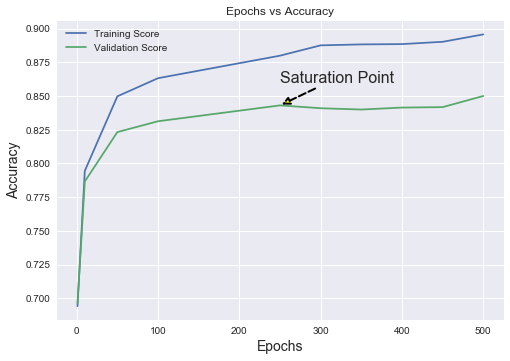

In [500]:
# flatui = ["#9b59b6", "#3498db", "#95a5a6", "#e74c3c"]
# svm_ax_lin=sns.lineplot(data=mlp_df_epoch ,x='Iterations', y='Iterations', legend='full', palette = flatui)
# svm_ax_lin.set(ylim=(0.70, 0.90))
# sns.set_style("whitegrid")
# plt.show()


plt.style.use('seaborn')
plt.plot(mlp_df_epoch['Iterations'], mlp_df_epoch['TrainAccuracy'], label = 'Training Score')
plt.plot(mlp_df_epoch['Iterations'], mlp_df_epoch['ValidationAccuracy'], label = 'Validation Score')
plt.ylabel('Accuracy', fontsize = 14)
plt.xlabel('Epochs', fontsize = 14)
plt.annotate("Saturation Point",fontsize=16,xy=(250.0,0.843060),xytext=(250, 0.86), arrowprops=dict(arrowstyle="-|>",connectionstyle="arc3",facecolor="yellow",edgecolor="black",linestyle='--',linewidth=2))
# plt.title('Learning curves for SVM Linear Model', fontsize = 18, y = 1.03)
plt.legend()
plt.title("Epochs vs Accuracy")

# Experimenting with Layers

In [343]:
#### No OF layers
optimizer_value = keras.optimizers.Adam(learning_rate=0.01)
kfold = StratifiedKFold(n_splits=5, shuffle=True, random_state=33)
mlp_x_train = pd.DataFrame(mlp_x_train)
mlp_y_train = pd.DataFrame(mlp_y_train)
layers_combo = [2,3,4,5]

mlp_df_lay= []
mlp_df_lay = pd.DataFrame()
for layer_no in layers_combo:
    mlp_score_lay_train = []
    mlp_score_lay_val = []
    for train, test in kfold.split(mlp_x_train, mlp_y_train):
        train = train.tolist()
        test = test.tolist()
        mlp_x_train_1 = mlp_x_train.iloc[train,:]
        mlp_y_train_1 = mlp_y_train.iloc[train,:]
        mlp_x_test_1 = mlp_x_train.iloc[test,:]
        mlp_y_test_1 = mlp_y_train.iloc[test,:]
#         print(train)
      # create model
        model = Sequential()
        for layer in range(1,layer_no+1):
            if (layer == 1):
                model.add(Dense(16, input_dim=16, activation='sigmoid'))
            if(layer ==2):
                model.add(Dense(16, activation='sigmoid'))
            if(layer ==3):
                model.add(Dense(12, activation='sigmoid'))
            if(layer ==4):
                model.add(Dense(8, activation='sigmoid'))
            else:
                model.add(Dense(8,activation='sigmoid'))
        model.add(Dense(1,activation = 'sigmoid'))
        # Compile model
        model.compile(loss='binary_crossentropy', optimizer = optimizer_value, metrics=['accuracy'])
        # Fit the model
        model.fit(mlp_x_train_1, mlp_y_train_1, epochs=250,batch_size=200)
        # evaluate the model
        scores_lay_train = model.evaluate(mlp_x_train_1, mlp_y_train_1, verbose=0)
        scores_lay_val = model.evaluate(mlp_x_test_1, mlp_y_test_1, verbose=0)
        mlp_score_lay_train.append(scores_lay_train[1])
        mlp_score_lay_val.append(scores_lay_val[1])  
    mean_score_train = np.mean(mlp_score_lay_train)
    mean_score_val = np.mean(mlp_score_lay_val)
    values_mlp_lay  =  [layer_no, mean_score_train,mean_score_val]
    values_mlp_lay = pd.DataFrame(values_mlp_lay).T
    mlp_df_lay = pd.concat([mlp_df_lay,values_mlp_lay])     
mlp_df_lay.columns = ['Layers','TrainAccuracy','ValidationAccuracy'] 

Epoch 1/250
9852/9852 [==============================] - ETA: 7s - loss: 0.7253 - accuracy: 0.46 - ETA: 0s - loss: 0.6808 - accuracy: 0.56 - ETA: 0s - loss: 0.6693 - accuracy: 0.59 - 0s 29us/step - loss: 0.6677 - accuracy: 0.5956
Epoch 2/250
9852/9852 [==============================] - ETA: 0s - loss: 0.6245 - accuracy: 0.68 - ETA: 0s - loss: 0.6284 - accuracy: 0.64 - ETA: 0s - loss: 0.6044 - accuracy: 0.67 - 0s 13us/step - loss: 0.5983 - accuracy: 0.6825
Epoch 3/250
9852/9852 [==============================] - ETA: 0s - loss: 0.5056 - accuracy: 0.77 - ETA: 0s - loss: 0.5489 - accuracy: 0.73 - ETA: 0s - loss: 0.5392 - accuracy: 0.74 - 0s 14us/step - loss: 0.5422 - accuracy: 0.7401
Epoch 4/250
9852/9852 [==============================] - ETA: 0s - loss: 0.5138 - accuracy: 0.75 - ETA: 0s - loss: 0.5435 - accuracy: 0.73 - ETA: 0s - loss: 0.5338 - accuracy: 0.74 - 0s 13us/step - loss: 0.5354 - accuracy: 0.7438
Epoch 5/250
9852/9852 [==============================] - ETA: 0s - loss: 0.5200 

Epoch 73/250
9852/9852 [==============================] - ETA: 0s - loss: 0.3715 - accuracy: 0.83 - ETA: 0s - loss: 0.3739 - accuracy: 0.83 - ETA: 0s - loss: 0.3832 - accuracy: 0.83 - 0s 13us/step - loss: 0.3827 - accuracy: 0.8365
Epoch 74/250
9852/9852 [==============================] - ETA: 0s - loss: 0.3741 - accuracy: 0.84 - ETA: 0s - loss: 0.3902 - accuracy: 0.83 - ETA: 0s - loss: 0.3872 - accuracy: 0.83 - 0s 12us/step - loss: 0.3869 - accuracy: 0.8338
Epoch 75/250
9852/9852 [==============================] - ETA: 0s - loss: 0.4384 - accuracy: 0.81 - ETA: 0s - loss: 0.3918 - accuracy: 0.83 - ETA: 0s - loss: 0.3798 - accuracy: 0.84 - 0s 12us/step - loss: 0.3790 - accuracy: 0.8404
Epoch 76/250
9852/9852 [==============================] - ETA: 0s - loss: 0.3930 - accuracy: 0.83 - ETA: 0s - loss: 0.3835 - accuracy: 0.83 - ETA: 0s - loss: 0.3776 - accuracy: 0.83 - 0s 12us/step - loss: 0.3764 - accuracy: 0.8398
Epoch 77/250
9852/9852 [==============================] - ETA: 0s - loss: 0.

9852/9852 [==============================] - ETA: 0s - loss: 0.3085 - accuracy: 0.90 - ETA: 0s - loss: 0.3421 - accuracy: 0.86 - ETA: 0s - loss: 0.3499 - accuracy: 0.85 - 0s 12us/step - loss: 0.3485 - accuracy: 0.8588
Epoch 146/250
9852/9852 [==============================] - ETA: 0s - loss: 0.3383 - accuracy: 0.87 - ETA: 0s - loss: 0.3564 - accuracy: 0.85 - ETA: 0s - loss: 0.3524 - accuracy: 0.85 - 0s 12us/step - loss: 0.3497 - accuracy: 0.8586
Epoch 147/250
9852/9852 [==============================] - ETA: 0s - loss: 0.3481 - accuracy: 0.84 - ETA: 0s - loss: 0.3557 - accuracy: 0.85 - ETA: 0s - loss: 0.3459 - accuracy: 0.85 - 0s 12us/step - loss: 0.3470 - accuracy: 0.8594
Epoch 148/250
9852/9852 [==============================] - ETA: 0s - loss: 0.4077 - accuracy: 0.83 - ETA: 0s - loss: 0.3504 - accuracy: 0.85 - ETA: 0s - loss: 0.3517 - accuracy: 0.85 - 0s 12us/step - loss: 0.3507 - accuracy: 0.8574
Epoch 149/250
9852/9852 [==============================] - ETA: 0s - loss: 0.3698 - ac

9852/9852 [==============================] - ETA: 0s - loss: 0.2830 - accuracy: 0.89 - ETA: 0s - loss: 0.3119 - accuracy: 0.87 - 0s 11us/step - loss: 0.3311 - accuracy: 0.8660
Epoch 217/250
9852/9852 [==============================] - ETA: 0s - loss: 0.2846 - accuracy: 0.89 - ETA: 0s - loss: 0.3321 - accuracy: 0.86 - 0s 11us/step - loss: 0.3413 - accuracy: 0.8599
Epoch 218/250
9852/9852 [==============================] - ETA: 0s - loss: 0.3243 - accuracy: 0.85 - ETA: 0s - loss: 0.3409 - accuracy: 0.86 - ETA: 0s - loss: 0.3319 - accuracy: 0.86 - 0s 12us/step - loss: 0.3330 - accuracy: 0.8660
Epoch 219/250
9852/9852 [==============================] - ETA: 0s - loss: 0.3661 - accuracy: 0.84 - ETA: 0s - loss: 0.3244 - accuracy: 0.86 - ETA: 0s - loss: 0.3333 - accuracy: 0.86 - 0s 12us/step - loss: 0.3338 - accuracy: 0.8616
Epoch 220/250
9852/9852 [==============================] - ETA: 0s - loss: 0.2675 - accuracy: 0.90 - ETA: 0s - loss: 0.3331 - accuracy: 0.86 - ETA: 0s - loss: 0.3346 - ac

Epoch 2/250
9854/9854 [==============================] - ETA: 0s - loss: 0.5727 - accuracy: 0.72 - ETA: 0s - loss: 0.5546 - accuracy: 0.73 - ETA: 0s - loss: 0.5471 - accuracy: 0.73 - 0s 12us/step - loss: 0.5458 - accuracy: 0.7399
Epoch 3/250
9854/9854 [==============================] - ETA: 0s - loss: 0.5566 - accuracy: 0.73 - ETA: 0s - loss: 0.5254 - accuracy: 0.74 - ETA: 0s - loss: 0.5223 - accuracy: 0.74 - 0s 12us/step - loss: 0.5225 - accuracy: 0.7475
Epoch 4/250
9854/9854 [==============================] - ETA: 0s - loss: 0.5378 - accuracy: 0.74 - ETA: 0s - loss: 0.5056 - accuracy: 0.74 - ETA: 0s - loss: 0.4998 - accuracy: 0.75 - 0s 12us/step - loss: 0.4988 - accuracy: 0.7533
Epoch 5/250
9854/9854 [==============================] - ETA: 0s - loss: 0.4627 - accuracy: 0.76 - ETA: 0s - loss: 0.4918 - accuracy: 0.76 - ETA: 0s - loss: 0.4903 - accuracy: 0.76 - 0s 12us/step - loss: 0.4884 - accuracy: 0.7638
Epoch 6/250
9854/9854 [==============================] - ETA: 0s - loss: 0.5212 

9854/9854 [==============================] - ETA: 0s - loss: 0.3424 - accuracy: 0.84 - ETA: 0s - loss: 0.3657 - accuracy: 0.84 - ETA: 0s - loss: 0.3611 - accuracy: 0.85 - 0s 12us/step - loss: 0.3598 - accuracy: 0.8505
Epoch 73/250
9854/9854 [==============================] - ETA: 0s - loss: 0.3497 - accuracy: 0.85 - ETA: 0s - loss: 0.3567 - accuracy: 0.85 - ETA: 0s - loss: 0.3619 - accuracy: 0.84 - 0s 12us/step - loss: 0.3612 - accuracy: 0.8495
Epoch 74/250
9854/9854 [==============================] - ETA: 0s - loss: 0.3423 - accuracy: 0.86 - ETA: 0s - loss: 0.3580 - accuracy: 0.85 - ETA: 0s - loss: 0.3596 - accuracy: 0.85 - 0s 12us/step - loss: 0.3602 - accuracy: 0.8510
Epoch 75/250
9854/9854 [==============================] - ETA: 0s - loss: 0.2928 - accuracy: 0.88 - ETA: 0s - loss: 0.3560 - accuracy: 0.85 - ETA: 0s - loss: 0.3611 - accuracy: 0.85 - 0s 12us/step - loss: 0.3605 - accuracy: 0.8519
Epoch 76/250
9854/9854 [==============================] - ETA: 0s - loss: 0.3653 - accura

9854/9854 [==============================] - ETA: 0s - loss: 0.2880 - accuracy: 0.89 - ETA: 0s - loss: 0.3389 - accuracy: 0.86 - ETA: 0s - loss: 0.3402 - accuracy: 0.86 - 0s 12us/step - loss: 0.3407 - accuracy: 0.8632
Epoch 143/250
9854/9854 [==============================] - ETA: 0s - loss: 0.2956 - accuracy: 0.88 - ETA: 0s - loss: 0.3352 - accuracy: 0.86 - ETA: 0s - loss: 0.3438 - accuracy: 0.85 - 0s 12us/step - loss: 0.3426 - accuracy: 0.8604
Epoch 144/250
9854/9854 [==============================] - ETA: 0s - loss: 0.3320 - accuracy: 0.86 - ETA: 0s - loss: 0.3356 - accuracy: 0.86 - ETA: 0s - loss: 0.3402 - accuracy: 0.86 - 0s 12us/step - loss: 0.3427 - accuracy: 0.8615
Epoch 145/250
9854/9854 [==============================] - ETA: 0s - loss: 0.3500 - accuracy: 0.84 - ETA: 0s - loss: 0.3425 - accuracy: 0.86 - ETA: 0s - loss: 0.3399 - accuracy: 0.86 - 0s 12us/step - loss: 0.3417 - accuracy: 0.8605
Epoch 146/250
9854/9854 [==============================] - ETA: 0s - loss: 0.3622 - ac

9854/9854 [==============================] - ETA: 0s - loss: 0.3125 - accuracy: 0.88 - ETA: 0s - loss: 0.3274 - accuracy: 0.86 - ETA: 0s - loss: 0.3293 - accuracy: 0.86 - 0s 12us/step - loss: 0.3303 - accuracy: 0.8695
Epoch 216/250
9854/9854 [==============================] - ETA: 0s - loss: 0.2944 - accuracy: 0.89 - ETA: 0s - loss: 0.3256 - accuracy: 0.87 - ETA: 0s - loss: 0.3318 - accuracy: 0.86 - 0s 12us/step - loss: 0.3299 - accuracy: 0.8702
Epoch 217/250
9854/9854 [==============================] - ETA: 0s - loss: 0.2900 - accuracy: 0.89 - ETA: 0s - loss: 0.3256 - accuracy: 0.87 - ETA: 0s - loss: 0.3265 - accuracy: 0.87 - 0s 12us/step - loss: 0.3292 - accuracy: 0.8693
Epoch 218/250
9854/9854 [==============================] - ETA: 0s - loss: 0.3245 - accuracy: 0.86 - ETA: 0s - loss: 0.3267 - accuracy: 0.87 - ETA: 0s - loss: 0.3327 - accuracy: 0.86 - 0s 12us/step - loss: 0.3314 - accuracy: 0.8684
Epoch 219/250
9854/9854 [==============================] - ETA: 0s - loss: 0.2702 - ac

Epoch 35/250
9854/9854 [==============================] - ETA: 0s - loss: 0.4326 - accuracy: 0.83 - ETA: 0s - loss: 0.3900 - accuracy: 0.83 - ETA: 0s - loss: 0.3883 - accuracy: 0.83 - 0s 15us/step - loss: 0.3852 - accuracy: 0.8363
Epoch 36/250
9854/9854 [==============================] - ETA: 0s - loss: 0.3650 - accuracy: 0.85 - ETA: 0s - loss: 0.3908 - accuracy: 0.84 - ETA: 0s - loss: 0.3839 - accuracy: 0.83 - 0s 13us/step - loss: 0.3831 - accuracy: 0.8392
Epoch 37/250
9854/9854 [==============================] - ETA: 0s - loss: 0.3756 - accuracy: 0.84 - ETA: 0s - loss: 0.3845 - accuracy: 0.84 - ETA: 0s - loss: 0.3821 - accuracy: 0.84 - 0s 13us/step - loss: 0.3820 - accuracy: 0.8420
Epoch 38/250
9854/9854 [==============================] - ETA: 0s - loss: 0.4336 - accuracy: 0.82 - ETA: 0s - loss: 0.3839 - accuracy: 0.83 - ETA: 0s - loss: 0.3881 - accuracy: 0.83 - 0s 14us/step - loss: 0.3842 - accuracy: 0.8384
Epoch 39/250
9854/9854 [==============================] - ETA: 0s - loss: 0.

9854/9854 [==============================] - ETA: 0s - loss: 0.3089 - accuracy: 0.88 - ETA: 0s - loss: 0.3540 - accuracy: 0.85 - 0s 10us/step - loss: 0.3557 - accuracy: 0.8545
Epoch 108/250
9854/9854 [==============================] - ETA: 0s - loss: 0.2945 - accuracy: 0.88 - ETA: 0s - loss: 0.3471 - accuracy: 0.86 - ETA: 0s - loss: 0.3517 - accuracy: 0.85 - 0s 13us/step - loss: 0.3537 - accuracy: 0.8578
Epoch 109/250
9854/9854 [==============================] - ETA: 0s - loss: 0.3252 - accuracy: 0.84 - ETA: 0s - loss: 0.3474 - accuracy: 0.85 - 0s 10us/step - loss: 0.3520 - accuracy: 0.8563
Epoch 110/250
9854/9854 [==============================] - ETA: 0s - loss: 0.4046 - accuracy: 0.82 - ETA: 0s - loss: 0.3481 - accuracy: 0.86 - ETA: 0s - loss: 0.3496 - accuracy: 0.85 - 0s 13us/step - loss: 0.3543 - accuracy: 0.8564
Epoch 111/250
9854/9854 [==============================] - ETA: 0s - loss: 0.3941 - accuracy: 0.85 - ETA: 0s - loss: 0.3590 - accuracy: 0.85 - 0s 10us/step - loss: 0.3584

9854/9854 [==============================] - ETA: 0s - loss: 0.3368 - accuracy: 0.86 - ETA: 0s - loss: 0.3319 - accuracy: 0.86 - ETA: 0s - loss: 0.3388 - accuracy: 0.86 - 0s 11us/step - loss: 0.3385 - accuracy: 0.8628
Epoch 187/250
9854/9854 [==============================] - ETA: 0s - loss: 0.2645 - accuracy: 0.91 - ETA: 0s - loss: 0.3395 - accuracy: 0.86 - 0s 10us/step - loss: 0.3384 - accuracy: 0.8643
Epoch 188/250
9854/9854 [==============================] - ETA: 0s - loss: 0.2898 - accuracy: 0.88 - ETA: 0s - loss: 0.3404 - accuracy: 0.86 - 0s 10us/step - loss: 0.3389 - accuracy: 0.8629
Epoch 189/250
9854/9854 [==============================] - ETA: 0s - loss: 0.3801 - accuracy: 0.82 - ETA: 0s - loss: 0.3332 - accuracy: 0.86 - 0s 10us/step - loss: 0.3370 - accuracy: 0.8636
Epoch 190/250
9854/9854 [==============================] - ETA: 0s - loss: 0.3354 - accuracy: 0.88 - ETA: 0s - loss: 0.3387 - accuracy: 0.86 - 0s 10us/step - loss: 0.3372 - accuracy: 0.8628
Epoch 191/250
9854/985

9854/9854 [==============================] - ETA: 0s - loss: 0.3686 - accuracy: 0.86 - ETA: 0s - loss: 0.4087 - accuracy: 0.81 - ETA: 0s - loss: 0.4079 - accuracy: 0.81 - 0s 11us/step - loss: 0.4071 - accuracy: 0.8161
Epoch 19/250
9854/9854 [==============================] - ETA: 0s - loss: 0.4269 - accuracy: 0.80 - ETA: 0s - loss: 0.3997 - accuracy: 0.81 - 0s 10us/step - loss: 0.4024 - accuracy: 0.8191
Epoch 20/250
9854/9854 [==============================] - ETA: 0s - loss: 0.4135 - accuracy: 0.81 - ETA: 0s - loss: 0.3910 - accuracy: 0.82 - 0s 10us/step - loss: 0.4018 - accuracy: 0.8223
Epoch 21/250
9854/9854 [==============================] - ETA: 0s - loss: 0.3782 - accuracy: 0.84 - ETA: 0s - loss: 0.3968 - accuracy: 0.82 - 0s 10us/step - loss: 0.4009 - accuracy: 0.8218
Epoch 22/250
9854/9854 [==============================] - ETA: 0s - loss: 0.3981 - accuracy: 0.81 - ETA: 0s - loss: 0.4024 - accuracy: 0.81 - 0s 10us/step - loss: 0.3973 - accuracy: 0.8201
Epoch 23/250
9854/9854 [==

Epoch 103/250
9854/9854 [==============================] - ETA: 0s - loss: 0.3080 - accuracy: 0.86 - ETA: 0s - loss: 0.3413 - accuracy: 0.86 - 0s 11us/step - loss: 0.3487 - accuracy: 0.8579
Epoch 104/250
9854/9854 [==============================] - ETA: 0s - loss: 0.3205 - accuracy: 0.85 - ETA: 0s - loss: 0.3523 - accuracy: 0.85 - 0s 10us/step - loss: 0.3517 - accuracy: 0.8537
Epoch 105/250
9854/9854 [==============================] - ETA: 0s - loss: 0.3731 - accuracy: 0.86 - ETA: 0s - loss: 0.3481 - accuracy: 0.85 - 0s 10us/step - loss: 0.3486 - accuracy: 0.8578
Epoch 106/250
9854/9854 [==============================] - ETA: 0s - loss: 0.2892 - accuracy: 0.87 - ETA: 0s - loss: 0.3461 - accuracy: 0.85 - 0s 9us/step - loss: 0.3497 - accuracy: 0.8558
Epoch 107/250
9854/9854 [==============================] - ETA: 0s - loss: 0.3643 - accuracy: 0.85 - ETA: 0s - loss: 0.3492 - accuracy: 0.85 - 0s 10us/step - loss: 0.3485 - accuracy: 0.8591
Epoch 108/250
9854/9854 [==========================

Epoch 146/250
9854/9854 [==============================] - ETA: 0s - loss: 0.3331 - accuracy: 0.85 - ETA: 0s - loss: 0.3375 - accuracy: 0.86 - 0s 9us/step - loss: 0.3381 - accuracy: 0.8649
Epoch 147/250
9854/9854 [==============================] - ETA: 0s - loss: 0.3157 - accuracy: 0.88 - ETA: 0s - loss: 0.3441 - accuracy: 0.85 - 0s 10us/step - loss: 0.3377 - accuracy: 0.8650
Epoch 148/250
9854/9854 [==============================] - ETA: 0s - loss: 0.3240 - accuracy: 0.89 - ETA: 0s - loss: 0.3378 - accuracy: 0.86 - 0s 9us/step - loss: 0.3386 - accuracy: 0.8647
Epoch 149/250
9854/9854 [==============================] - ETA: 0s - loss: 0.3023 - accuracy: 0.89 - ETA: 0s - loss: 0.3387 - accuracy: 0.86 - 0s 9us/step - loss: 0.3402 - accuracy: 0.8627
Epoch 150/250
9854/9854 [==============================] - ETA: 0s - loss: 0.4222 - accuracy: 0.83 - ETA: 0s - loss: 0.3464 - accuracy: 0.86 - 0s 9us/step - loss: 0.3401 - accuracy: 0.8636
Epoch 151/250
9854/9854 [=============================

9854/9854 [==============================] - ETA: 0s - loss: 0.3008 - accuracy: 0.89 - ETA: 0s - loss: 0.3369 - accuracy: 0.86 - 0s 10us/step - loss: 0.3246 - accuracy: 0.8717
Epoch 231/250
9854/9854 [==============================] - ETA: 0s - loss: 0.3138 - accuracy: 0.89 - ETA: 0s - loss: 0.3197 - accuracy: 0.87 - 0s 10us/step - loss: 0.3234 - accuracy: 0.8738
Epoch 232/250
9854/9854 [==============================] - ETA: 0s - loss: 0.2860 - accuracy: 0.90 - ETA: 0s - loss: 0.3302 - accuracy: 0.87 - 0s 10us/step - loss: 0.3253 - accuracy: 0.8731
Epoch 233/250
9854/9854 [==============================] - ETA: 0s - loss: 0.2674 - accuracy: 0.88 - ETA: 0s - loss: 0.3240 - accuracy: 0.87 - 0s 10us/step - loss: 0.3280 - accuracy: 0.8701
Epoch 234/250
9854/9854 [==============================] - ETA: 0s - loss: 0.3902 - accuracy: 0.84 - ETA: 0s - loss: 0.3224 - accuracy: 0.87 - 0s 10us/step - loss: 0.3226 - accuracy: 0.8725
Epoch 235/250
9854/9854 [==============================] - ETA: 

9854/9854 [==============================] - ETA: 0s - loss: 0.4409 - accuracy: 0.82 - ETA: 0s - loss: 0.3768 - accuracy: 0.84 - 0s 9us/step - loss: 0.3694 - accuracy: 0.8403
Epoch 61/250
9854/9854 [==============================] - ETA: 0s - loss: 0.4199 - accuracy: 0.82 - ETA: 0s - loss: 0.3749 - accuracy: 0.83 - 0s 9us/step - loss: 0.3693 - accuracy: 0.8369
Epoch 62/250
9854/9854 [==============================] - ETA: 0s - loss: 0.3695 - accuracy: 0.85 - ETA: 0s - loss: 0.3635 - accuracy: 0.84 - 0s 10us/step - loss: 0.3687 - accuracy: 0.8409
Epoch 63/250
9854/9854 [==============================] - ETA: 0s - loss: 0.3150 - accuracy: 0.85 - ETA: 0s - loss: 0.3751 - accuracy: 0.83 - 0s 10us/step - loss: 0.3683 - accuracy: 0.8397
Epoch 64/250
9854/9854 [==============================] - ETA: 0s - loss: 0.3358 - accuracy: 0.84 - ETA: 0s - loss: 0.3602 - accuracy: 0.84 - 0s 9us/step - loss: 0.3675 - accuracy: 0.8420
Epoch 65/250
9854/9854 [==============================] - ETA: 0s - los

Epoch 103/250
9854/9854 [==============================] - ETA: 0s - loss: 0.3146 - accuracy: 0.86 - ETA: 0s - loss: 0.3450 - accuracy: 0.85 - 0s 9us/step - loss: 0.3526 - accuracy: 0.8514
Epoch 104/250
9854/9854 [==============================] - ETA: 0s - loss: 0.3075 - accuracy: 0.87 - ETA: 0s - loss: 0.3524 - accuracy: 0.84 - 0s 9us/step - loss: 0.3526 - accuracy: 0.8505
Epoch 105/250
9854/9854 [==============================] - ETA: 0s - loss: 0.4245 - accuracy: 0.80 - ETA: 0s - loss: 0.3546 - accuracy: 0.85 - 0s 10us/step - loss: 0.3512 - accuracy: 0.8538
Epoch 106/250
9854/9854 [==============================] - ETA: 0s - loss: 0.3543 - accuracy: 0.85 - ETA: 0s - loss: 0.3475 - accuracy: 0.85 - 0s 9us/step - loss: 0.3515 - accuracy: 0.8529
Epoch 107/250
9854/9854 [==============================] - ETA: 0s - loss: 0.4069 - accuracy: 0.82 - ETA: 0s - loss: 0.3560 - accuracy: 0.84 - 0s 9us/step - loss: 0.3515 - accuracy: 0.8528
Epoch 108/250
9854/9854 [=============================

Epoch 146/250
9854/9854 [==============================] - ETA: 0s - loss: 0.3358 - accuracy: 0.87 - ETA: 0s - loss: 0.3433 - accuracy: 0.85 - 0s 10us/step - loss: 0.3438 - accuracy: 0.8529
Epoch 147/250
9854/9854 [==============================] - ETA: 0s - loss: 0.3067 - accuracy: 0.87 - ETA: 0s - loss: 0.3449 - accuracy: 0.85 - 0s 10us/step - loss: 0.3416 - accuracy: 0.8562
Epoch 148/250
9854/9854 [==============================] - ETA: 0s - loss: 0.2677 - accuracy: 0.88 - ETA: 0s - loss: 0.3388 - accuracy: 0.85 - 0s 10us/step - loss: 0.3412 - accuracy: 0.8561
Epoch 149/250
9854/9854 [==============================] - ETA: 0s - loss: 0.2786 - accuracy: 0.90 - ETA: 0s - loss: 0.3504 - accuracy: 0.85 - 0s 10us/step - loss: 0.3400 - accuracy: 0.8590
Epoch 150/250
9854/9854 [==============================] - ETA: 0s - loss: 0.4508 - accuracy: 0.80 - ETA: 0s - loss: 0.3374 - accuracy: 0.86 - 0s 10us/step - loss: 0.3390 - accuracy: 0.8594
Epoch 151/250
9854/9854 [=========================

9854/9854 [==============================] - ETA: 0s - loss: 0.3225 - accuracy: 0.88 - ETA: 0s - loss: 0.3254 - accuracy: 0.86 - 0s 10us/step - loss: 0.3258 - accuracy: 0.8657
Epoch 231/250
9854/9854 [==============================] - ETA: 0s - loss: 0.3018 - accuracy: 0.87 - ETA: 0s - loss: 0.3321 - accuracy: 0.86 - 0s 11us/step - loss: 0.3261 - accuracy: 0.8652
Epoch 232/250
9854/9854 [==============================] - ETA: 0s - loss: 0.3710 - accuracy: 0.86 - ETA: 0s - loss: 0.3259 - accuracy: 0.86 - 0s 10us/step - loss: 0.3261 - accuracy: 0.8676
Epoch 233/250
9854/9854 [==============================] - ETA: 0s - loss: 0.3216 - accuracy: 0.87 - ETA: 0s - loss: 0.3225 - accuracy: 0.86 - 0s 10us/step - loss: 0.3252 - accuracy: 0.8666
Epoch 234/250
9854/9854 [==============================] - ETA: 0s - loss: 0.3169 - accuracy: 0.86 - ETA: 0s - loss: 0.3090 - accuracy: 0.87 - 0s 10us/step - loss: 0.3236 - accuracy: 0.8680
Epoch 235/250
9854/9854 [==============================] - ETA: 

9852/9852 [==============================] - ETA: 0s - loss: 0.3272 - accuracy: 0.85 - ETA: 0s - loss: 0.3638 - accuracy: 0.84 - ETA: 0s - loss: 0.3625 - accuracy: 0.85 - 0s 13us/step - loss: 0.3667 - accuracy: 0.8499
Epoch 55/250
9852/9852 [==============================] - ETA: 0s - loss: 0.3801 - accuracy: 0.85 - ETA: 0s - loss: 0.3593 - accuracy: 0.85 - ETA: 0s - loss: 0.3671 - accuracy: 0.84 - 0s 12us/step - loss: 0.3680 - accuracy: 0.8478
Epoch 56/250
9852/9852 [==============================] - ETA: 0s - loss: 0.4022 - accuracy: 0.82 - ETA: 0s - loss: 0.3786 - accuracy: 0.84 - ETA: 0s - loss: 0.3673 - accuracy: 0.85 - 0s 12us/step - loss: 0.3670 - accuracy: 0.8509
Epoch 57/250
9852/9852 [==============================] - ETA: 0s - loss: 0.3898 - accuracy: 0.84 - ETA: 0s - loss: 0.3593 - accuracy: 0.85 - ETA: 0s - loss: 0.3659 - accuracy: 0.85 - 0s 12us/step - loss: 0.3655 - accuracy: 0.8515
Epoch 58/250
9852/9852 [==============================] - ETA: 0s - loss: 0.3495 - accura

Epoch 90/250
9852/9852 [==============================] - ETA: 0s - loss: 0.3939 - accuracy: 0.84 - ETA: 0s - loss: 0.3681 - accuracy: 0.84 - ETA: 0s - loss: 0.3480 - accuracy: 0.86 - 0s 12us/step - loss: 0.3497 - accuracy: 0.8606
Epoch 91/250
9852/9852 [==============================] - ETA: 0s - loss: 0.3049 - accuracy: 0.87 - ETA: 0s - loss: 0.3390 - accuracy: 0.87 - ETA: 0s - loss: 0.3471 - accuracy: 0.86 - 0s 12us/step - loss: 0.3479 - accuracy: 0.8611
Epoch 92/250
9852/9852 [==============================] - ETA: 0s - loss: 0.3316 - accuracy: 0.87 - ETA: 0s - loss: 0.3445 - accuracy: 0.86 - ETA: 0s - loss: 0.3496 - accuracy: 0.86 - 0s 12us/step - loss: 0.3481 - accuracy: 0.8642
Epoch 93/250
9852/9852 [==============================] - ETA: 0s - loss: 0.2591 - accuracy: 0.90 - ETA: 0s - loss: 0.3460 - accuracy: 0.86 - ETA: 0s - loss: 0.3487 - accuracy: 0.86 - 0s 13us/step - loss: 0.3501 - accuracy: 0.8621
Epoch 94/250
9852/9852 [==============================] - ETA: 0s - loss: 0.

9852/9852 [==============================] - ETA: 0s - loss: 0.3097 - accuracy: 0.89 - ETA: 0s - loss: 0.3385 - accuracy: 0.86 - ETA: 0s - loss: 0.3296 - accuracy: 0.87 - 0s 13us/step - loss: 0.3335 - accuracy: 0.8715
Epoch 161/250
9852/9852 [==============================] - ETA: 0s - loss: 0.2756 - accuracy: 0.89 - ETA: 0s - loss: 0.3345 - accuracy: 0.87 - ETA: 0s - loss: 0.3331 - accuracy: 0.87 - 0s 12us/step - loss: 0.3342 - accuracy: 0.8742
Epoch 162/250
9852/9852 [==============================] - ETA: 0s - loss: 0.3512 - accuracy: 0.87 - ETA: 0s - loss: 0.3302 - accuracy: 0.87 - ETA: 0s - loss: 0.3307 - accuracy: 0.87 - 0s 12us/step - loss: 0.3314 - accuracy: 0.8741
Epoch 163/250
9852/9852 [==============================] - ETA: 0s - loss: 0.2960 - accuracy: 0.90 - ETA: 0s - loss: 0.3186 - accuracy: 0.87 - ETA: 0s - loss: 0.3321 - accuracy: 0.87 - 0s 12us/step - loss: 0.3321 - accuracy: 0.8705
Epoch 164/250
9852/9852 [==============================] - ETA: 0s - loss: 0.3347 - ac

9852/9852 [==============================] - ETA: 0s - loss: 0.3162 - accuracy: 0.88 - ETA: 0s - loss: 0.3127 - accuracy: 0.88 - ETA: 0s - loss: 0.3201 - accuracy: 0.88 - 0s 12us/step - loss: 0.3215 - accuracy: 0.8790
Epoch 231/250
9852/9852 [==============================] - ETA: 0s - loss: 0.3409 - accuracy: 0.85 - ETA: 0s - loss: 0.3107 - accuracy: 0.88 - ETA: 0s - loss: 0.3189 - accuracy: 0.87 - 0s 12us/step - loss: 0.3217 - accuracy: 0.8787
Epoch 232/250
9852/9852 [==============================] - ETA: 0s - loss: 0.2882 - accuracy: 0.89 - ETA: 0s - loss: 0.3142 - accuracy: 0.88 - ETA: 0s - loss: 0.3193 - accuracy: 0.88 - 0s 12us/step - loss: 0.3199 - accuracy: 0.8825
Epoch 233/250
9852/9852 [==============================] - ETA: 0s - loss: 0.3188 - accuracy: 0.90 - ETA: 0s - loss: 0.3206 - accuracy: 0.88 - ETA: 0s - loss: 0.3179 - accuracy: 0.88 - 0s 12us/step - loss: 0.3184 - accuracy: 0.8816
Epoch 234/250
9852/9852 [==============================] - ETA: 0s - loss: 0.3589 - ac

9854/9854 [==============================] - ETA: 0s - loss: 0.4512 - accuracy: 0.79 - ETA: 0s - loss: 0.3802 - accuracy: 0.83 - ETA: 0s - loss: 0.3898 - accuracy: 0.83 - 0s 12us/step - loss: 0.3892 - accuracy: 0.8340
Epoch 51/250
9854/9854 [==============================] - ETA: 0s - loss: 0.3840 - accuracy: 0.83 - ETA: 0s - loss: 0.3896 - accuracy: 0.83 - ETA: 0s - loss: 0.3890 - accuracy: 0.83 - 0s 12us/step - loss: 0.3889 - accuracy: 0.8343
Epoch 52/250
9854/9854 [==============================] - ETA: 0s - loss: 0.3561 - accuracy: 0.84 - ETA: 0s - loss: 0.4008 - accuracy: 0.82 - ETA: 0s - loss: 0.3982 - accuracy: 0.83 - 0s 12us/step - loss: 0.3969 - accuracy: 0.8310
Epoch 53/250
9854/9854 [==============================] - ETA: 0s - loss: 0.4320 - accuracy: 0.81 - ETA: 0s - loss: 0.3838 - accuracy: 0.83 - ETA: 0s - loss: 0.3884 - accuracy: 0.83 - 0s 12us/step - loss: 0.3868 - accuracy: 0.8356
Epoch 54/250
9854/9854 [==============================] - ETA: 0s - loss: 0.4441 - accura

9854/9854 [==============================] - ETA: 0s - loss: 0.3872 - accuracy: 0.84 - ETA: 0s - loss: 0.3638 - accuracy: 0.85 - ETA: 0s - loss: 0.3626 - accuracy: 0.84 - 0s 12us/step - loss: 0.3626 - accuracy: 0.8501
Epoch 121/250
9854/9854 [==============================] - ETA: 0s - loss: 0.3524 - accuracy: 0.86 - ETA: 0s - loss: 0.3587 - accuracy: 0.85 - ETA: 0s - loss: 0.3582 - accuracy: 0.85 - 0s 12us/step - loss: 0.3612 - accuracy: 0.8511
Epoch 122/250
9854/9854 [==============================] - ETA: 0s - loss: 0.3896 - accuracy: 0.82 - ETA: 0s - loss: 0.3482 - accuracy: 0.85 - ETA: 0s - loss: 0.3632 - accuracy: 0.84 - 0s 12us/step - loss: 0.3637 - accuracy: 0.8492
Epoch 123/250
9854/9854 [==============================] - ETA: 0s - loss: 0.4140 - accuracy: 0.81 - ETA: 0s - loss: 0.3606 - accuracy: 0.85 - ETA: 0s - loss: 0.3632 - accuracy: 0.85 - 0s 12us/step - loss: 0.3614 - accuracy: 0.8518
Epoch 124/250
9854/9854 [==============================] - ETA: 0s - loss: 0.3313 - ac

9854/9854 [==============================] - ETA: 0s - loss: 0.3005 - accuracy: 0.87 - ETA: 0s - loss: 0.3468 - accuracy: 0.85 - ETA: 0s - loss: 0.3478 - accuracy: 0.85 - 0s 12us/step - loss: 0.3458 - accuracy: 0.8560
Epoch 191/250
9854/9854 [==============================] - ETA: 0s - loss: 0.3332 - accuracy: 0.90 - ETA: 0s - loss: 0.3485 - accuracy: 0.85 - ETA: 0s - loss: 0.3472 - accuracy: 0.85 - 0s 12us/step - loss: 0.3475 - accuracy: 0.8569
Epoch 192/250
9854/9854 [==============================] - ETA: 0s - loss: 0.3306 - accuracy: 0.88 - ETA: 0s - loss: 0.3391 - accuracy: 0.86 - ETA: 0s - loss: 0.3520 - accuracy: 0.85 - 0s 12us/step - loss: 0.3500 - accuracy: 0.8561
Epoch 193/250
9854/9854 [==============================] - ETA: 0s - loss: 0.2907 - accuracy: 0.89 - ETA: 0s - loss: 0.3523 - accuracy: 0.85 - ETA: 0s - loss: 0.3456 - accuracy: 0.86 - 0s 12us/step - loss: 0.3476 - accuracy: 0.8589
Epoch 194/250
9854/9854 [==============================] - ETA: 0s - loss: 0.3548 - ac

9854/9854 [==============================] - ETA: 0s - loss: 0.4748 - accuracy: 0.78 - ETA: 0s - loss: 0.4831 - accuracy: 0.77 - ETA: 0s - loss: 0.4920 - accuracy: 0.76 - 0s 12us/step - loss: 0.4919 - accuracy: 0.7646
Epoch 11/250
9854/9854 [==============================] - ETA: 0s - loss: 0.5017 - accuracy: 0.73 - ETA: 0s - loss: 0.4954 - accuracy: 0.75 - ETA: 0s - loss: 0.4888 - accuracy: 0.76 - 0s 12us/step - loss: 0.4876 - accuracy: 0.7662
Epoch 12/250
9854/9854 [==============================] - ETA: 0s - loss: 0.4603 - accuracy: 0.79 - ETA: 0s - loss: 0.4856 - accuracy: 0.77 - ETA: 0s - loss: 0.4797 - accuracy: 0.77 - 0s 11us/step - loss: 0.4796 - accuracy: 0.7736
Epoch 13/250
9854/9854 [==============================] - ETA: 0s - loss: 0.4482 - accuracy: 0.78 - ETA: 0s - loss: 0.4665 - accuracy: 0.78 - ETA: 0s - loss: 0.4691 - accuracy: 0.78 - 0s 12us/step - loss: 0.4692 - accuracy: 0.7813
Epoch 14/250
9854/9854 [==============================] - ETA: 0s - loss: 0.4901 - accura

9854/9854 [==============================] - ETA: 0s - loss: 0.3870 - accuracy: 0.83 - ETA: 0s - loss: 0.3654 - accuracy: 0.84 - ETA: 0s - loss: 0.3633 - accuracy: 0.84 - 0s 14us/step - loss: 0.3632 - accuracy: 0.8484
Epoch 81/250
9854/9854 [==============================] - ETA: 0s - loss: 0.4298 - accuracy: 0.81 - ETA: 0s - loss: 0.3648 - accuracy: 0.84 - ETA: 0s - loss: 0.3666 - accuracy: 0.84 - 0s 12us/step - loss: 0.3652 - accuracy: 0.8484
Epoch 82/250
9854/9854 [==============================] - ETA: 0s - loss: 0.2891 - accuracy: 0.87 - ETA: 0s - loss: 0.3516 - accuracy: 0.85 - ETA: 0s - loss: 0.3648 - accuracy: 0.84 - 0s 13us/step - loss: 0.3632 - accuracy: 0.8487
Epoch 83/250
9854/9854 [==============================] - ETA: 0s - loss: 0.3312 - accuracy: 0.85 - ETA: 0s - loss: 0.3540 - accuracy: 0.84 - ETA: 0s - loss: 0.3599 - accuracy: 0.84 - 0s 12us/step - loss: 0.3618 - accuracy: 0.8466
Epoch 84/250
9854/9854 [==============================] - ETA: 0s - loss: 0.3201 - accura

9854/9854 [==============================] - ETA: 0s - loss: 0.3179 - accuracy: 0.86 - ETA: 0s - loss: 0.3370 - accuracy: 0.85 - ETA: 0s - loss: 0.3308 - accuracy: 0.86 - 0s 14us/step - loss: 0.3362 - accuracy: 0.8602
Epoch 151/250
9854/9854 [==============================] - ETA: 0s - loss: 0.3593 - accuracy: 0.85 - ETA: 0s - loss: 0.3464 - accuracy: 0.85 - ETA: 0s - loss: 0.3397 - accuracy: 0.85 - 0s 12us/step - loss: 0.3403 - accuracy: 0.8571
Epoch 152/250
9854/9854 [==============================] - ETA: 0s - loss: 0.4688 - accuracy: 0.79 - ETA: 0s - loss: 0.3583 - accuracy: 0.84 - ETA: 0s - loss: 0.3391 - accuracy: 0.85 - 0s 12us/step - loss: 0.3386 - accuracy: 0.8567
Epoch 153/250
9854/9854 [==============================] - ETA: 0s - loss: 0.3453 - accuracy: 0.86 - ETA: 0s - loss: 0.3364 - accuracy: 0.85 - ETA: 0s - loss: 0.3363 - accuracy: 0.86 - 0s 11us/step - loss: 0.3362 - accuracy: 0.8605
Epoch 154/250
9854/9854 [==============================] - ETA: 0s - loss: 0.3716 - ac

Epoch 186/250
9854/9854 [==============================] - ETA: 0s - loss: 0.2688 - accuracy: 0.89 - ETA: 0s - loss: 0.3309 - accuracy: 0.85 - ETA: 0s - loss: 0.3304 - accuracy: 0.86 - 0s 12us/step - loss: 0.3306 - accuracy: 0.8595
Epoch 187/250
9854/9854 [==============================] - ETA: 0s - loss: 0.2834 - accuracy: 0.87 - ETA: 0s - loss: 0.3230 - accuracy: 0.86 - ETA: 0s - loss: 0.3314 - accuracy: 0.85 - 0s 12us/step - loss: 0.3317 - accuracy: 0.8585
Epoch 188/250
9854/9854 [==============================] - ETA: 0s - loss: 0.3101 - accuracy: 0.89 - ETA: 0s - loss: 0.3315 - accuracy: 0.86 - ETA: 0s - loss: 0.3314 - accuracy: 0.86 - 0s 12us/step - loss: 0.3306 - accuracy: 0.8614
Epoch 189/250
9854/9854 [==============================] - ETA: 0s - loss: 0.2908 - accuracy: 0.87 - ETA: 0s - loss: 0.3292 - accuracy: 0.86 - ETA: 0s - loss: 0.3294 - accuracy: 0.86 - 0s 12us/step - loss: 0.3303 - accuracy: 0.8620
Epoch 190/250
9854/9854 [==============================] - ETA: 0s - los

Epoch 221/250
9854/9854 [==============================] - ETA: 0s - loss: 0.3639 - accuracy: 0.85 - ETA: 0s - loss: 0.3251 - accuracy: 0.86 - ETA: 0s - loss: 0.3262 - accuracy: 0.86 - 0s 12us/step - loss: 0.3239 - accuracy: 0.8649
Epoch 222/250
9854/9854 [==============================] - ETA: 0s - loss: 0.3112 - accuracy: 0.86 - ETA: 0s - loss: 0.3320 - accuracy: 0.85 - ETA: 0s - loss: 0.3255 - accuracy: 0.86 - 0s 12us/step - loss: 0.3245 - accuracy: 0.8614
Epoch 223/250
9854/9854 [==============================] - ETA: 0s - loss: 0.4015 - accuracy: 0.83 - ETA: 0s - loss: 0.3234 - accuracy: 0.86 - ETA: 0s - loss: 0.3294 - accuracy: 0.86 - 0s 12us/step - loss: 0.3269 - accuracy: 0.8620
Epoch 224/250
9854/9854 [==============================] - ETA: 0s - loss: 0.3379 - accuracy: 0.85 - ETA: 0s - loss: 0.3240 - accuracy: 0.86 - ETA: 0s - loss: 0.3248 - accuracy: 0.85 - 0s 12us/step - loss: 0.3250 - accuracy: 0.8595
Epoch 225/250
9854/9854 [==============================] - ETA: 0s - los

9854/9854 [==============================] - ETA: 0s - loss: 0.4221 - accuracy: 0.81 - ETA: 0s - loss: 0.4035 - accuracy: 0.82 - ETA: 0s - loss: 0.4018 - accuracy: 0.82 - 0s 11us/step - loss: 0.4023 - accuracy: 0.8226
Epoch 42/250
9854/9854 [==============================] - ETA: 0s - loss: 0.3159 - accuracy: 0.87 - ETA: 0s - loss: 0.3950 - accuracy: 0.82 - ETA: 0s - loss: 0.4014 - accuracy: 0.82 - 0s 12us/step - loss: 0.4014 - accuracy: 0.8227
Epoch 43/250
9854/9854 [==============================] - ETA: 0s - loss: 0.3757 - accuracy: 0.86 - ETA: 0s - loss: 0.3996 - accuracy: 0.82 - ETA: 0s - loss: 0.3995 - accuracy: 0.82 - 0s 12us/step - loss: 0.3996 - accuracy: 0.8241
Epoch 44/250
9854/9854 [==============================] - ETA: 0s - loss: 0.4010 - accuracy: 0.83 - ETA: 0s - loss: 0.3968 - accuracy: 0.83 - ETA: 0s - loss: 0.3999 - accuracy: 0.82 - 0s 12us/step - loss: 0.4013 - accuracy: 0.8240
Epoch 45/250
9854/9854 [==============================] - ETA: 0s - loss: 0.3768 - accura

9854/9854 [==============================] - ETA: 0s - loss: 0.3092 - accuracy: 0.86 - ETA: 0s - loss: 0.3556 - accuracy: 0.85 - ETA: 0s - loss: 0.3563 - accuracy: 0.85 - 0s 12us/step - loss: 0.3587 - accuracy: 0.8554
Epoch 112/250
9854/9854 [==============================] - ETA: 0s - loss: 0.3186 - accuracy: 0.84 - ETA: 0s - loss: 0.3509 - accuracy: 0.85 - ETA: 0s - loss: 0.3562 - accuracy: 0.85 - 0s 12us/step - loss: 0.3605 - accuracy: 0.8517
Epoch 113/250
9854/9854 [==============================] - ETA: 0s - loss: 0.4175 - accuracy: 0.85 - ETA: 0s - loss: 0.3648 - accuracy: 0.85 - ETA: 0s - loss: 0.3578 - accuracy: 0.85 - 0s 12us/step - loss: 0.3587 - accuracy: 0.8547
Epoch 114/250
9854/9854 [==============================] - ETA: 0s - loss: 0.2893 - accuracy: 0.91 - ETA: 0s - loss: 0.3610 - accuracy: 0.85 - ETA: 0s - loss: 0.3582 - accuracy: 0.85 - 0s 12us/step - loss: 0.3578 - accuracy: 0.8561
Epoch 115/250
9854/9854 [==============================] - ETA: 0s - loss: 0.3780 - ac

9854/9854 [==============================] - ETA: 0s - loss: 0.2700 - accuracy: 0.90 - ETA: 0s - loss: 0.3390 - accuracy: 0.86 - ETA: 0s - loss: 0.3430 - accuracy: 0.86 - 0s 12us/step - loss: 0.3444 - accuracy: 0.8612
Epoch 182/250
9854/9854 [==============================] - ETA: 0s - loss: 0.3515 - accuracy: 0.87 - ETA: 0s - loss: 0.3378 - accuracy: 0.86 - ETA: 0s - loss: 0.3442 - accuracy: 0.86 - 0s 12us/step - loss: 0.3442 - accuracy: 0.8613
Epoch 183/250
9854/9854 [==============================] - ETA: 0s - loss: 0.3313 - accuracy: 0.86 - ETA: 0s - loss: 0.3477 - accuracy: 0.85 - ETA: 0s - loss: 0.3458 - accuracy: 0.85 - 0s 12us/step - loss: 0.3458 - accuracy: 0.8602
Epoch 184/250
9854/9854 [==============================] - ETA: 0s - loss: 0.3582 - accuracy: 0.86 - ETA: 0s - loss: 0.3479 - accuracy: 0.85 - ETA: 0s - loss: 0.3418 - accuracy: 0.86 - 0s 12us/step - loss: 0.3426 - accuracy: 0.8620
Epoch 185/250
9854/9854 [==============================] - ETA: 0s - loss: 0.3276 - ac

9854/9854 [==============================] - ETA: 9s - loss: 0.6618 - accuracy: 0.62 - ETA: 0s - loss: 0.6770 - accuracy: 0.60 - ETA: 0s - loss: 0.6486 - accuracy: 0.63 - 0s 34us/step - loss: 0.6270 - accuracy: 0.6556
Epoch 2/250
9854/9854 [==============================] - ETA: 0s - loss: 0.5962 - accuracy: 0.69 - ETA: 0s - loss: 0.5614 - accuracy: 0.73 - ETA: 0s - loss: 0.5655 - accuracy: 0.72 - 0s 14us/step - loss: 0.5623 - accuracy: 0.7308
Epoch 3/250
9854/9854 [==============================] - ETA: 0s - loss: 0.4848 - accuracy: 0.77 - ETA: 0s - loss: 0.5516 - accuracy: 0.72 - ETA: 0s - loss: 0.5509 - accuracy: 0.73 - 0s 15us/step - loss: 0.5456 - accuracy: 0.7384
Epoch 4/250
9854/9854 [==============================] - ETA: 0s - loss: 0.5236 - accuracy: 0.74 - ETA: 0s - loss: 0.5385 - accuracy: 0.74 - ETA: 0s - loss: 0.5365 - accuracy: 0.74 - 0s 14us/step - loss: 0.5355 - accuracy: 0.7468
Epoch 5/250
9854/9854 [==============================] - ETA: 0s - loss: 0.5417 - accuracy: 

Epoch 72/250
9854/9854 [==============================] - ETA: 0s - loss: 0.3596 - accuracy: 0.87 - ETA: 0s - loss: 0.3663 - accuracy: 0.85 - ETA: 0s - loss: 0.3698 - accuracy: 0.84 - 0s 12us/step - loss: 0.3681 - accuracy: 0.8469
Epoch 73/250
9854/9854 [==============================] - ETA: 0s - loss: 0.3422 - accuracy: 0.84 - ETA: 0s - loss: 0.3691 - accuracy: 0.84 - ETA: 0s - loss: 0.3684 - accuracy: 0.84 - 0s 12us/step - loss: 0.3673 - accuracy: 0.8467
Epoch 74/250
9854/9854 [==============================] - ETA: 0s - loss: 0.3295 - accuracy: 0.86 - ETA: 0s - loss: 0.3609 - accuracy: 0.85 - ETA: 0s - loss: 0.3652 - accuracy: 0.84 - 0s 12us/step - loss: 0.3635 - accuracy: 0.8512
Epoch 75/250
9854/9854 [==============================] - ETA: 0s - loss: 0.3356 - accuracy: 0.86 - ETA: 0s - loss: 0.3580 - accuracy: 0.85 - ETA: 0s - loss: 0.3627 - accuracy: 0.84 - 0s 12us/step - loss: 0.3637 - accuracy: 0.8482
Epoch 76/250
9854/9854 [==============================] - ETA: 0s - loss: 0.

9854/9854 [==============================] - ETA: 0s - loss: 0.3072 - accuracy: 0.88 - ETA: 0s - loss: 0.3369 - accuracy: 0.86 - ETA: 0s - loss: 0.3436 - accuracy: 0.86 - 0s 13us/step - loss: 0.3421 - accuracy: 0.8619
Epoch 141/250
9854/9854 [==============================] - ETA: 0s - loss: 0.4190 - accuracy: 0.80 - ETA: 0s - loss: 0.3367 - accuracy: 0.86 - ETA: 0s - loss: 0.3389 - accuracy: 0.86 - 0s 12us/step - loss: 0.3398 - accuracy: 0.8639
Epoch 142/250
9854/9854 [==============================] - ETA: 0s - loss: 0.3424 - accuracy: 0.86 - ETA: 0s - loss: 0.3302 - accuracy: 0.86 - ETA: 0s - loss: 0.3417 - accuracy: 0.86 - 0s 12us/step - loss: 0.3384 - accuracy: 0.8629
Epoch 143/250
9854/9854 [==============================] - ETA: 0s - loss: 0.3428 - accuracy: 0.86 - ETA: 0s - loss: 0.3413 - accuracy: 0.86 - ETA: 0s - loss: 0.3404 - accuracy: 0.86 - 0s 13us/step - loss: 0.3400 - accuracy: 0.8628
Epoch 144/250
9854/9854 [==============================] - ETA: 0s - loss: 0.2740 - ac

Epoch 174/250
9854/9854 [==============================] - ETA: 0s - loss: 0.4149 - accuracy: 0.81 - ETA: 0s - loss: 0.3298 - accuracy: 0.87 - ETA: 0s - loss: 0.3280 - accuracy: 0.87 - ETA: 0s - loss: 0.3315 - accuracy: 0.86 - 0s 18us/step - loss: 0.3331 - accuracy: 0.8682
Epoch 175/250
9854/9854 [==============================] - ETA: 0s - loss: 0.2856 - accuracy: 0.89 - ETA: 0s - loss: 0.3324 - accuracy: 0.87 - ETA: 0s - loss: 0.3330 - accuracy: 0.86 - 0s 15us/step - loss: 0.3307 - accuracy: 0.8690
Epoch 176/250
9854/9854 [==============================] - ETA: 0s - loss: 0.2934 - accuracy: 0.88 - ETA: 0s - loss: 0.3297 - accuracy: 0.87 - ETA: 0s - loss: 0.3360 - accuracy: 0.86 - 0s 15us/step - loss: 0.3305 - accuracy: 0.8681
Epoch 177/250
9854/9854 [==============================] - ETA: 0s - loss: 0.2568 - accuracy: 0.89 - ETA: 0s - loss: 0.3278 - accuracy: 0.86 - ETA: 0s - loss: 0.3277 - accuracy: 0.87 - 0s 14us/step - loss: 0.3323 - accuracy: 0.8667
Epoch 178/250
9854/9854 [=====

Epoch 243/250
9854/9854 [==============================] - ETA: 0s - loss: 0.2750 - accuracy: 0.89 - ETA: 0s - loss: 0.3234 - accuracy: 0.87 - ETA: 0s - loss: 0.3251 - accuracy: 0.87 - 0s 12us/step - loss: 0.3255 - accuracy: 0.8703
Epoch 244/250
9854/9854 [==============================] - ETA: 0s - loss: 0.3173 - accuracy: 0.86 - ETA: 0s - loss: 0.3193 - accuracy: 0.87 - ETA: 0s - loss: 0.3253 - accuracy: 0.87 - 0s 12us/step - loss: 0.3260 - accuracy: 0.8702
Epoch 245/250
9854/9854 [==============================] - ETA: 0s - loss: 0.2741 - accuracy: 0.90 - ETA: 0s - loss: 0.3327 - accuracy: 0.86 - ETA: 0s - loss: 0.3216 - accuracy: 0.87 - 0s 12us/step - loss: 0.3235 - accuracy: 0.8707
Epoch 246/250
9854/9854 [==============================] - ETA: 0s - loss: 0.2421 - accuracy: 0.91 - ETA: 0s - loss: 0.3164 - accuracy: 0.87 - ETA: 0s - loss: 0.3287 - accuracy: 0.86 - 0s 14us/step - loss: 0.3283 - accuracy: 0.8679
Epoch 247/250
9854/9854 [==============================] - ETA: 0s - los

Epoch 62/250
9852/9852 [==============================] - ETA: 0s - loss: 0.3537 - accuracy: 0.84 - ETA: 0s - loss: 0.3774 - accuracy: 0.83 - ETA: 0s - loss: 0.3716 - accuracy: 0.84 - 0s 14us/step - loss: 0.3732 - accuracy: 0.8380
Epoch 63/250
9852/9852 [==============================] - ETA: 0s - loss: 0.3695 - accuracy: 0.83 - ETA: 0s - loss: 0.3666 - accuracy: 0.83 - ETA: 0s - loss: 0.3707 - accuracy: 0.83 - 0s 13us/step - loss: 0.3742 - accuracy: 0.8352
Epoch 64/250
9852/9852 [==============================] - ETA: 0s - loss: 0.3296 - accuracy: 0.86 - ETA: 0s - loss: 0.3814 - accuracy: 0.83 - ETA: 0s - loss: 0.3726 - accuracy: 0.83 - 0s 13us/step - loss: 0.3732 - accuracy: 0.8391
Epoch 65/250
9852/9852 [==============================] - ETA: 0s - loss: 0.3986 - accuracy: 0.83 - ETA: 0s - loss: 0.3887 - accuracy: 0.82 - ETA: 0s - loss: 0.3824 - accuracy: 0.83 - 0s 14us/step - loss: 0.3747 - accuracy: 0.8384
Epoch 66/250
9852/9852 [==============================] - ETA: 0s - loss: 0.

9852/9852 [==============================] - ETA: 0s - loss: 0.3591 - accuracy: 0.81 - ETA: 0s - loss: 0.3448 - accuracy: 0.84 - ETA: 0s - loss: 0.3475 - accuracy: 0.84 - 0s 13us/step - loss: 0.3456 - accuracy: 0.8460
Epoch 133/250
9852/9852 [==============================] - ETA: 0s - loss: 0.4196 - accuracy: 0.83 - ETA: 0s - loss: 0.3540 - accuracy: 0.83 - ETA: 0s - loss: 0.3477 - accuracy: 0.84 - 0s 14us/step - loss: 0.3452 - accuracy: 0.8482
Epoch 134/250
9852/9852 [==============================] - ETA: 0s - loss: 0.4021 - accuracy: 0.80 - ETA: 0s - loss: 0.3536 - accuracy: 0.84 - ETA: 0s - loss: 0.3455 - accuracy: 0.84 - 0s 12us/step - loss: 0.3461 - accuracy: 0.8453
Epoch 135/250
9852/9852 [==============================] - ETA: 0s - loss: 0.4045 - accuracy: 0.83 - ETA: 0s - loss: 0.3480 - accuracy: 0.85 - ETA: 0s - loss: 0.3483 - accuracy: 0.84 - 0s 12us/step - loss: 0.3506 - accuracy: 0.8442
Epoch 136/250
9852/9852 [==============================] - ETA: 0s - loss: 0.3156 - ac

9852/9852 [==============================] - ETA: 0s - loss: 0.2904 - accuracy: 0.87 - ETA: 0s - loss: 0.3336 - accuracy: 0.85 - ETA: 0s - loss: 0.3368 - accuracy: 0.84 - 0s 14us/step - loss: 0.3367 - accuracy: 0.8466
Epoch 203/250
9852/9852 [==============================] - ETA: 0s - loss: 0.3539 - accuracy: 0.83 - ETA: 0s - loss: 0.3346 - accuracy: 0.84 - ETA: 0s - loss: 0.3375 - accuracy: 0.84 - 0s 15us/step - loss: 0.3331 - accuracy: 0.8463
Epoch 204/250
9852/9852 [==============================] - ETA: 0s - loss: 0.2530 - accuracy: 0.87 - ETA: 0s - loss: 0.3376 - accuracy: 0.84 - ETA: 0s - loss: 0.3338 - accuracy: 0.84 - 0s 13us/step - loss: 0.3342 - accuracy: 0.8500
Epoch 205/250
9852/9852 [==============================] - ETA: 0s - loss: 0.3456 - accuracy: 0.88 - ETA: 0s - loss: 0.3301 - accuracy: 0.85 - ETA: 0s - loss: 0.3307 - accuracy: 0.84 - 0s 13us/step - loss: 0.3326 - accuracy: 0.8485
Epoch 206/250
9852/9852 [==============================] - ETA: 0s - loss: 0.3156 - ac

9854/9854 [==============================] - ETA: 0s - loss: 0.4481 - accuracy: 0.80 - ETA: 0s - loss: 0.4253 - accuracy: 0.80 - ETA: 0s - loss: 0.4329 - accuracy: 0.79 - 0s 14us/step - loss: 0.4314 - accuracy: 0.8006
Epoch 23/250
9854/9854 [==============================] - ETA: 0s - loss: 0.4324 - accuracy: 0.80 - ETA: 0s - loss: 0.4286 - accuracy: 0.80 - ETA: 0s - loss: 0.4284 - accuracy: 0.80 - 0s 12us/step - loss: 0.4288 - accuracy: 0.8008
Epoch 24/250
9854/9854 [==============================] - ETA: 0s - loss: 0.4166 - accuracy: 0.78 - ETA: 0s - loss: 0.4271 - accuracy: 0.80 - ETA: 0s - loss: 0.4238 - accuracy: 0.80 - 0s 12us/step - loss: 0.4220 - accuracy: 0.8044
Epoch 25/250
9854/9854 [==============================] - ETA: 0s - loss: 0.4280 - accuracy: 0.79 - ETA: 0s - loss: 0.4318 - accuracy: 0.79 - ETA: 0s - loss: 0.4208 - accuracy: 0.80 - 0s 13us/step - loss: 0.4232 - accuracy: 0.8080
Epoch 26/250
9854/9854 [==============================] - ETA: 0s - loss: 0.3891 - accura

9854/9854 [==============================] - ETA: 0s - loss: 0.3607 - accuracy: 0.85 - ETA: 0s - loss: 0.3670 - accuracy: 0.84 - ETA: 0s - loss: 0.3574 - accuracy: 0.84 - 0s 15us/step - loss: 0.3576 - accuracy: 0.8511
Epoch 93/250
9854/9854 [==============================] - ETA: 0s - loss: 0.3535 - accuracy: 0.85 - ETA: 0s - loss: 0.3626 - accuracy: 0.84 - ETA: 0s - loss: 0.3606 - accuracy: 0.85 - 0s 13us/step - loss: 0.3571 - accuracy: 0.8546
Epoch 94/250
9854/9854 [==============================] - ETA: 0s - loss: 0.3056 - accuracy: 0.87 - ETA: 0s - loss: 0.3490 - accuracy: 0.85 - ETA: 0s - loss: 0.3501 - accuracy: 0.85 - 0s 14us/step - loss: 0.3550 - accuracy: 0.8530
Epoch 95/250
9854/9854 [==============================] - ETA: 0s - loss: 0.3540 - accuracy: 0.83 - ETA: 0s - loss: 0.3644 - accuracy: 0.84 - ETA: 0s - loss: 0.3540 - accuracy: 0.85 - 0s 15us/step - loss: 0.3555 - accuracy: 0.8542
Epoch 96/250
9854/9854 [==============================] - ETA: 0s - loss: 0.3889 - accura

9854/9854 [==============================] - ETA: 0s - loss: 0.4033 - accuracy: 0.83 - ETA: 0s - loss: 0.3493 - accuracy: 0.85 - ETA: 0s - loss: 0.3384 - accuracy: 0.86 - 0s 13us/step - loss: 0.3373 - accuracy: 0.8614
Epoch 163/250
9854/9854 [==============================] - ETA: 0s - loss: 0.3076 - accuracy: 0.89 - ETA: 0s - loss: 0.3377 - accuracy: 0.86 - ETA: 0s - loss: 0.3348 - accuracy: 0.86 - 0s 13us/step - loss: 0.3367 - accuracy: 0.8623
Epoch 164/250
9854/9854 [==============================] - ETA: 0s - loss: 0.3444 - accuracy: 0.86 - ETA: 0s - loss: 0.3361 - accuracy: 0.86 - ETA: 0s - loss: 0.3387 - accuracy: 0.85 - 0s 13us/step - loss: 0.3383 - accuracy: 0.8594
Epoch 165/250
9854/9854 [==============================] - ETA: 0s - loss: 0.3001 - accuracy: 0.88 - ETA: 0s - loss: 0.3373 - accuracy: 0.86 - ETA: 0s - loss: 0.3400 - accuracy: 0.86 - 0s 13us/step - loss: 0.3383 - accuracy: 0.8609
Epoch 166/250
9854/9854 [==============================] - ETA: 0s - loss: 0.2899 - ac

9854/9854 [==============================] - ETA: 0s - loss: 0.3571 - accuracy: 0.84 - ETA: 0s - loss: 0.3262 - accuracy: 0.86 - ETA: 0s - loss: 0.3311 - accuracy: 0.86 - 0s 12us/step - loss: 0.3287 - accuracy: 0.8641
Epoch 233/250
9854/9854 [==============================] - ETA: 0s - loss: 0.3644 - accuracy: 0.82 - ETA: 0s - loss: 0.3159 - accuracy: 0.86 - ETA: 0s - loss: 0.3293 - accuracy: 0.86 - 0s 12us/step - loss: 0.3305 - accuracy: 0.8624
Epoch 234/250
9854/9854 [==============================] - ETA: 0s - loss: 0.3243 - accuracy: 0.87 - ETA: 0s - loss: 0.3242 - accuracy: 0.86 - ETA: 0s - loss: 0.3295 - accuracy: 0.86 - 0s 12us/step - loss: 0.3289 - accuracy: 0.8632
Epoch 235/250
9854/9854 [==============================] - ETA: 0s - loss: 0.3369 - accuracy: 0.86 - ETA: 0s - loss: 0.3172 - accuracy: 0.86 - ETA: 0s - loss: 0.3246 - accuracy: 0.86 - 0s 12us/step - loss: 0.3278 - accuracy: 0.8644
Epoch 236/250
9854/9854 [==============================] - ETA: 0s - loss: 0.3205 - ac

9854/9854 [==============================] - ETA: 0s - loss: 0.3475 - accuracy: 0.85 - ETA: 0s - loss: 0.3786 - accuracy: 0.84 - ETA: 0s - loss: 0.3765 - accuracy: 0.84 - 0s 13us/step - loss: 0.3761 - accuracy: 0.8456
Epoch 53/250
9854/9854 [==============================] - ETA: 0s - loss: 0.3166 - accuracy: 0.87 - ETA: 0s - loss: 0.3734 - accuracy: 0.84 - ETA: 0s - loss: 0.3717 - accuracy: 0.84 - 0s 13us/step - loss: 0.3746 - accuracy: 0.8466
Epoch 54/250
9854/9854 [==============================] - ETA: 0s - loss: 0.3226 - accuracy: 0.89 - ETA: 0s - loss: 0.3733 - accuracy: 0.85 - ETA: 0s - loss: 0.3676 - accuracy: 0.85 - 0s 14us/step - loss: 0.3724 - accuracy: 0.8498
Epoch 55/250
9854/9854 [==============================] - ETA: 0s - loss: 0.4279 - accuracy: 0.79 - ETA: 0s - loss: 0.3892 - accuracy: 0.84 - ETA: 0s - loss: 0.3735 - accuracy: 0.85 - 0s 15us/step - loss: 0.3723 - accuracy: 0.8504
Epoch 56/250
9854/9854 [==============================] - ETA: 0s - loss: 0.3735 - accura

9854/9854 [==============================] - ETA: 0s - loss: 0.3539 - accuracy: 0.85 - ETA: 0s - loss: 0.3520 - accuracy: 0.86 - ETA: 0s - loss: 0.3425 - accuracy: 0.86 - 0s 14us/step - loss: 0.3448 - accuracy: 0.8642
Epoch 123/250
9854/9854 [==============================] - ETA: 0s - loss: 0.3462 - accuracy: 0.85 - ETA: 0s - loss: 0.3474 - accuracy: 0.86 - ETA: 0s - loss: 0.3467 - accuracy: 0.86 - 0s 13us/step - loss: 0.3447 - accuracy: 0.8646
Epoch 124/250
9854/9854 [==============================] - ETA: 0s - loss: 0.3085 - accuracy: 0.89 - ETA: 0s - loss: 0.3510 - accuracy: 0.86 - ETA: 0s - loss: 0.3432 - accuracy: 0.86 - 0s 13us/step - loss: 0.3431 - accuracy: 0.8653
Epoch 125/250
9854/9854 [==============================] - ETA: 0s - loss: 0.2779 - accuracy: 0.87 - ETA: 0s - loss: 0.3377 - accuracy: 0.86 - ETA: 0s - loss: 0.3486 - accuracy: 0.86 - 0s 13us/step - loss: 0.3472 - accuracy: 0.8618
Epoch 126/250
9854/9854 [==============================] - ETA: 0s - loss: 0.2954 - ac

9854/9854 [==============================] - ETA: 0s - loss: 0.3169 - accuracy: 0.88 - ETA: 0s - loss: 0.3258 - accuracy: 0.87 - ETA: 0s - loss: 0.3291 - accuracy: 0.87 - 0s 13us/step - loss: 0.3334 - accuracy: 0.8713
Epoch 193/250
9854/9854 [==============================] - ETA: 0s - loss: 0.2884 - accuracy: 0.90 - ETA: 0s - loss: 0.3235 - accuracy: 0.87 - ETA: 0s - loss: 0.3326 - accuracy: 0.87 - 0s 13us/step - loss: 0.3327 - accuracy: 0.8732
Epoch 194/250
9854/9854 [==============================] - ETA: 0s - loss: 0.2970 - accuracy: 0.89 - ETA: 0s - loss: 0.3206 - accuracy: 0.88 - ETA: 0s - loss: 0.3268 - accuracy: 0.87 - 0s 14us/step - loss: 0.3306 - accuracy: 0.8750
Epoch 195/250
9854/9854 [==============================] - ETA: 0s - loss: 0.2846 - accuracy: 0.89 - ETA: 0s - loss: 0.3366 - accuracy: 0.87 - ETA: 0s - loss: 0.3299 - accuracy: 0.87 - 0s 13us/step - loss: 0.3318 - accuracy: 0.8737
Epoch 196/250
9854/9854 [==============================] - ETA: 0s - loss: 0.3918 - ac

9854/9854 [==============================] - ETA: 0s - loss: 0.6695 - accuracy: 0.61 - ETA: 0s - loss: 0.6715 - accuracy: 0.60 - ETA: 0s - loss: 0.6698 - accuracy: 0.61 - 0s 14us/step - loss: 0.6688 - accuracy: 0.6122
Epoch 13/250
9854/9854 [==============================] - ETA: 0s - loss: 0.6543 - accuracy: 0.64 - ETA: 0s - loss: 0.6643 - accuracy: 0.62 - ETA: 0s - loss: 0.6643 - accuracy: 0.62 - 0s 15us/step - loss: 0.6678 - accuracy: 0.6122
Epoch 14/250
9854/9854 [==============================] - ETA: 0s - loss: 0.6664 - accuracy: 0.62 - ETA: 0s - loss: 0.6672 - accuracy: 0.61 - ETA: 0s - loss: 0.6688 - accuracy: 0.61 - 0s 12us/step - loss: 0.6684 - accuracy: 0.6122
Epoch 15/250
9854/9854 [==============================] - ETA: 0s - loss: 0.6841 - accuracy: 0.57 - ETA: 0s - loss: 0.6709 - accuracy: 0.60 - ETA: 0s - loss: 0.6681 - accuracy: 0.61 - 0s 13us/step - loss: 0.6682 - accuracy: 0.6122
Epoch 16/250
9854/9854 [==============================] - ETA: 0s - loss: 0.6710 - accura

9854/9854 [==============================] - ETA: 0s - loss: 0.4231 - accuracy: 0.81 - ETA: 0s - loss: 0.3864 - accuracy: 0.84 - 0s 11us/step - loss: 0.3891 - accuracy: 0.8396
Epoch 84/250
9854/9854 [==============================] - ETA: 0s - loss: 0.4150 - accuracy: 0.85 - ETA: 0s - loss: 0.3865 - accuracy: 0.83 - 0s 11us/step - loss: 0.3881 - accuracy: 0.8384
Epoch 85/250
9854/9854 [==============================] - ETA: 0s - loss: 0.3350 - accuracy: 0.85 - ETA: 0s - loss: 0.3795 - accuracy: 0.84 - ETA: 0s - loss: 0.3859 - accuracy: 0.84 - 0s 12us/step - loss: 0.3858 - accuracy: 0.8432
Epoch 86/250
9854/9854 [==============================] - ETA: 0s - loss: 0.4251 - accuracy: 0.80 - ETA: 0s - loss: 0.3896 - accuracy: 0.84 - ETA: 0s - loss: 0.3846 - accuracy: 0.84 - 0s 12us/step - loss: 0.3855 - accuracy: 0.8404
Epoch 87/250
9854/9854 [==============================] - ETA: 0s - loss: 0.3383 - accuracy: 0.87 - ETA: 0s - loss: 0.3847 - accuracy: 0.84 - ETA: 0s - loss: 0.3848 - accura

Epoch 119/250
9854/9854 [==============================] - ETA: 0s - loss: 0.4262 - accuracy: 0.82 - ETA: 0s - loss: 0.3724 - accuracy: 0.85 - ETA: 0s - loss: 0.3717 - accuracy: 0.85 - 0s 12us/step - loss: 0.3746 - accuracy: 0.8493
Epoch 120/250
9854/9854 [==============================] - ETA: 0s - loss: 0.3663 - accuracy: 0.84 - ETA: 0s - loss: 0.3767 - accuracy: 0.84 - ETA: 0s - loss: 0.3734 - accuracy: 0.84 - 0s 12us/step - loss: 0.3734 - accuracy: 0.8497
Epoch 121/250
9854/9854 [==============================] - ETA: 0s - loss: 0.3175 - accuracy: 0.88 - ETA: 0s - loss: 0.3596 - accuracy: 0.85 - ETA: 0s - loss: 0.3721 - accuracy: 0.84 - 0s 12us/step - loss: 0.3709 - accuracy: 0.8504
Epoch 122/250
9854/9854 [==============================] - ETA: 0s - loss: 0.4079 - accuracy: 0.83 - ETA: 0s - loss: 0.3720 - accuracy: 0.85 - ETA: 0s - loss: 0.3695 - accuracy: 0.85 - 0s 12us/step - loss: 0.3684 - accuracy: 0.8543
Epoch 123/250
9854/9854 [==============================] - ETA: 0s - los

9854/9854 [==============================] - ETA: 0s - loss: 0.3721 - accuracy: 0.84 - ETA: 0s - loss: 0.3621 - accuracy: 0.85 - ETA: 0s - loss: 0.3559 - accuracy: 0.86 - 0s 13us/step - loss: 0.3562 - accuracy: 0.8610
Epoch 190/250
9854/9854 [==============================] - ETA: 0s - loss: 0.3588 - accuracy: 0.86 - ETA: 0s - loss: 0.3596 - accuracy: 0.86 - ETA: 0s - loss: 0.3576 - accuracy: 0.85 - 0s 13us/step - loss: 0.3551 - accuracy: 0.8617
Epoch 191/250
9854/9854 [==============================] - ETA: 0s - loss: 0.3539 - accuracy: 0.84 - ETA: 0s - loss: 0.3505 - accuracy: 0.86 - ETA: 0s - loss: 0.3515 - accuracy: 0.86 - 0s 14us/step - loss: 0.3552 - accuracy: 0.8629
Epoch 192/250
9854/9854 [==============================] - ETA: 0s - loss: 0.2784 - accuracy: 0.89 - ETA: 0s - loss: 0.3457 - accuracy: 0.86 - ETA: 0s - loss: 0.3587 - accuracy: 0.85 - 0s 14us/step - loss: 0.3559 - accuracy: 0.8607
Epoch 193/250
9854/9854 [==============================] - ETA: 0s - loss: 0.3266 - ac

9854/9854 [==============================] - ETA: 0s - loss: 0.6436 - accuracy: 0.66 - ETA: 0s - loss: 0.6720 - accuracy: 0.60 - ETA: 0s - loss: 0.6678 - accuracy: 0.61 - 0s 13us/step - loss: 0.6683 - accuracy: 0.6122
Epoch 10/250
9854/9854 [==============================] - ETA: 0s - loss: 0.6616 - accuracy: 0.62 - ETA: 0s - loss: 0.6672 - accuracy: 0.61 - ETA: 0s - loss: 0.6680 - accuracy: 0.61 - 0s 14us/step - loss: 0.6678 - accuracy: 0.6122
Epoch 11/250
9854/9854 [==============================] - ETA: 0s - loss: 0.6779 - accuracy: 0.59 - ETA: 0s - loss: 0.6643 - accuracy: 0.61 - ETA: 0s - loss: 0.6669 - accuracy: 0.61 - 0s 12us/step - loss: 0.6678 - accuracy: 0.6122
Epoch 12/250
9854/9854 [==============================] - ETA: 0s - loss: 0.6533 - accuracy: 0.65 - ETA: 0s - loss: 0.6692 - accuracy: 0.60 - ETA: 0s - loss: 0.6681 - accuracy: 0.61 - 0s 12us/step - loss: 0.6680 - accuracy: 0.6122
Epoch 13/250
9854/9854 [==============================] - ETA: 0s - loss: 0.6798 - accura

9854/9854 [==============================] - ETA: 0s - loss: 0.6855 - accuracy: 0.57 - ETA: 0s - loss: 0.6703 - accuracy: 0.60 - ETA: 0s - loss: 0.6688 - accuracy: 0.61 - 0s 12us/step - loss: 0.6678 - accuracy: 0.6122
Epoch 80/250
9854/9854 [==============================] - ETA: 0s - loss: 0.6946 - accuracy: 0.55 - ETA: 0s - loss: 0.6669 - accuracy: 0.61 - ETA: 0s - loss: 0.6673 - accuracy: 0.61 - 0s 12us/step - loss: 0.6678 - accuracy: 0.6122
Epoch 81/250
9854/9854 [==============================] - ETA: 0s - loss: 0.6572 - accuracy: 0.63 - ETA: 0s - loss: 0.6650 - accuracy: 0.61 - ETA: 0s - loss: 0.6684 - accuracy: 0.61 - 0s 14us/step - loss: 0.6678 - accuracy: 0.6122
Epoch 82/250
9854/9854 [==============================] - ETA: 0s - loss: 0.6775 - accuracy: 0.59 - ETA: 0s - loss: 0.6695 - accuracy: 0.60 - ETA: 0s - loss: 0.6677 - accuracy: 0.61 - 0s 12us/step - loss: 0.6678 - accuracy: 0.6122
Epoch 83/250
9854/9854 [==============================] - ETA: 0s - loss: 0.6431 - accura

9854/9854 [==============================] - ETA: 0s - loss: 0.6688 - accuracy: 0.61 - ETA: 0s - loss: 0.6699 - accuracy: 0.60 - ETA: 0s - loss: 0.6695 - accuracy: 0.60 - 0s 14us/step - loss: 0.6679 - accuracy: 0.6122
Epoch 150/250
9854/9854 [==============================] - ETA: 0s - loss: 0.6416 - accuracy: 0.67 - ETA: 0s - loss: 0.6644 - accuracy: 0.61 - ETA: 0s - loss: 0.6663 - accuracy: 0.61 - 0s 13us/step - loss: 0.6678 - accuracy: 0.6122
Epoch 151/250
9854/9854 [==============================] - ETA: 0s - loss: 0.6554 - accuracy: 0.64 - ETA: 0s - loss: 0.6662 - accuracy: 0.61 - ETA: 0s - loss: 0.6683 - accuracy: 0.61 - 0s 13us/step - loss: 0.6678 - accuracy: 0.6122
Epoch 152/250
9854/9854 [==============================] - ETA: 0s - loss: 0.6643 - accuracy: 0.62 - ETA: 0s - loss: 0.6651 - accuracy: 0.61 - ETA: 0s - loss: 0.6679 - accuracy: 0.61 - 0s 12us/step - loss: 0.6679 - accuracy: 0.6122
Epoch 153/250
9854/9854 [==============================] - ETA: 0s - loss: 0.6945 - ac

9854/9854 [==============================] - ETA: 0s - loss: 0.6773 - accuracy: 0.59 - ETA: 0s - loss: 0.6687 - accuracy: 0.61 - ETA: 0s - loss: 0.6670 - accuracy: 0.61 - 0s 15us/step - loss: 0.6678 - accuracy: 0.6122
Epoch 220/250
9854/9854 [==============================] - ETA: 0s - loss: 0.6480 - accuracy: 0.65 - ETA: 0s - loss: 0.6660 - accuracy: 0.61 - ETA: 0s - loss: 0.6694 - accuracy: 0.60 - 0s 14us/step - loss: 0.6679 - accuracy: 0.6122
Epoch 221/250
9854/9854 [==============================] - ETA: 0s - loss: 0.6623 - accuracy: 0.62 - ETA: 0s - loss: 0.6667 - accuracy: 0.61 - ETA: 0s - loss: 0.6678 - accuracy: 0.61 - 0s 14us/step - loss: 0.6678 - accuracy: 0.6122
Epoch 222/250
9854/9854 [==============================] - ETA: 0s - loss: 0.6621 - accuracy: 0.62 - ETA: 0s - loss: 0.6720 - accuracy: 0.60 - ETA: 0s - loss: 0.6694 - accuracy: 0.60 - 0s 13us/step - loss: 0.6678 - accuracy: 0.6122
Epoch 223/250
9854/9854 [==============================] - ETA: 0s - loss: 0.6503 - ac

9852/9852 [==============================] - ETA: 0s - loss: 0.6551 - accuracy: 0.64 - ETA: 0s - loss: 0.6702 - accuracy: 0.60 - ETA: 0s - loss: 0.6679 - accuracy: 0.61 - 0s 13us/step - loss: 0.6678 - accuracy: 0.6123
Epoch 39/250
9852/9852 [==============================] - ETA: 0s - loss: 0.6351 - accuracy: 0.68 - ETA: 0s - loss: 0.6664 - accuracy: 0.61 - ETA: 0s - loss: 0.6682 - accuracy: 0.61 - 0s 14us/step - loss: 0.6678 - accuracy: 0.6123
Epoch 40/250
9852/9852 [==============================] - ETA: 0s - loss: 0.6576 - accuracy: 0.63 - ETA: 0s - loss: 0.6668 - accuracy: 0.61 - ETA: 0s - loss: 0.6691 - accuracy: 0.60 - 0s 14us/step - loss: 0.6678 - accuracy: 0.6123
Epoch 41/250
9852/9852 [==============================] - ETA: 0s - loss: 0.7030 - accuracy: 0.53 - ETA: 0s - loss: 0.6701 - accuracy: 0.60 - ETA: 0s - loss: 0.6682 - accuracy: 0.61 - 0s 13us/step - loss: 0.6678 - accuracy: 0.6123
Epoch 42/250
9852/9852 [==============================] - ETA: 0s - loss: 0.6525 - accura

9852/9852 [==============================] - ETA: 0s - loss: 0.6464 - accuracy: 0.66 - ETA: 0s - loss: 0.6738 - accuracy: 0.59 - ETA: 0s - loss: 0.6672 - accuracy: 0.61 - 0s 13us/step - loss: 0.6680 - accuracy: 0.6123
Epoch 109/250
9852/9852 [==============================] - ETA: 0s - loss: 0.6715 - accuracy: 0.60 - ETA: 0s - loss: 0.6704 - accuracy: 0.60 - ETA: 0s - loss: 0.6690 - accuracy: 0.60 - 0s 13us/step - loss: 0.6678 - accuracy: 0.6123
Epoch 110/250
9852/9852 [==============================] - ETA: 0s - loss: 0.6595 - accuracy: 0.63 - ETA: 0s - loss: 0.6674 - accuracy: 0.61 - ETA: 0s - loss: 0.6682 - accuracy: 0.61 - 0s 13us/step - loss: 0.6678 - accuracy: 0.6123
Epoch 111/250
9852/9852 [==============================] - ETA: 0s - loss: 0.6869 - accuracy: 0.57 - ETA: 0s - loss: 0.6703 - accuracy: 0.60 - ETA: 0s - loss: 0.6689 - accuracy: 0.60 - 0s 13us/step - loss: 0.6678 - accuracy: 0.6123
Epoch 112/250
9852/9852 [==============================] - ETA: 0s - loss: 0.6526 - ac

9852/9852 [==============================] - ETA: 0s - loss: 0.6764 - accuracy: 0.59 - ETA: 0s - loss: 0.6722 - accuracy: 0.60 - ETA: 0s - loss: 0.6677 - accuracy: 0.61 - 0s 13us/step - loss: 0.6679 - accuracy: 0.6123
Epoch 179/250
9852/9852 [==============================] - ETA: 0s - loss: 0.6569 - accuracy: 0.63 - ETA: 0s - loss: 0.6703 - accuracy: 0.60 - ETA: 0s - loss: 0.6680 - accuracy: 0.61 - 0s 13us/step - loss: 0.6678 - accuracy: 0.6123
Epoch 180/250
9852/9852 [==============================] - ETA: 0s - loss: 0.6826 - accuracy: 0.58 - ETA: 0s - loss: 0.6727 - accuracy: 0.60 - ETA: 0s - loss: 0.6677 - accuracy: 0.61 - 0s 13us/step - loss: 0.6679 - accuracy: 0.6123
Epoch 181/250
9852/9852 [==============================] - ETA: 0s - loss: 0.6736 - accuracy: 0.60 - ETA: 0s - loss: 0.6667 - accuracy: 0.61 - ETA: 0s - loss: 0.6682 - accuracy: 0.61 - 0s 13us/step - loss: 0.6678 - accuracy: 0.6123
Epoch 182/250
9852/9852 [==============================] - ETA: 0s - loss: 0.6778 - ac

9852/9852 [==============================] - ETA: 0s - loss: 0.6480 - accuracy: 0.65 - ETA: 0s - loss: 0.6638 - accuracy: 0.62 - ETA: 0s - loss: 0.6683 - accuracy: 0.61 - 0s 13us/step - loss: 0.6678 - accuracy: 0.6123
Epoch 249/250
9852/9852 [==============================] - ETA: 0s - loss: 0.6818 - accuracy: 0.58 - ETA: 0s - loss: 0.6646 - accuracy: 0.61 - ETA: 0s - loss: 0.6693 - accuracy: 0.60 - 0s 13us/step - loss: 0.6679 - accuracy: 0.6123
Epoch 250/250
9852/9852 [==============================] - ETA: 0s - loss: 0.6841 - accuracy: 0.57 - ETA: 0s - loss: 0.6686 - accuracy: 0.61 - ETA: 0s - loss: 0.6673 - accuracy: 0.61 - 0s 13us/step - loss: 0.6678 - accuracy: 0.6123
Epoch 1/250
9854/9854 [==============================] - ETA: 10s - loss: 0.7046 - accuracy: 0.415 - ETA: 0s - loss: 0.6701 - accuracy: 0.611 - ETA: 0s - loss: 0.6738 - accuracy: 0.60 - 0s 36us/step - loss: 0.6726 - accuracy: 0.6088
Epoch 2/250
9854/9854 [==============================] - ETA: 0s - loss: 0.6396 - acc

9854/9854 [==============================] - ETA: 0s - loss: 0.3770 - accuracy: 0.84 - ETA: 0s - loss: 0.3859 - accuracy: 0.84 - ETA: 0s - loss: 0.3729 - accuracy: 0.85 - 0s 14us/step - loss: 0.3796 - accuracy: 0.8475
Epoch 69/250
9854/9854 [==============================] - ETA: 0s - loss: 0.3665 - accuracy: 0.84 - ETA: 0s - loss: 0.3894 - accuracy: 0.84 - ETA: 0s - loss: 0.3778 - accuracy: 0.84 - 0s 14us/step - loss: 0.3767 - accuracy: 0.8476
Epoch 70/250
9854/9854 [==============================] - ETA: 0s - loss: 0.3782 - accuracy: 0.85 - ETA: 0s - loss: 0.3781 - accuracy: 0.85 - ETA: 0s - loss: 0.3751 - accuracy: 0.84 - 0s 14us/step - loss: 0.3766 - accuracy: 0.8500
Epoch 71/250
9854/9854 [==============================] - ETA: 0s - loss: 0.2840 - accuracy: 0.91 - ETA: 0s - loss: 0.3681 - accuracy: 0.85 - ETA: 0s - loss: 0.3789 - accuracy: 0.84 - 0s 14us/step - loss: 0.3793 - accuracy: 0.8472
Epoch 72/250
9854/9854 [==============================] - ETA: 0s - loss: 0.4179 - accura

9854/9854 [==============================] - ETA: 0s - loss: 0.2670 - accuracy: 0.89 - ETA: 0s - loss: 0.3337 - accuracy: 0.87 - ETA: 0s - loss: 0.3484 - accuracy: 0.86 - 0s 12us/step - loss: 0.3481 - accuracy: 0.8647
Epoch 139/250
9854/9854 [==============================] - ETA: 0s - loss: 0.3789 - accuracy: 0.85 - ETA: 0s - loss: 0.3434 - accuracy: 0.86 - ETA: 0s - loss: 0.3452 - accuracy: 0.86 - 0s 12us/step - loss: 0.3476 - accuracy: 0.8652
Epoch 140/250
9854/9854 [==============================] - ETA: 0s - loss: 0.4397 - accuracy: 0.83 - ETA: 0s - loss: 0.3514 - accuracy: 0.86 - ETA: 0s - loss: 0.3468 - accuracy: 0.86 - 0s 12us/step - loss: 0.3474 - accuracy: 0.8662
Epoch 141/250
9854/9854 [==============================] - ETA: 0s - loss: 0.2687 - accuracy: 0.90 - ETA: 0s - loss: 0.3499 - accuracy: 0.86 - ETA: 0s - loss: 0.3443 - accuracy: 0.87 - 0s 13us/step - loss: 0.3441 - accuracy: 0.8697
Epoch 142/250
9854/9854 [==============================] - ETA: 0s - loss: 0.3330 - ac

9854/9854 [==============================] - ETA: 0s - loss: 0.3555 - accuracy: 0.87 - ETA: 0s - loss: 0.3428 - accuracy: 0.87 - ETA: 0s - loss: 0.3342 - accuracy: 0.87 - 0s 13us/step - loss: 0.3337 - accuracy: 0.8764
Epoch 209/250
9854/9854 [==============================] - ETA: 0s - loss: 0.3746 - accuracy: 0.84 - ETA: 0s - loss: 0.3274 - accuracy: 0.88 - ETA: 0s - loss: 0.3327 - accuracy: 0.87 - 0s 12us/step - loss: 0.3330 - accuracy: 0.8779
Epoch 210/250
9854/9854 [==============================] - ETA: 0s - loss: 0.3550 - accuracy: 0.85 - ETA: 0s - loss: 0.3363 - accuracy: 0.87 - ETA: 0s - loss: 0.3343 - accuracy: 0.87 - 0s 12us/step - loss: 0.3326 - accuracy: 0.8773
Epoch 211/250
9854/9854 [==============================] - ETA: 0s - loss: 0.3981 - accuracy: 0.86 - ETA: 0s - loss: 0.3368 - accuracy: 0.87 - ETA: 0s - loss: 0.3351 - accuracy: 0.87 - 0s 13us/step - loss: 0.3348 - accuracy: 0.8764
Epoch 212/250
9854/9854 [==============================] - ETA: 0s - loss: 0.3291 - ac

9854/9854 [==============================] - ETA: 0s - loss: 0.4741 - accuracy: 0.81 - ETA: 0s - loss: 0.5313 - accuracy: 0.74 - ETA: 0s - loss: 0.5276 - accuracy: 0.74 - 0s 16us/step - loss: 0.5269 - accuracy: 0.7471
Epoch 28/250
9854/9854 [==============================] - ETA: 0s - loss: 0.5241 - accuracy: 0.72 - ETA: 0s - loss: 0.5244 - accuracy: 0.75 - ETA: 0s - loss: 0.5201 - accuracy: 0.75 - ETA: 0s - loss: 0.5227 - accuracy: 0.74 - 0s 17us/step - loss: 0.5224 - accuracy: 0.7486
Epoch 29/250
9854/9854 [==============================] - ETA: 0s - loss: 0.5426 - accuracy: 0.74 - ETA: 0s - loss: 0.5233 - accuracy: 0.74 - ETA: 0s - loss: 0.5146 - accuracy: 0.74 - 0s 16us/step - loss: 0.5107 - accuracy: 0.7492
Epoch 30/250
9854/9854 [==============================] - ETA: 0s - loss: 0.4563 - accuracy: 0.80 - ETA: 0s - loss: 0.4972 - accuracy: 0.75 - ETA: 0s - loss: 0.5010 - accuracy: 0.75 - 0s 16us/step - loss: 0.5034 - accuracy: 0.7565
Epoch 31/250
9854/9854 [=======================

9854/9854 [==============================] - ETA: 0s - loss: 0.3447 - accuracy: 0.83 - ETA: 0s - loss: 0.3771 - accuracy: 0.82 - ETA: 0s - loss: 0.3854 - accuracy: 0.82 - ETA: 0s - loss: 0.3841 - accuracy: 0.82 - 0s 17us/step - loss: 0.3836 - accuracy: 0.8265
Epoch 91/250
9854/9854 [==============================] - ETA: 0s - loss: 0.3796 - accuracy: 0.83 - ETA: 0s - loss: 0.3899 - accuracy: 0.82 - ETA: 0s - loss: 0.3868 - accuracy: 0.82 - 0s 16us/step - loss: 0.3809 - accuracy: 0.8279
Epoch 92/250
9854/9854 [==============================] - ETA: 0s - loss: 0.3067 - accuracy: 0.87 - ETA: 0s - loss: 0.3680 - accuracy: 0.83 - ETA: 0s - loss: 0.3759 - accuracy: 0.83 - 0s 16us/step - loss: 0.3788 - accuracy: 0.8281
Epoch 93/250
9854/9854 [==============================] - ETA: 0s - loss: 0.4711 - accuracy: 0.77 - ETA: 0s - loss: 0.3853 - accuracy: 0.83 - ETA: 0s - loss: 0.3833 - accuracy: 0.82 - ETA: 0s - loss: 0.3819 - accuracy: 0.82 - 0s 17us/step - loss: 0.3824 - accuracy: 0.8290
Epoch

9854/9854 [==============================] - ETA: 0s - loss: 0.3394 - accuracy: 0.86 - ETA: 0s - loss: 0.3596 - accuracy: 0.84 - ETA: 0s - loss: 0.3604 - accuracy: 0.84 - 0s 16us/step - loss: 0.3625 - accuracy: 0.8439
Epoch 156/250
9854/9854 [==============================] - ETA: 0s - loss: 0.4056 - accuracy: 0.82 - ETA: 0s - loss: 0.3379 - accuracy: 0.85 - ETA: 0s - loss: 0.3508 - accuracy: 0.84 - 0s 16us/step - loss: 0.3559 - accuracy: 0.8443
Epoch 157/250
9854/9854 [==============================] - ETA: 0s - loss: 0.3640 - accuracy: 0.83 - ETA: 0s - loss: 0.3465 - accuracy: 0.85 - ETA: 0s - loss: 0.3552 - accuracy: 0.84 - ETA: 0s - loss: 0.3546 - accuracy: 0.84 - 0s 17us/step - loss: 0.3549 - accuracy: 0.8484
Epoch 158/250
9854/9854 [==============================] - ETA: 0s - loss: 0.3263 - accuracy: 0.87 - ETA: 0s - loss: 0.3570 - accuracy: 0.84 - ETA: 0s - loss: 0.3512 - accuracy: 0.84 - 0s 16us/step - loss: 0.3527 - accuracy: 0.8466
Epoch 159/250
9854/9854 [===================

9854/9854 [==============================] - ETA: 0s - loss: 0.2982 - accuracy: 0.88 - ETA: 0s - loss: 0.3350 - accuracy: 0.86 - ETA: 0s - loss: 0.3435 - accuracy: 0.85 - 0s 15us/step - loss: 0.3400 - accuracy: 0.8610
Epoch 224/250
9854/9854 [==============================] - ETA: 0s - loss: 0.2599 - accuracy: 0.90 - ETA: 0s - loss: 0.3224 - accuracy: 0.86 - ETA: 0s - loss: 0.3345 - accuracy: 0.86 - 0s 15us/step - loss: 0.3412 - accuracy: 0.8617
Epoch 225/250
9854/9854 [==============================] - ETA: 0s - loss: 0.2627 - accuracy: 0.89 - ETA: 0s - loss: 0.3344 - accuracy: 0.86 - ETA: 0s - loss: 0.3384 - accuracy: 0.86 - 0s 16us/step - loss: 0.3407 - accuracy: 0.8594
Epoch 226/250
9854/9854 [==============================] - ETA: 0s - loss: 0.2983 - accuracy: 0.88 - ETA: 0s - loss: 0.3355 - accuracy: 0.86 - ETA: 0s - loss: 0.3421 - accuracy: 0.85 - 0s 15us/step - loss: 0.3411 - accuracy: 0.8593
Epoch 227/250
9854/9854 [==============================] - ETA: 0s - loss: 0.2838 - ac

Epoch 39/250
9854/9854 [==============================] - ETA: 0s - loss: 0.5063 - accuracy: 0.76 - ETA: 0s - loss: 0.4977 - accuracy: 0.75 - ETA: 0s - loss: 0.4987 - accuracy: 0.76 - ETA: 0s - loss: 0.4988 - accuracy: 0.76 - 0s 17us/step - loss: 0.4989 - accuracy: 0.7603
Epoch 40/250
9854/9854 [==============================] - ETA: 0s - loss: 0.4822 - accuracy: 0.76 - ETA: 0s - loss: 0.5004 - accuracy: 0.75 - ETA: 0s - loss: 0.4935 - accuracy: 0.75 - ETA: 0s - loss: 0.4914 - accuracy: 0.76 - 0s 18us/step - loss: 0.4902 - accuracy: 0.7633
Epoch 41/250
9854/9854 [==============================] - ETA: 0s - loss: 0.4946 - accuracy: 0.78 - ETA: 0s - loss: 0.4867 - accuracy: 0.75 - ETA: 0s - loss: 0.4910 - accuracy: 0.75 - ETA: 0s - loss: 0.4891 - accuracy: 0.76 - 0s 19us/step - loss: 0.4879 - accuracy: 0.7621
Epoch 42/250
9854/9854 [==============================] - ETA: 0s - loss: 0.4813 - accuracy: 0.80 - ETA: 0s - loss: 0.4839 - accuracy: 0.77 - ETA: 0s - loss: 0.4856 - accuracy: 0.76

9854/9854 [==============================] - ETA: 0s - loss: 0.3525 - accuracy: 0.84 - ETA: 0s - loss: 0.3683 - accuracy: 0.84 - ETA: 0s - loss: 0.3707 - accuracy: 0.84 - ETA: 0s - loss: 0.3716 - accuracy: 0.84 - 0s 17us/step - loss: 0.3721 - accuracy: 0.8428
Epoch 106/250
9854/9854 [==============================] - ETA: 0s - loss: 0.4269 - accuracy: 0.78 - ETA: 0s - loss: 0.3886 - accuracy: 0.82 - ETA: 0s - loss: 0.3784 - accuracy: 0.83 - 0s 14us/step - loss: 0.3730 - accuracy: 0.8383
Epoch 107/250
9854/9854 [==============================] - ETA: 0s - loss: 0.3503 - accuracy: 0.86 - ETA: 0s - loss: 0.3743 - accuracy: 0.83 - ETA: 0s - loss: 0.3699 - accuracy: 0.84 - 0s 14us/step - loss: 0.3735 - accuracy: 0.8396
Epoch 108/250
9854/9854 [==============================] - ETA: 0s - loss: 0.3734 - accuracy: 0.83 - ETA: 0s - loss: 0.3682 - accuracy: 0.84 - ETA: 0s - loss: 0.3718 - accuracy: 0.84 - 0s 15us/step - loss: 0.3733 - accuracy: 0.8399
Epoch 109/250
9854/9854 [===================

Epoch 174/250
9854/9854 [==============================] - ETA: 0s - loss: 0.3278 - accuracy: 0.89 - ETA: 0s - loss: 0.3428 - accuracy: 0.86 - ETA: 0s - loss: 0.3525 - accuracy: 0.85 - 0s 15us/step - loss: 0.3474 - accuracy: 0.8608
Epoch 175/250
9854/9854 [==============================] - ETA: 0s - loss: 0.3592 - accuracy: 0.85 - ETA: 0s - loss: 0.3530 - accuracy: 0.86 - ETA: 0s - loss: 0.3491 - accuracy: 0.86 - 0s 15us/step - loss: 0.3470 - accuracy: 0.8630
Epoch 176/250
9854/9854 [==============================] - ETA: 0s - loss: 0.2537 - accuracy: 0.90 - ETA: 0s - loss: 0.3377 - accuracy: 0.86 - ETA: 0s - loss: 0.3413 - accuracy: 0.86 - 0s 15us/step - loss: 0.3456 - accuracy: 0.8626
Epoch 177/250
9854/9854 [==============================] - ETA: 0s - loss: 0.3002 - accuracy: 0.90 - ETA: 0s - loss: 0.3506 - accuracy: 0.86 - ETA: 0s - loss: 0.3451 - accuracy: 0.86 - ETA: 0s - loss: 0.3462 - accuracy: 0.86 - 0s 17us/step - loss: 0.3466 - accuracy: 0.8619
Epoch 178/250
9854/9854 [=====

Epoch 243/250
9854/9854 [==============================] - ETA: 0s - loss: 0.3533 - accuracy: 0.87 - ETA: 0s - loss: 0.3282 - accuracy: 0.87 - ETA: 0s - loss: 0.3454 - accuracy: 0.86 - 0s 16us/step - loss: 0.3377 - accuracy: 0.8652
Epoch 244/250
9854/9854 [==============================] - ETA: 0s - loss: 0.3321 - accuracy: 0.86 - ETA: 0s - loss: 0.3408 - accuracy: 0.86 - ETA: 0s - loss: 0.3319 - accuracy: 0.86 - 0s 15us/step - loss: 0.3381 - accuracy: 0.8663
Epoch 245/250
9854/9854 [==============================] - ETA: 0s - loss: 0.3326 - accuracy: 0.88 - ETA: 0s - loss: 0.3267 - accuracy: 0.87 - ETA: 0s - loss: 0.3316 - accuracy: 0.87 - ETA: 0s - loss: 0.3344 - accuracy: 0.86 - 0s 17us/step - loss: 0.3332 - accuracy: 0.8679
Epoch 246/250
9854/9854 [==============================] - ETA: 0s - loss: 0.3044 - accuracy: 0.86 - ETA: 0s - loss: 0.3268 - accuracy: 0.86 - ETA: 0s - loss: 0.3274 - accuracy: 0.86 - ETA: 0s - loss: 0.3324 - accuracy: 0.86 - 0s 17us/step - loss: 0.3334 - accur

9854/9854 [==============================] - ETA: 0s - loss: 0.3844 - accuracy: 0.83 - ETA: 0s - loss: 0.3906 - accuracy: 0.83 - ETA: 0s - loss: 0.3847 - accuracy: 0.84 - 0s 14us/step - loss: 0.3866 - accuracy: 0.8404
Epoch 63/250
9854/9854 [==============================] - ETA: 0s - loss: 0.4153 - accuracy: 0.84 - ETA: 0s - loss: 0.4002 - accuracy: 0.83 - ETA: 0s - loss: 0.3872 - accuracy: 0.83 - 0s 13us/step - loss: 0.3882 - accuracy: 0.8391
Epoch 64/250
9854/9854 [==============================] - ETA: 0s - loss: 0.3743 - accuracy: 0.86 - ETA: 0s - loss: 0.3911 - accuracy: 0.84 - ETA: 0s - loss: 0.3876 - accuracy: 0.84 - 0s 13us/step - loss: 0.3855 - accuracy: 0.8436
Epoch 65/250
9854/9854 [==============================] - ETA: 0s - loss: 0.5257 - accuracy: 0.78 - ETA: 0s - loss: 0.3752 - accuracy: 0.84 - ETA: 0s - loss: 0.3823 - accuracy: 0.84 - 0s 14us/step - loss: 0.3832 - accuracy: 0.8431
Epoch 66/250
9854/9854 [==============================] - ETA: 0s - loss: 0.2990 - accura

9854/9854 [==============================] - ETA: 0s - loss: 0.3227 - accuracy: 0.88 - ETA: 0s - loss: 0.3604 - accuracy: 0.86 - ETA: 0s - loss: 0.3593 - accuracy: 0.86 - 0s 14us/step - loss: 0.3586 - accuracy: 0.8591
Epoch 133/250
9854/9854 [==============================] - ETA: 0s - loss: 0.3840 - accuracy: 0.84 - ETA: 0s - loss: 0.3582 - accuracy: 0.86 - ETA: 0s - loss: 0.3618 - accuracy: 0.85 - 0s 15us/step - loss: 0.3559 - accuracy: 0.8612
Epoch 134/250
9854/9854 [==============================] - ETA: 0s - loss: 0.2685 - accuracy: 0.91 - ETA: 0s - loss: 0.3384 - accuracy: 0.87 - ETA: 0s - loss: 0.3573 - accuracy: 0.86 - 0s 14us/step - loss: 0.3605 - accuracy: 0.8580
Epoch 135/250
9854/9854 [==============================] - ETA: 0s - loss: 0.3498 - accuracy: 0.85 - ETA: 0s - loss: 0.3632 - accuracy: 0.85 - ETA: 0s - loss: 0.3639 - accuracy: 0.85 - 0s 14us/step - loss: 0.3584 - accuracy: 0.8613
Epoch 136/250
9854/9854 [==============================] - ETA: 0s - loss: 0.3684 - ac

9854/9854 [==============================] - ETA: 0s - loss: 0.3110 - accuracy: 0.88 - ETA: 0s - loss: 0.3430 - accuracy: 0.86 - ETA: 0s - loss: 0.3477 - accuracy: 0.86 - 0s 14us/step - loss: 0.3453 - accuracy: 0.8683
Epoch 203/250
9854/9854 [==============================] - ETA: 0s - loss: 0.2293 - accuracy: 0.93 - ETA: 0s - loss: 0.3488 - accuracy: 0.86 - ETA: 0s - loss: 0.3390 - accuracy: 0.87 - 0s 14us/step - loss: 0.3440 - accuracy: 0.8694
Epoch 204/250
9854/9854 [==============================] - ETA: 0s - loss: 0.3766 - accuracy: 0.86 - ETA: 0s - loss: 0.3449 - accuracy: 0.87 - ETA: 0s - loss: 0.3475 - accuracy: 0.86 - 0s 15us/step - loss: 0.3436 - accuracy: 0.8689
Epoch 205/250
9854/9854 [==============================] - ETA: 0s - loss: 0.3396 - accuracy: 0.88 - ETA: 0s - loss: 0.3594 - accuracy: 0.85 - ETA: 0s - loss: 0.3544 - accuracy: 0.86 - 0s 14us/step - loss: 0.3568 - accuracy: 0.8595
Epoch 206/250
9854/9854 [==============================] - ETA: 0s - loss: 0.3204 - ac

In [344]:
mlp_df_lay

,Layers,TrainAccuracy,ValidationAccuracy
0,2.0,0.872128,0.837054
0,3.0,0.873265,0.834617
0,4.0,0.815805,0.789798
0,5.0,0.820646,0.790481


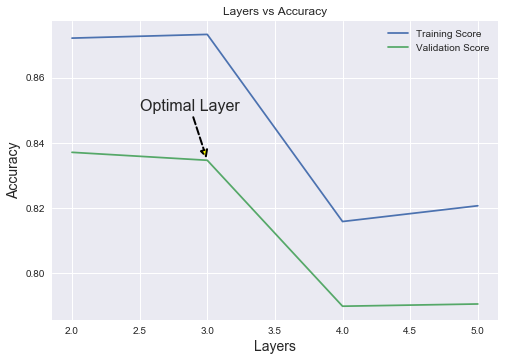

In [510]:
plt.style.use('seaborn')
plt.plot(mlp_df_lay['Layers'], mlp_df_lay['TrainAccuracy'], label = 'Training Score')
plt.plot(mlp_df_lay['Layers'], mlp_df_lay['ValidationAccuracy'], label = 'Validation Score')
plt.ylabel('Accuracy', fontsize = 14)
plt.xlabel('Layers', fontsize = 14)
plt.annotate("Optimal Layer",fontsize=16,xy=(3.0,0.8346117),xytext=(2.5, 0.85), arrowprops=dict(arrowstyle="-|>",connectionstyle="arc3",facecolor="yellow",edgecolor="black",linestyle='--',linewidth=2))
plt.title('Layers vs Accuracy')
plt.legend()

# Experimenting with Actication

In [402]:
#### Actication 
optimizer_value = keras.optimizers.Adam(learning_rate=0.01)
kfold = StratifiedKFold(n_splits=5, shuffle=True, random_state=33)
mlp_x_train = pd.DataFrame(mlp_x_train)
mlp_y_train = pd.DataFrame(mlp_y_train)
act_list = ['sigmoid','relu','tanh']
mlp_df_act = []
mlp_df_act = pd.DataFrame()
for act in act_list:
    mlp_score_act_train = []
    mlp_score_act_val = []
    for train, test in kfold.split(mlp_x_train, mlp_y_train):
        train = train.tolist()
        test = test.tolist()
        mlp_x_train_1 = mlp_x_train.iloc[train,:]
        mlp_y_train_1 = mlp_y_train.iloc[train,:]
        mlp_x_test_1 = mlp_x_train.iloc[test,:]
        mlp_y_test_1 = mlp_y_train.iloc[test,:]
#         print(train)
      # create model
        model = Sequential()
        model.add(Dense(16, input_dim=16, activation=act))
        model.add(Dense(16, activation=act))
        model.add(Dense(8, activation=act))
        model.add(Dense(1,activation = 'sigmoid'))
        # Compile model
        model.compile(loss= 'binary_crossentropy', optimizer='adam', metrics=['accuracy'])
        # Fit the model
        model.fit(mlp_x_train_1, mlp_y_train_1, epochs=250,batch_size = 200,verbose=0)
        # evaluate the model
        scores_act_train = model.evaluate(mlp_x_train_1, mlp_y_train_1, verbose=0)
        scores_act_val = model.evaluate(mlp_x_test_1, mlp_y_test_1, verbose=0)
        mlp_score_act_train.append(scores_act_train[1])
        mlp_score_act_val.append(scores_act_val[1]) 
    mean_score_train = np.mean(mlp_score_act_train)
    mean_score_val = np.mean(mlp_score_act_val)
    values_mlp_act  =  [act, mean_score_train,mean_score_val]
    values_mlp_act = pd.DataFrame(values_mlp_act).T
    mlp_df_act = pd.concat([mlp_df_act,values_mlp_act])        
mlp_df_act.columns = ['Activation','TrainAccuracy','ValidationAccuracy'] 

In [403]:
mlp_df_act

,Activation,TrainAccuracy,ValidationAccuracy
0,sigmoid,0.817569,0.804983
0,relu,0.866079,0.837378
0,tanh,0.867277,0.839651


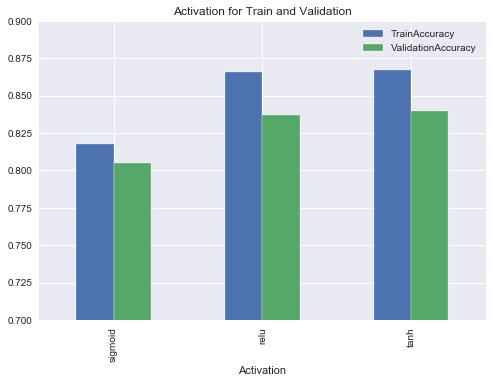

In [526]:
# plt.style.use('seaborn')
# plt.plot(mlp_df_act['Activation'], mlp_df_act['TrainAccuracy'], label = 'Training Score')
# plt.plot(mlp_df_act['Activation'], mlp_df_act['ValidationAccuracy'], label = 'Validation Score')
# plt.ylabel('F1 Score', fontsize = 14)
# plt.xlabel('Activation', fontsize = 14)
# # plt.title('Learning curves for SVM Linear Model', fontsize = 18, y = 1.03)
# plt.legend()

import matplotlib.pyplot as plt

mlp_df_act.plot(x='Activation', y=['TrainAccuracy','ValidationAccuracy'], kind="bar")
axes=plt.axes()
axes.set_ylim(0.7, 0.9)
plt.title('Activation for Train and Validation')
plt.legend()

plt.show()


In [408]:
from keras import backend as K

def recall_m(y_true, y_pred):
        true_positives = K.sum(K.round(K.clip(y_true * y_pred, 0, 1)))
        possible_positives = K.sum(K.round(K.clip(y_true, 0, 1)))
        recall = true_positives / (possible_positives + K.epsilon())
        return recall

def precision_m(y_true, y_pred):
        true_positives = K.sum(K.round(K.clip(y_true * y_pred, 0, 1)))
        predicted_positives = K.sum(K.round(K.clip(y_pred, 0, 1)))
        precision = true_positives / (predicted_positives + K.epsilon())
        return precision

def f1_m(y_true, y_pred):
    precision = precision_m(y_true, y_pred)
    recall = recall_m(y_true, y_pred)
    return 2*((precision*recall)/(precision+recall+K.epsilon()))

scores_final_train =[]
scores_final_train = pd.DataFrame()

model = Sequential()
model.add(Dense(16, input_dim=16, activation='relu'))
model.add(Dense(16, activation='relu'))
model.add(Dense(12, activation='relu'))
model.add(Dense(1,activation = 'sigmoid'))
# Compile model
model.compile(loss= 'binary_crossentropy', optimizer='adam', metrics=['acc',f1_m,precision_m, recall_m])

# Train_model

# Fit the model
model.fit(mlp_x_train, mlp_y_train, epochs=250,batch_size = 200,verbose=0)
# evaluate the model
scores_final_train = model.evaluate(mlp_x_train, mlp_y_train, verbose=0)
scores_final_train = pd.DataFrame(scores_final_train)
scores_final_train = scores_final_train.T
scores_final_train.columns = ['Loss','Accuracy','F1 Score','Precision ','Recall']

# Print Scores
print("Train Measures")
print(scores_final_train)


Train Measures
       Loss  Accuracy  F1 Score  Precision    Recall
0  0.317418  0.868637  0.817687    0.855676  0.79564


In [413]:
from keras import backend as K

def recall_m(y_true, y_pred):
        true_positives = K.sum(K.round(K.clip(y_true * y_pred, 0, 1)))
        possible_positives = K.sum(K.round(K.clip(y_true, 0, 1)))
        recall = true_positives / (possible_positives + K.epsilon())
        return recall

def precision_m(y_true, y_pred):
        true_positives = K.sum(K.round(K.clip(y_true * y_pred, 0, 1)))
        predicted_positives = K.sum(K.round(K.clip(y_pred, 0, 1)))
        precision = true_positives / (predicted_positives + K.epsilon())
        return precision

def f1_m(y_true, y_pred):
    precision = precision_m(y_true, y_pred)
    recall = recall_m(y_true, y_pred)
    return 2*((precision*recall)/(precision+recall+K.epsilon()))

scores_final_test =[]
scores_final_test = pd.DataFrame()
model = Sequential()
model.add(Dense(16, input_dim=16, activation='relu'))
model.add(Dense(16, activation='relu'))
model.add(Dense(12, activation='relu'))
model.add(Dense(1,activation = 'sigmoid'))
# Compile model
model.compile(loss= 'binary_crossentropy', optimizer='adam', metrics=['acc',f1_m,precision_m, recall_m])

# Fit the Model
model.fit(mlp_x_train, mlp_y_train, epochs=250,batch_size = 200,verbose=0)
# evaluate the model
scores_final_test = model.evaluate(mlp_x_test, mlp_y_test, verbose=0)
scores_final_test = pd.DataFrame(scores_final_test)
scores_final_test = scores_final_test.T
scores_final_test.columns = ['Loss','Accuracy','F1 Score','Precision ','Recall']

print("Test Measures")
print(scores_final_test)

Test Measures
       Loss  Accuracy  F1 Score  Precision     Recall
0  0.371832  0.848864  0.793554    0.838594  0.765888


In [414]:
model = Sequential()
model.add(Dense(16, input_dim=16, activation='relu'))
model.add(Dense(16, activation='relu'))
model.add(Dense(12, activation='relu'))
model.add(Dense(1,activation = 'sigmoid'))
# Compile model
model.compile(loss= 'binary_crossentropy', optimizer='adam', metrics=['accuracy'])
# Fit the model
history = model.fit(mlp_x_train, mlp_y_train,validation_split=0.33, epochs=250,batch_size = 200,verbose=0)
# temp3 = scores_final_train = model.evaluate(mlp_x_train, mlp_y_train, verbose=0)

dict_keys(['val_loss', 'val_accuracy', 'loss', 'accuracy'])


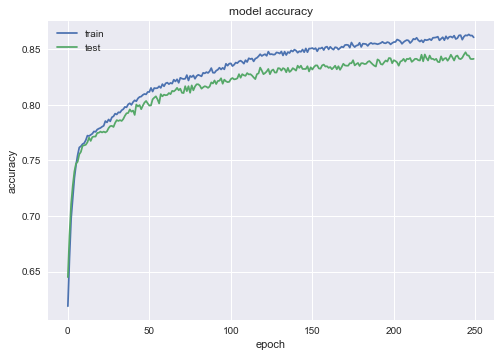

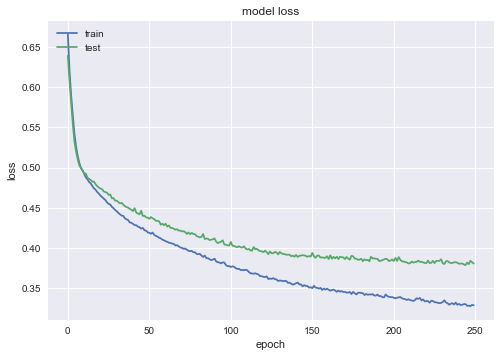

In [415]:
# list all data in history
print(history.history.keys())
# summarize history for accuracy
plt.plot(history.history['accuracy'])
plt.plot(history.history['val_accuracy'])
plt.title('model accuracy')
plt.ylabel('accuracy')
plt.xlabel('epoch')
plt.legend(['train', 'test'], loc='upper left')
plt.show()
# summarize history for loss
plt.plot(history.history['loss'])
plt.plot(history.history['val_loss'])
plt.title('model loss')
plt.ylabel('loss')
plt.xlabel('epoch')
plt.legend(['train', 'test'], loc='upper left')
plt.show()

# KNN

In [420]:
X_train, X_test, y_train, y_test=train_test_split(x, y, test_size=0.3, random_state=33)

In [433]:
from sklearn.model_selection import cross_val_score

# neighbors = [1,2,3,4,5,6,7,8]
neighbor_acc_df = pd.DataFrame()
score_list = []
for neighbor in range(1,100):
    model = KNeighborsClassifier(n_neighbors=neighbor)
    scores = cross_val_score(model, X_train, y_train, cv=3)
    print(neighbor, scores.mean())
    scores_knn = scores.mean() 
    score_list.append(scores_knn)
    values_knn  =  [neighbor, scores_knn]
    values_knn = pd.DataFrame(values_knn).T
    neighbor_acc_df = pd.concat([neighbor_acc_df,values_knn])
neighbor_acc_df.columns = ['Neigbors','Accuracy']

1 0.830316032369176
2 0.8186244583498713
3 0.8355928630235029
4 0.8236582571596897
5 0.8312093904546174
6 0.8191118075031163
7 0.8252824708758303
8 0.8136722766303196
9 0.8169199130076916
10 0.8077457723553602
11 0.8117240468233312
12 0.8042546888296521
13 0.8092884283103522
14 0.8012506380352252
15 0.8066091846616826
16 0.8004389563691686
17 0.804741958877406
18 0.7968668885971214
19 0.8014130613844767
20 0.7955677588959563
21 0.7967042279313974
22 0.7905338414279015
23 0.7932940297701649
24 0.7872862050505297
25 0.7884227136387162
26 0.784200992022409
27 0.7876921151008625
28 0.7816031083711606
29 0.7814406850219092
30 0.778355511546534
31 0.779654364378481
32 0.7742959561866328
33 0.7734842547442035
34 0.7699931514421228
35 0.773322068711425
36 0.7708049715427885
37 0.7729971824601769
38 0.768531756602688
39 0.770155733002356
40 0.7675575724818892
41 0.7700743532285621
42 0.7662585812153333
43 0.7672328048888776
44 0.7640662120869631
45 0.7665831114918723
46 0.7619553413906232
47 0.

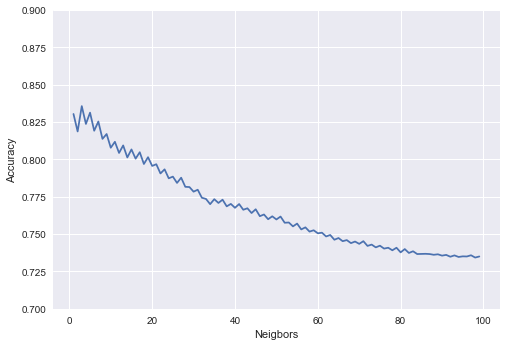

In [445]:
flatui = ["#9b59b6", "#3498db", "#95a5a6", "#e74c3c"]
svm_ax_lin=sns.lineplot(data=neighbor_acc_df ,x='Neigbors', y='Accuracy', legend='full', palette = flatui)
svm_ax_lin.set(ylim=(0.7, 0.9))
plt.show()

# Experiment with Distance and Neighbors

In [446]:
from sklearn.model_selection import cross_val_score

# neighbors = [1,2,3,4,5,6,7,8]
distance_neighbor_df = pd.DataFrame()
distance_metrics_list = ['chebyshev','minkowski','manhattan']
for distance_metric in distance_metrics_list:
    for neighbor in range(1,11):
        model = KNeighborsClassifier(n_neighbors=neighbor,metric = distance_metric)
        scores = cross_val_score(model, X_train, y_train, cv=3)
#     print(neighbor, scores.mean())                          
        values  =  [distance_metric,neighbor,scores.mean()]
        values = pd.DataFrame(values).T
        distance_neighbor_df = pd.concat([distance_neighbor_df,values])

distance_neighbor_df.columns = ['DistanceMetric','Neighbor','Accuracy']
distance_neighbor_df['Neighbor'] = distance_neighbor_df['Neighbor'].astype(float)
distance_neighbor_df['Accuracy'] = distance_neighbor_df['Accuracy'].astype(float)

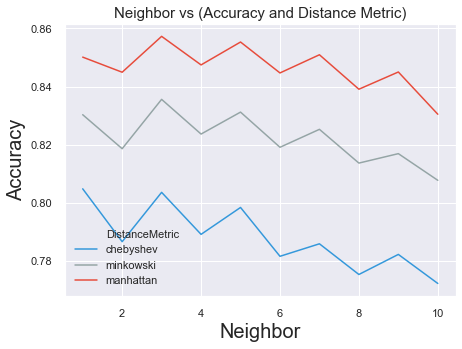

In [483]:
import seaborn as sns
flatui = ["#3498db", "#95a5a6", "#e74c3c"]
sns.set(rc={'figure.figsize':(7,5)})
sns.lineplot(data=distance_neighbor_df, x='Neighbor', y='Accuracy',hue='DistanceMetric',palette=flatui)
plt.xlabel("Neighbor",fontsize=20)
plt.ylabel("Accuracy",fontsize=20)
plt.title("Neighbor vs (Accuracy and Distance Metric)",fontsize=15)
plt.show()

# Best Attributes KNN

In [497]:
model = KNeighborsClassifier(n_neighbors=3,metric = 'manhattan')
model.fit(X_train, y_train)
y_pred = model.predict(X_test)
print("------------------Classification Report-----------------------")
print("")
print(classification_report(y_test, y_pred))

------------------Classification Report-----------------------

              precision    recall  f1-score   support

           0       0.88      0.92      0.90      3203
           1       0.86      0.80      0.83      2077

    accuracy                           0.87      5280
   macro avg       0.87      0.86      0.86      5280
weighted avg       0.87      0.87      0.87      5280



# Learning Curve

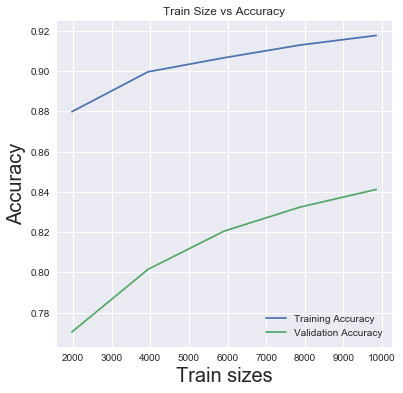

In [472]:
train_sizes, train_scores, valid_scores = learning_curve(KNeighborsClassifier(n_neighbors=3), 
    X_train, y_train,train_sizes=[0.2,0.4,0.6,0.8,1],cv=5,random_state=1,shuffle=True)

train_mean = train_scores.mean(axis=1)
valid_mean = valid_scores.mean(axis=1)

plt.figure(figsize=(6,6))
plt.plot(train_sizes, train_mean, label = 'Training Accuracy')
plt.plot(train_sizes, valid_mean, label = 'Validation Accuracy')
plt.xlabel("Train sizes",fontsize=20)
plt.ylabel("Accuracy",fontsize=20)
plt.title("Train Size vs Accuracy")
plt.legend(loc="lower right")
plt.show()